In [1]:
import numpy as np 
import scipy.optimize as opt
import matplotlib.pyplot as plt
import matplotlib

from torch.utils.data import DataLoader
import torch
import sklearn.preprocessing as skp


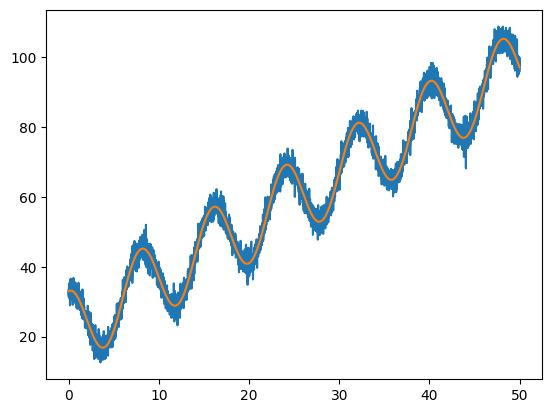

In [2]:
x = np.arange(0,50.01, 0.01)
a = 11; b = np.pi/4; c = 1.5; d = 22
y = a*np.cos(b*x) + c* x + d

n = len(y)
noise = np.random.randn(n)
ynoise = y+2*noise
plt.plot(x,ynoise,x,y)

plt.show()

xorig = np.arange(0,50.01, 0.01)
yorig = a*np.cos(b*xorig) + c* xorig + d


In [3]:
# Min max scaling can help with some of the numerical things we were talking about
sc = skp.MinMaxScaler()
xt = x[2000:4000].reshape(-1,1)
yn = ynoise[2000:4000].reshape(-1,1)
xt = sc.fit_transform(xt)
sc2 = skp.MinMaxScaler()
yt = sc2.fit_transform(yn)
xt = torch.tensor(xt).to(torch.float32)
yt = torch.tensor(yt).to(torch.float32)

class TimeSeriesDataset(torch.utils.data.Dataset):
    '''Takes input sequence of sensor measurements with shape (batch size, lags, num_sensors)
    and subsequent measurement, return Torch dataset'''
    def __init__(self, X, Y):
        self.X = X
        self.Y = Y
        self.len = X.shape[0]
        
    def __getitem__(self, index):
        return self.X[index], self.Y[index]
    
    def __len__(self):
        return self.len
train_dataset = TimeSeriesDataset(xt,yt)

In [4]:
# example build of feed forward neural network
class FNN(torch.nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(FNN, self).__init__()
        self.layer1 = torch.nn.Linear(input_size, hidden_size)
        self.layer2 = torch.nn.Linear(hidden_size, hidden_size)
        self.layer3 = torch.nn.Linear(hidden_size, hidden_size)
        self.layer4 = torch.nn.Linear(hidden_size, output_size)
        self.elu = torch.nn.ELU()
        self.relu = torch.nn.ReLU()

    def forward(self, z):
        z = self.layer1(z)
        z = self.elu(z)
        z = self.layer2(z)
        z = self.elu(z)
        z = self.layer3(z)
        z = self.elu(z)
        z = self.layer4(z)

        return z


## A slightly more flexible definition of a neural network that takes num_layers, hidden_size, and activation as arguments
class CustomFNN(torch.nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers, activation):
        super(CustomFNN, self).__init__()
        self.layers = torch.nn.ModuleList()
        self.layers.append(torch.nn.Linear(input_size, hidden_size))
        for _ in range(num_layers - 1):
            self.layers.append(torch.nn.Linear(hidden_size, hidden_size))
        self.layers.append(torch.nn.Linear(hidden_size, output_size))
        
        if activation == 'relu':
            self.activation = torch.nn.ReLU()
        elif activation == 'elu':
            self.activation = torch.nn.ELU()
        else:
            raise ValueError("Invalid activation function")
        
    def forward(self, z):
        for layer in self.layers[:-1]:
            z = layer(z)
            z = self.activation(z)
        z = self.layers[-1](z)
        return z


In [5]:
model = CustomFNN(1, 30, 1, 3, 'elu')
train_loader = DataLoader(train_dataset, batch_size=64)

In [6]:
lr = 1e-3; epochs = 5000
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
criterion = torch.nn.MSELoss()
for epoch in range(epochs):
    
    for _, data in enumerate(train_loader):
        model.train()
        
        outputs = model(data[0])
        optimizer.zero_grad()

        loss = criterion(outputs, data[1])
        loss.backward()
        optimizer.step()
    
    if epoch % 100 == 0:
        print(epoch)
        print(loss.item())

0
0.052687905728816986
100
0.038700103759765625
200
0.030376967042684555
300
0.015909455716609955
400
0.0022961178328841925
500
0.001673504477366805
600
0.0028738249093294144
700
0.003187998430803418
800
0.003125656396150589
900
0.0012393577490001917
1000
0.0024810866452753544
1100
0.0033530322834849358
1200
0.002794756321236491
1300
0.0023870610166341066
1400
0.00424856785684824
1500
0.0054193297401070595
1600
0.0023341644555330276
1700
0.004394274204969406
1800
0.0011712717823684216
1900
0.0037026142235845327
2000
0.0011893787886947393
2100
0.004096051212400198
2200
0.006840347312390804
2300
0.0012231814907863736
2400
0.0044808052480220795
2500
0.0013709526974707842
2600
0.004794930573552847
2700
0.007107027340680361
2800
0.0015336447395384312
2900
0.002562955254688859
3000
0.0013162248069420457
3100
0.007281103637069464
3200
0.005052441731095314
3300
0.0029708687216043472
3400
0.0021694160532206297
3500
0.01245204359292984
3600
0.001727695344015956
3700
0.0011761797359213233
3800
0.

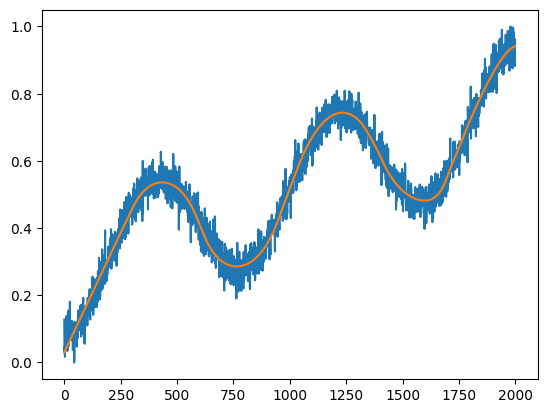

In [7]:
outs = model(train_dataset.X)
plt.plot(train_dataset.Y[:,0].detach().numpy())
plt.plot(outs[:,0].detach().numpy())

90.89121335195208


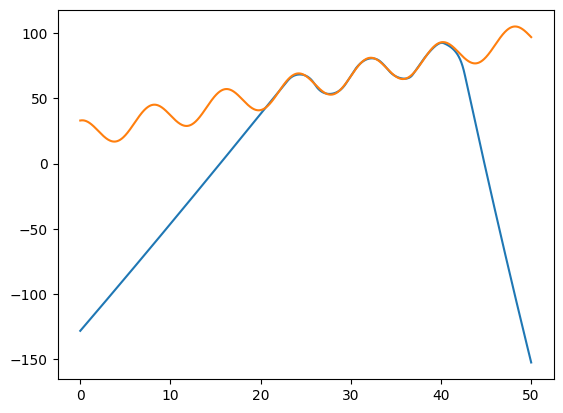

In [8]:
transformed_x_test = sc.transform(x.reshape(-1,1))
test_out = model(torch.tensor(transformed_x_test).to(torch.float32))

ytemp = test_out[:,0].detach().numpy()
y1extra = sc2.inverse_transform(ytemp.reshape(-1,1))
                          
plt.plot(xorig,y1extra)
plt.plot(xorig,yorig)

rmse = np.sqrt(np.mean((y1extra - yorig) ** 2))
print(rmse)

In [9]:


num_iterations = 1000
rmse = np.zeros(num_iterations)
curves = np.zeros((n,1))

for jloop in range(num_iterations):
    model = CustomFNN(1, 30, 1, 3, 'elu')
    lr = 1e-3; epochs = 3000
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = torch.nn.MSELoss()
    
    for epoch in range(epochs):
    
        for _, data in enumerate(train_loader):
            model.train()
        
            outputs = model(data[0])
            optimizer.zero_grad()

            loss = criterion(outputs, data[1])
            loss.backward()
            optimizer.step()
    
        if epoch % 100 == 0:
            print(epoch)
            print(loss.item())

    transformed_x_test = sc.transform(x.reshape(-1,1))
    test_out = model(torch.tensor(transformed_x_test).to(torch.float32))

    ytemp = test_out[:,0].detach().numpy()
    y1extra = sc2.inverse_transform(ytemp.reshape(-1,1))
                          
    #plt.plot(xorig,y1extra)
    #plt.plot(xorig,yorig)

    rmse[jloop] = np.sqrt(np.mean((y1extra - yorig) ** 2))
    curves = np.hstack((curves, y1extra))

    print(rmse)

    


0
0.06205088645219803
100
0.03576967865228653
200
0.03243518993258476
300
0.03101486712694168
400
0.030014287680387497
500
0.029465001076459885
600
0.0292668454349041
700
0.028981413692235947
800
0.02872362732887268
900
0.028554491698741913
1000
0.02844465710222721
1100
0.028423568233847618
1200
0.028230590745806694
1300
0.02819923684000969
1400
0.028504081070423126
1500
0.028812816366553307
1600
0.027556300163269043
1700
0.022359412163496017
1800
0.019102944061160088
1900
0.018373996019363403
2000
0.018815789371728897
2100
0.01803213730454445
2200
0.018094496801495552
2300
0.018250763416290283
2400
0.019168734550476074
2500
0.01790304109454155
2600
0.018092870712280273
2700
0.018212422728538513
2800
0.01813555508852005
2900
0.02142171934247017
[74.78007741  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          

100
0.0353691540658474
200
0.032638855278491974
300
0.030406828969717026
400
0.029210172593593597
500
0.028244873508810997
600
0.027690937742590904
700
0.026914522051811218
800
0.02599399909377098
900
0.024885063990950584
1000
0.019140224903821945
1100
0.005821599625051022
1200
0.0021595594007521868
1300
0.0042985305190086365
1400
0.0013732567895203829
1500
0.004735725931823254
1600
0.004110654816031456
1700
0.04363931715488434
1800
0.0035540484823286533
1900
0.0025574257597327232
2000
0.006371754687279463
2100
0.0324937142431736
2200
0.0014263612683862448
2300
0.00164515629876405
2400
0.0028597998898476362
2500
0.002503488678485155
2600
0.0013248339528217912
2700
0.0013794837286695838
2800
0.005135401617735624
2900
0.0031596235930919647
[74.78007741 61.15417051  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.     

100
0.04078928753733635
200
0.036159493029117584
300
0.03386831656098366
400
0.03262258321046829
500
0.031482916325330734
600
0.026655714958906174
700
0.008490128442645073
800
0.0024356648791581392
900
0.00379926897585392
1000
0.005303801968693733
1100
0.0020484356209635735
1200
0.0032202680595219135
1300
0.013237124308943748
1400
0.0048443106934428215
1500
0.0014237964060157537
1600
0.00251315301284194
1700
0.003383327042683959
1800
0.005691496189683676
1900
0.001522723468951881
2000
0.0012155850417912006
2100
0.0016669747419655323
2200
0.0012914080871269107
2300
0.0012147423112764955
2400
0.002387356013059616
2500
0.0013561745872721076
2600
0.0018999751191586256
2700
0.0013621927937492728
2800
0.004753141663968563
2900
0.001921745017170906
[74.78007741 61.15417051 78.95771936  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0. 

100
0.037158865481615067
200
0.032896529883146286
300
0.0313919298350811
400
0.030699636787176132
500
0.03034817799925804
600
0.03026542253792286
700
0.030551563948392868
800
0.029725456610322
900
0.02701920084655285
1000
0.02402650937438011
1100
0.019544566050171852
1200
0.018161499872803688
1300
0.012899257242679596
1400
0.014584850519895554
1500
0.00592825235798955
1600
0.0012520886957645416
1700
0.002914024982601404
1800
0.0012380857951939106
1900
0.0061363596469163895
2000
0.006714136339724064
2100
0.002754415851086378
2200
0.0012142157647758722
2300
0.0012047747150063515
2400
0.01208498515188694
2500
0.0035370427649468184
2600
0.0012389024486765265
2700
0.0019578023348003626
2800
0.0022453602869063616
2900
0.0012558982707560062
[74.78007741 61.15417051 78.95771936 66.32340777  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.         

100
0.03988087177276611
200
0.03470052033662796
300
0.03166091814637184
400
0.030649889260530472
500
0.03021187148988247
600
0.029902169480919838
700
0.030119482427835464
800
0.03041216917335987
900
0.021755879744887352
1000
0.01692654751241207
1100
0.017657702788710594
1200
0.018496643751859665
1300
0.018732523545622826
1400
0.019230283796787262
1500
0.02010493353009224
1600
0.02040230482816696
1700
0.020080380141735077
1800
0.020456131547689438
1900
0.02151746302843094
2000
0.01425127126276493
2100
0.007234961725771427
2200
0.0012431689538061619
2300
0.0012545223580673337
2400
0.0018318819347769022
2500
0.0013920061755925417
2600
0.0017611868679523468
2700
0.001431403448805213
2800
0.0011823573149740696
2900
0.001256939023733139
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.

100
0.035421617329120636
200
0.031234439462423325
300
0.029606111347675323
400
0.02893812768161297
500
0.028587300330400467
600
0.028209175914525986
700
0.028072664514183998
800
0.02785853110253811
900
0.027565496042370796
1000
0.027385585010051727
1100
0.02716793492436409
1200
0.02702745608985424
1300
0.02673824317753315
1400
0.026199618354439735
1500
0.0254583191126585
1600
0.02299748733639717
1700
0.019731391221284866
1800
0.009925100952386856
1900
0.0033544725738465786
2000
0.001421464723534882
2100
0.001272462191991508
2200
0.0012199720367789268
2300
0.003289931919425726
2400
0.001227318774908781
2500
0.0013472414575517178
2600
0.0019685178995132446
2700
0.0013558032223954797
2800
0.0012058140709996223
2900
0.0027545951306819916
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0. 

100
0.039887379854917526
200
0.034281887114048004
300
0.0314805693924427
400
0.0303773432970047
500
0.030276011675596237
600
0.030330795794725418
700
0.02941681444644928
800
0.027389217168092728
900
0.01921965926885605
1000
0.01670994982123375
1100
0.016872435808181763
1200
0.019275715574622154
1300
0.018283864483237267
1400
0.019062895327806473
1500
0.018991846591234207
1600
0.019073065370321274
1700
0.020906317979097366
1800
0.01919567584991455
1900
0.01964375376701355
2000
0.01953815296292305
2100
0.020169807597994804
2200
0.022121109068393707
2300
0.021563461050391197
2400
0.023437781259417534
2500
0.027050355449318886
2600
0.03119145706295967
2700
0.033726613968610764
2800
0.04049383103847504
2900
0.034622672945261
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  

100
0.03842266649007797
200
0.034723613411188126
300
0.03308457136154175
400
0.03224366530776024
500
0.0314817875623703
600
0.030921559780836105
700
0.030058061704039574
800
0.025090515613555908
900
0.012071408331394196
1000
0.005398200824856758
1100
0.002040959894657135
1200
0.0012764633866026998
1300
0.0018363954732194543
1400
0.010395647957921028
1500
0.037104282528162
1600
0.0030581147875636816
1700
0.0036803828552365303
1800
0.004475713707506657
1900
0.006335355341434479
2000
0.008516825735569
2100
0.00737325195223093
2200
0.0027725487016141415
2300
0.005992847960442305
2400
0.00567840738222003
2500
0.0073064398020505905
2600
0.0014960089465603232
2700
0.002742518438026309
2800
0.004411099012941122
2900
0.006722620688378811
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.      

100
0.04156981408596039
200
0.03686711937189102
300
0.03425019979476929
400
0.03223993629217148
500
0.031087208539247513
600
0.030362946912646294
700
0.029598955065011978
800
0.028895361348986626
900
0.025259938091039658
1000
0.0177148524671793
1100
0.006733019836246967
1200
0.0015616450691595674
1300
0.0018631138373166323
1400
0.0015915799885988235
1500
0.0024842650163918734
1600
0.0012098881416022778
1700
0.0012858959380537271
1800
0.005989395547658205
1900
0.002631649374961853
2000
0.004456076771020889
2100
0.0032148752361536026
2200
0.0017972339410334826
2300
0.0062486035749316216
2400
0.0019678007811307907
2500
0.0012042983435094357
2600
0.0012103596236556768
2700
0.0014552560169249773
2800
0.006480627227574587
2900
0.001230354537256062
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.     

100
0.039100781083106995
200
0.03531370311975479
300
0.03386792913079262
400
0.0330985002219677
500
0.03228335827589035
600
0.03161304444074631
700
0.031060190871357918
800
0.030262673273682594
900
0.029712919145822525
1000
0.029123635962605476
1100
0.028482669964432716
1200
0.027192985638976097
1300
0.0257617998868227
1400
0.023658066987991333
1500
0.011599808931350708
1600
0.0050917682237923145
1700
0.0022466001100838184
1800
0.001207031775265932
1900
0.002251301659271121
2000
0.0032169113401323557
2100
0.0031568307895213366
2200
0.00653088977560401
2300
0.002158232033252716
2400
0.002123197540640831
2500
0.0014919762033969164
2600
0.0016875466099008918
2700
0.0018256244948133826
2800
0.003880725707858801
2900
0.0037129910197108984
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0. 

100
0.03887207806110382
200
0.03503585234284401
300
0.032834768295288086
400
0.031041044741868973
500
0.029876865446567535
600
0.029212893918156624
700
0.028868140652775764
800
0.02831156924366951
900
0.028173303231596947
1000
0.02704109251499176
1100
0.020535908639431
1200
0.01081517618149519
1300
0.002201504074037075
1400
0.0012303072726354003
1500
0.001313396729528904
1600
0.0015538104344159365
1700
0.0022443002089858055
1800
0.0012129105161875486
1900
0.0013239114778116345
2000
0.0028782652225345373
2100
0.003944373689591885
2200
0.0021469187922775745
2300
0.001803054939955473
2400
0.0024095172993838787
2500
0.002451389329507947
2600
0.0011889972956851125
2700
0.0014205265324562788
2800
0.003391785081475973
2900
0.003075207816436887
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171  0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          

100
0.04019101709127426
200
0.03565531224012375
300
0.03290720283985138
400
0.03146534413099289
500
0.03086450882256031
600
0.030566373839974403
700
0.026944290846586227
800
0.007554407697170973
900
0.0019234047504141927
1000
0.003360399743542075
1100
0.0020546531304717064
1200
0.0012439327547326684
1300
0.0013163917465135455
1400
0.005168635863810778
1500
0.005559328943490982
1600
0.0571478009223938
1700
0.01023621391505003
1800
0.00296220974996686
1900
0.006530942395329475
2000
0.002433297224342823
2100
0.004953157156705856
2200
0.001224768115207553
2300
0.004023865330964327
2400
0.0018713133176788688
2500
0.0024973545223474503
2600
0.001378866145387292
2700
0.002040972700342536
2800
0.0035788733512163162
2900
0.0035560328979045153
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.     

100
0.03619282692670822
200
0.03281711786985397
300
0.031124280765652657
400
0.030174415558576584
500
0.02908679097890854
600
0.028088415041565895
700
0.027325991541147232
800
0.02661416307091713
900
0.026210593059659004
1000
0.025820152834057808
1100
0.025542622432112694
1200
0.025142807513475418
1300
0.02480718307197094
1400
0.02473347820341587
1500
0.02474340982735157
1600
0.024885592982172966
1700
0.02656686119735241
1800
0.015914540737867355
1900
0.018059352412819862
2000
0.015833066776394844
2100
0.01670302078127861
2200
0.017381824553012848
2300
0.018501974642276764
2400
0.017367780208587646
2500
0.016929220408201218
2600
0.014822014607489109
2700
0.012779741548001766
2800
0.00948193110525608
2900
0.005776515230536461
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261   0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.  

100
0.036022406071424484
200
0.03294682875275612
300
0.03147456422448158
400
0.030576715245842934
500
0.029979411512613297
600
0.029545200988650322
700
0.02896965853869915
800
0.028862755745649338
900
0.028773315250873566
1000
0.02837795950472355
1100
0.020942244678735733
1200
0.016144221648573875
1300
0.016787322238087654
1400
0.017317835241556168
1500
0.016739796847105026
1600
0.0025151120498776436
1700
0.0012032981030642986
1800
0.001893073902465403
1900
0.0025565840769559145
2000
0.00188817351590842
2100
0.0012368455063551664
2200
0.005147574003785849
2300
0.0012199090560898185
2400
0.0012260625371709466
2500
0.0018587909871712327
2600
0.004825393669307232
2700
0.0014027913566678762
2800
0.0012477021664381027
2900
0.002675208728760481
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753  0.          0.          0.          0.
  0.          0.          0.          0.

100
0.036047548055648804
200
0.03191005438566208
300
0.02661212719976902
400
0.016226254403591156
500
0.003819887526333332
600
0.0012084228219464421
700
0.0020869364961981773
800
0.002689387183636427
900
0.0022393984254449606
1000
0.0038646962493658066
1100
0.006611615419387817
1200
0.0027441014535725117
1300
0.001545177074149251
1400
0.0030778462532907724
1500
0.0014798236079514027
1600
0.0012709317961707711
1700
0.005882924888283014
1800
0.0011927682207897305
1900
0.008038416504859924
2000
0.006864843890070915
2100
0.006357718259096146
2200
0.0026821335777640343
2300
0.0033180394675582647
2400
0.0019426262006163597
2500
0.0022000076714903116
2600
0.0013588621513918042
2700
0.0020847416017204523
2800
0.001752654672600329
2900
0.0012049382785335183
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515  0.          0.          0.
  0.          0.          0.  

100
0.039465200155973434
200
0.03560333326458931
300
0.033064376562833786
400
0.03142071142792702
500
0.030484888702630997
600
0.029760880395770073
700
0.028921401128172874
800
0.028571903705596924
900
0.028059635311365128
1000
0.027709539979696274
1100
0.027424799278378487
1200
0.027157161384820938
1300
0.02696293592453003
1400
0.026827286928892136
1500
0.026233254000544548
1600
0.026358868926763535
1700
0.02633080631494522
1800
0.02602701634168625
1900
0.026105418801307678
2000
0.025836747139692307
2100
0.025791414082050323
2200
0.025745559483766556
2300
0.02562529221177101
2400
0.025461863726377487
2500
0.025339078158140182
2600
0.025328688323497772
2700
0.0250924751162529
2800
0.025022873654961586
2900
0.025103772059082985
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982  0.          0.
  0.          0.          0.          0.          0.

100
0.04228689521551132
200
0.03785201907157898
300
0.03579328954219818
400
0.0341637060046196
500
0.033022690564394
600
0.03227212652564049
700
0.03157033026218414
800
0.030538316816091537
900
0.02919546328485012
1000
0.022269489243626595
1100
0.016749290749430656
1200
0.014342952519655228
1300
0.014239681884646416
1400
0.015096696093678474
1500
0.013594606891274452
1600
0.008128595538437366
1700
0.002388271503150463
1800
0.001233853166922927
1900
0.002568599535152316
2000
0.00358229735866189
2100
0.005127416457980871
2200
0.002003744011744857
2300
0.003158135339617729
2400
0.0065179564990103245
2500
0.00302292057313025
2600
0.0012843337608501315
2700
0.0029684652108699083
2800
0.002564776688814163
2900
0.010672466829419136
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387  0.
  0.          0.          0.          0.          0.  

100
0.03944658488035202
200
0.03469208627939224
300
0.03233896195888519
400
0.030175987631082535
500
0.022035691887140274
600
0.002216129330918193
700
0.001579752773977816
800
0.002586724003776908
900
0.0035214913077652454
1000
0.0019797866698354483
1100
0.00638191681355238
1200
0.001896342495456338
1300
0.001297176699154079
1400
0.0011920253746211529
1500
0.0020732381381094456
1600
0.0012121014297008514
1700
0.001306709018535912
1800
0.0015033390372991562
1900
0.0012668523704633117
2000
0.0012472068192437291
2100
0.0013167024590075016
2200
0.001319010858424008
2300
0.001484956475906074
2400
0.001751061761751771
2500
0.0016567587153986096
2600
0.0016843191115185618
2700
0.0012005568714812398
2800
0.00119769515004009
2900
0.002371939830482006
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
  0.          0.          0.  

100
0.03791257366538048
200
0.03346133232116699
300
0.030892640352249146
400
0.029856139793992043
500
0.029091503471136093
600
0.028782116249203682
700
0.028957942500710487
800
0.02923543192446232
900
0.02939358912408352
1000
0.026848383247852325
1100
0.018905866891145706
1200
0.017483539879322052
1300
0.018336091190576553
1400
0.018927790224552155
1500
0.01997508853673935
1600
0.022163942456245422
1700
0.023464059457182884
1800
0.02088124118745327
1900
0.021400026977062225
2000
0.022852638736367226
2100
0.02520441822707653
2200
0.02908558025956154
2300
0.04059874266386032
2400
0.03809729218482971
2500
0.03695609048008919
2600
0.03362871706485748
2700
0.008336800150573254
2800
0.004580518696457148
2900
0.0028934674337506294
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028    0.          0.          0.        

100
0.039251845329999924
200
0.03555992990732193
300
0.03355680778622627
400
0.030642418190836906
500
0.023653900250792503
600
0.011563805863261223
700
0.0019206504803150892
800
0.0015869778580963612
900
0.003502643434330821
1000
0.003069621045142412
1100
0.0032254161778837442
1200
0.002205707598477602
1300
0.0013805313501507044
1400
0.00256484211422503
1500
0.0027441151905804873
1600
0.001621147501282394
1700
0.001200057682581246
1800
0.0034822411835193634
1900
0.013012665323913097
2000
0.0017815843457356095
2100
0.00645826430991292
2200
0.05069948360323906
2300
0.001166642177850008
2400
0.0020416593179106712
2500
0.005877906456589699
2600
0.013669474981725216
2700
0.0011714426800608635
2800
0.004526876378804445
2900
0.003759554820135236
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433  0.     

100
0.040593791753053665
200
0.03564852103590965
300
0.033633001148700714
400
0.03263470530509949
500
0.03134333714842796
600
0.030634455382823944
700
0.029768848791718483
800
0.02889271266758442
900
0.027932310476899147
1000
0.02548130229115486
1100
0.0218577329069376
1200
0.014384360983967781
1300
0.004265335388481617
1400
0.001242529135197401
1500
0.001295072608627379
1600
0.00322456331923604
1700
0.0025756352115422487
1800
0.005350325256586075
1900
0.0012086411006748676
2000
0.004122547339648008
2100
0.002541718538850546
2200
0.0012090627569705248
2300
0.0034193992614746094
2400
0.006396713200956583
2500
0.00282025127671659
2600
0.003917096182703972
2700
0.0020256524439901114
2800
0.0015027045737951994
2900
0.010496461763978004
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639  0.

100
0.0415237694978714
200
0.0363549180328846
300
0.03417757898569107
400
0.033049196004867554
500
0.032603513449430466
600
0.03230664134025574
700
0.031069528311491013
800
0.020613087341189384
900
0.026674240827560425
1000
0.020242149010300636
1100
0.028224710375070572
1200
0.020581811666488647
1300
0.020612284541130066
1400
0.03062262199819088
1500
0.022204149514436722
1600
0.021073700860142708
1700
0.02044532634317875
1800
0.021170862019062042
1900
0.020695529878139496
2000
0.02113269455730915
2100
0.020574728026986122
2200
0.020486224442720413
2300
0.02239024080336094
2400
0.019913800060749054
2500
0.013940206728875637
2600
0.004722253419458866
2700
0.0014206280466169119
2800
0.00495544308796525
2900
0.002205796539783478
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 61.4015683

100
0.03978729248046875
200
0.034613706171512604
300
0.031994499266147614
400
0.03111833520233631
500
0.030567338690161705
600
0.0295260027050972
700
0.02671092376112938
800
0.023447472602128983
900
0.01784079149365425
1000
0.017087161540985107
1100
0.01750224269926548
1200
0.02161160670220852
1300
0.021479865536093712
1400
0.0311442781239748
1500
0.03263670206069946
1600
0.030142448842525482
1700
0.02344653010368347
1800
0.003809654852375388
1900
0.003349713049829006
2000
0.0012357800733298063
2100
0.0036317671183496714
2200
0.0012077995343133807
2300
0.001448328490369022
2400
0.0011938810348510742
2500
0.0020626881159842014
2600
0.001205362263135612
2700
0.001182824489660561
2800
0.004627974703907967
2900
0.0013616724172607064
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 61.401

100
0.040619634091854095
200
0.03538862243294716
300
0.032460927963256836
400
0.030823037028312683
500
0.02976307086646557
600
0.02905450202524662
700
0.028698328882455826
800
0.025102868676185608
900
0.01575561985373497
1000
0.013586921617388725
1100
0.024752579629421234
1200
0.003156656166538596
1300
0.003877280978485942
1400
0.003592652501538396
1500
0.0012103699846193194
1600
0.0017847833223640919
1700
0.001219674595631659
1800
0.002170395338907838
1900
0.0012999599566683173
2000
0.0023659674916416407
2100
0.0020322271157056093
2200
0.0012104081688448787
2300
0.001469588722102344
2400
0.0028900140896439552
2500
0.0013350924709811807
2600
0.0048786336556077
2700
0.0016767518827691674
2800
0.0011928166495636106
2900
0.0014662507455796003
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.6299

100
0.04250713810324669
200
0.03718901425600052
300
0.03420242294669151
400
0.03258238732814789
500
0.031446196138858795
600
0.030996274203062057
700
0.031168198212981224
800
0.028800304979085922
900
0.020082300528883934
1000
0.020893581211566925
1100
0.020703909918665886
1200
0.021102847531437874
1300
0.021627964451909065
1400
0.007612733636051416
1500
0.0033930514473468065
1600
0.001592349959537387
1700
0.0012458262499421835
1800
0.11728619039058685
1900
0.003154253587126732
2000
0.002730598207563162
2100
0.001696901279501617
2200
0.0049261110834777355
2300
0.0067454250529408455
2400
0.0013664315920323133
2500
0.0024167278315871954
2600
0.0023917928338050842
2700
0.19002097845077515
2800
0.0027828377205878496
2900
0.003813296090811491
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.6299863

100
0.04084889218211174
200
0.03604467958211899
300
0.03336068615317345
400
0.03138873726129532
500
0.029882825911045074
600
0.02924923785030842
700
0.028734540566802025
800
0.028637511655688286
900
0.02930634282529354
1000
0.02953169122338295
1100
0.027284353971481323
1200
0.01917528733611107
1300
0.017139146104454994
1400
0.017739539965987206
1500
0.01816696487367153
1600
0.019191652536392212
1700
0.02692645788192749
1800
0.019061923027038574
1900
0.019612431526184082
2000
0.028371796011924744
2100
0.02023349143564701
2200
0.02119956538081169
2300
0.019961044192314148
2400
0.018831225112080574
2500
0.013968659564852715
2600
0.004712998401373625
2700
0.0012425448512658477
2800
0.0017413065070286393
2900
0.02792475000023842
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 61.40156837

100
0.04025832936167717
200
0.03585273027420044
300
0.03335866704583168
400
0.03146883100271225
500
0.030314741656184196
600
0.029306285083293915
700
0.02849954180419445
800
0.028146930038928986
900
0.028522949665784836
1000
0.01791033148765564
1100
0.016559574753046036
1200
0.017376281321048737
1300
0.017713259905576706
1400
0.0177854485809803
1500
0.013462585397064686
1600
0.019891809672117233
1700
0.0023255120031535625
1800
0.00875895656645298
1900
0.004911124240607023
2000
0.005260118283331394
2100
0.004948677960783243
2200
0.003431090386584401
2300
0.002127004088833928
2400
0.006947165355086327
2500
0.004692135378718376
2600
0.0036815411876887083
2700
0.001697693602181971
2800
0.001555637689307332
2900
0.0028676376678049564
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 61.401

100
0.03870493173599243
200
0.034817006438970566
300
0.03270925208926201
400
0.031348224729299545
500
0.030978135764598846
600
0.03099607676267624
700
0.020075883716344833
800
0.01958797313272953
900
0.023038305342197418
1000
0.03367725759744644
1100
0.03384621441364288
1200
0.026518041267991066
1300
0.0025996258482337
1400
0.0011953747598454356
1500
0.003912616521120071
1600
0.0013100546784698963
1700
0.0012925129849463701
1800
0.0014403724344447255
1900
0.0013255761004984379
2000
0.001499891048297286
2100
0.002525524003431201
2200
0.001194835058413446
2300
0.0025829121004790068
2400
0.0012408292386680841
2500
0.0012571645202115178
2600
0.001187421614304185
2700
0.0014502713456749916
2800
0.0014676658902317286
2900
0.0025237121153622866
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.629986

100
0.03980971872806549
200
0.035059377551078796
300
0.03272475674748421
400
0.03158070892095566
500
0.031104208901524544
600
0.031286440789699554
700
0.03126195818185806
800
0.026435360312461853
900
0.019234608858823776
1000
0.017164379358291626
1100
0.01920570246875286
1200
0.020591439679265022
1300
0.027302851900458336
1400
0.03191601485013962
1500
0.03561444580554962
1600
0.01416289247572422
1700
0.003396174404770136
1800
0.001303603989072144
1900
0.0066603850573301315
2000
0.022429222241044044
2100
0.00657935906201601
2200
0.004732006229460239
2300
0.007790697738528252
2400
0.00907914899289608
2500
0.0012621473288163543
2600
0.005852577276527882
2700
0.0036875868681818247
2800
0.0036244101356714964
2900
0.004204295575618744
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 61.401

100
0.03931296989321709
200
0.03580624982714653
300
0.03400253504514694
400
0.032535847276449203
500
0.02960791625082493
600
0.025418324396014214
700
0.020309532061219215
800
0.014932370744645596
900
0.009388616308569908
1000
0.0021594995632767677
1100
0.0022942344658076763
1200
0.0019458630122244358
1300
0.002862935420125723
1400
0.0022418287117034197
1500
0.001442071981728077
1600
0.001572814304381609
1700
0.0016663563437759876
1800
0.0016186257125809789
1900
0.006979317404329777
2000
0.001338267931714654
2100
0.0018963005859404802
2200
0.019772302359342575
2300
0.04453735426068306
2400
0.0015895864926278591
2500
0.009002942591905594
2600
0.0012106194626539946
2700
0.002927854424342513
2800
0.004230824299156666
2900
0.011099237948656082
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998

100
0.04277031123638153
200
0.03728475049138069
300
0.03461098670959473
400
0.03282966464757919
500
0.031552549451589584
600
0.030862927436828613
700
0.03223602473735809
800
0.011534403078258038
900
0.001919606700539589
1000
0.0014930751640349627
1100
0.0025182648096233606
1200
0.005058988928794861
1300
0.007276993244886398
1400
0.001404301030561328
1500
0.002389871748164296
1600
0.001368729048408568
1700
0.002396876458078623
1800
0.0012216432951390743
1900
0.0025265668518841267
2000
0.0013293966185301542
2100
0.0012326394207775593
2200
0.0012466440675780177
2300
0.0029491831082850695
2400
0.0028928660321980715
2500
0.0018602674826979637
2600
0.0012507077772170305
2700
0.0013807093491777778
2800
0.00159872742369771
2900
0.002242509974166751
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.629

100
0.03960930556058884
200
0.03588791936635971
300
0.03409869223833084
400
0.032660529017448425
500
0.03142702206969261
600
0.030538510531187057
700
0.02979406900703907
800
0.029543111100792885
900
0.0290974173694849
1000
0.029511835426092148
1100
0.029191656038165092
1200
0.0292554572224617
1300
0.029530080035328865
1400
0.029069140553474426
1500
0.01840859465301037
1600
0.01759837381541729
1700
0.017882004380226135
1800
0.021051615476608276
1900
0.018342845141887665
2000
0.017969734966754913
2100
0.0182774867862463
2200
0.020772190764546394
2300
0.019376497715711594
2400
0.018201926723122597
2500
0.018026473000645638
2600
0.018289916217327118
2700
0.018108908087015152
2800
0.0181413684040308
2900
0.023991625756025314
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 61.40156837 49.

100
0.04307454824447632
200
0.03882210701704025
300
0.036770377308130264
400
0.03484801575541496
500
0.03296813368797302
600
0.02970413863658905
700
0.023094620555639267
800
0.015081005170941353
900
0.004005059599876404
1000
0.001250371104106307
1100
0.0013246587477624416
1200
0.0012092263204976916
1300
0.001389135024510324
1400
0.0021994193084537983
1500
0.0020183392334729433
1600
0.0025107983965426683
1700
0.00762935308739543
1800
0.0019943148363381624
1900
0.0011966023594141006
2000
0.0013635928044095635
2100
0.0017441343516111374
2200
0.001201494364067912
2300
0.0032232205849140882
2400
0.0018559322925284505
2500
0.0012038637651130557
2600
0.0011872834293171763
2700
0.0011988242622464895
2800
0.001220058766193688
2900
0.0011863699182868004
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.

100
0.038950104266405106
200
0.03539622575044632
300
0.03300361707806587
400
0.031225381419062614
500
0.029621116816997528
600
0.02921222150325775
700
0.020473385229706764
800
0.01143679954111576
900
0.00330450851470232
1000
0.002601729705929756
1100
0.0022210790775716305
1200
0.0050035566091537476
1300
0.0021116365678608418
1400
0.00422391714528203
1500
0.002399705583229661
1600
0.004129029344767332
1700
0.0028424609918147326
1800
0.0013614383060485125
1900
0.0036142724566161633
2000
0.0023596305400133133
2100
0.003886051010340452
2200
0.0023535219952464104
2300
0.0028622797690331936
2400
0.0036193805281072855
2500
0.002378274919465184
2600
0.0026379250921308994
2700
0.0029102328699082136
2800
0.002889930969104171
2900
0.0023821585346013308
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62

100
0.04168589413166046
200
0.036561716347932816
300
0.0339827723801136
400
0.0321677103638649
500
0.030846374109387398
600
0.029847512021660805
700
0.029665712267160416
800
0.030169829726219177
900
0.029654430225491524
1000
0.025734687224030495
1100
0.0203733928501606
1200
0.01806509867310524
1300
0.017153341323137283
1400
0.021375561133027077
1500
0.02101118676364422
1600
0.0274700615555048
1700
0.034464672207832336
1800
0.031221920624375343
1900
0.011712118983268738
2000
0.005089646205306053
2100
0.004488600883632898
2200
0.006089233327656984
2300
0.0021206806413829327
2400
0.004341937601566315
2500
0.004070051945745945
2600
0.0013901740312576294
2700
0.008293934166431427
2800
0.002641692291945219
2900
0.07481708377599716
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 61.4015683

100
0.03880121931433678
200
0.03480196371674538
300
0.03316361829638481
400
0.031841445714235306
500
0.031117552891373634
600
0.030982298776507378
700
0.030527077615261078
800
0.028176970779895782
900
0.02263454720377922
1000
0.018493926152586937
1100
0.017922714352607727
1200
0.023458966985344887
1300
0.005995486862957478
1400
0.001291403197683394
1500
0.0014033560873940587
1600
0.002209847792983055
1700
0.0017286046640947461
1800
0.005020814947783947
1900
0.0034950487315654755
2000
0.0018705262336879969
2100
0.0023102853447198868
2200
0.003777831792831421
2300
0.004144628066569567
2400
0.004842652473598719
2500
0.002739137504249811
2600
0.00132913573179394
2700
0.004748479928821325
2800
0.0012533448170870543
2900
0.0029830853454768658
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.6299863

100
0.043738704174757004
200
0.03850482031702995
300
0.03578292578458786
400
0.03446037322282791
500
0.03350125998258591
600
0.03267206251621246
700
0.03177995979785919
800
0.03089495375752449
900
0.03055782988667488
1000
0.03048258274793625
1100
0.027858594432473183
1200
0.020560946315526962
1300
0.018568886443972588
1400
0.02056964673101902
1500
0.016968827694654465
1600
0.016454117372632027
1700
0.01604893058538437
1800
0.015737254172563553
1900
0.015549466013908386
2000
0.015353266149759293
2100
0.01472946535795927
2200
0.014497943222522736
2300
0.01409057155251503
2400
0.013849928975105286
2500
0.013675695285201073
2600
0.013170912861824036
2700
0.01281826477497816
2800
0.012452739290893078
2900
0.012158111669123173
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 61.40156837 49

100
0.04149795323610306
200
0.03685396537184715
300
0.03452040255069733
400
0.03295009955763817
500
0.031655777245759964
600
0.029269734397530556
700
0.019733848050236702
800
0.005527915433049202
900
0.004100257530808449
1000
0.001406271941959858
1100
0.0045951795764267445
1200
0.002049014437943697
1300
0.0014715305296704173
1400
0.0018468875205144286
1500
0.002855761907994747
1600
0.001346126664429903
1700
0.0012181889032945037
1800
0.00952221266925335
1900
0.0023118385579437017
2000
0.0012575669679790735
2100
0.0013012901181355119
2200
0.002046035137027502
2300
0.0011953212087973952
2400
0.0013666556915268302
2500
0.004178217612206936
2600
0.007077156100422144
2700
0.0012541197938844562
2800
0.001261702156625688
2900
0.0018174925353378057
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.629

100
0.04169764369726181
200
0.03633175790309906
300
0.03367825224995613
400
0.03209841251373291
500
0.030837107449769974
600
0.029675014317035675
700
0.027699775993824005
800
0.023959502577781677
900
0.010347082279622555
1000
0.004186201840639114
1100
0.004032841883599758
1200
0.003616730449721217
1300
0.008485336787998676
1400
0.0011932409834116697
1500
0.0022467367816716433
1600
0.03034958243370056
1700
0.0037303112912923098
1800
0.0016822341131046414
1900
0.06338337808847427
2000
0.004594036843627691
2100
0.0030591690447181463
2200
0.021059267222881317
2300
0.0014982139691710472
2400
0.003826356492936611
2500
0.005737392697483301
2600
0.0013613695045933127
2700
0.0011723005445674062
2800
0.01608358323574066
2900
0.0013082653749734163
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.6299863

100
0.04244839400053024
200
0.03773340582847595
300
0.03457193449139595
400
0.032607100903987885
500
0.029610367491841316
600
0.02077903039753437
700
0.005401399917900562
800
0.0012275602202862501
900
0.006710744462907314
1000
0.0023566156160086393
1100
0.0012576192384585738
1200
0.00144208746496588
1300
0.003345392644405365
1400
0.007949808612465858
1500
0.0013375133275985718
1600
0.001469782437197864
1700
0.0018049071077257395
1800
0.00386280519887805
1900
0.0028880711179226637
2000
0.0019676366355270147
2100
0.0037091663107275963
2200
0.002319032559171319
2300
0.0016746370820328593
2400
0.0018662568181753159
2500
0.0016417920123785734
2600
0.0015358597738668323
2700
0.008140627294778824
2800
0.005173598416149616
2900
0.002099716803058982
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.629

100
0.036365311592817307
200
0.03289536014199257
300
0.031441643834114075
400
0.0303081925958395
500
0.03018568828701973
600
0.030002282932400703
700
0.029089612886309624
800
0.030471252277493477
900
0.021698767319321632
1000
0.01822950504720211
1100
0.01775144413113594
1200
0.01898600347340107
1300
0.019793910905718803
1400
0.02128511480987072
1500
0.024608246982097626
1600
0.025256147608160973
1700
0.02992304600775242
1800
0.03251821920275688
1900
0.03374752774834633
2000
0.01300596259534359
2100
0.0014337570173665881
2200
0.001644916832447052
2300
0.0019337661797180772
2400
0.0015459938440471888
2500
0.0012208507396280766
2600
0.0014863840769976377
2700
0.0016950508579611778
2800
0.0017246040515601635
2900
0.0018223040970042348
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 61.4

100
0.03943090885877609
200
0.034379713237285614
300
0.03223232552409172
400
0.030962085351347923
500
0.030187813565135002
600
0.029831795021891594
700
0.02996959537267685
800
0.02983151748776436
900
0.02985217235982418
1000
0.026942355558276176
1100
0.017862802371382713
1200
0.01675286516547203
1300
0.01875239610671997
1400
0.017710641026496887
1500
0.018162328749895096
1600
0.01906309649348259
1700
0.01950705610215664
1800
0.01962234079837799
1900
0.020115692168474197
2000
0.02010728046298027
2100
0.019924774765968323
2200
0.022203147411346436
2300
0.022253492847085
2400
0.020670849829912186
2500
0.02368743345141411
2600
0.03137640282511711
2700
0.02950821816921234
2800
0.035233274102211
2900
0.0406893752515316
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 61.40156837 49.7956839

100
0.04062628000974655
200
0.03709257394075394
300
0.03455904498696327
400
0.03265349566936493
500
0.0312572605907917
600
0.029932662844657898
700
0.026282761245965958
800
0.018981942906975746
900
0.006162835750728846
1000
0.005065754987299442
1100
0.0038559958338737488
1200
0.0033387928269803524
1300
0.0016376907005906105
1400
0.0031519720796495676
1500
0.006592797115445137
1600
0.003208539681509137
1700
0.0028994488529860973
1800
0.007166269700974226
1900
0.0026299383025616407
2000
0.007824152708053589
2100
0.0025757350958883762
2200
0.006230875849723816
2300
0.0013347039930522442
2400
0.003173960605636239
2500
0.00606839032843709
2600
0.0014447011053562164
2700
0.004163032863289118
2800
0.0030723758973181248
2900
0.19286714494228363
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.6299863

100
0.037340596318244934
200
0.03356603533029556
300
0.03154440224170685
400
0.030170869082212448
500
0.029638225212693214
600
0.029644135385751724
700
0.029126247391104698
800
0.026667270809412003
900
0.018824314698576927
1000
0.016719037666916847
1100
0.017565704882144928
1200
0.01802773028612137
1300
0.01986478455364704
1400
0.022885708138346672
1500
0.030499812215566635
1600
0.03484581783413887
1700
0.02516699582338333
1800
0.014100292697548866
1900
0.005094180349260569
2000
0.0040468089282512665
2100
0.00139555090572685
2200
0.0028896615840494633
2300
0.0011822022497653961
2400
0.006497210822999477
2500
0.0014801215147599578
2600
0.002152795670554042
2700
0.0015006830217316747
2800
0.0030634338036179543
2900
0.0018863433506339788
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 

100
0.039604391902685165
200
0.03499545529484749
300
0.032385945320129395
400
0.030690595507621765
500
0.029125267639756203
600
0.02627832256257534
700
0.013551389798521996
800
0.0026022889651358128
900
0.0018241655780002475
1000
0.0023142313584685326
1100
0.0014283409109339118
1200
0.009123221039772034
1300
0.005583776161074638
1400
0.0032222387380898
1500
0.0019674752838909626
1600
0.0012006281176581979
1700
0.0014536208473145962
1800
0.0017089084722101688
1900
0.001211971160955727
2000
0.002050096169114113
2100
0.0021098661236464977
2200
0.0012207275722175837
2300
0.0025044670328497887
2400
0.0011981084244325757
2500
0.0013473696308210492
2600
0.003866874147206545
2700
0.001250318717211485
2800
0.0013002145569771528
2900
0.0021714416798204184
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 7

100
0.042153630405664444
200
0.036970458924770355
300
0.03415858373045921
400
0.03291730582714081
500
0.03223720192909241
600
0.03247987851500511
700
0.03209798038005829
800
0.029295960441231728
900
0.026453925296664238
1000
0.021666893735527992
1100
0.019576415419578552
1200
0.01945536956191063
1300
0.022160446271300316
1400
0.022650564089417458
1500
0.027745183557271957
1600
0.035668082535266876
1700
0.03752213716506958
1800
0.025961002334952354
1900
0.0037895948626101017
2000
0.0046911160461604595
2100
0.003195668337866664
2200
0.0024489848874509335
2300
0.0017083558486774564
2400
0.0015204090159386396
2500
0.001254180446267128
2600
0.0017340693157166243
2700
0.0014774312730878592
2800
0.001905924640595913
2900
0.001692584133706987
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 

100
0.040585167706012726
200
0.03613590821623802
300
0.03343012183904648
400
0.03214174509048462
500
0.03134680911898613
600
0.03093034401535988
700
0.031315114349126816
800
0.02648349106311798
900
0.018282342702150345
1000
0.01693817786872387
1100
0.01708361506462097
1200
0.017554499208927155
1300
0.01985463686287403
1400
0.028241733089089394
1500
0.022570041939616203
1600
0.028764190152287483
1700
0.03303233161568642
1800
0.032783087342977524
1900
0.006470235995948315
2000
0.006920780520886183
2100
0.0034603627864271402
2200
0.0015043149469420314
2300
0.0020246633794158697
2400
0.0011898356024175882
2500
0.0012218712363392115
2600
0.001691583194769919
2700
0.001246412517502904
2800
0.0016065221279859543
2900
0.002043547574430704
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 61.4

100
0.035966068506240845
200
0.03270093351602554
300
0.031017353758215904
400
0.03062809817492962
500
0.029910849407315254
600
0.029336780309677124
700
0.026605501770973206
800
0.018003003671765327
900
0.01573222316801548
1000
0.014864601194858551
1100
0.011450733989477158
1200
0.006278190296143293
1300
0.0026654747780412436
1400
0.0014491751790046692
1500
0.0012977559817954898
1600
0.018835965543985367
1700
0.024470677599310875
1800
0.01735084131360054
1900
0.0017445827834308147
2000
0.0031405112240463495
2100
0.02489570528268814
2200
0.005376686807721853
2300
0.0014385099057108164
2400
0.0026438378263264894
2500
0.0012390560004860163
2600
0.002769496524706483
2700
0.0327361524105072
2800
0.004735108930617571
2900
0.00544905848801136
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 

100
0.041740782558918
200
0.03609248250722885
300
0.0333159901201725
400
0.03197680786252022
500
0.030832121148705482
600
0.03047103062272072
700
0.030270235612988472
800
0.030354388058185577
900
0.03613101691007614
1000
0.019827963784337044
1100
0.019091710448265076
1200
0.017501000314950943
1300
0.017629843205213547
1400
0.0196247436106205
1500
0.017384571954607964
1600
0.01769067719578743
1700
0.022962652146816254
1800
0.018127383664250374
1900
0.018069960176944733
2000
0.020144781097769737
2100
0.01763278618454933
2200
0.01815195009112358
2300
0.018734611570835114
2400
0.02258589118719101
2500
0.027105458080768585
2600
0.02974650263786316
2700
0.03243304044008255
2800
0.029574677348136902
2900
0.025095712393522263
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 61.40156837 49.79

100
0.03931529074907303
200
0.03543701395392418
300
0.03261035680770874
400
0.02937600202858448
500
0.020706456154584885
600
0.0038764465134590864
700
0.0012075284030288458
800
0.0018578050658106804
900
0.0021395720541477203
1000
0.0022960954811424017
1100
0.005573810078203678
1200
0.004279795102775097
1300
0.001763689797371626
1400
0.0012119943276047707
1500
0.0015143388882279396
1600
0.0020715068094432354
1700
0.001228154869750142
1800
0.0012247069971635938
1900
0.0015055875992402434
2000
0.0011913529597222805
2100
0.0012289232108741999
2200
0.001387128490023315
2300
0.0012527259532362223
2400
0.0014065150171518326
2500
0.002796849235892296
2600
0.001617342117242515
2700
0.0011906357249245048
2800
0.0012011529179289937
2900
0.0028098681941628456
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433

100
0.04026974365115166
200
0.03578821197152138
300
0.03340325877070427
400
0.03207368776202202
500
0.03139650821685791
600
0.03103172592818737
700
0.0311276875436306
800
0.02962762489914894
900
0.021547745913267136
1000
0.01743382215499878
1100
0.01733860746026039
1200
0.018814675509929657
1300
0.01725205034017563
1400
0.017584796994924545
1500
0.018166035413742065
1600
0.019302118569612503
1700
0.022623755037784576
1800
0.03452460467815399
1900
0.034850772470235825
2000
0.025268545374274254
2100
0.0028464242350310087
2200
0.0029011794831603765
2300
0.0034102636855095625
2400
0.001298657269217074
2500
0.0012716609053313732
2600
0.0021183802746236324
2700
0.005912058521062136
2800
0.0015932052629068494
2900
0.0014643536414951086
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 61.401

100
0.03939969837665558
200
0.03560067340731621
300
0.033846285194158554
400
0.03269023448228836
500
0.031930744647979736
600
0.030924007296562195
700
0.02372841350734234
800
0.017157498747110367
900
0.012769456021487713
1000
0.006853423546999693
1100
0.0032490533776581287
1200
0.0020895320922136307
1300
0.0013297939440235496
1400
0.0029747309163212776
1500
0.001840746495872736
1600
0.0016276563983410597
1700
0.0026456634514033794
1800
0.0015562342014163733
1900
0.005283306818455458
2000
0.0018701276276260614
2100
0.001661749673075974
2200
0.001772478106431663
2300
0.0021244094241410494
2400
0.001451425370760262
2500
0.0014241095632314682
2600
0.00239551137201488
2700
0.0037452250253409147
2800
0.00656923558562994
2900
0.002305517438799143
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.6299

100
0.037720952183008194
200
0.03355911001563072
300
0.03253835439682007
400
0.03197371959686279
500
0.03132402524352074
600
0.029510926455259323
700
0.026580024510622025
800
0.019677914679050446
900
0.017375905066728592
1000
0.017900114879012108
1100
0.017577266320586205
1200
0.018439460545778275
1300
0.021782921627163887
1400
0.02021416276693344
1500
0.02192126028239727
1600
0.02383711189031601
1700
0.025689471513032913
1800
0.02767270989716053
1900
0.03344131261110306
2000
0.03744025155901909
2100
0.038616716861724854
2200
0.028547711670398712
2300
0.004138292744755745
2400
0.009155511856079102
2500
0.03419556841254234
2600
0.00786692276597023
2700
0.0032094174530357122
2800
0.0025748321786522865
2900
0.0031074548605829477
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 61.401568

100
0.03751606494188309
200
0.03368251770734787
300
0.03186844289302826
400
0.0308859720826149
500
0.030327947810292244
600
0.029669204726815224
700
0.029812464490532875
800
0.030006036162376404
900
0.02774488553404808
1000
0.020109422504901886
1100
0.01734047755599022
1200
0.017443491145968437
1300
0.02174190618097782
1400
0.018440036103129387
1500
0.02083028480410576
1600
0.023719698190689087
1700
0.030344385653734207
1800
0.04676884040236473
1900
0.011547517962753773
2000
0.0035249870270490646
2100
0.0012442510342225432
2200
0.002391732996329665
2300
0.0015371049521490932
2400
0.0015434760134667158
2500
0.003387373872101307
2600
0.001352253369987011
2700
0.001188740017823875
2800
0.0012626289390027523
2900
0.001286468468606472
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 61.40

100
0.04189605638384819
200
0.03787817060947418
300
0.036137692630290985
400
0.03483447805047035
500
0.033821556717157364
600
0.03285754472017288
700
0.031969111412763596
800
0.03044937178492546
900
0.02469765953719616
1000
0.014296428300440311
1100
0.003375625004991889
1200
0.002251701895147562
1300
0.0016284706071019173
1400
0.001874801004305482
1500
0.0024807523004710674
1600
0.002568349475041032
1700
0.005789685063064098
1800
0.0012645323295146227
1900
0.003554506693035364
2000
0.003336905036121607
2100
0.13227151334285736
2200
0.005465690977871418
2300
0.007466511335223913
2400
0.003618708113208413
2500
0.004173320718109608
2600
0.0040021794848144054
2700
0.0012199694756418467
2800
0.001959225395694375
2900
0.003483900800347328
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 61

100
0.03655729815363884
200
0.03299339860677719
300
0.031509000808000565
400
0.03069126605987549
500
0.03022836521267891
600
0.02966141700744629
700
0.022592782974243164
800
0.004313018172979355
900
0.0013226591981947422
1000
0.0012177112512290478
1100
0.0018194797448813915
1200
0.0017539742402732372
1300
0.0016483182553201914
1400
0.001941715832799673
1500
0.0022122436203062534
1600
0.008104071952402592
1700
0.005436872597783804
1800
0.004160778131335974
1900
0.003832482500001788
2000
0.0021119427401572466
2100
0.0011923267738893628
2200
0.0011892332695424557
2300
0.0011850479058921337
2400
0.0012011693324893713
2500
0.0013504745438694954
2600
0.0013675912050530314
2700
0.0013395954156294465
2800
0.0012472887756302953
2900
0.0014675032580271363
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 7

100
0.042070019990205765
200
0.037106871604919434
300
0.03450906649231911
400
0.03277111425995827
500
0.031236974522471428
600
0.029986221343278885
700
0.029142482206225395
800
0.028342746198177338
900
0.02767753414809704
1000
0.02692870795726776
1100
0.026415469124913216
1200
0.02629256434738636
1300
0.026289258152246475
1400
0.01870047301054001
1500
0.01506029162555933
1600
0.01611429452896118
1700
0.0165389534085989
1800
0.01571359857916832
1900
0.007833817973732948
2000
0.028985194861888885
2100
0.004791313782334328
2200
0.018367907032370567
2300
0.0017198321875184774
2400
0.024124030023813248
2500
0.003965920303016901
2600
0.001484827371314168
2700
0.0012428180780261755
2800
0.0013841374311596155
2900
0.003776752622798085
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 61.40156

100
0.03966023027896881
200
0.03444148600101471
300
0.03250725567340851
400
0.03168127313256264
500
0.03152820095419884
600
0.03102324903011322
700
0.028189899399876595
800
0.023670950904488564
900
0.01979541964828968
1000
0.01871398091316223
1100
0.023818036541342735
1200
0.007225187495350838
1300
0.0027785722631961107
1400
0.0015531954122707248
1500
0.002444225363433361
1600
0.0026649634819477797
1700
0.004329655785113573
1800
0.0014588376507163048
1900
0.0022902574855834246
2000
0.002264137612655759
2100
0.005565722938627005
2200
0.003135892329737544
2300
0.004287289921194315
2400
0.0046510412357747555
2500
0.0012094532139599323
2600
0.007448412943631411
2700
0.0058839162811636925
2800
0.0024847842287272215
2900
0.0021038262639194727
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.6299863

100
0.036311279982328415
200
0.03197602555155754
300
0.030207201838493347
400
0.029835451394319534
500
0.029630713164806366
600
0.029462262988090515
700
0.02861611545085907
800
0.027071917429566383
900
0.02136978507041931
1000
0.017609573900699615
1100
0.017821788787841797
1200
0.019621137529611588
1300
0.019234027713537216
1400
0.020673727616667747
1500
0.022211220115423203
1600
0.02989429235458374
1700
0.029368072748184204
1800
0.0019429066451266408
1900
0.008177013136446476
2000
0.005676060449331999
2100
0.005280288867652416
2200
0.0015583137283101678
2300
0.00272854370996356
2400
0.008852677419781685
2500
0.002613682998344302
2600
0.05763646960258484
2700
0.010267713107168674
2800
0.004684122279286385
2900
0.0021115646231919527
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 61.

100
0.0426802858710289
200
0.036780938506126404
300
0.03431016206741333
400
0.03298060595989227
500
0.03180395066738129
600
0.030520347878336906
700
0.02935418300330639
800
0.026646941900253296
900
0.022079776972532272
1000
0.014465495944023132
1100
0.0030095363035798073
1200
0.004486324265599251
1300
0.0017959973774850368
1400
0.002944493666291237
1500
0.0016110086580738425
1600
0.0029629026539623737
1700
0.0027668073307722807
1800
0.0032162885181605816
1900
0.0023432248272001743
2000
0.03173919394612312
2100
0.0076169040985405445
2200
0.005118839908391237
2300
0.0023854963947087526
2400
0.0015108806546777487
2500
0.009480560198426247
2600
0.007007220759987831
2700
0.001449222327210009
2800
0.0025925557129085064
2900
0.004048434551805258
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998

100
0.03519219905138016
200
0.031742338091135025
300
0.030512509867548943
400
0.03000028058886528
500
0.03019590862095356
600
0.02865949645638466
700
0.02417541854083538
800
0.014644875191152096
900
0.00940722320228815
1000
0.005415541585534811
1100
0.0035267926286906004
1200
0.0013547565322369337
1300
0.0015447305049747229
1400
0.0014806881081312895
1500
0.002681822283193469
1600
0.00195354875177145
1700
0.0019288344774395227
1800
0.0034206693526357412
1900
0.002583739347755909
2000
0.002595322672277689
2100
0.0022386100608855486
2200
0.0027910617645829916
2300
0.0013988676946610212
2400
0.003373283427208662
2500
0.0022940889466553926
2600
0.003995507024228573
2700
0.0019364440813660622
2800
0.002490933518856764
2900
0.001549022737890482
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998

100
0.03707840293645859
200
0.033375274389982224
300
0.03178859129548073
400
0.031456902623176575
500
0.031470101326704025
600
0.03146449476480484
700
0.030637703835964203
800
0.029084419831633568
900
0.02161261811852455
1000
0.009011521935462952
1100
0.0025882343761622906
1200
0.00348891643807292
1300
0.002770716790109873
1400
0.006992550101131201
1500
0.0036079254932701588
1600
0.006879854016005993
1700
0.004317354876548052
1800
0.003284854581579566
1900
0.0012058981228619814
2000
0.0012854053638875484
2100
0.004244119860231876
2200
0.001703336020000279
2300
0.0016675791703164577
2400
0.001184023916721344
2500
0.0019850817043334246
2600
0.0019740748684853315
2700
0.0011847036657854915
2800
0.0013922728830948472
2900
0.0012822692515328526
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.6299

100
0.039228614419698715
200
0.035756275057792664
300
0.033433184027671814
400
0.03219416365027428
500
0.03139175474643707
600
0.03031221032142639
700
0.029613355174660683
800
0.02921476401388645
900
0.028340410441160202
1000
0.02819642424583435
1100
0.027731068432331085
1200
0.027515128254890442
1300
0.027212098240852356
1400
0.026788679882884026
1500
0.026483632624149323
1600
0.026309652253985405
1700
0.026063162833452225
1800
0.026004578918218613
1900
0.026030628010630608
2000
0.026012171059846878
2100
0.026223210617899895
2200
0.026294780895113945
2300
0.026996295899152756
2400
0.028175845742225647
2500
0.023460855707526207
2600
0.0182663407176733
2700
0.018519889563322067
2800
0.01832502707839012
2900
0.018274515867233276
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 61.40156

100
0.03887329623103142
200
0.034981608390808105
300
0.03289147466421127
400
0.03162502497434616
500
0.0306562352925539
600
0.030305027961730957
700
0.03046330437064171
800
0.02929173782467842
900
0.023479627445340157
1000
0.016839971765875816
1100
0.015695204958319664
1200
0.019008694216609
1300
0.016706595197319984
1400
0.014758794568479061
1500
0.013609655201435089
1600
0.004379217512905598
1700
0.002318935701623559
1800
0.0014578141272068024
1900
0.0017857661005109549
2000
0.0039824070408940315
2100
0.008644853718578815
2200
0.002402280457317829
2300
0.001293846289627254
2400
0.001657905988395214
2500
0.005915289744734764
2600
0.0015633472939953208
2700
0.0017458698712289333
2800
0.004798498935997486
2900
0.0012274718610569835
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.62998639 61.4

100
0.03909965604543686
200
0.03546430170536041
300
0.03315894678235054
400
0.03199484199285507
500
0.031500883400440216
600
0.03113090805709362
700
0.030403045937418938
800
0.030229639261960983
900
0.029554056003689766
1000
0.027867116034030914
1100
0.025240255519747734
1200
0.022591231390833855
1300
0.020043175667524338
1400
0.019654328003525734
1500
0.014874105341732502
1600
0.008131256327033043
1700
0.015273937955498695
1800
0.0013702709693461657
1900
0.003223764942958951
2000
0.002587615279480815
2100
0.002374934032559395
2200
0.0040532732382416725
2300
0.009028037078678608
2400
0.0012137416051700711
2500
0.0020103948190808296
2600
0.0035362441558390856
2700
0.0013751430669799447
2800
0.0012093252735212445
2900
0.0015496272826567292
[74.78007741 61.15417051 78.95771936 66.32340777 74.56275254 39.65629092
 66.31301708 57.05425339 72.97078336 84.67343282 74.61517171 76.28576113
 79.5056261  49.05875753 72.69706515 30.03278982 55.77076387 88.7405983
 41.665028   75.93124433 75.629986

100
0.038118261843919754
200
0.0343162901699543
300
0.0325213260948658
400
0.031452979892492294
500
0.031153390184044838
600
0.03104344569146633
700
0.03071330115199089
800
0.029641753062605858
900
0.027562789618968964
1000
0.01946556754410267
1100
0.018052592873573303
1200
0.018512550741434097
1300
0.017912782728672028
1400
0.015540188178420067
1500
0.007416825275868177
1600
0.001773460186086595
1700
0.001210215617902577
1800
0.004981995560228825
1900
0.0012144586071372032
2000
0.0020347218960523605
2100
0.009611641988158226
2200
0.004865434020757675
2300
0.006965972483158112
2400
0.0012655849568545818
2500
0.007972419261932373
2600
0.00942402146756649
2700
0.0026300433091819286
2800
0.004079975187778473
2900
0.006202987860888243
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.04364944249391556
200
0.03742744401097298
300
0.03400152549147606
400
0.029918314889073372
500
0.02310418337583542
600
0.015790756791830063
700
0.004436416085809469
800
0.0012143566273152828
900
0.004008769523352385
1000
0.0028110079001635313
1100
0.0013248097384348512
1200
0.003406685311347246
1300
0.005273271817713976
1400
0.002136572962626815
1500
0.0016245850129052997
1600
0.0013162731193006039
1700
0.004587438423186541
1800
0.001816532458178699
1900
0.004051259718835354
2000
0.0013578059151768684
2100
0.0013963439268991351
2200
0.003053553169593215
2300
0.0011917492374777794
2400
0.001345939002931118
2500
0.0013586162822321057
2600
0.0013273607473820448
2700
0.0031074220314621925
2800
0.001246218685992062
2900
0.008369531482458115
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.03752424195408821
200
0.0339241698384285
300
0.031777650117874146
400
0.030818812549114227
500
0.02988513559103012
600
0.029493901878595352
700
0.028866421431303024
800
0.0289169829338789
900
0.026051145046949387
1000
0.022319480776786804
1100
0.017684977501630783
1200
0.015924418345093727
1300
0.020033564418554306
1400
0.02043195068836212
1500
0.020030779764056206
1600
0.023250721395015717
1700
0.028067685663700104
1800
0.028263382613658905
1900
0.0016581456875428557
2000
0.0014410760486498475
2100
0.0017874531913548708
2200
0.0014120610430836678
2300
0.0018327755387872458
2400
0.0017446242272853851
2500
0.0037925266660749912
2600
0.0012341479305177927
2700
0.0029961327090859413
2800
0.004593631252646446
2900
0.0016456196317449212
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.036400798708200455
200
0.03215023875236511
300
0.030654555186629295
400
0.030046679079532623
500
0.02879851683974266
600
0.024979248642921448
700
0.018562912940979004
800
0.018263040110468864
900
0.019526414573192596
1000
0.02319081500172615
1100
0.031186820939183235
1200
0.03480381518602371
1300
0.01997298002243042
1400
0.001947335316799581
1500
0.00834437645971775
1600
0.007390341721475124
1700
0.007955998182296753
1800
0.007148937322199345
1900
0.007314441259950399
2000
0.002738246927037835
2100
0.005960896611213684
2200
0.001828018226660788
2300
0.001617677859030664
2400
0.00890942383557558
2500
0.0013472302816808224
2600
0.0035472745075821877
2700
0.0014781170757487416
2800
0.002645325381308794
2900
0.007476317696273327
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.04116702824831009
200
0.035362791270017624
300
0.033774711191654205
400
0.031404368579387665
500
0.023698050528764725
600
0.023770848289132118
700
0.025814667344093323
800
0.030322689563035965
900
0.035780154168605804
1000
0.02875322476029396
1100
0.01335111167281866
1200
0.0025144778192043304
1300
0.001312356092967093
1400
0.0016042160568758845
1500
0.0019140827935189009
1600
0.0018989273812621832
1700
0.0012153912102803588
1800
0.0023702685721218586
1900
0.001614697859622538
2000
0.0015517151914536953
2100
0.0017198355635628104
2200
0.0013942052610218525
2300
0.0013442117488011718
2400
0.002256144303828478
2500
0.007694007828831673
2600
0.0017925342544913292
2700
0.002270872239023447
2800
0.001254653325304389
2900
0.0014000087976455688
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.03887540474534035
200
0.034653522074222565
300
0.032512933015823364
400
0.03159355744719505
500
0.031166428700089455
600
0.030724097043275833
700
0.02945319563150406
800
0.019856391474604607
900
0.016787659376859665
1000
0.013123244047164917
1100
0.009133771993219852
1200
0.0040224031545221806
1300
0.001209851587191224
1400
0.0023455526679754257
1500
0.001505727181211114
1600
0.002079690806567669
1700
0.004802817013114691
1800
0.0028557495679706335
1900
0.001319366623647511
2000
0.002750222571194172
2100
0.002373445313423872
2200
0.001208437024615705
2300
0.0023464602418243885
2400
0.0033172951079905033
2500
0.0012375444639474154
2600
0.0018695071339607239
2700
0.0022328521590679884
2800
0.0026835764292627573
2900
0.0020124453585594893
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.04220132157206535
200
0.03698896989226341
300
0.03397506847977638
400
0.03190552443265915
500
0.03078479692339897
600
0.030059820041060448
700
0.0295481588691473
800
0.028912797570228577
900
0.028536858037114143
1000
0.02825113758444786
1100
0.027769533917307854
1200
0.027164261788129807
1300
0.027018465101718903
1400
0.026693737134337425
1500
0.026624398306012154
1600
0.026264239102602005
1700
0.026240723207592964
1800
0.0260764192789793
1900
0.025839345529675484
2000
0.025930849835276604
2100
0.02570239268243313
2200
0.025536006316542625
2300
0.02522251568734646
2400
0.02517474815249443
2500
0.02519385516643524
2600
0.024684716016054153
2700
0.024744009599089622
2800
0.02421189472079277
2900
0.024187082424759865
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.6

100
0.03767785429954529
200
0.032900940626859665
300
0.030830956995487213
400
0.030239131301641464
500
0.02911687083542347
600
0.02853974886238575
700
0.027981478720903397
800
0.027467545121908188
900
0.02731400728225708
1000
0.02746463753283024
1100
0.02725941687822342
1200
0.027535218745470047
1300
0.0278963390737772
1400
0.025564249604940414
1500
0.01727554202079773
1600
0.01676926575601101
1700
0.01793145015835762
1800
0.018509114161133766
1900
0.0194920115172863
2000
0.018560107797384262
2100
0.01767987199127674
2200
0.017596203833818436
2300
0.0176223274320364
2400
0.01825759932398796
2500
0.018636705353856087
2600
0.019251180812716484
2700
0.01883508823812008
2800
0.01919580064713955
2900
0.01967482827603817
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.629986

100
0.03706009313464165
200
0.03405600041151047
300
0.03306947275996208
400
0.03186149522662163
500
0.031145518645644188
600
0.03075239434838295
700
0.030049514025449753
800
0.027792522683739662
900
0.017033809795975685
1000
0.014107425697147846
1100
0.013828759081661701
1200
0.00782613456249237
1300
0.003152793738991022
1400
0.0017333253053948283
1500
0.0022758617997169495
1600
0.002402163576334715
1700
0.0014827727572992444
1800
0.0031777091789990664
1900
0.006023460533469915
2000
0.0028576611075550318
2100
0.002275613136589527
2200
0.001240575686097145
2300
0.0014632951933890581
2400
0.0023323900531977415
2500
0.003683161223307252
2600
0.0018420881824567914
2700
0.002123570768162608
2800
0.001392250182107091
2900
0.0016891375416889787
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.037003856152296066
200
0.03336438536643982
300
0.030872419476509094
400
0.02991616167128086
500
0.02915341407060623
600
0.028513915836811066
700
0.02828950248658657
800
0.02806495502591133
900
0.028266005218029022
1000
0.022440778091549873
1100
0.016880834475159645
1200
0.0165015310049057
1300
0.017304468899965286
1400
0.022222893312573433
1500
0.017238453030586243
1600
0.017071817070245743
1700
0.016964929178357124
1800
0.01695871725678444
1900
0.017000384628772736
2000
0.016809796914458275
2100
0.017373327165842056
2200
0.01725664548575878
2300
0.018153999000787735
2400
0.017725516110658646
2500
0.01811150088906288
2600
0.01812782697379589
2700
0.0176144577562809
2800
0.02281409502029419
2900
0.018423976376652718
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.

100
0.0409233383834362
200
0.036134541034698486
300
0.03354176878929138
400
0.03219747543334961
500
0.03140595555305481
600
0.030819227918982506
700
0.03321070596575737
800
0.028630686923861504
900
0.026863429695367813
1000
0.02558908239006996
1100
0.024845557287335396
1200
0.02458244375884533
1300
0.024201586842536926
1400
0.019843151792883873
1500
0.019481714814901352
1600
0.019150875508785248
1700
0.02250031568109989
1800
0.029002347961068153
1900
0.031618259847164154
2000
0.02730901911854744
2100
0.0060131847858428955
2200
0.0015040026046335697
2300
0.0025133572053164244
2400
0.0033484173472970724
2500
0.0011987342732027173
2600
0.001380789210088551
2700
0.0024432935751974583
2800
0.0025988942943513393
2900
0.0017325847875326872
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.040940701961517334
200
0.03651393577456474
300
0.03433949500322342
400
0.032835736870765686
500
0.03190881013870239
600
0.030957326292991638
700
0.030091023072600365
800
0.029147079214453697
900
0.028385845944285393
1000
0.028057759627699852
1100
0.027861079201102257
1200
0.028482377529144287
1300
0.02781919203698635
1400
0.017801115289330482
1500
0.016650216653943062
1600
0.01634293980896473
1700
0.01709035597741604
1800
0.016350992023944855
1900
0.016872160136699677
2000
0.017098020762205124
2100
0.017356377094984055
2200
0.016496045514941216
2300
0.016263430938124657
2400
0.016291696578264236
2500
0.018013864755630493
2600
0.01590641774237156
2700
0.0015738650690764189
2800
0.0012902277521789074
2900
0.005069955717772245
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.04058808088302612
200
0.03539729118347168
300
0.033411234617233276
400
0.03217756748199463
500
0.031165480613708496
600
0.030187491327524185
700
0.029181983321905136
800
0.028457682579755783
900
0.027883250266313553
1000
0.02753569185733795
1100
0.027193166315555573
1200
0.02671893499791622
1300
0.026493143290281296
1400
0.026188785210251808
1500
0.026225131005048752
1600
0.02642371878027916
1700
0.026991238817572594
1800
0.02312440052628517
1900
0.017418771982192993
2000
0.015672102570533752
2100
0.015245715156197548
2200
0.015553100034594536
2300
0.02495233528316021
2400
0.030085591599345207
2500
0.02945125475525856
2600
0.0200403593480587
2700
0.010173501446843147
2800
0.0013769273646175861
2900
0.002720341319218278
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.04219751060009003
200
0.038345083594322205
300
0.035868968814611435
400
0.03463274613022804
500
0.03350071609020233
600
0.03228633850812912
700
0.031037505716085434
800
0.0303289033472538
900
0.029568931087851524
1000
0.02884780429303646
1100
0.027987517416477203
1200
0.02751201018691063
1300
0.027041878551244736
1400
0.02669491432607174
1500
0.02630673721432686
1600
0.025943534448742867
1700
0.02550777792930603
1800
0.025392603129148483
1900
0.026075711473822594
2000
0.025991972535848618
2100
0.02081785537302494
2200
0.014489606022834778
2300
0.013774789869785309
2400
0.013050521723926067
2500
0.01232152245938778
2600
0.009798862040042877
2700
0.004067744594067335
2800
0.0012122277403250337
2900
0.0012502335011959076
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  

100
0.039823248982429504
200
0.03603099659085274
300
0.03387933224439621
400
0.03244658187031746
500
0.03170116990804672
600
0.031350452452898026
700
0.031077861785888672
800
0.02943754941225052
900
0.01733980141580105
1000
0.015710271894931793
1100
0.030101189389824867
1200
0.011122068390250206
1300
0.0014843223616480827
1400
0.0012132924748584628
1500
0.014597825706005096
1600
0.0026741810142993927
1700
0.003078758018091321
1800
0.002341441111639142
1900
0.0012015171814709902
2000
0.0016274783993139863
2100
0.0034699984826147556
2200
0.002178978407755494
2300
0.001408202457241714
2400
0.001332305371761322
2500
0.0016483187209814787
2600
0.00708702951669693
2700
0.001308488892391324
2800
0.003465780522674322
2900
0.0014497009105980396
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.03996705263853073
200
0.03557329624891281
300
0.03285767510533333
400
0.03149954602122307
500
0.030787326395511627
600
0.030650045722723007
700
0.03069358319044113
800
0.030726779252290726
900
0.029709484428167343
1000
0.024574343115091324
1100
0.018704872578382492
1200
0.018119659274816513
1300
0.019286124035716057
1400
0.02359979972243309
1500
0.02120431326329708
1600
0.02640063688158989
1700
0.03355029225349426
1800
0.028347071260213852
1900
0.0012941414024680853
2000
0.0012206316459923983
2100
0.0014955045189708471
2200
0.0018017893889918923
2300
0.010167068801820278
2400
0.00652340380474925
2500
0.0747566670179367
2600
0.008045461028814316
2700
0.004070465452969074
2800
0.002853826619684696
2900
0.007013589143753052
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433

100
0.03765459731221199
200
0.03410409390926361
300
0.0330551341176033
400
0.03218710049986839
500
0.031138524413108826
600
0.02886836603283882
700
0.022264190018177032
800
0.01856386661529541
900
0.018890395760536194
1000
0.019800981506705284
1100
0.021457357332110405
1200
0.022062333300709724
1300
0.027612846344709396
1400
0.036477621644735336
1500
0.03616098314523697
1600
0.03801228851079941
1700
0.03533308207988739
1800
0.0373670719563961
1900
0.0347452275454998
2000
0.02906315214931965
2100
0.0024199429899454117
2200
0.004178487695753574
2300
0.003017149632796645
2400
0.007896102964878082
2500
0.003173606004565954
2600
0.007516439072787762
2700
0.0071665262803435326
2800
0.0016875676810741425
2900
0.004293473437428474
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.03897208720445633
200
0.034699585288763046
300
0.03203964605927467
400
0.028311312198638916
500
0.020864645019173622
600
0.00560731953009963
700
0.00120814167894423
800
0.002267346018925309
900
0.0066929832100868225
1000
0.001287376624532044
1100
0.002607455011457205
1200
0.0018758432706817985
1300
0.001265471102669835
1400
0.0012021081056445837
1500
0.001752129290252924
1600
0.0012889065546914935
1700
0.002901417901739478
1800
0.002643682062625885
1900
0.002098748693242669
2000
0.007099755108356476
2100
0.002746999030932784
2200
0.001248371321707964
2300
0.001180931692942977
2400
0.0033541491720825434
2500
0.0011938647367060184
2600
0.004348822869360447
2700
0.0011912945192307234
2800
0.003052910091355443
2900
0.0012258205097168684
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.042863886803388596
200
0.03813654184341431
300
0.03573761135339737
400
0.033894140273332596
500
0.032471030950546265
600
0.031586840748786926
700
0.030735766515135765
800
0.030155828222632408
900
0.029464175924658775
1000
0.02880452200770378
1100
0.02812802605330944
1200
0.027840618044137955
1300
0.027571910992264748
1400
0.027238063514232635
1500
0.02700035460293293
1600
0.026837239041924477
1700
0.02651390992105007
1800
0.02644251473248005
1900
0.02627566084265709
2000
0.02820391207933426
2100
0.025884171947836876
2200
0.015950249508023262
2300
0.015320851467549801
2400
0.017409447580575943
2500
0.015883397310972214
2600
0.012565740384161472
2700
0.005961696617305279
2800
0.001376296509988606
2900
0.0012654042802751064
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433

100
0.03871516138315201
200
0.034228481352329254
300
0.03281068801879883
400
0.03157075121998787
500
0.03042544797062874
600
0.029740717262029648
700
0.028984954580664635
800
0.028726760298013687
900
0.028242837637662888
1000
0.027813253924250603
1100
0.02724919095635414
1200
0.02715134061872959
1300
0.026595549657940865
1400
0.026256892830133438
1500
0.025992078706622124
1600
0.025675583630800247
1700
0.025578992441296577
1800
0.02530081383883953
1900
0.025162281468510628
2000
0.024894367903470993
2100
0.024836411699652672
2200
0.02438683621585369
2300
0.024296101182699203
2400
0.024164920672774315
2500
0.024364549666643143
2600
0.02367580682039261
2700
0.023600194603204727
2800
0.02333824709057808
2900
0.023265155032277107
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.0386977382004261
200
0.03436742722988129
300
0.03249119594693184
400
0.031440600752830505
500
0.030408885329961777
600
0.026315564289689064
700
0.011917319148778915
800
0.008288789540529251
900
0.0028941703494638205
1000
0.0019390394445508718
1100
0.0036136084236204624
1200
0.0047933743335306644
1300
0.002980104647576809
1400
0.005263521336019039
1500
0.0012306696735322475
1600
0.0015609731199219823
1700
0.0054098982363939285
1800
0.0016642448026686907
1900
0.0012232393492013216
2000
0.010101323947310448
2100
0.001251304056495428
2200
0.0012450260110199451
2300
0.001534264418296516
2400
0.0016605098498985171
2500
0.001744489767588675
2600
0.0022574469912797213
2700
0.0012223259545862675
2800
0.0017091912450268865
2900
0.0011982583673670888
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66

100
0.04000087082386017
200
0.03587142378091812
300
0.033568672835826874
400
0.032146405428647995
500
0.030781056731939316
600
0.02877943404018879
700
0.024645717814564705
800
0.016867628321051598
900
0.004649193491786718
1000
0.0017205766635015607
1100
0.001420997898094356
1200
0.0019238165114074945
1300
0.002110309200361371
1400
0.0012937651481479406
1500
0.0019345845794305205
1600
0.00281606731005013
1700
0.001585931982845068
1800
0.0021446479950100183
1900
0.0017716638976708055
2000
0.005613995715975761
2100
0.004541120026260614
2200
0.0035518528893589973
2300
0.004296771716326475
2400
0.0023047111462801695
2500
0.0018628392135724425
2600
0.005618349649012089
2700
0.0029867489356547594
2800
0.0025065934751182795
2900
0.002912585623562336
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.03840622678399086
200
0.03598768636584282
300
0.03394550830125809
400
0.032374706119298935
500
0.031130509451031685
600
0.029524367302656174
700
0.028765423223376274
800
0.028185494244098663
900
0.02764730714261532
1000
0.027166403830051422
1100
0.026686955243349075
1200
0.022084787487983704
1300
0.015006069093942642
1400
0.014344722963869572
1500
0.012837650254368782
1600
0.006322691682726145
1700
0.0016708901384845376
1800
0.002001838991418481
1900
0.001362744951620698
2000
0.0029805738013237715
2100
0.0016763940220698714
2200
0.0011917159426957369
2300
0.0012008851626887918
2400
0.0033186732325702906
2500
0.00853634998202324
2600
0.0018237549811601639
2700
0.0019385392079129815
2800
0.00559749361127615
2900
0.0011803914094343781
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03886820003390312
200
0.033892083913087845
300
0.0320773720741272
400
0.030969735234975815
500
0.030601244419813156
600
0.030216241255402565
700
0.03022431582212448
800
0.030290482565760612
900
0.030194539576768875
1000
0.02378629520535469
1100
0.016427312046289444
1200
0.018925024196505547
1300
0.01734068989753723
1400
0.017971282824873924
1500
0.019304241985082626
1600
0.02704593911767006
1700
0.021211709827184677
1800
0.02512207068502903
1900
0.021123897284269333
2000
0.021463925018906593
2100
0.021565116941928864
2200
0.02169446088373661
2300
0.015006525442004204
2400
0.009709866717457771
2500
0.00479116989299655
2600
0.010168381035327911
2700
0.009514352306723595
2800
0.0069633168168365955
2900
0.00515635684132576
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.04009222239255905
200
0.03514572232961655
300
0.032505959272384644
400
0.030895017087459564
500
0.025278938934206963
600
0.011475736275315285
700
0.0013888567918911576
800
0.001248049084097147
900
0.003750941716134548
1000
0.003318163799121976
1100
0.0033480259589850903
1200
0.006903942674398422
1300
0.0024471546057611704
1400
0.0012588428799062967
1500
0.0012201591162011027
1600
0.0014920305693522096
1700
0.006043430417776108
1800
0.0018335231579840183
1900
0.004233210347592831
2000
0.0017073613125830889
2100
0.001184073742479086
2200
0.001525440951809287
2300
0.001257602241821587
2400
0.0016703677829355001
2500
0.0011950465850532055
2600
0.002266224240884185
2700
0.0017781779170036316
2800
0.00274840765632689
2900
0.003335891989991069
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.04021888226270676
200
0.035731542855501175
300
0.033441126346588135
400
0.03216279670596123
500
0.03169688582420349
600
0.031058507040143013
700
0.030540022999048233
800
0.02339344099164009
900
0.019909769296646118
1000
0.019099896773695946
1100
0.02045600302517414
1200
0.019718611612915993
1300
0.020549271255731583
1400
0.02209656313061714
1500
0.02388875186443329
1600
0.03354201465845108
1700
0.04084215313196182
1800
0.008242788724601269
1900
0.001231533009558916
2000
0.003541524987667799
2100
0.002732525346800685
2200
0.0022077281028032303
2300
0.0018745588604360819
2400
0.0013068130938336253
2500
0.0014615760883316398
2600
0.006346089765429497
2700
0.0015084495535120368
2800
0.001278489362448454
2900
0.0011987935286015272
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.03263719752430916
200
0.02157583087682724
300
0.009448016993701458
400
0.0016523994272574782
500
0.0021954867988824844
600
0.0020425415132194757
700
0.0031837106216698885
800
0.003095435444265604
900
0.0029520958196371794
1000
0.003746711416170001
1100
0.006486160680651665
1200
0.004296542145311832
1300
0.006518028676509857
1400
0.0012254478642717004
1500
0.004873574711382389
1600
0.0024696190375834703
1700
0.002446422353386879
1800
0.007345458492636681
1900
0.0012110751122236252
2000
0.0027771550230681896
2100
0.007102631032466888
2200
0.0023160118144005537
2300
0.0025589638389647007
2400
0.0016100842040032148
2500
0.00697356229647994
2600
0.003846455365419388
2700
0.0012701035011559725
2800
0.0017669812077656388
2900
0.0023518032394349575
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6

100
0.04091354459524155
200
0.035409923642873764
300
0.03295442834496498
400
0.03148942068219185
500
0.030581330880522728
600
0.02929447405040264
700
0.025510387495160103
800
0.013691818341612816
900
0.0022188290022313595
1000
0.0024287919513881207
1100
0.003155831014737487
1200
0.002402537502348423
1300
0.0038731317035853863
1400
0.004400480072945356
1500
0.0017152047948911786
1600
0.0012118337908759713
1700
0.003341086208820343
1800
0.0012465204345062375
1900
0.0020438272040337324
2000
0.0012065465562045574
2100
0.0011922771809622645
2200
0.0019163817632943392
2300
0.0011849113507196307
2400
0.001190475537441671
2500
0.0030118552967906
2600
0.0022145158145576715
2700
0.001179751823656261
2800
0.0025594732724130154
2900
0.0026167850010097027
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.03938138484954834
200
0.034666161984205246
300
0.033040259033441544
400
0.031582511961460114
500
0.030481992289423943
600
0.029878100380301476
700
0.025607328861951828
800
0.008759314194321632
900
0.0036957107950001955
1000
0.0018061366863548756
1100
0.0042601157911121845
1200
0.001801348407752812
1300
0.004257795866578817
1400
0.004470944870263338
1500
0.0013194303028285503
1600
0.002271354431286454
1700
0.0026728289667516947
1800
0.0036196571309119463
1900
0.0016296278918161988
2000
0.002415349707007408
2100
0.0026611662469804287
2200
0.008185965940356255
2300
0.005852144677191973
2400
0.0016403219196945429
2500
0.001832702080719173
2600
0.0012246249243617058
2700
0.0020235904958099127
2800
0.00198087515309453
2900
0.002453416818752885
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.03432657569646835
200
0.03142622858285904
300
0.030092425644397736
400
0.029107697308063507
500
0.02872990071773529
600
0.028440427035093307
700
0.028473034501075745
800
0.028399644419550896
900
0.02752421796321869
1000
0.019504331052303314
1100
0.014473199844360352
1200
0.014433530159294605
1300
0.014663251116871834
1400
0.013918141834437847
1500
0.013353022746741772
1600
0.01010086014866829
1700
0.005395623855292797
1800
0.0016846333164721727
1900
0.0022659446112811565
2000
0.003457440994679928
2100
0.004350889008492231
2200
0.0029714617412537336
2300
0.001639180933125317
2400
0.0017607867484912276
2500
0.003920529503375292
2600
0.0036552774254232645
2700
0.0011954228393733501
2800
0.002370168687775731
2900
0.0037390291690826416
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.038012634962797165
200
0.03361217677593231
300
0.03146230801939964
400
0.030433133244514465
500
0.030019493773579597
600
0.029514504596590996
700
0.02918998710811138
800
0.027533147484064102
900
0.021809961646795273
1000
0.01770036853849888
1100
0.017641864717006683
1200
0.018374880775809288
1300
0.01933949813246727
1400
0.02089262381196022
1500
0.023541033267974854
1600
0.026795431971549988
1700
0.03264003247022629
1800
0.03342779353260994
1900
0.015409727580845356
2000
0.0021164552308619022
2100
0.002692746464163065
2200
0.003392134327441454
2300
0.010456479154527187
2400
0.002874311525374651
2500
0.014582203701138496
2600
0.011768603697419167
2700
0.029363203793764114
2800
0.00762628298252821
2900
0.008681370876729488
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433

100
0.03692445904016495
200
0.032748088240623474
300
0.030208216980099678
400
0.028882866725325584
500
0.02803163230419159
600
0.027576511725783348
700
0.02690710872411728
800
0.02650461159646511
900
0.026112385094165802
1000
0.02564624696969986
1100
0.02542191371321678
1200
0.02543577551841736
1300
0.026162095367908478
1400
0.026267623528838158
1500
0.018230145797133446
1600
0.01734837517142296
1700
0.01682344637811184
1800
0.016626451164484024
1900
0.01702878437936306
2000
0.017582260072231293
2100
0.014157858677208424
2200
0.0027845108415931463
2300
0.03697437793016434
2400
0.023550650104880333
2500
0.020371831953525543
2600
0.017269203439354897
2700
0.02083086222410202
2800
0.024582553654909134
2900
0.004409178160130978
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  

100
0.03801456466317177
200
0.03473404422402382
300
0.03311138227581978
400
0.03214061260223389
500
0.03135548532009125
600
0.030659545212984085
700
0.03025004081428051
800
0.029981929808855057
900
0.029269149526953697
1000
0.029318775981664658
1100
0.029527153819799423
1200
0.03000781685113907
1300
0.02827439084649086
1400
0.01862948387861252
1500
0.018279558047652245
1600
0.019362568855285645
1700
0.019855543971061707
1800
0.02005813829600811
1900
0.020628679543733597
2000
0.020358767360448837
2100
0.02094438672065735
2200
0.02015358954668045
2300
0.0191570445895195
2400
0.014033602550625801
2500
0.00428040511906147
2600
0.0021391836926341057
2700
0.03443712741136551
2800
0.009301658719778061
2900
0.02626655250787735
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.62

100
0.038304466754198074
200
0.03380875289440155
300
0.03193884342908859
400
0.03056155890226364
500
0.029696442186832428
600
0.029400547966361046
700
0.029420405626296997
800
0.03269844502210617
900
0.028148656710982323
1000
0.020894011482596397
1100
0.01702994294464588
1200
0.016981178894639015
1300
0.017992530018091202
1400
0.01895216479897499
1500
0.019257802516222
1600
0.026908153668045998
1700
0.036781709641218185
1800
0.033421799540519714
1900
0.01499372348189354
2000
0.021530285477638245
2100
0.004770537838339806
2200
0.0029982777778059244
2300
0.0016811531968414783
2400
0.001775295240804553
2500
0.0014838322531431913
2600
0.0011892362963408232
2700
0.0011871925089508295
2800
0.0016676685772836208
2900
0.008969014510512352
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.037771474570035934
200
0.034434154629707336
300
0.03290067985653877
400
0.03159760683774948
500
0.030493587255477905
600
0.028839044272899628
700
0.025668516755104065
800
0.019324760884046555
900
0.009705641306936741
1000
0.0015433456283062696
1100
0.002099905163049698
1200
0.0024880236014723778
1300
0.0026291548274457455
1400
0.001491048140451312
1500
0.002793493214994669
1600
0.0021309112198650837
1700
0.0014233223628252745
1800
0.001314789755269885
1900
0.0022020258475095034
2000
0.0021566124632954597
2100
0.0021251486614346504
2200
0.004058500286191702
2300
0.0018346953438594937
2400
0.002272846410050988
2500
0.021757904440164566
2600
0.002164611127227545
2700
0.005672880448400974
2800
0.0037294987123459578
2900
0.0051378533244132996
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.038456354290246964
200
0.03395425155758858
300
0.031354453414678574
400
0.030016271397471428
500
0.029222991317510605
600
0.02901153638958931
700
0.029231255874037743
800
0.028578368946909904
900
0.02619708701968193
1000
0.02243032306432724
1100
0.019461825489997864
1200
0.018057402223348618
1300
0.016737407073378563
1400
0.01935914158821106
1500
0.02438672073185444
1600
0.0352230966091156
1700
0.02603701874613762
1800
0.006743414793163538
1900
0.00439949007704854
2000
0.007149997167289257
2100
0.007525616325438023
2200
0.006297449115663767
2300
0.002347829518839717
2400
0.004242314957082272
2500
0.010377949103713036
2600
0.0037813992239534855
2700
0.002430019434541464
2800
0.010858912020921707
2900
0.008328799158334732
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.038026995956897736
200
0.03464234620332718
300
0.03307802975177765
400
0.03225941210985184
500
0.03180629760026932
600
0.03137294948101044
700
0.030686678364872932
800
0.029920445755124092
900
0.025317281484603882
1000
0.014221432618796825
1100
0.011328733526170254
1200
0.0067842756398022175
1300
0.0023055977653712034
1400
0.002220157766714692
1500
0.001198619487695396
1600
0.017428657039999962
1700
0.0013800447341054678
1800
0.002263517351821065
1900
0.007604729384183884
2000
0.00837645586580038
2100
0.0020905297715216875
2200
0.0012243564706295729
2300
0.001903406111523509
2400
0.0026312698610126972
2500
0.003077574772760272
2600
0.0047638448886573315
2700
0.0028825546614825726
2800
0.0019259797409176826
2900
0.002888372400775552
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03675489127635956
200
0.03431988134980202
300
0.033167678862810135
400
0.032182469964027405
500
0.03134524077177048
600
0.030547406524419785
700
0.030191872268915176
800
0.02991466037929058
900
0.02639591507613659
1000
0.01900073140859604
1100
0.017251426354050636
1200
0.016260430216789246
1300
0.015566698275506496
1400
0.019425390288233757
1500
0.010838290676474571
1600
0.001204637810587883
1700
0.04206637665629387
1800
0.0021913195960223675
1900
0.0011947333114221692
2000
0.0019350768998265266
2100
0.0016364667098969221
2200
0.002080028411000967
2300
0.0014180454891175032
2400
0.0025437448639422655
2500
0.0016260778065770864
2600
0.0012096596183255315
2700
0.006057740654796362
2800
0.0031042557675391436
2900
0.0014530365588143468
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03879747539758682
200
0.035199008882045746
300
0.03366151452064514
400
0.03319103270769119
500
0.03283241391181946
600
0.03244910389184952
700
0.03170536831021309
800
0.027609892189502716
900
0.0157447662204504
1000
0.005863572005182505
1100
0.008140628226101398
1200
0.00901568029075861
1300
0.001971016637980938
1400
0.0031696297228336334
1500
0.0027997686993330717
1600
0.001416289946064353
1700
0.0012404496083036065
1800
0.001244062790647149
1900
0.005771602503955364
2000
0.001213575596921146
2100
0.001211277092806995
2200
0.0018349586753174663
2300
0.0011918297968804836
2400
0.0012020266149193048
2500
0.0011928833555430174
2600
0.002663319930434227
2700
0.002355807926505804
2800
0.0011860979720950127
2900
0.0011828237911686301
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.037416815757751465
200
0.033154647797346115
300
0.031067516654729843
400
0.030191203579306602
500
0.02951834350824356
600
0.029127540066838264
700
0.028473561629652977
800
0.027673613280057907
900
0.027225282043218613
1000
0.026699282228946686
1100
0.02649727463722229
1200
0.0263084564357996
1300
0.026337413117289543
1400
0.026244349777698517
1500
0.02294192463159561
1600
0.01567135564982891
1700
0.012714232318103313
1800
0.009049704298377037
1900
0.00372109841555357
2000
0.0012380299158394337
2100
0.0014707110822200775
2200
0.0030516961123794317
2300
0.005956105422228575
2400
0.0012100732419639826
2500
0.0034126301761716604
2600
0.0026705225463956594
2700
0.0014232828980311751
2800
0.00342924939468503
2900
0.0017205672338604927
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.03961146995425224
200
0.035118862986564636
300
0.032560162246227264
400
0.03140271455049515
500
0.030629299581050873
600
0.030158760026097298
700
0.025995394214987755
800
0.012227475643157959
900
0.0043412805534899235
1000
0.002261365996673703
1100
0.003047205740585923
1200
0.0020131373312324286
1300
0.0012695079203695059
1400
0.001955671701580286
1500
0.0042155892588198185
1600
0.0052743409760296345
1700
0.0058395229279994965
1800
0.003229134250432253
1900
0.0016571362502872944
2000
0.004580985754728317
2100
0.0015088815707713366
2200
0.0026893727481365204
2300
0.0012801457196474075
2400
0.00353617244400084
2500
0.0036360425874590874
2600
0.0025935822632163763
2700
0.004724427592009306
2800
0.0012600996997207403
2900
0.0015087986830621958
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66

100
0.03713349997997284
200
0.03305187076330185
300
0.03137330710887909
400
0.03076270967721939
500
0.030489396303892136
600
0.030764572322368622
700
0.030528094619512558
800
0.028968192636966705
900
0.023807069286704063
1000
0.018168063834309578
1100
0.020244458690285683
1200
0.017945442348718643
1300
0.01854753866791725
1400
0.019912272691726685
1500
0.019273832440376282
1600
0.02210814692080021
1700
0.02732364647090435
1800
0.03414284065365791
1900
0.027360063046216965
2000
0.00183026900049299
2100
0.005990302190184593
2200
0.001454412005841732
2300
0.0012162189232185483
2400
0.003947988618165255
2500
0.005051822401583195
2600
0.0015229469863697886
2700
0.0012831763597205281
2800
0.0014946262817829847
2900
0.0012015079846605659
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.042726803570985794
200
0.03687968850135803
300
0.0337882824242115
400
0.03225475177168846
500
0.03135790303349495
600
0.030638424679636955
700
0.030741259455680847
800
0.03025624342262745
900
0.0195409394800663
1000
0.015584751032292843
1100
0.011052269488573074
1200
0.005081059876829386
1300
0.0018112387042492628
1400
0.0013631894253194332
1500
0.0012979799648746848
1600
0.0016772076487541199
1700
0.0031404774636030197
1800
0.0017367765540257096
1900
0.002863815287128091
2000
0.003550334367901087
2100
0.004459189251065254
2200
0.008090735413134098
2300
0.002612891374155879
2400
0.0015868667978793383
2500
0.0016794787952676415
2600
0.0012447533663362265
2700
0.004881851375102997
2800
0.0024308764841407537
2900
0.0030624920036643744
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03649486228823662
200
0.03196866065263748
300
0.030329225584864616
400
0.02968762069940567
500
0.029603101313114166
600
0.029342060908675194
700
0.028436504304409027
800
0.026308756321668625
900
0.0231583584100008
1000
0.01909046247601509
1100
0.01709379255771637
1200
0.01658700965344906
1300
0.017892835661768913
1400
0.021168194711208344
1500
0.04573443531990051
1600
0.040395647287368774
1700
0.04138490930199623
1800
0.03263765200972557
1900
0.018225451931357384
2000
0.001835434464737773
2100
0.0034556412138044834
2200
0.002207285724580288
2300
0.009746024385094643
2400
0.004109325353056192
2500
0.006599836982786655
2600
0.0019742257427424192
2700
0.004137102980166674
2800
0.001870497828349471
2900
0.0014278307789936662
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433

100
0.04162238910794258
200
0.036586567759513855
300
0.03506036475300789
400
0.03407486900687218
500
0.03292910382151604
600
0.03249635919928551
700
0.031715720891952515
800
0.031127598136663437
900
0.03072882816195488
1000
0.030651411041617393
1100
0.030540967360138893
1200
0.030149681493639946
1300
0.030128836631774902
1400
0.029429111629724503
1500
0.02938743866980076
1600
0.028979694470763206
1700
0.02887015789747238
1800
0.028350353240966797
1900
0.02797466330230236
2000
0.02767009660601616
2100
0.027741875499486923
2200
0.02709304913878441
2300
0.02697991207242012
2400
0.0266867745667696
2500
0.026506774127483368
2600
0.02649092860519886
2700
0.026528075337409973
2800
0.026430092751979828
2900
0.026077520102262497
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.6

100
0.03610154241323471
200
0.031141357496380806
300
0.029660619795322418
400
0.02886476367712021
500
0.028673231601715088
600
0.028768327087163925
700
0.028927046805620193
800
0.02855912782251835
900
0.027406400069594383
1000
0.025663113221526146
1100
0.021945565938949585
1200
0.016138730570673943
1300
0.014080928638577461
1400
0.009925184771418571
1500
0.004266949836164713
1600
0.0015102686593309045
1700
0.006874769926071167
1800
0.004805518314242363
1900
0.001810124609619379
2000
0.008565801195800304
2100
0.03259363770484924
2200
0.002191514940932393
2300
0.006108326371759176
2400
0.0023218446876853704
2500
0.0012586329830810428
2600
0.0042343344539403915
2700
0.005120336078107357
2800
0.007651111111044884
2900
0.005389195401221514
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.039522625505924225
200
0.034981079399585724
300
0.033072661608457565
400
0.031775057315826416
500
0.030964285135269165
600
0.030764415860176086
700
0.030911296606063843
800
0.02383597567677498
900
0.01690114475786686
1000
0.015515437349677086
1100
0.009168542921543121
1200
0.017224004492163658
1300
0.011538992635905743
1400
0.003382971277460456
1500
0.0035906664561480284
1600
0.004054022021591663
1700
0.006725786719471216
1800
0.006421490106731653
1900
0.0024422132410109043
2000
0.0017400635406374931
2100
0.003762431675568223
2200
0.0016045038355514407
2300
0.013668887317180634
2400
0.0019032107666134834
2500
0.0012307856231927872
2600
0.0013095057802274823
2700
0.0027238132897764444
2800
0.005696069914847612
2900
0.0012010737555101514
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.040701668709516525
200
0.036444708704948425
300
0.03421260416507721
400
0.032825272530317307
500
0.031713683158159256
600
0.03148704022169113
700
0.03070252388715744
800
0.02944931760430336
900
0.023084688931703568
1000
0.012969259172677994
1100
0.007137811742722988
1200
0.002510173711925745
1300
0.005337831564247608
1400
0.002284872578456998
1500
0.003677045227959752
1600
0.010392255149781704
1700
0.0028501313645392656
1800
0.001197060220874846
1900
0.0016387966461479664
2000
0.0011965460143983364
2100
0.0016416226280853152
2200
0.0012842053547501564
2300
0.001625092700123787
2400
0.0022758133709430695
2500
0.0013419975293800235
2600
0.00173319096211344
2700
0.00139240687713027
2800
0.0016504714731127024
2900
0.0012543461052700877
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.035896316170692444
200
0.0322427898645401
300
0.030792590230703354
400
0.03042427822947502
500
0.03065098635852337
600
0.03058488480746746
700
0.028667951002717018
800
0.022275706753134727
900
0.01707838848233223
1000
0.017269141972064972
1100
0.017956450581550598
1200
0.018569882959127426
1300
0.019099583849310875
1400
0.019418207928538322
1500
0.012307426892220974
1600
0.018306398764252663
1700
0.0014229012886062264
1800
0.0912027433514595
1900
0.0017937964294105768
2000
0.004676541779190302
2100
0.007652214728295803
2200
0.008221110329031944
2300
0.00700323237106204
2400
0.0038935134653002024
2500
0.005352421663701534
2600
0.007484234869480133
2700
0.005965897347778082
2800
0.004808381199836731
2900
0.0076858107931911945
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.039467133581638336
200
0.03587694838643074
300
0.034055039286613464
400
0.033155832439661026
500
0.032587893307209015
600
0.03253273665904999
700
0.03190946578979492
800
0.027610136196017265
900
0.019349848851561546
1000
0.018240131437778473
1100
0.02235470525920391
1200
0.024708859622478485
1300
0.028267282992601395
1400
0.030439555644989014
1500
0.03308984637260437
1600
0.0017401064978912473
1700
0.00615189503878355
1800
0.008235939778387547
1900
0.008843754418194294
2000
0.0021065420005470514
2100
0.0097780991345644
2200
0.0064000594429671764
2300
0.0025904416106641293
2400
0.006854369305074215
2500
0.06828693300485611
2600
0.009791649878025055
2700
0.0014605660689994693
2800
0.001297822454944253
2900
0.00223173969425261
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.04143725335597992
200
0.03527292609214783
300
0.03332578390836716
400
0.032365914434194565
500
0.03163570538163185
600
0.03073032945394516
700
0.02991643361747265
800
0.029360396787524223
900
0.028832418844103813
1000
0.028486456722021103
1100
0.02809264324605465
1200
0.02739139273762703
1300
0.02828126773238182
1400
0.021151963621377945
1500
0.014647356234490871
1600
0.012399988248944283
1700
0.020565826445817947
1800
0.004220004193484783
1900
0.001251653884537518
2000
0.008715750649571419
2100
0.0016539394855499268
2200
0.00484503386542201
2300
0.0017352920258417726
2400
0.0018238987540826201
2500
0.0013316395925357938
2600
0.00160484598018229
2700
0.0013617170043289661
2800
0.0012698112986981869
2900
0.0013458257308229804
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.03975465148687363
200
0.035991545766592026
300
0.034624647349119186
400
0.033342283219099045
500
0.03239305689930916
600
0.03152211755514145
700
0.030839260667562485
800
0.03036980703473091
900
0.02997845783829689
1000
0.029445460066199303
1100
0.028912311419844627
1200
0.02865629270672798
1300
0.02821831777691841
1400
0.027937645092606544
1500
0.027709271758794785
1600
0.027517685666680336
1700
0.02728855237364769
1800
0.02706695720553398
1900
0.026932451874017715
2000
0.026989005506038666
2100
0.026765160262584686
2200
0.02641298994421959
2300
0.026392502710223198
2400
0.02625081315636635
2500
0.026094703003764153
2600
0.025895852595567703
2700
0.02594655752182007
2800
0.025482216849923134
2900
0.025436801835894585
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.0371561236679554
200
0.033280111849308014
300
0.03222282975912094
400
0.031740229576826096
500
0.03164837509393692
600
0.03079342469573021
700
0.029533751308918
800
0.02396261878311634
900
0.018399154767394066
1000
0.0181463360786438
1100
0.01884591206908226
1200
0.019859887659549713
1300
0.021077051758766174
1400
0.023944782093167305
1500
0.02456488460302353
1600
0.04025079682469368
1700
0.031335316598415375
1800
0.03386274352669716
1900
0.0340261235833168
2000
0.03241662308573723
2100
0.0016950456192716956
2200
0.0050931088626384735
2300
0.0035748700611293316
2400
0.007312571629881859
2500
0.0014276455622166395
2600
0.004332898184657097
2700
0.003689895384013653
2800
0.0017664538463577628
2900
0.0013474700972437859
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.03670089319348335
200
0.03252758830785751
300
0.03090663254261017
400
0.030215444043278694
500
0.029375534504652023
600
0.028897246345877647
700
0.027170542627573013
800
0.012416714802384377
900
0.0025098551996052265
1000
0.01105761993676424
1100
0.0014619113644585013
1200
0.0024278846103698015
1300
0.0033252122811973095
1400
0.004010264296084642
1500
0.003597445785999298
1600
0.005597212817519903
1700
0.002847566269338131
1800
0.002216584049165249
1900
0.0014983260771259665
2000
0.0025563559029251337
2100
0.0032733571715652943
2200
0.001389333396218717
2300
0.0018079440342262387
2400
0.004563434515148401
2500
0.0013004923239350319
2600
0.0019094529561698437
2700
0.0017941688420251012
2800
0.0034608456771820784
2900
0.0017193653620779514
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.037754446268081665
200
0.0334274098277092
300
0.032147038727998734
400
0.031865525990724564
500
0.03163724020123482
600
0.022777657955884933
700
0.01861950196325779
800
0.01805857941508293
900
0.019285257905721664
1000
0.018279114738106728
1100
0.017866604030132294
1200
0.017727067694067955
1300
0.01745993085205555
1400
0.01682303473353386
1500
0.015074742957949638
1600
0.012015382759273052
1700
0.005937911570072174
1800
0.0013198796659708023
1900
0.002267854753881693
2000
0.001772563555277884
2100
0.001432570512406528
2200
0.003016670932993293
2300
0.002768363570794463
2400
0.0019945818930864334
2500
0.001675570965744555
2600
0.0026224416214972734
2700
0.013623744249343872
2800
0.0022120396606624126
2900
0.0017917266814038157
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.041228245943784714
200
0.03634951263666153
300
0.033521536737680435
400
0.03163323178887367
500
0.030274344608187675
600
0.02940169721841812
700
0.028778383508324623
800
0.027963712811470032
900
0.02711416222155094
1000
0.02619181200861931
1100
0.024801194667816162
1200
0.023041289299726486
1300
0.021331235766410828
1400
0.019739845767617226
1500
0.017717309296131134
1600
0.007357303984463215
1700
0.005402939859777689
1800
0.004447633866220713
1900
0.003516389522701502
2000
0.0020867660641670227
2100
0.00687490776181221
2200
0.0012311071623116732
2300
0.0034595057368278503
2400
0.004817369859665632
2500
0.001989759271964431
2600
0.0012954564299434423
2700
0.0012069417862221599
2800
0.0012323444243520498
2900
0.0015759539091959596
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.03529258444905281
200
0.032241664826869965
300
0.030152712017297745
400
0.029050493612885475
500
0.029013335704803467
600
0.029337389394640923
700
0.029771817848086357
800
0.02915547601878643
900
0.024145595729351044
1000
0.017556365579366684
1100
0.01184689812362194
1200
0.005949684884399176
1300
0.0014420186635106802
1400
0.001318098627962172
1500
0.0024739643558859825
1600
0.0015014237724244595
1700
0.0030007893219590187
1800
0.0016418464947491884
1900
0.0028708609752357006
2000
0.002925989218056202
2100
0.005198854021728039
2200
0.0029250055085867643
2300
0.0018602970521897078
2400
0.001888687489554286
2500
0.0074980976060032845
2600
0.0038091859314590693
2700
0.00886622630059719
2800
0.001286828424781561
2900
0.003873910056427121
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.03839239105582237
200
0.033613190054893494
300
0.03133964538574219
400
0.02992710843682289
500
0.029130609706044197
600
0.028924258425831795
700
0.028697192668914795
800
0.028484882786870003
900
0.02848271280527115
1000
0.026976484805345535
1100
0.018098367378115654
1200
0.01728842221200466
1300
0.017115209251642227
1400
0.018342766910791397
1500
0.01808825135231018
1600
0.020745407789945602
1700
0.020721688866615295
1800
0.019852429628372192
1900
0.018560249358415604
2000
0.007076052948832512
2100
0.001536134397611022
2200
0.004731048364192247
2300
0.0024893833324313164
2400
0.004320571664720774
2500
0.00339370034635067
2600
0.005496593192219734
2700
0.0033286907710134983
2800
0.033323146402835846
2900
0.001535202143713832
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.04295690730214119
200
0.03813187777996063
300
0.03516791760921478
400
0.03372706100344658
500
0.03276095166802406
600
0.03171394765377045
700
0.031270138919353485
800
0.030729951336979866
900
0.029977865517139435
1000
0.029271064326167107
1100
0.02889614924788475
1200
0.02876395732164383
1300
0.028680598363280296
1400
0.028223499655723572
1500
0.02785184420645237
1600
0.027749674394726753
1700
0.027421271428465843
1800
0.027199435979127884
1900
0.026903394609689713
2000
0.026757288724184036
2100
0.02669653482735157
2200
0.026316139847040176
2300
0.025994321331381798
2400
0.025677170604467392
2500
0.02556874416768551
2600
0.02532471902668476
2700
0.02504711225628853
2800
0.024934647604823112
2900
0.02449136972427368
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.

100
0.047054439783096313
200
0.040327321738004684
300
0.03641638159751892
400
0.03417380526661873
500
0.033197835087776184
600
0.032612212002277374
700
0.03211011365056038
800
0.03233915567398071
900
0.03174635395407677
1000
0.02877841331064701
1100
0.0255283135920763
1200
0.02350904792547226
1300
0.02199976146221161
1400
0.02134627476334572
1500
0.020931098610162735
1600
0.021405410021543503
1700
0.022972004488110542
1800
0.02672731876373291
1900
0.03463093563914299
2000
0.027511252090334892
2100
0.00509375985711813
2200
0.007060774601995945
2300
0.011035501025617123
2400
0.0030270451679825783
2500
0.0014319722540676594
2600
0.0069224354811012745
2700
0.003463960951194167
2800
0.00463161850348115
2900
0.006169553380459547
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.038850799202919006
200
0.03443658724427223
300
0.03226993978023529
400
0.031099721789360046
500
0.030023541301488876
600
0.02806278131902218
700
0.019878659397363663
800
0.002734309993684292
900
0.0019189442973583937
1000
0.0025462221819907427
1100
0.007467600982636213
1200
0.0013111939188092947
1300
0.0014072142075747252
1400
0.0024806037545204163
1500
0.002636043354868889
1600
0.0017020527739077806
1700
0.001471111667342484
1800
0.001346683595329523
1900
0.0011860002996399999
2000
0.001313455868512392
2100
0.0015081928577274084
2200
0.0019685786683112383
2300
0.0013195655774325132
2400
0.0017743270145729184
2500
0.002236542757600546
2600
0.0018922589952126145
2700
0.008666153065860271
2800
0.0011807825649157166
2900
0.0013108882121741772
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66

100
0.04253145307302475
200
0.038639530539512634
300
0.03506387025117874
400
0.030525054782629013
500
0.023094087839126587
600
0.013936744071543217
700
0.005143022630363703
800
0.001294604386202991
900
0.0028356050606817007
1000
0.0031827229540795088
1100
0.0023702646140009165
1200
0.003054754575714469
1300
0.0016360166482627392
1400
0.0013043760554865003
1500
0.0013143224641680717
1600
0.002776072360575199
1700
0.0011799976928159595
1800
0.001275958027690649
1900
0.004265733528882265
2000
0.0022524346131831408
2100
0.0012531375978142023
2200
0.004827905911952257
2300
0.0011858257930725813
2400
0.002003123052418232
2500
0.001293986919336021
2600
0.002168242121115327
2700
0.0014842301607131958
2800
0.004622479435056448
2900
0.0012590778060257435
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.03971390426158905
200
0.03555193543434143
300
0.03319466486573219
400
0.031504493206739426
500
0.030096163973212242
600
0.028705889359116554
700
0.027448102831840515
800
0.02691297046840191
900
0.026629161089658737
1000
0.026285389438271523
1100
0.02627260610461235
1200
0.026045124977827072
1300
0.025805901736021042
1400
0.025917898863554
1500
0.025394124910235405
1600
0.02545771934092045
1700
0.025603801012039185
1800
0.026252498850226402
1900
0.0229035634547472
2000
0.011894145980477333
2100
0.009567458182573318
2200
0.0079181594774127
2300
0.0051003554835915565
2400
0.002361306454986334
2500
0.0012447284534573555
2600
0.003025566693395376
2700
0.004108354449272156
2800
0.001410153810866177
2900
0.0012236605398356915
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.04138694331049919
200
0.03662893921136856
300
0.03442263603210449
400
0.03299180045723915
500
0.0324278324842453
600
0.031932283192873
700
0.0319698341190815
800
0.0301083754748106
900
0.019705502316355705
1000
0.019194457679986954
1100
0.019417379051446915
1200
0.019482886418700218
1300
0.019984712824225426
1400
0.02094767615199089
1500
0.021565023809671402
1600
0.02335110306739807
1700
0.02851320058107376
1800
0.003059190232306719
1900
0.008057942613959312
2000
0.01272855419665575
2100
0.0037063583731651306
2200
0.00781516544520855
2300
0.00635870173573494
2400
0.0022604495752602816
2500
0.0013614236377179623
2600
0.002387142041698098
2700
0.0020581944845616817
2800
0.007176219020038843
2900
0.0012187397805973887
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.

100
0.03900744020938873
200
0.034842755645513535
300
0.03246842324733734
400
0.03147578239440918
500
0.028265025466680527
600
0.02002595365047455
700
0.018684551119804382
800
0.011924227699637413
900
0.012073218822479248
1000
0.0027140495367348194
1100
0.0018738041399046779
1200
0.0012631341814994812
1300
0.0017762765055522323
1400
0.0038682669401168823
1500
0.002119960030540824
1600
0.0022903841454535723
1700
0.001540153520181775
1800
0.0030018517281860113
1900
0.002273936988785863
2000
0.0013620463432744145
2100
0.002068408764898777
2200
0.005293360911309719
2300
0.0013139587827026844
2400
0.00268245255574584
2500
0.003158333245664835
2600
0.0019534097518771887
2700
0.0014485693536698818
2800
0.0013274147640913725
2900
0.001193328178487718
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.03893435001373291
200
0.035337746143341064
300
0.03373028337955475
400
0.032530974596738815
500
0.03109208680689335
600
0.029967132955789566
700
0.029218222945928574
800
0.028711097314953804
900
0.028084835037589073
1000
0.027607785537838936
1100
0.027067214250564575
1200
0.02640105038881302
1300
0.022249875590205193
1400
0.014499757438898087
1500
0.01043430995196104
1600
0.00888918898999691
1700
0.006172820460051298
1800
0.0030462807044386864
1900
0.004002873785793781
2000
0.0030399388633668423
2100
0.0017928166780620813
2200
0.0021369177848100662
2300
0.002131675137206912
2400
0.0020628580823540688
2500
0.0013351605739444494
2600
0.0013351032976061106
2700
0.0017281982582062483
2800
0.0012621987843886018
2900
0.0013401992619037628
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.03760889917612076
200
0.03359241783618927
300
0.03189506754279137
400
0.03081570751965046
500
0.030095571652054787
600
0.02982880175113678
700
0.02965100109577179
800
0.029596613720059395
900
0.029428645968437195
1000
0.02947145327925682
1100
0.027188308537006378
1200
0.017440147697925568
1300
0.01565711386501789
1400
0.01636619307100773
1500
0.016887914389371872
1600
0.017528746277093887
1700
0.018315352499485016
1800
0.019216900691390038
1900
0.020578961819410324
2000
0.024004105478525162
2100
0.023578060790896416
2200
0.018746893852949142
2300
0.0023448122665286064
2400
0.0017079616663977504
2500
0.002446353668347001
2600
0.00509841600432992
2700
0.0011997605906799436
2800
0.004038104321807623
2900
0.0012719164369627833
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.039402347058057785
200
0.03619696572422981
300
0.034482892602682114
400
0.032608501613140106
500
0.0278498362749815
600
0.017613256350159645
700
0.005474965088069439
800
0.001878453535027802
900
0.0026803354267030954
1000
0.0026289839297533035
1100
0.004654900636523962
1200
0.0036665170919150114
1300
0.00710179703310132
1400
0.001521714380942285
1500
0.0013463099021464586
1600
0.0013560849474743009
1700
0.0015425870660692453
1800
0.0011985485907644033
1900
0.0027447512838989496
2000
0.0011802035151049495
2100
0.0012474972754716873
2200
0.0016448830720037222
2300
0.0021514524705708027
2400
0.001287700142711401
2500
0.013848701491951942
2600
0.0013018122408539057
2700
0.0030353961046785116
2800
0.0013476138701662421
2900
0.003105542156845331
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66

100
0.03725249320268631
200
0.03276888281106949
300
0.030687151476740837
400
0.029544103890657425
500
0.028019042685627937
600
0.02523186430335045
700
0.018618088215589523
800
0.010119433514773846
900
0.0014236351707950234
1000
0.0027097747661173344
1100
0.0038737717550247908
1200
0.004880815278738737
1300
0.007021700497716665
1400
0.00403137132525444
1500
0.004673317074775696
1600
0.0039025673177093267
1700
0.004457653500139713
1800
0.004522333852946758
1900
0.03251947835087776
2000
0.0015001549618318677
2100
0.001235799165442586
2200
0.0018677838379517198
2300
0.0017163746524602175
2400
0.002451547421514988
2500
0.004030928947031498
2600
0.0030952708330005407
2700
0.0017654021503403783
2800
0.0015773279592394829
2900
0.001482006860896945
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.037916090339422226
200
0.03420725092291832
300
0.03224360570311546
400
0.031498730182647705
500
0.03143950551748276
600
0.031065817922353745
700
0.025308923795819283
800
0.014359851367771626
900
0.011756637133657932
1000
0.010699128732085228
1100
0.004055314231663942
1200
0.0012482729507610202
1300
0.0036006676964461803
1400
0.0012026631738990545
1500
0.0015211186837404966
1600
0.002673882292583585
1700
0.0020089573226869106
1800
0.00575657794252038
1900
0.0018741965759545565
2000
0.003801230574026704
2100
0.0020630082581192255
2200
0.0017786500975489616
2300
0.0013457859167829156
2400
0.0027754520997405052
2500
0.025861375033855438
2600
0.00131579814478755
2700
0.0017023775726556778
2800
0.001390820019878447
2900
0.0017329122638329864
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.039916880428791046
200
0.03501083329319954
300
0.03255096450448036
400
0.029927900061011314
500
0.019984863698482513
600
0.0067669665440917015
700
0.0012970062671229243
800
0.0012126591755077243
900
0.003042444121092558
1000
0.0018359117675572634
1100
0.0021868504118174314
1200
0.003442916553467512
1300
0.004773550666868687
1400
0.006838093511760235
1500
0.0012988484231755137
1600
0.00122706382535398
1700
0.005224414635449648
1800
0.002631100593134761
1900
0.023648424074053764
2000
0.0038813939318060875
2100
0.00373447616584599
2200
0.003789242822676897
2300
0.002335364930331707
2400
0.0037145696114748716
2500
0.00452767638489604
2600
0.002330167219042778
2700
0.003252717899158597
2800
0.005312302149832249
2900
0.0012254543835297227
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.04128775745630264
200
0.03756381571292877
300
0.0353722907602787
400
0.03348182141780853
500
0.03194763883948326
600
0.03078734502196312
700
0.02979995869100094
800
0.02890428900718689
900
0.02791667729616165
1000
0.027323972433805466
1100
0.02700667828321457
1200
0.026589475572109222
1300
0.02624620497226715
1400
0.026076998561620712
1500
0.025991735979914665
1600
0.026441534981131554
1700
0.026725156232714653
1800
0.01727108471095562
1900
0.017015714198350906
2000
0.017184874042868614
2100
0.01780553162097931
2200
0.017960339784622192
2300
0.018525036051869392
2400
0.021680381149053574
2500
0.018848702311515808
2600
0.019110312685370445
2700
0.01898461952805519
2800
0.018077651038765907
2900
0.018225019797682762
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.6

100
0.03937382623553276
200
0.03597883880138397
300
0.033184703439474106
400
0.03136580437421799
500
0.029904190450906754
600
0.028956273570656776
700
0.02883179858326912
800
0.028782181441783905
900
0.02875211089849472
1000
0.02948157861828804
1100
0.02835666760802269
1200
0.025507334619760513
1300
0.024263106286525726
1400
0.020656459033489227
1500
0.018466928973793983
1600
0.01893031597137451
1700
0.021055221557617188
1800
0.025523198768496513
1900
0.023242859169840813
2000
0.009944711811840534
2100
0.0018973799888044596
2200
0.0032439723145216703
2300
0.004043906461447477
2400
0.001296004862524569
2500
0.0015396012458950281
2600
0.0026031937450170517
2700
0.0020615137182176113
2800
0.002472848631441593
2900
0.001242475351318717
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.03793690353631973
200
0.03345148637890816
300
0.03123919852077961
400
0.030236434191465378
500
0.029164060950279236
600
0.028363216668367386
700
0.02757185511291027
800
0.026863358914852142
900
0.02626689337193966
1000
0.026033785194158554
1100
0.02563568949699402
1200
0.02479228377342224
1300
0.024563223123550415
1400
0.024259600788354874
1500
0.024340063333511353
1600
0.02363809198141098
1700
0.023777607828378677
1800
0.023661643266677856
1900
0.02309868484735489
2000
0.023409297689795494
2100
0.023047026246786118
2200
0.023263297975063324
2300
0.023063136264681816
2400
0.023078303784132004
2500
0.022728946059942245
2600
0.022828152403235435
2700
0.022878995165228844
2800
0.02251628041267395
2900
0.02253400906920433
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  

100
0.03885101154446602
200
0.03482702001929283
300
0.03294728696346283
400
0.032555628567934036
500
0.03197828307747841
600
0.03156077489256859
700
0.031074142083525658
800
0.030802803114056587
900
0.03054143488407135
1000
0.030078087002038956
1100
0.029674774035811424
1200
0.028049154207110405
1300
0.027221301570534706
1400
0.016591371968388557
1500
0.008319852873682976
1600
0.005641307681798935
1700
0.004491681698709726
1800
0.002134912647306919
1900
0.001273234374821186
2000
0.0018971475074067712
2100
0.0014340061461552978
2200
0.004138074349611998
2300
0.012554927729070187
2400
0.0019395719282329082
2500
0.0020548172760754824
2600
0.0017043728148564696
2700
0.0021313282195478678
2800
0.0012522793840616941
2900
0.002415489172562957
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.039501942694187164
200
0.03560817986726761
300
0.03349417448043823
400
0.0322100967168808
500
0.03178741782903671
600
0.03180740028619766
700
0.03126456215977669
800
0.02836056798696518
900
0.023565422743558884
1000
0.021604297682642937
1100
0.022123897448182106
1200
0.021845731884241104
1300
0.018482400104403496
1400
0.015659937635064125
1500
0.025183890014886856
1600
0.0013798095751553774
1700
0.003035207511857152
1800
0.002922123298048973
1900
0.006469775922596455
2000
0.0029769502580165863
2100
0.001956197200343013
2200
0.002963308012112975
2300
0.0016248795436695218
2400
0.005165096838027239
2500
0.0024291942827403545
2600
0.004207429010421038
2700
0.0020456970669329166
2800
0.002078174613416195
2900
0.006531271152198315
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.039664965122938156
200
0.03564630448818207
300
0.03354252129793167
400
0.03228449448943138
500
0.031776681542396545
600
0.030968770384788513
700
0.030445458367466927
800
0.030038705095648766
900
0.029744068160653114
1000
0.029563333839178085
1100
0.029713910073041916
1200
0.029788879677653313
1300
0.030126672238111496
1400
0.02764897793531418
1500
0.018451474606990814
1600
0.017745256423950195
1700
0.01863802783191204
1800
0.019305771216750145
1900
0.01895267143845558
2000
0.020791761577129364
2100
0.019084855914115906
2200
0.017795339226722717
2300
0.009619783610105515
2400
0.0016457954188808799
2500
0.0045150043442845345
2600
0.007836311124265194
2700
0.011804383248090744
2800
0.002234013983979821
2900
0.001293853740207851
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.039894141256809235
200
0.03584855794906616
300
0.033560313284397125
400
0.03183061629533768
500
0.031148824840784073
600
0.03077750839293003
700
0.030585534870624542
800
0.03162846341729164
900
0.02411852963268757
1000
0.019972192123532295
1100
0.020569976419210434
1200
0.01966634765267372
1300
0.021395685151219368
1400
0.02671782486140728
1500
0.037175025790929794
1600
0.037287548184394836
1700
0.038086455315351486
1800
0.041783660650253296
1900
0.03511267900466919
2000
0.035949356853961945
2100
0.036799367517232895
2200
0.036513399332761765
2300
0.031740106642246246
2400
0.03634481877088547
2500
0.035163670778274536
2600
0.03779708221554756
2700
0.03708512708544731
2800
0.03303021192550659
2900
0.031669653952121735
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.03627154603600502
200
0.031478360295295715
300
0.029934318736195564
400
0.029462473466992378
500
0.029066745191812515
600
0.02862764522433281
700
0.02674008719623089
800
0.018687110394239426
900
0.016888905316591263
1000
0.017250919714570045
1100
0.017395321279764175
1200
0.01769445464015007
1300
0.01749883033335209
1400
0.01753675565123558
1500
0.017441309988498688
1600
0.01694217137992382
1700
0.019727949053049088
1800
0.011517023667693138
1900
0.004843994043767452
2000
0.001242998754605651
2100
0.0028039803728461266
2200
0.0028245258145034313
2300
0.0013042574282735586
2400
0.003168374067172408
2500
0.0014048318844288588
2600
0.002300291322171688
2700
0.004695531912147999
2800
0.0037008672952651978
2900
0.0013652857160195708
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.04243019223213196
200
0.03703100234270096
300
0.03437225893139839
400
0.032244496047496796
500
0.03053147718310356
600
0.02917812578380108
700
0.02624792978167534
800
0.021124733611941338
900
0.011962341144680977
1000
0.002324312459677458
1100
0.0017457350622862577
1200
0.0012975232675671577
1300
0.0012277476489543915
1400
0.001845150487497449
1500
0.0014446582645177841
1600
0.002327718073502183
1700
0.001247927313670516
1800
0.0013053822331130505
1900
0.0012115512508898973
2000
0.004214707296341658
2100
0.0016837007133290172
2200
0.0027437310200184584
2300
0.00569045590236783
2400
0.0017105633160099387
2500
0.0013562901876866817
2600
0.003596534952521324
2700
0.0013374240370467305
2800
0.0013147701974958181
2900
0.009561431594192982
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.04246416315436363
200
0.03712759166955948
300
0.03418368101119995
400
0.03241846337914467
500
0.031144224107265472
600
0.029987484216690063
700
0.02880242094397545
800
0.027878034859895706
900
0.027159251272678375
1000
0.0264082420617342
1100
0.026098353788256645
1200
0.025399619713425636
1300
0.023443227633833885
1400
0.020238077268004417
1500
0.01669684797525406
1600
0.014565307646989822
1700
0.014183043502271175
1800
0.017780477181077003
1900
0.015752002596855164
2000
0.01744229346513748
2100
0.02091887965798378
2200
0.024843167513608932
2300
0.024993812665343285
2400
0.020897021517157555
2500
0.0124264657497406
2600
0.011041812598705292
2700
0.0068544200621545315
2800
0.0027013702783733606
2900
0.0023976543452590704
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.04415278136730194
200
0.03866524249315262
300
0.035681385546922684
400
0.033910978585481644
500
0.03281697258353233
600
0.031600601971149445
700
0.030983589589595795
800
0.030625125393271446
900
0.028792306780815125
1000
0.024825120344758034
1100
0.017142098397016525
1200
0.005380354356020689
1300
0.0016435377765446901
1400
0.0012382521526888013
1500
0.002639948623254895
1600
0.0029292376711964607
1700
0.004678624682128429
1800
0.003555912524461746
1900
0.001390085555613041
2000
0.0031690371688455343
2100
0.001245663734152913
2200
0.0015561971813440323
2300
0.0012992712436243892
2400
0.0023591502103954554
2500
0.0012383356224745512
2600
0.0013002491323277354
2700
0.0011988505721092224
2800
0.001279703457839787
2900
0.0014409023569896817
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.036593157798051834
200
0.03289860114455223
300
0.03092791698873043
400
0.029887089505791664
500
0.029266633093357086
600
0.028638126328587532
700
0.02835986390709877
800
0.02772669680416584
900
0.02413121424615383
1000
0.01677653193473816
1100
0.005592429544776678
1200
0.0012118264567106962
1300
0.0012494644615799189
1400
0.0012944116024300456
1500
0.0012515907874330878
1600
0.002849055454134941
1700
0.0016477182507514954
1800
0.0012919962173327804
1900
0.0013734824024140835
2000
0.007657866925001144
2100
0.006977597717195749
2200
0.007102654781192541
2300
0.0030330584850162268
2400
0.004216667730361223
2500
0.0028630574233829975
2600
0.005281209945678711
2700
0.0069715715944767
2800
0.011634564027190208
2900
0.006103956140577793
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.03641034662723541
200
0.033363983035087585
300
0.031990256160497665
400
0.03117603436112404
500
0.030593011528253555
600
0.02741311676800251
700
0.018469853326678276
800
0.018343906849622726
900
0.019082654267549515
1000
0.022959653288125992
1100
0.035376641899347305
1200
0.03788691759109497
1300
0.013167256489396095
1400
0.0040557608008384705
1500
0.005818537436425686
1600
0.009927559643983841
1700
0.0016828292282298207
1800
0.003519910853356123
1900
0.007531394716352224
2000
0.0025351066142320633
2100
0.0014630993828177452
2200
0.0033530190121382475
2300
0.003465136745944619
2400
0.0029629499185830355
2500
0.0019333711825311184
2600
0.004814296495169401
2700
0.026541128754615784
2800
0.007169515360146761
2900
0.0018768823938444257
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.03900972008705139
200
0.0355260856449604
300
0.03367333114147186
400
0.03199586272239685
500
0.031006265431642532
600
0.029958974570035934
700
0.029328877106308937
800
0.029312539845705032
900
0.028822805732488632
1000
0.029245475307106972
1100
0.029391875490546227
1200
0.029960427433252335
1300
0.029414121061563492
1400
0.020137621089816093
1500
0.019429681822657585
1600
0.019817598164081573
1700
0.018666625022888184
1800
0.019504569470882416
1900
0.01900700479745865
2000
0.0191328227519989
2100
0.02016333118081093
2200
0.019084259867668152
2300
0.019426144659519196
2400
0.01904701068997383
2500
0.01943153515458107
2600
0.0195318553596735
2700
0.02032116800546646
2800
0.02045055292546749
2900
0.01932046003639698
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.62

100
0.04140496999025345
200
0.03517064079642296
300
0.03298145532608032
400
0.03205225616693497
500
0.031465791165828705
600
0.0313090980052948
700
0.03144708648324013
800
0.027327416464686394
900
0.021268540993332863
1000
0.020999375730752945
1100
0.021121058613061905
1200
0.021209735423326492
1300
0.020353548228740692
1400
0.020119111984968185
1500
0.020367350429296494
1600
0.020895449444651604
1700
0.022837849333882332
1800
0.025399602949619293
1900
0.028102461248636246
2000
0.02906722202897072
2100
0.032721810042858124
2200
0.0351521298289299
2300
0.03248942270874977
2400
0.01076242234557867
2500
0.009573845192790031
2600
0.005501504056155682
2700
0.008161216974258423
2800
0.00712707731872797
2900
0.004249156452715397
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75

100
0.04151786118745804
200
0.037131112068891525
300
0.03474709391593933
400
0.03341815620660782
500
0.03275058791041374
600
0.03013753704726696
700
0.019153917208313942
800
0.002519741654396057
900
0.002641282044351101
1000
0.0037081835325807333
1100
0.003268633969128132
1200
0.005343975033611059
1300
0.005431811325252056
1400
0.001946076052263379
1500
0.0014391688164323568
1600
0.0040192026644945145
1700
0.002703467383980751
1800
0.0017356739845126867
1900
0.006015054881572723
2000
0.0034453049302101135
2100
0.004304863978177309
2200
0.002543507143855095
2300
0.0013626031577587128
2400
0.004425829276442528
2500
0.0017443284159526229
2600
0.0025946584064513445
2700
0.0018864781595766544
2800
0.0012146420776844025
2900
0.0022573170717805624
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.036338403820991516
200
0.03374917060136795
300
0.032502077519893646
400
0.03190942481160164
500
0.031258564442396164
600
0.030449433252215385
700
0.028897736221551895
800
0.017367523163557053
900
0.007645702455192804
1000
0.0012047792552039027
1100
0.002549175638705492
1200
0.008132228627800941
1300
0.001246173051185906
1400
0.001702718436717987
1500
0.023459404706954956
1600
0.0013285629684105515
1700
0.0012368527241051197
1800
0.0031842049211263657
1900
0.003279401222243905
2000
0.006296065170317888
2100
0.0014070650795474648
2200
0.0012255990877747536
2300
0.0024072248488664627
2400
0.003096176777034998
2500
0.001776153570972383
2600
0.001244813553057611
2700
0.009246120229363441
2800
0.003080367809161544
2900
0.0012109020026400685
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.03919398784637451
200
0.03510993346571922
300
0.03280043601989746
400
0.03112243488430977
500
0.0280182845890522
600
0.022509142756462097
700
0.013916379772126675
800
0.003951835911720991
900
0.0016100869979709387
1000
0.0012165491934865713
1100
0.0020176488906145096
1200
0.0016755963442847133
1300
0.0011779570486396551
1400
0.002943438943475485
1500
0.0025265966542065144
1600
0.0018495982512831688
1700
0.0032619622070342302
1800
0.0011835808400064707
1900
0.0013254815712571144
2000
0.0027769417501986027
2100
0.0030370070599019527
2200
0.0011840612860396504
2300
0.0023148544132709503
2400
0.0028050353284925222
2500
0.0019312526565045118
2600
0.0030808255542069674
2700
0.0031562536023557186
2800
0.0018643805524334311
2900
0.0021612474229186773
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41

100
0.04090225696563721
200
0.03729523718357086
300
0.03537874296307564
400
0.03287999704480171
500
0.025241825729608536
600
0.014587133191525936
700
0.002693525515496731
800
0.001767440466210246
900
0.003755229292437434
1000
0.002278789645060897
1100
0.0012238511117175221
1200
0.0040121921338140965
1300
0.00440022861585021
1400
0.0014663729816675186
1500
0.001211963826790452
1600
0.0018696878105401993
1700
0.0013293656520545483
1800
0.013300007209181786
1900
0.0018988981610164046
2000
0.003721181070432067
2100
0.0026400915812700987
2200
0.0030355616472661495
2300
0.02523285150527954
2400
0.0037046694196760654
2500
0.004049783106893301
2600
0.021174145862460136
2700
0.0023220800794661045
2800
0.001547893974930048
2900
0.0012408820912241936
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.035900212824344635
200
0.032583508640527725
300
0.030428815633058548
400
0.029621461406350136
500
0.029521703720092773
600
0.029331976547837257
700
0.02913759835064411
800
0.028565607964992523
900
0.019966010004281998
1000
0.014712013304233551
1100
0.016551649197936058
1200
0.027900341898202896
1300
0.002120551187545061
1400
0.004857146646827459
1500
0.0016398057341575623
1600
0.0012227024417370558
1700
0.001212861156091094
1800
0.0022355089895427227
1900
0.0016999092185869813
2000
0.0016024992801249027
2100
0.010514297522604465
2200
0.0017539199907332659
2300
0.0026606954634189606
2400
0.001295622205361724
2500
0.002140768337994814
2600
0.002002128167077899
2700
0.002271604025736451
2800
0.001542616169899702
2900
0.002103503793478012
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.0402933694422245
200
0.03668180853128433
300
0.03482401371002197
400
0.033178456127643585
500
0.03201844543218613
600
0.030955687165260315
700
0.030243460088968277
800
0.02934795431792736
900
0.028497379273176193
1000
0.02782401815056801
1100
0.027463309466838837
1200
0.026853689923882484
1300
0.02633082866668701
1400
0.026095302775502205
1500
0.025516245514154434
1600
0.025074470788240433
1700
0.02479609288275242
1800
0.024918366223573685
1900
0.024543536826968193
2000
0.02495446614921093
2100
0.026296252384781837
2200
0.02498810365796089
2300
0.01620200276374817
2400
0.016703614965081215
2500
0.01790069043636322
2600
0.01786610297858715
2700
0.01826266571879387
2800
0.01910960115492344
2900
0.01854625530540943
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.629

100
0.034984782338142395
200
0.03148749843239784
300
0.02969280630350113
400
0.028786437585949898
500
0.028179123997688293
600
0.02786998450756073
700
0.027642512694001198
800
0.026909587904810905
900
0.025788871571421623
1000
0.02301684021949768
1100
0.010409582406282425
1200
0.005018322728574276
1300
0.003666311502456665
1400
0.002163410186767578
1500
0.0013198517262935638
1600
0.0019082906655967236
1700
0.0017764517106115818
1800
0.0032124812714755535
1900
0.00393725885078311
2000
0.002290427917614579
2100
0.006453834008425474
2200
0.0017838829662650824
2300
0.0013710414059460163
2400
0.002517885062843561
2500
0.002257379936054349
2600
0.005221668630838394
2700
0.0011935674119740725
2800
0.001619325135834515
2900
0.001195267541334033
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.039396755397319794
200
0.03466501832008362
300
0.03228465095162392
400
0.03092193603515625
500
0.03058130107820034
600
0.030262218788266182
700
0.02896241657435894
800
0.024256862699985504
900
0.017351705580949783
1000
0.010690431110560894
1100
0.004898607265204191
1200
0.0012879871064797044
1300
0.0012132157571613789
1400
0.0090331407263875
1500
0.010673431679606438
1600
0.0017101755365729332
1700
0.0012875971151515841
1800
0.004460114054381847
1900
0.0021622376516461372
2000
0.0038698241114616394
2100
0.0025152924936264753
2200
0.0043605719693005085
2300
0.0012089391238987446
2400
0.004767728969454765
2500
0.005254867486655712
2600
0.0020841655787080526
2700
0.0016293806256726384
2800
0.005053079687058926
2900
0.003219091799110174
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.03710808604955673
200
0.03324313834309578
300
0.031244050711393356
400
0.030288226902484894
500
0.029610522091388702
600
0.02911432459950447
700
0.028889181092381477
800
0.025988219305872917
900
0.020748727023601532
1000
0.019780021160840988
1100
0.039564214646816254
1200
0.002927118446677923
1300
0.004948621150106192
1400
0.0026737533044070005
1500
0.005946764722466469
1600
0.0037880931049585342
1700
0.001641901209950447
1800
0.0015942049212753773
1900
0.0030259450431913137
2000
0.0013172890758141875
2100
0.0012374190846458077
2200
0.00143179961014539
2300
0.0016095285536721349
2400
0.0023447517305612564
2500
0.0017101147677749395
2600
0.00129340635612607
2700
0.002501554088667035
2800
0.0018232520669698715
2900
0.0041751074604690075
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.03897674381732941
200
0.031470902264118195
300
0.022744251415133476
400
0.009776917286217213
500
0.0014272446278482676
600
0.0015258273342624307
700
0.0016621991526335478
800
0.0014826066326349974
900
0.0014697951264679432
1000
0.0015027394983917475
1100
0.0017521840054541826
1200
0.0015493853716179729
1300
0.0022926998790353537
1400
0.0015164923388510942
1500
0.0011939301621168852
1600
0.0012328361626714468
1700
0.0029233694076538086
1800
0.0011828314745798707
1900
0.0011888834415003657
2000
0.0026738077867776155
2100
0.0013468831311911345
2200
0.004215186461806297
2300
0.00150352215860039
2400
0.0011819627834483981
2500
0.0015371395274996758
2600
0.0011876265052706003
2700
0.001227157306857407
2800
0.0011832877062261105
2900
0.0012160373153164983
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.740598

100
0.03738889843225479
200
0.03378161042928696
300
0.0317654013633728
400
0.030204784125089645
500
0.029090143740177155
600
0.028556406497955322
700
0.028327511623501778
800
0.028184492141008377
900
0.027590874582529068
1000
0.02710685133934021
1100
0.026834340766072273
1200
0.02634216472506523
1300
0.02613140270113945
1400
0.025959184393286705
1500
0.025955835357308388
1600
0.025798892602324486
1700
0.026201892644166946
1800
0.02570393681526184
1900
0.025308238342404366
2000
0.02491285651922226
2100
0.022212790325284004
2200
0.01611466333270073
2300
0.014609314501285553
2400
0.01018747128546238
2500
0.01540601346641779
2600
0.019978733733296394
2700
0.0014378339983522892
2800
0.0014207962667569518
2900
0.0022096356842666864
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.039332155138254166
200
0.03532774746417999
300
0.032776325941085815
400
0.031214315444231033
500
0.030770234763622284
600
0.030233655124902725
700
0.029861396178603172
800
0.02922666072845459
900
0.028569035232067108
1000
0.024552518501877785
1100
0.018907641991972923
1200
0.01939670741558075
1300
0.01985662430524826
1400
0.012746313586831093
1500
0.0018304100958630443
1600
0.005596710368990898
1700
0.004258930217474699
1800
0.0032748281955718994
1900
0.002170685213059187
2000
0.0020012890454381704
2100
0.0034195883199572563
2200
0.0019266341114416718
2300
0.005260056350380182
2400
0.0015868262853473425
2500
0.001265576109290123
2600
0.0047655594535171986
2700
0.0020969295874238014
2800
0.0014962493441998959
2900
0.005769925191998482
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.037732966244220734
200
0.03406139090657234
300
0.032539527863264084
400
0.03151744231581688
500
0.03101913258433342
600
0.030538558959960938
700
0.029329020529985428
800
0.024832839146256447
900
0.017182504758238792
1000
0.01692647486925125
1100
0.014598787762224674
1200
0.0140227684751153
1300
0.006301510147750378
1400
0.001205394510179758
1500
0.0036959745921194553
1600
0.06744087487459183
1700
0.0014398125931620598
1800
0.001486842636950314
1900
0.008473832160234451
2000
0.0039984080940485
2100
0.013061792589724064
2200
0.0018014167435467243
2300
0.004025816917419434
2400
0.0058304620906710625
2500
0.005283781792968512
2600
0.0022006500512361526
2700
0.0029095299541950226
2800
0.0019386797212064266
2900
0.00443323515355587
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.038241464644670486
200
0.035154178738594055
300
0.03353661671280861
400
0.031997788697481155
500
0.031014442443847656
600
0.030308261513710022
700
0.029862020164728165
800
0.026359358802437782
900
0.011568461544811726
1000
0.002008764073252678
1100
0.002016440499573946
1200
0.0021768047008663416
1300
0.003195604309439659
1400
0.005409200210124254
1500
0.007401452865451574
1600
0.002638612175360322
1700
0.003771982854232192
1800
0.0019386850763112307
1900
0.0012220549397170544
2000
0.0013137779897078872
2100
0.002055621473118663
2200
0.0015889868373051286
2300
0.001339160604402423
2400
0.0011932875495404005
2500
0.001498576020821929
2600
0.0011873965850099921
2700
0.0023135968949645758
2800
0.001196295372210443
2900
0.002616668352857232
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.03345126658678055
200
0.0299635361880064
300
0.02814541943371296
400
0.02751253917813301
500
0.026968149468302727
600
0.026224607601761818
700
0.025831377133727074
800
0.02565726265311241
900
0.02507694810628891
1000
0.024586569517850876
1100
0.024814268574118614
1200
0.02338400110602379
1300
0.015251404605805874
1400
0.014526133425533772
1500
0.014591304585337639
1600
0.01449660025537014
1700
0.013417882844805717
1800
0.0084099555388093
1900
0.0013251113705337048
2000
0.002028663409873843
2100
0.001542167505249381
2200
0.027867086231708527
2300
0.002258577384054661
2400
0.0016835026908665895
2500
0.001389326760545373
2600
0.0015830299817025661
2700
0.0011915931245312095
2800
0.001340709044598043
2900
0.030713628977537155
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.03707856684923172
200
0.03281225636601448
300
0.031480662524700165
400
0.03061668574810028
500
0.02986757457256317
600
0.02898145467042923
700
0.02194865047931671
800
0.017629452049732208
900
0.017972387373447418
1000
0.01999255083501339
1100
0.01809532195329666
1200
0.019744746387004852
1300
0.021783092990517616
1400
0.027533015236258507
1500
0.03322535753250122
1600
0.01539827510714531
1700
0.033822208642959595
1800
0.0013879128964617848
1900
0.0013777976855635643
2000
0.003934643696993589
2100
0.00906406994909048
2200
0.001276215654797852
2300
0.006951841525733471
2400
0.0017766470555216074
2500
0.007087209261953831
2600
0.005533379502594471
2700
0.006121035199612379
2800
0.021694105118513107
2900
0.0013147464487701654
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.038592830300331116
200
0.03445516154170036
300
0.032665979117155075
400
0.03162015601992607
500
0.03127291798591614
600
0.03048473410308361
700
0.030254440382122993
800
0.02980431169271469
900
0.029463252052664757
1000
0.028709545731544495
1100
0.026216931641101837
1200
0.02234683930873871
1300
0.009919623844325542
1400
0.004141511395573616
1500
0.0020921488758176565
1600
0.0027499874122440815
1700
0.002086431020870805
1800
0.001543048769235611
1900
0.003657151246443391
2000
0.008122427389025688
2100
0.0037469561211764812
2200
0.0012814109213650227
2300
0.0038590854965150356
2400
0.008555137552320957
2500
0.0031868552323430777
2600
0.004042929969727993
2700
0.0013306329492479563
2800
0.0013547551352530718
2900
0.005917293485254049
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.04100184887647629
200
0.03714714199304581
300
0.03516676649451256
400
0.03336604684591293
500
0.03260139003396034
600
0.03135983645915985
700
0.030500970780849457
800
0.029827535152435303
900
0.0294173676520586
1000
0.028785374015569687
1100
0.028168071061372757
1200
0.02424800395965576
1300
0.015105976723134518
1400
0.001997689250856638
1500
0.0012200437486171722
1600
0.002766960533335805
1700
0.0016711601056158543
1800
0.0023808972910046577
1900
0.0025283414870500565
2000
0.004595627076923847
2100
0.0015865418827161193
2200
0.0022899664472788572
2300
0.005246858112514019
2400
0.0014108219183981419
2500
0.0016525984974578023
2600
0.004910881165415049
2700
0.004698273725807667
2800
0.0059777298010885715
2900
0.001829771208576858
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.04181269556283951
200
0.03753158450126648
300
0.035634595900774
400
0.0340641513466835
500
0.032698165625333786
600
0.031991176307201385
700
0.03156302124261856
800
0.03132385388016701
900
0.030580829828977585
1000
0.030186926946043968
1100
0.029859282076358795
1200
0.02942764014005661
1300
0.028878308832645416
1400
0.028578557074069977
1500
0.028277479112148285
1600
0.02817186713218689
1700
0.02789258398115635
1800
0.02765846997499466
1900
0.027507811784744263
2000
0.02733982726931572
2100
0.02712477371096611
2200
0.027047062292695045
2300
0.026752617210149765
2400
0.026970423758029938
2500
0.02643868513405323
2600
0.026358120143413544
2700
0.02613026276230812
2800
0.026071714237332344
2900
0.02591613680124283
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.6299

100
0.04260167106986046
200
0.03706745803356171
300
0.0327177569270134
400
0.02749606780707836
500
0.019001930952072144
600
0.009424797259271145
700
0.0015064770122990012
800
0.0015448305057361722
900
0.005111715756356716
1000
0.0014451799215748906
1100
0.0038622464053332806
1200
0.0034667407162487507
1300
0.0013155638007447124
1400
0.0012320663081482053
1500
0.0016656083753332496
1600
0.001240648445673287
1700
0.0012794726062566042
1800
0.001242593047209084
1900
0.0018474472453817725
2000
0.0015776995569467545
2100
0.0014081986155360937
2200
0.0011948093306273222
2300
0.001212899456731975
2400
0.0012428605696186423
2500
0.001496256678365171
2600
0.0011922920821234584
2700
0.0011915841605514288
2800
0.002181823831051588
2900
0.001213746378198266
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66

100
0.04051625356078148
200
0.036274511367082596
300
0.034055665135383606
400
0.0334099717438221
500
0.03275522217154503
600
0.032149311155080795
700
0.029879076406359673
800
0.025965774431824684
900
0.020547866821289062
1000
0.016537180170416832
1100
0.009671308100223541
1200
0.007301956880837679
1300
0.00669684587046504
1400
0.0012915990082547069
1500
0.0022216495126485825
1600
0.0035254175309091806
1700
0.0066878460347652435
1800
0.007888836786150932
1900
0.00565763097256422
2000
0.0013754561077803373
2100
0.005502506159245968
2200
0.001273184665478766
2300
0.0015394791262224317
2400
0.028927236795425415
2500
0.0012575264554470778
2600
0.0015462064184248447
2700
0.015023200772702694
2800
0.0012587583623826504
2900
0.001583883073180914
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03684743121266365
200
0.0334436371922493
300
0.031584445387125015
400
0.030697694048285484
500
0.03027269057929516
600
0.02978380396962166
700
0.029315410181879997
800
0.028746603056788445
900
0.024534812197089195
1000
0.01918814331293106
1100
0.016920018941164017
1200
0.017803283408284187
1300
0.017904924228787422
1400
0.01860855147242546
1500
0.020586546510457993
1600
0.004161317832767963
1700
0.004733913578093052
1800
0.00337756285443902
1900
0.003385759424418211
2000
0.005530515220016241
2100
0.0019147142302244902
2200
0.014811971224844456
2300
0.001861155149526894
2400
0.0017175843240693212
2500
0.00938977301120758
2600
0.002980065532028675
2700
0.003599771298468113
2800
0.00250262045301497
2900
0.0051416270434856415
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.041414305567741394
200
0.036701932549476624
300
0.03428132086992264
400
0.03240339457988739
500
0.03126458451151848
600
0.030282361432909966
700
0.029391301795840263
800
0.028475504368543625
900
0.027792558073997498
1000
0.027508875355124474
1100
0.026662690564990044
1200
0.019125180318951607
1300
0.015156731009483337
1400
0.014294188469648361
1500
0.0161127932369709
1600
0.02023499272763729
1700
0.01908256486058235
1800
0.0012340727262198925
1900
0.004874084610491991
2000
0.0019135551992803812
2100
0.004856221377849579
2200
0.0012711191084235907
2300
0.001271123648621142
2400
0.003454609541222453
2500
0.0012112933909520507
2600
0.00588320754468441
2700
0.0024952280800789595
2800
0.03812919557094574
2900
0.003136750776320696
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.04094216600060463
200
0.036520641297101974
300
0.03401760011911392
400
0.03248416259884834
500
0.03134937956929207
600
0.030250994488596916
700
0.02961735799908638
800
0.029118714854121208
900
0.028452079743146896
1000
0.028037702664732933
1100
0.02734433300793171
1200
0.027360226958990097
1300
0.027233369648456573
1400
0.027711637318134308
1500
0.021098261699080467
1600
0.015345355495810509
1700
0.016607267782092094
1800
0.01666000857949257
1900
0.016776230186223984
2000
0.017194993793964386
2100
0.01807805895805359
2200
0.01704280823469162
2300
0.015858052298426628
2400
0.014448493719100952
2500
0.010644324123859406
2600
0.003856667783111334
2700
0.00192980223800987
2800
0.006547299213707447
2900
0.0013862275518476963
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.0388740710914135
200
0.03604501485824585
300
0.03441141918301582
400
0.03331349790096283
500
0.03227689862251282
600
0.031376879662275314
700
0.030537988990545273
800
0.030053433030843735
900
0.029472362250089645
1000
0.028576446697115898
1100
0.027804572135210037
1200
0.02721228078007698
1300
0.015131356194615364
1400
0.014388184994459152
1500
0.014556877315044403
1600
0.013860275037586689
1700
0.013697846792638302
1800
0.012944960966706276
1900
0.010977850295603275
2000
0.0069927796721458435
2100
0.0015668420819565654
2200
0.0034770083148032427
2300
0.007064104080200195
2400
0.0022234199568629265
2500
0.0035180975683033466
2600
0.0011883320985361934
2700
0.0011819519568234682
2800
0.0011788608971983194
2900
0.0011805242393165827
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.042999569326639175
200
0.03818386793136597
300
0.034524813294410706
400
0.026034202426671982
500
0.008615721017122269
600
0.0012202246580272913
700
0.001460586441680789
800
0.0014032891485840082
900
0.0015547826187685132
1000
0.0032986460719257593
1100
0.003289020387455821
1200
0.0024628350511193275
1300
0.002499303547665477
1400
0.002070661401376128
1500
0.001314344466663897
1600
0.0014773816801607609
1700
0.002975741634145379
1800
0.009639572352170944
1900
0.0033981632441282272
2000
0.0029022309463471174
2100
0.0019030404509976506
2200
0.00234135240316391
2300
0.002464059041813016
2400
0.01657702960073948
2500
0.0019638119265437126
2600
0.006762054283171892
2700
0.01413697563111782
2800
0.0030818332452327013
2900
0.0019666433800011873
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.04389357939362526
200
0.03761351853609085
300
0.03485538437962532
400
0.03372285142540932
500
0.03315868228673935
600
0.03492391109466553
700
0.03243355453014374
800
0.02931014448404312
900
0.025780318304896355
1000
0.017605377361178398
1100
0.015393327921628952
1200
0.016736630350351334
1300
0.0024428358301520348
1400
0.004529428668320179
1500
0.002760117407888174
1600
0.0018620656337589025
1700
0.0022538332268595695
1800
0.003166147507727146
1900
0.009398161433637142
2000
0.001497540739364922
2100
0.007273218594491482
2200
0.0018930736696347594
2300
0.0012048013741150498
2400
0.006011434830725193
2500
0.001492758747190237
2600
0.0024153958074748516
2700
0.003253603121265769
2800
0.0013559135841205716
2900
0.003793321782723069
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.035902686417102814
200
0.03204336017370224
300
0.030464518815279007
400
0.02978505939245224
500
0.02960185706615448
600
0.029544735327363014
700
0.029207637533545494
800
0.028022240847349167
900
0.02497754991054535
1000
0.020159587264060974
1100
0.01648608222603798
1200
0.016432354226708412
1300
0.01529227290302515
1400
0.012583121657371521
1500
0.011063855141401291
1600
0.0012769319582730532
1700
0.0014901715330779552
1800
0.002324923872947693
1900
0.0012341949623078108
2000
0.0018115452257916331
2100
0.0013024391373619437
2200
0.0022547258995473385
2300
0.004027552902698517
2400
0.0013402362819761038
2500
0.00324817537330091
2600
0.0022121723741292953
2700
0.00295646907761693
2800
0.0013343231985345483
2900
0.0020401375368237495
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.03746464103460312
200
0.03287980705499649
300
0.030951617285609245
400
0.02973765693604946
500
0.026195745915174484
600
0.01801193878054619
700
0.008198041468858719
800
0.0012783580459654331
900
0.002900083316490054
1000
0.0021669312845915556
1100
0.0017903776606544852
1200
0.0013194975908845663
1300
0.0014638400170952082
1400
0.0033622202463448048
1500
0.0011957291280850768
1600
0.0029112750198692083
1700
0.002794713480398059
1800
0.0016397900180891156
1900
0.00208550738170743
2000
0.0018676144536584616
2100
0.009731908328831196
2200
0.006570985075086355
2300
0.0041055441834032536
2400
0.001288345898501575
2500
0.006160602904856205
2600
0.0014802301302552223
2700
0.0011923832353204489
2800
0.0013700403505936265
2900
0.002965227235108614
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.03699953109025955
200
0.032652199268341064
300
0.031106874346733093
400
0.0302900318056345
500
0.028317682445049286
600
0.022773608565330505
700
0.0071989088319242
800
0.0027435317169874907
900
0.005300188437104225
1000
0.0021386859007179737
1100
0.001257037976756692
1200
0.0012386615853756666
1300
0.0018271758453920484
1400
0.001548896310850978
1500
0.0014232125831767917
1600
0.0012776072835549712
1700
0.0014552146894857287
1800
0.001575783477164805
1900
0.0012316096108406782
2000
0.0012402734719216824
2100
0.0012579732574522495
2200
0.0012034213868901134
2300
0.001415252685546875
2400
0.0011813404271379113
2500
0.0013210830511525273
2600
0.0012472469825297594
2700
0.0012982557527720928
2800
0.002782512456178665
2900
0.0011940718395635486
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66

100
0.036779917776584625
200
0.03335239738225937
300
0.03151201084256172
400
0.0306013822555542
500
0.02966829389333725
600
0.02901008538901806
700
0.023980997502803802
800
0.017225345596671104
900
0.017250655218958855
1000
0.011009970679879189
1100
0.08501318842172623
1200
0.0015678888885304332
1300
0.004461805801838636
1400
0.0011921359691768885
1500
0.0023472695611417294
1600
0.011152773164212704
1700
0.0015897236298769712
1800
0.0012027533957734704
1900
0.0014480669051408768
2000
0.004676650278270245
2100
0.0017295710276812315
2200
0.0013576758792623878
2300
0.003529129782691598
2400
0.0053355516865849495
2500
0.0017131568165495992
2600
0.002495500259101391
2700
0.002262451918795705
2800
0.0033942791633307934
2900
0.0013703776057809591
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.035591088235378265
200
0.03221096843481064
300
0.03053658828139305
400
0.02952219918370247
500
0.02855636551976204
600
0.0279545895755291
700
0.026861710473895073
800
0.026316529139876366
900
0.025621114298701286
1000
0.02522667497396469
1100
0.02493169531226158
1200
0.024786334484815598
1300
0.024618767201900482
1400
0.024756206199526787
1500
0.024750884622335434
1600
0.024532848969101906
1700
0.024678228422999382
1800
0.024650752544403076
1900
0.024423155933618546
2000
0.024603404104709625
2100
0.023845233023166656
2200
0.024298109114170074
2300
0.024150703102350235
2400
0.0241034347563982
2500
0.024166271090507507
2600
0.024015286937355995
2700
0.024323085322976112
2800
0.023975113406777382
2900
0.02380320057272911
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  

100
0.03610452637076378
200
0.032350920140743256
300
0.030570024624466896
400
0.029831115156412125
500
0.02958393096923828
600
0.029420888051390648
700
0.02936878241598606
800
0.02917448803782463
900
0.028316358104348183
1000
0.019178517162799835
1100
0.01717708446085453
1200
0.017705272883176804
1300
0.018504228442907333
1400
0.019276386126875877
1500
0.0194262582808733
1600
0.021088624373078346
1700
0.023074045777320862
1800
0.02827329933643341
1900
0.026902765035629272
2000
0.003709666430950165
2100
0.0022145856637507677
2200
0.002417610026896
2300
0.003288871608674526
2400
0.0011906634317710996
2500
0.003919563256204128
2600
0.01038415264338255
2700
0.003260464407503605
2800
0.012773949652910233
2900
0.002489758189767599
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.03886455297470093
200
0.03418479487299919
300
0.03201858699321747
400
0.030535254627466202
500
0.029730958864092827
600
0.029547959566116333
700
0.02881675958633423
800
0.0205403920263052
900
0.016677048057317734
1000
0.017672888934612274
1100
0.017040874809026718
1200
0.015970636159181595
1300
0.011740240268409252
1400
0.0013267064932733774
1500
0.0035244389437139034
1600
0.004182442557066679
1700
0.012882916256785393
1800
0.005689897574484348
1900
0.002316281432285905
2000
0.0013920280616730452
2100
0.0030405432917177677
2200
0.0012358175590634346
2300
0.008623164147138596
2400
0.006967637222260237
2500
0.002188711427152157
2600
0.005909607745707035
2700
0.003833003109320998
2800
0.001232982613146305
2900
0.006124735809862614
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.03907080367207527
200
0.03440320864319801
300
0.03200173377990723
400
0.030745377764105797
500
0.029708590358495712
600
0.028966261073946953
700
0.0289018414914608
800
0.02883475460112095
900
0.02862025797367096
1000
0.02484321780502796
1100
0.019078202545642853
1200
0.018281642347574234
1300
0.019344575703144073
1400
0.019603658467531204
1500
0.019298924133181572
1600
0.01645897701382637
1700
0.004825394134968519
1800
0.0015616270247846842
1900
0.001405601273290813
2000
0.002111581386998296
2100
0.0015904977917671204
2200
0.0018219962948933244
2300
0.0016614786582067609
2400
0.001931219594553113
2500
0.0035085466224700212
2600
0.005113993305712938
2700
0.005014726426452398
2800
0.0029059757944196463
2900
0.00227326899766922
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.04482032358646393
200
0.038931820541620255
300
0.03401201218366623
400
0.024720530956983566
500
0.012664590030908585
600
0.0028043612837791443
700
0.002477943664416671
800
0.001740631996653974
900
0.0012349056778475642
1000
0.0024338308721780777
1100
0.0023094501812011003
1200
0.0012624654918909073
1300
0.0015634875744581223
1400
0.001703969668596983
1500
0.0012506636558100581
1600
0.0026131942868232727
1700
0.0022669348400086164
1800
0.0018751585157588124
1900
0.0013100216165184975
2000
0.0013026832602918148
2100
0.0011973087675869465
2200
0.0011911110486835241
2300
0.003805536311119795
2400
0.0018690830329433084
2500
0.0011874657357111573
2600
0.0011885056737810373
2700
0.0011843089014291763
2800
0.0012113424018025398
2900
0.0011865042615681887
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983 

100
0.03807033598423004
200
0.03369225561618805
300
0.031186696141958237
400
0.027944639325141907
500
0.022857774049043655
600
0.01520154532045126
700
0.004123974591493607
800
0.0012069863732904196
900
0.0028808198403567076
1000
0.0018416863167658448
1100
0.0033190713729709387
1200
0.004440858028829098
1300
0.0033593187108635902
1400
0.005443613976240158
1500
0.005471836309880018
1600
0.0016457794699817896
1700
0.0011856683995574713
1800
0.0012191683053970337
1900
0.001245143124833703
2000
0.0012697555357590318
2100
0.0012903561582788825
2200
0.0013334918767213821
2300
0.0013676161179319024
2400
0.0016355514526367188
2500
0.0012473601382225752
2600
0.001312298933044076
2700
0.0013240108964964747
2800
0.0011931622866541147
2900
0.0014161975122988224
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41

100
0.039074309170246124
200
0.03376876190304756
300
0.03189145028591156
400
0.03070957399904728
500
0.030050383880734444
600
0.029653767123818398
700
0.029627207666635513
800
0.029699020087718964
900
0.029235441237688065
1000
0.01816045679152012
1100
0.016783293336629868
1200
0.01843828521668911
1300
0.021901246160268784
1400
0.019886499270796776
1500
0.019797736778855324
1600
0.024484962224960327
1700
0.020417604595422745
1800
0.023375030606985092
1900
0.01936405338346958
2000
0.020616775378584862
2100
0.0230771042406559
2200
0.0329136848449707
2300
0.030407698825001717
2400
0.001796226017177105
2500
0.0013051237910985947
2600
0.006047651171684265
2700
0.0020562352146953344
2800
0.0034600826911628246
2900
0.0035797921009361744
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.042144324630498886
200
0.03507094457745552
300
0.03139675781130791
400
0.029886294156312943
500
0.029243191704154015
600
0.029113193973898888
700
0.02924453839659691
800
0.02841128595173359
900
0.018163932487368584
1000
0.0182894766330719
1100
0.01877598837018013
1200
0.019721882417798042
1300
0.01963011547923088
1400
0.02060621976852417
1500
0.02253119833767414
1600
0.02095215953886509
1700
0.020817341282963753
1800
0.020328667014837265
1900
0.020212147384881973
2000
0.018680721521377563
2100
0.018670495599508286
2200
0.018517274409532547
2300
0.018820136785507202
2400
0.018792573362588882
2500
0.025124946609139442
2600
0.018992848694324493
2700
0.018892258405685425
2800
0.019029609858989716
2900
0.022967884317040443
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  

100
0.04082077741622925
200
0.03570851683616638
300
0.03329188749194145
400
0.031727004796266556
500
0.030198587104678154
600
0.029500646516680717
700
0.029049668461084366
800
0.028915729373693466
900
0.028805889189243317
1000
0.028681565076112747
1100
0.028726980090141296
1200
0.028883639723062515
1300
0.02944071963429451
1400
0.026577921584248543
1500
0.01864384487271309
1600
0.01748780906200409
1700
0.01902727596461773
1800
0.022598419338464737
1900
0.019804326817393303
2000
0.019954213872551918
2100
0.020151827484369278
2200
0.020285286009311676
2300
0.02092546410858631
2400
0.02203703299164772
2500
0.023522555828094482
2600
0.023043740540742874
2700
0.025467567145824432
2800
0.030385591089725494
2900
0.035028066486120224
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.04087537154555321
200
0.03506529703736305
300
0.0319252647459507
400
0.0299912691116333
500
0.029448917135596275
600
0.028874581679701805
700
0.028868084773421288
800
0.0291330236941576
900
0.029210073873400688
1000
0.029616130515933037
1100
0.024718772619962692
1200
0.018168065696954727
1300
0.01952282525599003
1400
0.02005455642938614
1500
0.009898376651108265
1600
0.002675879979506135
1700
0.0012483333703130484
1800
0.0012366322334855795
1900
0.00865967944264412
2000
0.0025419937446713448
2100
0.003542628139257431
2200
0.0017638658173382282
2300
0.0012120201718062162
2400
0.001240286510437727
2500
0.0017642306629568338
2600
0.0012200759956613183
2700
0.007643393240869045
2800
0.00286139571107924
2900
0.0023067856673151255
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.04120989143848419
200
0.035666268318891525
300
0.03274236619472504
400
0.031186508014798164
500
0.030283913016319275
600
0.03002091683447361
700
0.029818369075655937
800
0.029334941878914833
900
0.02670360542833805
1000
0.018198492005467415
1100
0.006961014121770859
1200
0.0032177683897316456
1300
0.0035448551643639803
1400
0.0015141100157052279
1500
0.028209932148456573
1600
0.00927608460187912
1700
0.008026829920709133
1800
0.003431993070989847
1900
0.002738242968916893
2000
0.003193116979673505
2100
0.012601865455508232
2200
0.0047013768926262856
2300
0.004709051921963692
2400
0.0012231781147420406
2500
0.0025017184671014547
2600
0.0015021581202745438
2700
0.0020550310146063566
2800
0.004121019504964352
2900
0.0013030478730797768
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.040011536329984665
200
0.03554287552833557
300
0.03321702033281326
400
0.031609587371349335
500
0.030962755903601646
600
0.030565524473786354
700
0.030016591772437096
800
0.026278216391801834
900
0.018910428509116173
1000
0.016583340242505074
1100
0.01740359328687191
1200
0.017756368964910507
1300
0.01883520744740963
1400
0.02019985392689705
1500
0.0206795334815979
1600
0.02320517972111702
1700
0.023336688056588173
1800
0.023583920672535896
1900
0.027058836072683334
2000
0.031050901859998703
2100
0.06702494621276855
2200
0.03610323742032051
2300
0.026126747950911522
2400
0.004051638767123222
2500
0.006691235117614269
2600
0.003036567708477378
2700
0.0026536856312304735
2800
0.0030834220815449953
2900
0.0011994411470368505
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.041260357946157455
200
0.036279913038015366
300
0.03379654884338379
400
0.030477117747068405
500
0.021220998838543892
600
0.011458381079137325
700
0.0035118665546178818
800
0.0027919751591980457
900
0.0018677397165447474
1000
0.0013391769025474787
1100
0.0012921147281304002
1200
0.00187400181312114
1300
0.0028679403476417065
1400
0.0018386647570878267
1500
0.004146305378526449
1600
0.006571856327354908
1700
0.0013727336190640926
1800
0.0026413658633828163
1900
0.004584382753819227
2000
0.003907366190105677
2100
0.001977542182430625
2200
0.003969397395849228
2300
0.0038760704919695854
2400
0.003370365360751748
2500
0.006055376958101988
2600
0.0012773509370163083
2700
0.001281824428588152
2800
0.005556618329137564
2900
0.004947589710354805
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.03978477418422699
200
0.036674290895462036
300
0.034989211708307266
400
0.033225640654563904
500
0.030734669417142868
600
0.02532174065709114
700
0.017436403781175613
800
0.006001065019518137
900
0.0013491364661604166
1000
0.001885034842416644
1100
0.0020983766298741102
1200
0.0021205644588917494
1300
0.0032255498226732016
1400
0.0032888215500861406
1500
0.002395894844084978
1600
0.005134390667080879
1700
0.001444217748939991
1800
0.005209886468946934
1900
0.006420151796191931
2000
0.0063507272861897945
2100
0.007935590110719204
2200
0.007554666604846716
2300
0.02698432467877865
2400
0.008863255381584167
2500
0.009810827672481537
2600
0.008653937838971615
2700
0.0027643756475299597
2800
0.012091564014554024
2900
0.0036816110368818045
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.03585870563983917
200
0.032340504229068756
300
0.030157968401908875
400
0.02888485975563526
500
0.02815808355808258
600
0.02739742398262024
700
0.026735004037618637
800
0.026169046759605408
900
0.02594604343175888
1000
0.02580348588526249
1100
0.025398585945367813
1200
0.025520455092191696
1300
0.02526617795228958
1400
0.025281870737671852
1500
0.025578953325748444
1600
0.02692108415067196
1700
0.0208944920450449
1800
0.016562186181545258
1900
0.017946282401680946
2000
0.017232485115528107
2100
0.018665406852960587
2200
0.018680192530155182
2300
0.018093349412083626
2400
0.02020382322371006
2500
0.018092289566993713
2600
0.018289577215909958
2700
0.018556151539087296
2800
0.01858248934149742
2900
0.019016506150364876
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.03615471348166466
200
0.033992137759923935
300
0.03304452449083328
400
0.03230172395706177
500
0.03162065148353577
600
0.031203528866171837
700
0.030638258904218674
800
0.030197588726878166
900
0.030010344460606575
1000
0.027911823242902756
1100
0.022377831861376762
1200
0.01852758787572384
1300
0.019992347806692123
1400
0.018977724015712738
1500
0.021304413676261902
1600
0.02054489403963089
1700
0.021171800792217255
1800
0.023400306701660156
1900
0.02561138942837715
2000
0.03889204189181328
2100
0.03758670389652252
2200
0.036228831857442856
2300
0.036268316209316254
2400
0.024355541914701462
2500
0.014550372026860714
2600
0.007090938277542591
2700
0.007041200529783964
2800
0.008580148220062256
2900
0.0012387634487822652
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433

100
0.040046632289886475
200
0.03535676747560501
300
0.03251238539814949
400
0.030740438029170036
500
0.029842479154467583
600
0.029684320092201233
700
0.030576582998037338
800
0.026784030720591545
900
0.01717807911336422
1000
0.019516173750162125
1100
0.019818048924207687
1200
0.018497038632631302
1300
0.01876325160264969
1400
0.0241304449737072
1500
0.018036356195807457
1600
0.018697494640946388
1700
0.0190721545368433
1800
0.017644058912992477
1900
0.01735503599047661
2000
0.01606065407395363
2100
0.013662590645253658
2200
0.01028081588447094
2300
0.005755550693720579
2400
0.0046073272824287415
2500
0.0030168963130563498
2600
0.0017864708788692951
2700
0.0017993055516853929
2800
0.004094552714377642
2900
0.0012339830864220858
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.04309113323688507
200
0.03776007890701294
300
0.034579139202833176
400
0.03279120475053787
500
0.03182711824774742
600
0.031147656962275505
700
0.030773505568504333
800
0.026189696043729782
900
0.0188235342502594
1000
0.018347276374697685
1100
0.017494266852736473
1200
0.0197401475161314
1300
0.018216142430901527
1400
0.0061668697744607925
1500
0.001907034427858889
1600
0.004147535655647516
1700
0.004845784045755863
1800
0.003387412056326866
1900
0.004673804622143507
2000
0.003082191338762641
2100
0.0045038326643407345
2200
0.004777438938617706
2300
0.007300437428057194
2400
0.008354110643267632
2500
0.004588059149682522
2600
0.0048096319660544395
2700
0.0036617445293813944
2800
0.0033443449065089226
2900
0.002384967403486371
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.041635844856500626
200
0.036055225878953934
300
0.03260510042309761
400
0.02963101863861084
500
0.022322535514831543
600
0.012673983350396156
700
0.003006297629326582
800
0.0013067035470157862
900
0.001372509403154254
1000
0.0023147149477154016
1100
0.0012394574005156755
1200
0.003649924648925662
1300
0.0012255292385816574
1400
0.0013473809231072664
1500
0.0018682641675695777
1600
0.001237002550624311
1700
0.0012817912502214313
1800
0.0011840994702652097
1900
0.0014372040750458837
2000
0.0012441654689610004
2100
0.0027702227234840393
2200
0.0012378562241792679
2300
0.001212900155223906
2400
0.0013138630893081427
2500
0.0013575342018157244
2600
0.001195281045511365
2700
0.0015435622772201896
2800
0.0018997269216924906
2900
0.0015612440183758736
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   4

100
0.043001871556043625
200
0.03787090629339218
300
0.034997109323740005
400
0.03308548033237457
500
0.03154581040143967
600
0.030495235696434975
700
0.02960287779569626
800
0.028696592897176743
900
0.028268538415431976
1000
0.02812095731496811
1100
0.027528230100870132
1200
0.027025962248444557
1300
0.02671041525900364
1400
0.02681885100901127
1500
0.028091592714190483
1600
0.02088242396712303
1700
0.019509553909301758
1800
0.019836731255054474
1900
0.020995499566197395
2000
0.021118618547916412
2100
0.021674565970897675
2200
0.020405463874340057
2300
0.023282870650291443
2400
0.03347347304224968
2500
0.03569416701793671
2600
0.0362810380756855
2700
0.03698015958070755
2800
0.03566288948059082
2900
0.03497489169239998
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.6

100
0.03879207372665405
200
0.03494694083929062
300
0.033588554710149765
400
0.0324971005320549
500
0.03156399726867676
600
0.031347841024398804
700
0.031034866347908974
800
0.03001466765999794
900
0.021500088274478912
1000
0.017894214019179344
1100
0.019228730350732803
1200
0.02037184126675129
1300
0.02596292272210121
1400
0.031683117151260376
1500
0.030638353899121284
1600
0.0025844371411949396
1700
0.001747852424159646
1800
0.001519602257758379
1900
0.0015640511410310864
2000
0.001292805653065443
2100
0.004981324076652527
2200
0.0038855895400047302
2300
0.02185324765741825
2400
0.00519409216940403
2500
0.0014462008839473128
2600
0.0012163636274635792
2700
0.00337734236381948
2800
0.0012830386403948069
2900
0.0033686254173517227
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.03551436588168144
200
0.03257758170366287
300
0.030638013035058975
400
0.02979348972439766
500
0.028989434242248535
600
0.028361573815345764
700
0.02791990153491497
800
0.027570616453886032
900
0.027353713288903236
1000
0.027177097275853157
1100
0.026586921885609627
1200
0.026531962677836418
1300
0.026131950318813324
1400
0.02558872103691101
1500
0.025503847748041153
1600
0.025196757167577744
1700
0.025180142372846603
1800
0.02478146180510521
1900
0.024446062743663788
2000
0.02440996840596199
2100
0.024353018030524254
2200
0.024152357131242752
2300
0.023733194917440414
2400
0.023804090917110443
2500
0.023489946499466896
2600
0.023545391857624054
2700
0.02346140705049038
2800
0.02331203781068325
2900
0.022867752239108086
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.03960216045379639
200
0.03450639545917511
300
0.03208236023783684
400
0.030760083347558975
500
0.030023202300071716
600
0.029308639466762543
700
0.02871098183095455
800
0.028827780857682228
900
0.028891317546367645
1000
0.02685476653277874
1100
0.019439196214079857
1200
0.017399678006768227
1300
0.01705309748649597
1400
0.019256949424743652
1500
0.020318487659096718
1600
0.02101125568151474
1700
0.022147003561258316
1800
0.02722344920039177
1900
0.030852986499667168
2000
0.0293494313955307
2100
0.022722315043210983
2200
0.0013751548249274492
2300
0.0015666389372199774
2400
0.0019747375044971704
2500
0.0012226192047819495
2600
0.001201602746732533
2700
0.0014929695753380656
2800
0.0017793970182538033
2900
0.0016588536091148853
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.038031432777643204
200
0.033343877643346786
300
0.0315658375620842
400
0.029978102073073387
500
0.02939334511756897
600
0.0284401997923851
700
0.027914226055145264
800
0.027867300435900688
900
0.027201544493436813
1000
0.027150437235832214
1100
0.026849785819649696
1200
0.026449965313076973
1300
0.02641957253217697
1400
0.02590801939368248
1500
0.025720631703734398
1600
0.025869319215416908
1700
0.025774890556931496
1800
0.02481524460017681
1900
0.018369130790233612
2000
0.011434395797550678
2100
0.02880270406603813
2200
0.0016570950392633677
2300
0.00352826458401978
2400
0.006543568801134825
2500
0.005974606145173311
2600
0.0025977601762861013
2700
0.0029195547103881836
2800
0.002203321782872081
2900
0.002480732509866357
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.04308503121137619
200
0.03600848466157913
300
0.03222772106528282
400
0.030690612271428108
500
0.0299251489341259
600
0.02971719205379486
700
0.02948177047073841
800
0.029506530612707138
900
0.025412792339920998
1000
0.020305130630731583
1100
0.018159031867980957
1200
0.01768200471997261
1300
0.01828484982252121
1400
0.017167773097753525
1500
0.017616555094718933
1600
0.018053540959954262
1700
0.017023080959916115
1800
0.017382949590682983
1900
0.02145260199904442
2000
0.019990384578704834
2100
0.020023591816425323
2200
0.02273108996450901
2300
0.028597872704267502
2400
0.02944580838084221
2500
0.030058933421969414
2600
0.026634572073817253
2700
0.0072860149666666985
2800
0.0031201359815895557
2900
0.0015546170761808753
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.03863793611526489
200
0.03404678404331207
300
0.03196386247873306
400
0.030660580843687057
500
0.029979266226291656
600
0.03026878647506237
700
0.028198366984725
800
0.018034350126981735
900
0.017317209392786026
1000
0.017603490501642227
1100
0.01827499270439148
1200
0.018947752192616463
1300
0.018931034952402115
1400
0.018570922315120697
1500
0.018274221569299698
1600
0.019263815134763718
1700
0.015141808427870274
1800
0.012535415589809418
1900
0.0055054062977433205
2000
0.0014465372078120708
2100
0.001986568095162511
2200
0.0018149038078263402
2300
0.00267598032951355
2400
0.0018025959143415093
2500
0.002335404511541128
2600
0.009398124180734158
2700
0.0025222478434443474
2800
0.001688408083282411
2900
0.0015044588362798095
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.0392136350274086
200
0.034431129693984985
300
0.0308951698243618
400
0.02181672304868698
500
0.004158183932304382
600
0.0013366540661081672
700
0.0013444834621623158
800
0.00129825493786484
900
0.001451949356123805
1000
0.0015504425391554832
1100
0.0012137745507061481
1200
0.0073349205777049065
1300
0.003899726551026106
1400
0.005105143412947655
1500
0.0015803291462361813
1600
0.006341625936329365
1700
0.0012057506246492267
1800
0.005915005691349506
1900
0.008078720420598984
2000
0.0016960985958576202
2100
0.0016169118462130427
2200
0.005863390397280455
2300
0.006864769384264946
2400
0.0013917265459895134
2500
0.0011921662371605635
2600
0.001310365623794496
2700
0.0011940017575398088
2800
0.0013577089412137866
2900
0.0011867237044498324
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.03958851471543312
200
0.036079805344343185
300
0.03333292901515961
400
0.03131489455699921
500
0.0301114022731781
600
0.029253583401441574
700
0.028975550085306168
800
0.02862577885389328
900
0.028618130832910538
1000
0.02944989502429962
1100
0.02947360649704933
1200
0.02512427046895027
1300
0.020145094022154808
1400
0.015365000814199448
1500
0.012236310169100761
1600
0.006019908934831619
1700
0.002625011373311281
1800
0.0015284658875316381
1900
0.0015619299374520779
2000
0.00488964281976223
2100
0.0014927457086741924
2200
0.006443633697926998
2300
0.003919890150427818
2400
0.001381503650918603
2500
0.004553855396807194
2600
0.0014491775073111057
2700
0.0018033251399174333
2800
0.004671381786465645
2900
0.0014422896783798933
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.04245178773999214
200
0.03721281513571739
300
0.03470218554139137
400
0.03305808827280998
500
0.0318499393761158
600
0.03086879663169384
700
0.030736658722162247
800
0.030433857813477516
900
0.030727902427315712
1000
0.030671121552586555
1100
0.024735713377594948
1200
0.018265876919031143
1300
0.018676280975341797
1400
0.02169065922498703
1500
0.019581863656640053
1600
0.020431533455848694
1700
0.02181427925825119
1800
0.020741131156682968
1900
0.021391257643699646
2000
0.023641793057322502
2100
0.027174852788448334
2200
0.03239689767360687
2300
0.039614319801330566
2400
0.036673374474048615
2500
0.03712419420480728
2600
0.036088261753320694
2700
0.002380738500505686
2800
0.008794523775577545
2900
0.009742619469761848
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  

100
0.03768942132592201
200
0.03244553878903389
300
0.030197493731975555
400
0.02881898172199726
500
0.02817392908036709
600
0.02777240425348282
700
0.027859587222337723
800
0.02811797522008419
900
0.028209293261170387
1000
0.028979772701859474
1100
0.02977503091096878
1200
0.026489291340112686
1300
0.020265420898795128
1400
0.020864415913820267
1500
0.018839798867702484
1600
0.012660768814384937
1700
0.006669558584690094
1800
0.0016628737794235349
1900
0.0012091604294255376
2000
0.004292896017432213
2100
0.0033617359586060047
2200
0.0035454402677714825
2300
0.003988021053373814
2400
0.005384404677897692
2500
0.0014400151558220387
2600
0.0014184688916429877
2700
0.0035609141923487186
2800
0.002335712779313326
2900
0.005906356498599052
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.037251073867082596
200
0.03370484337210655
300
0.03192227706313133
400
0.030646003782749176
500
0.029481511563062668
600
0.028522539883852005
700
0.027383163571357727
800
0.026442626491189003
900
0.025645209476351738
1000
0.025378620252013206
1100
0.022494196891784668
1200
0.013137397356331348
1300
0.013227683492004871
1400
0.012430756352841854
1500
0.012264098040759563
1600
0.010936180129647255
1700
0.011500099673867226
1800
0.007161008659750223
1900
0.00459173833951354
2000
0.0019316484685987234
2100
0.0012440957361832261
2200
0.0012233033776283264
2300
0.0012030169600620866
2400
0.0014658303698524833
2500
0.0024833837524056435
2600
0.004515800159424543
2700
0.0011747967218980193
2800
0.0011780204949900508
2900
0.0011826467234641314
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.047376252710819244
200
0.04157115891575813
300
0.037115760147571564
400
0.03359163925051689
500
0.026078511029481888
600
0.01824945956468582
700
0.009339411742985249
800
0.0018170962575823069
900
0.0017376495525240898
1000
0.0018349133897572756
1100
0.0022332812659442425
1200
0.0013319296995177865
1300
0.0034516635350883007
1400
0.0018620439805090427
1500
0.003524782368913293
1600
0.006003205664455891
1700
0.0016095973551273346
1800
0.001309928484261036
1900
0.005241766571998596
2000
0.004421988036483526
2100
0.0012686175759881735
2200
0.0020744414068758488
2300
0.0013094497844576836
2400
0.003794285701587796
2500
0.004028277937322855
2600
0.0013378895819187164
2700
0.0013237135717645288
2800
0.0012005148455500603
2900
0.0021352856419980526
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6

100
0.04188774526119232
200
0.037157315760850906
300
0.034874510020017624
400
0.033182285726070404
500
0.031913384795188904
600
0.030642669647932053
700
0.029566114768385887
800
0.028926033526659012
900
0.028378112241625786
1000
0.02850283309817314
1100
0.028776532039046288
1200
0.02372382953763008
1300
0.016391191631555557
1400
0.015789346769452095
1500
0.01624120958149433
1600
0.01664932444691658
1700
0.017670154571533203
1800
0.020026860758662224
1900
0.027637731283903122
2000
0.03202484920620918
2100
0.006962892599403858
2200
0.002232701750472188
2300
0.0019426801009103656
2400
0.0012209857814013958
2500
0.001392466016113758
2600
0.0019267578609287739
2700
0.0013186662690714002
2800
0.00126789347268641
2900
0.0012034679530188441
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.04446781054139137
200
0.03858288377523422
300
0.03250308707356453
400
0.016258148476481438
500
0.002639444312080741
600
0.0017281995387747884
700
0.0029194564558565617
800
0.002304950961843133
900
0.0012202319921925664
1000
0.006327849347144365
1100
0.0012881705770269036
1200
0.002056226134300232
1300
0.0017289239913225174
1400
0.0018186916131526232
1500
0.0016386397182941437
1600
0.0011866707354784012
1700
0.0013844397617504
1800
0.00176523276604712
1900
0.0012041936861351132
2000
0.0011923228157684207
2100
0.001383237075060606
2200
0.0013062687357887626
2300
0.0012787346495315433
2400
0.0016581363743171096
2500
0.002088128589093685
2600
0.0014192534144967794
2700
0.001891933148726821
2800
0.001213314477354288
2900
0.0014716543955728412
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.037173375487327576
200
0.033812329173088074
300
0.032722774893045425
400
0.03193112835288048
500
0.031248660758137703
600
0.030332695692777634
700
0.03003828413784504
800
0.029612349346280098
900
0.02968643791973591
1000
0.029653027653694153
1100
0.0297543928027153
1200
0.0296502485871315
1300
0.02739415317773819
1400
0.018917011097073555
1500
0.017310235649347305
1600
0.017554279416799545
1700
0.017189327627420425
1800
0.01930786855518818
1900
0.02088993974030018
2000
0.022707512602210045
2100
0.024149352684617043
2200
0.02887679822742939
2300
0.031379468739032745
2400
0.03826345503330231
2500
0.025323791429400444
2600
0.010326658375561237
2700
0.0019857583101838827
2800
0.0017742030322551727
2900
0.0036483467556536198
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.03897455707192421
200
0.03477931767702103
300
0.03271918371319771
400
0.031773000955581665
500
0.03093208558857441
600
0.03019607998430729
700
0.02995472587645054
800
0.028749514371156693
900
0.02065068669617176
1000
0.018479974940419197
1100
0.01740729995071888
1200
0.017164597287774086
1300
0.019732479006052017
1400
0.020521095022559166
1500
0.025778209790587425
1600
0.04022861272096634
1700
0.016243578866124153
1800
0.001458272454328835
1900
0.0012122471816837788
2000
0.002130854409188032
2100
0.003239721991121769
2200
0.0015431763604283333
2300
0.0012034319806843996
2400
0.001413254183717072
2500
0.0014433851465582848
2600
0.0016286176396533847
2700
0.0015324805863201618
2800
0.0037577934563159943
2900
0.0012445519678294659
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.036669064313173294
200
0.03300179913640022
300
0.031535904854536057
400
0.03073628433048725
500
0.029977306723594666
600
0.029816914349794388
700
0.02969248779118061
800
0.02905716933310032
900
0.02225194126367569
1000
0.019688095897436142
1100
0.020052701234817505
1200
0.021629324182868004
1300
0.02200457453727722
1400
0.023565292358398438
1500
0.022214369848370552
1600
0.02369590848684311
1700
0.026834260672330856
1800
0.030362311750650406
1900
0.03417803347110748
2000
0.034231651574373245
2100
0.02900470793247223
2200
0.02036050707101822
2300
0.010743323713541031
2400
0.001512422226369381
2500
0.001275179791264236
2600
0.0018622472416609526
2700
0.0016500502824783325
2800
0.0014860585797578096
2900
0.002992421854287386
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.04010535031557083
200
0.03573907911777496
300
0.033203281462192535
400
0.03209169954061508
500
0.030904443934559822
600
0.03082188218832016
700
0.030829934403300285
800
0.02933598682284355
900
0.026402797549962997
1000
0.021444449201226234
1100
0.018342146649956703
1200
0.018243907019495964
1300
0.01879565231502056
1400
0.02020798623561859
1500
0.034869346767663956
1600
0.025048954412341118
1700
0.030257798731327057
1800
0.034496717154979706
1900
0.029382439330220222
2000
0.009691726416349411
2100
0.003812512382864952
2200
0.0074623338878154755
2300
0.008214873261749744
2400
0.0084336893633008
2500
0.00387753383256495
2600
0.004464607685804367
2700
0.0028106023091822863
2800
0.0026489566080272198
2900
0.002332614967599511
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.04476805403828621
200
0.04041232541203499
300
0.036260318011045456
400
0.03358905017375946
500
0.03153406083583832
600
0.029778767377138138
700
0.028930362313985825
800
0.028275730088353157
900
0.027972687035799026
1000
0.02801033854484558
1100
0.02866499312222004
1200
0.020124459639191628
1300
0.019558779895305634
1400
0.019327115267515182
1500
0.01979813538491726
1600
0.019168060272932053
1700
0.019635647535324097
1800
0.019200118258595467
1900
0.021148165687918663
2000
0.01982436701655388
2100
0.019374243915081024
2200
0.020062578842043877
2300
0.021266169846057892
2400
0.018955282866954803
2500
0.023674357682466507
2600
0.01955493725836277
2700
0.02026825025677681
2800
0.020029408857226372
2900
0.018990904092788696
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.03594513237476349
200
0.03309261053800583
300
0.03149544075131416
400
0.030923476442694664
500
0.030564244836568832
600
0.03005792945623398
700
0.02486291714012623
800
0.019182113930583
900
0.017714768648147583
1000
0.01846480928361416
1100
0.009145834483206272
1200
0.0136316679418087
1300
0.001207025139592588
1400
0.0014158801641315222
1500
0.014493836089968681
1600
0.0017923128325492144
1700
0.0013194673229008913
1800
0.0015535487327724695
1900
0.0014121797867119312
2000
0.0014589880593121052
2100
0.0025837041903287172
2200
0.0011929338797926903
2300
0.002339653903618455
2400
0.003113014390692115
2500
0.0016974948812276125
2600
0.0012041961308568716
2700
0.0017654323019087315
2800
0.001331880921497941
2900
0.0011835972545668483
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.039853595197200775
200
0.0352092869579792
300
0.03299812227487564
400
0.031813450157642365
500
0.030903497710824013
600
0.030661918222904205
700
0.03084728680551052
800
0.03065769374370575
900
0.022404948249459267
1000
0.017564848065376282
1100
0.018632082268595695
1200
0.02064438723027706
1300
0.025449853390455246
1400
0.03181689977645874
1500
0.019055161625146866
1600
0.00490229157730937
1700
0.004038230050355196
1800
0.004981398582458496
1900
0.0021635207813233137
2000
0.0030974585097283125
2100
0.0012096158461645246
2200
0.005205596797168255
2300
0.003420033259317279
2400
0.05383959785103798
2500
0.005301586352288723
2600
0.005618253257125616
2700
0.002493276260793209
2800
0.0012630033306777477
2900
0.003067807527258992
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.04140210896730423
200
0.03769243136048317
300
0.034886520355939865
400
0.03303363919258118
500
0.03201863169670105
600
0.03143765777349472
700
0.03123389557003975
800
0.03125056251883507
900
0.031039664521813393
1000
0.024550151079893112
1100
0.018657159060239792
1200
0.018263209611177444
1300
0.018201112747192383
1400
0.019092774018645287
1500
0.018748566508293152
1600
0.019109807908535004
1700
0.019653063267469406
1800
0.024928364902734756
1900
0.019488219171762466
2000
0.019330283626914024
2100
0.019789712503552437
2200
0.020187513902783394
2300
0.021472178399562836
2400
0.021128682419657707
2500
0.0252641960978508
2600
0.031181903555989265
2700
0.029385773465037346
2800
0.01806078851222992
2900
0.001213828451000154
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.03953851759433746
200
0.035439781844615936
300
0.03325975313782692
400
0.03189892694354057
500
0.030872182920575142
600
0.0298518855124712
700
0.02919522486627102
800
0.02866067923605442
900
0.027929650619626045
1000
0.018366850912570953
1100
0.015344662591814995
1200
0.013784353621304035
1300
0.015028316527605057
1400
0.014580572955310345
1500
0.005750466138124466
1600
0.0012343046255409718
1700
0.0014815803151577711
1800
0.009201248176395893
1900
0.0023350240662693977
2000
0.01722998358309269
2100
0.001766118686646223
2200
0.004993917420506477
2300
0.006227651610970497
2400
0.010838082060217857
2500
0.0019319253042340279
2600
0.0018331932369619608
2700
0.0012997165322303772
2800
0.0027493853121995926
2900
0.007802129723131657
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.038223154842853546
200
0.03436022996902466
300
0.0325252041220665
400
0.031029317528009415
500
0.030061990022659302
600
0.029810916632413864
700
0.029386436566710472
800
0.029344573616981506
900
0.021817846223711967
1000
0.013941068202257156
1100
0.010773984715342522
1200
0.006886504124850035
1300
0.009598512202501297
1400
0.02293414995074272
1500
0.010929700918495655
1600
0.006492104846984148
1700
0.008957368321716785
1800
0.002933850046247244
1900
0.001398623688146472
2000
0.003942830488085747
2100
0.0015483810566365719
2200
0.0011936072260141373
2300
0.0014241987373679876
2400
0.0012045908952131867
2500
0.0012739435769617558
2600
0.0011886035790666938
2700
0.001307572121731937
2800
0.0014657208230346441
2900
0.0012008824851363897
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.03892543911933899
200
0.033350974321365356
300
0.03071916475892067
400
0.023530304431915283
500
0.012356515973806381
600
0.002074034884572029
700
0.001580588286742568
800
0.003001386998221278
900
0.0033606726210564375
1000
0.002655110554769635
1100
0.002312100026756525
1200
0.010558383539319038
1300
0.0018179297912865877
1400
0.0035312401596456766
1500
0.0017732948763296008
1600
0.00766900647431612
1700
0.0013824028428643942
1800
0.005080374889075756
1900
0.0026534022763371468
2000
0.001534144626930356
2100
0.0019036773592233658
2200
0.0016665603034198284
2300
0.0017645901534706354
2400
0.001318860799074173
2500
0.0012696158373728395
2600
0.003523878753185272
2700
0.0025615559425204992
2800
0.0021595030557364225
2900
0.0029456880874931812
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.03680437058210373
200
0.033042069524526596
300
0.03112713433802128
400
0.030102459713816643
500
0.02955131232738495
600
0.029277164489030838
700
0.02951887622475624
800
0.029265448451042175
900
0.02770133502781391
1000
0.023535434156656265
1100
0.017319072037935257
1200
0.015887755900621414
1300
0.01585269719362259
1400
0.01717982441186905
1500
0.01932993344962597
1600
0.01821066066622734
1700
0.021762119606137276
1800
0.018757635727524757
1900
0.019247202202677727
2000
0.019598890095949173
2100
0.020160717889666557
2200
0.021458275616168976
2300
0.022887486964464188
2400
0.02233118563890457
2500
0.020535234361886978
2600
0.02050130069255829
2700
0.02216799557209015
2800
0.021604379639029503
2900
0.020511653274297714
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.03507038950920105
200
0.03233104199171066
300
0.031086299568414688
400
0.03063540905714035
500
0.030092792585492134
600
0.029423346742987633
700
0.02804742008447647
800
0.022989831864833832
900
0.009692519903182983
1000
0.0031308478210121393
1100
0.0013750490033999085
1200
0.002730919513851404
1300
0.006234590895473957
1400
0.005028733983635902
1500
0.0015887741465121508
1600
0.0017400075448676944
1700
0.0011973276268690825
1800
0.0031194693874567747
1900
0.0013661697739735246
2000
0.0011913258349522948
2100
0.00161043182015419
2200
0.001231348142027855
2300
0.009574897587299347
2400
0.0017333899158984423
2500
0.0020039654336869717
2600
0.001601829775609076
2700
0.0031758255790919065
2800
0.002359185367822647
2900
0.0017407455015927553
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.040676385164260864
200
0.03632976859807968
300
0.03399097919464111
400
0.03234875574707985
500
0.031102923676371574
600
0.030217377468943596
700
0.029442306607961655
800
0.02871568500995636
900
0.028659740462899208
1000
0.02828131802380085
1100
0.028483377769589424
1200
0.029196863994002342
1300
0.029858194291591644
1400
0.018996626138687134
1500
0.01804351806640625
1600
0.019377999007701874
1700
0.020188506692647934
1800
0.02351478487253189
1900
0.02538544125854969
2000
0.032722316682338715
2100
0.034129105508327484
2200
0.031876370310783386
2300
0.014957751147449017
2400
0.0012159033212810755
2500
0.002327228430658579
2600
0.001432559103704989
2700
0.0011894177878275514
2800
0.0014501545811071992
2900
0.0012401565909385681
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.03936082869768143
200
0.0345534086227417
300
0.03213244676589966
400
0.031101468950510025
500
0.03038874641060829
600
0.029674390330910683
700
0.027918143197894096
800
0.024077514186501503
900
0.011379649862647057
1000
0.0031328857876360416
1100
0.002451572334393859
1200
0.00177658477332443
1300
0.0024082667659968138
1400
0.0017909860471263528
1500
0.006530930288136005
1600
0.00522012822329998
1700
0.0016762035666033626
1800
0.004729846492409706
1900
0.001437435857951641
2000
0.0022087765391916037
2100
0.0018780811224132776
2200
0.001201470266096294
2300
0.0012530800886452198
2400
0.002499327063560486
2500
0.0012045056791976094
2600
0.0025371857918798923
2700
0.002754566492512822
2800
0.0014361244393512607
2900
0.001373617327772081
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03890436515212059
200
0.03455192223191261
300
0.03242504969239235
400
0.031742461025714874
500
0.03104301169514656
600
0.030143504962325096
700
0.029479287564754486
800
0.028971165418624878
900
0.028829174116253853
1000
0.02822623774409294
1100
0.028261849656701088
1200
0.02787800505757332
1300
0.027550026774406433
1400
0.02742173708975315
1500
0.027245748788118362
1600
0.02712496928870678
1700
0.027477886527776718
1800
0.026408394798636436
1900
0.026105420663952827
2000
0.025834821164608
2100
0.02579040639102459
2200
0.025962676852941513
2300
0.025648750364780426
2400
0.025160862132906914
2500
0.02499166503548622
2600
0.024911966174840927
2700
0.024768071249127388
2800
0.02535354718565941
2900
0.024725832045078278
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.

100
0.040096450597047806
200
0.034230999648571014
300
0.03127281367778778
400
0.029790492728352547
500
0.029072970151901245
600
0.02904643677175045
700
0.029186487197875977
800
0.02954098768532276
900
0.029523303732275963
1000
0.022706452757120132
1100
0.006235682871192694
1200
0.002099398523569107
1300
0.0014510583132505417
1400
0.0025127565022557974
1500
0.003499251091852784
1600
0.0028942818753421307
1700
0.00284203770570457
1800
0.0032993953209370375
1900
0.0015012980438768864
2000
0.002113478723913431
2100
0.00183907023165375
2200
0.0016210050089284778
2300
0.005210851319134235
2400
0.004135551862418652
2500
0.019840383902192116
2600
0.0023823794908821583
2700
0.006329225841909647
2800
0.0017085265135392547
2900
0.04723800718784332
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.04263903573155403
200
0.03743276745080948
300
0.032828643918037415
400
0.0266925897449255
500
0.016341261565685272
600
0.003268035128712654
700
0.0012078573927283287
800
0.002774004591628909
900
0.0033054340165108442
1000
0.0025535172317177057
1100
0.003004171419888735
1200
0.0012777013471350074
1300
0.0027514679823070765
1400
0.008129616267979145
1500
0.0021276946645230055
1600
0.026583395898342133
1700
0.0013160317903384566
1800
0.003085087053477764
1900
0.0012313311453908682
2000
0.001784950727596879
2100
0.0018161230254918337
2200
0.0012215081369504333
2300
0.0011823279783129692
2400
0.0011895685456693172
2500
0.0012357882224023342
2600
0.0013791644014418125
2700
0.001269185682758689
2800
0.0012000391725450754
2900
0.0012819517869502306
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6

100
0.03577641025185585
200
0.028523394837975502
300
0.02166065201163292
400
0.012941833585500717
500
0.0032229339703917503
600
0.0012638126499950886
700
0.0015194015577435493
800
0.0014445011038333178
900
0.0014377274783328176
1000
0.0034181943628937006
1100
0.00791064091026783
1200
0.0012648358242586255
1300
0.011662442237138748
1400
0.006113132927566767
1500
0.004244381561875343
1600
0.005267197731882334
1700
0.003601915668696165
1800
0.00227149180136621
1900
0.00119597720913589
2000
0.0013446620432659984
2100
0.001436755177564919
2200
0.001342765404842794
2300
0.00118192785885185
2400
0.002072179690003395
2500
0.0011923909187316895
2600
0.0012090768432244658
2700
0.021764764562249184
2800
0.0011840672232210636
2900
0.001193055883049965
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.03905465453863144
200
0.03465397655963898
300
0.03237026929855347
400
0.030890952795743942
500
0.029729852452874184
600
0.02897021174430847
700
0.02873246930539608
800
0.028267424553632736
900
0.0278890710324049
1000
0.027561355382204056
1100
0.02743862196803093
1200
0.027792910113930702
1300
0.028212327510118484
1400
0.0272209569811821
1500
0.02074662409722805
1600
0.02079543098807335
1700
0.029840918257832527
1800
0.027624178677797318
1900
0.01492326520383358
2000
0.001235764124430716
2100
0.001928064739331603
2200
0.00783056765794754
2300
0.009798475541174412
2400
0.0012901623267680407
2500
0.0012254980392754078
2600
0.004703896585851908
2700
0.002650544513016939
2800
0.003447404596954584
2900
0.010249248705804348
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.03832017630338669
200
0.03408340737223625
300
0.0327388271689415
400
0.03159314766526222
500
0.03056049533188343
600
0.02961582876741886
700
0.02882739156484604
800
0.0281381756067276
900
0.027734670788049698
1000
0.027350477874279022
1100
0.027208790183067322
1200
0.027089640498161316
1300
0.02683785930275917
1400
0.027008768171072006
1500
0.029470190405845642
1600
0.0256425179541111
1700
0.02274252474308014
1800
0.019220151007175446
1900
0.015008618123829365
2000
0.011463623493909836
2100
0.013362209312617779
2200
0.01092538982629776
2300
0.0013862845953553915
2400
0.0013138297945261002
2500
0.001503670122474432
2600
0.0012526740320026875
2700
0.0028859353624284267
2800
0.003661439986899495
2900
0.002367233857512474
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  

100
0.040225572884082794
200
0.03481660783290863
300
0.03205856680870056
400
0.031117364764213562
500
0.030560653656721115
600
0.03045099601149559
700
0.03010900318622589
800
0.029332086443901062
900
0.026226451620459557
1000
0.01723911613225937
1100
0.016290394589304924
1200
0.0016031363047659397
1300
0.009470535442233086
1400
0.001592431333847344
1500
0.0013764048926532269
1600
0.001196733908727765
1700
0.002499168738722801
1800
0.004808517638593912
1900
0.013640355318784714
2000
0.0014631954254582524
2100
0.002745622768998146
2200
0.0017072649206966162
2300
0.0013412199914455414
2400
0.002227471210062504
2500
0.0014382071094587445
2600
0.0012638987973332405
2700
0.001202380983158946
2800
0.003116806037724018
2900
0.0050995610654354095
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.04018411412835121
200
0.035476502031087875
300
0.03316442295908928
400
0.0325307697057724
500
0.03198952227830887
600
0.03170833736658096
700
0.03018825501203537
800
0.027495067566633224
900
0.020325083285570145
1000
0.018336277455091476
1100
0.018846716731786728
1200
0.020214788615703583
1300
0.01945865899324417
1400
0.01992357149720192
1500
0.013508696109056473
1600
0.0024316972121596336
1700
0.002103506587445736
1800
0.002961436053737998
1900
0.008152944967150688
2000
0.0013372593093663454
2100
0.0013468579854816198
2200
0.005284002050757408
2300
0.007615888956934214
2400
0.013307890854775906
2500
0.007987875491380692
2600
0.001672568847425282
2700
0.010915931314229965
2800
0.0012065325863659382
2900
0.007137719541788101
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.040532153099775314
200
0.036851007491350174
300
0.033945176750421524
400
0.03212157264351845
500
0.031110107898712158
600
0.02984495460987091
700
0.028901398181915283
800
0.02830459550023079
900
0.027657438069581985
1000
0.02753986045718193
1100
0.027216902002692223
1200
0.027063200250267982
1300
0.026807915419340134
1400
0.02661750093102455
1500
0.026591703295707703
1600
0.02637827768921852
1700
0.026229698210954666
1800
0.026086926460266113
1900
0.026132404804229736
2000
0.025698615238070488
2100
0.025607047602534294
2200
0.02539871260523796
2300
0.025443661957979202
2400
0.025112951174378395
2500
0.02489456906914711
2600
0.024711569771170616
2700
0.024635156616568565
2800
0.025375237688422203
2900
0.02449820004403591
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.0357079803943634
200
0.032907143235206604
300
0.031188713386654854
400
0.030423276126384735
500
0.03042828105390072
600
0.029398124665021896
700
0.026076773181557655
800
0.007903444580733776
900
0.0019854288548231125
1000
0.010182489641010761
1100
0.0013595266500487924
1200
0.004708252847194672
1300
0.0030411630868911743
1400
0.0014954623766243458
1500
0.0012631438439711928
1600
0.004773546941578388
1700
0.001343179726973176
1800
0.001193355885334313
1900
0.0016697337850928307
2000
0.0012435652315616608
2100
0.001186523586511612
2200
0.001198944286443293
2300
0.0011874657357111573
2400
0.0012033309321850538
2500
0.0011871723691001534
2600
0.001201387494802475
2700
0.0012700242223218083
2800
0.0012123535852879286
2900
0.0012254894245415926
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.043412160128355026
200
0.03872852027416229
300
0.035628579556941986
400
0.033059947192668915
500
0.03134503960609436
600
0.03045910969376564
700
0.029758308082818985
800
0.02951015718281269
900
0.029318854212760925
1000
0.02966337837278843
1100
0.02665981650352478
1200
0.017243649810552597
1300
0.01683979667723179
1400
0.0173161793500185
1500
0.017697226256132126
1600
0.017876772210001945
1700
0.018087204545736313
1800
0.017694974318146706
1900
0.018090827390551567
2000
0.019021758809685707
2100
0.018498139455914497
2200
0.01883763074874878
2300
0.018794778734445572
2400
0.02371269464492798
2500
0.018920402973890305
2600
0.020307626575231552
2700
0.02861340343952179
2800
0.024451330304145813
2900
0.027238754555583
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.6

100
0.04422442615032196
200
0.038982611149549484
300
0.03613597899675369
400
0.03490786999464035
500
0.03398405760526657
600
0.033304937183856964
700
0.03268621116876602
800
0.03234327957034111
900
0.032051678746938705
1000
0.03211253508925438
1100
0.032726675271987915
1200
0.033449091017246246
1300
0.03546169400215149
1400
0.03241804614663124
1500
0.026706095784902573
1600
0.02236458659172058
1700
0.02256190776824951
1800
0.025775382295250893
1900
0.023508206009864807
2000
0.005959635600447655
2100
0.0012444192543625832
2200
0.004008172545582056
2300
0.001908399281091988
2400
0.004526970442384481
2500
0.005896874703466892
2600
0.0014830795116722584
2700
0.0032377915922552347
2800
0.008254710584878922
2900
0.00567775359377265
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.03901827707886696
200
0.03345385938882828
300
0.031136315315961838
400
0.029921866953372955
500
0.029358860105276108
600
0.029541049152612686
700
0.029321204870939255
800
0.02691982313990593
900
0.023238206282258034
1000
0.01870381087064743
1100
0.017155351117253304
1200
0.0168578140437603
1300
0.02000594697892666
1400
0.028163308277726173
1500
0.033477120101451874
1600
0.031528159976005554
1700
0.02521154098212719
1800
0.0033599548041820526
1900
0.0012146843364462256
2000
0.0016593225300312042
2100
0.0029583615250885487
2200
0.0026918048970401287
2300
0.0012495251139625907
2400
0.001245854771696031
2500
0.002276828046888113
2600
0.0030192106496542692
2700
0.0025234196800738573
2800
0.002811708487570286
2900
0.0016229527536779642
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.04029441997408867
200
0.035418812185525894
300
0.03291640058159828
400
0.03229835256934166
500
0.03225446492433548
600
0.03183293715119362
700
0.02881772629916668
800
0.020869646221399307
900
0.01827382855117321
1000
0.017878388985991478
1100
0.01789151132106781
1200
0.017571181058883667
1300
0.01809130609035492
1400
0.0208674855530262
1500
0.0013633777853101492
1600
0.001226397231221199
1700
0.0018240485806018114
1800
0.0012620635097846389
1900
0.0016633289633318782
2000
0.0033627229277044535
2100
0.0031280983239412308
2200
0.0022288728505373
2300
0.0014091974589973688
2400
0.0054437387734651566
2500
0.0024596252478659153
2600
0.002655311254784465
2700
0.006998857483267784
2800
0.006578006315976381
2900
0.0038481822703033686
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.03921707347035408
200
0.03527475893497467
300
0.0333213172852993
400
0.0319700613617897
500
0.03098919987678528
600
0.030333243310451508
700
0.030138343572616577
800
0.029825564473867416
900
0.029180429875850677
1000
0.029064178466796875
1100
0.02874007448554039
1200
0.028560882434248924
1300
0.028146514669060707
1400
0.028150508180260658
1500
0.027665073052048683
1600
0.027489114552736282
1700
0.025683650746941566
1800
0.020441362634301186
1900
0.01093368697911501
2000
0.0022786841727793217
2100
0.0014944600407034159
2200
0.0022702449932694435
2300
0.0012366805458441377
2400
0.001243026927113533
2500
0.0013101017102599144
2600
0.001275682239793241
2700
0.003931258339434862
2800
0.002085725776851177
2900
0.0033789889421314
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.03954596072435379
200
0.03405342623591423
300
0.031430814415216446
400
0.030363479629158974
500
0.02971879206597805
600
0.029792187735438347
700
0.02998151257634163
800
0.02987564727663994
900
0.02990318089723587
1000
0.028815338388085365
1100
0.025569718331098557
1200
0.023788953199982643
1300
0.019528772681951523
1400
0.017264999449253082
1500
0.027965500950813293
1600
0.017714662477374077
1700
0.019269229844212532
1800
0.021004250273108482
1900
0.030536822974681854
2000
0.035420630127191544
2100
0.0017712439876049757
2200
0.0013183829141780734
2300
0.001408368581905961
2400
0.0014020277885720134
2500
0.001268395222723484
2600
0.001385376206599176
2700
0.0012140520848333836
2800
0.0045049916952848434
2900
0.0011866675922647119
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.043609604239463806
200
0.03917285054922104
300
0.03629617020487785
400
0.034888047724962234
500
0.03402956575155258
600
0.033279381692409515
700
0.0323086678981781
800
0.031874969601631165
900
0.031186342239379883
1000
0.030771955847740173
1100
0.030140580609440804
1200
0.02958107367157936
1300
0.029264749959111214
1400
0.029124770313501358
1500
0.028699399903416634
1600
0.02828751504421234
1700
0.028170665726065636
1800
0.02735971100628376
1900
0.02744240313768387
2000
0.026845090091228485
2100
0.02650671824812889
2200
0.026724157854914665
2300
0.027344724163413048
2400
0.02293563261628151
2500
0.015432767570018768
2600
0.014283605851233006
2700
0.013459538109600544
2800
0.01313378382474184
2900
0.009886154904961586
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.03709147498011589
200
0.03256450220942497
300
0.030280092731118202
400
0.02906210906803608
500
0.02887739986181259
600
0.028858566656708717
700
0.028538154438138008
800
0.025784926488995552
900
0.017824962735176086
1000
0.016233740374445915
1100
0.019426051527261734
1200
0.018198957666754723
1300
0.02008097618818283
1400
0.01973595842719078
1500
0.022841472178697586
1600
0.02853783406317234
1700
0.03496837615966797
1800
0.02829626202583313
1900
0.00510101392865181
2000
0.0012744609266519547
2100
0.0013274039374664426
2200
0.0030595106072723866
2300
0.0025286332238465548
2400
0.008099961094558239
2500
0.007445392198860645
2600
0.00517203938215971
2700
0.0038573634810745716
2800
0.001962111098691821
2900
0.0012350311735644937
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.04065994918346405
200
0.035877861082553864
300
0.033617693930864334
400
0.0322064533829689
500
0.030128758400678635
600
0.022045176476240158
700
0.004410081543028355
800
0.0012708631111308932
900
0.0021404256112873554
1000
0.0026234544347971678
1100
0.0018615880981087685
1200
0.0014219330623745918
1300
0.0012146250810474157
1400
0.006428633816540241
1500
0.0016624258132651448
1600
0.0012309488374739885
1700
0.02480398863554001
1800
0.014012173749506474
1900
0.0021539954468607903
2000
0.00216631218791008
2100
0.006659029051661491
2200
0.0021565454080700874
2300
0.0026949679013341665
2400
0.00766781996935606
2500
0.006805432494729757
2600
0.0062280334532260895
2700
0.009411635808646679
2800
0.006096428260207176
2900
0.001869354979135096
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.041209619492292404
200
0.036973826587200165
300
0.03497691452503204
400
0.03366682678461075
500
0.03282121196389198
600
0.03182753548026085
700
0.029539812356233597
800
0.019525960087776184
900
0.004301527049392462
1000
0.0018003714503720403
1100
0.0015404786681756377
1200
0.007455357816070318
1300
0.0019403226906433702
1400
0.007181905675679445
1500
0.001838158001191914
1600
0.002519667614251375
1700
0.002930444199591875
1800
0.003601314965635538
1900
0.0016088539268821478
2000
0.0033180031459778547
2100
0.006750689819455147
2200
0.0016653775237500668
2300
0.0018282766686752439
2400
0.001180345076136291
2500
0.0011994538363069296
2600
0.002573444740846753
2700
0.0015556961297988892
2800
0.0012166531523689628
2900
0.001219704281538725
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.037568043917417526
200
0.033662375062704086
300
0.03199397400021553
400
0.03087942861020565
500
0.030117128044366837
600
0.029219850897789
700
0.028513366356492043
800
0.02758389711380005
900
0.026831084862351418
1000
0.02610885351896286
1100
0.025250248610973358
1200
0.024976519867777824
1300
0.02333979867398739
1400
0.015496036037802696
1500
0.012542972341179848
1600
0.009839310310781002
1700
0.002404005266726017
1800
0.0012040560832247138
1900
0.00880194827914238
2000
0.0012192814610898495
2100
0.029882997274398804
2200
0.0019160725641995668
2300
0.0016023291973397136
2400
0.0029123921412974596
2500
0.0027660115156322718
2600
0.005339442752301693
2700
0.001214418443851173
2800
0.001477206009440124
2900
0.003935918677598238
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.041082367300987244
200
0.03643448278307915
300
0.033790793269872665
400
0.03228319063782692
500
0.031407393515110016
600
0.03079681470990181
700
0.02948923595249653
800
0.023261670023202896
900
0.01631869748234749
1000
0.014545023441314697
1100
0.013374147936701775
1200
0.02311328426003456
1300
0.005893610417842865
1400
0.05849394202232361
1500
0.0016623078845441341
1600
0.0018685042159631848
1700
0.0021003184374421835
1800
0.0019392292015254498
1900
0.0012196722673252225
2000
0.002828121418133378
2100
0.0021847214084118605
2200
0.0012111002579331398
2300
0.0028847763314843178
2400
0.005379791837185621
2500
0.003352196654304862
2600
0.0012764058774337173
2700
0.004943598993122578
2800
0.0016904051881283522
2900
0.0013976049376651645
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.03870739787817001
200
0.034745801240205765
300
0.03313325345516205
400
0.03207556530833244
500
0.030687693506479263
600
0.02643132582306862
700
0.013295415788888931
800
0.0034239115193486214
900
0.004254310391843319
1000
0.0032156885135918856
1100
0.004599852953106165
1200
0.003954701591283083
1300
0.0019033754942938685
1400
0.004548653960227966
1500
0.008694378659129143
1600
0.010819864459335804
1700
0.008472464978694916
1800
0.007058293092995882
1900
0.002236418193206191
2000
0.008222326636314392
2100
0.006281156092882156
2200
0.0028312362264841795
2300
0.004613198805600405
2400
0.0018834177171811461
2500
0.0049783834256231785
2600
0.00223988713696599
2700
0.0016579623334109783
2800
0.0012456452241167426
2900
0.003835763782262802
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03877634555101395
200
0.034337252378463745
300
0.03249453753232956
400
0.03166911378502846
500
0.03150155022740364
600
0.030545175075531006
700
0.02928183414041996
800
0.026889778673648834
900
0.019670844078063965
1000
0.018588099628686905
1100
0.019437426701188087
1200
0.020848257467150688
1300
0.021055834367871284
1400
0.0292854942381382
1500
0.031709570437669754
1600
0.001534671988338232
1700
0.0014322930946946144
1800
0.001201110309921205
1900
0.009117593057453632
2000
0.008222314529120922
2100
0.0013247651513665915
2200
0.007381590083241463
2300
0.005885889753699303
2400
0.0013043233193457127
2500
0.004861291032284498
2600
0.001522670267149806
2700
0.02711334638297558
2800
0.001216159202158451
2900
0.0012412365758791566
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.04007795825600624
200
0.03570836782455444
300
0.0335489846765995
400
0.03176362067461014
500
0.028220979496836662
600
0.02222497947514057
700
0.014369466342031956
800
0.00461062416434288
900
0.0018333492334932089
1000
0.001778540201485157
1100
0.0017511682817712426
1200
0.0015742407413199544
1300
0.0015444796299561858
1400
0.0038153519853949547
1500
0.0023174285888671875
1600
0.0072147175669670105
1700
0.008538123220205307
1800
0.005974938161671162
1900
0.005863685626536608
2000
0.0032195739913731813
2100
0.002516120206564665
2200
0.0012134433491155505
2300
0.005647378973662853
2400
0.003831686917692423
2500
0.002818217035382986
2600
0.0054802303202450275
2700
0.0013344839680939913
2800
0.0014736094744876027
2900
0.001221736310981214
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.03899724781513214
200
0.03495537117123604
300
0.032385777682065964
400
0.0303419828414917
500
0.029663367196917534
600
0.029150428250432014
700
0.028665803372859955
800
0.028391800820827484
900
0.02835685759782791
1000
0.0279398076236248
1100
0.02796674519777298
1200
0.027423564344644547
1300
0.027240866795182228
1400
0.027045248076319695
1500
0.02693101204931736
1600
0.026652466505765915
1700
0.02655975893139839
1800
0.02649383619427681
1900
0.026522908359766006
2000
0.02634931541979313
2100
0.02626786008477211
2200
0.02616831660270691
2300
0.026171091943979263
2400
0.02619241550564766
2500
0.0262265857309103
2600
0.026279421523213387
2700
0.025983333587646484
2800
0.02590315416455269
2900
0.026149176061153412
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.6299

100
0.03631318733096123
200
0.03341539576649666
300
0.03181043639779091
400
0.030406489968299866
500
0.0294213704764843
600
0.028695467859506607
700
0.027669038623571396
800
0.026732200756669044
900
0.026345908641815186
1000
0.026824843138456345
1100
0.023768987506628036
1200
0.011680446565151215
1300
0.004895780235528946
1400
0.003277849406003952
1500
0.002694150432944298
1600
0.0014407932758331299
1700
0.002782335039228201
1800
0.0011908500455319881
1900
0.0012513692490756512
2000
0.0017226639902219176
2100
0.0012212719302624464
2200
0.0031734411604702473
2300
0.002936408855021
2400
0.0014571903739124537
2500
0.0013069558190181851
2600
0.0021658132318407297
2700
0.001403945847414434
2800
0.0019849822856485844
2900
0.002134031383320689
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.03557592257857323
200
0.02766219526529312
300
0.01632840372622013
400
0.0032621698919683695
500
0.0016766914632171392
600
0.0029926574788987637
700
0.001824509701691568
800
0.0034043616615235806
900
0.00449945405125618
1000
0.0012350225588306785
1100
0.0026330219116061926
1200
0.004100612830370665
1300
0.024824516847729683
1400
0.004148279316723347
1500
0.0012095795245841146
1600
0.001820654608309269
1700
0.0012292172759771347
1800
0.012581108137965202
1900
0.001652951817959547
2000
0.0014489877503365278
2100
0.004296138882637024
2200
0.0013056849129498005
2300
0.0014897627988830209
2400
0.003397733671590686
2500
0.003487803041934967
2600
0.001405474147759378
2700
0.002257139654830098
2800
0.0023936431389302015
2900
0.02467023953795433
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.04111272841691971
200
0.03550297021865845
300
0.030809031799435616
400
0.021125659346580505
500
0.00872721802443266
600
0.0014533743960782886
700
0.00219320273026824
800
0.0029961580876260996
900
0.003403580514714122
1000
0.003648103214800358
1100
0.00290642399340868
1200
0.0035515804775059223
1300
0.007795965299010277
1400
0.00637070694938302
1500
0.013599580153822899
1600
0.005217900965362787
1700
0.0013179726665839553
1800
0.0015755167696624994
1900
0.0020758083555847406
2000
0.0035114591009914875
2100
0.0029290129896253347
2200
0.005044417455792427
2300
0.002044697292149067
2400
0.0013786271447315812
2500
0.0024972003884613514
2600
0.0019042000640183687
2700
0.0013975233305245638
2800
0.0018795635551214218
2900
0.0020249169319868088
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.0418163537979126
200
0.03673665598034859
300
0.034180257469415665
400
0.03278173878788948
500
0.031886328011751175
600
0.03097258135676384
700
0.03058917447924614
800
0.02999095991253853
900
0.029931623488664627
1000
0.029550502076745033
1100
0.026599548757076263
1200
0.021201912313699722
1300
0.023465069010853767
1400
0.02301032841205597
1500
0.012618836015462875
1600
0.006079455371946096
1700
0.0013274422381073236
1800
0.0012127410154789686
1900
0.004554211627691984
2000
0.0020783189684152603
2100
0.0028241921681910753
2200
0.0074285236187279224
2300
0.008714810013771057
2400
0.0024988919030874968
2500
0.003969960380345583
2600
0.003502367530018091
2700
0.0027986918576061726
2800
0.002022500615566969
2900
0.0029734517447650433
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.03827608749270439
200
0.033519092947244644
300
0.03169453889131546
400
0.030674437060952187
500
0.027729909867048264
600
0.01230404619127512
700
0.0016656431835144758
800
0.0013067026156932116
900
0.0016060880152508616
1000
0.0013394985580816865
1100
0.0036170128732919693
1200
0.001453710487112403
1300
0.002762757008895278
1400
0.005264872685074806
1500
0.0011982927098870277
1600
0.0024081766605377197
1700
0.002444610930979252
1800
0.0013676084345206618
1900
0.001596181420609355
2000
0.0061992076225578785
2100
0.004518726374953985
2200
0.004189395345747471
2300
0.002354956232011318
2400
0.001289204927161336
2500
0.0013211456825956702
2600
0.001443732064217329
2700
0.0037959152832627296
2800
0.0013100487412884831
2900
0.001400166074745357
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.04041663184762001
200
0.035095978528261185
300
0.032553255558013916
400
0.030861057341098785
500
0.029561791568994522
600
0.02879178524017334
700
0.028071310371160507
800
0.028150200843811035
900
0.028116488829255104
1000
0.02847553975880146
1100
0.028475884348154068
1200
0.02721952646970749
1300
0.020185410976409912
1400
0.01787327229976654
1500
0.017336247488856316
1600
0.018006809055805206
1700
0.01923266239464283
1800
0.017211059108376503
1900
0.00325294048525393
2000
0.0012023693416267633
2100
0.0015436338726431131
2200
0.0015632539289072156
2300
0.0027107764035463333
2400
0.005025319755077362
2500
0.004094949457794428
2600
0.003948732744902372
2700
0.0011915162904188037
2800
0.0014962343266233802
2900
0.002339340513572097
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.040815871208906174
200
0.0364493802189827
300
0.033955737948417664
400
0.03238314017653465
500
0.031132208183407784
600
0.030202090740203857
700
0.029309703037142754
800
0.028734920546412468
900
0.0278884656727314
1000
0.027392946183681488
1100
0.027126293629407883
1200
0.026670366525650024
1300
0.026298675686120987
1400
0.026090525090694427
1500
0.025739572942256927
1600
0.02515665628015995
1700
0.024971535429358482
1800
0.024673718959093094
1900
0.024665875360369682
2000
0.02532699890434742
2100
0.026297202333807945
2200
0.0226240586489439
2300
0.014873911626636982
2400
0.015187505632638931
2500
0.015258935280144215
2600
0.01691371202468872
2700
0.01693391427397728
2800
0.01752719283103943
2900
0.019170578569173813
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.04105137288570404
200
0.037226807326078415
300
0.03470120206475258
400
0.032942552119493484
500
0.03158704936504364
600
0.03050444833934307
700
0.026466507464647293
800
0.019224802032113075
900
0.010283803567290306
1000
0.0015925058396533132
1100
0.0014319646870717406
1200
0.0018947382923215628
1300
0.0022651534527540207
1400
0.005355410277843475
1500
0.004948198329657316
1600
0.0018102014437317848
1700
0.001200638827867806
1800
0.0012143661733716726
1900
0.0015021765138953924
2000
0.001237361109815538
2100
0.0021048912312835455
2200
0.0012949499068781734
2300
0.0020965898875147104
2400
0.002016284503042698
2500
0.003022231860086322
2600
0.00338640995323658
2700
0.0028640367090702057
2800
0.002753992797806859
2900
0.0012143980711698532
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.03716401755809784
200
0.03307652845978737
300
0.03145543113350868
400
0.030498337000608444
500
0.029441146180033684
600
0.023298809304833412
700
0.02281099185347557
800
0.02435484528541565
900
0.022667797282338142
1000
0.028113599866628647
1100
0.029690956696867943
1200
0.033669039607048035
1300
0.03584019094705582
1400
0.036215685307979584
1500
0.035983968526124954
1600
0.02645402029156685
1700
0.0013779017608612776
1800
0.0012361984699964523
1900
0.0035384860821068287
2000
0.0014071385376155376
2100
0.002375562908127904
2200
0.003116630483418703
2300
0.001343660638667643
2400
0.0014791267458349466
2500
0.001674959436058998
2600
0.001243647770024836
2700
0.0012049837969243526
2800
0.0019259742693975568
2900
0.0025183185935020447
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.03900626674294472
200
0.034445855766534805
300
0.03300391510128975
400
0.03244859725236893
500
0.03212352097034454
600
0.030033083632588387
700
0.020282432436943054
800
0.018341895192861557
900
0.018296124413609505
1000
0.017933858558535576
1100
0.018000124022364616
1200
0.017284072935581207
1300
0.0016855830326676369
1400
0.002021085936576128
1500
0.006407495588064194
1600
0.008432948961853981
1700
0.009426938369870186
1800
0.009315073490142822
1900
0.006725765764713287
2000
0.0028460717294365168
2100
0.0027634536381810904
2200
0.0025818198919296265
2300
0.0023511562030762434
2400
0.005344312638044357
2500
0.003356912871822715
2600
0.0032185660675168037
2700
0.0022891152184456587
2800
0.004391010385006666
2900
0.0015071295201778412
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.04045374318957329
200
0.03634384274482727
300
0.03413831815123558
400
0.03266814351081848
500
0.031978629529476166
600
0.03151172026991844
700
0.031153813004493713
800
0.03188839554786682
900
0.030273687094449997
1000
0.019597049802541733
1100
0.02194024808704853
1200
0.022554911673069
1300
0.02785084955394268
1400
0.021932097151875496
1500
0.008653257042169571
1600
0.0034979626070708036
1700
0.003279629396274686
1800
0.0013010442489758134
1900
0.004645310342311859
2000
0.004905242472887039
2100
0.005136497784405947
2200
0.0014826200203970075
2300
0.0020238535944372416
2400
0.0041808816604316235
2500
0.0012046556221321225
2600
0.003894117195159197
2700
0.0017351917922496796
2800
0.014839667826890945
2900
0.0012125413632020354
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.041580379009246826
200
0.03649769350886345
300
0.034124307334423065
400
0.032466694712638855
500
0.03147326409816742
600
0.030871007591485977
700
0.030237603932619095
800
0.03025912493467331
900
0.02997090481221676
1000
0.025314081460237503
1100
0.012589113786816597
1200
0.007032378111034632
1300
0.007854160852730274
1400
0.0012649539858102798
1500
0.001616991008631885
1600
0.00351540045812726
1700
0.004360443912446499
1800
0.005192759446799755
1900
0.00475761853158474
2000
0.005559489130973816
2100
0.0040002744644880295
2200
0.0014231270179152489
2300
0.004614989273250103
2400
0.002183119999244809
2500
0.0012140104081481695
2600
0.0016901041381061077
2700
0.002109063323587179
2800
0.0024155299179255962
2900
0.002886085771024227
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.03955267369747162
200
0.03430052101612091
300
0.03223611041903496
400
0.030698075890541077
500
0.029783116653561592
600
0.029598314315080643
700
0.0297789815813303
800
0.019592123106122017
900
0.01855730079114437
1000
0.01959591545164585
1100
0.020532533526420593
1200
0.02065257728099823
1300
0.002436984097585082
1400
0.0018687525298446417
1500
0.0012984792701900005
1600
0.0074673667550086975
1700
0.0016629794845357537
1800
0.002140582539141178
1900
0.010103163309395313
2000
0.005396656692028046
2100
0.001321139163337648
2200
0.006593811325728893
2300
0.001261972589418292
2400
0.002147032180801034
2500
0.0042639123275876045
2600
0.001831101137213409
2700
0.002275376580655575
2800
0.014611193910241127
2900
0.008373096585273743
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.03738793358206749
200
0.03344373777508736
300
0.0315747894346714
400
0.03065725415945053
500
0.028887880966067314
600
0.023290511220693588
700
0.01821892522275448
800
0.01812838390469551
900
0.016755640506744385
1000
0.0122196851298213
1100
0.0028481746558099985
1200
0.0013148831203579903
1300
0.001838556956499815
1400
0.0017673323163762689
1500
0.018439574167132378
1600
0.003571142442524433
1700
0.0080251544713974
1800
0.004076307639479637
1900
0.0029337957967072725
2000
0.0041562942788004875
2100
0.0016428630333393812
2200
0.0015537346480414271
2300
0.0016583764227107167
2400
0.0096865464001894
2500
0.004994472023099661
2600
0.0011821402003988624
2700
0.0012261630035936832
2800
0.0011844170512631536
2900
0.0017230304656550288
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.039244797080755234
200
0.034904029220342636
300
0.03211447596549988
400
0.030670400708913803
500
0.02955758199095726
600
0.028506232425570488
700
0.028090443462133408
800
0.02777251787483692
900
0.027630770578980446
1000
0.03127855435013771
1100
0.028307463973760605
1200
0.02568967640399933
1300
0.017444025725126266
1400
0.01784915290772915
1500
0.01965758576989174
1600
0.018214933574199677
1700
0.01717616431415081
1800
0.01173163577914238
1900
0.00941494107246399
2000
0.001211228664033115
2100
0.0036718451883643866
2200
0.002107305685058236
2300
0.002495403867214918
2400
0.002399079967290163
2500
0.0016135600162670016
2600
0.0238789152354002
2700
0.0016195710049942136
2800
0.002544253598898649
2900
0.004563713911920786
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.04100802168250084
200
0.0351075641810894
300
0.03187668323516846
400
0.030312182381749153
500
0.029224973171949387
600
0.028133079409599304
700
0.02725299261510372
800
0.02644772082567215
900
0.02604454942047596
1000
0.02560843527317047
1100
0.025426814332604408
1200
0.025380156934261322
1300
0.022237684577703476
1400
0.017033489421010017
1500
0.01789972372353077
1600
0.018752984702587128
1700
0.021035583689808846
1800
0.025840869173407555
1900
0.03198589012026787
2000
0.031386181712150574
2100
0.013508552685379982
2200
0.0028283423744142056
2300
0.002514343010261655
2400
0.0026429900899529457
2500
0.004863059148192406
2600
0.0036640046164393425
2700
0.011615260504186153
2800
0.0029149744659662247
2900
0.0018495501717552543
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.03392474353313446
200
0.031153099611401558
300
0.0301566943526268
400
0.029454704374074936
500
0.02876983769237995
600
0.028166860342025757
700
0.027672769501805305
800
0.027761206030845642
900
0.026713088154792786
1000
0.026155099272727966
1100
0.02587178722023964
1200
0.025670062750577927
1300
0.025502558797597885
1400
0.025082293897867203
1500
0.024929417297244072
1600
0.024715596809983253
1700
0.024316035211086273
1800
0.024433620274066925
1900
0.0243687704205513
2000
0.024780698120594025
2100
0.024641569703817368
2200
0.021089741960167885
2300
0.011511308141052723
2400
0.007715530693531036
2500
0.010901237837970257
2600
0.0035431210417300463
2700
0.008643940091133118
2800
0.002472544787451625
2900
0.006383672822266817
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.036928385496139526
200
0.032393548637628555
300
0.03020196035504341
400
0.029434403404593468
500
0.02870812825858593
600
0.028522443026304245
700
0.028976330533623695
800
0.028917953372001648
900
0.029098626226186752
1000
0.026956016197800636
1100
0.023480650037527084
1200
0.01931970939040184
1300
0.016692349687218666
1400
0.016810087487101555
1500
0.019100777804851532
1600
0.019313815981149673
1700
0.021343417465686798
1800
0.025004349648952484
1900
0.028011253103613853
2000
0.031245393678545952
2100
0.027752786874771118
2200
0.009228218346834183
2300
0.002393619157373905
2400
0.005176208913326263
2500
0.001987654250115156
2600
0.005730773322284222
2700
0.0015626853564754128
2800
0.0012725964188575745
2900
0.006569012999534607
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.039542458951473236
200
0.034785814583301544
300
0.03272608295083046
400
0.0319063626229763
500
0.03155652433633804
600
0.030819077044725418
700
0.029258733615279198
800
0.02524036541581154
900
0.016432425007224083
1000
0.016277436167001724
1100
0.016639957204461098
1200
0.016180356964468956
1300
0.010548851452767849
1400
0.004256669897586107
1500
0.0013152551837265491
1600
0.0044855657033622265
1700
0.0013042844366282225
1800
0.0025359217543154955
1900
0.0012005737517029047
2000
0.0013114075409248471
2100
0.00400341022759676
2200
0.0026933064218610525
2300
0.0012787654995918274
2400
0.0046966965310275555
2500
0.0040743909776210785
2600
0.0025264720898121595
2700
0.0022493135184049606
2800
0.007624329999089241
2900
0.007388431578874588
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.035281531512737274
200
0.03229193389415741
300
0.03081286884844303
400
0.02961159311234951
500
0.029037224128842354
600
0.027836402878165245
700
0.022199193015694618
800
0.016807595267891884
900
0.01595974713563919
1000
0.016529738903045654
1100
0.01434830017387867
1200
0.003489414229989052
1300
0.0995815098285675
1400
0.0044360291212797165
1500
0.0016597097273916006
1600
0.001253040973097086
1700
0.0030594859272241592
1800
0.0021448987536132336
1900
0.004745118319988251
2000
0.0042082564905285835
2100
0.0038034936878830194
2200
0.0017368129920214415
2300
0.0039000255055725574
2400
0.003688388504087925
2500
0.013938014395534992
2600
0.00129207584541291
2700
0.0023686555214226246
2800
0.0018263233359903097
2900
0.013770705088973045
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.041375283151865005
200
0.03516104817390442
300
0.032194193452596664
400
0.03095606155693531
500
0.030231187120079994
600
0.02982928976416588
700
0.029658528044819832
800
0.02942638099193573
900
0.027335582301020622
1000
0.024160712957382202
1100
0.021440260112285614
1200
0.018376735970377922
1300
0.01749267987906933
1400
0.017089687287807465
1500
0.019196882843971252
1600
0.02048560418188572
1700
0.014891150407493114
1800
0.0025963052175939083
1900
0.0013441964983940125
2000
0.001952714053913951
2100
0.008150805719196796
2200
0.0040910691022872925
2300
0.0019196998327970505
2400
0.00534181809052825
2500
0.002463280688971281
2600
0.0012173826107755303
2700
0.007931811735033989
2800
0.0034626650158315897
2900
0.0021600977052003145
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.04239518940448761
200
0.03827635571360588
300
0.03554612770676613
400
0.03280661255121231
500
0.02825029194355011
600
0.019410889595746994
700
0.008245349861681461
800
0.001488115289248526
900
0.0015056552365422249
1000
0.002440044656395912
1100
0.002975523704662919
1200
0.0030762874521315098
1300
0.002719505922868848
1400
0.0031407237984240055
1500
0.007210001349449158
1600
0.00882486067712307
1700
0.008442581631243229
1800
0.0039013263303786516
1900
0.0019143738318234682
2000
0.0012300596572458744
2100
0.0025053871795535088
2200
0.002586172427982092
2300
0.0012207869440317154
2400
0.0011872174218297005
2500
0.001226239837706089
2600
0.001854257076047361
2700
0.001183672109618783
2800
0.0012178682954981923
2900
0.0011832198360934854
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.03871210291981697
200
0.03504359349608421
300
0.032917749136686325
400
0.031302373856306076
500
0.030314618721604347
600
0.029975945129990578
700
0.028969062492251396
800
0.02166442573070526
900
0.019411517307162285
1000
0.017315151169896126
1100
0.012944257818162441
1200
0.006218796130269766
1300
0.003203936852514744
1400
0.0035928201396018267
1500
0.0024090742226690054
1600
0.007096089888364077
1700
0.002325377892702818
1800
0.002556911436840892
1900
0.001269803149625659
2000
0.0012445803731679916
2100
0.005311761982738972
2200
0.0021220396738499403
2300
0.002763085998594761
2400
0.0051744356751441956
2500
0.005638688802719116
2600
0.0013671951601281762
2700
0.006144477520138025
2800
0.0034816970583051443
2900
0.005354245193302631
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.039348721504211426
200
0.03582694008946419
300
0.03344934061169624
400
0.03220614790916443
500
0.03125975653529167
600
0.030544521287083626
700
0.02999424934387207
800
0.029431216418743134
900
0.029152827337384224
1000
0.02873340994119644
1100
0.02837880700826645
1200
0.02838844805955887
1300
0.027669763192534447
1400
0.027700141072273254
1500
0.027563733980059624
1600
0.027937455102801323
1700
0.02879052609205246
1800
0.02513318695127964
1900
0.01605438068509102
2000
0.015881754457950592
2100
0.015274494886398315
2200
0.015538875944912434
2300
0.014088872820138931
2400
0.008892985060811043
2500
0.002083348575979471
2600
0.004559278022497892
2700
0.00233605713583529
2800
0.0012685315450653434
2900
0.004241412505507469
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  

100
0.03829541057348251
200
0.03377308323979378
300
0.031959764659404755
400
0.031175626441836357
500
0.03067764639854431
600
0.03013879805803299
700
0.02963118627667427
800
0.02729879878461361
900
0.021766064688563347
1000
0.018840551376342773
1100
0.01790345460176468
1200
0.017906082794070244
1300
0.021123573184013367
1400
0.023077668622136116
1500
0.03533071652054787
1600
0.038523584604263306
1700
0.032535798847675323
1800
0.027484364807605743
1900
0.01094311848282814
2000
0.007986361160874367
2100
0.0025191809982061386
2200
0.0012548360973596573
2300
0.0012541050091385841
2400
0.0015010167844593525
2500
0.0013257957762107253
2600
0.00979999266564846
2700
0.038156282156705856
2800
0.0014780956553295255
2900
0.0027418562676757574
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.03990880399942398
200
0.035994917154312134
300
0.0336487703025341
400
0.03201908990740776
500
0.030495453625917435
600
0.030112769454717636
700
0.03023061342537403
800
0.02987596020102501
900
0.02441953495144844
1000
0.019520169124007225
1100
0.017929352819919586
1200
0.01803954318165779
1300
0.020429279655218124
1400
0.0210103839635849
1500
0.019259026274085045
1600
0.018268270418047905
1700
0.018838465213775635
1800
0.018889211118221283
1900
0.018404224887490273
2000
0.021558724343776703
2100
0.018318315967917442
2200
0.019985292106866837
2300
0.018584860488772392
2400
0.018065761774778366
2500
0.019123099744319916
2600
0.02047061175107956
2700
0.02621825411915779
2800
0.03044239431619644
2900
0.03268841654062271
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.

100
0.0340939536690712
200
0.029345834627747536
300
0.02484843134880066
400
0.019920848309993744
500
0.010619225911796093
600
0.0021823032293468714
700
0.001938025001436472
800
0.0016023945063352585
900
0.002951742382720113
1000
0.0032792063429951668
1100
0.0031554000452160835
1200
0.003009007778018713
1300
0.0024640909396111965
1400
0.007529971655458212
1500
0.006930239498615265
1600
0.003022691234946251
1700
0.00133746478240937
1800
0.0012048844946548343
1900
0.0014396669575944543
2000
0.001327742007561028
2100
0.0017268932424485683
2200
0.001458707032725215
2300
0.0012712214374914765
2400
0.0012243904639035463
2500
0.001593015156686306
2600
0.00117935286834836
2700
0.0011838785139843822
2800
0.001183468266390264
2900
0.0011960058473050594
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.03843894228339195
200
0.035333551466464996
300
0.034180186688899994
400
0.03279827535152435
500
0.031992219388484955
600
0.03126907721161842
700
0.030841875821352005
800
0.030629096552729607
900
0.030739882960915565
1000
0.030647629871964455
1100
0.028461571782827377
1200
0.02371726557612419
1300
0.019713370129466057
1400
0.01889118179678917
1500
0.011708560399711132
1600
0.011453189887106419
1700
0.002062808722257614
1800
0.0012225128011777997
1900
0.007874254137277603
2000
0.0038296463899314404
2100
0.004123815800994635
2200
0.0012093273689970374
2300
0.003618844086304307
2400
0.0015167719684541225
2500
0.004019127693027258
2600
0.0028275828808546066
2700
0.005801094230264425
2800
0.0034859064035117626
2900
0.004003713373094797
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.04497964680194855
200
0.039021626114845276
300
0.03546731919050217
400
0.03361491858959198
500
0.03228738531470299
600
0.03167525678873062
700
0.0316593199968338
800
0.03202261030673981
900
0.03105752356350422
1000
0.026780005544424057
1100
0.02521361969411373
1200
0.020552214235067368
1300
0.020067358389496803
1400
0.019582487642765045
1500
0.02118200808763504
1600
0.027294445782899857
1700
0.037615206092596054
1800
0.032771918922662735
1900
0.0035939414519816637
2000
0.002223640913143754
2100
0.0028921200428158045
2200
0.001984184142202139
2300
0.0019709914922714233
2400
0.004615004640072584
2500
0.0022640828974545
2600
0.005641621071845293
2700
0.004292563069611788
2800
0.0012469921493902802
2900
0.002463753568008542
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.04316175729036331
200
0.038136690855026245
300
0.03566623851656914
400
0.03363535553216934
500
0.03223651647567749
600
0.03136451914906502
700
0.031230250373482704
800
0.030530773103237152
900
0.03003624826669693
1000
0.030080489814281464
1100
0.029413118958473206
1200
0.029198037460446358
1300
0.029022928327322006
1400
0.02870999462902546
1500
0.028343116864562035
1600
0.028256993740797043
1700
0.027972988784313202
1800
0.028160979971289635
1900
0.02773924171924591
2000
0.027678830549120903
2100
0.02752484753727913
2200
0.02755969949066639
2300
0.027249153703451157
2400
0.027235088869929314
2500
0.02732788398861885
2600
0.027030274271965027
2700
0.02727700024843216
2800
0.027084169909358025
2900
0.02702168934047222
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75

100
0.037596896290779114
200
0.03332838416099548
300
0.030966848134994507
400
0.029326843097805977
500
0.028416672721505165
600
0.027759278193116188
700
0.025998441502451897
800
0.02250661328434944
900
0.013572508469223976
1000
0.0020441755186766386
1100
0.0013909901026636362
1200
0.003636537119746208
1300
0.0022491933777928352
1400
0.005948393139988184
1500
0.0015141111798584461
1600
0.0019149138825014234
1700
0.00261381221935153
1800
0.0021163783967494965
1900
0.0013325675390660763
2000
0.0030840623658150434
2100
0.0012754154158756137
2200
0.0012690217699855566
2300
0.00459830928593874
2400
0.0013520525535568595
2500
0.0012915689731016755
2600
0.002364556770771742
2700
0.001390502555295825
2800
0.0011858040234073997
2900
0.0012847880134359002
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.03904593735933304
200
0.0355372279882431
300
0.03350192308425903
400
0.031991150230169296
500
0.028947405517101288
600
0.023447714745998383
700
0.01523963175714016
800
0.00564178079366684
900
0.0012319011148065329
1000
0.002325682435184717
1100
0.0015541267348453403
1200
0.0024855160154402256
1300
0.0050668069161474705
1400
0.0019273388898000121
1500
0.0012563951313495636
1600
0.0013349609216675162
1700
0.0012140132021158934
1800
0.0012138515012338758
1900
0.0013801308814436197
2000
0.0012345814611762762
2100
0.001688635442405939
2200
0.0013659121468663216
2300
0.034003861248493195
2400
0.002661660546436906
2500
0.0018065761541947722
2600
0.0012349826283752918
2700
0.0030314575415104628
2800
0.0042419759556651115
2900
0.0015611274866387248
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66

100
0.037460219115018845
200
0.03428658843040466
300
0.032961517572402954
400
0.031788479536771774
500
0.030478686094284058
600
0.029154356569051743
700
0.028938142582774162
800
0.029049156233668327
900
0.029012061655521393
1000
0.019705554470419884
1100
0.016871055588126183
1200
0.019377924501895905
1300
0.020664481446146965
1400
0.01873653754591942
1500
0.0174501184374094
1600
0.020990842953324318
1700
0.023844968527555466
1800
0.027958843857049942
1900
0.020964842289686203
2000
0.004048917442560196
2100
0.001591395353898406
2200
0.0013509131968021393
2300
0.004277890082448721
2400
0.0012161864433437586
2500
0.0012002834118902683
2600
0.0012065080227330327
2700
0.001316349720582366
2800
0.0012035643449053168
2900
0.024656321853399277
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.03943498805165291
200
0.03614625334739685
300
0.03434350714087486
400
0.03234964981675148
500
0.030868753790855408
600
0.02959023416042328
700
0.028817787766456604
800
0.02836456149816513
900
0.02842738665640354
1000
0.019030148163437843
1100
0.017028704285621643
1200
0.01828780025243759
1300
0.018376007676124573
1400
0.01827889494597912
1500
0.018325485289096832
1600
0.018766237422823906
1700
0.018890857696533203
1800
0.018661191686987877
1900
0.017924077808856964
2000
0.013870020397007465
2100
0.006390425376594067
2200
0.0015099633019417524
2300
0.002728849882259965
2400
0.0038438686169683933
2500
0.003788476809859276
2600
0.0012199473567306995
2700
0.0014204905601218343
2800
0.0011925776489078999
2900
0.0032620481215417385
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.04010999575257301
200
0.036257438361644745
300
0.034044381231069565
400
0.032272614538669586
500
0.03096473403275013
600
0.030019374564290047
700
0.029439594596624374
800
0.028231309726834297
900
0.018530085682868958
1000
0.0033252316061407328
1100
0.0015417411923408508
1200
0.001729707233607769
1300
0.0013333969982340932
1400
0.0019521013600751758
1500
0.0053620291873812675
1600
0.001498212106525898
1700
0.001708533614873886
1800
0.001567866187542677
1900
0.003780656959861517
2000
0.0030565327033400536
2100
0.005717041902244091
2200
0.003905649296939373
2300
0.002503735711798072
2400
0.005075361579656601
2500
0.005401762668043375
2600
0.0013439859030768275
2700
0.01100093498826027
2800
0.0031555253081023693
2900
0.0016043728683143854
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.04184677451848984
200
0.03633052855730057
300
0.033279530704021454
400
0.03092963993549347
500
0.029308917000889778
600
0.028916839510202408
700
0.029232095927000046
800
0.029107559472322464
900
0.02689584717154503
1000
0.02095922827720642
1100
0.017232101410627365
1200
0.01724606566131115
1300
0.0179436095058918
1400
0.019865190610289574
1500
0.024607671424746513
1600
0.027338389307260513
1700
0.02933562360703945
1800
0.025063086301088333
1900
0.0025564234238117933
2000
0.00121670076623559
2100
0.0024835027288645506
2200
0.0022474881261587143
2300
0.0025148510467261076
2400
0.0012312347535043955
2500
0.0012156906304880977
2600
0.0016234366921707988
2700
0.0016333581879734993
2800
0.0011896613286808133
2900
0.0016060150228440762
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.04007894918322563
200
0.03636487200856209
300
0.03466960787773132
400
0.03323105722665787
500
0.03249424695968628
600
0.03209308534860611
700
0.028929851949214935
800
0.02557007409632206
900
0.02284032665193081
1000
0.023235060274600983
1100
0.01880115643143654
1200
0.01178496889770031
1300
0.028022602200508118
1400
0.002434325637295842
1500
0.0017365834210067987
1600
0.0014128363691270351
1700
0.0029297396540641785
1800
0.001350938924588263
1900
0.0012378304963931441
2000
0.005351082421839237
2100
0.0019463908392935991
2200
0.001563497120514512
2300
0.0037813098169863224
2400
0.0012251663720235229
2500
0.0015552043914794922
2600
0.0015723219839856029
2700
0.0012412882642820477
2800
0.0015333904884755611
2900
0.0012746643042191863
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.04087654501199722
200
0.03725543990731239
300
0.03542632982134819
400
0.032557062804698944
500
0.025709478184580803
600
0.015376929193735123
700
0.0030513948295265436
800
0.0014637733111158013
900
0.0024739995133131742
1000
0.0029358146712183952
1100
0.003769194707274437
1200
0.0032181539572775364
1300
0.0036110333167016506
1400
0.0027506998740136623
1500
0.0029708980582654476
1600
0.0025757155381143093
1700
0.004568639677017927
1800
0.002473467029631138
1900
0.0027634769212454557
2000
0.0042898948304355145
2100
0.05192124843597412
2200
0.0050590140745043755
2300
0.0028383221942931414
2400
0.0012411965290084481
2500
0.006123678758740425
2600
0.001259070006199181
2700
0.0012273413594812155
2800
0.002128655556589365
2900
0.0013605402782559395
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6

100
0.04221741855144501
200
0.03722109645605087
300
0.03487453609704971
400
0.0330653078854084
500
0.0318484902381897
600
0.030894480645656586
700
0.030738335102796555
800
0.03021536022424698
900
0.029765799641609192
1000
0.011921345256268978
1100
0.004384511150419712
1200
0.0022049183025956154
1300
0.0012323573464527726
1400
0.0020788037218153477
1500
0.002184912096709013
1600
0.005443174857646227
1700
0.003427694784477353
1800
0.0012764839921146631
1900
0.002169438637793064
2000
0.0026365185622125864
2100
0.0015647626714780927
2200
0.0015415267553180456
2300
0.0014763714279979467
2400
0.0011958186514675617
2500
0.0017023736145347357
2600
0.002031346084550023
2700
0.0022229631431400776
2800
0.0014537866227328777
2900
0.00123211822938174
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03976152837276459
200
0.0351962111890316
300
0.03260956332087517
400
0.029959674924612045
500
0.023447053506970406
600
0.009161001071333885
700
0.0012507418869063258
800
0.00260575907304883
900
0.0025711075868457556
1000
0.003286847146227956
1100
0.0029102726839482784
1200
0.0031939088366925716
1300
0.002286919392645359
1400
0.0024313004687428474
1500
0.0028777755796909332
1600
0.002734872279688716
1700
0.0070563433691859245
1800
0.007434122730046511
1900
0.004692563321441412
2000
0.0024104523472487926
2100
0.005771535448729992
2200
0.0023821163922548294
2300
0.0032080449163913727
2400
0.0032965203281491995
2500
0.002670373534783721
2600
0.004289604723453522
2700
0.0027153731789439917
2800
0.16559115052223206
2900
0.0017198496498167515
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.03637424483895302
200
0.03229059651494026
300
0.03087480366230011
400
0.02981339953839779
500
0.029126042500138283
600
0.028743857517838478
700
0.028738152235746384
800
0.02878853864967823
900
0.028723740950226784
1000
0.027805257588624954
1100
0.024570442736148834
1200
0.018641412258148193
1300
0.016806628555059433
1400
0.01640966162085533
1500
0.015633808448910713
1600
0.015046495012938976
1700
0.015266153030097485
1800
0.017178842797875404
1900
0.017672298476099968
2000
0.018058590590953827
2100
0.017030498012900352
2200
0.01403404027223587
2300
0.010302238166332245
2400
0.003990972880274057
2500
0.0034755710512399673
2600
0.022129196673631668
2700
0.00642697699368
2800
0.006533653475344181
2900
0.006088966503739357
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.03717410936951637
200
0.033974967896938324
300
0.03211609274148941
400
0.03132109344005585
500
0.030816830694675446
600
0.030280768871307373
700
0.02962893806397915
800
0.028793910518288612
900
0.02808012254536152
1000
0.014458720572292805
1100
0.012676161713898182
1200
0.010308395139873028
1300
0.0033615105785429478
1400
0.0012021942529827356
1500
0.0012345468858256936
1600
0.013587415218353271
1700
0.0019270236371085048
1800
0.001883282558992505
1900
0.0017384594539180398
2000
0.0028842699248343706
2100
0.007158972322940826
2200
0.009034780785441399
2300
0.010585088282823563
2400
0.001987122232094407
2500
0.0012779207900166512
2600
0.001594962552189827
2700
0.004882513545453548
2800
0.004856862127780914
2900
0.001644260250031948
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.03912891820073128
200
0.03571299463510513
300
0.03381536528468132
400
0.03240703046321869
500
0.03108830377459526
600
0.030147140845656395
700
0.029062699526548386
800
0.028729811310768127
900
0.028777949512004852
1000
0.028213266283273697
1100
0.02178502269089222
1200
0.018503982573747635
1300
0.019025932997465134
1400
0.022888896986842155
1500
0.027212930843234062
1600
0.03175106272101402
1700
0.03213729336857796
1800
0.02928832732141018
1900
0.019237380474805832
2000
0.0027372960466891527
2100
0.0023706229403615
2200
0.0018555372953414917
2300
0.002945956774055958
2400
0.002491831313818693
2500
0.0031778716947883368
2600
0.001414156169630587
2700
0.001729036564938724
2800
0.0024515092372894287
2900
0.0033175747375935316
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.04038960114121437
200
0.035899627953767776
300
0.03369805961847305
400
0.032064151018857956
500
0.03083406761288643
600
0.029930809512734413
700
0.029653161764144897
800
0.03068082220852375
900
0.03206535428762436
1000
0.021117832511663437
1100
0.017525261268019676
1200
0.018104881048202515
1300
0.018835565075278282
1400
0.020023662596940994
1500
0.02012682519853115
1600
0.020519539713859558
1700
0.020502544939517975
1800
0.02052926830947399
1900
0.022145939990878105
2000
0.020623749122023582
2100
0.02196931093931198
2200
0.02305617928504944
2300
0.0211939699947834
2400
0.020626187324523926
2500
0.022382840514183044
2600
0.02323347143828869
2700
0.024697061628103256
2800
0.02594256028532982
2900
0.023247722536325455
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75

100
0.04151960462331772
200
0.03611252084374428
300
0.03442740812897682
400
0.03337223455309868
500
0.03240448608994484
600
0.03131002560257912
700
0.030402949079871178
800
0.02847912162542343
900
0.02478456310927868
1000
0.019507328048348427
1100
0.01366099901497364
1200
0.005860638804733753
1300
0.0013040967751294374
1400
0.0016677328385412693
1500
0.0018687102710828185
1600
0.003908268176019192
1700
0.003703605616465211
1800
0.003255569376051426
1900
0.002189741702750325
2000
0.0015777799999341369
2100
0.0016146760899573565
2200
0.0035861970391124487
2300
0.003620618022978306
2400
0.0013567673740908504
2500
0.001593822380527854
2600
0.0014459756202995777
2700
0.0028455753345042467
2800
0.004447385668754578
2900
0.0012727011926472187
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.03941675275564194
200
0.03520844504237175
300
0.0329568050801754
400
0.03147759288549423
500
0.030709197744727135
600
0.02994893491268158
700
0.02931867726147175
800
0.028729893267154694
900
0.027095047757029533
1000
0.01607765257358551
1100
0.004589367657899857
1200
0.0038805920630693436
1300
0.0013001770712435246
1400
0.001263683196157217
1500
0.0012071882374584675
1600
0.0014061881229281425
1700
0.004187572747468948
1800
0.0044281743466854095
1900
0.0014611842343583703
2000
0.0041710492223501205
2100
0.0027126178611069918
2200
0.004760991781949997
2300
0.003780524944886565
2400
0.004264892544597387
2500
0.0032130975741893053
2600
0.0013811306562274694
2700
0.003818217432126403
2800
0.0013010710244998336
2900
0.0012041712179780006
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.03986992686986923
200
0.03485845401883125
300
0.03250913694500923
400
0.03116127848625183
500
0.03017786517739296
600
0.029603730887174606
700
0.029122717678546906
800
0.02874467521905899
900
0.028344806283712387
1000
0.028007803484797478
1100
0.026699218899011612
1200
0.012602129951119423
1300
0.0027518849819898605
1400
0.0012724839616566896
1500
0.001334654400125146
1600
0.0029136301018297672
1700
0.002996447728946805
1800
0.010460109449923038
1900
0.001612542080692947
2000
0.003920093644410372
2100
0.005206133238971233
2200
0.005414204206317663
2300
0.00457712123170495
2400
0.0018255524337291718
2500
0.003958672750741243
2600
0.0011974404333159328
2700
0.0014999032719060779
2800
0.0037145584356039762
2900
0.0014953527133911848
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.04050499200820923
200
0.034919437021017075
300
0.031605709344148636
400
0.027869194746017456
500
0.019907083362340927
600
0.01013360545039177
700
0.0021912113297730684
800
0.0016700231935828924
900
0.007798195816576481
1000
0.002367535140365362
1100
0.0012142029590904713
1200
0.0019175219349563122
1300
0.0016576815396547318
1400
0.0022143987007439137
1500
0.0052851727232337
1600
0.001978879561647773
1700
0.03604681044816971
1800
0.09229999780654907
1900
0.004312753677368164
2000
0.007459370885044336
2100
0.001315886853262782
2200
0.009607655927538872
2300
0.003195851342752576
2400
0.0025243039708584547
2500
0.0019230250036343932
2600
0.0030740327201783657
2700
0.0017098728567361832
2800
0.006392410956323147
2900
0.00475626066327095
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.043432824313640594
200
0.036935001611709595
300
0.033495619893074036
400
0.03165951371192932
500
0.030920546501874924
600
0.030428558588027954
700
0.029937120154500008
800
0.027595315128564835
900
0.02378363534808159
1000
0.018368713557720184
1100
0.0177232027053833
1200
0.016356252133846283
1300
0.02047295682132244
1400
0.016047760844230652
1500
0.0014097047969698906
1600
0.0014350878773257136
1700
0.0033084102906286716
1800
0.0044852918945252895
1900
0.0014345222152769566
2000
0.001228582812473178
2100
0.001732489443384111
2200
0.00551710044965148
2300
0.002068272093310952
2400
0.004016938619315624
2500
0.0016804770566523075
2600
0.0017619519494473934
2700
0.0034448702353984118
2800
0.003442801535129547
2900
0.00693086814135313
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.03899722173810005
200
0.034303758293390274
300
0.032548390328884125
400
0.03131618723273277
500
0.030673153698444366
600
0.030081873759627342
700
0.029630063101649284
800
0.02954096719622612
900
0.029156425967812538
1000
0.02883720211684704
1100
0.028854262083768845
1200
0.0284472294151783
1300
0.028122207149863243
1400
0.02801755629479885
1500
0.027808401733636856
1600
0.027479901909828186
1700
0.02726849913597107
1800
0.02700154110789299
1900
0.027271302416920662
2000
0.02716766856610775
2100
0.02733273059129715
2200
0.028049904853105545
2300
0.028113672509789467
2400
0.024097049608826637
2500
0.019420361146330833
2600
0.01916809007525444
2700
0.019379088655114174
2800
0.019115865230560303
2900
0.01869213953614235
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75

100
0.03730059787631035
200
0.033562563359737396
300
0.031404122710227966
400
0.030099593102931976
500
0.029615426436066628
600
0.02908961847424507
700
0.027625182643532753
800
0.020786575973033905
900
0.015236993320286274
1000
0.012746743857860565
1100
0.006648886948823929
1200
0.002401989419013262
1300
0.0014235569396987557
1400
0.0012156007578596473
1500
0.0025857831351459026
1600
0.0033556681592017412
1700
0.001834759023040533
1800
0.006424549035727978
1900
0.0026291257236152887
2000
0.0026366519741714
2100
0.0026153619401156902
2200
0.005230627954006195
2300
0.0012916941195726395
2400
0.002186049707233906
2500
0.0012189041590318084
2600
0.0015728683210909367
2700
0.0023148581385612488
2800
0.0047497376799583435
2900
0.0013184265699237585
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.04027056694030762
200
0.036926254630088806
300
0.03465000540018082
400
0.03362632915377617
500
0.03271184116601944
600
0.03176480531692505
700
0.031003247946500778
800
0.029928915202617645
900
0.02785429172217846
1000
0.024234522134065628
1100
0.019072001799941063
1200
0.011556122452020645
1300
0.0022725556045770645
1400
0.0024937731213867664
1500
0.002996185328811407
1600
0.003351900726556778
1700
0.0012213658774271607
1800
0.0053737107664346695
1900
0.0058157434687018394
2000
0.00541467173025012
2100
0.0033489891793578863
2200
0.001970518147572875
2300
0.002864993643015623
2400
0.030756672844290733
2500
0.0030499387066811323
2600
0.002742275595664978
2700
0.0018120578024536371
2800
0.0026126704178750515
2900
0.0023692515678703785
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.041501738131046295
200
0.036451198160648346
300
0.03357541561126709
400
0.03164210543036461
500
0.027529848739504814
600
0.014968030154705048
700
0.0027404942084103823
800
0.0016626340802758932
900
0.0034777140244841576
1000
0.001593153108842671
1100
0.004557556938380003
1200
0.006279299966990948
1300
0.0037024663761258125
1400
0.00141233135946095
1500
0.0038409801200032234
1600
0.0012613623403012753
1700
0.005434377118945122
1800
0.0019325085449963808
1900
0.006465947721153498
2000
0.0012739375233650208
2100
0.004283346701413393
2200
0.003773135133087635
2300
0.0012055995175614953
2400
0.01262117549777031
2500
0.003418284934014082
2600
0.0013904415536671877
2700
0.0018770332681015134
2800
0.0028014034032821655
2900
0.004259064793586731
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.04071618244051933
200
0.03625496104359627
300
0.0337807834148407
400
0.03227901831269264
500
0.0318010151386261
600
0.031657274812459946
700
0.03158288821578026
800
0.030900003388524055
900
0.024028902873396873
1000
0.019850563257932663
1100
0.019461115822196007
1200
0.021470149978995323
1300
0.021894456818699837
1400
0.036623891443014145
1500
0.034261565655469894
1600
0.03791436553001404
1700
0.036796581000089645
1800
0.030422082170844078
1900
0.0037686810828745365
2000
0.0016941237263381481
2100
0.0012534873094409704
2200
0.003947601653635502
2300
0.0012354926439002156
2400
0.0032135476358234882
2500
0.0024469527415931225
2600
0.012632057070732117
2700
0.002443492179736495
2800
0.0018305543344467878
2900
0.002365848980844021
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.03779306262731552
200
0.03428780660033226
300
0.032433539628982544
400
0.031277287751436234
500
0.03058454766869545
600
0.029984593391418457
700
0.029522687196731567
800
0.0296611487865448
900
0.029787052422761917
1000
0.020151449367403984
1100
0.01584448479115963
1200
0.01577337272465229
1300
0.014083254151046276
1400
0.008940460160374641
1500
0.01534249633550644
1600
0.0015891354996711016
1700
0.001543346093967557
1800
0.004596692509949207
1900
0.0017930560279637575
2000
0.0013675560476258397
2100
0.001688001910224557
2200
0.0023302831687033176
2300
0.0012418527621775866
2400
0.0013038216857239604
2500
0.004418280906975269
2600
0.003390631638467312
2700
0.002634667558595538
2800
0.0025499931070953608
2900
0.005329868756234646
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.03747515380382538
200
0.034555599093437195
300
0.032863013446331024
400
0.03187676519155502
500
0.031214769929647446
600
0.03068666346371174
700
0.03031359426677227
800
0.03014654666185379
900
0.030022457242012024
1000
0.030099404975771904
1100
0.030335187911987305
1200
0.02003376930952072
1300
0.01737564243376255
1400
0.017394358292222023
1500
0.017952537164092064
1600
0.0180303156375885
1700
0.01784735918045044
1800
0.017986305058002472
1900
0.018265508115291595
2000
0.01819995604455471
2100
0.020148323848843575
2200
0.02129596658051014
2300
0.024043938145041466
2400
0.0032466964330524206
2500
0.001467178575694561
2600
0.004139014054089785
2700
0.011483806185424328
2800
0.0031795683316886425
2900
0.0012791452463716269
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.03676985204219818
200
0.03328141197562218
300
0.031169122084975243
400
0.03031027875840664
500
0.03027588501572609
600
0.029564253985881805
700
0.025898383930325508
800
0.01825529895722866
900
0.016797702759504318
1000
0.017305372282862663
1100
0.018539387732744217
1200
0.021017111837863922
1300
0.021076086908578873
1400
0.02170439064502716
1500
0.023145701736211777
1600
0.036689117550849915
1700
0.028173033148050308
1800
0.03225861117243767
1900
0.03366077318787575
2000
0.03476468473672867
2100
0.0346270427107811
2200
0.03511209785938263
2300
0.021949509158730507
2400
0.03223861753940582
2500
0.014178985729813576
2600
0.006363267078995705
2700
0.004430819768458605
2800
0.0049887849017977715
2900
0.009505861438810825
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.03769402205944061
200
0.03416110947728157
300
0.032277725636959076
400
0.030949361622333527
500
0.03020639531314373
600
0.022396735846996307
700
0.019185557961463928
800
0.017903156578540802
900
0.01559643168002367
1000
0.008371260948479176
1100
0.007899615913629532
1200
0.0017509531462565064
1300
0.0020214212127029896
1400
0.0028210498858243227
1500
0.002047652844339609
1600
0.0023422956001013517
1700
0.002011788310483098
1800
0.004534115083515644
1900
0.005544947925955057
2000
0.0025028204545378685
2100
0.0015929847722873092
2200
0.001456851838156581
2300
0.002205906668677926
2400
0.0022941757924854755
2500
0.0025421243626624346
2600
0.0028282147832214832
2700
0.006178461946547031
2800
0.004955713637173176
2900
0.003089894773438573
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.04043266549706459
200
0.036681968718767166
300
0.0349118672311306
400
0.033074308186769485
500
0.029027504846453667
600
0.02235422283411026
700
0.012194069102406502
800
0.0020695223938673735
900
0.002846781862899661
1000
0.003441966138780117
1100
0.0013307237531989813
1200
0.0023229902144521475
1300
0.006956250872462988
1400
0.0031994269229471684
1500
0.0015519881853833795
1600
0.0082000233232975
1700
0.0025765495374798775
1800
0.004391200374811888
1900
0.003269713371992111
2000
0.0011823524255305529
2100
0.00124915293417871
2200
0.0012171267298981547
2300
0.0020318867173045874
2400
0.0011970056220889091
2500
0.004390187561511993
2600
0.002676107920706272
2700
0.0012312503531575203
2800
0.0014757518656551838
2900
0.0018720312509685755
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.039642348885536194
200
0.03441106900572777
300
0.0316927507519722
400
0.030520513653755188
500
0.029643455520272255
600
0.029103651642799377
700
0.028690610080957413
800
0.02827596291899681
900
0.02789510414004326
1000
0.024853229522705078
1100
0.019994303584098816
1200
0.012947838753461838
1300
0.002836470026522875
1400
0.0012138021411374211
1500
0.0018765085842460394
1600
0.012030592188239098
1700
0.0016909298719838262
1800
0.0028140221256762743
1900
0.005134889390319586
2000
0.002353646559640765
2100
0.002900907304137945
2200
0.004154678899794817
2300
0.03173408284783363
2400
0.0013236193917691708
2500
0.0016074214363470674
2600
0.0012375145452097058
2700
0.02843046747148037
2800
0.003101086476817727
2900
0.014514496549963951
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.04089343920350075
200
0.034449636936187744
300
0.03137829527258873
400
0.030003968626260757
500
0.02933358959853649
600
0.029150141403079033
700
0.03200995922088623
800
0.025963332504034042
900
0.018550002947449684
1000
0.018778890371322632
1100
0.020323364064097404
1200
0.023962534964084625
1300
0.03886982798576355
1400
0.03648141026496887
1500
0.03301728516817093
1600
0.009500929154455662
1700
0.009476447477936745
1800
0.009582345373928547
1900
0.0017277395818382502
2000
0.001952040591277182
2100
0.004450994543731213
2200
0.04978085309267044
2300
0.00605200557038188
2400
0.001207510125823319
2500
0.00589329656213522
2600
0.0030696054454892874
2700
0.0073727150447666645
2800
0.0020176805555820465
2900
0.003710202407091856
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.03583269938826561
200
0.03212688863277435
300
0.03021004982292652
400
0.029282474890351295
500
0.02823566272854805
600
0.02752509154379368
700
0.027186738327145576
800
0.026698414236307144
900
0.026377175003290176
1000
0.026159951463341713
1100
0.02596667967736721
1200
0.025631550699472427
1300
0.02549782767891884
1400
0.02506180666387081
1500
0.025172436609864235
1600
0.0246515441685915
1700
0.024676967412233353
1800
0.024610280990600586
1900
0.024203622713685036
2000
0.024046337231993675
2100
0.02403234876692295
2200
0.023833349347114563
2300
0.023951228708028793
2400
0.023879460990428925
2500
0.02408227138221264
2600
0.023995742201805115
2700
0.024452028796076775
2800
0.025332879275083542
2900
0.02393322065472603
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75

100
0.037272773683071136
200
0.03318897634744644
300
0.03129867836833
400
0.03065302222967148
500
0.030390620231628418
600
0.030269119888544083
700
0.029313936829566956
800
0.019763723015785217
900
0.019814861938357353
1000
0.020089833065867424
1100
0.020664317533373833
1200
0.02132246270775795
1300
0.02271522581577301
1400
0.025016166269779205
1500
0.04058276489377022
1600
0.03426631540060043
1700
0.03414762765169144
1800
0.007826237007975578
1900
0.0015778224915266037
2000
0.0013061966747045517
2100
0.0013563777320086956
2200
0.0021643931977450848
2300
0.002122413832694292
2400
0.00215849163942039
2500
0.0011945432052016258
2600
0.0013217930682003498
2700
0.0011957843089476228
2800
0.0012455808464437723
2900
0.0011870769085362554
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.04044737294316292
200
0.03653210029006004
300
0.03435051068663597
400
0.032528188079595566
500
0.03053756058216095
600
0.029094994068145752
700
0.028294462710618973
800
0.02781713753938675
900
0.02707206830382347
1000
0.026763014495372772
1100
0.027415437623858452
1200
0.021517500281333923
1300
0.020204847678542137
1400
0.01966278627514839
1500
0.012474628165364265
1600
0.053189411759376526
1700
0.001392386737279594
1800
0.0014314758591353893
1900
0.002788727870211005
2000
0.0019118990749120712
2100
0.009984353557229042
2200
0.0020907807629555464
2300
0.0012320298701524734
2400
0.0016445356886833906
2500
0.0012262123636901379
2600
0.0017750267870724201
2700
0.004456858616322279
2800
0.0011909310705959797
2900
0.0015568407252430916
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.039382483810186386
200
0.03410043567419052
300
0.029184898361563683
400
0.015391668304800987
500
0.0019268014002591372
600
0.0025273046921938658
700
0.003128022886812687
800
0.003227133536711335
900
0.002679317258298397
1000
0.005318996962159872
1100
0.005984436254948378
1200
0.013761733658611774
1300
0.004221060313284397
1400
0.0022926107048988342
1500
0.0017503391718491912
1600
0.0012400442501530051
1700
0.0026308796368539333
1800
0.008717618882656097
1900
0.0035603598225861788
2000
0.001193513162434101
2100
0.0013628527522087097
2200
0.0012777895899489522
2300
0.0019134681206196547
2400
0.0019059395417571068
2500
0.0029333974234759808
2600
0.0015391756314784288
2700
0.0012307042488828301
2800
0.0015143853379413486
2900
0.0013071640860289335
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   4

100
0.04066152125597
200
0.03714432567358017
300
0.03555196896195412
400
0.03403296694159508
500
0.03022119402885437
600
0.021399198099970818
700
0.008168626576662064
800
0.0012201592326164246
900
0.0012277417117729783
1000
0.003040782641619444
1100
0.0015310391318053007
1200
0.006792411208152771
1300
0.01097518764436245
1400
0.0019630922470241785
1500
0.005202097352594137
1600
0.006857139058411121
1700
0.016277143731713295
1800
0.004814406856894493
1900
0.0014367119874805212
2000
0.004739114083349705
2100
0.003690288867801428
2200
0.0037974242586642504
2300
0.005293345544487238
2400
0.0019627073779702187
2500
0.004093441646546125
2600
0.001349356840364635
2700
0.0012365892762318254
2800
0.0037485756911337376
2900
0.0036812638863921165
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.038210976868867874
200
0.03313538804650307
300
0.030734961852431297
400
0.029595524072647095
500
0.028680698946118355
600
0.02778787910938263
700
0.027585532516241074
800
0.026988528668880463
900
0.02677704393863678
1000
0.026540275663137436
1100
0.026257384568452835
1200
0.02571459859609604
1300
0.02344515733420849
1400
0.016447588801383972
1500
0.004480511415749788
1600
0.003561405697837472
1700
0.0027242868673056364
1800
0.0013578524813055992
1900
0.006803218275308609
2000
0.0030808986630290747
2100
0.0028242943808436394
2200
0.0036362851969897747
2300
0.0013674988877028227
2400
0.004801163449883461
2500
0.001306202495470643
2600
0.006235662382096052
2700
0.0011823727982118726
2800
0.001337062451057136
2900
0.002633637748658657
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.043229490518569946
200
0.03790972754359245
300
0.036094434559345245
400
0.03458063304424286
500
0.03256737440824509
600
0.028253506869077682
700
0.019511893391609192
800
0.008778476156294346
900
0.0016253192443400621
1000
0.0013118560891598463
1100
0.0015754051273688674
1200
0.0018979508895426989
1300
0.0016145985573530197
1400
0.009572544135153294
1500
0.0017567548202350736
1600
0.003434662474319339
1700
0.006282913498580456
1800
0.0011961443815380335
1900
0.0011893559712916613
2000
0.00120999023783952
2100
0.0011888694716617465
2200
0.00138508016243577
2300
0.001387698808684945
2400
0.0015392218483611941
2500
0.002806585282087326
2600
0.0013320825528353453
2700
0.0011852731695398688
2800
0.0044588507153093815
2900
0.0016104283276945353
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.04102443903684616
200
0.03720681369304657
300
0.03529598191380501
400
0.03408702462911606
500
0.032841574400663376
600
0.031378209590911865
700
0.03035399690270424
800
0.029622137546539307
900
0.029302172362804413
1000
0.02942420169711113
1100
0.02922218292951584
1200
0.019661160185933113
1300
0.017922312021255493
1400
0.01745779812335968
1500
0.01845037192106247
1600
0.019530776888132095
1700
0.02066078595817089
1800
0.01943647675216198
1900
0.018138544633984566
2000
0.01068597100675106
2100
0.005460753571242094
2200
0.007939592003822327
2300
0.025574801489710808
2400
0.019000044092535973
2500
0.005279749631881714
2600
0.039234455674886703
2700
0.025515548884868622
2800
0.007501116953790188
2900
0.00980562437325716
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75

100
0.03948189318180084
200
0.03533445671200752
300
0.033056776970624924
400
0.03168870881199837
500
0.03037000447511673
600
0.029236409813165665
700
0.02824266068637371
800
0.02741856873035431
900
0.026901863515377045
1000
0.026378121227025986
1100
0.026189783588051796
1200
0.026722099632024765
1300
0.025859180837869644
1400
0.013711816631257534
1500
0.011274579912424088
1600
0.00623922748491168
1700
0.0012811574852094054
1800
0.0012014282401651144
1900
0.005469611845910549
2000
0.002355442149564624
2100
0.006716742645949125
2200
0.002791543724015355
2300
0.0013856652658432722
2400
0.0037010242231190205
2500
0.0023481789976358414
2600
0.0015577099984511733
2700
0.0019521203357726336
2800
0.004282951820641756
2900
0.009830711409449577
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.040554698556661606
200
0.03550446778535843
300
0.033213380724191666
400
0.03160986304283142
500
0.030603397637605667
600
0.030054688453674316
700
0.02998514100909233
800
0.02878057397902012
900
0.02408166229724884
1000
0.018238278105854988
1100
0.013070693239569664
1200
0.007300586439669132
1300
0.0038240065332502127
1400
0.004363470710813999
1500
0.0016063116490840912
1600
0.018577925860881805
1700
0.0012934990227222443
1800
0.00135273567866534
1900
0.0028931437991559505
2000
0.0019313213415443897
2100
0.001267560524865985
2200
0.0020429338328540325
2300
0.001259242300875485
2400
0.012764442712068558
2500
0.0022270481567829847
2600
0.0015568198869004846
2700
0.013816166669130325
2800
0.0013193362392485142
2900
0.0032244466710835695
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.03715973347425461
200
0.03394581004977226
300
0.03187377378344536
400
0.030885053798556328
500
0.029803533107042313
600
0.02879275567829609
700
0.028158120810985565
800
0.027585547417402267
900
0.02698761224746704
1000
0.026476703584194183
1100
0.026045499369502068
1200
0.02552621066570282
1300
0.025176875293254852
1400
0.026089614257216454
1500
0.024331409484148026
1600
0.01490118820220232
1700
0.01409559603780508
1800
0.01441423874348402
1900
0.017780698835849762
2000
0.012936175800859928
2100
0.004332755226641893
2200
0.0036532129161059856
2300
0.05133780092000961
2400
0.0018284295219928026
2500
0.020298194140195847
2600
0.0015849970513954759
2700
0.0022750769276171923
2800
0.0012062021996825933
2900
0.03957897797226906
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.03698908910155296
200
0.03402628004550934
300
0.03219280019402504
400
0.030497360974550247
500
0.026568125933408737
600
0.002245615003630519
700
0.004097404889762402
800
0.0037129619158804417
900
0.002171373926103115
1000
0.013319749385118484
1100
0.009469056501984596
1200
0.0058050258085131645
1300
0.007969903759658337
1400
0.008286859840154648
1500
0.00474152434617281
1600
0.013805186375975609
1700
0.006081614177674055
1800
0.003987105563282967
1900
0.011488869786262512
2000
0.0022114813327789307
2100
0.0021957315038889647
2200
0.0012226925464347005
2300
0.0012148469686508179
2400
0.003930830396711826
2500
0.005490351002663374
2600
0.003586401231586933
2700
0.020507436245679855
2800
0.006428783293813467
2900
0.004398941062390804
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.0384669192135334
200
0.034567348659038544
300
0.03254927694797516
400
0.03160009905695915
500
0.031567465513944626
600
0.029194965958595276
700
0.02204843983054161
800
0.0196533203125
900
0.019265057519078255
1000
0.020602187141776085
1100
0.019222445785999298
1200
0.019121455028653145
1300
0.01871093362569809
1400
0.018476752564311028
1500
0.018328292295336723
1600
0.018079636618494987
1700
0.016845151782035828
1800
0.01458042860031128
1900
0.01024333480745554
2000
0.004130304325371981
2100
0.001670657773502171
2200
0.0013654481153935194
2300
0.0014481059042736888
2400
0.003084750846028328
2500
0.0015676756156608462
2600
0.0033749453723430634
2700
0.028276463970541954
2800
0.0012075582053512335
2900
0.0027137056458741426
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.04178453981876373
200
0.03685610741376877
300
0.035029761493206024
400
0.03359491378068924
500
0.032380737364292145
600
0.03159182518720627
700
0.03108266368508339
800
0.03075563721358776
900
0.03033541515469551
1000
0.030450306832790375
1100
0.03021548129618168
1200
0.029154203832149506
1300
0.0224277563393116
1400
0.018893634900450706
1500
0.026226412504911423
1600
0.059571631252765656
1700
0.0028295982629060745
1800
0.0018144017085433006
1900
0.0020907705184072256
2000
0.0024020548444241285
2100
0.004904857836663723
2200
0.004007933661341667
2300
0.005529555957764387
2400
0.002853877143934369
2500
0.004963355604559183
2600
0.0034342040307819843
2700
0.0013267725007608533
2800
0.004489989019930363
2900
0.002468734048306942
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.0387493371963501
200
0.03462480008602142
300
0.03205012157559395
400
0.030640261247754097
500
0.029745373874902725
600
0.029049936681985855
700
0.02872367575764656
800
0.028992492705583572
900
0.028699401766061783
1000
0.02682701125741005
1100
0.018315032124519348
1200
0.017065051943063736
1300
0.02263624593615532
1400
0.01883004978299141
1500
0.018588969483971596
1600
0.019441790878772736
1700
0.019993331283330917
1800
0.02203243598341942
1900
0.029938282445073128
2000
0.028803281486034393
2100
0.028268637135624886
2200
0.026944538578391075
2300
0.01599094271659851
2400
0.006778215058147907
2500
0.0013068667612969875
2600
0.001675499603152275
2700
0.0046067871153354645
2800
0.007115173153579235
2900
0.0018393606878817081
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.03982648625969887
200
0.035420555621385574
300
0.03309648111462593
400
0.03170686215162277
500
0.031032424420118332
600
0.030836019665002823
700
0.030705200508236885
800
0.030701998621225357
900
0.03068648651242256
1000
0.029069742187857628
1100
0.02260551229119301
1200
0.019002433866262436
1300
0.019361082464456558
1400
0.020493457093834877
1500
0.0220805536955595
1600
0.0277334563434124
1700
0.0284563098102808
1800
0.03689390420913696
1900
0.0262592863291502
2000
0.005338550545275211
2100
0.0012110695242881775
2200
0.001653830287978053
2300
0.0020890827290713787
2400
0.0017378309275954962
2500
0.0025001014582812786
2600
0.0012674166355282068
2700
0.001249636639840901
2800
0.001366517855785787
2900
0.0011911888141185045
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433

100
0.041387178003787994
200
0.035562511533498764
300
0.032764796167612076
400
0.03168331831693649
500
0.031162317842245102
600
0.029217291623353958
700
0.016908572986721992
800
0.012426343746483326
900
0.009226989932358265
1000
0.003207387635484338
1100
0.0013321592705324292
1200
0.0012055560946464539
1300
0.005735652055591345
1400
0.001775323529727757
1500
0.0012088025687262416
1600
0.002721127588301897
1700
0.0014233632246032357
1800
0.001291406573727727
1900
0.0016801530728116632
2000
0.002577319974079728
2100
0.0016112405573949218
2200
0.0018931045196950436
2300
0.0016815431881695986
2400
0.0031057873275130987
2500
0.001195959048345685
2600
0.004137703217566013
2700
0.0015710722655057907
2800
0.013262372463941574
2900
0.001672332757152617
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.04067174717783928
200
0.035874418914318085
300
0.03342905640602112
400
0.031957369297742844
500
0.03125666081905365
600
0.030632417649030685
700
0.030458832159638405
800
0.030519792810082436
900
0.02803427167236805
1000
0.019379548728466034
1100
0.019794195890426636
1200
0.019977053627371788
1300
0.021983372047543526
1400
0.02133634313941002
1500
0.022491512820124626
1600
0.02401495724916458
1700
0.020923640578985214
1800
0.0246084313839674
1900
0.02198251709342003
2000
0.020491477102041245
2100
0.017557010054588318
2200
0.012790638953447342
2300
0.006140143144875765
2400
0.0018906755140051246
2500
0.0015565205831080675
2600
0.003016261151060462
2700
0.0032560445833951235
2800
0.00152722152415663
2900
0.0018668597331270576
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.04457850009202957
200
0.03843439742922783
300
0.03508114442229271
400
0.03261663392186165
500
0.026525355875492096
600
0.015422935597598553
700
0.0028804168105125427
800
0.0014163233572617173
900
0.002391655230894685
1000
0.002333546057343483
1100
0.003334869397804141
1200
0.0013877578312531114
1300
0.001320623210631311
1400
0.00740711810067296
1500
0.0023616065736860037
1600
0.002148199127987027
1700
0.0019459808245301247
1800
0.001199017046019435
1900
0.0012917204294353724
2000
0.0012712136376649141
2100
0.0012614085571840405
2200
0.0012433131923899055
2300
0.00343438982963562
2400
0.0012495159171521664
2500
0.001200310536660254
2600
0.0011855436023324728
2700
0.0014577781548723578
2800
0.001232774811796844
2900
0.0019352734088897705
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.03955138847231865
200
0.036083828657865524
300
0.03414077311754227
400
0.03245210647583008
500
0.028045503422617912
600
0.018544716760516167
700
0.008317160420119762
800
0.0017137178219854832
900
0.002758010057732463
1000
0.001461682142689824
1100
0.004584581591188908
1200
0.0015301565872505307
1300
0.0015382349956780672
1400
0.005485205445438623
1500
0.0018174591241404414
1600
0.0017847337294369936
1700
0.0021223195362836123
1800
0.0012848364422097802
1900
0.0011888229055330157
2000
0.0022952875588089228
2100
0.0016817356226965785
2200
0.0011886940337717533
2300
0.007267048116773367
2400
0.0014001668896526098
2500
0.002010899130254984
2600
0.0013856292935088277
2700
0.0015734357293695211
2800
0.0017812246223911643
2900
0.0012195403687655926
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.

100
0.0416373535990715
200
0.036918263882398605
300
0.03417503833770752
400
0.032164931297302246
500
0.030828194692730904
600
0.029697630554437637
700
0.02883049100637436
800
0.027982361614704132
900
0.027259713038802147
1000
0.02667945623397827
1100
0.02633516490459442
1200
0.02615511044859886
1300
0.026385532692074776
1400
0.022783566266298294
1500
0.011428261175751686
1600
0.011025026440620422
1700
0.011199269443750381
1800
0.012427587993443012
1900
0.012308824807405472
2000
0.012272513471543789
2100
0.004755810368806124
2200
0.004679561126977205
2300
0.00125955231487751
2400
0.0035990611650049686
2500
0.00847269780933857
2600
0.0019037604797631502
2700
0.0016138228820636868
2800
0.002133165253326297
2900
0.004272278398275375
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.04229430481791496
200
0.03586254268884659
300
0.031698957085609436
400
0.026701942086219788
500
0.016665363684296608
600
0.004114017356187105
700
0.0012813096400350332
800
0.0027049602940678596
900
0.005717433989048004
1000
0.007033332251012325
1100
0.005981874652206898
1200
0.0013568245340138674
1300
0.0016089155105873942
1400
0.002041373634710908
1500
0.0018233910668641329
1600
0.002238556509837508
1700
0.0021505914628505707
1800
0.0032504871487617493
1900
0.0019377631833776832
2000
0.0017597305122762918
2100
0.005839072167873383
2200
0.001849553780630231
2300
0.0016781998565420508
2400
0.003226484637707472
2500
0.0025139744393527508
2600
0.0024237551260739565
2700
0.0030404003337025642
2800
0.006215935572981834
2900
0.001817497774027288
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66

100
0.03953031077980995
200
0.03438951075077057
300
0.032227613031864166
400
0.031091278418898582
500
0.030602779239416122
600
0.029687192291021347
700
0.020761340856552124
800
0.02152882143855095
900
0.01928023248910904
1000
0.019570305943489075
1100
0.019961431622505188
1200
0.02175810933113098
1300
0.023996615782380104
1400
0.029224403202533722
1500
0.03448757529258728
1600
0.04746800661087036
1700
0.020800184458494186
1800
0.0013350307708606124
1900
0.006341597065329552
2000
0.001547203864902258
2100
0.007727253250777721
2200
0.017055567353963852
2300
0.007314079441130161
2400
0.005827364511787891
2500
0.0023043204564601183
2600
0.0012345823924988508
2700
0.0016226019943132997
2800
0.0020362394861876965
2900
0.0012813775101676583
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.03703507408499718
200
0.03313811868429184
300
0.03120720386505127
400
0.030095893889665604
500
0.029573865234851837
600
0.029337001964449883
700
0.02905670925974846
800
0.029186716303229332
900
0.02824840322136879
1000
0.026625268161296844
1100
0.020008772611618042
1200
0.01688731275498867
1300
0.01641825959086418
1400
0.016937896609306335
1500
0.018896354362368584
1600
0.020517611876130104
1700
0.021201608702540398
1800
0.02392026036977768
1900
0.031032059341669083
2000
0.035514459013938904
2100
0.009270978160202503
2200
0.00146822864189744
2300
0.0014969867188483477
2400
0.0025126663967967033
2500
0.003902585245668888
2600
0.001482676132582128
2700
0.008866395801305771
2800
0.0017344644293189049
2900
0.023055559024214745
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.039319224655628204
200
0.035661593079566956
300
0.03400787338614464
400
0.032287679612636566
500
0.030759911984205246
600
0.02941066026687622
700
0.027806071564555168
800
0.025606606155633926
900
0.022209327667951584
1000
0.016905739903450012
1100
0.0038882242515683174
1200
0.0013769121142104268
1300
0.0012566311052069068
1400
0.002218968002125621
1500
0.0012284081894904375
1600
0.22940483689308167
1700
0.0012610837584361434
1800
0.002557750092819333
1900
0.001551763154566288
2000
0.004297970794141293
2100
0.00156512635294348
2200
0.001731188502162695
2300
0.006410656962543726
2400
0.001210589543916285
2500
0.0021651762071996927
2600
0.0012316161300987005
2700
0.001549040200188756
2800
0.0013246292946860194
2900
0.004021886270493269
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.03737078979611397
200
0.033226754516363144
300
0.031232308596372604
400
0.030316000804305077
500
0.029667453840374947
600
0.02983000874519348
700
0.028780104592442513
800
0.023133162409067154
900
0.018753740936517715
1000
0.01707647182047367
1100
0.01770727150142193
1200
0.020556338131427765
1300
0.025052282959222794
1400
0.018415886908769608
1500
0.0061129252426326275
1600
0.0035935817286372185
1700
0.0025971578434109688
1800
0.00808698683977127
1900
0.0039344364777207375
2000
0.0022862390615046024
2100
0.001989547396078706
2200
0.0012955847196280956
2300
0.0014074185164645314
2400
0.0015789888566359878
2500
0.0016274701338261366
2600
0.001384630217216909
2700
0.0013913573930040002
2800
0.0015346239088103175
2900
0.0013009076938033104
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.036950793117284775
200
0.03342362865805626
300
0.03222910314798355
400
0.03160538151860237
500
0.030887750908732414
600
0.03030356764793396
700
0.02962172031402588
800
0.027652332559227943
900
0.018179677426815033
1000
0.012665973044931889
1100
0.008878320455551147
1200
0.0026031455490738153
1300
0.0012044679606333375
1400
0.002934844233095646
1500
0.0012769834138453007
1600
0.010124334134161472
1700
0.005126217380166054
1800
0.01013188436627388
1900
0.0019335958641022444
2000
0.006858585402369499
2100
0.005192705895751715
2200
0.006633005570620298
2300
0.002155265538021922
2400
0.0011996189132332802
2500
0.002393456408753991
2600
0.004968761000782251
2700
0.0022633953485637903
2800
0.0040318407118320465
2900
0.0012783065903931856
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.04069919511675835
200
0.036296844482421875
300
0.03432197868824005
400
0.03249799832701683
500
0.031246112659573555
600
0.02964806742966175
700
0.028669217601418495
800
0.017086300998926163
900
0.007838734425604343
1000
0.0012597095919772983
1100
0.002261512214317918
1200
0.0031875954009592533
1300
0.0024399571120738983
1400
0.0012075777631253004
1500
0.003459304105490446
1600
0.0024547153152525425
1700
0.0016764228930696845
1800
0.0012067009229213
1900
0.001464882050640881
2000
0.013760487549006939
2100
0.0024225469678640366
2200
0.0019915837328881025
2300
0.0013130003353580832
2400
0.001194594893604517
2500
0.0011817864142358303
2600
0.0013862744672223926
2700
0.0016113310120999813
2800
0.0013611862668767571
2900
0.0025074961595237255
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.03941851481795311
200
0.0350719690322876
300
0.03259589150547981
400
0.030080512166023254
500
0.025904349982738495
600
0.01876654103398323
700
0.009105677716434002
800
0.0017009516013786197
900
0.00176335615105927
1000
0.002108037704601884
1100
0.0018925670301541686
1200
0.0040024020709097385
1300
0.008561800234019756
1400
0.011918743140995502
1500
0.005118951667100191
1600
0.0032848138362169266
1700
0.002621292369440198
1800
0.0025033720303326845
1900
0.0012087502982467413
2000
0.0017028744332492352
2100
0.0033012039493769407
2200
0.0037248320877552032
2300
0.002609443152323365
2400
0.003332226537168026
2500
0.0015713556203991175
2600
0.0030069442000240088
2700
0.006346060428768396
2800
0.001350033562630415
2900
0.003908511251211166
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.03963670879602432
200
0.03603896126151085
300
0.03430689126253128
400
0.03334887698292732
500
0.032098762691020966
600
0.030660919845104218
700
0.026185808703303337
800
0.015669476240873337
900
0.003675284329801798
1000
0.0017998064868152142
1100
0.0037976664025336504
1200
0.0039535765536129475
1300
0.0012059794971719384
1400
0.005202530417591333
1500
0.0038010317366570234
1600
0.002090879948809743
1700
0.001417432795278728
1800
0.0012597806053236127
1900
0.0012928262585774064
2000
0.001204607542604208
2100
0.0012045365292578936
2200
0.0011860528029501438
2300
0.0011879223166033626
2400
0.0011885182466357946
2500
0.0011982633732259274
2600
0.0011906985891982913
2700
0.03700501099228859
2800
0.0012358706444501877
2900
0.006001377943903208
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.03676614165306091
200
0.033950768411159515
300
0.03246847540140152
400
0.03138774633407593
500
0.03113330900669098
600
0.03098895773291588
700
0.028826802968978882
800
0.023287005722522736
900
0.018478482961654663
1000
0.01755673810839653
1100
0.018511801958084106
1200
0.021526502445340157
1300
0.019208718091249466
1400
0.030728917568922043
1500
0.026178298518061638
1600
0.036396291106939316
1700
0.041975393891334534
1800
0.028574921190738678
1900
0.004351610317826271
2000
0.008131024427711964
2100
0.004754714667797089
2200
0.0017395990435034037
2300
0.0033277450129389763
2400
0.008367296308279037
2500
0.006544257048517466
2600
0.08680862188339233
2700
0.0016550816362723708
2800
0.001855064183473587
2900
0.001289112726226449
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.037933558225631714
200
0.034679021686315536
300
0.033750586211681366
400
0.032777491956949234
500
0.03176037594676018
600
0.027721794322133064
700
0.013000259175896645
800
0.003993967082351446
900
0.002353612333536148
1000
0.0014117017854005098
1100
0.002729549305513501
1200
0.0044190664775669575
1300
0.010811418294906616
1400
0.0032435059547424316
1500
0.0013206445146352053
1600
0.0067878589034080505
1700
0.00121687154751271
1800
0.002687110798433423
1900
0.007600670680403709
2000
0.004093297757208347
2100
0.00378317735157907
2200
0.0024334348272532225
2300
0.03836050629615784
2400
0.0022738829720765352
2500
0.0013455450534820557
2600
0.002256910316646099
2700
0.0021869447082281113
2800
0.0014227868523448706
2900
0.001293857116252184
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.04092097654938698
200
0.03580880165100098
300
0.0326409786939621
400
0.030670272186398506
500
0.03016439639031887
600
0.029967619106173515
700
0.029282981529831886
800
0.029270663857460022
900
0.02906552329659462
1000
0.029824741184711456
1100
0.032278500497341156
1200
0.031448833644390106
1300
0.031429387629032135
1400
0.028538968414068222
1500
0.024414826184511185
1600
0.02104119583964348
1700
0.017548665404319763
1800
0.015165473334491253
1900
0.015695424750447273
2000
0.016778264194726944
2100
0.01711091212928295
2200
0.01703057810664177
2300
0.01691780425608158
2400
0.017220010980963707
2500
0.017157431691884995
2600
0.018765132874250412
2700
0.017977247014641762
2800
0.01785675808787346
2900
0.017769331112504005
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  

100
0.04111601039767265
200
0.03634098917245865
300
0.03393802419304848
400
0.03202575445175171
500
0.028090663254261017
600
0.01959538273513317
700
0.005522740073502064
800
0.0012037914711982012
900
0.002006859052926302
1000
0.0019433173583820462
1100
0.0012383571593090892
1200
0.0020313444547355175
1300
0.0021059636492282152
1400
0.0012173537397757173
1500
0.004203298129141331
1600
0.0012004325399175286
1700
0.01478348858654499
1800
0.0026668612845242023
1900
0.0013647073647007346
2000
0.0011871685273945332
2100
0.0016428560484200716
2200
0.0020019211806356907
2300
0.0023881597444415092
2400
0.0018284374382346869
2500
0.0011818979401141405
2600
0.0011813400778919458
2700
0.0013482890790328383
2800
0.001298711751587689
2900
0.0019040059996768832
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6

100
0.04145283252000809
200
0.03667209669947624
300
0.03462640196084976
400
0.0331580713391304
500
0.03207806125283241
600
0.03162262216210365
700
0.031662892550230026
800
0.030337242409586906
900
0.024400698021054268
1000
0.017350981011986732
1100
0.01677132584154606
1200
0.016877347603440285
1300
0.019828852266073227
1400
0.004364854656159878
1500
0.0012091832468286157
1600
0.0014091614866629243
1700
0.00437798909842968
1800
0.0033424601424485445
1900
0.0029074549674987793
2000
0.0038964799605309963
2100
0.0014408878050744534
2200
0.0031953947618603706
2300
0.001269976026378572
2400
0.001587946549989283
2500
0.0012408462353050709
2600
0.0026234108954668045
2700
0.004945403430610895
2800
0.00874794740229845
2900
0.003004660364240408
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.03886997327208519
200
0.03459206968545914
300
0.03236627206206322
400
0.03181593120098114
500
0.031679924577474594
600
0.027408406138420105
700
0.020214878022670746
800
0.019845880568027496
900
0.02041756734251976
1000
0.019267255440354347
1100
0.019622890278697014
1200
0.02498537488281727
1300
0.023032592609524727
1400
0.026736654341220856
1500
0.034051112830638885
1600
0.03476156294345856
1700
0.01698916219174862
1800
0.002464999444782734
1900
0.010447199456393719
2000
0.004450040869414806
2100
0.01001118216663599
2200
0.00800102949142456
2300
0.013212677091360092
2400
0.005461358465254307
2500
0.04095353186130524
2600
0.0047832028940320015
2700
0.002362433820962906
2800
0.0059115029871463776
2900
0.001623096875846386
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.0388241782784462
200
0.03523629158735275
300
0.03381192684173584
400
0.0322464294731617
500
0.02999776042997837
600
0.020857704803347588
700
0.00795880425721407
800
0.0012896296102553606
900
0.0014995986130088568
1000
0.001968969590961933
1100
0.0034610950388014317
1200
0.0031235474161803722
1300
0.0016634429339319468
1400
0.001397486194036901
1500
0.0034130204003304243
1600
0.0014604805037379265
1700
0.003526696702465415
1800
0.0035813443828374147
1900
0.0017554129008203745
2000
0.0015195778105407953
2100
0.0031606091652065516
2200
0.0029565198346972466
2300
0.01180220302194357
2400
0.0022381735034286976
2500
0.0015734429471194744
2600
0.0011950655607506633
2700
0.0013107956619933248
2800
0.0012274454347789288
2900
0.0011830488219857216
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.03887224197387695
200
0.03432159870862961
300
0.0326395109295845
400
0.031323593109846115
500
0.03022918291389942
600
0.029529154300689697
700
0.02877645380795002
800
0.028118789196014404
900
0.027621056884527206
1000
0.02720668353140354
1100
0.02649812400341034
1200
0.02558443322777748
1300
0.024136019870638847
1400
0.01428934559226036
1500
0.009739606641232967
1600
0.00459950091317296
1700
0.0017759960610419512
1800
0.001989810261875391
1900
0.0017098092939704657
2000
0.0016612678300589323
2100
0.005529416259378195
2200
0.002652829745784402
2300
0.0013652874622493982
2400
0.0035729839000850916
2500
0.00586590263992548
2600
0.002119273180142045
2700
0.003701922483742237
2800
0.0017542022978886962
2900
0.0014179786667227745
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.03998968005180359
200
0.036107178777456284
300
0.034082572907209396
400
0.031942855566740036
500
0.030644837766885757
600
0.029775436967611313
700
0.02920142561197281
800
0.028779486194252968
900
0.02834344282746315
1000
0.027912532910704613
1100
0.027376312762498856
1200
0.027087407186627388
1300
0.026581889018416405
1400
0.025524262338876724
1500
0.02175079472362995
1600
0.01540682464838028
1700
0.010835058987140656
1800
0.008746816776692867
1900
0.006108350586146116
2000
0.0037748210597783327
2100
0.0018019052222371101
2200
0.0018799324752762914
2300
0.012366525828838348
2400
0.005160375032573938
2500
0.0015539220767095685
2600
0.0016403906047344208
2700
0.0011824154062196612
2800
0.001507166656665504
2900
0.04902878403663635
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.03866177052259445
200
0.03426491469144821
300
0.032386183738708496
400
0.031277772039175034
500
0.031136874109506607
600
0.03129258379340172
700
0.03086637705564499
800
0.02861998975276947
900
0.022210292518138885
1000
0.01795298233628273
1100
0.017380334436893463
1200
0.02491666004061699
1300
0.02011624164879322
1400
0.022422820329666138
1500
0.03058307245373726
1600
0.03080737218260765
1700
0.03621288016438484
1800
0.03478472679853439
1900
0.008999573066830635
2000
0.0012496556155383587
2100
0.0027655046433210373
2200
0.04909464344382286
2300
0.0016028486425057054
2400
0.011461927555501461
2500
0.013039549812674522
2600
0.004929306451231241
2700
0.0018216081662103534
2800
0.013828971423208714
2900
0.0015134512213990092
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433

100
0.04239235073328018
200
0.038263265043497086
300
0.036189496517181396
400
0.03465443477034569
500
0.03296205773949623
600
0.03151954337954521
700
0.02988508716225624
800
0.028526123613119125
900
0.027360185980796814
1000
0.02388174645602703
1100
0.019357595592737198
1200
0.012002091854810715
1300
0.0013989770086482167
1400
0.0017025269335135818
1500
0.002026976551860571
1600
0.001301527488976717
1700
0.0015440206043422222
1800
0.0023275285493582487
1900
0.0018100906163454056
2000
0.005892377812415361
2100
0.0012016905238851905
2200
0.005892576649785042
2300
0.00118339026812464
2400
0.0011836920166388154
2500
0.0011938756797462702
2600
0.0013458074536174536
2700
0.0013594386400654912
2800
0.0011986475437879562
2900
0.0012547990772873163
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.03598614037036896
200
0.033592402935028076
300
0.03254064917564392
400
0.03221138194203377
500
0.03188908100128174
600
0.031434565782547
700
0.030374960973858833
800
0.027697551995515823
900
0.018591441214084625
1000
0.005638187751173973
1100
0.0011971930507570505
1200
0.0012213687878102064
1300
0.0012075621634721756
1400
0.012599528767168522
1500
0.004442031029611826
1600
0.0013266843743622303
1700
0.0012854037340730429
1800
0.006114147137850523
1900
0.00169781141448766
2000
0.0014626202173531055
2100
0.001202746876515448
2200
0.0016547596314921975
2300
0.0014379833592101932
2400
0.0015244338428601623
2500
0.0012593043502420187
2600
0.0021670351270586252
2700
0.0013719021808356047
2800
0.00477230828255415
2900
0.0026773447170853615
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.037865810096263885
200
0.033642545342445374
300
0.03135205805301666
400
0.02817331813275814
500
0.02112545818090439
600
0.010225113481283188
700
0.0013807967770844698
800
0.0014144236920401454
900
0.0036086058244109154
1000
0.0029878681525588036
1100
0.0036690032575279474
1200
0.0013328647473827004
1300
0.0013582383980974555
1400
0.0015600117621943355
1500
0.0012628205586224794
1600
0.008669798262417316
1700
0.0027587171643972397
1800
0.002176782349124551
1900
0.0012024263851344585
2000
0.0012682165252044797
2100
0.005136829800903797
2200
0.007254573050886393
2300
0.006394288502633572
2400
0.0012930365046486259
2500
0.0011767185060307384
2600
0.005466223694384098
2700
0.009297486394643784
2800
0.001371663762256503
2900
0.0012955035781487823
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6

100
0.04137136787176132
200
0.037406813353300095
300
0.035331204533576965
400
0.03400304540991783
500
0.03295089304447174
600
0.03220848739147186
700
0.03154078871011734
800
0.03087177872657776
900
0.03061392530798912
1000
0.030573736876249313
1100
0.030159102752804756
1200
0.02999263070523739
1300
0.029802784323692322
1400
0.02622256800532341
1500
0.013847101479768753
1600
0.009518459439277649
1700
0.002917641308158636
1800
0.0019277167739346623
1900
0.0012816282687708735
2000
0.004703599028289318
2100
0.0020475268829613924
2200
0.0012875460088253021
2300
0.0034654107876122
2400
0.002452435903251171
2500
0.004686681088060141
2600
0.001898221205919981
2700
0.00452930573374033
2800
0.005792061798274517
2900
0.0011894376948475838
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.03955135494470596
200
0.03480219095945358
300
0.03273871913552284
400
0.03167211636900902
500
0.03101288340985775
600
0.030681299045681953
700
0.030131641775369644
800
0.02604278177022934
900
0.018389083445072174
1000
0.01913956180214882
1100
0.018696919083595276
1200
0.021002594381570816
1300
0.02327512949705124
1400
0.03143807873129845
1500
0.04089459031820297
1600
0.028505489230155945
1700
0.001337858266197145
1800
0.0029176664538681507
1900
0.007317323703318834
2000
0.0032868720591068268
2100
0.0065289936028420925
2200
0.00825739186257124
2300
0.0012373325880616903
2400
0.005401224829256535
2500
0.004152710549533367
2600
0.0074819098226726055
2700
0.0011987657053396106
2800
0.0016874418361112475
2900
0.004684084095060825
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.039296381175518036
200
0.03600539267063141
300
0.033992134034633636
400
0.03237711638212204
500
0.031226079910993576
600
0.03043602779507637
700
0.030087582767009735
800
0.02998507209122181
900
0.02977508120238781
1000
0.030112503096461296
1100
0.02796810306608677
1200
0.024213695898652077
1300
0.02174462378025055
1400
0.020955055952072144
1500
0.02078148163855076
1600
0.014807751402258873
1700
0.004311279393732548
1800
0.002447411883622408
1900
0.0012610424309968948
2000
0.0014395068865269423
2100
0.0032376982271671295
2200
0.00472443038597703
2300
0.0014217965072020888
2400
0.0013234063517302275
2500
0.005407570395618677
2600
0.0023021199740469456
2700
0.001295044319704175
2800
0.0014119313564151525
2900
0.0020740649197250605
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.03833730146288872
200
0.03447910398244858
300
0.032547030597925186
400
0.03131156787276268
500
0.030193813145160675
600
0.02929135598242283
700
0.028444956988096237
800
0.027791980654001236
900
0.027338441461324692
1000
0.0267651230096817
1100
0.02343963086605072
1200
0.018194900825619698
1300
0.00846431776881218
1400
0.0019834409467875957
1500
0.0015169460093602538
1600
0.0027377507649362087
1700
0.0025452072732150555
1800
0.003390583675354719
1900
0.005778257269412279
2000
0.10279179364442825
2100
0.004413960501551628
2200
0.00195466005243361
2300
0.0042649018578231335
2400
0.0033281645737588406
2500
0.012361944653093815
2600
0.006493098568171263
2700
0.0020170481875538826
2800
0.004682247992604971
2900
0.0051388926804065704
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.03803356736898422
200
0.034642916172742844
300
0.03346641734242439
400
0.032320961356163025
500
0.03134611248970032
600
0.022889582440257072
700
0.008437453769147396
800
0.0013272606302052736
900
0.005363577976822853
1000
0.001338917762041092
1100
0.006202901713550091
1200
0.011377737857401371
1300
0.004895402584224939
1400
0.0012247840641066432
1500
0.0053910017013549805
1600
0.00182850263081491
1700
0.0028150067664682865
1800
0.0026198902633041143
1900
0.0012084933696314692
2000
0.0026872390881180763
2100
0.0013505922397598624
2200
0.0018517766147851944
2300
0.0041365609504282475
2400
0.02544812671840191
2500
0.001185393426567316
2600
0.002118406817317009
2700
0.0016505118692293763
2800
0.0017665245104581118
2900
0.001296909642405808
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.03552168607711792
200
0.03217020630836487
300
0.03078826516866684
400
0.030012596398591995
500
0.029517320916056633
600
0.029179032891988754
700
0.028999000787734985
800
0.028219815343618393
900
0.02234102226793766
1000
0.017180219292640686
1100
0.013195476494729519
1200
0.012390313670039177
1300
0.010025698691606522
1400
0.0032641880679875612
1500
0.0028753350488841534
1600
0.008218538947403431
1700
0.0012271167943254113
1800
0.005722086876630783
1900
0.0016432144911959767
2000
0.0014249555533751845
2100
0.00239896634593606
2200
0.0017650267109274864
2300
0.0019324506865814328
2400
0.001933925086632371
2500
0.001889340695925057
2600
0.0011998864356428385
2700
0.0019092459697276354
2800
0.0012119848979637027
2900
0.0021685834508389235
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.03939524292945862
200
0.03526328504085541
300
0.0332469716668129
400
0.03232869133353233
500
0.03329993411898613
600
0.03104773908853531
700
0.027305636554956436
800
0.019220363348722458
900
0.018404705449938774
1000
0.018914761021733284
1100
0.01964816451072693
1200
0.01951977051794529
1300
0.020339105278253555
1400
0.021368831396102905
1500
0.02030847780406475
1600
0.02857286110520363
1700
0.03264837712049484
1800
0.03536258637905121
1900
0.024954505264759064
2000
0.010834855027496815
2100
0.01163635216653347
2200
0.0017283238703384995
2300
0.0017240559682250023
2400
0.0013198903761804104
2500
0.0014560214476659894
2600
0.0012620434863492846
2700
0.0011980223935097456
2800
0.006464642938226461
2900
0.007219217251986265
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433

100
0.03995002806186676
200
0.03485565632581711
300
0.032269880175590515
400
0.030791517347097397
500
0.029959268867969513
600
0.02943446673452854
700
0.02904042974114418
800
0.028869694098830223
900
0.028990261256694794
1000
0.028959117829799652
1100
0.028729036450386047
1200
0.018798772245645523
1300
0.017405139282345772
1400
0.017610706388950348
1500
0.01887134648859501
1600
0.01930505596101284
1700
0.021149275824427605
1800
0.019136641174554825
1900
0.018926294520497322
2000
0.019774600863456726
2100
0.01881115883588791
2200
0.019188150763511658
2300
0.01928914710879326
2400
0.019335933029651642
2500
0.013876989483833313
2600
0.0033934086095541716
2700
0.0013718719128519297
2800
0.0033897277899086475
2900
0.001845271559432149
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.04049069434404373
200
0.03639785945415497
300
0.034249018877744675
400
0.032519612461328506
500
0.031039897352457047
600
0.030377907678484917
700
0.03004434145987034
800
0.02994488552212715
900
0.030044887214899063
1000
0.03003247268497944
1100
0.02778680995106697
1200
0.022043347358703613
1300
0.017913220450282097
1400
0.018894167616963387
1500
0.019819824025034904
1600
0.025537947192788124
1700
0.02123420313000679
1800
0.024769775569438934
1900
0.02861221693456173
2000
0.032171882688999176
2100
0.006892700679600239
2200
0.02299359254539013
2300
0.002564415568485856
2400
0.003027979051694274
2500
0.008582968264818192
2600
0.007083979435265064
2700
0.0017347732791677117
2800
0.0012215888127684593
2900
0.0014733270509168506
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.041733268648386
200
0.03699003905057907
300
0.034515585750341415
400
0.03255372494459152
500
0.031476572155952454
600
0.030889933928847313
700
0.03039478324353695
800
0.029975084587931633
900
0.029433108866214752
1000
0.028989823535084724
1100
0.02832946740090847
1200
0.02779245749115944
1300
0.02750793844461441
1400
0.027367565780878067
1500
0.027101216837763786
1600
0.027066892012953758
1700
0.026668041944503784
1800
0.02645963802933693
1900
0.026398876681923866
2000
0.026116689667105675
2100
0.025859152898192406
2200
0.025599272921681404
2300
0.025595679879188538
2400
0.02526869624853134
2500
0.024937231093645096
2600
0.02473575435578823
2700
0.024600664153695107
2800
0.025094065815210342
2900
0.02593584917485714
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75

100
0.03733525052666664
200
0.03427385538816452
300
0.0329778678715229
400
0.03274986147880554
500
0.03250296041369438
600
0.030776942148804665
700
0.026919443160295486
800
0.01974211446940899
900
0.01810384914278984
1000
0.018944375216960907
1100
0.027066588401794434
1200
0.020589109510183334
1300
0.020885715261101723
1400
0.022365614771842957
1500
0.025341780856251717
1600
0.027560843154788017
1700
0.02877841517329216
1800
0.0030646189115941525
1900
0.0018532874528318644
2000
0.0027367258444428444
2100
0.004726504907011986
2200
0.0020168209448456764
2300
0.007307829335331917
2400
0.005467614158987999
2500
0.014974107965826988
2600
0.006469643674790859
2700
0.007084301672875881
2800
0.002307310700416565
2900
0.003908901009708643
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.037936024367809296
200
0.03489653393626213
300
0.03330806642770767
400
0.031725965440273285
500
0.030931374058127403
600
0.030482176691293716
700
0.03048141673207283
800
0.02829248271882534
900
0.018621498718857765
1000
0.02005028910934925
1100
0.021688658744096756
1200
0.022288041189312935
1300
0.021989408880472183
1400
0.022412369027733803
1500
0.03754975274205208
1600
0.030655063688755035
1700
0.034504830837249756
1800
0.03413115814328194
1900
0.03127646446228027
2000
0.005911830347031355
2100
0.0037456073332577944
2200
0.005421948153525591
2300
0.005201350897550583
2400
0.004833071958273649
2500
0.001994058722630143
2600
0.0022830511443316936
2700
0.001308130333200097
2800
0.0012691087322309613
2900
0.0024397890083491802
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.0401206836104393
200
0.034598976373672485
300
0.03269677609205246
400
0.03156832233071327
500
0.030539633706212044
600
0.029879191890358925
700
0.029746850952506065
800
0.0289961826056242
900
0.023762138560414314
1000
0.018194349482655525
1100
0.017795542255043983
1200
0.017499281093478203
1300
0.016841497272253036
1400
0.06386671215295792
1500
0.0018876597750931978
1600
0.0030722222290933132
1700
0.004763820208609104
1800
0.001922156079672277
1900
0.002175228903070092
2000
0.004490355495363474
2100
0.002999416319653392
2200
0.001925193821080029
2300
0.002637571655213833
2400
0.008552162908017635
2500
0.0025426363572478294
2600
0.003225383348762989
2700
0.0019447359954938293
2800
0.004438470583409071
2900
0.008851307444274426
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.040458206087350845
200
0.03523491322994232
300
0.03235239163041115
400
0.030382582917809486
500
0.02893422171473503
600
0.026690002530813217
700
0.015763122588396072
800
0.001302038785070181
900
0.0038233287632465363
1000
0.00406081136316061
1100
0.004771145526319742
1200
0.005907716229557991
1300
0.0068033491261303425
1400
0.009591733105480671
1500
0.026850378140807152
1600
0.0021354397758841515
1700
0.0021722842939198017
1800
0.003936514724045992
1900
0.0036215675063431263
2000
0.0012741289101541042
2100
0.0030573385301977396
2200
0.0015626153908669949
2300
0.005338955670595169
2400
0.007887893356382847
2500
0.0013543874956667423
2600
0.0030282880179584026
2700
0.004320841282606125
2800
0.0012202973011881113
2900
0.001976419473066926
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.03843412548303604
200
0.033953726291656494
300
0.03229713439941406
400
0.031388092786073685
500
0.031256429851055145
600
0.031268730759620667
700
0.029031964018940926
800
0.024809345602989197
900
0.01902243122458458
1000
0.01642450876533985
1100
0.01568874530494213
1200
0.015541830100119114
1300
0.017896633595228195
1400
0.01676609367132187
1500
0.0012772140325978398
1600
0.006762267090380192
1700
0.0020480493549257517
1800
0.0012404583394527435
1900
0.0027442642021924257
2000
0.0017041356768459082
2100
0.003080210881307721
2200
0.0013008498353883624
2300
0.002707895589992404
2400
0.0035308508668094873
2500
0.002207191428169608
2600
0.003353688633069396
2700
0.001254057977348566
2800
0.0029775304719805717
2900
0.004803369753062725
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.043509289622306824
200
0.039510492235422134
300
0.03694342449307442
400
0.035080187022686005
500
0.033949580043554306
600
0.03305308148264885
700
0.032517239451408386
800
0.03197099268436432
900
0.031218860298395157
1000
0.030766958370804787
1100
0.03038264624774456
1200
0.02981569617986679
1300
0.029387282207608223
1400
0.028919249773025513
1500
0.02855048142373562
1600
0.028189897537231445
1700
0.027933742851018906
1800
0.02733905427157879
1900
0.027269022539258003
2000
0.027113528922200203
2100
0.027016697451472282
2200
0.02685633674263954
2300
0.026624364778399467
2400
0.02637781947851181
2500
0.026307202875614166
2600
0.026090126484632492
2700
0.02605753391981125
2800
0.02630847878754139
2900
0.02544994466006756
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.04358447715640068
200
0.036712728440761566
300
0.029574710875749588
400
0.02244715392589569
500
0.01512658316642046
600
0.007014770992100239
700
0.0015132916159927845
800
0.002801624359562993
900
0.0028176321648061275
1000
0.001690492732450366
1100
0.0015586508670821786
1200
0.005253590643405914
1300
0.003925397992134094
1400
0.0032647072803229094
1500
0.0011991697829216719
1600
0.0014310494298115373
1700
0.002645056927576661
1800
0.0011998467380180955
1900
0.0017442557727918029
2000
0.0013796926941722631
2100
0.006652251351624727
2200
0.0016873313579708338
2300
0.004077120218425989
2400
0.001199237653054297
2500
0.0013533886522054672
2600
0.004067151341587305
2700
0.0012405477464199066
2800
0.0024261141661554575
2900
0.002049928531050682
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.03936125710606575
200
0.035854388028383255
300
0.03403694927692413
400
0.03274029493331909
500
0.03145045042037964
600
0.030519362539052963
700
0.029673783108592033
800
0.02897949330508709
900
0.028441395610570908
1000
0.02803025208413601
1100
0.027619527652859688
1200
0.027196671813726425
1300
0.027215037494897842
1400
0.026983410120010376
1500
0.018449604511260986
1600
0.01588849164545536
1700
0.013122179545462132
1800
0.011763883754611015
1900
0.016113726422190666
2000
0.002484250348061323
2100
0.0014945280272513628
2200
0.002145211910828948
2300
0.002483537420630455
2400
0.003368290839716792
2500
0.0033434112556278706
2600
0.0020066997967660427
2700
0.0014837922062724829
2800
0.00377094279974699
2900
0.002668833127245307
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.038904089480638504
200
0.03594038635492325
300
0.0344131775200367
400
0.033096663653850555
500
0.03184168040752411
600
0.030840449035167694
700
0.029977865517139435
800
0.029116399586200714
900
0.02832760103046894
1000
0.027807267382740974
1100
0.02742800861597061
1200
0.02711704932153225
1300
0.03669920191168785
1400
0.02311052195727825
1500
0.014415021985769272
1600
0.013553638011217117
1700
0.013785524293780327
1800
0.011091871187090874
1900
0.00494864396750927
2000
0.0015348955057561398
2100
0.0012775458162650466
2200
0.008839810267090797
2300
0.005206415895372629
2400
0.06625624001026154
2500
0.001952844555489719
2600
0.004501832649111748
2700
0.0017714973073452711
2800
0.0019776553381234407
2900
0.010729325003921986
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.042882297188043594
200
0.03726164624094963
300
0.034465815871953964
400
0.03237380459904671
500
0.031099000945687294
600
0.030056821182370186
700
0.029634352773427963
800
0.02922152914106846
900
0.02914101630449295
1000
0.02933836728334427
1100
0.02879500389099121
1200
0.027854489162564278
1300
0.01874479278922081
1400
0.02440263144671917
1500
0.018772481009364128
1600
0.01882779411971569
1700
0.01923762820661068
1800
0.019005687907338142
1900
0.01923249661922455
2000
0.019184084609150887
2100
0.019167911261320114
2200
0.019246406853199005
2300
0.019395262002944946
2400
0.019329596310853958
2500
0.019414709880948067
2600
0.019527781754732132
2700
0.019557517021894455
2800
0.021870356053113937
2900
0.01985461637377739
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.036466896533966064
200
0.03306090831756592
300
0.030888326466083527
400
0.02960486337542534
500
0.028942503035068512
600
0.028774604201316833
700
0.028501277789473534
800
0.02657778188586235
900
0.021727237850427628
1000
0.01650543324649334
1100
0.01614779233932495
1200
0.016199829056859016
1300
0.018076764419674873
1400
0.017723416909575462
1500
0.017034238204360008
1600
0.020760469138622284
1700
0.022778134793043137
1800
0.02673245780169964
1900
0.02987741306424141
2000
0.0228768028318882
2100
0.001214707037433982
2200
0.0012153111165389419
2300
0.0012140428880229592
2400
0.0012602000497281551
2500
0.0012319916859269142
2600
0.002646220615133643
2700
0.007074967958033085
2800
0.0012510779779404402
2900
0.0012767392909154296
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.04110991209745407
200
0.03635198622941971
300
0.03424614295363426
400
0.033005159348249435
500
0.032048795372247696
600
0.03185206651687622
700
0.031753141433000565
800
0.031830884516239166
900
0.02825578860938549
1000
0.02543344348669052
1100
0.0235780980437994
1200
0.01999971643090248
1300
0.016259273514151573
1400
0.009252279996871948
1500
0.006248117424547672
1600
0.0012043778551742435
1700
0.0012477170675992966
1800
0.001539917546324432
1900
0.006033811718225479
2000
0.0025421699974685907
2100
0.0038919150829315186
2200
0.006097722332924604
2300
0.0013015238801017404
2400
0.004277562256902456
2500
0.0036154540721327066
2600
0.004922686144709587
2700
0.0030762525275349617
2800
0.0013491945574060082
2900
0.0012122505577281117
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.0368097722530365
200
0.03205190226435661
300
0.03096439689397812
400
0.030408885329961777
500
0.02990138903260231
600
0.029434042051434517
700
0.02614443004131317
800
0.01880146749317646
900
0.019089672714471817
1000
0.02375064790248871
1100
0.021196719259023666
1200
0.025217551738023758
1300
0.034595731645822525
1400
0.034703582525253296
1500
0.022963596507906914
1600
0.00131917092949152
1700
0.0055395206436514854
1800
0.0050991857424378395
1900
0.0012697334168478847
2000
0.001615549554117024
2100
0.0020267609506845474
2200
0.0018076736014336348
2300
0.0012179494369775057
2400
0.0016027243109419942
2500
0.0011887711007148027
2600
0.001198716927319765
2700
0.0012863376177847385
2800
0.0012039742432534695
2900
0.001464059459976852
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.045455947518348694
200
0.03850189223885536
300
0.034883178770542145
400
0.032720908522605896
500
0.031130509451031685
600
0.028972385451197624
700
0.023547666147351265
800
0.009812787175178528
900
0.007311651483178139
1000
0.004698700271546841
1100
0.0013125743716955185
1200
0.002611352363601327
1300
0.003267945721745491
1400
0.0017806951655074954
1500
0.0021283170208334923
1600
0.001695196027867496
1700
0.0013598374789580703
1800
0.0017262141918763518
1900
0.0012081381864845753
2000
0.0012820697156712413
2100
0.00131704518571496
2200
0.0013528907438740134
2300
0.0012190586421638727
2400
0.0016857009613886476
2500
0.0021959859877824783
2600
0.0017794171581044793
2700
0.002242563059553504
2800
0.0012341802939772606
2900
0.0015038910787552595
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6

100
0.041591495275497437
200
0.03843064233660698
300
0.036287736147642136
400
0.03494645282626152
500
0.03363353759050369
600
0.03224748373031616
700
0.031276967376470566
800
0.030454985797405243
900
0.030130546540021896
1000
0.029918838292360306
1100
0.028540361672639847
1200
0.018674757331609726
1300
0.018687725067138672
1400
0.03748451545834541
1500
0.006737980991601944
1600
0.002685955725610256
1700
0.0016560291405767202
1800
0.001936870627105236
1900
0.00277175335213542
2000
0.002831887686625123
2100
0.0023182423319667578
2200
0.0013573386240750551
2300
0.0015818499960005283
2400
0.0020552445203065872
2500
0.002598961815237999
2600
0.002158115152269602
2700
0.0018387696472927928
2800
0.0012947984505444765
2900
0.0027954098768532276
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.039736341685056686
200
0.03477133810520172
300
0.0325167290866375
400
0.03090883046388626
500
0.03019135631620884
600
0.029449129477143288
700
0.028689024969935417
800
0.028208862990140915
900
0.02787386067211628
1000
0.027592845261096954
1100
0.027420928701758385
1200
0.0277920663356781
1300
0.02815493755042553
1400
0.028238898143172264
1500
0.024183381348848343
1600
0.01674697920680046
1700
0.014270180836319923
1800
0.01344289444386959
1900
0.012508098036050797
2000
0.013391749933362007
2100
0.013035223819315434
2200
0.013303578831255436
2300
0.012720060534775257
2400
0.013866761699318886
2500
0.012728436850011349
2600
0.012866929173469543
2700
0.012069190852344036
2800
0.014656629413366318
2900
0.008875429630279541
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  

100
0.03978148475289345
200
0.03493718057870865
300
0.03238137811422348
400
0.030471209436655045
500
0.029973240569233894
600
0.029796335846185684
700
0.02980443835258484
800
0.03092346526682377
900
0.029131457209587097
1000
0.023089533671736717
1100
0.015504330396652222
1200
0.01154866348952055
1300
0.01236725877970457
1400
0.003476613201200962
1500
0.0014390194555744529
1600
0.0013181286631152034
1700
0.00265372171998024
1800
0.0019489448750391603
1900
0.0021174652501940727
2000
0.0054971626959741116
2100
0.003099910682067275
2200
0.0037024379707872868
2300
0.0015952789690345526
2400
0.0019411101238802075
2500
0.0012048081262037158
2600
0.002595384605228901
2700
0.002187890000641346
2800
0.005660870112478733
2900
0.0026557398959994316
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.03487446904182434
200
0.03248118609189987
300
0.031412698328495026
400
0.030934162437915802
500
0.030665382742881775
600
0.030571844428777695
700
0.028897594660520554
800
0.02085215412080288
900
0.01768956519663334
1000
0.018327657133340836
1100
0.018723199144005775
1200
0.018796615302562714
1300
0.019916364923119545
1400
0.02070215716958046
1500
0.022957371547818184
1600
0.023136407136917114
1700
0.025316106155514717
1800
0.030130743980407715
1900
0.032590240240097046
2000
0.017236018553376198
2100
0.0017503303242847323
2200
0.0017609698697924614
2300
0.0059722536243498325
2400
0.0013104863464832306
2500
0.014774871058762074
2600
0.006101161707192659
2700
0.0023468087892979383
2800
0.0040384442545473576
2900
0.0033401090186089277
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.038189906626939774
200
0.033445898443460464
300
0.03170853108167648
400
0.03075743094086647
500
0.03047119826078415
600
0.029734589159488678
700
0.028034452348947525
800
0.026073554530739784
900
0.025334957987070084
1000
0.02477291226387024
1100
0.024802204221487045
1200
0.02460445836186409
1300
0.024265050888061523
1400
0.024453483521938324
1500
0.02003890462219715
1600
0.018241561949253082
1700
0.018496787175536156
1800
0.02234174869954586
1900
0.031064976006746292
2000
0.035445865243673325
2100
0.03542647138237953
2200
0.00932230707257986
2300
0.00398087315261364
2400
0.118283711373806
2500
0.0014582665171474218
2600
0.0024845877196639776
2700
0.007303612306714058
2800
0.0058044870384037495
2900
0.0013793562538921833
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.039694275707006454
200
0.03647824376821518
300
0.03393072634935379
400
0.031903330236673355
500
0.030386989936232567
600
0.029512882232666016
700
0.028832508251070976
800
0.028168808668851852
900
0.02808970771729946
1000
0.026798788458108902
1100
0.019297771155834198
1200
0.014650380238890648
1300
0.011839263141155243
1400
0.01403129380196333
1500
0.012109535746276379
1600
0.010916728526353836
1700
0.0022018810268491507
1800
0.0015659593045711517
1900
0.002044546650722623
2000
0.001627726131118834
2100
0.0013525472022593021
2200
0.001311211264692247
2300
0.0012037311680614948
2400
0.0012245576363056898
2500
0.00375065254047513
2600
0.001456721220165491
2700
0.0018992627738043666
2800
0.0015457191038876772
2900
0.0028015626594424248
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.04583350941538811
200
0.04071557894349098
300
0.038046300411224365
400
0.03669597581028938
500
0.03568800166249275
600
0.03424986079335213
700
0.03316798806190491
800
0.032436661422252655
900
0.03136099874973297
1000
0.031081829220056534
1100
0.030087141320109367
1200
0.029881270602345467
1300
0.030341334640979767
1400
0.022053858265280724
1500
0.018342183902859688
1600
0.01992669329047203
1700
0.020876359194517136
1800
0.020558936521410942
1900
0.020628327503800392
2000
0.02054872363805771
2100
0.02065396122634411
2200
0.020722048357129097
2300
0.020546281710267067
2400
0.01941700279712677
2500
0.022094493731856346
2600
0.020755186676979065
2700
0.019358882680535316
2800
0.020625397562980652
2900
0.021103039383888245
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  

100
0.04172860458493233
200
0.036421068012714386
300
0.03370494395494461
400
0.032374314963817596
500
0.031281691044569016
600
0.025518938899040222
700
0.00784468837082386
800
0.0012295570923015475
900
0.001799182966351509
1000
0.0015693963505327702
1100
0.0023231892846524715
1200
0.002160055562853813
1300
0.0065668197348713875
1400
0.001198971876874566
1500
0.004221318755298853
1600
0.001182988053187728
1700
0.0012171755079180002
1800
0.00149016291834414
1900
0.0011949569452553988
2000
0.001469672191888094
2100
0.001281296950764954
2200
0.001507808337919414
2300
0.001275864546187222
2400
0.0013047733809798956
2500
0.0012281907256692648
2600
0.0015383937861770391
2700
0.0016886743251234293
2800
0.0017085527069866657
2900
0.001299487892538309
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.038396503776311874
200
0.03461306542158127
300
0.032742563635110855
400
0.03155812621116638
500
0.030883517116308212
600
0.030552702024579048
700
0.029944956302642822
800
0.02975386008620262
900
0.029774047434329987
1000
0.02705339901149273
1100
0.018515871837735176
1200
0.0201434139162302
1300
0.020005937665700912
1400
0.01953735575079918
1500
0.020076802000403404
1600
0.01937142387032509
1700
0.019028816372156143
1800
0.019367408007383347
1900
0.023000260815024376
2000
0.019079573452472687
2100
0.018918581306934357
2200
0.018869701772928238
2300
0.023261789232492447
2400
0.018424971029162407
2500
0.018781019374728203
2600
0.020021304488182068
2700
0.01871706172823906
2800
0.018578175455331802
2900
0.024584129452705383
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.03826821967959404
200
0.03413054347038269
300
0.031753696501255035
400
0.03114054724574089
500
0.030263319611549377
600
0.029546691104769707
700
0.028394445776939392
800
0.027742326259613037
900
0.027208618819713593
1000
0.026851952075958252
1100
0.02629593014717102
1200
0.022967573255300522
1300
0.01456172950565815
1400
0.009535524062812328
1500
0.0075393193401396275
1600
0.0045661600306630135
1700
0.0039014846552163363
1800
0.0034585045650601387
1900
0.0020202023442834616
2000
0.0017227930948138237
2100
0.0016050499398261309
2200
0.0020944103598594666
2300
0.003824218176305294
2400
0.041048385202884674
2500
0.0018176231533288956
2600
0.003106375690549612
2700
0.0013618046650663018
2800
0.001230026944540441
2900
0.0013421011390164495
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.03754594549536705
200
0.034176286309957504
300
0.03233771398663521
400
0.030954470857977867
500
0.03047049790620804
600
0.030232340097427368
700
0.02772858738899231
800
0.02536744438111782
900
0.019337613135576248
1000
0.01777893304824829
1100
0.016623076051473618
1200
0.01630643755197525
1300
0.0158589705824852
1400
0.013306593522429466
1500
0.017267916351556778
1600
0.04703570529818535
1700
0.002540627494454384
1800
0.05713508278131485
1900
0.0015925451880320907
2000
0.006606769748032093
2100
0.001263112761080265
2200
0.0058510322123765945
2300
0.0013109624851495028
2400
0.0056651621125638485
2500
0.00198767171241343
2600
0.0013710875064134598
2700
0.0075364625081419945
2800
0.006234508473426104
2900
0.0018461488652974367
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.03931809216737747
200
0.03511228784918785
300
0.03338922560214996
400
0.03250356391072273
500
0.03156259283423424
600
0.030540000647306442
700
0.029812205582857132
800
0.029128242284059525
900
0.028652600944042206
1000
0.028119008988142014
1100
0.027867592871189117
1200
0.027727503329515457
1300
0.0280066579580307
1400
0.024591969326138496
1500
0.018840333446860313
1600
0.017478087916970253
1700
0.017394302412867546
1800
0.01852531172335148
1900
0.01843222975730896
2000
0.017765937373042107
2100
0.009924820624291897
2200
0.005996347405016422
2300
0.0020647018682211637
2400
0.0032864694949239492
2500
0.0020286929793655872
2600
0.0013495972380042076
2700
0.003552863374352455
2800
0.004387418273836374
2900
0.0015030908398330212
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.03994341567158699
200
0.03595786169171333
300
0.033383551985025406
400
0.031680576503276825
500
0.03082289919257164
600
0.030622996389865875
700
0.030432499945163727
800
0.029433924704790115
900
0.04019672051072121
1000
0.023877616971731186
1100
0.018848732113838196
1200
0.019103610888123512
1300
0.019885960966348648
1400
0.025362594053149223
1500
0.034457411617040634
1600
0.03558387607336044
1700
0.027301207184791565
1800
0.0018446873873472214
1900
0.0022019105963408947
2000
0.0046591865830123425
2100
0.0016324218595400453
2200
0.0012103591579943895
2300
0.001647877274081111
2400
0.00189323874656111
2500
0.0017907385481521487
2600
0.0013765048934146762
2700
0.004048439674079418
2800
0.0017695414135232568
2900
0.0023465189151465893
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03755868226289749
200
0.034406356513500214
300
0.03257903456687927
400
0.0316181443631649
500
0.030766110867261887
600
0.028855370357632637
700
0.024437706917524338
800
0.01920207031071186
900
0.016789546236395836
1000
0.01693379320204258
1100
0.020394353196024895
1200
0.02243315987288952
1300
0.005361252464354038
1400
0.0013335573021322489
1500
0.0012113307602703571
1600
0.007558958139270544
1700
0.008287056349217892
1800
0.0012122977059334517
1900
0.0012190323323011398
2000
0.001386492047458887
2100
0.00347789004445076
2200
0.0012948139337822795
2300
0.001224336214363575
2400
0.005880017299205065
2500
0.0044633266516029835
2600
0.0022348288912326097
2700
0.004079110454767942
2800
0.009966951794922352
2900
0.0019758339039981365
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.03852158039808273
200
0.034314416348934174
300
0.03229463845491409
400
0.03100723959505558
500
0.030343951657414436
600
0.029846563935279846
700
0.0286323893815279
800
0.021272357553243637
900
0.017374753952026367
1000
0.018829941749572754
1100
0.018874704837799072
1200
0.021505819633603096
1300
0.029468471184372902
1400
0.0330863893032074
1500
0.03439250960946083
1600
0.0013703206786885858
1700
0.0038088099099695683
1800
0.0012055733241140842
1900
0.0013793327379971743
2000
0.0012090958189219236
2100
0.0013556620106101036
2200
0.0012377587845548987
2300
0.0011920167598873377
2400
0.0014637551503255963
2500
0.001846060622483492
2600
0.001434117672033608
2700
0.0012000390561297536
2800
0.0012649917043745518
2900
0.0012884085299447179
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.03666911646723747
200
0.03264816105365753
300
0.03036056086421013
400
0.028487510979175568
500
0.025847721844911575
600
0.019385451450943947
700
0.011660167016088963
800
0.002843754133209586
900
0.0019457004964351654
1000
0.001982815098017454
1100
0.0013927611289545894
1200
0.0012069536605849862
1300
0.0015496518462896347
1400
0.005976077634841204
1500
0.0031663961708545685
1600
0.007824069820344448
1700
0.0011911197798326612
1800
0.0017074636416509748
1900
0.0012224126840010285
2000
0.1736787110567093
2100
0.001217725221067667
2200
0.00192698510363698
2300
0.0016647776355966926
2400
0.008610760793089867
2500
0.0014781680656597018
2600
0.0013495810562744737
2700
0.002411420224234462
2800
0.001221745740622282
2900
0.0015335467178374529
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.04179297015070915
200
0.036629896610975266
300
0.034279052168130875
400
0.03306495398283005
500
0.03208661079406738
600
0.03169868886470795
700
0.031124930828809738
800
0.024876046925783157
900
0.018437044695019722
1000
0.019508130848407745
1100
0.010849480517208576
1200
0.006271533668041229
1300
0.0020510933827608824
1400
0.0020306191872805357
1500
0.004420854616910219
1600
0.0017194016836583614
1700
0.0016877648886293173
1800
0.002193327294662595
1900
0.0014192123198881745
2000
0.007642141543328762
2100
0.008645206689834595
2200
0.0017896556528285146
2300
0.0014810352586209774
2400
0.006462369579821825
2500
0.0028016918804496527
2600
0.004193398170173168
2700
0.0014496283838525414
2800
0.004435190465301275
2900
0.0012227328261360526
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.04182399809360504
200
0.03780752792954445
300
0.0350545197725296
400
0.033636029809713364
500
0.03228609263896942
600
0.03142424300312996
700
0.03077133744955063
800
0.030522437766194344
900
0.030787769705057144
1000
0.030546613037586212
1100
0.026245374232530594
1200
0.020264916121959686
1300
0.01927075907588005
1400
0.01941678114235401
1500
0.023380091413855553
1600
0.0014230192173272371
1700
0.005101743619889021
1800
0.007949822582304478
1900
0.0016423794440925121
2000
0.0013304513413459063
2100
0.0021385829895734787
2200
0.002765203593298793
2300
0.0012029425706714392
2400
0.0013645796570926905
2500
0.001568618230521679
2600
0.001262580743059516
2700
0.0015033058589324355
2800
0.0012320539681240916
2900
0.0015331192407757044
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.03565763682126999
200
0.03219973295927048
300
0.030204230919480324
400
0.029527924954891205
500
0.029860302805900574
600
0.02980947121977806
700
0.027693483978509903
800
0.022823067381978035
900
0.016820959746837616
1000
0.016289761289954185
1100
0.01663602516055107
1200
0.018374614417552948
1300
0.018982522189617157
1400
0.02200043573975563
1500
0.027948683127760887
1600
0.02978856861591339
1700
0.019365251064300537
1800
0.0012358339736238122
1900
0.0014469961170107126
2000
0.002951037371531129
2100
0.001836053328588605
2200
0.00171141535975039
2300
0.0020077296067029238
2400
0.0011848824797198176
2500
0.001562742399983108
2600
0.0015104778576642275
2700
0.001203860272653401
2800
0.0014121676795184612
2900
0.001700935303233564
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.043759219348430634
200
0.03869767487049103
300
0.03615202754735947
400
0.034370485693216324
500
0.032710153609514236
600
0.03176616504788399
700
0.030789071694016457
800
0.02959798462688923
900
0.02202853560447693
1000
0.00918879359960556
1100
0.0027258191257715225
1200
0.003154722973704338
1300
0.0017243773909285665
1400
0.0016295379027724266
1500
0.0017550218617543578
1600
0.002697559306398034
1700
0.0020154884550720453
1800
0.0038689991924911737
1900
0.0013879627222195268
2000
0.0018314726185053587
2100
0.0015555470017716289
2200
0.0012049478245899081
2300
0.0011935492511838675
2400
0.0014518096577376127
2500
0.0012472110101953149
2600
0.0012245232937857509
2700
0.0012506324565038085
2800
0.005847516469657421
2900
0.0012238506460562348
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.03925584629178047
200
0.034168973565101624
300
0.03210815414786339
400
0.031217873096466064
500
0.030316969379782677
600
0.029553402215242386
700
0.029092732816934586
800
0.028920859098434448
900
0.028726493939757347
1000
0.028553754091262817
1100
0.028235148638486862
1200
0.028226133435964584
1300
0.02779563143849373
1400
0.02567787654697895
1500
0.021244630217552185
1600
0.0168612077832222
1700
0.014329572208225727
1800
0.013761840760707855
1900
0.013245600275695324
2000
0.012980894185602665
2100
0.012185483239591122
2200
0.010693930089473724
2300
0.005188039503991604
2400
0.016617637127637863
2500
0.0012497690040618181
2600
0.002413911744952202
2700
0.00311486329883337
2800
0.0016591331223025918
2900
0.0037155929021537304
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.04521555453538895
200
0.04010425880551338
300
0.03668346256017685
400
0.035093605518341064
500
0.0340215303003788
600
0.03334636613726616
700
0.032822947949171066
800
0.032412074506282806
900
0.03175022453069687
1000
0.03151116520166397
1100
0.03101467341184616
1200
0.030814170837402344
1300
0.030461641028523445
1400
0.030139848589897156
1500
0.02967473492026329
1600
0.02946150302886963
1700
0.0294340793043375
1800
0.029108023270964622
1900
0.029133297502994537
2000
0.029139064252376556
2100
0.028913399204611778
2200
0.028845949098467827
2300
0.028715066611766815
2400
0.029077991843223572
2500
0.028446882963180542
2600
0.02843804843723774
2700
0.028278157114982605
2800
0.028089968487620354
2900
0.028197333216667175
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.

100
0.04053657129406929
200
0.03583882004022598
300
0.03252219781279564
400
0.030720731243491173
500
0.029557282105088234
600
0.028628649190068245
700
0.020125743001699448
800
0.0054619042202830315
900
0.0017823519883677363
1000
0.002343108644708991
1100
0.002215184271335602
1200
0.0017938045784831047
1300
0.002307694870978594
1400
0.003963743802160025
1500
0.0023996878881007433
1600
0.02334904670715332
1700
0.0014987406320869923
1800
0.010629278607666492
1900
0.006426656153053045
2000
0.0014622790040448308
2100
0.0021038393024355173
2200
0.0011921332916244864
2300
0.0011999960988759995
2400
0.00118248350918293
2500
0.0012289659352973104
2600
0.0011866349959746003
2700
0.001498806057497859
2800
0.0013134746113792062
2900
0.0014358448097482324
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.036027874797582626
200
0.032622870057821274
300
0.03090919740498066
400
0.03014582395553589
500
0.02919330820441246
600
0.02887752279639244
700
0.02847849763929844
800
0.028700876981019974
900
0.028032975271344185
1000
0.02120385877788067
1100
0.0172636266797781
1200
0.016868367791175842
1300
0.017491493374109268
1400
0.018595276400446892
1500
0.018454672768712044
1600
0.019600925967097282
1700
0.02604418434202671
1800
0.029787901788949966
1900
0.03297960385680199
2000
0.034403637051582336
2100
0.027206581085920334
2200
0.00939938984811306
2300
0.001216439064592123
2400
0.004237324930727482
2500
0.004236777313053608
2600
0.005145757459104061
2700
0.004123811610043049
2800
0.003697633044794202
2900
0.0027171524707227945
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.0412716306746006
200
0.036263324320316315
300
0.02803197130560875
400
0.014145780354738235
500
0.0029341301415115595
600
0.0019105063984170556
700
0.002458267379552126
800
0.003170999465510249
900
0.002411371096968651
1000
0.003291108412668109
1100
0.0035615439992398024
1200
0.0024448130279779434
1300
0.008923082612454891
1400
0.0018727839924395084
1500
0.0026294838171452284
1600
0.0015862567815929651
1700
0.0011988066835328937
1800
0.0014513112837448716
1900
0.009069324471056461
2000
0.005520389415323734
2100
0.0012545906938612461
2200
0.001978549873456359
2300
0.001204035826958716
2400
0.0012237767223268747
2500
0.0011935265501961112
2600
0.00643706601113081
2700
0.006338352337479591
2800
0.001301314914599061
2900
0.0014938258100301027
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.037940822541713715
200
0.03461839258670807
300
0.033008117228746414
400
0.03153117001056671
500
0.030546125024557114
600
0.02981315739452839
700
0.02924739196896553
800
0.029255270957946777
900
0.027475157752633095
1000
0.017464976757764816
1100
0.0166089478880167
1200
0.016284922137856483
1300
0.017069578170776367
1400
0.016235508024692535
1500
0.04917033761739731
1600
0.002946937456727028
1700
0.003889818210154772
1800
0.00467543164268136
1900
0.009772773832082748
2000
0.0020155683159828186
2100
0.00283140130341053
2200
0.0018025952158495784
2300
0.004969296045601368
2400
0.0021046341862529516
2500
0.004299934022128582
2600
0.012537245638668537
2700
0.002074791118502617
2800
0.0014536275994032621
2900
0.0074418033473193645
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.0384470596909523
200
0.03534472733736038
300
0.033882126212120056
400
0.03275972604751587
500
0.03195246309041977
600
0.031093599274754524
700
0.03062511421740055
800
0.030256953090429306
900
0.029828514903783798
1000
0.029891060665249825
1100
0.030224448069930077
1200
0.029591651633381844
1300
0.02280271053314209
1400
0.017341380938887596
1500
0.01789272576570511
1600
0.018227681517601013
1700
0.01823452301323414
1800
0.01839674450457096
1900
0.018738625571131706
2000
0.018699632957577705
2100
0.021413255482912064
2200
0.020336778834462166
2300
0.02087702974677086
2400
0.022068766877055168
2500
0.01329976785928011
2600
0.00511697493493557
2700
0.0012898077256977558
2800
0.0025706414598971605
2900
0.0026165584567934275
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.03905864804983139
200
0.035091202706098557
300
0.03263606131076813
400
0.03091895580291748
500
0.028629835695028305
600
0.024376709014177322
700
0.01543387770652771
800
0.0029185255989432335
900
0.002117420779541135
1000
0.003246425883844495
1100
0.0036428915336728096
1200
0.0012055383995175362
1300
0.001449420815333724
1400
0.0014549136394634843
1500
0.003218074096366763
1600
0.002103773644194007
1700
0.0028999282512813807
1800
0.0012249923311173916
1900
0.0018116538412868977
2000
0.0046002608723938465
2100
0.0019189687445759773
2200
0.00119413947686553
2300
0.002203905489295721
2400
0.007612138986587524
2500
0.0011871227761730552
2600
0.0014085955917835236
2700
0.0022173384204506874
2800
0.0013959885109215975
2900
0.00239281402900815
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.04262586683034897
200
0.03951400890946388
300
0.03728184103965759
400
0.035484928637742996
500
0.03456680849194527
600
0.033493250608444214
700
0.03258463367819786
800
0.03172549232840538
900
0.03061254322528839
1000
0.029956713318824768
1100
0.029601093381643295
1200
0.029283884912729263
1300
0.029023298993706703
1400
0.028227970004081726
1500
0.02116060070693493
1600
0.018298937007784843
1700
0.017250103875994682
1800
0.017113568261265755
1900
0.016146771609783173
2000
0.016012361273169518
2100
0.017612526193261147
2200
0.019184565171599388
2300
0.0018360746325924993
2400
0.00605887221172452
2500
0.003042568452656269
2600
0.002467659767717123
2700
0.0012175504816696048
2800
0.0022287555038928986
2900
0.003927294630557299
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.039588816463947296
200
0.034285370260477066
300
0.03157663345336914
400
0.030433882027864456
500
0.029520638287067413
600
0.02865903079509735
700
0.028142664581537247
800
0.02749960869550705
900
0.0272524394094944
1000
0.026931559666991234
1100
0.026688871905207634
1200
0.026535652577877045
1300
0.02659459039568901
1400
0.02666090801358223
1500
0.027008289471268654
1600
0.02745768241584301
1700
0.028039216995239258
1800
0.025158729404211044
1900
0.021045289933681488
2000
0.018264558166265488
2100
0.019777383655309677
2200
0.02105599083006382
2300
0.027922362089157104
2400
0.020780999213457108
2500
0.010795808397233486
2600
0.0019151002634316683
2700
0.001559278811328113
2800
0.0023076310753822327
2900
0.003178390907123685
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.0370296835899353
200
0.03253799304366112
300
0.03061824105679989
400
0.02937394753098488
500
0.028971632942557335
600
0.028611179441213608
700
0.028811916708946228
800
0.02766522206366062
900
0.02037649415433407
1000
0.017685923725366592
1100
0.01767348311841488
1200
0.016855036839842796
1300
0.018552441149950027
1400
0.01702219620347023
1500
0.01696678064763546
1600
0.01695476658642292
1700
0.017004469409585
1800
0.016791390255093575
1900
0.016686316579580307
2000
0.01803065836429596
2100
0.01674123853445053
2200
0.01676352322101593
2300
0.017104726284742355
2400
0.020817473530769348
2500
0.01714360900223255
2600
0.030382633209228516
2700
0.01719209924340248
2800
0.017134103924036026
2900
0.016900179907679558
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.62998

100
0.03931708261370659
200
0.03454165905714035
300
0.03190912306308746
400
0.03086424618959427
500
0.02972460351884365
600
0.028778769075870514
700
0.02795332670211792
800
0.02714351750910282
900
0.026511596515774727
1000
0.0261460542678833
1100
0.025757206603884697
1200
0.025688085705041885
1300
0.02552102878689766
1400
0.025717156007885933
1500
0.0254443921148777
1600
0.02325286716222763
1700
0.01713147945702076
1800
0.016248030588030815
1900
0.011838479898869991
2000
0.011983061209321022
2100
0.0023222314193844795
2200
0.001341664814390242
2300
0.0016031977720558643
2400
0.0016532468143850565
2500
0.0027218267787247896
2600
0.002787941135466099
2700
0.002420095494017005
2800
0.005275999195873737
2900
0.0020931705366820097
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.039653707295656204
200
0.03625126928091049
300
0.0344393253326416
400
0.03289876878261566
500
0.032092321664094925
600
0.031939949840307236
700
0.03165358677506447
800
0.02886098250746727
900
0.02243434265255928
1000
0.017721962183713913
1100
0.018407730385661125
1200
0.018295258283615112
1300
0.019508525729179382
1400
0.02060113102197647
1500
0.021414458751678467
1600
0.0032264706678688526
1700
0.00696828868240118
1800
0.0012154416181147099
1900
0.001866647507995367
2000
0.0016273376531898975
2100
0.0038032338488847017
2200
0.0013212270569056273
2300
0.0018416151870042086
2400
0.0013033056166023016
2500
0.005982215981930494
2600
0.005899595096707344
2700
0.001831740140914917
2800
0.002222424140200019
2900
0.006544610485434532
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.04061294347047806
200
0.036489665508270264
300
0.03484903275966644
400
0.0332002155482769
500
0.031897615641355515
600
0.03022216260433197
700
0.026859084144234657
800
0.021504050120711327
900
0.014220179989933968
1000
0.0024153084959834814
1100
0.001303784316405654
1200
0.0022863266058266163
1300
0.001703553949482739
1400
0.00323241064324975
1500
0.0031413992401212454
1600
0.006737954448908567
1700
0.0043557859025895596
1800
0.006674028001725674
1900
0.0029301305767148733
2000
0.0022741190623492002
2100
0.002010992495343089
2200
0.0018803189741447568
2300
0.003389142919331789
2400
0.0029256297275424004
2500
0.01039455458521843
2600
0.002609386807307601
2700
0.008848265744745731
2800
0.0020908061414957047
2900
0.002126305364072323
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.04182569310069084
200
0.0370517373085022
300
0.03477870672941208
400
0.03236835077404976
500
0.028891660273075104
600
0.02039887011051178
700
0.006944767199456692
800
0.001925598131492734
900
0.0014508224558085203
1000
0.002207662910223007
1100
0.003552565351128578
1200
0.0050647263415157795
1300
0.006782031152397394
1400
0.006766179110854864
1500
0.005429416429251432
1600
0.0012440348509699106
1700
0.0014179996214807034
1800
0.0013245742302387953
1900
0.0012226770631968975
2000
0.0014196202391758561
2100
0.0012139268219470978
2200
0.0017951336922124028
2300
0.0011895644711330533
2400
0.0027382816188037395
2500
0.0012238479685038328
2600
0.0019238104578107595
2700
0.0020242128521203995
2800
0.00176332239061594
2900
0.001235181582160294
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.04018419608473778
200
0.03521537035703659
300
0.032749369740486145
400
0.03139669820666313
500
0.030491165816783905
600
0.0297358650714159
700
0.029575232416391373
800
0.029257968068122864
900
0.02624773606657982
1000
0.01654139533638954
1100
0.0038329611998051405
1200
0.0016027572564780712
1300
0.0012245269026607275
1400
0.002478546230122447
1500
0.004734445828944445
1600
0.0028440554160624743
1700
0.0017351320711895823
1800
0.0013636727817356586
1900
0.0015599325997754931
2000
0.002145240781828761
2100
0.0011898219818249345
2200
0.0014810325810685754
2300
0.0012971003307029605
2400
0.001186654786579311
2500
0.0017638314748182893
2600
0.0014357251347973943
2700
0.001629609614610672
2800
0.0012423885054886341
2900
0.0011861518723890185
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.03888033330440521
200
0.036416973918676376
300
0.03527040407061577
400
0.033564865589141846
500
0.03217967972159386
600
0.031178411096334457
700
0.03021310269832611
800
0.029252031818032265
900
0.028087081387639046
1000
0.027413997799158096
1100
0.027196044102311134
1200
0.02637762948870659
1300
0.025991730391979218
1400
0.0254245325922966
1500
0.02542218193411827
1600
0.025002164766192436
1700
0.021560169756412506
1800
0.012839804403483868
1900
0.010067871771752834
2000
0.008689320646226406
2100
0.007536559831351042
2200
0.006581305060535669
2300
0.004008227027952671
2400
0.003552171401679516
2500
0.003683105343952775
2600
0.005028419196605682
2700
0.0013986077392473817
2800
0.0015604597283527255
2900
0.0017066958826035261
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.043150871992111206
200
0.036695998162031174
300
0.03381175547838211
400
0.032206106930971146
500
0.03122934140264988
600
0.03073735721409321
700
0.030064482241868973
800
0.019741903990507126
900
0.01617368496954441
1000
0.009310268796980381
1100
0.006550878752022982
1200
0.013056036084890366
1300
0.0021335326600819826
1400
0.005037110298871994
1500
0.0036349708680063486
1600
0.005327996332198381
1700
0.001648878213018179
1800
0.0015647239051759243
1900
0.004275631159543991
2000
0.0030285955872386694
2100
0.003590396838262677
2200
0.0018323722761124372
2300
0.0030204225331544876
2400
0.0013422981137409806
2500
0.0025167244020849466
2600
0.0020730600226670504
2700
0.003982470836490393
2800
0.001379755325615406
2900
0.002289086114615202
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.044285327196121216
200
0.03905182704329491
300
0.03665430098772049
400
0.034807316958904266
500
0.03332401439547539
600
0.032072678208351135
700
0.031057344749569893
800
0.030309930443763733
900
0.029483884572982788
1000
0.02365962415933609
1100
0.016871238127350807
1200
0.011939591728150845
1300
0.007306771352887154
1400
0.004144364036619663
1500
0.0012248679995536804
1600
0.011620528064668179
1700
0.001871519023552537
1800
0.0011801638174802065
1900
0.0012576169101521373
2000
0.001187558053061366
2100
0.0013353608082979918
2200
0.002586406422778964
2300
0.0011872693430632353
2400
0.005406698677688837
2500
0.001217847689986229
2600
0.003799775615334511
2700
0.010519376024603844
2800
0.0014054448110982776
2900
0.0026157672982662916
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.04121958464384079
200
0.036580219864845276
300
0.034987419843673706
400
0.034157782793045044
500
0.03318359702825546
600
0.0318116694688797
700
0.025609459728002548
800
0.01846468634903431
900
0.01599428988993168
1000
0.008940697647631168
1100
0.006383443251252174
1200
0.01214266661554575
1300
0.002993703121319413
1400
0.007854013703763485
1500
0.0036583603359758854
1600
0.0024181981571018696
1700
0.0037143651861697435
1800
0.0016743914457038045
1900
0.007574046961963177
2000
0.002363244304433465
2100
0.0013328301720321178
2200
0.004789835307747126
2300
0.0018451983341947198
2400
0.0012316923821344972
2500
0.0030088776256889105
2600
0.006280154921114445
2700
0.002339184982702136
2800
0.0012779217213392258
2900
0.0012773361522704363
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.036863744258880615
200
0.03372800350189209
300
0.03218786045908928
400
0.03016199916601181
500
0.022518698126077652
600
0.003934053238481283
700
0.002548099495470524
800
0.0016794229159131646
900
0.001548444852232933
1000
0.0016851123655214906
1100
0.0026419912464916706
1200
0.002413741545751691
1300
0.006009866949170828
1400
0.017212461680173874
1500
0.0041653430089354515
1600
0.002367947483435273
1700
0.0013302275910973549
1800
0.0014984927838668227
1900
0.001214196439832449
2000
0.005084986332803965
2100
0.001690064906142652
2200
0.0012973722768947482
2300
0.0016391393728554249
2400
0.003059250768274069
2500
0.006181376986205578
2600
0.007993226870894432
2700
0.001998104155063629
2800
0.0012829325860366225
2900
0.006107925903052092
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.038112908601760864
200
0.035928577184677124
300
0.03420044481754303
400
0.03342891484498978
500
0.03271133080124855
600
0.032033152878284454
700
0.03174247220158577
800
0.03136391565203667
900
0.031074918806552887
1000
0.030537325888872147
1100
0.028913676738739014
1200
0.023241490125656128
1300
0.020604591816663742
1400
0.014933653175830841
1500
0.011741379275918007
1600
0.0012518999865278602
1700
0.005376752931624651
1800
0.002159520983695984
1900
0.010429526679217815
2000
0.007266227155923843
2100
0.008395531214773655
2200
0.0023501634132117033
2300
0.014834837056696415
2400
0.005894229747354984
2500
0.005524475127458572
2600
0.004240638110786676
2700
0.0016432986594736576
2800
0.0013208292657509446
2900
0.0011884239502251148
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.03577173128724098
200
0.03180820867419243
300
0.03005916252732277
400
0.028899937868118286
500
0.028365228325128555
600
0.028044866397976875
700
0.027543067932128906
800
0.027231236919760704
900
0.026896841824054718
1000
0.026544183492660522
1100
0.026124700903892517
1200
0.02577243559062481
1300
0.025577981024980545
1400
0.02502487413585186
1500
0.024697471410036087
1600
0.02416810765862465
1700
0.019611626863479614
1800
0.0157938115298748
1900
0.010696860030293465
2000
0.008424405008554459
2100
0.00738166831433773
2200
0.003592943074181676
2300
0.0012030696962028742
2400
0.0026236632838845253
2500
0.001227136584930122
2600
0.0026866281405091286
2700
0.0012273357715457678
2800
0.001260606455616653
2900
0.0047746808268129826
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.03804733604192734
200
0.0337323397397995
300
0.032131943851709366
400
0.031437091529369354
500
0.031394004821777344
600
0.03115849196910858
700
0.03048916906118393
800
0.026808667927980423
900
0.01919916644692421
1000
0.013386149890720844
1100
0.008618579246103764
1200
0.004120522644370794
1300
0.002051773015409708
1400
0.003980774432420731
1500
0.0023741070181131363
1600
0.001478848629631102
1700
0.002161536831408739
1800
0.004619903862476349
1900
0.0041019124910235405
2000
0.008651265874505043
2100
0.0033483030274510384
2200
0.001243409002199769
2300
0.001825518673285842
2400
0.0013494780287146568
2500
0.002547620562836528
2600
0.0030383318662643433
2700
0.0012011999497190118
2800
0.00248480006121099
2900
0.0031782023143023252
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.03788898140192032
200
0.03283650055527687
300
0.030348803848028183
400
0.028818853199481964
500
0.028392011299729347
600
0.028212623670697212
700
0.02838924340903759
800
0.02815151959657669
900
0.024320757016539574
1000
0.021072866395115852
1100
0.017380021512508392
1200
0.01576804555952549
1300
0.01444451417773962
1400
0.0015799716347828507
1500
0.00295669655315578
1600
0.004738264717161655
1700
0.0029308972880244255
1800
0.008675480261445045
1900
0.002668468514457345
2000
0.001215892843902111
2100
0.004780542105436325
2200
0.0012393881333991885
2300
0.001238970784470439
2400
0.0031133401207625866
2500
0.0036868173629045486
2600
0.001813333248719573
2700
0.005072894971817732
2800
0.003321652067825198
2900
0.002010209020227194
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.041576772928237915
200
0.036840759217739105
300
0.03391503915190697
400
0.03230298310518265
500
0.031187577173113823
600
0.030473660677671432
700
0.030045125633478165
800
0.030268128961324692
900
0.023206280544400215
1000
0.018841445446014404
1100
0.019233517348766327
1200
0.020065968856215477
1300
0.020227981731295586
1400
0.018731655552983284
1500
0.01739366352558136
1600
0.013941686600446701
1700
0.009993458166718483
1800
0.023596057668328285
1900
0.0012191354762762785
2000
0.014796092174947262
2100
0.0018879197305068374
2200
0.0015615508891642094
2300
0.0014395065372809768
2400
0.02765718847513199
2500
0.001619582762941718
2600
0.05590398237109184
2700
0.002160499570891261
2800
0.002136803697794676
2900
0.009231237694621086
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.042847033590078354
200
0.03875398263335228
300
0.036321282386779785
400
0.03491213545203209
500
0.03359382972121239
600
0.03217128664255142
700
0.031429778784513474
800
0.030887039378285408
900
0.03016945719718933
1000
0.029536552727222443
1100
0.028790200129151344
1200
0.027601733803749084
1300
0.025670798495411873
1400
0.01240796409547329
1500
0.011429542675614357
1600
0.010759190656244755
1700
0.009523563086986542
1800
0.007192328572273254
1900
0.004352254793047905
2000
0.002072395058348775
2100
0.0013459116453304887
2200
0.00186136644333601
2300
0.0013317097909748554
2400
0.0019085105741396546
2500
0.004325111396610737
2600
0.0034958557225763798
2700
0.0024527779314666986
2800
0.0018836779054254293
2900
0.009990401566028595
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.03837987035512924
200
0.033777110278606415
300
0.031084857881069183
400
0.029577266424894333
500
0.028835806995630264
600
0.028628582134842873
700
0.02839847281575203
800
0.026784643530845642
900
0.01786061003804207
1000
0.016627201810479164
1100
0.017099596560001373
1200
0.01773351989686489
1300
0.017286349087953568
1400
0.0175088532269001
1500
0.017674069851636887
1600
0.018745167180895805
1700
0.01808968000113964
1800
0.017265528440475464
1900
0.015254383906722069
2000
0.009308851324021816
2100
0.003851600456982851
2200
0.0013564639957621694
2300
0.0014742991188541055
2400
0.0016114942263811827
2500
0.001972696278244257
2600
0.0031031430698931217
2700
0.002417068462818861
2800
0.004325553309172392
2900
0.004641518462449312
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.03920528292655945
200
0.035185471177101135
300
0.033129993826150894
400
0.032040394842624664
500
0.031394366174936295
600
0.030726611614227295
700
0.030522584915161133
800
0.030227378010749817
900
0.029013168066740036
1000
0.019776131957769394
1100
0.022007636725902557
1200
0.02214168570935726
1300
0.025155166164040565
1400
0.022110749036073685
1500
0.02216617576777935
1600
0.022461283951997757
1700
0.023292403668165207
1800
0.027426326647400856
1900
0.027492977678775787
2000
0.030312035232782364
2100
0.04048701003193855
2200
0.03644145280122757
2300
0.03740846738219261
2400
0.015509376302361488
2500
0.06620155274868011
2600
0.003634540131315589
2700
0.023081481456756592
2800
0.006919178180396557
2900
0.0020164023153483868
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.04045107588171959
200
0.03631366789340973
300
0.03391192480921745
400
0.03219001740217209
500
0.03070145845413208
600
0.030105259269475937
700
0.029313309118151665
800
0.02909276634454727
900
0.028503725305199623
1000
0.028192972764372826
1100
0.028156951069831848
1200
0.027687931433320045
1300
0.02763446792960167
1400
0.027103079482913017
1500
0.026929106563329697
1600
0.026807516813278198
1700
0.026498906314373016
1800
0.02620861679315567
1900
0.026199832558631897
2000
0.026115383952856064
2100
0.026010895147919655
2200
0.0261001568287611
2300
0.02610800787806511
2400
0.02643194980919361
2500
0.02594403177499771
2600
0.023553907871246338
2700
0.01884487085044384
2800
0.014601022936403751
2900
0.007170452270656824
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.

100
0.03787573426961899
200
0.033141128718853
300
0.03154473379254341
400
0.030553797259926796
500
0.03458322957158089
600
0.02980128675699234
700
0.02980511076748371
800
0.02848668396472931
900
0.022151384502649307
1000
0.017003120854496956
1100
0.01768859103322029
1200
0.01825788803398609
1300
0.020522279664874077
1400
0.01894441805779934
1500
0.02004384621977806
1600
0.021191522479057312
1700
0.022760365158319473
1800
0.020905517041683197
1900
0.019887622445821762
2000
0.02049957774579525
2100
0.020378723740577698
2200
0.019666209816932678
2300
0.020059894770383835
2400
0.02025049924850464
2500
0.019111022353172302
2600
0.01955769583582878
2700
0.020726267248392105
2800
0.02202022448182106
2900
0.019350307062268257
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.629

100
0.037388719618320465
200
0.034273047000169754
300
0.03288671374320984
400
0.031943321228027344
500
0.031074078753590584
600
0.030432114377617836
700
0.029818493872880936
800
0.029052596539258957
900
0.028583306819200516
1000
0.028022494167089462
1100
0.02797962725162506
1200
0.027632176876068115
1300
0.027425505220890045
1400
0.027422070503234863
1500
0.027094397693872452
1600
0.026843423023819923
1700
0.026509124785661697
1800
0.02648129127919674
1900
0.026147257536649704
2000
0.026267489418387413
2100
0.02644861489534378
2200
0.02705943025648594
2300
0.02156505174934864
2400
0.011613482609391212
2500
0.007990710437297821
2600
0.007389984093606472
2700
0.005383043549954891
2800
0.002177572576329112
2900
0.012510317377746105
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.039557039737701416
200
0.03582985699176788
300
0.03339078649878502
400
0.03180186077952385
500
0.030933339148759842
600
0.03030739352107048
700
0.03030509315431118
800
0.029483109712600708
900
0.027094580233097076
1000
0.019337520003318787
1100
0.018618706613779068
1200
0.019580673426389694
1300
0.020134154707193375
1400
0.020388135686516762
1500
0.019670257344841957
1600
0.020824911072850227
1700
0.02536170184612274
1800
0.03139132261276245
1900
0.031034894287586212
2000
0.023060716688632965
2100
0.0025220487732440233
2200
0.001217930344864726
2300
0.0017656219424679875
2400
0.0026982040144503117
2500
0.0019554547034204006
2600
0.0013409338425844908
2700
0.001240817946381867
2800
0.0013584799598902464
2900
0.002608134876936674
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.03811906650662422
200
0.034565482288599014
300
0.033059608191251755
400
0.031388603150844574
500
0.02992720901966095
600
0.028999121859669685
700
0.027192173525691032
800
0.02159346267580986
900
0.011869888752698898
1000
0.002183025935664773
1100
0.0013690253254026175
1200
0.0014144338201731443
1300
0.0027901576831936836
1400
0.002673209412023425
1500
0.011079572141170502
1600
0.005651004146784544
1700
0.0014404647517949343
1800
0.014502682723104954
1900
0.0016415760619565845
2000
0.0015582924243062735
2100
0.0014170237118378282
2200
0.002863665809854865
2300
0.0020122453570365906
2400
0.0012375054648146033
2500
0.001522888895124197
2600
0.0014100694097578526
2700
0.001188446651212871
2800
0.0011907927691936493
2900
0.0011895572533831
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.03955329582095146
200
0.03499770164489746
300
0.03207295387983322
400
0.031098000705242157
500
0.0309763103723526
600
0.03070298209786415
700
0.030249161645770073
800
0.026547860354185104
900
0.02153891697525978
1000
0.018703622743487358
1100
0.0184538085013628
1200
0.018585123121738434
1300
0.024570558220148087
1400
0.021081646904349327
1500
0.016004323959350586
1600
0.0012895504478365183
1700
0.0012521421303972602
1800
0.0022649012971669436
1900
0.015571988187730312
2000
0.004762798082083464
2100
0.004891234450042248
2200
0.018016081303358078
2300
0.00522553501650691
2400
0.006792493164539337
2500
0.0012468709610402584
2600
0.001604660996235907
2700
0.002154258545488119
2800
0.002473209984600544
2900
0.0036996968556195498
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.03777363896369934
200
0.03472838178277016
300
0.03291696682572365
400
0.03058689646422863
500
0.026190130040049553
600
0.01975761353969574
700
0.011310908012092113
800
0.0022286276798695326
900
0.0021414472721517086
1000
0.005064682569354773
1100
0.003574203699827194
1200
0.0018938235007226467
1300
0.003009513486176729
1400
0.001636209082789719
1500
0.0013140939408913255
1600
0.002128628082573414
1700
0.0017237801803275943
1800
0.001517141587100923
1900
0.00227538263425231
2000
0.008158234879374504
2100
0.002674948424100876
2200
0.0034468714147806168
2300
0.0019499401096254587
2400
0.0017536913510411978
2500
0.0013676653616130352
2600
0.0026520960964262486
2700
0.003809954272583127
2800
0.0018626446835696697
2900
0.003396593499928713
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.04128798097372055
200
0.036973170936107635
300
0.03466000035405159
400
0.0332455113530159
500
0.03240218758583069
600
0.031461700797080994
700
0.030325621366500854
800
0.018120016902685165
900
0.0034083789214491844
1000
0.0012615642044693232
1100
0.0022992908488959074
1200
0.002075874013826251
1300
0.0020482854451984167
1400
0.0021724235266447067
1500
0.003111930564045906
1600
0.0021768100559711456
1700
0.0019618517253547907
1800
0.004883031360805035
1900
0.0012135321740061045
2000
0.003429761854931712
2100
0.0021300315856933594
2200
0.002760274102911353
2300
0.0012898051645606756
2400
0.0016789290821179748
2500
0.0012239795178174973
2600
0.0016525653190910816
2700
0.0019278984982520342
2800
0.001224433071911335
2900
0.0013962696539238095
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.03852252662181854
200
0.034295704215765
300
0.031981952488422394
400
0.03051796182990074
500
0.029690656810998917
600
0.02918917126953602
700
0.0291398037225008
800
0.029637115076184273
900
0.026440249755978584
1000
0.017625294625759125
1100
0.016645003110170364
1200
0.01880640536546707
1300
0.017890501767396927
1400
0.018132712692022324
1500
0.018190298229455948
1600
0.01865537278354168
1700
0.019771600142121315
1800
0.02922162041068077
1900
0.03216598182916641
2000
0.03316288813948631
2100
0.027789941057562828
2200
0.018178578466176987
2300
0.0015621890779584646
2400
0.002924152184277773
2500
0.0028113946318626404
2600
0.0012938824947923422
2700
0.006667912472039461
2800
0.006711538415402174
2900
0.0013586929999291897
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.03760063648223877
200
0.03389332443475723
300
0.03166857361793518
400
0.023854883387684822
500
0.0014381165383383632
600
0.0035670138895511627
700
0.0062156906351447105
800
0.013187721371650696
900
0.0020831760484725237
1000
0.0035324625205248594
1100
0.0033446585293859243
1200
0.007514866068959236
1300
0.017177890986204147
1400
0.004988184664398432
1500
0.001339521142654121
1600
0.0016128870192915201
1700
0.0016813544789329171
1800
0.01574406959116459
1900
0.0012319707311689854
2000
0.0012422822182998061
2100
0.0024910762440413237
2200
0.006300268229097128
2300
0.0014391269069164991
2400
0.004277029540389776
2500
0.0014070899924263358
2600
0.0012069202493876219
2700
0.002348036039620638
2800
0.001180292689241469
2900
0.0012984148925170302
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66

100
0.0379217192530632
200
0.03409252315759659
300
0.032491475343704224
400
0.031862374395132065
500
0.030909692868590355
600
0.03005850501358509
700
0.028245192021131516
800
0.019238661974668503
900
0.01950414665043354
1000
0.01853092759847641
1100
0.02042168192565441
1200
0.02094726637005806
1300
0.021464144811034203
1400
0.027036581188440323
1500
0.03967633843421936
1600
0.007850844413042068
1700
0.006088754627853632
1800
0.001452689291909337
1900
0.0013789740623906255
2000
0.0017199453432112932
2100
0.0015366696752607822
2200
0.0014446895802393556
2300
0.0014557960676029325
2400
0.00466246297582984
2500
0.0012108137598261237
2600
0.0017280481988564134
2700
0.0012458408018574119
2800
0.001394741702824831
2900
0.0012641596840694547
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.03851059079170227
200
0.03381305932998657
300
0.03191288560628891
400
0.030778657644987106
500
0.029943058267235756
600
0.029446128755807877
700
0.0261748805642128
800
0.018272483721375465
900
0.019992079585790634
1000
0.020919902250170708
1100
0.01838451251387596
1200
0.0185535978525877
1300
0.019039031118154526
1400
0.019577771425247192
1500
0.01892014779150486
1600
0.019115598872303963
1700
0.020036283880472183
1800
0.020123567432165146
1900
0.02181301638484001
2000
0.023548243567347527
2100
0.029544340446591377
2200
0.031265825033187866
2300
0.02777678892016411
2400
0.0014420115621760488
2500
0.0014452349860221148
2600
0.0014674265403300524
2700
0.001246846280992031
2800
0.001995476894080639
2900
0.0012843495933339
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.03688310831785202
200
0.032953448593616486
300
0.030945999547839165
400
0.029629146680235863
500
0.029219506308436394
600
0.029019266366958618
700
0.028405621647834778
800
0.028484094887971878
900
0.027741456404328346
1000
0.02438955008983612
1100
0.018054140731692314
1200
0.014940482564270496
1300
0.010276811197400093
1400
0.010230883955955505
1500
0.006023456808179617
1600
0.001299179857596755
1700
0.0021131527610123158
1800
0.0182908084243536
1900
0.00988820195198059
2000
0.0012274396140128374
2100
0.003803285537287593
2200
0.0012703369138762355
2300
0.003178281243890524
2400
0.002536308951675892
2500
0.004595424514263868
2600
0.01395672932267189
2700
0.007832384668290615
2800
0.0012648757547140121
2900
0.0012196778552606702
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.03876565396785736
200
0.03431541472673416
300
0.03202737495303154
400
0.0307229645550251
500
0.029956946149468422
600
0.029423322528600693
700
0.029471024870872498
800
0.029447631910443306
900
0.029186179861426353
1000
0.02932628057897091
1100
0.029304642230272293
1200
0.028534797951579094
1300
0.024824155494570732
1400
0.021589621901512146
1500
0.019103432074189186
1600
0.017813116312026978
1700
0.01706877164542675
1800
0.01662284880876541
1900
0.016015203669667244
2000
0.015112726017832756
2100
0.016848864033818245
2200
0.02424352802336216
2300
0.011717423796653748
2400
0.0013597956858575344
2500
0.0027525569312274456
2600
0.004371466115117073
2700
0.0014091002522036433
2800
0.0066701555624604225
2900
0.0029348074458539486
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.03865077719092369
200
0.03435324504971504
300
0.03218390792608261
400
0.031861595809459686
500
0.03153657168149948
600
0.029505982995033264
700
0.022698337212204933
800
0.018391944468021393
900
0.018866483122110367
1000
0.01995905302464962
1100
0.02007393352687359
1200
0.02305538021028042
1300
0.02275773510336876
1400
0.018324440345168114
1500
0.0028141450602561235
1600
0.0015872938092797995
1700
0.003229811554774642
1800
0.002486433135345578
1900
0.0020952741615474224
2000
0.002849506214261055
2100
0.002244387287646532
2200
0.0033423234708607197
2300
0.008531756699085236
2400
0.004156406968832016
2500
0.003355080494657159
2600
0.002539637964218855
2700
0.0025599943473935127
2800
0.002696175826713443
2900
0.005755638238042593
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.035006146878004074
200
0.02887904830276966
300
0.024823518469929695
400
0.021302727982401848
500
0.017439035698771477
600
0.011698691174387932
700
0.0043698144145309925
800
0.0012654834426939487
900
0.0017387577099725604
1000
0.0018491767114028335
1100
0.002390448469668627
1200
0.0012914143735542893
1300
0.0014296520967036486
1400
0.0047576711513102055
1500
0.001381782116368413
1600
0.0100485198199749
1700
0.004815276246517897
1800
0.003307542996481061
1900
0.002355877310037613
2000
0.00571878906339407
2100
0.002391500398516655
2200
0.003999390173703432
2300
0.005634532310068607
2400
0.005496295168995857
2500
0.0014217199059203267
2600
0.0019077800679951906
2700
0.01107883732765913
2800
0.0017349101835861802
2900
0.0018956809071823955
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.03923746943473816
200
0.03500957041978836
300
0.03259315714240074
400
0.029997214674949646
500
0.02307848632335663
600
0.009611680172383785
700
0.001422800007276237
800
0.0020348967518657446
900
0.0016443078638985753
1000
0.0012264737160876393
1100
0.0011980117997154593
1200
0.0021934951655566692
1300
0.0041128951124846935
1400
0.002574476646259427
1500
0.002322046086192131
1600
0.0012332054320722818
1700
0.0044112252071499825
1800
0.002689807675778866
1900
0.0012659176718443632
2000
0.003052427666261792
2100
0.0033219465985894203
2200
0.001182991312816739
2300
0.0020550198387354612
2400
0.0012416879180818796
2500
0.0013766762567684054
2600
0.0012243872042745352
2700
0.003167026909068227
2800
0.001596518442966044
2900
0.0012912022648379207
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66

100
0.039015766233205795
200
0.0348411425948143
300
0.032750312238931656
400
0.03135649114847183
500
0.0305375624448061
600
0.030050236731767654
700
0.029970573261380196
800
0.029987912625074387
900
0.03000330738723278
1000
0.028802867978811264
1100
0.026406005024909973
1200
0.025567451491951942
1300
0.025160275399684906
1400
0.025034243240952492
1500
0.024827491492033005
1600
0.024423863738775253
1700
0.02406816929578781
1800
0.023876462131738663
1900
0.023747902363538742
2000
0.02193024381995201
2100
0.02060185745358467
2200
0.019669434055685997
2300
0.019076289609074593
2400
0.018265431746840477
2500
0.019230885431170464
2600
0.01868276856839657
2700
0.012563567608594894
2800
0.0015968878287822008
2900
0.002233521081507206
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.03707040101289749
200
0.032904431223869324
300
0.031017959117889404
400
0.029991209506988525
500
0.029307587072253227
600
0.02882232703268528
700
0.028336219489574432
800
0.027852436527609825
900
0.02760249190032482
1000
0.024026811122894287
1100
0.007364635821431875
1200
0.0029574136715382338
1300
0.0013129333965480328
1400
0.0012195354793220758
1500
0.0017958758398890495
1600
0.0012426362372934818
1700
0.0014663242036476731
1800
0.0039703198708593845
1900
0.006988056004047394
2000
0.007120106369256973
2100
0.009982011280953884
2200
0.015776759013533592
2300
0.0012316519860178232
2400
0.002822186565026641
2500
0.006585774011909962
2600
0.006932877004146576
2700
0.001446798793040216
2800
0.0056586069986224174
2900
0.005084323231130838
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.0362112857401371
200
0.03253169730305672
300
0.0311496090143919
400
0.030222643166780472
500
0.02925136871635914
600
0.026835845783352852
700
0.018599439412355423
800
0.01166332047432661
900
0.0025977252516895533
1000
0.0024034101516008377
1100
0.0021524219773709774
1200
0.001636992092244327
1300
0.006941685918718576
1400
0.00383042567409575
1500
0.01795867271721363
1600
0.0031232722103595734
1700
0.0012092943070456386
1800
0.004003237001597881
1900
0.006351020187139511
2000
0.0030945162288844585
2100
0.001213999348692596
2200
0.002877290127798915
2300
0.0012371622724458575
2400
0.0013791169039905071
2500
0.0013058362528681755
2600
0.0031393198296427727
2700
0.002860702108591795
2800
0.00211590644903481
2900
0.00315204169601202
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.03761782497167587
200
0.033721186220645905
300
0.03150221332907677
400
0.030568402260541916
500
0.03047950007021427
600
0.030329525470733643
700
0.029749464243650436
800
0.02337580733001232
900
0.017126528546214104
1000
0.015907008200883865
1100
0.019964292645454407
1200
0.016647517681121826
1300
0.0035958844237029552
1400
0.003434499492868781
1500
0.0027124593034386635
1600
0.0012249172432348132
1700
0.010965149849653244
1800
0.0037655080668628216
1900
0.0012511517852544785
2000
0.0015691653825342655
2100
0.0015835005324333906
2200
0.001794472336769104
2300
0.008684930391609669
2400
0.0012349127791821957
2500
0.0012275110930204391
2600
0.0015928169013932347
2700
0.0013825712958350778
2800
0.0026361928321421146
2900
0.006008138880133629
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.03977147117257118
200
0.035594262182712555
300
0.032955244183540344
400
0.031164802610874176
500
0.030235599726438522
600
0.029776262119412422
700
0.030253956094384193
800
0.022098522633314133
900
0.01845599338412285
1000
0.01877460442483425
1100
0.01906539872288704
1200
0.019647199660539627
1300
0.018481222912669182
1400
0.01846475526690483
1500
0.01157611794769764
1600
0.0075789461843669415
1700
0.001860208110883832
1800
0.0022409737575799227
1900
0.025430765002965927
2000
0.023394642397761345
2100
0.023522567003965378
2200
0.00977820809930563
2300
0.10935541242361069
2400
0.010323179885745049
2500
0.001282236073166132
2600
0.007201682776212692
2700
0.004937981255352497
2800
0.001688641612417996
2900
0.008590937592089176
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.03827662020921707
200
0.03424384817481041
300
0.032363709062337875
400
0.03143564239144325
500
0.031168852001428604
600
0.03087811917066574
700
0.030633382499217987
800
0.030312608927488327
900
0.030056657269597054
1000
0.030098360031843185
1100
0.029561907052993774
1200
0.02942741848528385
1300
0.029067685827612877
1400
0.029101774096488953
1500
0.028667345643043518
1600
0.02836523950099945
1700
0.028502777218818665
1800
0.02809535525739193
1900
0.027596252039074898
2000
0.027420980855822563
2100
0.027134787291288376
2200
0.027165375649929047
2300
0.026697272434830666
2400
0.026514921337366104
2500
0.026701509952545166
2600
0.02648765966296196
2700
0.026515726000070572
2800
0.026260681450366974
2900
0.02620328962802887
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.03826334327459335
200
0.034203894436359406
300
0.03268778324127197
400
0.03173157945275307
500
0.030819278210401535
600
0.0303188506513834
700
0.02997436933219433
800
0.029347609728574753
900
0.029074717313051224
1000
0.028651274740695953
1100
0.02870740368962288
1200
0.028067748993635178
1300
0.028190389275550842
1400
0.02844316139817238
1500
0.02921557053923607
1600
0.030140984803438187
1700
0.03132055699825287
1800
0.03021538443863392
1900
0.02585214003920555
2000
0.021393245086073875
2100
0.017816754058003426
2200
0.015666130930185318
2300
0.014659781940281391
2400
0.014152003452181816
2500
0.014949812553822994
2600
0.013833468779921532
2700
0.01416301354765892
2800
0.01415347121655941
2900
0.012220118194818497
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.

100
0.03684341162443161
200
0.032197531312704086
300
0.030046474188566208
400
0.02886548638343811
500
0.028026370331645012
600
0.027333781123161316
700
0.026944275945425034
800
0.026540765538811684
900
0.02636331133544445
1000
0.0273515023291111
1100
0.020454658195376396
1200
0.016182279214262962
1300
0.016532184556126595
1400
0.016201749444007874
1500
0.015645353123545647
1600
0.01313615869730711
1700
0.011516145430505276
1800
0.019847864285111427
1900
0.05103813856840134
2000
0.02806764841079712
2100
0.0029767558444291353
2200
0.0020818731281906366
2300
0.0017680629389360547
2400
0.0017316536977887154
2500
0.010132945142686367
2600
0.0014163159066811204
2700
0.001219631521962583
2800
0.0058303698897361755
2900
0.006112503353506327
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.04228142648935318
200
0.038361962884664536
300
0.03557375818490982
400
0.03381510451436043
500
0.03232190012931824
600
0.03177399933338165
700
0.031157618388533592
800
0.030561544001102448
900
0.030678242444992065
1000
0.030809395015239716
1100
0.031216677278280258
1200
0.029491988942027092
1300
0.02435990795493126
1400
0.020040404051542282
1500
0.018083030357956886
1600
0.017369801178574562
1700
0.017481999471783638
1800
0.017468715086579323
1900
0.018281862139701843
2000
0.02402442693710327
2100
0.018843693658709526
2200
0.008793327957391739
2300
0.0027940948493778706
2400
0.0020931882318109274
2500
0.017033783718943596
2600
0.0013519653584808111
2700
0.003000306198373437
2800
0.0012293070321902633
2900
0.0016836603172123432
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.041244518011808395
200
0.036215703934431076
300
0.03340498358011246
400
0.03188271448016167
500
0.03035789541900158
600
0.02976059727370739
700
0.029041927307844162
800
0.026808759197592735
900
0.023819245398044586
1000
0.02011485956609249
1100
0.015876393765211105
1200
0.011269492097198963
1300
0.005896349903196096
1400
0.002167627215385437
1500
0.001430552452802658
1600
0.0024078907445073128
1700
0.0012620241614058614
1800
0.001287011313252151
1900
0.0014957876410335302
2000
0.0012798599200323224
2100
0.001291413209401071
2200
0.0012035012478008866
2300
0.0021229004487395287
2400
0.0015746934805065393
2500
0.0028553104493767023
2600
0.011393006891012192
2700
0.03099249303340912
2800
0.0013674627989530563
2900
0.0018069936195388436
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.039562273770570755
200
0.03451221063733101
300
0.032312650233507156
400
0.030287504196166992
500
0.02678835205733776
600
0.010859464295208454
700
0.004512494429945946
800
0.0021194349974393845
900
0.0024173359852284193
1000
0.0027720676735043526
1100
0.004343239590525627
1200
0.004125372506678104
1300
0.009513047523796558
1400
0.007534103933721781
1500
0.007690288592129946
1600
0.008527313359081745
1700
0.001759408158250153
1800
0.004114330746233463
1900
0.003174115903675556
2000
0.0054289475083351135
2100
0.0012549532111734152
2200
0.0016913018189370632
2300
0.002024672459810972
2400
0.0012092101387679577
2500
0.009273683652281761
2600
0.0020106651354581118
2700
0.005862826481461525
2800
0.0024440751876682043
2900
0.0012126455549150705
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.0423956960439682
200
0.03742767870426178
300
0.03454265743494034
400
0.0327569879591465
500
0.031794849783182144
600
0.031319353729486465
700
0.031043104827404022
800
0.031038545072078705
900
0.025207331404089928
1000
0.018046388402581215
1100
0.01791682466864586
1200
0.019046735018491745
1300
0.019483547657728195
1400
0.02024056948721409
1500
0.02155161276459694
1600
0.02126363478600979
1700
0.021121498197317123
1800
0.02328249253332615
1900
0.028916804119944572
2000
0.025245020166039467
2100
0.002495967550203204
2200
0.0012840575072914362
2300
0.001228440087288618
2400
0.0017912695184350014
2500
0.0015074859838932753
2600
0.0018094449769705534
2700
0.068978451192379
2800
0.0023012226447463036
2900
0.002035701647400856
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.04170344024896622
200
0.037326402962207794
300
0.0344507098197937
400
0.03258248046040535
500
0.03129029646515846
600
0.029849175363779068
700
0.028627751395106316
800
0.026515642181038857
900
0.022734396159648895
1000
0.01758096180856228
1100
0.005429105833172798
1200
0.001681595342233777
1300
0.0014511574991047382
1400
0.002274841768667102
1500
0.001342747244052589
1600
0.012145362794399261
1700
0.0014416729100048542
1800
0.0036572683602571487
1900
0.001755234901793301
2000
0.011263160035014153
2100
0.0014547074679285288
2200
0.0028193220496177673
2300
0.0015671947039663792
2400
0.0016635395586490631
2500
0.0064174821600317955
2600
0.003084179013967514
2700
0.0012001589639112353
2800
0.002483972115442157
2900
0.004046778194606304
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03972058743238449
200
0.03562087565660477
300
0.03384031355381012
400
0.03265374153852463
500
0.03179538995027542
600
0.03134393319487572
700
0.031092876568436623
800
0.030866310000419617
900
0.030716542154550552
1000
0.031540364027023315
1100
0.029586561024188995
1200
0.022573508322238922
1300
0.019361769780516624
1400
0.018665598705410957
1500
0.018441973254084587
1600
0.018448179587721825
1700
0.020988143980503082
1800
0.020446332171559334
1900
0.014563459903001785
2000
0.003740983083844185
2100
0.001384770032018423
2200
0.001322686206549406
2300
0.2008790373802185
2400
0.004247582983225584
2500
0.0022426771465688944
2600
0.002175649395212531
2700
0.0015895506367087364
2800
0.0012028793571516871
2900
0.013737000524997711
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.035927850753068924
200
0.03348313271999359
300
0.031979747116565704
400
0.030271654948592186
500
0.02899542823433876
600
0.028320102021098137
700
0.02735459990799427
800
0.023402657359838486
900
0.01307070441544056
1000
0.005410944111645222
1100
0.0012121442705392838
1200
0.23650644719600677
1300
0.0016251120250672102
1400
0.0024510743096470833
1500
0.003708322998136282
1600
0.0016257788520306349
1700
0.004953889176249504
1800
0.0013739767018705606
1900
0.001638398738577962
2000
0.0012110669631510973
2100
0.001178399077616632
2200
0.0018500526202842593
2300
0.0016720418352633715
2400
0.00315481866709888
2500
0.003100194036960602
2600
0.03676064312458038
2700
0.0021998900920152664
2800
0.0016987258568406105
2900
0.001471453346312046
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03996337950229645
200
0.036820683628320694
300
0.034060150384902954
400
0.030362658202648163
500
0.023382261395454407
600
0.008449648506939411
700
0.002932728733867407
800
0.0012551341205835342
900
0.002782627008855343
1000
0.002501248847693205
1100
0.0031672760378569365
1200
0.0014393904712051153
1300
0.00657717976719141
1400
0.0014806342078372836
1500
0.01599765010178089
1600
0.0038417887408286333
1700
0.012884902767837048
1800
0.0030096261762082577
1900
0.001990971155464649
2000
0.0013057333417236805
2100
0.007824940606951714
2200
0.0011825135443359613
2300
0.0019532449077814817
2400
0.0023385421372950077
2500
0.002133491914719343
2600
0.0023000361397862434
2700
0.002000216394662857
2800
0.001294303103350103
2900
0.001272417139261961
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.042298249900341034
200
0.0370379239320755
300
0.03392758592963219
400
0.028020594269037247
500
0.009829029440879822
600
0.0012036766856908798
700
0.0017030400922521949
800
0.0034924603532999754
900
0.0025236851070076227
1000
0.0027634657453745604
1100
0.0017155252862721682
1200
0.0030258402694016695
1300
0.003114621853455901
1400
0.001656298991292715
1500
0.001607147860340774
1600
0.0011990652419626713
1700
0.0012341521214693785
1800
0.0025128324050456285
1900
0.0020524428691715
2000
0.0012240262003615499
2100
0.001220542355440557
2200
0.0014680384192615747
2300
0.003298800205811858
2400
0.0034453589469194412
2500
0.0013914293376728892
2600
0.0021135592833161354
2700
0.0014630096266046166
2800
0.001223838422447443
2900
0.0022133085876703262
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6

100
0.04095929488539696
200
0.03615210950374603
300
0.03360502049326897
400
0.03239021450281143
500
0.032014258205890656
600
0.03165242448449135
700
0.019665785133838654
800
0.01879379153251648
900
0.020604293793439865
1000
0.026882003992795944
1100
0.032411202788352966
1200
0.029031625017523766
1300
0.003489535767585039
1400
0.005634124856442213
1500
0.0015598024474456906
1600
0.0018703197129070759
1700
0.0012390349293127656
1800
0.001259662676602602
1900
0.0015527390642091632
2000
0.0024276692420244217
2100
0.0013171492610126734
2200
0.0012922100722789764
2300
0.015337424352765083
2400
0.0011915189679712057
2500
0.001997401937842369
2600
0.0015796911902725697
2700
0.0012030977522954345
2800
0.0012015284737572074
2900
0.0019430085085332394
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.04006519541144371
200
0.03662312030792236
300
0.03468380495905876
400
0.0333053283393383
500
0.03219446539878845
600
0.03118179924786091
700
0.03063097596168518
800
0.029963428154587746
900
0.029203487560153008
1000
0.028684265911579132
1100
0.02799333818256855
1200
0.027130724862217903
1300
0.026955856010317802
1400
0.022513166069984436
1500
0.014256489463150501
1600
0.011940931901335716
1700
0.012971950694918633
1800
0.02043765038251877
1900
0.0012490166118368506
2000
0.0012940170709043741
2100
0.0013034840812906623
2200
0.03291530907154083
2300
0.001214080723002553
2400
0.0015177893219515681
2500
0.0015801502158865333
2600
0.0069377850741147995
2700
0.00443787407130003
2800
0.0026533876080065966
2900
0.0012355837970972061
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.04251711070537567
200
0.0371299609541893
300
0.034989133477211
400
0.033540356904268265
500
0.032304223626852036
600
0.030828287824988365
700
0.02529434859752655
800
0.007810331415385008
900
0.0013885939260944724
1000
0.0017578862607479095
1100
0.00254468503408134
1200
0.003084701718762517
1300
0.0032859868369996548
1400
0.004214416723698378
1500
0.0033193212002515793
1600
0.003295728238299489
1700
0.001857846975326538
1800
0.001238182419911027
1900
0.0016656520310789347
2000
0.002169954124838114
2100
0.0034286973532289267
2200
0.001268758438527584
2300
0.0016031017294153571
2400
0.0012300827074795961
2500
0.0012695908080786467
2600
0.0013195197097957134
2700
0.0013406382640823722
2800
0.0014972721692174673
2900
0.0011889139423146844
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.04346258193254471
200
0.03959669917821884
300
0.03694506734609604
400
0.035017792135477066
500
0.03382033482193947
600
0.03288755565881729
700
0.030909668654203415
800
0.025591809302568436
900
0.012782514095306396
1000
0.0012956124264746904
1100
0.0017634164541959763
1200
0.0032934797927737236
1300
0.0012095904676243663
1400
0.0012311582686379552
1500
0.0012319396482780576
1600
0.004017468076199293
1700
0.0074795568361878395
1800
0.005200040992349386
1900
0.006631065160036087
2000
0.003602313809096813
2100
0.009642617776989937
2200
0.003600087948143482
2300
0.003881850279867649
2400
0.0034647963475435972
2500
0.0032917046919465065
2600
0.002760052913799882
2700
0.004871198907494545
2800
0.002897506346926093
2900
0.01400684006512165
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.040565185248851776
200
0.036520350724458694
300
0.03397190943360329
400
0.03269288316369057
500
0.032253291457891464
600
0.03259376436471939
700
0.03126247972249985
800
0.02815491333603859
900
0.013286661356687546
1000
0.005591348744928837
1100
0.009178784675896168
1200
0.0036303175147622824
1300
0.0020135785453021526
1400
0.001609580940566957
1500
0.003737902268767357
1600
0.0013498589396476746
1700
0.0019205940188840032
1800
0.002948475768789649
1900
0.001443465705960989
2000
0.003004280384629965
2100
0.0012146903900429606
2200
0.0012044990435242653
2300
0.003949968609958887
2400
0.0018576976144686341
2500
0.0017570900963619351
2600
0.0012071516830474138
2700
0.0014039352536201477
2800
0.0013004534412175417
2900
0.00285837659612298
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.03845490515232086
200
0.03396826982498169
300
0.03158911317586899
400
0.030271925032138824
500
0.029493682086467743
600
0.02903726138174534
700
0.028633959591388702
800
0.028716886416077614
900
0.028807181864976883
1000
0.02946387231349945
1100
0.036050718277692795
1200
0.020983047783374786
1300
0.017855193465948105
1400
0.017626408487558365
1500
0.020846163854002953
1600
0.01828988827764988
1700
0.018778305500745773
1800
0.01932099089026451
1900
0.019572537392377853
2000
0.019966743886470795
2100
0.022229820489883423
2200
0.02160719409584999
2300
0.02098827064037323
2400
0.02805422991514206
2500
0.023512087762355804
2600
0.027951054275035858
2700
0.03315883129835129
2800
0.04677301272749901
2900
0.00859786756336689
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75

100
0.03973008319735527
200
0.03492913395166397
300
0.03292694315314293
400
0.032106805592775345
500
0.03184100240468979
600
0.03126831352710724
700
0.029407046735286713
800
0.018753040581941605
900
0.012306218035519123
1000
0.015431053936481476
1100
0.0021626483649015427
1200
0.0018940878799185157
1300
0.0019461092306300998
1400
0.002138693816959858
1500
0.007788874674588442
1600
0.001429569791071117
1700
0.0016142460517585278
1800
0.0012502775061875582
1900
0.0023648454807698727
2000
0.003370409132912755
2100
0.003218332538381219
2200
0.0012254629982635379
2300
0.0015214066952466965
2400
0.003070550039410591
2500
0.0022025047801434994
2600
0.0026316000148653984
2700
0.0028676569927483797
2800
0.0015106534119695425
2900
0.002052107360213995
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.040029965341091156
200
0.036031801253557205
300
0.03409929573535919
400
0.03249839320778847
500
0.03151889145374298
600
0.030803242698311806
700
0.030034275725483894
800
0.028845524415373802
900
0.024186981841921806
1000
0.013182378374040127
1100
0.0018474668031558394
1200
0.001887126942165196
1300
0.0014479565434157848
1400
0.0016569368308410048
1500
0.002548032673075795
1600
0.0028892983682453632
1700
0.005539754405617714
1800
0.0024117191787809134
1900
0.0012182720238342881
2000
0.003083885880187154
2100
0.0038273069076240063
2200
0.0011945603182539344
2300
0.00275162560865283
2400
0.0054703401401638985
2500
0.003868561238050461
2600
0.001578385359607637
2700
0.004051164258271456
2800
0.0013511675642803311
2900
0.010947184637188911
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.03876126930117607
200
0.036248404532670975
300
0.03456972539424896
400
0.033290836960077286
500
0.032101478427648544
600
0.030862217769026756
700
0.03049071878194809
800
0.029387490823864937
900
0.02870730310678482
1000
0.029495226219296455
1100
0.02297302894294262
1200
0.01700466126203537
1300
0.0147057194262743
1400
0.010342996567487717
1500
0.0051537370309233665
1600
0.0019852500408887863
1700
0.003295411355793476
1800
0.001799390884116292
1900
0.0017425480764359236
2000
0.001473676529712975
2100
0.001691267010755837
2200
0.0024947102647274733
2300
0.013731802813708782
2400
0.00440581701695919
2500
0.0051203444600105286
2600
0.0014921734109520912
2700
0.0035265611950308084
2800
0.001298536080867052
2900
0.0018845230806618929
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.0393294133245945
200
0.0349222831428051
300
0.031958721578121185
400
0.030654380097985268
500
0.02999430149793625
600
0.029283922165632248
700
0.028711063787341118
800
0.028144899755716324
900
0.027834422886371613
1000
0.025697853416204453
1100
0.020596861839294434
1200
0.01243626605719328
1300
0.0023617292754352093
1400
0.0033881687559187412
1500
0.002973132999613881
1600
0.004755441565066576
1700
0.0012985188513994217
1800
0.003990176599472761
1900
0.0016162231331691146
2000
0.0021712055895477533
2100
0.002457479014992714
2200
0.002699366072192788
2300
0.0020644445903599262
2400
0.0013728701742365956
2500
0.0012986501678824425
2600
0.0018439340637996793
2700
0.0012498412979766726
2800
0.0024451767094433308
2900
0.001392326201312244
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.03635582700371742
200
0.034153833985328674
300
0.03246527910232544
400
0.03016064129769802
500
0.022222649306058884
600
0.009899420663714409
700
0.004139098804444075
800
0.0031366138719022274
900
0.011883391998708248
1000
0.004612138494849205
1100
0.0018715162295848131
1200
0.00643410487100482
1300
0.005883494392037392
1400
0.0018568058731034398
1500
0.007793670520186424
1600
0.03247254714369774
1700
0.0030742723029106855
1800
0.003755545010790229
1900
0.005242083687335253
2000
0.0025394761469215155
2100
0.0015517346328124404
2200
0.0034640845842659473
2300
0.0037932563573122025
2400
0.010699581354856491
2500
0.001619505463168025
2600
0.0024652970023453236
2700
0.0011971438070759177
2800
0.004707749001681805
2900
0.001353719737380743
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.043472468852996826
200
0.03794805705547333
300
0.03518366441130638
400
0.03383888304233551
500
0.030588233843445778
600
0.023154545575380325
700
0.013251218013465405
800
0.0019662054255604744
900
0.0014140057610347867
1000
0.001658317749388516
1100
0.0016506114043295383
1200
0.001213056966662407
1300
0.0017053020419552922
1400
0.0036722782533615828
1500
0.0029395597521215677
1600
0.0011895368807017803
1700
0.0032849141862243414
1800
0.0013163655530661345
1900
0.0024568031076341867
2000
0.002453375142067671
2100
0.002692315261811018
2200
0.07640841603279114
2300
0.0022380384616553783
2400
0.002358379540964961
2500
0.006357748061418533
2600
0.0013489321572706103
2700
0.004755162168294191
2800
0.0035515306517481804
2900
0.0023986126761883497
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.038713257759809494
200
0.029492314904928207
300
0.02252514660358429
400
0.01471471693366766
500
0.0052374317310750484
600
0.001420588232576847
700
0.0022917368914932013
800
0.0018221852369606495
900
0.0012959211599081755
1000
0.004967639688402414
1100
0.001797703211195767
1200
0.0074060759507119656
1300
0.008248232305049896
1400
0.0020461813546717167
1500
0.003222947008907795
1600
0.005591709166765213
1700
0.0047985040582716465
1800
0.0036888758186250925
1900
0.004820979665964842
2000
0.0022133097518235445
2100
0.0016312943771481514
2200
0.001779848476871848
2300
0.0012191629502922297
2400
0.0026328086387366056
2500
0.0044685304164886475
2600
0.0019264695001766086
2700
0.0014801237266510725
2800
0.0013709771446883678
2900
0.004229252226650715
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41

100
0.03755223751068115
200
0.034119635820388794
300
0.03252262622117996
400
0.03151459991931915
500
0.03111034259200096
600
0.030617138370871544
700
0.029875444248318672
800
0.02942686900496483
900
0.028502870351076126
1000
0.02728142775595188
1100
0.026709716767072678
1200
0.025989102199673653
1300
0.02519114688038826
1400
0.02422322705388069
1500
0.0203724168241024
1600
0.009137671440839767
1700
0.005941228475421667
1800
0.007551337592303753
1900
0.00849568098783493
2000
0.0018747973954305053
2100
0.0040259151719510555
2200
0.002394680632278323
2300
0.0021449881605803967
2400
0.17246371507644653
2500
0.021871292963624
2600
0.004664553329348564
2700
0.0012404229491949081
2800
0.02384713850915432
2900
0.003122014459222555
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.03881198540329933
200
0.03453969582915306
300
0.03220130875706673
400
0.030743476003408432
500
0.02970600500702858
600
0.028928468003869057
700
0.02857767418026924
800
0.028326351195573807
900
0.029256196692585945
1000
0.02074330672621727
1100
0.020303841680288315
1200
0.01974760927259922
1300
0.02020970545709133
1400
0.02001204341650009
1500
0.020109234377741814
1600
0.020346226170659065
1700
0.02083006128668785
1800
0.02057637833058834
1900
0.020788148045539856
2000
0.020517056807875633
2100
0.02018052525818348
2200
0.02126682735979557
2300
0.02031750977039337
2400
0.020524095743894577
2500
0.019890649244189262
2600
0.020268941298127174
2700
0.019898394122719765
2800
0.01951628364622593
2900
0.020615797489881516
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.6

100
0.041680071502923965
200
0.03613654151558876
300
0.03352414071559906
400
0.032066646963357925
500
0.03102031722664833
600
0.030095718801021576
700
0.029600976034998894
800
0.02933628112077713
900
0.02896653302013874
1000
0.028881456702947617
1100
0.029131697490811348
1200
0.028880301862955093
1300
0.02112862840294838
1400
0.017505917698144913
1500
0.017515473067760468
1600
0.01868082955479622
1700
0.01819228194653988
1800
0.01808837428689003
1900
0.020603425800800323
2000
0.01883864216506481
2100
0.0186921413987875
2200
0.019772376865148544
2300
0.020463410764932632
2400
0.026430292055010796
2500
0.028262300416827202
2600
0.054523222148418427
2700
0.028348499909043312
2800
0.006290175952017307
2900
0.0026898980140686035
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  

100
0.047335971146821976
200
0.03984268382191658
300
0.02795461192727089
400
0.016669318079948425
500
0.006195989437401295
600
0.0012303743278607726
700
0.0013379361480474472
800
0.0024350190069526434
900
0.0014603203162550926
1000
0.0017746933735907078
1100
0.0024874736554920673
1200
0.006034760270267725
1300
0.001284382538869977
1400
0.0026303555350750685
1500
0.0014627266209572554
1600
0.0012423002626746893
1700
0.002373557770624757
1800
0.0016721755964681506
1900
0.0017608461203053594
2000
0.0013442907948046923
2100
0.0015639858320355415
2200
0.002567098941653967
2300
0.001224418985657394
2400
0.008167985826730728
2500
0.0011882900726050138
2600
0.0015757642686367035
2700
0.001245830673724413
2800
0.0012468936620280147
2900
0.0012956175487488508
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   4

100
0.0377676822245121
200
0.03158443048596382
300
0.024218330159783363
400
0.013491564430296421
500
0.0035032914020121098
600
0.0012106592766940594
700
0.0014738665195181966
800
0.0012200131313875318
900
0.001471973373554647
1000
0.0018782218685373664
1100
0.0020945488940924406
1200
0.0054577672854065895
1300
0.005186677910387516
1400
0.006543378345668316
1500
0.002676208969205618
1600
0.00151042640209198
1700
0.0015596954617649317
1800
0.001672342768870294
1900
0.001339344889856875
2000
0.002222381066530943
2100
0.0040246532298624516
2200
0.0014192512026056647
2300
0.0012088685762137175
2400
0.0014263847842812538
2500
0.001193879172205925
2600
0.001439394662156701
2700
0.001284331432543695
2800
0.0017193546518683434
2900
0.001194692449644208
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.03973247855901718
200
0.0357242114841938
300
0.03324682638049126
400
0.03185579180717468
500
0.02991347759962082
600
0.02190728485584259
700
0.007621103897690773
800
0.0012327294098213315
900
0.0016906565288081765
1000
0.0022046403028070927
1100
0.0016658412059769034
1200
0.004005592782050371
1300
0.003957928624004126
1400
0.004955553449690342
1500
0.009735721163451672
1600
0.002584323287010193
1700
0.0012169070541858673
1800
0.0012943125329911709
1900
0.0012617853935807943
2000
0.0015042090089991689
2100
0.004068676847964525
2200
0.005353741347789764
2300
0.004117229487746954
2400
0.0013726113829761744
2500
0.004915197379887104
2600
0.0019224968273192644
2700
0.0034616899210959673
2800
0.0014126102905720472
2900
0.0017516232328489423
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.039351657032966614
200
0.03484056144952774
300
0.03281237557530403
400
0.03134928271174431
500
0.030575484037399292
600
0.030438384041190147
700
0.03679016977548599
800
0.027225924655795097
900
0.024498842656612396
1000
0.02305278740823269
1100
0.02030307799577713
1200
0.01873071677982807
1300
0.018391601741313934
1400
0.02447415515780449
1500
0.02628416009247303
1600
0.03426746279001236
1700
0.021210944280028343
1800
0.010181868448853493
1900
0.0059036011807620525
2000
0.003784798551350832
2100
0.0014142600120976567
2200
0.016707871109247208
2300
0.003709121374413371
2400
0.0027368555311113596
2500
0.004112379625439644
2600
0.0026337243616580963
2700
0.0022546714171767235
2800
0.0035216794349253178
2900
0.00205808668397367
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.04132147505879402
200
0.036408744752407074
300
0.033854544162750244
400
0.03191036731004715
500
0.030597668141126633
600
0.029992733150720596
700
0.029594657942652702
800
0.029617737978696823
900
0.029296934604644775
1000
0.029731199145317078
1100
0.02862699329853058
1200
0.021535340696573257
1300
0.01780114322900772
1400
0.01589335687458515
1500
0.014849936589598656
1600
0.011420918628573418
1700
0.007149676326662302
1800
0.001229351619258523
1900
0.002680495847016573
2000
0.002754531567916274
2100
0.00820580217987299
2200
0.0027486695908010006
2300
0.002534988336265087
2400
0.0012354488717392087
2500
0.007601662538945675
2600
0.001428434276022017
2700
0.0016173411859199405
2800
0.0015383943682536483
2900
0.001991186523810029
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.04308205470442772
200
0.03699631616473198
300
0.0336577333509922
400
0.03201346471905708
500
0.030994798988103867
600
0.0301449466496706
700
0.02779390476644039
800
0.02100493758916855
900
0.011969447135925293
1000
0.002196486573666334
1100
0.002269038697704673
1200
0.0017555496888235211
1300
0.0030729458667337894
1400
0.002032045042142272
1500
0.0019465208752080798
1600
0.0020660916343331337
1700
0.001521668047644198
1800
0.006465720944106579
1900
0.0014109485782682896
2000
0.005060919560492039
2100
0.006486108526587486
2200
0.003799283178523183
2300
0.0012788577005267143
2400
0.0018350371392443776
2500
0.006602635607123375
2600
0.012350186705589294
2700
0.00600327318534255
2800
0.0017154793022200465
2900
0.001477686339057982
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.035865381360054016
200
0.03250009939074516
300
0.03133941441774368
400
0.03052327036857605
500
0.029620736837387085
600
0.029170703142881393
700
0.028903445228934288
800
0.02843371033668518
900
0.028292624279856682
1000
0.027845613658428192
1100
0.027704646810889244
1200
0.027513835579156876
1300
0.02767765149474144
1400
0.027681522071361542
1500
0.025601115077733994
1600
0.018866974860429764
1700
0.018827347084879875
1800
0.03095535933971405
1900
0.03308141231536865
2000
0.027481209486722946
2100
0.014704093337059021
2200
0.0032840659841895103
2300
0.0014825265388935804
2400
0.0015683298697695136
2500
0.0027196777518838644
2600
0.001562873600050807
2700
0.0020559956319630146
2800
0.001535925199277699
2900
0.0030930936336517334
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.038550522178411484
200
0.035730667412281036
300
0.03375118225812912
400
0.0319010391831398
500
0.030494073405861855
600
0.029722601175308228
700
0.0291900597512722
800
0.028992746025323868
900
0.028748488053679466
1000
0.02901887521147728
1100
0.02876345068216324
1200
0.018476348370313644
1300
0.01738971471786499
1400
0.018552685156464577
1500
0.01874799281358719
1600
0.019864315167069435
1700
0.02044963650405407
1800
0.01928107440471649
1900
0.014080148190259933
2000
0.001986447023227811
2100
0.006512814667075872
2200
0.0026907746214419603
2300
0.011643562465906143
2400
0.0064468695782125
2500
0.002035374054685235
2600
0.018380893394351006
2700
0.002578138606622815
2800
0.004671274684369564
2900
0.0018528326181694865
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  

100
0.035985857248306274
200
0.03250264376401901
300
0.03131486847996712
400
0.03045043721795082
500
0.030125033110380173
600
0.02923356369137764
700
0.029765868559479713
800
0.028826145455241203
900
0.028377681970596313
1000
0.027972444891929626
1100
0.027715645730495453
1200
0.027362972497940063
1300
0.027241047471761703
1400
0.02695673331618309
1500
0.026622334495186806
1600
0.027015484869480133
1700
0.026903841644525528
1800
0.012110995128750801
1900
0.008840984664857388
2000
0.007097985129803419
2100
0.00350310280919075
2200
0.003259235993027687
2300
0.0014515910297632217
2400
0.004895319230854511
2500
0.0012089618248865008
2600
0.0013848728267475963
2700
0.002388729713857174
2800
0.00440135458484292
2900
0.0026095088105648756
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.03984195739030838
200
0.032429806888103485
300
0.020471692085266113
400
0.006708195898681879
500
0.0012357665691524744
600
0.002581310225650668
700
0.001755876699462533
800
0.0039746519178152084
900
0.004180563148111105
1000
0.004501390270888805
1100
0.005491265095770359
1200
0.001692647347226739
1300
0.0013994554756209254
1400
0.0011904614511877298
1500
0.0012650759890675545
1600
0.013591394759714603
1700
0.0012878443812951446
1800
0.0011967028258368373
1900
0.002329374896362424
2000
0.001524073537439108
2100
0.0036164603661745787
2200
0.0012508195359259844
2300
0.0012417390244081616
2400
0.001208720845170319
2500
0.0013113045133650303
2600
0.0013383472105488181
2700
0.001927992794662714
2800
0.0019927441608160734
2900
0.00269483495503664
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66

100
0.041029419749975204
200
0.035856738686561584
300
0.03288112208247185
400
0.03167656064033508
500
0.031029218807816505
600
0.030369216576218605
700
0.027108920738101006
800
0.01840953528881073
900
0.016528550535440445
1000
0.01635664515197277
1100
0.0203560758382082
1200
0.003442841349169612
1300
0.0036832375917583704
1400
0.012184973806142807
1500
0.00208716606721282
1600
0.001383286202326417
1700
0.0017583610024303198
1800
0.00490192323923111
1900
0.0012967037037014961
2000
0.002457287395372987
2100
0.0017657020362094045
2200
0.0012716564815491438
2300
0.0035005914978682995
2400
0.001512153074145317
2500
0.001748066977597773
2600
0.0017500113463029265
2700
0.003397554624825716
2800
0.007097992580384016
2900
0.0033970570657402277
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.038407161831855774
200
0.033865224570035934
300
0.03179515153169632
400
0.0308992937207222
500
0.030563896521925926
600
0.0302373506128788
700
0.027655068784952164
800
0.013074208982288837
900
0.005344781093299389
1000
0.006245623342692852
1100
0.008100182749330997
1200
0.004343075677752495
1300
0.0012352291960269213
1400
0.0032174447551369667
1500
0.002279997104778886
1600
0.0022780229337513447
1700
0.003904941026121378
1800
0.001292968401685357
1900
0.0011864237021654844
2000
0.0021345647983253
2100
0.004956958815455437
2200
0.0019786227494478226
2300
0.0020586461760103703
2400
0.001185401575639844
2500
0.0027377759106457233
2600
0.0012207814725115895
2700
0.002911372808739543
2800
0.0028065035585314035
2900
0.0020852102898061275
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.040545180439949036
200
0.03573499619960785
300
0.03339241445064545
400
0.032554592937231064
500
0.031845320016145706
600
0.03167657181620598
700
0.031112350523471832
800
0.026428813114762306
900
0.011310187168419361
1000
0.004452473483979702
1100
0.005410994868725538
1200
0.0012307466240599751
1300
0.0012339521199464798
1400
0.0013521028449758887
1500
0.003682361450046301
1600
0.008451149798929691
1700
0.05524972081184387
1800
0.009731680154800415
1900
0.002184426411986351
2000
0.0023819173220545053
2100
0.001214220654219389
2200
0.0017614752287045121
2300
0.0012710511218756437
2400
0.0019157178467139602
2500
0.0012109949020668864
2600
0.0012831251369789243
2700
0.0012993777636438608
2800
0.0011946355225518346
2900
0.00138701475225389
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.04003524035215378
200
0.03438622131943703
300
0.03238077834248543
400
0.031511783599853516
500
0.030649544671177864
600
0.030144691467285156
700
0.030063748359680176
800
0.030522421002388
900
0.030716408044099808
1000
0.027190830558538437
1100
0.023895185440778732
1200
0.018591931089758873
1300
0.016804203391075134
1400
0.017314085736870766
1500
0.018601680174469948
1600
0.01887013204395771
1700
0.022076239809393883
1800
0.025659166276454926
1900
0.026961879804730415
2000
0.032533541321754456
2100
0.03153088688850403
2200
0.01995096355676651
2300
0.0026237068232148886
2400
0.0015792520716786385
2500
0.0055876062251627445
2600
0.0023068448062986135
2700
0.0015242168447002769
2800
0.0013819438172504306
2900
0.0015777295920997858
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.039431311190128326
200
0.03433813154697418
300
0.032543037086725235
400
0.03129487484693527
500
0.030518878251314163
600
0.03015156462788582
700
0.03050856851041317
800
0.02791937254369259
900
0.020482394844293594
1000
0.011150012724101543
1100
0.0021256254985928535
1200
0.0024352772161364555
1300
0.0024938839487731457
1400
0.001922006718814373
1500
0.003650699509307742
1600
0.0017476018983870745
1700
0.0017225270858034492
1800
0.001327324309386313
1900
0.0014510911423712969
2000
0.002379056066274643
2100
0.0015264444518834352
2200
0.0031673021148890257
2300
0.0012087024515494704
2400
0.0011967462487518787
2500
0.0033458054531365633
2600
0.0012525623897090554
2700
0.0021046213805675507
2800
0.005050017964094877
2900
0.0016125295078381896
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.03901495039463043
200
0.036508288234472275
300
0.03490271791815758
400
0.03354770690202713
500
0.03263241425156593
600
0.03143065795302391
700
0.030574653297662735
800
0.02959112450480461
900
0.028666382655501366
1000
0.0274749044328928
1100
0.02584344521164894
1200
0.01942591369152069
1300
0.011141180992126465
1400
0.0030592046678066254
1500
0.0019157788483425975
1600
0.003683228977024555
1700
0.0029138289391994476
1800
0.0013355682604014874
1900
0.0020564906299114227
2000
0.0017163025913760066
2100
0.0015731081366539001
2200
0.001817532698623836
2300
0.0014842814998701215
2400
0.0031540170311927795
2500
0.0012017566477879882
2600
0.0013012242270633578
2700
0.0027511154767125845
2800
0.021158523857593536
2900
0.0013587800785899162
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.036206454038619995
200
0.03196704760193825
300
0.03008422628045082
400
0.029342446476221085
500
0.029071949422359467
600
0.028927436098456383
700
0.028253033757209778
800
0.023217806592583656
900
0.01122947596013546
1000
0.0024883514270186424
1100
0.003525738837197423
1200
0.0209109615534544
1300
0.007248437963426113
1400
0.004940959624946117
1500
0.0026730604004114866
1600
0.0012629043776541948
1700
0.0018636984750628471
1800
0.010363360866904259
1900
0.0038866931572556496
2000
0.0024737988132983446
2100
0.011168076656758785
2200
0.011509031057357788
2300
0.0012882068986073136
2400
0.0014272297266870737
2500
0.010402541607618332
2600
0.0033612712286412716
2700
0.0027007677126675844
2800
0.002449364634230733
2900
0.0074794902466237545
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.036763351410627365
200
0.03313472121953964
300
0.031356193125247955
400
0.03073863312602043
500
0.030447883531451225
600
0.030182048678398132
700
0.029445119202136993
800
0.02637821063399315
900
0.02061457186937332
1000
0.017167920246720314
1100
0.016348401084542274
1200
0.017267663031816483
1300
0.01903686672449112
1400
0.01968516781926155
1500
0.021303627640008926
1600
0.02850775234401226
1700
0.033224839717149734
1800
0.0053194244392216206
1900
0.0013065552338957787
2000
0.0012671349104493856
2100
0.0015979872550815344
2200
0.001301567885093391
2300
0.0012131970142945647
2400
0.0011936603114008904
2500
0.0013405620120465755
2600
0.001195123651996255
2700
0.0016909936675801873
2800
0.0012100503081455827
2900
0.0017571288626641035
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.040625810623168945
200
0.035039883106946945
300
0.03315218165516853
400
0.032204754650592804
500
0.03170563653111458
600
0.03166492283344269
700
0.031782906502485275
800
0.03153602033853531
900
0.030166782438755035
1000
0.027555635198950768
1100
0.02596915327012539
1200
0.02341613359749317
1300
0.021850641816854477
1400
0.01964563876390457
1500
0.017324453219771385
1600
0.014464432373642921
1700
0.0030995358247309923
1800
0.013856391422450542
1900
0.002457431284710765
2000
0.0019812118262052536
2100
0.005217776633799076
2200
0.004980261903256178
2300
0.004832361824810505
2400
0.001871186657808721
2500
0.0013844816712662578
2600
0.0016735699027776718
2700
0.0025055594742298126
2800
0.005942575633525848
2900
0.0022266351152211428
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.04208630323410034
200
0.037434905767440796
300
0.03472837805747986
400
0.0326087512075901
500
0.031523555517196655
600
0.030794907361268997
700
0.03013654798269272
800
0.028573406860232353
900
0.02242611162364483
1000
0.018687214702367783
1100
0.013647858053445816
1200
0.0054813530296087265
1300
0.002830991754308343
1400
0.0012686654226854444
1500
0.0016774107934907079
1600
0.0020707782823592424
1700
0.004349316470324993
1800
0.02333364635705948
1900
0.00387032562866807
2000
0.00247134524397552
2100
0.005071235820651054
2200
0.0018823312129825354
2300
0.006218201480805874
2400
0.001424837508238852
2500
0.00765101658180356
2600
0.0017034074990078807
2700
0.006669163703918457
2800
0.003222959814593196
2900
0.007527112495154142
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.038566507399082184
200
0.03400721028447151
300
0.03265104442834854
400
0.03178590536117554
500
0.03096069023013115
600
0.03032640740275383
700
0.02980443835258484
800
0.02984527312219143
900
0.03032655268907547
1000
0.030027182772755623
1100
0.021053116768598557
1200
0.018082130700349808
1300
0.018103890120983124
1400
0.02004852145910263
1500
0.024561673402786255
1600
0.01477514673024416
1700
0.004416576121002436
1800
0.0017134984955191612
1900
0.001213431591168046
2000
0.007291247136890888
2100
0.005483120679855347
2200
0.0017080609686672688
2300
0.00135672721080482
2400
0.002005157759413123
2500
0.00314662279561162
2600
0.001713730045594275
2700
0.001223112572915852
2800
0.0022302097640931606
2900
0.0028333025984466076
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433

100
0.035824865102767944
200
0.03243992105126381
300
0.03143417835235596
400
0.03077084571123123
500
0.026213573291897774
600
0.02096123807132244
700
0.022476892918348312
800
0.01305893249809742
900
0.0012105143396183848
1000
0.0012250468134880066
1100
0.005626684986054897
1200
0.0026863052044063807
1300
0.0029833605512976646
1400
0.007290637586265802
1500
0.0017534714424982667
1600
0.0020031554158777
1700
0.0026040514931082726
1800
0.0030829415190964937
1900
0.0029232350643724203
2000
0.001522446284070611
2100
0.0029698156286031008
2200
0.0028952504508197308
2300
0.0015709525905549526
2400
0.0022938267793506384
2500
0.0013848926173523068
2600
0.002956455573439598
2700
0.002470617415383458
2800
0.002470227889716625
2900
0.0019566784612834454
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.037889741361141205
200
0.03415226936340332
300
0.03258398920297623
400
0.03169878572225571
500
0.03153937682509422
600
0.030638767406344414
700
0.022572752088308334
800
0.018501468002796173
900
0.020758386701345444
1000
0.029220661148428917
1100
0.03204915672540665
1200
0.02670610509812832
1300
0.008527349680662155
1400
0.0024123480543494225
1500
0.0018080062000080943
1600
0.0015831346390768886
1700
0.0012770628090947866
1800
0.0013506972463801503
1900
0.0012034192914143205
2000
0.0012344125425443053
2100
0.0013097631745040417
2200
0.00490904413163662
2300
0.0012520229211077094
2400
0.0012226204853504896
2500
0.004504091572016478
2600
0.0011991848004981875
2700
0.001185290515422821
2800
0.001238199882209301
2900
0.001214848249219358
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.038479629904031754
200
0.035022202879190445
300
0.033020805567502975
400
0.030956456437706947
500
0.024636365473270416
600
0.010467699728906155
700
0.0015777434455230832
800
0.001955257263034582
900
0.0029118729289621115
1000
0.0014890565071254969
1100
0.0015340459067374468
1200
0.0014195151161402464
1300
0.0019356050761416554
1400
0.0033549759536981583
1500
0.003221049439162016
1600
0.01929933950304985
1700
0.004487427417188883
1800
0.001253863563761115
1900
0.0021695648320019245
2000
0.0030510942451655865
2100
0.0014114142395555973
2200
0.0021214415319263935
2300
0.008500156924128532
2400
0.0024410418700426817
2500
0.002087167464196682
2600
0.004447834566235542
2700
0.0011688073864206672
2800
0.003539619967341423
2900
0.003648534882813692
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6

100
0.03875090554356575
200
0.0346364825963974
300
0.032751135528087616
400
0.03147857263684273
500
0.030870357528328896
600
0.030129490420222282
700
0.02947520837187767
800
0.028977515175938606
900
0.028681864961981773
1000
0.028305815532803535
1100
0.02832142449915409
1200
0.029386715963482857
1300
0.028494473546743393
1400
0.019172217696905136
1500
0.01887444779276848
1600
0.01828448660671711
1700
0.018693681806325912
1800
0.018582317978143692
1900
0.0183348897844553
2000
0.017721137031912804
2100
0.015858424827456474
2200
0.006340331397950649
2300
0.00142855872400105
2400
0.0016440133331343532
2500
0.0014080714900046587
2600
0.002308798022568226
2700
0.0049584051594138145
2800
0.0030470958445221186
2900
0.001911852159537375
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.03956981375813484
200
0.03521915152668953
300
0.03321274742484093
400
0.032215666025877
500
0.03165023773908615
600
0.031283900141716
700
0.029048383235931396
800
0.020290125161409378
900
0.020176198333501816
1000
0.021435238420963287
1100
0.022183828055858612
1200
0.021532222628593445
1300
0.021159082651138306
1400
0.021018724888563156
1500
0.021270891651511192
1600
0.02062736079096794
1700
0.02022426575422287
1800
0.020978445187211037
1900
0.02344294637441635
2000
0.02348574623465538
2100
0.024796757847070694
2200
0.032741647213697433
2300
0.03666078299283981
2400
0.03714984655380249
2500
0.03932395577430725
2600
0.034943319857120514
2700
0.03516426309943199
2800
0.0378885492682457
2900
0.033988356590270996
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.629986

100
0.04261242598295212
200
0.03823106735944748
300
0.035581715404987335
400
0.03423701599240303
500
0.03348841890692711
600
0.032878343015909195
700
0.03230857104063034
800
0.03162573650479317
900
0.03126903995871544
1000
0.03075912594795227
1100
0.030327672138810158
1200
0.029880225658416748
1300
0.029844332486391068
1400
0.0294032022356987
1500
0.029688969254493713
1600
0.02887646108865738
1700
0.028424406424164772
1800
0.028111979365348816
1900
0.02805367484688759
2000
0.028166119009256363
2100
0.02812211960554123
2200
0.028421197086572647
2300
0.028981439769268036
2400
0.0296064130961895
2500
0.030451741069555283
2600
0.030110590159893036
2700
0.02547387406229973
2800
0.019022874534130096
2900
0.014755369164049625
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.62

100
0.04241442307829857
200
0.03782378509640694
300
0.03597168251872063
400
0.03434707596898079
500
0.033084917813539505
600
0.031956013292074203
700
0.03134561702609062
800
0.030673235654830933
900
0.030600620433688164
1000
0.030819768086075783
1100
0.02876262366771698
1200
0.018074192106723785
1300
0.01802518032491207
1400
0.018232466652989388
1500
0.020773889496922493
1600
0.022435855120420456
1700
0.02425283193588257
1800
0.03024769388139248
1900
0.035782646387815475
2000
0.036753080785274506
2100
0.03413103520870209
2200
0.029283471405506134
2300
0.001927256234921515
2400
0.02825111150741577
2500
0.008189624175429344
2600
0.004277302883565426
2700
0.007636064197868109
2800
0.004045859444886446
2900
0.00826088897883892
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.03749506548047066
200
0.03437764197587967
300
0.03279887139797211
400
0.03175554424524307
500
0.030976995825767517
600
0.028472552075982094
700
0.022338658571243286
800
0.017052965238690376
900
0.014573024585843086
1000
0.014838060364127159
1100
0.0188976489007473
1200
0.0015468187630176544
1300
0.002446123631671071
1400
0.002787007950246334
1500
0.0014853822067379951
1600
0.001824886305257678
1700
0.0027996227145195007
1800
0.001348653924651444
1900
0.0018892965745180845
2000
0.004381755366921425
2100
0.0024922569282352924
2200
0.0018411059863865376
2300
0.005265704821795225
2400
0.003220285288989544
2500
0.0017720371251925826
2600
0.001684195944108069
2700
0.0012953538680449128
2800
0.0026577950920909643
2900
0.0017409971915185452
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.03561192750930786
200
0.03196621686220169
300
0.030272219330072403
400
0.02943447045981884
500
0.028554556891322136
600
0.028050851076841354
700
0.027428684756159782
800
0.02699163928627968
900
0.02721705473959446
1000
0.0273983683437109
1100
0.019619232043623924
1200
0.015946505591273308
1300
0.015400159172713757
1400
0.0354619100689888
1500
0.0012343988055363297
1600
0.0021314332261681557
1700
0.0015070189256221056
1800
0.0016443394124507904
1900
0.001324911485426128
2000
0.00634413119405508
2100
0.003715535858646035
2200
0.0013976743211969733
2300
0.0014323127688840032
2400
0.00280285207554698
2500
0.002772978041321039
2600
0.0046029179356992245
2700
0.0015011674258857965
2800
0.0028796796686947346
2900
0.008770118467509747
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.0369718000292778
200
0.03410749509930611
300
0.03238671272993088
400
0.03093455545604229
500
0.030166003853082657
600
0.02923962101340294
700
0.02895454876124859
800
0.028713278472423553
900
0.02849533222615719
1000
0.02873535268008709
1100
0.028501514345407486
1200
0.028657978400588036
1300
0.02812347374856472
1400
0.020402835682034492
1500
0.017186103388667107
1600
0.01766463741660118
1700
0.018160823732614517
1800
0.02064327895641327
1900
0.018744047731161118
2000
0.019013026729226112
2100
0.019139068201184273
2200
0.019089218229055405
2300
0.019304858520627022
2400
0.01956447958946228
2500
0.019611116498708725
2600
0.01960671693086624
2700
0.020850839093327522
2800
0.02003203146159649
2900
0.020642589777708054
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.6

100
0.04159747436642647
200
0.03610552102327347
300
0.033849168568849564
400
0.032325953245162964
500
0.030608827248215675
600
0.026541298255324364
700
0.015909666195511818
800
0.002859152387827635
900
0.001436883700080216
1000
0.0025329613126814365
1100
0.0028986609540879726
1200
0.006984274834394455
1300
0.005646249279379845
1400
0.0048328666016459465
1500
0.001426774775609374
1600
0.0015103924088180065
1700
0.002678047399967909
1800
0.0027643635403364897
1900
0.001876461086794734
2000
0.0019080676138401031
2100
0.0014568711631000042
2200
0.00240358361043036
2300
0.0016184115083888173
2400
0.0012472746893763542
2500
0.0025232224725186825
2600
0.056050680577754974
2700
0.0018698296044021845
2800
0.021652663126587868
2900
0.001382232760079205
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.04105774685740471
200
0.03546662628650665
300
0.033491216599941254
400
0.03232257068157196
500
0.031873494386672974
600
0.03119758516550064
700
0.029447773471474648
800
0.020598746836185455
900
0.020688336342573166
1000
0.020707860589027405
1100
0.02077876776456833
1200
0.01880171336233616
1300
0.0034785002935677767
1400
0.001204288681037724
1500
0.002639958169311285
1600
0.003397582098841667
1700
0.004562614485621452
1800
0.005198012571781874
1900
0.03354687988758087
2000
0.002985516097396612
2100
0.005939015187323093
2200
0.001218467834405601
2300
0.002088498556986451
2400
0.00232519768178463
2500
0.00871957466006279
2600
0.002054327866062522
2700
0.0017337680328637362
2800
0.0012508928775787354
2900
0.002554103033617139
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.037230536341667175
200
0.03333737328648567
300
0.031624481081962585
400
0.030605047941207886
500
0.029636170715093613
600
0.02895091474056244
700
0.02863575890660286
800
0.028920132666826248
900
0.029318850487470627
1000
0.027479572221636772
1100
0.01833432726562023
1200
0.01697864755988121
1300
0.018482137471437454
1400
0.01733521744608879
1500
0.017704986035823822
1600
0.017500586807727814
1700
0.0171818807721138
1800
0.018222397193312645
1900
0.01794939488172531
2000
0.0012901935260742903
2100
0.0018538815202191472
2200
0.004034775774925947
2300
0.0015821823617443442
2400
0.0015103791374713182
2500
0.010088834911584854
2600
0.00613190233707428
2700
0.001531271729618311
2800
0.0033133449032902718
2900
0.0022019885946065187
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.04022367671132088
200
0.036110471934080124
300
0.034369248896837234
400
0.03277471289038658
500
0.03158225864171982
600
0.030383290722966194
700
0.02900943160057068
800
0.02812148630619049
900
0.02735200524330139
1000
0.026649193838238716
1100
0.026178643107414246
1200
0.026613552123308182
1300
0.016865935176610947
1400
0.017688624560832977
1500
0.0192255936563015
1600
0.019048012793064117
1700
0.019568147137761116
1800
0.02070927806198597
1900
0.021580299362540245
2000
0.024454504251480103
2100
0.03289087116718292
2200
0.03456323966383934
2300
0.0204672422260046
2400
0.004399031866341829
2500
0.001449214993044734
2600
0.001576858339831233
2700
0.001774217584170401
2800
0.0037193072494119406
2900
0.001182328793220222
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.0393221452832222
200
0.03497786447405815
300
0.03319864347577095
400
0.03184903413057327
500
0.030869144946336746
600
0.030353330075740814
700
0.029707452282309532
800
0.029277196153998375
900
0.028949186205863953
1000
0.028324216604232788
1100
0.026906708255410194
1200
0.02255551517009735
1300
0.015341658145189285
1400
0.006492785178124905
1500
0.0012048040516674519
1600
0.0030375909991562366
1700
0.003178665414452553
1800
0.0038534270133823156
1900
0.0037525231018662453
2000
0.001246464205905795
2100
0.002297444501891732
2200
0.0013139091897755861
2300
0.00245639868080616
2400
0.01179437804967165
2500
0.001221962971612811
2600
0.001204868545755744
2700
0.0030765070114284754
2800
0.009392498061060905
2900
0.0019825194031000137
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.04182383790612221
200
0.037160322070121765
300
0.034604500979185104
400
0.03283555060625076
500
0.0319378525018692
600
0.031262584030628204
700
0.02984723448753357
800
0.02079661935567856
900
0.018952740356326103
1000
0.019767887890338898
1100
0.021317455917596817
1200
0.026691900566220284
1300
0.029817570000886917
1400
0.003896664595231414
1500
0.0061211236752569675
1600
0.003004481317475438
1700
0.0012563812779262662
1800
0.005320435389876366
1900
0.0066067613661289215
2000
0.0013884383952245116
2100
0.0017672216054052114
2200
0.0026490662712603807
2300
0.006610611453652382
2400
0.0016012709820643067
2500
0.0034324140287935734
2600
0.0024065347388386726
2700
0.007077164947986603
2800
0.0012124222703278065
2900
0.0072043403051793575
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.036890748888254166
200
0.03269468620419502
300
0.03043774887919426
400
0.029403872787952423
500
0.029229693114757538
600
0.028327085077762604
700
0.025948768481612206
800
0.02326873131096363
900
0.01860881596803665
1000
0.016929471865296364
1100
0.01666112057864666
1200
0.018827365711331367
1300
0.01868439093232155
1400
0.019487034529447556
1500
0.018762841820716858
1600
0.019249776378273964
1700
0.018912285566329956
1800
0.01937491074204445
1900
0.01985120214521885
2000
0.024491872638463974
2100
0.027169805020093918
2200
0.032153256237506866
2300
0.0318649485707283
2400
0.022111473605036736
2500
0.0053979502990841866
2600
0.001365208183415234
2700
0.003565973835065961
2800
0.004297085106372833
2900
0.004209080245345831
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.039234913885593414
200
0.03467941656708717
300
0.03216481953859329
400
0.030831381678581238
500
0.029233258217573166
600
0.025792591273784637
700
0.01744220033288002
800
0.00321168708615005
900
0.001405708841048181
1000
0.00420650327578187
1100
0.006731362082064152
1200
0.006208273582160473
1300
0.005558646749705076
1400
0.0036663031205534935
1500
0.004348466172814369
1600
0.0015290937153622508
1700
0.0015679351054131985
1800
0.002715726848691702
1900
0.0014284836361184716
2000
0.002934856805950403
2100
0.0012391820782795548
2200
0.0029595885425806046
2300
0.004962879233062267
2400
0.00352428643964231
2500
0.0016646392177790403
2600
0.0017966818995773792
2700
0.0035496740601956844
2800
0.001232059090398252
2900
0.002657003467902541
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03731253370642662
200
0.033835310488939285
300
0.03232107684016228
400
0.03176518529653549
500
0.03166178613901138
600
0.031490374356508255
700
0.031278397887945175
800
0.03015861287713051
900
0.027131514623761177
1000
0.022707166150212288
1100
0.022257225587964058
1200
0.01753723993897438
1300
0.018105389550328255
1400
0.01774856075644493
1500
0.01794157736003399
1600
0.02043990232050419
1700
0.01793673448264599
1800
0.018383560702204704
1900
0.01761075295507908
2000
0.014525482431054115
2100
0.0020580273121595383
2200
0.007919450290501118
2300
0.009399527683854103
2400
0.011999412439763546
2500
0.01088054571300745
2600
0.007227792404592037
2700
0.006001115310937166
2800
0.0012575970031321049
2900
0.0022731211502104998
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.03908704221248627
200
0.03531075268983841
300
0.03342263028025627
400
0.03208237886428833
500
0.03194141387939453
600
0.03087702766060829
700
0.01943729817867279
800
0.020235206931829453
900
0.020522167906165123
1000
0.019700435921549797
1100
0.019954318180680275
1200
0.02040470764040947
1300
0.019959500059485435
1400
0.02306230738759041
1500
0.020193440839648247
1600
0.021798599511384964
1700
0.023356446996331215
1800
0.028441041707992554
1900
0.029115844517946243
2000
0.031638432294130325
2100
0.03286350890994072
2200
0.03442049026489258
2300
0.033056627959012985
2400
0.033694226294755936
2500
0.03307439759373665
2600
0.027354786172509193
2700
0.021545452997088432
2800
0.005410387646406889
2900
0.004475506022572517
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.03861978277564049
200
0.03597051277756691
300
0.03384758532047272
400
0.03187986835837364
500
0.030712563544511795
600
0.02999967522919178
700
0.02916765958070755
800
0.028719283640384674
900
0.028255337849259377
1000
0.027640003710985184
1100
0.027447843924164772
1200
0.027399079874157906
1300
0.02673681452870369
1400
0.026303688064217567
1500
0.024551814422011375
1600
0.018579047173261642
1700
0.014187449589371681
1800
0.011735474690794945
1900
0.00719535443931818
2000
0.004568185191601515
2100
0.0014724194770678878
2200
0.009892475791275501
2300
0.0015463505405932665
2400
0.00151512969750911
2500
0.0037875378038734198
2600
0.001252198126167059
2700
0.0021322276443243027
2800
0.0019079939229413867
2900
0.0019067475805059075
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.039526842534542084
200
0.035662777721881866
300
0.03370048105716705
400
0.03147052600979805
500
0.02717733010649681
600
0.01983306184411049
700
0.01196492463350296
800
0.0026241301093250513
900
0.0012057889252901077
1000
0.002195934299379587
1100
0.001946311560459435
1200
0.001450828742235899
1300
0.0032163287978619337
1400
0.002903722459450364
1500
0.008716686628758907
1600
0.006009399890899658
1700
0.0037228213623166084
1800
0.0025502105709165335
1900
0.001495755510404706
2000
0.0076001049019396305
2100
0.0012168220710009336
2200
0.0017756744055077434
2300
0.0018518203869462013
2400
0.0025184834375977516
2500
0.002298662206158042
2600
0.0016427201917394996
2700
0.0012196809984743595
2800
0.0016442888882011175
2900
0.00245996774174273
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.03746345639228821
200
0.03335275873541832
300
0.03160381689667702
400
0.030685460194945335
500
0.030078059062361717
600
0.029839463531970978
700
0.030175356194376945
800
0.03084973618388176
900
0.032114215195178986
1000
0.030653923749923706
1100
0.02291252836585045
1200
0.018160510808229446
1300
0.01636432111263275
1400
0.015841912478208542
1500
0.01523730717599392
1600
0.015148903243243694
1700
0.014722928404808044
1800
0.014770494773983955
1900
0.014663812704384327
2000
0.014779869467020035
2100
0.014940102584660053
2200
0.01478296797722578
2300
0.014754866249859333
2400
0.014647621661424637
2500
0.014446284621953964
2600
0.014700661413371563
2700
0.014673172496259212
2800
0.015067340806126595
2900
0.015164739452302456
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433

100
0.04080374911427498
200
0.035865455865859985
300
0.0334300696849823
400
0.03192933276295662
500
0.031263839453458786
600
0.030747048556804657
700
0.029401201754808426
800
0.025580113753676414
900
0.02121565118432045
1000
0.024931350722908974
1100
0.03051721677184105
1200
0.03427700325846672
1300
0.03571687638759613
1400
0.04265107586979866
1500
0.04229515790939331
1600
0.03587323799729347
1700
0.012459871359169483
1800
0.007009713910520077
1900
0.006216685753315687
2000
0.0017172710504382849
2100
0.009294269606471062
2200
0.003541418118402362
2300
0.001558647840283811
2400
0.008698082529008389
2500
0.006249750964343548
2600
0.002490027341991663
2700
0.002717037685215473
2800
0.008328198455274105
2900
0.0036197826266288757
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.04119375720620155
200
0.03538048267364502
300
0.032831743359565735
400
0.031921956688165665
500
0.03134026750922203
600
0.029309440404176712
700
0.01566426269710064
800
0.010029426775872707
900
0.0025070232804864645
1000
0.0027614317368716
1100
0.001861089956946671
1200
0.005251048598438501
1300
0.0046515632420778275
1400
0.0033194348216056824
1500
0.0012855983804911375
1600
0.001569880056194961
1700
0.001245882478542626
1800
0.0011835270561277866
1900
0.003425431437790394
2000
0.0012063895119354129
2100
0.00130759971216321
2200
0.0011866632848978043
2300
0.0014863221440464258
2400
0.004005365073680878
2500
0.0019495961023494601
2600
0.0019079307094216347
2700
0.0012416369281709194
2800
0.0020224174950271845
2900
0.003269588341936469
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.03442397713661194
200
0.030913084745407104
300
0.029647408053278923
400
0.028379950672388077
500
0.027740180492401123
600
0.027476774528622627
700
0.027236811816692352
800
0.026758432388305664
900
0.02273254096508026
1000
0.016524650156497955
1100
0.016435476019978523
1200
0.017101909965276718
1300
0.01769888773560524
1400
0.0178206879645586
1500
0.018208734691143036
1600
0.018361276015639305
1700
0.018153078854084015
1800
0.02019682712852955
1900
0.017801182344555855
2000
0.017524946480989456
2100
0.016838306561112404
2200
0.015598827041685581
2300
0.013556458055973053
2400
0.0100995022803545
2500
0.005851289723068476
2600
0.002009810646995902
2700
0.0013480802299454808
2800
0.002814063336700201
2900
0.0012556577567011118
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.038642268627882004
200
0.03500174358487129
300
0.03315797448158264
400
0.03170866519212723
500
0.0304882675409317
600
0.030017254874110222
700
0.029860828071832657
800
0.02958492562174797
900
0.02784128300845623
1000
0.021136615425348282
1100
0.015326794236898422
1200
0.011178700253367424
1300
0.004741459619253874
1400
0.0017505768919363618
1500
0.0012260766234248877
1600
0.003386401804164052
1700
0.004275386221706867
1800
0.0027125009801238775
1900
0.004755356349050999
2000
0.12276135385036469
2100
0.0017497142544016242
2200
0.0012045042822137475
2300
0.0017830893630161881
2400
0.00269115949049592
2500
0.0015136118745431304
2600
0.0014893325278535485
2700
0.004180383402854204
2800
0.001265371567569673
2900
0.00251622567884624
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.043296340852975845
200
0.03804004564881325
300
0.03489965572953224
400
0.03357444331049919
500
0.032805465161800385
600
0.03203043341636658
700
0.031297821551561356
800
0.030577633529901505
900
0.030659759417176247
1000
0.029625922441482544
1100
0.029433272778987885
1200
0.029055479913949966
1300
0.02876628004014492
1400
0.028488855808973312
1500
0.02784343808889389
1600
0.01947225257754326
1700
0.015717370435595512
1800
0.01485366839915514
1900
0.014520595781505108
2000
0.013507177121937275
2100
0.006755861919373274
2200
0.008110457099974155
2300
0.004025530070066452
2400
0.0029719725716859102
2500
0.0016816837014630437
2600
0.004365926142781973
2700
0.0012244980316609144
2800
0.003966039977967739
2900
0.0029632775112986565
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.040906134992837906
200
0.03671438619494438
300
0.03466406837105751
400
0.033507779240608215
500
0.032610271126031876
600
0.032118454575538635
700
0.031975157558918
800
0.03249651566147804
900
0.032856013625860214
1000
0.031029891222715378
1100
0.02475050836801529
1200
0.018903929740190506
1300
0.018620260059833527
1400
0.01807533949613571
1500
0.019371792674064636
1600
0.020569738000631332
1700
0.02130497619509697
1800
0.02283669263124466
1900
0.027735216543078423
2000
0.03023388423025608
2100
0.014369376003742218
2200
0.0048525831662118435
2300
0.006662166677415371
2400
0.004845970775932074
2500
0.001718070823699236
2600
0.00620017945766449
2700
0.0029754226561635733
2800
0.001368255470879376
2900
0.007033240981400013
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.0391535684466362
200
0.03520936146378517
300
0.0333356112241745
400
0.03221011906862259
500
0.03151356428861618
600
0.031164629384875298
700
0.02991868183016777
800
0.025679156184196472
900
0.02124595083296299
1000
0.019962433725595474
1100
0.01860620640218258
1200
0.022756733000278473
1300
0.029738865792751312
1400
0.005541245453059673
1500
0.008850215002894402
1600
0.006206968799233437
1700
0.006736333016306162
1800
0.005979359149932861
1900
0.005669495090842247
2000
0.011263560503721237
2100
0.0013390990206971765
2200
0.0029397711623460054
2300
0.008404643274843693
2400
0.009687372483313084
2500
0.0012141767656430602
2600
0.007482427172362804
2700
0.010077868588268757
2800
0.003967130556702614
2900
0.0021714570466428995
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.038876648992300034
200
0.03371993824839592
300
0.03154673054814339
400
0.030270891264081
500
0.02985823154449463
600
0.029643602669239044
700
0.029984720051288605
800
0.0297161303460598
900
0.0273201372474432
1000
0.022630766034126282
1100
0.01921783573925495
1200
0.018060866743326187
1300
0.018634861335158348
1400
0.018166199326515198
1500
0.019309405237436295
1600
0.018567830324172974
1700
0.017436524853110313
1800
0.014065204188227654
1900
0.00887397862970829
2000
0.002280270680785179
2100
0.0019975288305431604
2200
0.001278894254937768
2300
0.002773616462945938
2400
0.0012125617358833551
2500
0.0031181112863123417
2600
0.004937915597110987
2700
0.0013797363499179482
2800
0.0018582375487312675
2900
0.0029777921736240387
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.03751692175865173
200
0.03447485342621803
300
0.03290741890668869
400
0.03167117014527321
500
0.030973190441727638
600
0.030244404450058937
700
0.029715411365032196
800
0.029088936746120453
900
0.028540436178445816
1000
0.02791251800954342
1100
0.027568142861127853
1200
0.027220463380217552
1300
0.026908187195658684
1400
0.026494130492210388
1500
0.026145977899432182
1600
0.02602037787437439
1700
0.025673380121588707
1800
0.025445587933063507
1900
0.025533918291330338
2000
0.026219673454761505
2100
0.027574382722377777
2200
0.021439015865325928
2300
0.013735363259911537
2400
0.012391534633934498
2500
0.011364644393324852
2600
0.009636636823415756
2700
0.005069355014711618
2800
0.0014943836722522974
2900
0.0012171948328614235
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.04244467243552208
200
0.03821519389748573
300
0.03554400056600571
400
0.03371307998895645
500
0.03198357671499252
600
0.02714773453772068
700
0.01717377081513405
800
0.002717547584325075
900
0.002227707067504525
1000
0.0014891703613102436
1100
0.0022384359035640955
1200
0.0023449379950761795
1300
0.002803610637784004
1400
0.004292825702577829
1500
0.0019797775894403458
1600
0.005130373872816563
1700
0.0020002720411866903
1800
0.0013336566044017673
1900
0.004630145151168108
2000
0.0018880708375945687
2100
0.0030798970256000757
2200
0.009091014042496681
2300
0.015069326385855675
2400
0.004581276327371597
2500
0.0033660177141427994
2600
0.0034784278832376003
2700
0.004832010716199875
2800
0.0015437492402270436
2900
0.004387336783111095
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.03407930210232735
200
0.030319495126605034
300
0.028589002788066864
400
0.02726643905043602
500
0.026405487209558487
600
0.026113227009773254
700
0.025823187083005905
800
0.02566714957356453
900
0.024821272119879723
1000
0.023340348154306412
1100
0.020758261904120445
1200
0.017357967793941498
1300
0.012395091354846954
1400
0.002992698224261403
1500
0.0012949908850714564
1600
0.003656100481748581
1700
0.0038757692091166973
1800
0.0035591674968600273
1900
0.0012662678491324186
2000
0.002596685430034995
2100
0.001343118492513895
2200
0.006106270942837
2300
0.006832874845713377
2400
0.0011979941045865417
2500
0.0143668744713068
2600
0.0023625425528734922
2700
0.022710096091032028
2800
0.0014869930455461144
2900
0.001829000422731042
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.036468785256147385
200
0.03353588283061981
300
0.03211236372590065
400
0.03087950125336647
500
0.02988326922059059
600
0.029356665909290314
700
0.028860198333859444
800
0.028524519875645638
900
0.02612178772687912
1000
0.01928471028804779
1100
0.01549101434648037
1200
0.014364216476678848
1300
0.013811308890581131
1400
0.013437023386359215
1500
0.013225916773080826
1600
0.012987556867301464
1700
0.012883591465651989
1800
0.013201959431171417
1900
0.013361616060137749
2000
0.014185715466737747
2100
0.01524648629128933
2200
0.01818237639963627
2300
0.019902365282177925
2400
0.010021120309829712
2500
0.0020737284794449806
2600
0.0029840010683983564
2700
0.0027698546182364225
2800
0.0038909504655748606
2900
0.006840728223323822
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.042201269418001175
200
0.039353564381599426
300
0.03753427043557167
400
0.03628673776984215
500
0.03555809706449509
600
0.03476139158010483
700
0.03397612273693085
800
0.0333063080906868
900
0.03269535303115845
1000
0.03205011039972305
1100
0.03150077536702156
1200
0.03053494170308113
1300
0.029536794871091843
1400
0.028295306488871574
1500
0.026286447420716286
1600
0.023449555039405823
1700
0.018355639651417732
1800
0.006062199827283621
1900
0.0018812667112797499
2000
0.0017057551303878427
2100
0.0012209430569782853
2200
0.0014449752634391189
2300
0.0012095598503947258
2400
0.0012628223048523068
2500
0.0013579328078776598
2600
0.003684970084577799
2700
0.0040948339737951756
2800
0.003906803205609322
2900
0.004034684505313635
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.0383470393717289
200
0.034135546535253525
300
0.0318496972322464
400
0.030344659462571144
500
0.029480183497071266
600
0.02875995635986328
700
0.02815333753824234
800
0.027688169851899147
900
0.027322079986333847
1000
0.02685275860130787
1100
0.026677628979086876
1200
0.026353171095252037
1300
0.02596372179687023
1400
0.025762232020497322
1500
0.025548739358782768
1600
0.025342272594571114
1700
0.02543923817574978
1800
0.026132043451070786
1900
0.0264357328414917
2000
0.021292854100465775
2100
0.014189192093908787
2200
0.013322478160262108
2300
0.013522731140255928
2400
0.012516532093286514
2500
0.010174521245062351
2600
0.00814148411154747
2700
0.002465850906446576
2800
0.0038642073050141335
2900
0.003679129062220454
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  

100
0.03769180551171303
200
0.03385039046406746
300
0.03154388815164566
400
0.030033530667424202
500
0.029262136667966843
600
0.028420288115739822
700
0.02804546244442463
800
0.027878981083631516
900
0.02811245247721672
1000
0.02843853272497654
1100
0.024623198434710503
1200
0.017056860029697418
1300
0.017039082944393158
1400
0.017836835235357285
1500
0.018829554319381714
1600
0.01945699378848076
1700
0.01842283271253109
1800
0.01897992379963398
1900
0.018707219511270523
2000
0.018508654087781906
2100
0.026414522901177406
2200
0.019240401685237885
2300
0.0182461217045784
2400
0.01814822107553482
2500
0.01755637861788273
2600
0.01627100445330143
2700
0.014171426184475422
2800
0.012056240811944008
2900
0.005556085146963596
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.

100
0.03916897997260094
200
0.035652268677949905
300
0.03375404700636864
400
0.03257626295089722
500
0.0319124236702919
600
0.028062758967280388
700
0.021368997171521187
800
0.022262759506702423
900
0.023140693083405495
1000
0.023867595940828323
1100
0.025646397843956947
1200
0.027768922969698906
1300
0.03281763195991516
1400
0.0018445556052029133
1500
0.007217974867671728
1600
0.010713158175349236
1700
0.009617507457733154
1800
0.008814333938062191
1900
0.004284278489649296
2000
0.006666115485131741
2100
0.0023657935671508312
2200
0.17708557844161987
2300
0.004326030611991882
2400
0.006138334516435862
2500
0.0012018542038276792
2600
0.031447604298591614
2700
0.0025179064832627773
2800
0.0018019969575107098
2900
0.0021524473559111357
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.04434559866786003
200
0.03785678371787071
300
0.03480606898665428
400
0.03327189385890961
500
0.03238285705447197
600
0.031892985105514526
700
0.03157276287674904
800
0.032319359481334686
900
0.030561484396457672
1000
0.025782814249396324
1100
0.019761858507990837
1200
0.018606092780828476
1300
0.018499262630939484
1400
0.01911993697285652
1500
0.017217528074979782
1600
0.011047597043216228
1700
0.0027594738639891148
1800
0.0012160498881712556
1900
0.002013254212215543
2000
0.001615272369235754
2100
0.00277728121727705
2200
0.010174166411161423
2300
0.001332614105194807
2400
0.0024426747113466263
2500
0.0023467496503144503
2600
0.00138735375367105
2700
0.0022660514805465937
2800
0.00466855289414525
2900
0.0024368560407310724
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.03649235889315605
200
0.032698195427656174
300
0.03126246854662895
400
0.03039485216140747
500
0.029647616669535637
600
0.02891509048640728
700
0.028440840542316437
800
0.027814021334052086
900
0.027108874171972275
1000
0.026530470699071884
1100
0.02605420909821987
1200
0.025849219411611557
1300
0.025690006092190742
1400
0.025218602269887924
1500
0.02499089390039444
1600
0.025173697620630264
1700
0.02427743375301361
1800
0.024136098101735115
1900
0.0239039845764637
2000
0.02377888932824135
2100
0.02354063093662262
2200
0.023363016545772552
2300
0.023198213428258896
2400
0.0228799507021904
2500
0.0230794008821249
2600
0.02243809960782528
2700
0.02236502803862095
2800
0.02210378646850586
2900
0.022151239216327667
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.6299

100
0.041257742792367935
200
0.036066681146621704
300
0.03323884308338165
400
0.031784746795892715
500
0.031190406531095505
600
0.03078138828277588
700
0.028052566573023796
800
0.0200950987637043
900
0.021103868260979652
1000
0.023447806015610695
1100
0.02248959243297577
1200
0.02291472814977169
1300
0.023420551791787148
1400
0.028545167297124863
1500
0.036516424268484116
1600
0.040098726749420166
1700
0.0336930938065052
1800
0.007176470942795277
1900
0.004110932350158691
2000
0.0012761479010805488
2100
0.009406717494130135
2200
0.002353025833144784
2300
0.003095172578468919
2400
0.0036091268993914127
2500
0.0044692144729197025
2600
0.0064649940468370914
2700
0.002491067396476865
2800
0.004132143221795559
2900
0.0027877413667738438
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.036944251507520676
200
0.03346739709377289
300
0.032148025929927826
400
0.0315442755818367
500
0.03080614097416401
600
0.021994858980178833
700
0.0028269037138670683
800
0.00209015142172575
900
0.003492079209536314
1000
0.0037913969717919827
1100
0.038840439170598984
1200
0.0027576363645493984
1300
0.0013931689318269491
1400
0.0017097372328862548
1500
0.002849199576303363
1600
0.0036280991043895483
1700
0.0016084189992398024
1800
0.0016410560347139835
1900
0.0020117484964430332
2000
0.0026957679074257612
2100
0.001255672425031662
2200
0.0012607272947207093
2300
0.001319189090281725
2400
0.002761522540822625
2500
0.0019401843892410398
2600
0.0013491712743416429
2700
0.0013275346718728542
2800
0.0011938422685489058
2900
0.0025488913524895906
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66

100
0.0406099371612072
200
0.03448684141039848
300
0.031095758080482483
400
0.029639877378940582
500
0.028750699013471603
600
0.028282007202506065
700
0.028038891032338142
800
0.02764028124511242
900
0.027312688529491425
1000
0.02700894884765148
1100
0.027091553434729576
1200
0.0271515604108572
1300
0.026803351938724518
1400
0.02664770931005478
1500
0.02660549245774746
1600
0.026500143110752106
1700
0.026348574087023735
1800
0.025902267545461655
1900
0.02540753036737442
2000
0.02528664842247963
2100
0.025569122284650803
2200
0.0251675583422184
2300
0.024992384016513824
2400
0.025153473019599915
2500
0.024832818657159805
2600
0.024645207449793816
2700
0.02467639371752739
2800
0.024825073778629303
2900
0.02476336434483528
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.6

100
0.03490373492240906
200
0.032134030014276505
300
0.03004411980509758
400
0.028951482847332954
500
0.028274230659008026
600
0.027980562299489975
700
0.027889685705304146
800
0.02461356297135353
900
0.016325967386364937
1000
0.015625091269612312
1100
0.01580304466187954
1200
0.01161140576004982
1300
0.01033022440969944
1400
0.004218116402626038
1500
0.02892141416668892
1600
0.0012887446209788322
1700
0.005099115427583456
1800
0.0059737032279372215
1900
0.011805455200374126
2000
0.009334120899438858
2100
0.0015526486095041037
2200
0.005623491946607828
2300
0.004195839632302523
2400
0.0023173601366579533
2500
0.004735612776130438
2600
0.00549499923363328
2700
0.0013460132759064436
2800
0.0034222255926579237
2900
0.006433132104575634
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.03887484222650528
200
0.03578493371605873
300
0.033195752650499344
400
0.031359605491161346
500
0.03004428744316101
600
0.028774376958608627
700
0.02664342150092125
800
0.02045377716422081
900
0.007098004221916199
1000
0.0013397735310718417
1100
0.004422267433255911
1200
0.0012751552276313305
1300
0.006080163177102804
1400
0.006185681559145451
1500
0.004793290514498949
1600
0.0020607630722224712
1700
0.003791583003476262
1800
0.01086612232029438
1900
0.0046032145619392395
2000
0.001325126737356186
2100
0.005288013722747564
2200
0.004161405842751265
2300
0.0026524390559643507
2400
0.002394330222159624
2500
0.0031152465380728245
2600
0.0031611963640898466
2700
0.002208518795669079
2800
0.001515839365310967
2900
0.004723799880594015
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.04064430668950081
200
0.03594771400094032
300
0.03226175904273987
400
0.03093591146171093
500
0.029893601313233376
600
0.029493240639567375
700
0.029283082112669945
800
0.029466859996318817
900
0.029907889664173126
1000
0.030378391966223717
1100
0.026710601523518562
1200
0.019371891394257545
1300
0.018351439386606216
1400
0.01853393018245697
1500
0.019834477454423904
1600
0.025627078488469124
1700
0.0636083334684372
1800
0.03565125912427902
1900
0.027930427342653275
2000
0.004738121759146452
2100
0.0023878635838627815
2200
0.0020361123606562614
2300
0.0019375322153791785
2400
0.0015494590625166893
2500
0.0018419732805341482
2600
0.0014975328231230378
2700
0.0013444980140775442
2800
0.0013765908079221845
2900
0.001356783090159297
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.04094403609633446
200
0.03592270240187645
300
0.03292980417609215
400
0.02907479554414749
500
0.017565827816724777
600
0.0029808427207171917
700
0.0012171674752607942
800
0.0012157263699918985
900
0.0026087367441505194
1000
0.005602322518825531
1100
0.0043839821591973305
1200
0.002104652114212513
1300
0.004719036165624857
1400
0.017402343451976776
1500
0.004012465476989746
1600
0.0014684381894767284
1700
0.0054274131543934345
1800
0.0014889138983562589
1900
0.0037555345334112644
2000
0.0012930809753015637
2100
0.0012308588484302163
2200
0.003310534870252013
2300
0.0012076240964233875
2400
0.002817852422595024
2500
0.011937391012907028
2600
0.004340607672929764
2700
0.002156841102987528
2800
0.0019642573315650225
2900
0.0013355615083128214
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.039826665073633194
200
0.03632085770368576
300
0.03424713388085365
400
0.032444875687360764
500
0.03131739795207977
600
0.030776705592870712
700
0.029830975458025932
800
0.029489032924175262
900
0.028585541993379593
1000
0.028029387816786766
1100
0.027664780616760254
1200
0.027390766888856888
1300
0.02697608806192875
1400
0.026322659105062485
1500
0.026047848165035248
1600
0.025668393820524216
1700
0.025609321892261505
1800
0.02523637004196644
1900
0.025193849578499794
2000
0.024790413677692413
2100
0.024578973650932312
2200
0.024607038125395775
2300
0.02394091710448265
2400
0.023773519322276115
2500
0.023532647639513016
2600
0.023328673094511032
2700
0.023288153111934662
2800
0.023597395047545433
2900
0.02310086041688919
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.03921151161193848
200
0.03434818610548973
300
0.03215798735618591
400
0.03114493377506733
500
0.03002990409731865
600
0.025042645633220673
700
0.01808907277882099
800
0.018370993435382843
900
0.018739579245448112
1000
0.017786359414458275
1100
0.017160389572381973
1200
0.013236938044428825
1300
0.0012535926653072238
1400
0.002680037636309862
1500
0.001204982167109847
1600
0.0014086931478232145
1700
0.012638932093977928
1800
0.010832838714122772
1900
0.007500499952584505
2000
0.0031091375276446342
2100
0.006880620960146189
2200
0.009204947389662266
2300
0.0023376354947686195
2400
0.0013418265152722597
2500
0.003410689765587449
2600
0.001445286674425006
2700
0.0012336812214925885
2800
0.005457183346152306
2900
0.006776121910661459
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.03765542060136795
200
0.032886113971471786
300
0.03068527579307556
400
0.02947208099067211
500
0.02890622615814209
600
0.028357677161693573
700
0.027521798387169838
800
0.023601239547133446
900
0.012232452630996704
1000
0.005907693412154913
1100
0.0016557244816794991
1200
0.01621214486658573
1300
0.0063618868589401245
1400
0.0012524533085525036
1500
0.0014238785952329636
1600
0.007256551180034876
1700
0.0018256361363455653
1800
0.002683448139578104
1900
0.001642890740185976
2000
0.0018870227504521608
2100
0.0014488589949905872
2200
0.0014019770314916968
2300
0.003497710218653083
2400
0.0012764008715748787
2500
0.0011861426755785942
2600
0.0014138951664790511
2700
0.0011830023722723126
2800
0.0012602205388247967
2900
0.0014969257172197104
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.042251236736774445
200
0.03708256036043167
300
0.03416825085878372
400
0.03263414651155472
500
0.031698863953351974
600
0.0308229923248291
700
0.030421031638979912
800
0.030095838010311127
900
0.030214544385671616
1000
0.030365904793143272
1100
0.030922159552574158
1200
0.027778422459959984
1300
0.02054968848824501
1400
0.022390108555555344
1500
0.022709034383296967
1600
0.02158006839454174
1700
0.02489878237247467
1800
0.022255484014749527
1900
0.023590054363012314
2000
0.021972913295030594
2100
0.026352381333708763
2200
0.02984725497663021
2300
0.04001086205244064
2400
0.03848516196012497
2500
0.03627323731780052
2600
0.03574596717953682
2700
0.031042711809277534
2800
0.07059402018785477
2900
0.010099411010742188
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.

100
0.04028831794857979
200
0.03503989800810814
300
0.03255822882056236
400
0.031077789142727852
500
0.029912374913692474
600
0.028865909203886986
700
0.028447173535823822
800
0.02833717316389084
900
0.029086368158459663
1000
0.024231094866991043
1100
0.020059894770383835
1200
0.020615603774785995
1300
0.019572613760828972
1400
0.02590724639594555
1500
0.034909237176179886
1600
0.036534518003463745
1700
0.03205379843711853
1800
0.014296997338533401
1900
0.00697296904399991
2000
0.006228765472769737
2100
0.010522947646677494
2200
0.0012105531059205532
2300
0.0015613390132784843
2400
0.007174392696470022
2500
0.0013994330074638128
2600
0.004229005426168442
2700
0.0011943994322791696
2800
0.0020930932369083166
2900
0.001430387725122273
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.04438803344964981
200
0.039277974516153336
300
0.03659877926111221
400
0.034278541803359985
500
0.03266136720776558
600
0.031583454459905624
700
0.03158845007419586
800
0.032093364745378494
900
0.02121102064847946
1000
0.021863877773284912
1100
0.023464370518922806
1200
0.025689156726002693
1300
0.034234099090099335
1400
0.03520377725362778
1500
0.018955973908305168
1600
0.0043167658150196075
1700
0.004194224718958139
1800
0.0036113092210143805
1900
0.0021600103937089443
2000
0.001436899066902697
2100
0.0012341015972197056
2200
0.0031623707618564367
2300
0.0012134951539337635
2400
0.0012224192032590508
2500
0.001524468301795423
2600
0.0012141665210947394
2700
0.0015323670813813806
2800
0.0014967067399993539
2900
0.001374178333207965
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.04207107052206993
200
0.037690214812755585
300
0.035018641501665115
400
0.03311191871762276
500
0.03182747960090637
600
0.030629178509116173
700
0.029688026756048203
800
0.028244439512491226
900
0.025952527299523354
1000
0.019284687936306
1100
0.009953797794878483
1200
0.0014072742778807878
1300
0.002415426541119814
1400
0.0015820928383618593
1500
0.006757392548024654
1600
0.0017783691873773932
1700
0.002033065538853407
1800
0.004849613644182682
1900
0.002968688029795885
2000
0.0021522589959204197
2100
0.0015099745942279696
2200
0.005442348308861256
2300
0.004400098696351051
2400
0.004106811713427305
2500
0.0032124915160238743
2600
0.0024041493888944387
2700
0.00185283157043159
2800
0.001322452211752534
2900
0.003193945623934269
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.04170665889978409
200
0.037363387644290924
300
0.0349193811416626
400
0.03330962359905243
500
0.0324932299554348
600
0.031449317932128906
700
0.030796334147453308
800
0.02996842749416828
900
0.026429682970046997
1000
0.014791897498071194
1100
0.0027564282063394785
1200
0.0012071122182533145
1300
0.002996694063767791
1400
0.003836492309346795
1500
0.005804266314953566
1600
0.02168053761124611
1700
0.0012039009016007185
1800
0.0036581624299287796
1900
0.0014740481274202466
2000
0.0034110068809241056
2100
0.0017507972661405802
2200
0.0019176816567778587
2300
0.0021491097286343575
2400
0.002119021723046899
2500
0.011330394074320793
2600
0.0017661702586337924
2700
0.006938862148672342
2800
0.0011912987101823092
2900
0.0024189187679439783
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.0365014486014843
200
0.03258919343352318
300
0.03071545623242855
400
0.029415467754006386
500
0.028330663219094276
600
0.02778911218047142
700
0.027478795498609543
800
0.027073372155427933
900
0.026886817067861557
1000
0.02678053453564644
1100
0.026308000087738037
1200
0.026093952357769012
1300
0.025750374421477318
1400
0.025829438120126724
1500
0.025822101160883904
1600
0.026185473427176476
1700
0.023774605244398117
1800
0.016489025205373764
1900
0.013655594550073147
2000
0.011480745859444141
2100
0.007626716513186693
2200
0.004014833830296993
2300
0.0021349978633224964
2400
0.006103599444031715
2500
0.0038648208137601614
2600
0.0012043968308717012
2700
0.0037458299193531275
2800
0.0012293845647946
2900
0.001388596836477518
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.03448385000228882
200
0.02759244292974472
300
0.021654421463608742
400
0.014975923113524914
500
0.005789454560726881
600
0.0013648904860019684
700
0.0025856869760900736
800
0.00278809224255383
900
0.0028681806288659573
1000
0.0028847758658230305
1100
0.0030230379197746515
1200
0.004358774982392788
1300
0.006033234763890505
1400
0.004151486326009035
1500
0.003048158250749111
1600
0.002770287450402975
1700
0.0018038677517324686
1800
0.0058105518110096455
1900
0.006997840013355017
2000
0.0020027272403240204
2100
0.002410980174317956
2200
0.011674584820866585
2300
0.0013627813896164298
2400
0.0019985055550932884
2500
0.0025241905823349953
2600
0.005177710205316544
2700
0.001569985062815249
2800
0.007178532890975475
2900
0.0012133889831602573
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.04052182659506798
200
0.03682994842529297
300
0.03403177857398987
400
0.03178220987319946
500
0.030134564265608788
600
0.02938881702721119
700
0.028785303235054016
800
0.028511635959148407
900
0.028720058500766754
1000
0.02923259697854519
1100
0.028961576521396637
1200
0.019622955471277237
1300
0.01754256896674633
1400
0.01758006028831005
1500
0.01822565868496895
1600
0.018329590559005737
1700
0.025562012568116188
1800
0.018166646361351013
1900
0.018070731312036514
2000
0.018194453790783882
2100
0.01827564276754856
2200
0.018274378031492233
2300
0.018434826284646988
2400
0.01873212866485119
2500
0.018373144790530205
2600
0.01886572502553463
2700
0.018811091780662537
2800
0.01900136098265648
2900
0.02140064910054207
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.

100
0.03629863262176514
200
0.03172513470053673
300
0.030288316309452057
400
0.02981947362422943
500
0.029538840055465698
600
0.02811618708074093
700
0.024287117645144463
800
0.020958399400115013
900
0.018928436562418938
1000
0.00547182047739625
1100
0.002064184518530965
1200
0.0013768948847427964
1300
0.0021152517292648554
1400
0.0012157742166891694
1500
0.0012146051740273833
1600
0.0040874360129237175
1700
0.004436675924807787
1800
0.004302892368286848
1900
0.0014268484665080905
2000
0.004108084365725517
2100
0.0023529082536697388
2200
0.004704502411186695
2300
0.0035173080395907164
2400
0.002397076226770878
2500
0.004027179908007383
2600
0.0019893476273864508
2700
0.003560878336429596
2800
0.0012083116453140974
2900
0.004010951612144709
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.03895314037799835
200
0.03504170477390289
300
0.033116914331912994
400
0.031534481793642044
500
0.030391616746783257
600
0.02980745956301689
700
0.029570993036031723
800
0.02892489917576313
900
0.025442808866500854
1000
0.018321769312024117
1100
0.01888769492506981
1200
0.01729332096874714
1300
0.019800061360001564
1400
0.01905587874352932
1500
0.018644696101546288
1600
0.020775016397237778
1700
0.023144736886024475
1800
0.027412069961428642
1900
0.03037974238395691
2000
0.030581001192331314
2100
0.0012031742371618748
2200
0.0026564316358417273
2300
0.0014632099773734808
2400
0.003343446645885706
2500
0.0013723891461268067
2600
0.0015421438729390502
2700
0.0017789534758776426
2800
0.0015835781814530492
2900
0.0015696972841396928
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.041948381811380386
200
0.0379362478852272
300
0.035953499376773834
400
0.03438626229763031
500
0.03303736075758934
600
0.03198385238647461
700
0.030636295676231384
800
0.02962898649275303
900
0.028885919600725174
1000
0.028008488938212395
1100
0.027514735236763954
1200
0.027348319068551064
1300
0.02701246179640293
1400
0.026798225939273834
1500
0.02670697122812271
1600
0.026157300919294357
1700
0.025848153978586197
1800
0.02566484361886978
1900
0.025824788957834244
2000
0.02568841725587845
2100
0.02565918304026127
2200
0.025240574032068253
2300
0.024987615644931793
2400
0.02462000958621502
2500
0.02461036667227745
2600
0.02478718012571335
2700
0.024395016953349113
2800
0.02462671510875225
2900
0.02470189519226551
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.62

100
0.03827202320098877
200
0.03394346311688423
300
0.03220589458942413
400
0.03097945638000965
500
0.030485106632113457
600
0.03052988462150097
700
0.030118726193904877
800
0.024233823642134666
900
0.016721898689866066
1000
0.015537304803729057
1100
0.016660459339618683
1200
0.016900362446904182
1300
0.017865847796201706
1400
0.0013295412063598633
1500
0.0016482924111187458
1600
0.007883483543992043
1700
0.0024239912163466215
1800
0.006822730880230665
1900
0.00839859340339899
2000
0.0026210718788206577
2100
0.016681479290127754
2200
0.009374108165502548
2300
0.0023522167466580868
2400
0.004079269710928202
2500
0.0022456508595496416
2600
0.002271668054163456
2700
0.001249843742698431
2800
0.08902083337306976
2900
0.002381142694503069
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.04424481466412544
200
0.03919413313269615
300
0.03561107814311981
400
0.03161691129207611
500
0.026741228997707367
600
0.021731020882725716
700
0.008763235062360764
800
0.004563895054161549
900
0.0014445550041273236
1000
0.0023644189350306988
1100
0.003732472425326705
1200
0.00693252170458436
1300
0.0016464183572679758
1400
0.0055289617739617825
1500
0.0037405663169920444
1600
0.0012120823375880718
1700
0.002164560602977872
1800
0.0021947366185486317
1900
0.0012182716745883226
2000
0.006798482965677977
2100
0.005461419001221657
2200
0.005005438346415758
2300
0.0017005724366754293
2400
0.002551328856498003
2500
0.002578328363597393
2600
0.0014106519520282745
2700
0.0029570264741778374
2800
0.00389491836540401
2900
0.0016781790181994438
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.04134559631347656
200
0.03743322938680649
300
0.03523615747690201
400
0.032954998314380646
500
0.03137965127825737
600
0.030652225017547607
700
0.03019178844988346
800
0.02972782589495182
900
0.02944621816277504
1000
0.02954302355647087
1100
0.02931298315525055
1200
0.02861328050494194
1300
0.02897929958999157
1400
0.02855920046567917
1500
0.02855277620255947
1600
0.028268765658140182
1700
0.028075549751520157
1800
0.0278325155377388
1900
0.027561884373426437
2000
0.02730715274810791
2100
0.02663782425224781
2200
0.026148196309804916
2300
0.02568204514682293
2400
0.025537744164466858
2500
0.02532605268061161
2600
0.02520197629928589
2700
0.025063198059797287
2800
0.024973876774311066
2900
0.024359049275517464
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.629986

100
0.03646653890609741
200
0.03347990661859512
300
0.032133184373378754
400
0.0313870944082737
500
0.030686400830745697
600
0.03045489639043808
700
0.030225232243537903
800
0.02904462069272995
900
0.025958897545933723
1000
0.020645776763558388
1100
0.0175040103495121
1200
0.016217635944485664
1300
0.007530303671956062
1400
0.0019037609454244375
1500
0.0021274809259921312
1600
0.003068532794713974
1700
0.01343710720539093
1800
0.0027852910570800304
1900
0.004020027816295624
2000
0.0017224557232111692
2100
0.002320096595212817
2200
0.008316372521221638
2300
0.002354790223762393
2400
0.0013033314608037472
2500
0.00738434586673975
2600
0.00991183239966631
2700
0.004751176573336124
2800
0.0038283769972622395
2900
0.0035479709040373564
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.041005901992321014
200
0.03556467965245247
300
0.032435860484838486
400
0.030985109508037567
500
0.029296645894646645
600
0.025201814249157906
700
0.020041201263666153
800
0.01436053030192852
900
0.006006523501127958
1000
0.0015059979632496834
1100
0.0016236602095887065
1200
0.0024832875933498144
1300
0.0026262160390615463
1400
0.0017557527171447873
1500
0.001355353044345975
1600
0.0021469241473823786
1700
0.0014206907944753766
1800
0.0012167195091024041
1900
0.001730466028675437
2000
0.0014905642019584775
2100
0.0012489398941397667
2200
0.001226391177624464
2300
0.0022635930217802525
2400
0.0014911885373294353
2500
0.0011987886391580105
2600
0.0012918873690068722
2700
0.0014654690166935325
2800
0.001202902290970087
2900
0.0017889488954097033
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41

100
0.0382620207965374
200
0.03470991179347038
300
0.03279268369078636
400
0.03168027102947235
500
0.030495334416627884
600
0.02916567027568817
700
0.028134293854236603
800
0.02741956152021885
900
0.027203604578971863
1000
0.026555679738521576
1100
0.026518143713474274
1200
0.02619176171720028
1300
0.02633758634328842
1400
0.026037530973553658
1500
0.02610759250819683
1600
0.026026731356978416
1700
0.025997618213295937
1800
0.02630128711462021
1900
0.027609925717115402
2000
0.02559976652264595
2100
0.017986871302127838
2200
0.018078241497278214
2300
0.019050326198339462
2400
0.019463280215859413
2500
0.019496051594614983
2600
0.021437019109725952
2700
0.019823066890239716
2800
0.020128153264522552
2900
0.020407073199748993
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.03802712634205818
200
0.03413191810250282
300
0.029879245907068253
400
0.01888773776590824
500
0.005941023118793964
600
0.0012064556358382106
700
0.003103111870586872
800
0.0018249057466164231
900
0.003970724530518055
1000
0.0012180068297311664
1100
0.003565760562196374
1200
0.003977612126618624
1300
0.0075744688510894775
1400
0.0031763906590640545
1500
0.006190504413098097
1600
0.0029591042548418045
1700
0.0029803684446960688
1800
0.001243902137503028
1900
0.004392138682305813
2000
0.00805109366774559
2100
0.0026991451159119606
2200
0.0016477435128763318
2300
0.0038545033894479275
2400
0.0016888267127797008
2500
0.005172758363187313
2600
0.005226006265729666
2700
0.0050852345302701
2800
0.007008156273514032
2900
0.0403130017220974
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03506142646074295
200
0.029918039217591286
300
0.023818861693143845
400
0.01219503115862608
500
0.0016727768816053867
600
0.002718779956921935
700
0.002697834512218833
800
0.0024508899077773094
900
0.0023901325184851885
1000
0.0012085187481716275
1100
0.0029966519214212894
1200
0.0052669537253677845
1300
0.006002471782267094
1400
0.0030090194195508957
1500
0.0015644459053874016
1600
0.001333413296379149
1700
0.0011954517103731632
1800
0.0012114045675843954
1900
0.00121569843031466
2000
0.0012020408175885677
2100
0.0013827781658619642
2200
0.0013003845233470201
2300
0.002226504497230053
2400
0.001470275572501123
2500
0.001195535995066166
2600
0.0012366854352876544
2700
0.0017091177869588137
2800
0.001367361401207745
2900
0.0013429326936602592
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.

100
0.04047797992825508
200
0.035934220999479294
300
0.03374692425131798
400
0.03232426568865776
500
0.031328070908784866
600
0.030650027096271515
700
0.02985878847539425
800
0.028631672263145447
900
0.026645325124263763
1000
0.02439374476671219
1100
0.021180152893066406
1200
0.013930587098002434
1300
0.0042275842279195786
1400
0.003220279235392809
1500
0.0014239000156521797
1600
0.0012400798732414842
1700
0.0033889373298734426
1800
0.003766984911635518
1900
0.0013237256789579988
2000
0.005031661596149206
2100
0.005145619623363018
2200
0.005826682783663273
2300
0.00404572207480669
2400
0.005051305051892996
2500
0.00144869030918926
2600
0.0011934349313378334
2700
0.0021595857106149197
2800
0.0034064166247844696
2900
0.001181101775728166
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.0390600860118866
200
0.0339740626513958
300
0.03142097592353821
400
0.03013530559837818
500
0.02906649187207222
600
0.028019439429044724
700
0.023045985028147697
800
0.01244928315281868
900
0.0017572204815223813
1000
0.0017653430113568902
1100
0.001344258664175868
1200
0.0015490942168980837
1300
0.003809513757005334
1400
0.0029222695156931877
1500
0.0019990941509604454
1600
0.02183445170521736
1700
0.008432606235146523
1800
0.005445464514195919
1900
0.005121717695146799
2000
0.005340089090168476
2100
0.001706221024505794
2200
0.0016232702182605863
2300
0.005650677718222141
2400
0.0014063520357012749
2500
0.005463665816932917
2600
0.004389446694403887
2700
0.0012424599844962358
2800
0.00137966254260391
2900
0.003642280586063862
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.03994094207882881
200
0.03473995253443718
300
0.03261334449052811
400
0.03130651265382767
500
0.030300257727503777
600
0.029830846935510635
700
0.02895164117217064
800
0.02867923304438591
900
0.028386332094669342
1000
0.027619685977697372
1100
0.0230004470795393
1200
0.01163392048329115
1300
0.0031644031405448914
1400
0.0018250499852001667
1500
0.001396487234160304
1600
0.002748110331594944
1700
0.002793676685541868
1800
0.0018485489999875426
1900
0.003714644815772772
2000
0.006390108726918697
2100
0.0028441641479730606
2200
0.0026093930937349796
2300
0.0015552815748378634
2400
0.0017222778405994177
2500
0.0014864978147670627
2600
0.0011956787202507257
2700
0.0011955613736063242
2800
0.0011842651292681694
2900
0.0013541423249989748
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03900707885622978
200
0.03471522778272629
300
0.03235869109630585
400
0.03107609786093235
500
0.03076428547501564
600
0.032504305243492126
700
0.029478365555405617
800
0.022304290905594826
900
0.020232506096363068
1000
0.021813878789544106
1100
0.02121865563094616
1200
0.013994616456329823
1300
0.014365719631314278
1400
0.0015432670479640365
1500
0.003701230976730585
1600
0.011003009974956512
1700
0.0012521517928689718
1800
0.006482349708676338
1900
0.005352855194360018
2000
0.006097091361880302
2100
0.003330378094688058
2200
0.01615722104907036
2300
0.0039039503317326307
2400
0.00731679517775774
2500
0.006661354098469019
2600
0.0041350689716637135
2700
0.003111164318397641
2800
0.006968407891690731
2900
0.0026409004349261522
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.04091755300760269
200
0.034677863121032715
300
0.03261663392186165
400
0.03136806935071945
500
0.030265891924500465
600
0.028026225045323372
700
0.021670382469892502
800
0.011303049512207508
900
0.0018289093859493732
1000
0.001704770722426474
1100
0.0012543019838631153
1200
0.0038094480987638235
1300
0.004009077791124582
1400
0.00490183848887682
1500
0.0026552367489784956
1600
0.0013595070922747254
1700
0.001193386153317988
1800
0.006548584438860416
1900
0.0018901940202340484
2000
0.0021694102324545383
2100
0.007137727458029985
2200
0.0017245277995243669
2300
0.0011876542121171951
2400
0.0012891768710687757
2500
0.0011806136462837458
2600
0.0012032341910526156
2700
0.001186475739814341
2800
0.0011710479157045484
2900
0.0011822674423456192
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.040258198976516724
200
0.036328867077827454
300
0.03394445776939392
400
0.031776223331689835
500
0.030648767948150635
600
0.03018922731280327
700
0.03041156381368637
800
0.029019229114055634
900
0.01940014399588108
1000
0.0186153594404459
1100
0.015182374976575375
1200
0.009806782938539982
1300
0.003128398209810257
1400
0.004529483616352081
1500
0.0012350671458989382
1600
0.0018687271513044834
1700
0.0020457785576581955
1800
0.0033240849152207375
1900
0.0012930977391079068
2000
0.0018226478714495897
2100
0.0015436912653967738
2200
0.0037374768871814013
2300
0.004795013461261988
2400
0.001196743454784155
2500
0.003200804116204381
2600
0.001922097522765398
2700
0.0026527477893978357
2800
0.001397757907398045
2900
0.00360501604154706
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.039987947791814804
200
0.034917667508125305
300
0.03215334191918373
400
0.030702657997608185
500
0.02672503888607025
600
0.01976839080452919
700
0.010512348264455795
800
0.0018417807295918465
900
0.0014372313162311912
1000
0.0037618097849190235
1100
0.0038814269937574863
1200
0.004632894415408373
1300
0.0027962676249444485
1400
0.0019247380550950766
1500
0.001803618622943759
1600
0.0017265124479308724
1700
0.003618432441726327
1800
0.006124910432845354
1900
0.003522800747305155
2000
0.006362879183143377
2100
0.0012366846203804016
2200
0.0014069874305278063
2300
0.004355776589363813
2400
0.001194451586343348
2500
0.006551618687808514
2600
0.0011764088412746787
2700
0.006570354104042053
2800
0.005602044984698296
2900
0.001225316314958036
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.036155685782432556
200
0.032975830137729645
300
0.03148934245109558
400
0.03051295503973961
500
0.030003665015101433
600
0.029118139296770096
700
0.025782544165849686
800
0.011108875274658203
900
0.0025755795650184155
1000
0.0012754523195326328
1100
0.0018207522807642817
1200
0.002175980946049094
1300
0.003017282113432884
1400
0.004673236049711704
1500
0.0049307262524962425
1600
0.0012655904283747077
1700
0.0016476926393806934
1800
0.0012083770707249641
1900
0.0013757349224761128
2000
0.0012132864212617278
2100
0.0014055415522307158
2200
0.0017359121702611446
2300
0.0013189885066822171
2400
0.0015649667475372553
2500
0.0017002078238874674
2600
0.0011930600740015507
2700
0.001512330025434494
2800
0.0013229632750153542
2900
0.001438577426597476
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41

100
0.04254758730530739
200
0.037662725895643234
300
0.034972574561834335
400
0.032648973166942596
500
0.031082050874829292
600
0.030457420274615288
700
0.029515715315937996
800
0.029030723497271538
900
0.029615305364131927
1000
0.030336696654558182
1100
0.018647290766239166
1200
0.017482144758105278
1300
0.018183633685112
1400
0.019371142610907555
1500
0.018342262133955956
1600
0.01883111149072647
1700
0.018947811797261238
1800
0.0188289824873209
1900
0.018855122849345207
2000
0.019276544451713562
2100
0.019937949255108833
2200
0.018914414569735527
2300
0.01958523690700531
2400
0.019538719207048416
2500
0.019382119178771973
2600
0.022323250770568848
2700
0.02358783408999443
2800
0.029477205127477646
2900
0.01989474706351757
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.04000108689069748
200
0.035887617617845535
300
0.03366808593273163
400
0.03281151503324509
500
0.03200771287083626
600
0.03141596540808678
700
0.030975062400102615
800
0.029445676133036613
900
0.025125039741396904
1000
0.01648036576807499
1100
0.004752729088068008
1200
0.0018597095040604472
1300
0.00120628927834332
1400
0.0020890512969344854
1500
0.0014404620742425323
1600
0.001229965011589229
1700
0.006323033478111029
1800
0.007352844811975956
1900
0.037752989679574966
2000
0.0017527153249830008
2100
0.003295833244919777
2200
0.0027725459076464176
2300
0.016675325110554695
2400
0.002701191231608391
2500
0.007514679804444313
2600
0.004526093136519194
2700
0.0016860086470842361
2800
0.0014526309678331017
2900
0.005304261576384306
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.039240557700395584
200
0.035135477781295776
300
0.03377016633749008
400
0.032706212252378464
500
0.032073013484478
600
0.03154411539435387
700
0.03128935769200325
800
0.024990754202008247
900
0.019891763105988503
1000
0.01870085671544075
1100
0.019928619265556335
1200
0.028483225032687187
1300
0.009319829754531384
1400
0.0025290451012551785
1500
0.0011947205057367682
1600
0.012965098954737186
1700
0.004322539549320936
1800
0.005465602036565542
1900
0.0026492441538721323
2000
0.002724745776504278
2100
0.00341524975374341
2200
0.0017205252079293132
2300
0.0023186535108834505
2400
0.003671795129776001
2500
0.0022769076749682426
2600
0.0032305652275681496
2700
0.002313176402822137
2800
0.001912195235490799
2900
0.0020909334998577833
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.03628481924533844
200
0.032217200845479965
300
0.030367307364940643
400
0.029250094667077065
500
0.028943317010998726
600
0.028685685247182846
700
0.028741776943206787
800
0.029005859047174454
900
0.02927999198436737
1000
0.02788548916578293
1100
0.019357498735189438
1200
0.016595225781202316
1300
0.015209870412945747
1400
0.01039742399007082
1500
0.004772685468196869
1600
0.004838029853999615
1700
0.0012556497240439057
1800
0.0015845739981159568
1900
0.001681639812886715
2000
0.0035298571456223726
2100
0.004853865131735802
2200
0.001213988522067666
2300
0.0019397323485463858
2400
0.0013296103570610285
2500
0.001380800735205412
2600
0.005657641217112541
2700
0.014953387901186943
2800
0.0022223577834665775
2900
0.005157883744686842
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.04250399395823479
200
0.03803224861621857
300
0.036122243851423264
400
0.03460663557052612
500
0.033123929053545
600
0.03220696747303009
700
0.03130972385406494
800
0.030387090519070625
900
0.029799576848745346
1000
0.029528597369790077
1100
0.029381519183516502
1200
0.029336342588067055
1300
0.029421299695968628
1400
0.029532665386795998
1500
0.029792115092277527
1600
0.03059735707938671
1700
0.03086792305111885
1800
0.026994923129677773
1900
0.021310223266482353
2000
0.018078353255987167
2100
0.015905171632766724
2200
0.015305760316550732
2300
0.01500867772847414
2400
0.014507850632071495
2500
0.014353402890264988
2600
0.014026819728314877
2700
0.021070387214422226
2800
0.01410235371440649
2900
0.014412231743335724
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.03782959282398224
200
0.03321092203259468
300
0.03197537362575531
400
0.031097590923309326
500
0.03065399080514908
600
0.0305236354470253
700
0.03071293607354164
800
0.030484404414892197
900
0.028353435918688774
1000
0.02212756872177124
1100
0.01743159629404545
1200
0.017028314992785454
1300
0.01826932467520237
1400
0.018571339547634125
1500
0.019108343869447708
1600
0.020565854385495186
1700
0.02484436333179474
1800
0.03340258076786995
1900
0.034499961882829666
2000
0.03078530915081501
2100
0.003518935525789857
2200
0.012179437093436718
2300
0.008767781779170036
2400
0.002720950171351433
2500
0.10308714210987091
2600
0.00180168601218611
2700
0.005038418807089329
2800
0.009126442484557629
2900
0.0014661073219031096
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.

100
0.03449932858347893
200
0.03158029541373253
300
0.030077874660491943
400
0.030143272131681442
500
0.030418148264288902
600
0.03048122487962246
700
0.030226854607462883
800
0.028839755803346634
900
0.023480571806430817
1000
0.01835334487259388
1100
0.01937371864914894
1200
0.01898104138672352
1300
0.019302604719996452
1400
0.01697683520615101
1500
0.009702006354928017
1600
0.0018151795957237482
1700
0.0013656362425535917
1800
0.006380257196724415
1900
0.0013596222270280123
2000
0.001210042042657733
2100
0.0017298435559496284
2200
0.0027288980782032013
2300
0.005982350092381239
2400
0.004893905948847532
2500
0.0068895467557013035
2600
0.004822683986276388
2700
0.0056859408505260944
2800
0.005963142029941082
2900
0.013930023647844791
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.03999495506286621
200
0.03564813733100891
300
0.03278527408838272
400
0.03127473592758179
500
0.03065556474030018
600
0.02998432330787182
700
0.02951500564813614
800
0.028996514156460762
900
0.028686199337244034
1000
0.02803627774119377
1100
0.027541449293494225
1200
0.027335288003087044
1300
0.027137545868754387
1400
0.026937080547213554
1500
0.026259027421474457
1600
0.026538338512182236
1700
0.026319943368434906
1800
0.025864453986287117
1900
0.02577122300863266
2000
0.025757163763046265
2100
0.025306938216090202
2200
0.025262203067541122
2300
0.02499057725071907
2400
0.024987902492284775
2500
0.024689100682735443
2600
0.024377791211009026
2700
0.024274010211229324
2800
0.024140285328030586
2900
0.023774612694978714
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.04021691903471947
200
0.035512007772922516
300
0.03348792344331741
400
0.03217743709683418
500
0.03106663003563881
600
0.0304369255900383
700
0.030163126066327095
800
0.03005373477935791
900
0.0294792503118515
1000
0.029368765652179718
1100
0.028776740655303
1200
0.028415493667125702
1300
0.02807788923382759
1400
0.02781045250594616
1500
0.027628615498542786
1600
0.0272098146378994
1700
0.02698960155248642
1800
0.026825539767742157
1900
0.02706628479063511
2000
0.029255181550979614
2100
0.022268550470471382
2200
0.01506835874170065
2300
0.013867003843188286
2400
0.010156223550438881
2500
0.002142539946362376
2600
0.0021715154871344566
2700
0.0017239174339920282
2800
0.002433237386867404
2900
0.0016252163331955671
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.62

100
0.03850750997662544
200
0.034403882920742035
300
0.03196095675230026
400
0.030940834432840347
500
0.03123837150633335
600
0.03230336681008339
700
0.03131449222564697
800
0.02974485605955124
900
0.026116760447621346
1000
0.021039102226495743
1100
0.01825462281703949
1200
0.018983809277415276
1300
0.02011692151427269
1400
0.021855397149920464
1500
0.02522427588701248
1600
0.02896689996123314
1700
0.03315577283501625
1800
0.030691150575876236
1900
0.0057362583465874195
2000
0.005518225021660328
2100
0.012475434690713882
2200
0.002811254234984517
2300
0.0031596068292856216
2400
0.008716405369341373
2500
0.0067511796951293945
2600
0.0038353700656443834
2700
0.10753165185451508
2800
0.00907977856695652
2900
0.005364969838410616
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.03760432451963425
200
0.03322898596525192
300
0.03160636126995087
400
0.031001068651676178
500
0.030636975541710854
600
0.029824737459421158
700
0.02664841152727604
800
0.017179273068904877
900
0.013285551220178604
1000
0.011980125680565834
1100
0.0037496378645300865
1200
0.0016197154764086008
1300
0.0012076206039637327
1400
0.0019998508505523205
1500
0.0012371496995911002
1600
0.003520835191011429
1700
0.001403884612955153
1800
0.0011934420326724648
1900
0.0015159770846366882
2000
0.005715931765735149
2100
0.0017078835517168045
2200
0.0019831820391118526
2300
0.0018118511652573943
2400
0.002728104591369629
2500
0.00489618768915534
2600
0.0014615363907068968
2700
0.002465635072439909
2800
0.0038910426665097475
2900
0.001607112237252295
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.042043112218379974
200
0.037247542291879654
300
0.034552235156297684
400
0.03266138210892677
500
0.031158756464719772
600
0.028337378054857254
700
0.021612372249364853
800
0.0054798489436507225
900
0.001690115430392325
1000
0.00176565395668149
1100
0.002661704318597913
1200
0.003127175383269787
1300
0.002080128528177738
1400
0.00914771668612957
1500
0.004849678836762905
1600
0.0034698178060352802
1700
0.005221636965870857
1800
0.0018853782676160336
1900
0.0017612966476008296
2000
0.0011761845089495182
2100
0.0012402175925672054
2200
0.0016170148737728596
2300
0.001808919827453792
2400
0.0012222680961713195
2500
0.0015579905593767762
2600
0.0012487734202295542
2700
0.0013480548514053226
2800
0.0011943363351747394
2900
0.00119387439917773
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.0377671979367733
200
0.03469293937087059
300
0.03293266147375107
400
0.031452685594558716
500
0.030702514573931694
600
0.03007284365594387
700
0.0296892412006855
800
0.02940848097205162
900
0.0287321787327528
1000
0.028660498559474945
1100
0.028162453323602676
1200
0.0279044471681118
1300
0.027773166075348854
1400
0.027409082278609276
1500
0.027412453666329384
1600
0.0272561926394701
1700
0.026865990832448006
1800
0.026984501630067825
1900
0.026844799518585205
2000
0.0267031267285347
2100
0.02648579329252243
2200
0.026531826704740524
2300
0.02647995389997959
2400
0.026320358738303185
2500
0.026185085996985435
2600
0.025955062359571457
2700
0.026072438806295395
2800
0.02599778212606907
2900
0.02599165588617325
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.629986

100
0.041236694902181625
200
0.03647313639521599
300
0.033605825155973434
400
0.03192724660038948
500
0.03069857880473137
600
0.029820578172802925
700
0.029742825776338577
800
0.028982700780034065
900
0.020363295450806618
1000
0.005386278033256531
1100
0.004871896933764219
1200
0.004091434646397829
1300
0.008261547423899174
1400
0.0024650462437421083
1500
0.0016066065290942788
1600
0.0037306398153305054
1700
0.0023578249383717775
1800
0.0024494680110365152
1900
0.0012085014022886753
2000
0.003327758051455021
2100
0.0012744212290272117
2200
0.0021400083787739277
2300
0.0017640296136960387
2400
0.004011761862784624
2500
0.0013142897514626384
2600
0.0016002021729946136
2700
0.0017426467966288328
2800
0.0031998048070818186
2900
0.0018462308216840029
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66

100
0.0398874469101429
200
0.03561347723007202
300
0.03292512148618698
400
0.03142843768000603
500
0.030482662841677666
600
0.02950356714427471
700
0.028924498707056046
800
0.029153548181056976
900
0.02908060885965824
1000
0.02663208544254303
1100
0.021026428788900375
1200
0.017128264531493187
1300
0.017289964482188225
1400
0.01974683813750744
1500
0.02433193102478981
1600
0.030302654951810837
1700
0.020011380314826965
1800
0.0012553916312754154
1900
0.0033986286725848913
2000
0.008667291142046452
2100
0.001363842049613595
2200
0.0025550031568855047
2300
0.004585389979183674
2400
0.0028636991046369076
2500
0.0013044404331594706
2600
0.008990325964987278
2700
0.004213722422719002
2800
0.010932596400380135
2900
0.00801728293299675
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.03956884518265724
200
0.03400793671607971
300
0.03140990063548088
400
0.030094686895608902
500
0.029146326705813408
600
0.02851448766887188
700
0.028412438929080963
800
0.028576035052537918
900
0.028565898537635803
1000
0.027548428624868393
1100
0.025590527802705765
1200
0.020865172147750854
1300
0.017996519804000854
1400
0.016651958227157593
1500
0.019384771585464478
1600
0.027293354272842407
1700
0.020223762840032578
1800
0.008959072642028332
1900
0.0024082204326987267
2000
0.0016892054118216038
2100
0.0012074066326022148
2200
0.0012348485179245472
2300
0.0051824781112372875
2400
0.005263793282210827
2500
0.0021094356197863817
2600
0.002029000548645854
2700
0.002374396426603198
2800
0.0014512005727738142
2900
0.009624558500945568
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03846784681081772
200
0.034926578402519226
300
0.032911062240600586
400
0.031180355697870255
500
0.03008829988539219
600
0.02950914204120636
700
0.02907438948750496
800
0.02984486147761345
900
0.022253751754760742
1000
0.01671823486685753
1100
0.015480289235711098
1200
0.016708452254533768
1300
0.009750377386808395
1400
0.0014371875440701842
1500
0.003545602783560753
1600
0.0020383819937705994
1700
0.001623873715288937
1800
0.0014150404604151845
1900
0.0013565998524427414
2000
0.004903737455606461
2100
0.003393335733562708
2200
0.0019133951282128692
2300
0.0014265417121350765
2400
0.002284382237121463
2500
0.001484910724684596
2600
0.001441605156287551
2700
0.0012877120170742273
2800
0.0019522322108969092
2900
0.0012649944983422756
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03968948870897293
200
0.03494463115930557
300
0.03288807347416878
400
0.03202654793858528
500
0.03157058730721474
600
0.03141376003623009
700
0.030192090198397636
800
0.023273441940546036
900
0.017213640734553337
1000
0.018059400841593742
1100
0.019512299448251724
1200
0.020145807415246964
1300
0.01783260889351368
1400
0.012700565159320831
1500
0.0012189745903015137
1600
0.003370534861460328
1700
0.001522214151918888
1800
0.003492846852168441
1900
0.001357670989818871
2000
0.002560726832598448
2100
0.0025564730167388916
2200
0.00171134143602103
2300
0.0035780835896730423
2400
0.0019171183230355382
2500
0.005104461219161749
2600
0.002699799370020628
2700
0.0019697891548275948
2800
0.003374995430931449
2900
0.0012131643015891314
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.03992435708642006
200
0.03615225479006767
300
0.033478520810604095
400
0.03196367248892784
500
0.03098210133612156
600
0.03040834330022335
700
0.029878992587327957
800
0.029288485646247864
900
0.02892681211233139
1000
0.029053671285510063
1100
0.0289775300770998
1200
0.029118245467543602
1300
0.029514718800783157
1400
0.029808254912495613
1500
0.03010300174355507
1600
0.02738826721906662
1700
0.02426409348845482
1800
0.02214759774506092
1900
0.02360972948372364
2000
0.024946976453065872
2100
0.03045131079852581
2200
0.034814562648534775
2300
0.03666333109140396
2400
0.03452245146036148
2500
0.038273878395557404
2600
0.03670840710401535
2700
0.03640022873878479
2800
0.03634832426905632
2900
0.032295119017362595
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.62998

100
0.03880682587623596
200
0.03482523187994957
300
0.032767150551080704
400
0.031434472650289536
500
0.030215395614504814
600
0.029681481420993805
700
0.029672235250473022
800
0.03001977503299713
900
0.028953099623322487
1000
0.025970347225666046
1100
0.023537537083029747
1200
0.01805849000811577
1300
0.017008846625685692
1400
0.01800871640443802
1500
0.019415708258748055
1600
0.022329632192850113
1700
0.031455736607313156
1800
0.037306685000658035
1900
0.04028496518731117
2000
0.036101579666137695
2100
0.0376167967915535
2200
0.03893381357192993
2300
0.03255350515246391
2400
0.005224809981882572
2500
0.0021679080091416836
2600
0.0021169448737055063
2700
0.0014057629741728306
2800
0.001211363123729825
2900
0.0013877222081646323
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.03829233720898628
200
0.0352611169219017
300
0.03381465747952461
400
0.032254282385110855
500
0.030999409034848213
600
0.02961760386824608
700
0.029075222089886665
800
0.02854776382446289
900
0.028117666020989418
1000
0.027732158079743385
1100
0.02745162323117256
1200
0.02734719216823578
1300
0.027362732216715813
1400
0.027451390400528908
1500
0.028005892410874367
1600
0.028443314135074615
1700
0.025481173768639565
1800
0.019713856279850006
1900
0.020615361630916595
2000
0.019274815917015076
2100
0.019093235954642296
2200
0.019392935559153557
2300
0.019041692838072777
2400
0.019166890531778336
2500
0.01889643445611
2600
0.019111020490527153
2700
0.018751569092273712
2800
0.019995249807834625
2900
0.01912238448858261
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75

100
0.03671221435070038
200
0.03262044116854668
300
0.03112947568297386
400
0.030038148164749146
500
0.02935374341905117
600
0.02888038381934166
700
0.02857225574553013
800
0.02809624746441841
900
0.027921169996261597
1000
0.027569737285375595
1100
0.0271768756210804
1200
0.026939401403069496
1300
0.026525266468524933
1400
0.02622891589999199
1500
0.025989195331931114
1600
0.02575639635324478
1700
0.0254228338599205
1800
0.025252066552639008
1900
0.024249525740742683
2000
0.018461020663380623
2100
0.013159585185348988
2200
0.009661832824349403
2300
0.004973095841705799
2400
0.0031383130699396133
2500
0.021921155974268913
2600
0.01689366064965725
2700
0.0012262730160728097
2800
0.0018122573383152485
2900
0.0013489474076777697
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.04096095636487007
200
0.03739757463335991
300
0.035617534071207047
400
0.034261468797922134
500
0.0332295224070549
600
0.032571740448474884
700
0.0317394994199276
800
0.03135784715414047
900
0.031086361035704613
1000
0.03056035190820694
1100
0.03006194904446602
1200
0.029721658676862717
1300
0.029660005122423172
1400
0.029444634914398193
1500
0.029324721544981003
1600
0.0289679616689682
1700
0.028914952650666237
1800
0.028827497735619545
1900
0.02851862832903862
2000
0.02819565311074257
2100
0.02806517854332924
2200
0.02821073681116104
2300
0.028308814391493797
2400
0.027739811688661575
2500
0.027753015980124474
2600
0.02781500294804573
2700
0.02761220559477806
2800
0.027572477236390114
2900
0.027567625045776367
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.629

100
0.03828245773911476
200
0.03333038091659546
300
0.03107883781194687
400
0.030158985406160355
500
0.029554326087236404
600
0.02843881957232952
700
0.029166648164391518
800
0.027532050386071205
900
0.021921440958976746
1000
0.017565352842211723
1100
0.016795730218291283
1200
0.01952543295919895
1300
0.01970643363893032
1400
0.027407905086874962
1500
0.03533665090799332
1600
0.034187741577625275
1700
0.02563200704753399
1800
0.0015741715906187892
1900
0.0035258783027529716
2000
0.001202704617753625
2100
0.0012275825720280409
2200
0.0013465408701449633
2300
0.003638174384832382
2400
0.001557302544824779
2500
0.0013847906375303864
2600
0.001518103526905179
2700
0.001390995574183762
2800
0.0012153625721111894
2900
0.0016302664298564196
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.038481205701828
200
0.03427352011203766
300
0.03199063986539841
400
0.030769826844334602
500
0.030408944934606552
600
0.03069133870303631
700
0.030037397518754005
800
0.021884020417928696
900
0.018429554998874664
1000
0.017471343278884888
1100
0.018507469445466995
1200
0.0187628623098135
1300
0.018382957205176353
1400
0.01259404607117176
1500
0.0012496665585786104
1600
0.001385518116876483
1700
0.004314853809773922
1800
0.004716047551482916
1900
0.0022198886144906282
2000
0.0012835608795285225
2100
0.002333179349079728
2200
0.010976134799420834
2300
0.0015009233029559255
2400
0.0016153615433722734
2500
0.0014742753701284528
2600
0.005812443792819977
2700
0.002563456306234002
2800
0.001217754208482802
2900
0.009683540090918541
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.03795810788869858
200
0.03466999530792236
300
0.03263959661126137
400
0.03149837255477905
500
0.0306584183126688
600
0.02924118936061859
700
0.025839082896709442
800
0.017938222736120224
900
0.004380765836685896
1000
0.0012865611352026463
1100
0.00198818719945848
1200
0.0013663615100085735
1300
0.0016984010580927134
1400
0.0012302022660151124
1500
0.001510244095697999
1600
0.0017811096040531993
1700
0.001922476221807301
1800
0.012403138913214207
1900
0.004011307377368212
2000
0.0012621491914615035
2100
0.0022211275063455105
2200
0.007908249273896217
2300
0.002291543874889612
2400
0.0047319079749286175
2500
0.002891628071665764
2600
0.0025151753798127174
2700
0.003747238079085946
2800
0.006180195603519678
2900
0.013092225417494774
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.03831265866756439
200
0.034242283552885056
300
0.03221336752176285
400
0.03154758736491203
500
0.030842619016766548
600
0.029538916423916817
700
0.025218358263373375
800
0.01625392772257328
900
0.014782469719648361
1000
0.013397983275353909
1100
0.01063440553843975
1200
0.003676655702292919
1300
0.005644070915877819
1400
0.004019881132990122
1500
0.0012883483432233334
1600
0.002516679000109434
1700
0.0012406923342496157
1800
0.002258937107399106
1900
0.0012004509335383773
2000
0.0012056347914040089
2100
0.0023135857190936804
2200
0.0017774078296497464
2300
0.0011834241449832916
2400
0.0011945735896006227
2500
0.0027679025661200285
2600
0.0011861072853207588
2700
0.0012183228973299265
2800
0.00118544464930892
2900
0.0014287543017417192
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.03924224525690079
200
0.034500524401664734
300
0.032342296093702316
400
0.03084626980125904
500
0.028378091752529144
600
0.02304951287806034
700
0.014829596504569054
800
0.004939697682857513
900
0.001207097084261477
1000
0.0022489118855446577
1100
0.0013119603972882032
1200
0.0018571551190689206
1300
0.0034331949427723885
1400
0.002841891720890999
1500
0.0017737443558871746
1600
0.0014155269600450993
1700
0.0022682761773467064
1800
0.001647684839554131
1900
0.0012020304566249251
2000
0.0013824593042954803
2100
0.003590936539694667
2200
0.0016283519798889756
2300
0.0013671949272975326
2400
0.0014969189651310444
2500
0.035429347306489944
2600
0.002233266830444336
2700
0.0015371845802292228
2800
0.0016737027326598763
2900
0.0050824605859816074
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6

100
0.041417308151721954
200
0.03764234855771065
300
0.03506830334663391
400
0.03313959762454033
500
0.0321776419878006
600
0.031421735882759094
700
0.03084324300289154
800
0.03027741052210331
900
0.02960049733519554
1000
0.02918422967195511
1100
0.025136571377515793
1200
0.009980164468288422
1300
0.004275687038898468
1400
0.0023601166903972626
1500
0.005750767420977354
1600
0.003108155680820346
1700
0.001808475237339735
1800
0.001474136719480157
1900
0.0024701829534024
2000
0.012580631300807
2100
0.001185606699436903
2200
0.0027326992712914944
2300
0.002237497828900814
2400
0.0026147461030632257
2500
0.0033231768757104874
2600
0.014479456469416618
2700
0.0017703057965263724
2800
0.001189976348541677
2900
0.0019078158074989915
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433

100
0.03809502720832825
200
0.034569159150123596
300
0.03250691294670105
400
0.03140385076403618
500
0.03048497810959816
600
0.029683301225304604
700
0.029082315042614937
800
0.029264161363244057
900
0.02790258638560772
1000
0.022636303678154945
1100
0.01252160407602787
1200
0.006522508803755045
1300
0.003496296936646104
1400
0.001371576334349811
1500
0.021247662603855133
1600
0.015437859110534191
1700
0.0034840756561607122
1800
0.0024202291388064623
1900
0.0013121983502060175
2000
0.007493960205465555
2100
0.002496875822544098
2200
0.0012284551048651338
2300
0.0017984419828280807
2400
0.001979453256353736
2500
0.002583757508546114
2600
0.0012062040623277426
2700
0.0016895573353394866
2800
0.0032281577587127686
2900
0.0033020232804119587
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03889518603682518
200
0.034907881170511246
300
0.03234987333416939
400
0.030680350959300995
500
0.02947230078279972
600
0.025318307802081108
700
0.009096238762140274
800
0.0014600184513255954
900
0.0033083935268223286
1000
0.004462979733943939
1100
0.011372697539627552
1200
0.009078009985387325
1300
0.010293259285390377
1400
0.008539721369743347
1500
0.005237841047346592
1600
0.008609733544290066
1700
0.0030648785177618265
1800
0.007417549379169941
1900
0.005658556241542101
2000
0.01049694325774908
2100
0.006559313274919987
2200
0.0061031789518892765
2300
0.007645273581147194
2400
0.00551560427993536
2500
0.0061279344372451305
2600
0.0022458024322986603
2700
0.007928149774670601
2800
0.00429393257945776
2900
0.005363049451261759
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.037313226610422134
200
0.033572740852832794
300
0.03176741674542427
400
0.030696634203195572
500
0.029994957149028778
600
0.02925163321197033
700
0.02876480296254158
800
0.02834301069378853
900
0.027898035943508148
1000
0.027805665507912636
1100
0.028075186535716057
1200
0.028045697137713432
1300
0.027264297008514404
1400
0.02267782762646675
1500
0.016247356310486794
1600
0.016248423606157303
1700
0.01675795391201973
1800
0.0180222075432539
1900
0.01855299435555935
2000
0.01963311992585659
2100
0.01913435198366642
2200
0.020572863519191742
2300
0.01908852532505989
2400
0.019766341894865036
2500
0.019534822553396225
2600
0.017896687611937523
2700
0.018780499696731567
2800
0.014465944841504097
2900
0.010999860242009163
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.03981295973062515
200
0.03432413190603256
300
0.032066281884908676
400
0.030658982694149017
500
0.029958635568618774
600
0.02950816974043846
700
0.02893860451877117
800
0.027886586263775826
900
0.02250734716653824
1000
0.01686101034283638
1100
0.017270002514123917
1200
0.01773957535624504
1300
0.020468225702643394
1400
0.024274826049804688
1500
0.0325365886092186
1600
0.03316865488886833
1700
0.056104596704244614
1800
0.01579929143190384
1900
0.0012157957535237074
2000
0.0013597648357972503
2100
0.004192758351564407
2200
0.006426396779716015
2300
0.002295306185260415
2400
0.0054597253911197186
2500
0.008487451821565628
2600
0.0017949730390682817
2700
0.003981067333370447
2800
0.0025237074587494135
2900
0.0031371780205518007
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.0430624783039093
200
0.039067309349775314
300
0.03716115280985832
400
0.03541363775730133
500
0.03401004523038864
600
0.03282364830374718
700
0.03144076466560364
800
0.03022575192153454
900
0.02777714841067791
1000
0.020132355391979218
1100
0.012311373837292194
1200
0.0030678706243634224
1300
0.002456565387547016
1400
0.0017824877286329865
1500
0.001298796501941979
1600
0.0012560792965814471
1700
0.0012190695852041245
1800
0.0013615847565233707
1900
0.0013824875932186842
2000
0.0012605354422703385
2100
0.006281639449298382
2200
0.0033311783336102962
2300
0.004346624948084354
2400
0.010405111126601696
2500
0.003936047200113535
2600
0.0019453439163044095
2700
0.002372127491980791
2800
0.001509341411292553
2900
0.0012383215362206101
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.037890058010816574
200
0.033746570348739624
300
0.03112325817346573
400
0.030037052929401398
500
0.02928968518972397
600
0.02939915843307972
700
0.02937915362417698
800
0.024304796010255814
900
0.019446544349193573
1000
0.017189057543873787
1100
0.017183102667331696
1200
0.01766824722290039
1300
0.019618358463048935
1400
0.02123108319938183
1500
0.027107328176498413
1600
0.035812973976135254
1700
0.034175362437963486
1800
0.03269638866186142
1900
0.027810929343104362
2000
0.007363772485405207
2100
0.0066619752906262875
2200
0.018248610198497772
2300
0.004112617578357458
2400
0.0012480384903028607
2500
0.00475292420014739
2600
0.0035655428655445576
2700
0.002955276519060135
2800
0.0025943326763808727
2900
0.0022906693629920483
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.03917323797941208
200
0.035454753786325455
300
0.0331927165389061
400
0.031196177005767822
500
0.029886312782764435
600
0.028754789382219315
700
0.023831993341445923
800
0.012923448346555233
900
0.0043798224069178104
1000
0.0011975253000855446
1100
0.009456390514969826
1200
0.010525455698370934
1300
0.013817342929542065
1400
0.001996668055653572
1500
0.0013592259492725134
1600
0.003637957386672497
1700
0.0013522228691726923
1800
0.0012484606122598052
1900
0.0012943486217409372
2000
0.0018333940533921123
2100
0.001387034310027957
2200
0.0024592597037553787
2300
0.0014785273233428597
2400
0.0012438897974789143
2500
0.001564582227729261
2600
0.004428223706781864
2700
0.0027233618311583996
2800
0.0012574292486533523
2900
0.002073119394481182
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.03645486384630203
200
0.032381828874349594
300
0.03109203279018402
400
0.030414659529924393
500
0.03024130128324032
600
0.03048783540725708
700
0.030628127977252007
800
0.029732942581176758
900
0.025571664795279503
1000
0.01972689852118492
1100
0.019075872376561165
1200
0.017920292913913727
1300
0.007309052627533674
1400
0.003138383384793997
1500
0.0019614631310105324
1600
0.0025907503440976143
1700
0.012113208882510662
1800
0.006640230305492878
1900
0.005529805086553097
2000
0.0054870909079909325
2100
0.004125078208744526
2200
0.002517774933949113
2300
0.0019249505130574107
2400
0.0017455065390095115
2500
0.002458500675857067
2600
0.002351118717342615
2700
0.004427190404385328
2800
0.001400493085384369
2900
0.0012338570086285472
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.03961193561553955
200
0.0354248508810997
300
0.033602386713027954
400
0.03233998641371727
500
0.031212622299790382
600
0.030364464968442917
700
0.02954009734094143
800
0.028899189084768295
900
0.02872220054268837
1000
0.028651917353272438
1100
0.029259972274303436
1200
0.022496165707707405
1300
0.018857650458812714
1400
0.019925102591514587
1500
0.02042398974299431
1600
0.026429008692502975
1700
0.03705354779958725
1800
0.037879277020692825
1900
0.03219757229089737
2000
0.011104216799139977
2100
0.0013388219522312284
2200
0.0020606624893844128
2300
0.001212483854033053
2400
0.0012639695778489113
2500
0.0018133260309696198
2600
0.0020740143954753876
2700
0.0012085582129657269
2800
0.0016371782403439283
2900
0.004604572430253029
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.03683604300022125
200
0.032472651451826096
300
0.03076416812837124
400
0.02975618466734886
500
0.02920737862586975
600
0.029126396402716637
700
0.028769804164767265
800
0.02867170423269272
900
0.02835722640156746
1000
0.02844870463013649
1100
0.027345143258571625
1200
0.016332034021615982
1300
0.015146423131227493
1400
0.015460890717804432
1500
0.01701528951525688
1600
0.016772877424955368
1700
0.017216874286532402
1800
0.015489267185330391
1900
0.008815798908472061
2000
0.0025599489454180002
2100
0.0021882844157516956
2200
0.0016243106219917536
2300
0.003589626867324114
2400
0.002540811663493514
2500
0.0016860952600836754
2600
0.0025862623006105423
2700
0.0018515080446377397
2800
0.004823399242013693
2900
0.0031609623692929745
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.03849188610911369
200
0.034513719379901886
300
0.033262141048908234
400
0.03195948526263237
500
0.030983006581664085
600
0.030454233288764954
700
0.03004029020667076
800
0.029517972841858864
900
0.029642025008797646
1000
0.01959005743265152
1100
0.019067957997322083
1200
0.020001837983727455
1300
0.017755191773176193
1400
0.009254778735339642
1500
0.0015030994545668364
1600
0.0013817325234413147
1700
0.0014635425759479403
1800
0.00391460070386529
1900
0.0013883521314710379
2000
0.0031194782350212336
2100
0.001784011721611023
2200
0.0032382786739617586
2300
0.005704862531274557
2400
0.0024685540702193975
2500
0.004539743531495333
2600
0.0015939755830913782
2700
0.0013908911496400833
2800
0.002203604904934764
2900
0.0015069898217916489
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.035207830369472504
200
0.031848229467868805
300
0.030605629086494446
400
0.03002696856856346
500
0.030021561309695244
600
0.029124658554792404
700
0.026512565091252327
800
0.01602780446410179
900
0.0032359652686864138
1000
0.0014633703976869583
1100
0.007764579728245735
1200
0.0041118464432656765
1300
0.0027643973007798195
1400
0.004785175900906324
1500
0.002060048980638385
1600
0.002169197890907526
1700
0.006093458738178015
1800
0.003974767867475748
1900
0.0016545380931347609
2000
0.0024741857778280973
2100
0.0019667421001940966
2200
0.0012046208139508963
2300
0.0024876706302165985
2400
0.0018436830723658204
2500
0.0030554065015167
2600
0.010004127398133278
2700
0.002610126743093133
2800
0.0015390687622129917
2900
0.0013099287170916796
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.03959314525127411
200
0.03548295423388481
300
0.03274022042751312
400
0.031134214252233505
500
0.030404439195990562
600
0.02972724661231041
700
0.02966420352458954
800
0.030014801770448685
900
0.028634853661060333
1000
0.019658800214529037
1100
0.01738770119845867
1200
0.0176719781011343
1300
0.020932815968990326
1400
0.02382916957139969
1500
0.028690490871667862
1600
0.029182372614741325
1700
0.01341601274907589
1800
0.0012221107026562095
1900
0.0015380191616714
2000
0.001306965365074575
2100
0.0012101649772375822
2200
0.0011951024644076824
2300
0.0011811540462076664
2400
0.0014467013534158468
2500
0.001294451649300754
2600
0.0016145065892487764
2700
0.0014165266184136271
2800
0.0012184611987322569
2900
0.0016410080716013908
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.03977317735552788
200
0.03436503931879997
300
0.03172523155808449
400
0.030493400990962982
500
0.029360555112361908
600
0.028620464727282524
700
0.028188999742269516
800
0.027951039373874664
900
0.027668563649058342
1000
0.027381423860788345
1100
0.027061495929956436
1200
0.026977235451340675
1300
0.027131550014019012
1400
0.027847379446029663
1500
0.027796315029263496
1600
0.014914106577634811
1700
0.014854159206151962
1800
0.014805266633629799
1900
0.014898370951414108
2000
0.014795094728469849
2100
0.014044376090168953
2200
0.012707127258181572
2300
0.0014249220257624984
2400
0.0012598304310813546
2500
0.002812979742884636
2600
0.0018991928081959486
2700
0.0017586479661986232
2800
0.003176694503054023
2900
0.0021614390425384045
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.03860936686396599
200
0.03431021049618721
300
0.03211590647697449
400
0.031055927276611328
500
0.03066851757466793
600
0.03071102499961853
700
0.030524153262376785
800
0.02775374986231327
900
0.020948899909853935
1000
0.019994627684354782
1100
0.02142329514026642
1200
0.019182449206709862
1300
0.02186122164130211
1400
0.01950966939330101
1500
0.01972315087914467
1600
0.02266746759414673
1700
0.031849730759859085
1800
0.03823917359113693
1900
0.03721434623003006
2000
0.048896465450525284
2100
0.01232332643121481
2200
0.003043405944481492
2300
0.0016808814834803343
2400
0.0012093160767108202
2500
0.0015169078251346946
2600
0.0016346557531505823
2700
0.0020145943854004145
2800
0.002223745919764042
2900
0.004580341745167971
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.038767941296100616
200
0.03512153774499893
300
0.033749908208847046
400
0.0326862595975399
500
0.0301920585334301
600
0.017501521855592728
700
0.004976628813892603
800
0.001566066057421267
900
0.001229528454132378
1000
0.01328510232269764
1100
0.0017803562805056572
1200
0.00917812716215849
1300
0.009182292968034744
1400
0.009319492615759373
1500
0.0036159800365567207
1600
0.004910996183753014
1700
0.006158890668302774
1800
0.0011992352083325386
1900
0.002180684357881546
2000
0.0012192183639854193
2100
0.0013938529882580042
2200
0.0013296615798026323
2300
0.0012094713747501373
2400
0.0019149904837831855
2500
0.001222405699081719
2600
0.001211474183946848
2700
0.0012078358558937907
2800
0.002467441838234663
2900
0.0011852964526042342
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03984107822179794
200
0.03548765927553177
300
0.03332740440964699
400
0.031598445028066635
500
0.03040444105863571
600
0.02985413558781147
700
0.029639340937137604
800
0.02980349399149418
900
0.02948969230055809
1000
0.029072599485516548
1100
0.02079993300139904
1200
0.018094871193170547
1300
0.018564386293292046
1400
0.01987108774483204
1500
0.01959611475467682
1600
0.021052319556474686
1700
0.02047966979444027
1800
0.02363145351409912
1900
0.02079121768474579
2000
0.020419659093022346
2100
0.020665280520915985
2200
0.02111078053712845
2300
0.013749994337558746
2400
0.008282379247248173
2500
0.003274139016866684
2600
0.0025895414873957634
2700
0.0014376193284988403
2800
0.0014050721656531096
2900
0.0013666324084624648
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.03587338700890541
200
0.032887354493141174
300
0.031301047652959824
400
0.03019619733095169
500
0.029791682958602905
600
0.029553953558206558
700
0.02928054705262184
800
0.029288506135344505
900
0.028887003660202026
1000
0.024112435057759285
1100
0.01730509102344513
1200
0.016858598217368126
1300
0.017587412148714066
1400
0.01815669611096382
1500
0.018997590988874435
1600
0.01997697353363037
1700
0.020619943737983704
1800
0.021580293774604797
1900
0.023716352880001068
2000
0.025378767400979996
2100
0.006863861344754696
2200
0.004961706232279539
2300
0.005507072899490595
2400
0.005231598392128944
2500
0.0013824054040014744
2600
0.0019642214756458998
2700
0.0013177716173231602
2800
0.0014159685233607888
2900
0.02156190015375614
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.03926626220345497
200
0.035148736089468
300
0.0334898941218853
400
0.0326412171125412
500
0.03161541372537613
600
0.031061332672834396
700
0.030434682965278625
800
0.02974407747387886
900
0.029331928119063377
1000
0.029030151665210724
1100
0.028274299576878548
1200
0.025261299684643745
1300
0.0211216788738966
1400
0.015022819861769676
1500
0.004425496328622103
1600
0.0018659925553947687
1700
0.0013267782051116228
1800
0.0013651626650243998
1900
0.002376094926148653
2000
0.0023854284081608057
2100
0.003945894073694944
2200
0.0069902376271784306
2300
0.0034793918021023273
2400
0.005799429025501013
2500
0.00655713677406311
2600
0.004632446449249983
2700
0.0050642229616642
2800
0.006351888179779053
2900
0.0012059288565069437
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433

100
0.03993046656250954
200
0.035814352333545685
300
0.03309363126754761
400
0.03130011260509491
500
0.02984209917485714
600
0.029133308678865433
700
0.028723202645778656
800
0.028460346162319183
900
0.028426766395568848
1000
0.024302562698721886
1100
0.021837815642356873
1200
0.019947072491049767
1300
0.014256531372666359
1400
0.00785184558480978
1500
0.00497076939791441
1600
0.0012960454914718866
1700
0.0016859524184837937
1800
0.0012071264209225774
1900
0.0015173626597970724
2000
0.003007094142958522
2100
0.004204380791634321
2200
0.0012926144991070032
2300
0.0011982566211372614
2400
0.0026143230497837067
2500
0.0013181071262806654
2600
0.0015550130046904087
2700
0.003513211151584983
2800
0.0015276788035407662
2900
0.001198177575133741
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.03926011547446251
200
0.034908492118120193
300
0.03245818242430687
400
0.030743535608053207
500
0.029733004048466682
600
0.02922889031469822
700
0.028576189652085304
800
0.02804815024137497
900
0.027826432138681412
1000
0.02766365557909012
1100
0.027615362778306007
1200
0.028283558785915375
1300
0.026804503053426743
1400
0.019014103338122368
1500
0.020010236650705338
1600
0.02059486322104931
1700
0.02135860174894333
1800
0.020244572311639786
1900
0.020629851147532463
2000
0.021625537425279617
2100
0.02154707722365856
2200
0.01966133527457714
2300
0.02012771926820278
2400
0.019457783550024033
2500
0.020666837692260742
2600
0.01729104109108448
2700
0.014219287782907486
2800
0.010911962017416954
2900
0.006900654174387455
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  

100
0.037186525762081146
200
0.03319746255874634
300
0.0313672199845314
400
0.030029045417904854
500
0.02919735200703144
600
0.029124338179826736
700
0.029069114476442337
800
0.02593991905450821
900
0.016326695680618286
1000
0.014389477670192719
1100
0.01479287538677454
1200
0.013427481055259705
1300
0.02658402919769287
1400
0.017389001324772835
1500
0.0025012092664837837
1600
0.004209071397781372
1700
0.0012460296275094151
1800
0.0022863000631332397
1900
0.003373915795236826
2000
0.0021054877433925867
2100
0.006325982976704836
2200
0.003475563134998083
2300
0.0016554443864151835
2400
0.002522607333958149
2500
0.006958754733204842
2600
0.0014125225134193897
2700
0.0018327801954001188
2800
0.0013988345162943006
2900
0.0032905025873333216
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.0368545725941658
200
0.03293441981077194
300
0.030675077810883522
400
0.029558148235082626
500
0.028526028618216515
600
0.027731969952583313
700
0.02712235413491726
800
0.026806790381669998
900
0.026375945657491684
1000
0.02636241912841797
1100
0.026271186769008636
1200
0.02631976455450058
1300
0.026444315910339355
1400
0.03428272902965546
1500
0.025489501655101776
1600
0.021704714745283127
1700
0.015645746141672134
1800
0.01209989283233881
1900
0.010219589807093143
2000
0.008931430988013744
2100
0.0074872104451060295
2200
0.005797994323074818
2300
0.004145743325352669
2400
0.0023191918153315783
2500
0.0012710272567346692
2600
0.001288439380005002
2700
0.0012200642377138138
2800
0.0012175134615972638
2900
0.0012248862767592072
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.04007038474082947
200
0.03562020882964134
300
0.03343873843550682
400
0.03179442882537842
500
0.030163642019033432
600
0.029173478484153748
700
0.028590131551027298
800
0.02830229140818119
900
0.02798372693359852
1000
0.028109213337302208
1100
0.02800735831260681
1200
0.02828293852508068
1300
0.028273995965719223
1400
0.019458696246147156
1500
0.016434529796242714
1600
0.017365310341119766
1700
0.0200567115098238
1800
0.01928209885954857
1900
0.01958419382572174
2000
0.021124081686139107
2100
0.02083321288228035
2200
0.018921053037047386
2300
0.022167697548866272
2400
0.018714159727096558
2500
0.028270553797483444
2600
0.02017224207520485
2700
0.021790562197566032
2800
0.02741590514779091
2900
0.01848517544567585
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.62

100
0.0371827557682991
200
0.03356580808758736
300
0.031740278005599976
400
0.030591556802392006
500
0.02790788933634758
600
0.02052602916955948
700
0.009485251270234585
800
0.002122461097314954
900
0.0014035454951226711
1000
0.0012253100285306573
1100
0.001456069527193904
1200
0.003940767142921686
1300
0.003153857309371233
1400
0.0016685223672538996
1500
0.0056723314337432384
1600
0.005573835223913193
1700
0.0016788030043244362
1800
0.0013990458101034164
1900
0.0022977569606155157
2000
0.0015778064262121916
2100
0.0012906866613775492
2200
0.0011894293129444122
2300
0.0018967146752402186
2400
0.004950399044901133
2500
0.001989120151847601
2600
0.002783416770398617
2700
0.0014540961710736156
2800
0.0013131641317158937
2900
0.0017606610199436545
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.03832560405135155
200
0.03485868126153946
300
0.03316643089056015
400
0.032162025570869446
500
0.031517788767814636
600
0.0312208104878664
700
0.030051514506340027
800
0.02674819342792034
900
0.020704932510852814
1000
0.020589005202054977
1100
0.01753229647874832
1200
0.019922584295272827
1300
0.021055685356259346
1400
0.00782883819192648
1500
0.014847012236714363
1600
0.0013227710733190179
1700
0.0054273162968456745
1800
0.0015236596809700131
1900
0.004361677914857864
2000
0.006066645961254835
2100
0.004440315533429384
2200
0.0018050360959023237
2300
0.0023199853021651506
2400
0.0017507461598142982
2500
0.0026959930546581745
2600
0.0012383750872686505
2700
0.003239375539124012
2800
0.003977327141910791
2900
0.0012380231637507677
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.03973933309316635
200
0.034494515508413315
300
0.032389748841524124
400
0.031208883970975876
500
0.030655045062303543
600
0.030271999537944794
700
0.030773978680372238
800
0.02866589091718197
900
0.02385881170630455
1000
0.019971508532762527
1100
0.017877215519547462
1200
0.018134621903300285
1300
0.021619975566864014
1400
0.029195129871368408
1500
0.03697402775287628
1600
0.02866026759147644
1700
0.0012114556739106774
1800
0.004024537280201912
1900
0.007222309708595276
2000
0.005642956588417292
2100
0.012935847043991089
2200
0.0027277725748717785
2300
0.0013314145617187023
2400
0.004984595812857151
2500
0.005856691859662533
2600
0.005240186117589474
2700
0.0026210651267319918
2800
0.004544687457382679
2900
0.02006036788225174
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.037751879543066025
200
0.034165218472480774
300
0.03257276117801666
400
0.03138505294919014
500
0.030226483941078186
600
0.029182588681578636
700
0.021704046055674553
800
0.016696320846676826
900
0.015027168206870556
1000
0.014750812202692032
1100
0.0032569956965744495
1200
0.0018523933831602335
1300
0.005882516968995333
1400
0.0018853888614103198
1500
0.0030768252909183502
1600
0.0017642105231061578
1700
0.002395788673311472
1800
0.0030180609319359064
1900
0.0028654232155531645
2000
0.0013291009236127138
2100
0.002855854807421565
2200
0.0031610995065420866
2300
0.0021376500371843576
2400
0.0013119556242600083
2500
0.0017268278170377016
2600
0.0020089223980903625
2700
0.0011963018914684653
2800
0.002633357886224985
2900
0.003532696282491088
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6

100
0.03766501694917679
200
0.03438034653663635
300
0.03270798921585083
400
0.03161138296127319
500
0.03100784868001938
600
0.030247069895267487
700
0.02993916906416416
800
0.028447318822145462
900
0.024634508416056633
1000
0.019743606448173523
1100
0.015714392066001892
1200
0.011921067722141743
1300
0.006644267588853836
1400
0.00119784043636173
1500
0.0022148853167891502
1600
0.002028176560997963
1700
0.0016546722035855055
1800
0.0026096568908542395
1900
0.011225794441998005
2000
0.0020840344950556755
2100
0.00254427595064044
2200
0.0014406358823180199
2300
0.0012016184628009796
2400
0.0021416309755295515
2500
0.0052781254053115845
2600
0.001569118699990213
2700
0.0029436207842081785
2800
0.003630461171269417
2900
0.0019003566121682525
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.03843267634510994
200
0.03460630029439926
300
0.03276887536048889
400
0.031930290162563324
500
0.02962961047887802
600
0.009704368188977242
700
0.0027335539925843477
800
0.00219885166734457
900
0.002194903790950775
1000
0.0015813471982255578
1100
0.0012892227387055755
1200
0.0021318455692380667
1300
0.006541197653859854
1400
0.0013255402445793152
1500
0.006377433426678181
1600
0.011658614501357079
1700
0.005818033125251532
1800
0.008314174599945545
1900
0.0018698732601478696
2000
0.0019105901010334492
2100
0.0017874002223834395
2200
0.02853529341518879
2300
0.0023335430305451155
2400
0.011915863491594791
2500
0.001752288662828505
2600
0.01656177267432213
2700
0.0012731945607811213
2800
0.0012847702018916607
2900
0.002009446732699871
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.039010729640722275
200
0.034359563142061234
300
0.032145071774721146
400
0.03046996146440506
500
0.02937004715204239
600
0.028618382290005684
700
0.028238452970981598
800
0.027658449485898018
900
0.02732114866375923
1000
0.02703491970896721
1100
0.026835396885871887
1200
0.0271016713231802
1300
0.027740048244595528
1400
0.026332752779126167
1500
0.015751132741570473
1600
0.015115538612008095
1700
0.01796993613243103
1800
0.016822658479213715
1900
0.01745983213186264
2000
0.017157960683107376
2100
0.017031200230121613
2200
0.017112504690885544
2300
0.01769302971661091
2400
0.01643557660281658
2500
0.015283490531146526
2600
0.006219301372766495
2700
0.00426821131259203
2800
0.004162971395999193
2900
0.0013804265763610601
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.044801048934459686
200
0.038817148655653
300
0.03571340814232826
400
0.033975016325712204
500
0.033267077058553696
600
0.03210647404193878
700
0.02904786728322506
800
0.024078894406557083
900
0.019998686388134956
1000
0.021623171865940094
1100
0.0216028094291687
1200
0.022901922464370728
1300
0.023437267169356346
1400
0.00757210748270154
1500
0.02244298905134201
1600
0.00306718866340816
1700
0.0014621693408116698
1800
0.0012895853724330664
1900
0.007114486303180456
2000
0.011288640089333057
2100
0.0033335292246192694
2200
0.009018756449222565
2300
0.006827119737863541
2400
0.0036672253627330065
2500
0.0028905721846967936
2600
0.002165080513805151
2700
0.00590131152421236
2800
0.0013299403944984078
2900
0.001983824884518981
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.03898942843079567
200
0.03530070185661316
300
0.03341623768210411
400
0.03213445842266083
500
0.031088005751371384
600
0.03023320809006691
700
0.02925398200750351
800
0.02721509523689747
900
0.020491037517786026
1000
0.0071070026606321335
1100
0.004257265478372574
1200
0.00287603959441185
1300
0.0016909162513911724
1400
0.0050500924699008465
1500
0.0015392464119940996
1600
0.003411183599382639
1700
0.004231431055814028
1800
0.004816415719687939
1900
0.0012344613205641508
2000
0.0032587028108537197
2100
0.0012506284983828664
2200
0.0047360933385789394
2300
0.0015809008618816733
2400
0.002301420783624053
2500
0.0014594629174098372
2600
0.001936123939231038
2700
0.0017338570905849338
2800
0.002880475018173456
2900
0.001628947095014155
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03769689425826073
200
0.03349929302930832
300
0.030994441360235214
400
0.029647493734955788
500
0.02921425923705101
600
0.028956597670912743
700
0.02748405560851097
800
0.018533190712332726
900
0.017642289400100708
1000
0.01855206862092018
1100
0.020364874973893166
1200
0.01926211081445217
1300
0.02036757580935955
1400
0.0148827088996768
1500
0.005948999896645546
1600
0.0022032312117516994
1700
0.00510819535702467
1800
0.005496808793395758
1900
0.0018201165366917849
2000
0.0032065585255622864
2100
0.0017745255026966333
2200
0.0045320214703679085
2300
0.0028092560824006796
2400
0.005294364411383867
2500
0.005626704078167677
2600
0.004295389633625746
2700
0.0031899255700409412
2800
0.005379307083785534
2900
0.001622266718186438
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.044396426528692245
200
0.03835422173142433
300
0.03500092029571533
400
0.03328428417444229
500
0.032422952353954315
600
0.03210437670350075
700
0.03190087154507637
800
0.03104671835899353
900
0.029417915269732475
1000
0.025821847841143608
1100
0.023378748446702957
1200
0.022683274000883102
1300
0.02234090492129326
1400
0.02432492934167385
1500
0.02802811749279499
1600
0.03431937098503113
1700
0.03657476603984833
1800
0.01801013946533203
1900
0.0020693528931587934
2000
0.006708867382258177
2100
0.007429936900734901
2200
0.0012780576944351196
2300
0.0014134760713204741
2400
0.00147890520747751
2500
0.00167476711794734
2600
0.0020220684818923473
2700
0.0013670328771695495
2800
0.0020310927648097277
2900
0.001589359948411584
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433

100
0.040886808186769485
200
0.03617927432060242
300
0.03387719392776489
400
0.03240525722503662
500
0.031550902873277664
600
0.03100060671567917
700
0.030501116067171097
800
0.02989676594734192
900
0.029378153383731842
1000
0.028863850980997086
1100
0.02874237671494484
1200
0.028455637395381927
1300
0.02803221344947815
1400
0.02757810242474079
1500
0.0270996056497097
1600
0.026799293234944344
1700
0.026535630226135254
1800
0.026091936975717545
1900
0.025431521236896515
2000
0.025022204965353012
2100
0.02447427809238434
2200
0.02176535315811634
2300
0.013388475403189659
2400
0.009375844150781631
2500
0.011083480902016163
2600
0.012875448912382126
2700
0.011976156383752823
2800
0.00426171999424696
2900
0.0013683245051652193
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.04148595780134201
200
0.0372309535741806
300
0.03524143993854523
400
0.03416851535439491
500
0.033590205013751984
600
0.03295179456472397
700
0.03223566338419914
800
0.03142847120761871
900
0.033452630043029785
1000
0.025046421214938164
1100
0.0195389986038208
1200
0.013431818224489689
1300
0.006002157926559448
1400
0.001497527933679521
1500
0.001678402186371386
1600
0.0016883955104276538
1700
0.0017416413174942136
1800
0.0016622946131974459
1900
0.0015743825351819396
2000
0.0012975751888006926
2100
0.007737790234386921
2200
0.001467360882088542
2300
0.00350668141618371
2400
0.004917426034808159
2500
0.013493931852281094
2600
0.0022223656997084618
2700
0.0041762450709939
2800
0.0019348080968484282
2900
0.004623552784323692
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.040862977504730225
200
0.036437228322029114
300
0.0337795726954937
400
0.03207484632730484
500
0.031315550208091736
600
0.030498826876282692
700
0.02871260978281498
800
0.024697545915842056
900
0.019414564594626427
1000
0.012374707497656345
1100
0.0033738319762051105
1200
0.0013991016894578934
1300
0.001965934643521905
1400
0.0014556468231603503
1500
0.002238307148218155
1600
0.0031705605797469616
1700
0.0027662485372275114
1800
0.0012242881348356605
1900
0.0025229696184396744
2000
0.002429293468594551
2100
0.0013686863239854574
2200
0.0013908208347856998
2300
0.0013125746045261621
2400
0.0015707319835200906
2500
0.002348245121538639
2600
0.0018935222178697586
2700
0.0012542704353109002
2800
0.00168396788649261
2900
0.0012040463043376803
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.03858306631445885
200
0.03347160667181015
300
0.03177618235349655
400
0.030898505821824074
500
0.030300108715891838
600
0.030313052237033844
700
0.030420441180467606
800
0.030307142063975334
900
0.029279831796884537
1000
0.02494131028652191
1100
0.018823059275746346
1200
0.01833541877567768
1300
0.01773073524236679
1400
0.018750399351119995
1500
0.019477397203445435
1600
0.01940762996673584
1700
0.02204360067844391
1800
0.022850891575217247
1900
0.030095389112830162
2000
0.03156904876232147
2100
0.0353475883603096
2200
0.03443286195397377
2300
0.03543458878993988
2400
0.03363209217786789
2500
0.032964661717414856
2600
0.02915383130311966
2700
0.025858808308839798
2800
0.017739247530698776
2900
0.008527573198080063
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.6

100
0.041347477585077286
200
0.03673858940601349
300
0.034889157861471176
400
0.034032538533210754
500
0.03329216688871384
600
0.031890250742435455
700
0.030928585678339005
800
0.030506115406751633
900
0.030282137915492058
1000
0.029940757900476456
1100
0.030072364956140518
1200
0.029097767546772957
1300
0.028917595744132996
1400
0.02895183674991131
1500
0.028661848977208138
1600
0.028821440413594246
1700
0.02867198921740055
1800
0.027331052348017693
1900
0.023904606699943542
2000
0.013197419233620167
2100
0.004990852437913418
2200
0.002081948332488537
2300
0.001372037222608924
2400
0.02045283652842045
2500
0.003712836652994156
2600
0.005435330327600241
2700
0.003346032230183482
2800
0.0016003133496269584
2900
0.002436755457893014
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.041525304317474365
200
0.03736813738942146
300
0.03463942930102348
400
0.03294055536389351
500
0.031206870451569557
600
0.029840465635061264
700
0.02796051651239395
800
0.021760141476988792
900
0.008110367693006992
1000
0.00289629097096622
1100
0.002177777234464884
1200
0.001993036363273859
1300
0.0022841833997517824
1400
0.01139734499156475
1500
0.0017748598475009203
1600
0.001306616235524416
1700
0.004300473723560572
1800
0.006915894336998463
1900
0.0031786966137588024
2000
0.0032508454751223326
2100
0.0027142094913870096
2200
0.001672870246693492
2300
0.0012782260309904814
2400
0.0016648523742333055
2500
0.0020845697727054358
2600
0.002640149788931012
2700
0.001168938004411757
2800
0.0021683473605662584
2900
0.0011851955205202103
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.03732338920235634
200
0.032096460461616516
300
0.03047920949757099
400
0.029893426224589348
500
0.02974456362426281
600
0.02965344488620758
700
0.028552107512950897
800
0.0252976156771183
900
0.01907477155327797
1000
0.01767553947865963
1100
0.016379062086343765
1200
0.016965553164482117
1300
0.009969607926905155
1400
0.0012017606059089303
1500
0.0018702022498473525
1600
0.0012011153157800436
1700
0.002315180143341422
1800
0.002016450045630336
1900
0.0013337042182683945
2000
0.001453589298762381
2100
0.0013357449788600206
2200
0.003490250091999769
2300
0.0024354904890060425
2400
0.0013015208533033729
2500
0.0013783654430881143
2600
0.0012262153904885054
2700
0.0027733768802136183
2800
0.001704756054095924
2900
0.003581751836463809
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.04050309583544731
200
0.03559742122888565
300
0.033259205520153046
400
0.031847402453422546
500
0.03096071444451809
600
0.030808119103312492
700
0.03140021488070488
800
0.02929607778787613
900
0.02464945986866951
1000
0.017932351678609848
1100
0.01668453961610794
1200
0.017010245472192764
1300
0.017287101596593857
1400
0.01838439702987671
1500
0.018593834713101387
1600
0.018579309806227684
1700
0.013067493215203285
1800
0.00154903344810009
1900
0.0013877772726118565
2000
0.0057706390507519245
2100
0.0018966817297041416
2200
0.001331410021521151
2300
0.0025331233628094196
2400
0.006167361978441477
2500
0.0013531706063076854
2600
0.005234455689787865
2700
0.003999883309006691
2800
0.007562261074781418
2900
0.0018732906319200993
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.038144972175359726
200
0.033965982496738434
300
0.03231506422162056
400
0.031122902408242226
500
0.030331427231431007
600
0.029546767473220825
700
0.02932269684970379
800
0.028853029012680054
900
0.0182901993393898
1000
0.004236843436956406
1100
0.001513272407464683
1200
0.0027936389669775963
1300
0.004462971817702055
1400
0.005178984720259905
1500
0.007303288206458092
1600
0.0033113278914242983
1700
0.0064958613365888596
1800
0.0103674978017807
1900
0.00254651065915823
2000
0.003160027787089348
2100
0.0015483194729313254
2200
0.004603812471032143
2300
0.001353033003397286
2400
0.005207110196352005
2500
0.0013949790736660361
2600
0.0014712390257045627
2700
0.0012620002962648869
2800
0.0019911082927137613
2900
0.0023816132452338934
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.037229638546705246
200
0.03275838866829872
300
0.030719896778464317
400
0.02971176989376545
500
0.02914579026401043
600
0.0289289690554142
700
0.028754616156220436
800
0.02826164849102497
900
0.02871883660554886
1000
0.028327245265245438
1100
0.025607045739889145
1200
0.01942042075097561
1300
0.01672070473432541
1400
0.017051830887794495
1500
0.01808963529765606
1600
0.021803690120577812
1700
0.0246549304574728
1800
0.02258971706032753
1900
0.007719204295426607
2000
0.0016346820630133152
2100
0.0017243907786905766
2200
0.0015261630760505795
2300
0.005295379552990198
2400
0.002137612784281373
2500
0.001771462382748723
2600
0.011374622583389282
2700
0.009890074841678143
2800
0.007630261592566967
2900
0.0093745868653059
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.039553482085466385
200
0.034958433359861374
300
0.032619815319776535
400
0.030816230922937393
500
0.029054680839180946
600
0.02636360004544258
700
0.02395167388021946
800
0.02172914333641529
900
0.017453204840421677
1000
0.005872664041817188
1100
0.002523099072277546
1200
0.0015344293788075447
1300
0.002106173662468791
1400
0.007764738518744707
1500
0.0012060103472322226
1600
0.004300536122173071
1700
0.0030480697751045227
1800
0.0015842289431020617
1900
0.0025481637567281723
2000
0.002849412616342306
2100
0.0012114210985600948
2200
0.005596347618848085
2300
0.0016752886585891247
2400
0.0019481278723105788
2500
0.005878242198377848
2600
0.009647216647863388
2700
0.00397143978625536
2800
0.001214770250953734
2900
0.0016144237015396357
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.03972756862640381
200
0.03503423184156418
300
0.032499730587005615
400
0.03110712394118309
500
0.030031178146600723
600
0.029754266142845154
700
0.0298380795866251
800
0.029544904828071594
900
0.0234383475035429
1000
0.018146077170968056
1100
0.017702465876936913
1200
0.018255986273288727
1300
0.01951778307557106
1400
0.018876349553465843
1500
0.019618280231952667
1600
0.01913851499557495
1700
0.019191104918718338
1800
0.017892418429255486
1900
0.019110312685370445
2000
0.019011953845620155
2100
0.013350708410143852
2200
0.005660601891577244
2300
0.0012020230060443282
2400
0.001798779470846057
2500
0.001828567124903202
2600
0.0014990923227742314
2700
0.0033595734275877476
2800
0.005308717954903841
2900
0.002027460839599371
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.04032003879547119
200
0.03512859717011452
300
0.032978519797325134
400
0.0322062186896801
500
0.03212164714932442
600
0.0321829617023468
700
0.03019776940345764
800
0.025071395561099052
900
0.019078543409705162
1000
0.020380984991788864
1100
0.020208124071359634
1200
0.02395826019346714
1300
0.024946043267846107
1400
0.042892131954431534
1500
0.03887079283595085
1600
0.0051409718580543995
1700
0.0016336172120645642
1800
0.0047034770250320435
1900
0.0012636249884963036
2000
0.003543602302670479
2100
0.0035796710290014744
2200
0.00638813991099596
2300
0.003797746729105711
2400
0.0017588930204510689
2500
0.002876722952350974
2600
0.004677615128457546
2700
0.011723555624485016
2800
0.0035150202456861734
2900
0.0013284364249557257
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.039064694195985794
200
0.03492216765880585
300
0.0329287126660347
400
0.03167114779353142
500
0.030316859483718872
600
0.026479795575141907
700
0.018632346764206886
800
0.00803049560636282
900
0.001238448079675436
1000
0.003077395958825946
1100
0.003678688546642661
1200
0.004525353200733662
1300
0.0035056013148278
1400
0.0034393772948533297
1500
0.0031603306997567415
1600
0.0032328336965292692
1700
0.00501537648960948
1800
0.006140580400824547
1900
0.0013190556783229113
2000
0.005077218636870384
2100
0.0027862247079610825
2200
0.0023259257432073355
2300
0.0027331472374498844
2400
0.003024362027645111
2500
0.005069470964372158
2600
0.004652705974876881
2700
0.0025247286539524794
2800
0.0014492168556898832
2900
0.001228267210535705
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.036875490099191666
200
0.03247357904911041
300
0.027457036077976227
400
0.019782112911343575
500
0.01015534158796072
600
0.0022437116131186485
700
0.001209833542816341
800
0.0018088844371959567
900
0.0018460537539795041
1000
0.00229748641140759
1100
0.0038028426934033632
1200
0.00885032769292593
1300
0.0196685753762722
1400
0.003161886241286993
1500
0.003533907700330019
1600
0.0020209618378430605
1700
0.001455127028748393
1800
0.001190796378068626
1900
0.0012176826130598783
2000
0.0012060237349942327
2100
0.0035163844004273415
2200
0.008178205229341984
2300
0.0016980094369500875
2400
0.0365213006734848
2500
0.0016359605360776186
2600
0.0012378725223243237
2700
0.0012492761015892029
2800
0.00132686214055866
2900
0.0011847419664263725
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.03917906433343887
200
0.03513382375240326
300
0.02907918393611908
400
0.01880377158522606
500
0.007346165832132101
600
0.0012636861065402627
700
0.0022636333014816046
800
0.0014876655768603086
900
0.0017955672228708863
1000
0.0018197632161900401
1100
0.009087269194424152
1200
0.004634086042642593
1300
0.0040326048620045185
1400
0.002129612024873495
1500
0.0031722369603812695
1600
0.002010377822443843
1700
0.0012059605214744806
1800
0.0015416567912325263
1900
0.0019420265452936292
2000
0.0019402388716116548
2100
0.0018232751172035933
2200
0.001534842886030674
2300
0.0011905584251508117
2400
0.002579090651124716
2500
0.0018316273344680667
2600
0.001422520843334496
2700
0.001512788818217814
2800
0.01018364354968071
2900
0.0029600749257951975
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.045992668718099594
200
0.04006950557231903
300
0.037195947021245956
400
0.03551211953163147
500
0.034194089472293854
600
0.03305523842573166
700
0.03256931155920029
800
0.03230482339859009
900
0.032210152596235275
1000
0.031778816133737564
1100
0.031276166439056396
1200
0.03103182464838028
1300
0.03086795285344124
1400
0.030503904446959496
1500
0.030182894319295883
1600
0.029249871149659157
1700
0.0277056023478508
1800
0.02561919018626213
1900
0.023084167391061783
2000
0.01114687044173479
2100
0.0046617756597697735
2200
0.0037390380166471004
2300
0.0029402095824480057
2400
0.0015640826895833015
2500
0.001459456398151815
2600
0.001297785434871912
2700
0.0014319149777293205
2800
0.004191499203443527
2900
0.0013326983898878098
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.04052000120282173
200
0.03667135536670685
300
0.0343497171998024
400
0.03331485018134117
500
0.03258708119392395
600
0.032051246613264084
700
0.0314185731112957
800
0.03103046491742134
900
0.025898192077875137
1000
0.021946024149656296
1100
0.01878015138208866
1200
0.01787801831960678
1300
0.0175282284617424
1400
0.012902496382594109
1500
0.006213184911757708
1600
0.0024605439975857735
1700
0.006330352276563644
1800
0.050938863307237625
1900
0.001280960626900196
2000
0.0026361141353845596
2100
0.004255225881934166
2200
0.0033632847480475903
2300
0.0012125043431296945
2400
0.003531687892973423
2500
0.001673382706940174
2600
0.004302779212594032
2700
0.0019824234768748283
2800
0.0027428369503468275
2900
0.0064823743887245655
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.038376521319150925
200
0.034507881850004196
300
0.032516300678253174
400
0.03064214065670967
500
0.0273024570196867
600
0.021799931302666664
700
0.010926562361419201
800
0.0014612253289669752
900
0.0014976037200540304
1000
0.0014728875830769539
1100
0.0019640603568404913
1200
0.007504976354539394
1300
0.003592307213693857
1400
0.003175053745508194
1500
0.0018346941797062755
1600
0.001545119914226234
1700
0.001304876757785678
1800
0.0036387122236192226
1900
0.0030972925014793873
2000
0.01720305345952511
2100
0.0011968569597229362
2200
0.024399343878030777
2300
0.00187592557631433
2400
0.0012044537579640746
2500
0.0011851713061332703
2600
0.004444428253918886
2700
0.0014022007817402482
2800
0.003778021316975355
2900
0.0012030021753162146
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.044547900557518005
200
0.03942395746707916
300
0.03647497296333313
400
0.03284180536866188
500
0.026866717264056206
600
0.01920842006802559
700
0.010736381635069847
800
0.0029323380440473557
900
0.0024246270768344402
1000
0.0024758654180914164
1100
0.0028260010294616222
1200
0.0019924845546483994
1300
0.0019199015805497766
1400
0.002104314276948571
1500
0.002689898246899247
1600
0.0012519891606643796
1700
0.001764259533956647
1800
0.003476578975096345
1900
0.0032511178869754076
2000
0.0013183094561100006
2100
0.001971891848370433
2200
0.0013561432715505362
2300
0.001350694103166461
2400
0.002474277513101697
2500
0.001854215282946825
2600
0.0028136163018643856
2700
0.0024483087472617626
2800
0.0022300283890217543
2900
0.0017357822507619858
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.04509996250271797
200
0.038642771542072296
300
0.03250042721629143
400
0.0239410437643528
500
0.014652696438133717
600
0.004353533964604139
700
0.0016178301302716136
800
0.0020050436723977327
900
0.0021027817856520414
1000
0.0027850456535816193
1100
0.001291401102207601
1200
0.004294542130082846
1300
0.0015016490360721946
1400
0.0011869200970977545
1500
0.0012193846050649881
1600
0.00342942844145
1700
0.00971594825387001
1800
0.0014498610980808735
1900
0.001258417614735663
2000
0.0016670271288603544
2100
0.0013666406739503145
2200
0.0012174473376944661
2300
0.0012583488132804632
2400
0.0033243224024772644
2500
0.0012026011245325208
2600
0.002700053621083498
2700
0.001177081256173551
2800
0.029304688796401024
2900
0.0023053076583892107
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.044242314994335175
200
0.0390261709690094
300
0.03670710325241089
400
0.03459147736430168
500
0.03248804807662964
600
0.031248386949300766
700
0.029899397864937782
800
0.026808103546500206
900
0.022054502740502357
1000
0.012038636952638626
1100
0.003266462590545416
1200
0.0019516873871907592
1300
0.0014196217525750399
1400
0.0013159640366211534
1500
0.0022949406411498785
1600
0.0016669222386553884
1700
0.0018316038185730577
1800
0.0024370148312300444
1900
0.0011911881156265736
2000
0.0036016120575368404
2100
0.0011836992343887687
2200
0.0012073344551026821
2300
0.006448855623602867
2400
0.0011944267898797989
2500
0.00130665663164109
2600
0.0028783404268324375
2700
0.002286928705871105
2800
0.0018618718022480607
2900
0.02253095619380474
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.03905325382947922
200
0.034359876066446304
300
0.03258080780506134
400
0.03135717660188675
500
0.03054564632475376
600
0.029878217726945877
700
0.02940673567354679
800
0.029070096090435982
900
0.0287478007376194
1000
0.028260432183742523
1100
0.028205374255776405
1200
0.028735727071762085
1300
0.025341803207993507
1400
0.01729823276400566
1500
0.01855272613465786
1600
0.019870899617671967
1700
0.019633760675787926
1800
0.02135312929749489
1900
0.0206095352768898
2000
0.021410223096609116
2100
0.02019408717751503
2200
0.02065427415072918
2300
0.019227275624871254
2400
0.019496675580739975
2500
0.019815614446997643
2600
0.0179014652967453
2700
0.018008045852184296
2800
0.01780501753091812
2900
0.014759253710508347
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.629

100
0.041287437081336975
200
0.03734676539897919
300
0.03469408303499222
400
0.03262731432914734
500
0.03102204203605652
600
0.02956867776811123
700
0.024317573755979538
800
0.01645297184586525
900
0.004729448352009058
1000
0.0014130849158391356
1100
0.0016534127062186599
1200
0.003573010442778468
1300
0.004174527246505022
1400
0.00253667333163321
1500
0.0018721611704677343
1600
0.002983570797368884
1700
0.0012361713452264667
1800
0.0023651043884456158
1900
0.0016359175788238645
2000
0.00452217785641551
2100
0.002062335843220353
2200
0.0011994218220934272
2300
0.0012455825926735997
2400
0.001311789732426405
2500
0.0019584696274250746
2600
0.001624465105123818
2700
0.0012114213313907385
2800
0.0025294218212366104
2900
0.0025890825781971216
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.04093373566865921
200
0.03575042635202408
300
0.0333930179476738
400
0.03180369734764099
500
0.03045688569545746
600
0.02961069718003273
700
0.029075633734464645
800
0.02852020598948002
900
0.027911286801099777
1000
0.027812600135803223
1100
0.02794748544692993
1200
0.027874240651726723
1300
0.028244994580745697
1400
0.028298426419496536
1500
0.02930920384824276
1600
0.024795472621917725
1700
0.01719314604997635
1800
0.0144254295155406
1900
0.013558425009250641
2000
0.012997754849493504
2100
0.01279689371585846
2200
0.01246466115117073
2300
0.011810684576630592
2400
0.011919178068637848
2500
0.01145752239972353
2600
0.010827817022800446
2700
0.010812802240252495
2800
0.009858349338173866
2900
0.008451639674603939
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.62

100
0.0361860953271389
200
0.03220219165086746
300
0.03069731965661049
400
0.030187314376235008
500
0.02981925755739212
600
0.029506750404834747
700
0.029266756027936935
800
0.029076697304844856
900
0.027696453034877777
1000
0.021707188338041306
1100
0.012804470956325531
1200
0.003476002486422658
1300
0.007284353021532297
1400
0.01581445522606373
1500
0.001257613766938448
1600
0.008212636224925518
1700
0.0014306905213743448
1800
0.004361807368695736
1900
0.005792512092739344
2000
0.0015471994411200285
2100
0.006722600664943457
2200
0.004195607267320156
2300
0.002337789162993431
2400
0.0012033755192533135
2500
0.0012876547407358885
2600
0.0015831709606572986
2700
0.001203987398184836
2800
0.0016524163074791431
2900
0.0013632653281092644
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.03641728684306145
200
0.033518046140670776
300
0.03185391426086426
400
0.031209595501422882
500
0.03103632666170597
600
0.03066621907055378
700
0.02887679636478424
800
0.01950189098715782
900
0.01942390948534012
1000
0.020180728286504745
1100
0.0220007486641407
1200
0.021784134209156036
1300
0.02458452433347702
1400
0.031525060534477234
1500
0.03191971406340599
1600
0.003549817018210888
1700
0.004862824454903603
1800
0.00813337229192257
1900
0.004258465021848679
2000
0.005404419731348753
2100
0.010232137516140938
2200
0.005035792011767626
2300
0.001519279438070953
2400
0.005459955427795649
2500
0.001320363488048315
2600
0.0016002376796677709
2700
0.0011872450122609735
2800
0.017622118815779686
2900
0.005462354049086571
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.03488987311720848
200
0.031622812151908875
300
0.03021243028342724
400
0.029487498104572296
500
0.02888142690062523
600
0.028323283419013023
700
0.027937151491642
800
0.02506059780716896
900
0.01516585610806942
1000
0.013230445794761181
1100
0.009472260251641273
1200
0.005686125252395868
1300
0.0018136128783226013
1400
0.0014039749512448907
1500
0.004127885214984417
1600
0.0012175386073067784
1700
0.0013099027564749122
1800
0.0013090864522382617
1900
0.001195345539599657
2000
0.025333348661661148
2100
0.0019669474568217993
2200
0.0015417056856676936
2300
0.004688188433647156
2400
0.0021507858764380217
2500
0.0012120908359065652
2600
0.018828213214874268
2700
0.010212324559688568
2800
0.0021808703895658255
2900
0.001528202323243022
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.03854835033416748
200
0.034802839159965515
300
0.033484384417533875
400
0.03237525373697281
500
0.031101573258638382
600
0.03003787435591221
700
0.028928609564900398
800
0.026606164872646332
900
0.020904583856463432
1000
0.012504552491009235
1100
0.004341098479926586
1200
0.0028621144592761993
1300
0.002116082701832056
1400
0.0017990631749853492
1500
0.0012958049774169922
1600
0.0017535206861793995
1700
0.007558972109109163
1800
0.005313264671713114
1900
0.005689071957021952
2000
0.0057249534875154495
2100
0.0019529222045093775
2200
0.004098433069884777
2300
0.0013202412519603968
2400
0.007218998856842518
2500
0.002675990341231227
2600
0.0033036053646355867
2700
0.020546231418848038
2800
0.0021395827643573284
2900
0.003543525468558073
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.037188827991485596
200
0.03361596167087555
300
0.03198377788066864
400
0.030860308557748795
500
0.030430391430854797
600
0.030314775183796883
700
0.019639575853943825
800
0.01826419122517109
900
0.01890736073255539
1000
0.01443564984947443
1100
0.006202698685228825
1200
0.0024889593478292227
1300
0.0012687374837696552
1400
0.0023825480602681637
1500
0.0015477074775844812
1600
0.003367848228663206
1700
0.003454168327152729
1800
0.0035509811714291573
1900
0.0018329955637454987
2000
0.004631169606000185
2100
0.0022759628482162952
2200
0.010160701349377632
2300
0.0035523450933396816
2400
0.0017526763258501887
2500
0.004555123392492533
2600
0.002476193942129612
2700
0.001912647974677384
2800
0.002335804747417569
2900
0.0014715566067025065
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.039481885731220245
200
0.03526559844613075
300
0.033108972012996674
400
0.03161948174238205
500
0.030845876783132553
600
0.030182622373104095
700
0.029777279123663902
800
0.02922384813427925
900
0.029028985649347305
1000
0.02930590882897377
1100
0.025462809950113297
1200
0.01615016534924507
1300
0.014327109791338444
1400
0.023417504504323006
1500
0.004857693798840046
1600
0.0017488033045083284
1700
0.0023280244786292315
1800
0.004707535728812218
1900
0.0024701496586203575
2000
0.0034993344452232122
2100
0.0015297336503863335
2200
0.0031507734674960375
2300
0.00123092089779675
2400
0.0014456302160397172
2500
0.001947893644683063
2600
0.0014181315200403333
2700
0.001637154957279563
2800
0.0016915882006287575
2900
0.003646689001470804
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.039225466549396515
200
0.03541998565196991
300
0.03305964171886444
400
0.03172560781240463
500
0.030638664960861206
600
0.029958603903651237
700
0.029248733073472977
800
0.02838882803916931
900
0.028026362881064415
1000
0.027610234916210175
1100
0.02730005979537964
1200
0.026948830112814903
1300
0.026672938838601112
1400
0.026542723178863525
1500
0.02604312263429165
1600
0.02594008855521679
1700
0.025618957355618477
1800
0.025543447583913803
1900
0.02548661082983017
2000
0.02525382675230503
2100
0.02523881196975708
2200
0.025212859734892845
2300
0.025112178176641464
2400
0.025146454572677612
2500
0.025528347119688988
2600
0.026204373687505722
2700
0.026346037164330482
2800
0.020090369507670403
2900
0.011201326735317707
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.037774890661239624
200
0.0338580459356308
300
0.03149275854229927
400
0.030467534437775612
500
0.030487775802612305
600
0.030581263825297356
700
0.030112374573946
800
0.028425471857190132
900
0.01855245605111122
1000
0.01841667853295803
1100
0.021145908161997795
1200
0.022850852459669113
1300
0.029220009222626686
1400
0.03614924103021622
1500
0.03299428150057793
1600
0.010564569383859634
1700
0.011443064548075199
1800
0.006086061708629131
1900
0.04013293981552124
2000
0.001438508159480989
2100
0.004727955441921949
2200
0.004616748541593552
2300
0.0019182554678991437
2400
0.002218046225607395
2500
0.00411673728376627
2600
0.008117998018860817
2700
0.008572911843657494
2800
0.004398281220346689
2900
0.0016228167805820704
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.03778064250946045
200
0.03405751287937164
300
0.03259614482522011
400
0.031215447932481766
500
0.0294342078268528
600
0.024413513019680977
700
0.009721513837575912
800
0.002257844666019082
900
0.008531512692570686
1000
0.0016646692529320717
1100
0.006055152043700218
1200
0.007054120302200317
1300
0.0023377046454697847
1400
0.0012143660569563508
1500
0.0012177109019830823
1600
0.0016914134612306952
1700
0.0017111713532358408
1800
0.001660074107348919
1900
0.002824232680723071
2000
0.0014685529749840498
2100
0.0020330885890871286
2200
0.0053312890231609344
2300
0.00442120898514986
2400
0.008942414075136185
2500
0.001733511220663786
2600
0.0015886254841461778
2700
0.0022056030575186014
2800
0.0015474854735657573
2900
0.0012222344521433115
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.03965126350522041
200
0.03548073396086693
300
0.033674806356430054
400
0.03207393363118172
500
0.03064972534775734
600
0.02972128801047802
700
0.028721898794174194
800
0.028152354061603546
900
0.02793787606060505
1000
0.027578260749578476
1100
0.028005411848425865
1200
0.02841205522418022
1300
0.016588855534791946
1400
0.015254012309014797
1500
0.015384350903332233
1600
0.01539437286555767
1700
0.013496534898877144
1800
0.01982976123690605
1900
0.0015407863538712263
2000
0.0015250754076987505
2100
0.007450176868587732
2200
0.0012206159299239516
2300
0.0012092598481103778
2400
0.002872597659006715
2500
0.004393388517200947
2600
0.0012454441748559475
2700
0.015756739303469658
2800
0.0038143855053931475
2900
0.0071526700630784035
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.03866086155176163
200
0.034275516867637634
300
0.03244921192526817
400
0.031075794249773026
500
0.028230831027030945
600
0.017396068200469017
700
0.0030174909625202417
800
0.00147302879486233
900
0.003985755145549774
1000
0.002154938643798232
1100
0.0019144262187182903
1200
0.0018236071337014437
1300
0.001875836867839098
1400
0.0017192463856190443
1500
0.0019467740785330534
1600
0.0011824853718280792
1700
0.0012469385983422399
1800
0.0013535083271563053
1900
0.01195443607866764
2000
0.0072613670490682125
2100
0.0016714174998924136
2200
0.0012951918179169297
2300
0.006798938848078251
2400
0.0013017305172979832
2500
0.00118642533197999
2600
0.0014799401396885514
2700
0.0012043319875374436
2800
0.0011778405169025064
2900
0.0011723431525751948
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66

100
0.04481539502739906
200
0.0372905507683754
300
0.033759646117687225
400
0.032199397683143616
500
0.030959440395236015
600
0.02995280921459198
700
0.029056871309876442
800
0.02815055474638939
900
0.026588095352053642
1000
0.024348415434360504
1100
0.022331545129418373
1200
0.01997896283864975
1300
0.01763719692826271
1400
0.01271474827080965
1500
0.004662310238927603
1600
0.0021072253584861755
1700
0.0015909827779978514
1800
0.001238544355146587
1900
0.0015185123775154352
2000
0.0026836153119802475
2100
0.0015437030233442783
2200
0.002524483948945999
2300
0.019474737346172333
2400
0.001533312490209937
2500
0.004434330854564905
2600
0.0061318702064454556
2700
0.0011737268650904298
2800
0.0025355257093906403
2900
0.002174953930079937
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.042075131088495255
200
0.03735139220952988
300
0.034479424357414246
400
0.03217067942023277
500
0.030872251838445663
600
0.030331196263432503
700
0.029790760949254036
800
0.029679909348487854
900
0.029795456677675247
1000
0.028780905529856682
1100
0.021397780627012253
1200
0.01774587854743004
1300
0.017751451581716537
1400
0.01918146386742592
1500
0.01922338455915451
1600
0.021784231066703796
1700
0.02709154598414898
1800
0.03196189925074577
1900
0.049461375921964645
2000
0.05439415201544762
2100
0.030342718586325645
2200
0.0025803472381085157
2300
0.0011978431139141321
2400
0.0015540197491645813
2500
0.0011944667203351855
2600
0.0013659074902534485
2700
0.0014956220984458923
2800
0.001516752177849412
2900
0.0012101219035685062
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.040687382221221924
200
0.036355216056108475
300
0.03499269858002663
400
0.034112170338630676
500
0.03372284397482872
600
0.03311746194958687
700
0.031767409294843674
800
0.023079276084899902
900
0.0243212953209877
1000
0.025092987343668938
1100
0.030934179201722145
1200
0.038946498185396194
1300
0.022615624591708183
1400
0.005841126199811697
1500
0.005057401955127716
1600
0.0041352566331624985
1700
0.0016888483660295606
1800
0.0025629601441323757
1900
0.0015238847117871046
2000
0.002017378341406584
2100
0.006793676875531673
2200
0.006210041232407093
2300
0.002688407665118575
2400
0.0014815438771620393
2500
0.0020675351843237877
2600
0.001609500264748931
2700
0.006262897048145533
2800
0.002851013094186783
2900
0.0020112167112529278
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.0374232716858387
200
0.03413661941885948
300
0.03231830149888992
400
0.03151315823197365
500
0.03132064640522003
600
0.03126576170325279
700
0.03112849034368992
800
0.02970859222114086
900
0.02678843028843403
1000
0.021029071882367134
1100
0.017761219292879105
1200
0.01881730742752552
1300
0.01827586442232132
1400
0.019903434440493584
1500
0.019062018021941185
1600
0.023253856226801872
1700
0.026563338935375214
1800
0.022056840360164642
1900
0.02692488022148609
2000
0.02390611357986927
2100
0.030338751152157784
2200
0.0324813611805439
2300
0.034606244415044785
2400
0.03251451998949051
2500
0.005630073137581348
2600
0.008310358971357346
2700
0.0017521916888654232
2800
0.0013364434707909822
2900
0.0020184542518109083
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.

100
0.040239982306957245
200
0.03588640317320824
300
0.033207736909389496
400
0.03156743943691254
500
0.027752019464969635
600
0.01962444931268692
700
0.009022610262036324
800
0.0013504892122000456
900
0.004080671817064285
1000
0.00182872056029737
1100
0.004621196538209915
1200
0.004913786891847849
1300
0.0070363786071538925
1400
0.004072094801813364
1500
0.0011823932873085141
1600
0.003267889842391014
1700
0.002828118856996298
1800
0.0030819252133369446
1900
0.0018257611664012074
2000
0.0013723426964133978
2100
0.0026266633067280054
2200
0.002454764675348997
2300
0.0013710485072806478
2400
0.002206225413829088
2500
0.0012671813601627946
2600
0.0013306470355018973
2700
0.001475672353990376
2800
0.0014497801894322038
2900
0.0020741629414260387
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.037408411502838135
200
0.03331725671887398
300
0.031073536723852158
400
0.029877061024308205
500
0.028858395293354988
600
0.028435256332159042
700
0.028207525610923767
800
0.027824150398373604
900
0.027378536760807037
1000
0.025766832754015923
1100
0.01941623166203499
1200
0.007311433088034391
1300
0.0040971930138766766
1400
0.004294967744499445
1500
0.002705710008740425
1600
0.004209928680211306
1700
0.0022421202156692743
1800
0.004533048253506422
1900
0.00523075507953763
2000
0.0022207130677998066
2100
0.001782113453373313
2200
0.0012406441383063793
2300
0.001437975326552987
2400
0.0012430979404598475
2500
0.0011894414201378822
2600
0.0048416899517178535
2700
0.002165299840271473
2800
0.0012421959545463324
2900
0.0015303227119147778
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.04010741040110588
200
0.035548269748687744
300
0.03343617171049118
400
0.032519757747650146
500
0.032293904572725296
600
0.030553217977285385
700
0.02384227328002453
800
0.017652412876486778
900
0.018551066517829895
1000
0.017472798004746437
1100
0.013785156421363354
1200
0.011471934616565704
1300
0.0034155272878706455
1400
0.0017152761574834585
1500
0.0012608143733814359
1600
0.10736339539289474
1700
0.0012138148304075003
1800
0.0013257269747555256
1900
0.0015001276042312384
2000
0.002794969128444791
2100
0.003341497853398323
2200
0.0019789929501712322
2300
0.0015405772719532251
2400
0.0012364963768050075
2500
0.002610549796372652
2600
0.004093780182301998
2700
0.00658061308786273
2800
0.0019229104509577155
2900
0.00920793041586876
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.0382770411670208
200
0.03397404029965401
300
0.03199975565075874
400
0.03076460026204586
500
0.02998366579413414
600
0.029391083866357803
700
0.028875159099698067
800
0.028631359338760376
900
0.028575843200087547
1000
0.028693553060293198
1100
0.02458825707435608
1200
0.016351619735360146
1300
0.015685245394706726
1400
0.01744147017598152
1500
0.01650487259030342
1600
0.014778576791286469
1700
0.013468044809997082
1800
0.01573558896780014
1900
0.0013922126963734627
2000
0.02927626296877861
2100
0.0027938636485487223
2200
0.0012083675246685743
2300
0.0024670916609466076
2400
0.0023929064627736807
2500
0.001242816331796348
2600
0.0012511867098510265
2700
0.0014053469058126211
2800
0.0015679948264732957
2900
0.0012331767939031124
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.03817225992679596
200
0.03527268022298813
300
0.03170285001397133
400
0.025155097246170044
500
0.017116211354732513
600
0.005196192767471075
700
0.004729629959911108
800
0.00242467294447124
900
0.0014102807035669684
1000
0.0029167018365114927
1100
0.0030026063323020935
1200
0.0012422747677192092
1300
0.0016282222932204604
1400
0.0019662699196487665
1500
0.0012853150255978107
1600
0.004989747889339924
1700
0.005575752817094326
1800
0.0012383757857605815
1900
0.005670271348208189
2000
0.0112168462947011
2100
0.0024481648579239845
2200
0.0032752896659076214
2300
0.0012004796881228685
2400
0.0012703636894002557
2500
0.0022401793394237757
2600
0.001280700322240591
2700
0.0016118845669552684
2800
0.0018398608081042767
2900
0.001463006716221571
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.04072296619415283
200
0.03515224531292915
300
0.032608140259981155
400
0.03152162954211235
500
0.03088533505797386
600
0.030414149165153503
700
0.02989477664232254
800
0.028798403218388557
900
0.019628290086984634
1000
0.015833601355552673
1100
0.014959361404180527
1200
0.015443895012140274
1300
0.014008034020662308
1400
0.0013674392830580473
1500
0.00168688187841326
1600
0.003544679842889309
1700
0.0019182857358828187
1800
0.004407751373946667
1900
0.002470712410286069
2000
0.0028735846281051636
2100
0.002624905901029706
2200
0.004720618017017841
2300
0.002288007875904441
2400
0.0030748704448342323
2500
0.0038877008482813835
2600
0.004820011090487242
2700
0.001317518064752221
2800
0.0026621553115546703
2900
0.005196327809244394
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.03837348893284798
200
0.034803606569767
300
0.03305812180042267
400
0.031165679916739464
500
0.030032677575945854
600
0.029058540239930153
700
0.028415001928806305
800
0.027775702998042107
900
0.027450716122984886
1000
0.026992781087756157
1100
0.026542890816926956
1200
0.026313887909054756
1300
0.02587195485830307
1400
0.02556913159787655
1500
0.025200197473168373
1600
0.02514372393488884
1700
0.022875776514410973
1800
0.01883767917752266
1900
0.011242413893342018
2000
0.010339551605284214
2100
0.004474158398807049
2200
0.001880808500573039
2300
0.002968010026961565
2400
0.011701177805662155
2500
0.0015518434811383486
2600
0.010994590818881989
2700
0.0013597237411886454
2800
0.005212557502090931
2900
0.001439436455257237
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.03698518127202988
200
0.033121395856142044
300
0.03149684518575668
400
0.030596349388360977
500
0.030291931703686714
600
0.029137669131159782
700
0.02855946496129036
800
0.02074969932436943
900
0.0162578746676445
1000
0.01662919856607914
1100
0.01630377396941185
1200
0.015288553200662136
1300
0.0028081091586500406
1400
0.001687374897301197
1500
0.0032625868916511536
1600
0.02871822565793991
1700
0.003882704069837928
1800
0.0022817726712673903
1900
0.0037563967052847147
2000
0.0014385308604687452
2100
0.003625479992479086
2200
0.004017730709165335
2300
0.002454678062349558
2400
0.011756925843656063
2500
0.004200640134513378
2600
0.009826943278312683
2700
0.005474152974784374
2800
0.007408893201500177
2900
0.00948408804833889
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.03879750892519951
200
0.03335423022508621
300
0.03125448897480965
400
0.030004996806383133
500
0.028794866055250168
600
0.023962099105119705
700
0.018784675747156143
800
0.01136853452771902
900
0.0032948816660791636
1000
0.0012440333375707269
1100
0.0027841252740472555
1200
0.003965511918067932
1300
0.0031277101952582598
1400
0.0030291976872831583
1500
0.004554820246994495
1600
0.019305527210235596
1700
0.002156701637431979
1800
0.0035141617991030216
1900
0.0013490825658664107
2000
0.0017733278218656778
2100
0.0030589785892516375
2200
0.0025899610482156277
2300
0.0034234379418194294
2400
0.002107906388118863
2500
0.001485539716668427
2600
0.0024237753823399544
2700
0.001365231117233634
2800
0.001347689307294786
2900
0.0033346773125231266
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.03777056559920311
200
0.03416924178600311
300
0.031993865966796875
400
0.031085744500160217
500
0.030486492440104485
600
0.02959883213043213
700
0.028439849615097046
800
0.028211981058120728
900
0.02738890051841736
1000
0.02684476412832737
1100
0.026971405372023582
1200
0.026669371873140335
1300
0.02004060707986355
1400
0.013827148824930191
1500
0.01254754327237606
1600
0.009865626692771912
1700
0.003620126051828265
1800
0.001369984820485115
1900
0.0016507997643202543
2000
0.0013211981859058142
2100
0.001999430125579238
2200
0.0016871299594640732
2300
0.014533118344843388
2400
0.0012476100819185376
2500
0.001334821805357933
2600
0.0015665411483496428
2700
0.0030577750876545906
2800
0.0012356637744233012
2900
0.004794120788574219
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.03937913477420807
200
0.0344637893140316
300
0.03271225094795227
400
0.03138025477528572
500
0.03043898195028305
600
0.02953779138624668
700
0.02900111675262451
800
0.029060721397399902
900
0.029876474291086197
1000
0.019492624327540398
1100
0.01705826260149479
1200
0.016813836991786957
1300
0.016184817999601364
1400
0.012102454900741577
1500
0.002507908968254924
1600
0.0018178530735895038
1700
0.0012289956212043762
1800
0.03375167399644852
1900
0.0246529970318079
2000
0.0013514574384316802
2100
0.004888349678367376
2200
0.0012735241325572133
2300
0.004308396019041538
2400
0.0021400139667093754
2500
0.00527122151106596
2600
0.0012261794181540608
2700
0.0049562095664441586
2800
0.004110478330403566
2900
0.004503163043409586
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.042012665420770645
200
0.03909734636545181
300
0.03630170226097107
400
0.03327295929193497
500
0.027876097708940506
600
0.016447653993964195
700
0.002032631076872349
800
0.002846767194569111
900
0.0037719544488936663
1000
0.0028525826055556536
1100
0.0044337003491818905
1200
0.004833456128835678
1300
0.005098739638924599
1400
0.008040256798267365
1500
0.0036113467067480087
1600
0.004531984217464924
1700
0.005481736734509468
1800
0.0039014541544020176
1900
0.0027547022327780724
2000
0.0021264185197651386
2100
0.0015585838118568063
2200
0.003182989079505205
2300
0.0036146575585007668
2400
0.0021001952700316906
2500
0.004717040807008743
2600
0.0030743912793695927
2700
0.004964260384440422
2800
0.0014664713526144624
2900
0.0032029564026743174
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.04032553732395172
200
0.035461992025375366
300
0.03332970663905144
400
0.03182727098464966
500
0.030604679137468338
600
0.029486624523997307
700
0.028573784977197647
800
0.027521803975105286
900
0.026222804561257362
1000
0.024999409914016724
1100
0.02217104844748974
1200
0.016043493524193764
1300
0.012609483674168587
1400
0.010185704566538334
1500
0.00592157943174243
1600
0.0013829144882038236
1700
0.02598203532397747
1800
0.0012213725131005049
1900
0.0012651787837967277
2000
0.0028210021555423737
2100
0.0012072843965142965
2200
0.0011920807883143425
2300
0.06641988456249237
2400
0.003583228215575218
2500
0.011212436482310295
2600
0.005489284172654152
2700
0.005222851410508156
2800
0.0012371871853247285
2900
0.001833242131397128
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.0393817164003849
200
0.035436417907476425
300
0.033376529812812805
400
0.03166460990905762
500
0.030098851770162582
600
0.029147036373615265
700
0.028168851509690285
800
0.02753032185137272
900
0.02713875100016594
1000
0.027225520461797714
1100
0.026861539110541344
1200
0.02724522165954113
1300
0.02750210650265217
1400
0.01868106611073017
1500
0.014414330944418907
1600
0.014809731394052505
1700
0.015271149575710297
1800
0.016790498048067093
1900
0.01554255373775959
2000
0.015921641141176224
2100
0.015853242948651314
2200
0.0157901830971241
2300
0.014879957772791386
2400
0.012290962971746922
2500
0.0070717353373765945
2600
0.0042113340459764
2700
0.10833176225423813
2800
0.0013634490314871073
2900
0.001809293287806213
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.04140479117631912
200
0.036573655903339386
300
0.0342097133398056
400
0.03306293115019798
500
0.03236705809831619
600
0.03203834593296051
700
0.03138616308569908
800
0.02753937430679798
900
0.019337868317961693
1000
0.01805562525987625
1100
0.018970075994729996
1200
0.017910940572619438
1300
0.018128378316760063
1400
0.017315849661827087
1500
0.016796499490737915
1600
0.009346325881779194
1700
0.002929380862042308
1800
0.001695504179224372
1900
0.01217979658395052
2000
0.0050694639794528484
2100
0.0014223563484847546
2200
0.004711932502686977
2300
0.003035695292055607
2400
0.00228863675147295
2500
0.0019774569664150476
2600
0.008730837143957615
2700
0.002047016052529216
2800
0.005650093778967857
2900
0.006128912791609764
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433

100
0.039450325071811676
200
0.035270318388938904
300
0.0333765409886837
400
0.03207257390022278
500
0.03198949992656708
600
0.027146173641085625
700
0.012250509113073349
800
0.006637400947511196
900
0.002082989551126957
1000
0.004374226555228233
1100
0.0016864292556419969
1200
0.002505617681890726
1300
0.0022284439764916897
1400
0.0027719426434487104
1500
0.0013774170074611902
1600
0.001316981390118599
1700
0.0011878499062731862
1800
0.0012525377096608281
1900
0.003289673710241914
2000
0.0011930153705179691
2100
0.0016289525665342808
2200
0.0011810569558292627
2300
0.0011814078316092491
2400
0.0011882048565894365
2500
0.0011992263607680798
2600
0.0013673331122845411
2700
0.0011876574717462063
2800
0.0011825354304164648
2900
0.0013101693475618958
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6

100
0.040304262191057205
200
0.03612685948610306
300
0.03349795565009117
400
0.031632039695978165
500
0.030766533687710762
600
0.03016648069024086
700
0.029822787269949913
800
0.02997683733701706
900
0.03050137124955654
1000
0.029082924127578735
1100
0.025818360969424248
1200
0.019954899325966835
1300
0.017718005925416946
1400
0.017802895978093147
1500
0.019518939778208733
1600
0.022097410634160042
1700
0.021756669506430626
1800
0.025913316756486893
1900
0.028615321964025497
2000
0.044386040419340134
2100
0.025884680449962616
2200
0.006062094122171402
2300
0.0012542770709842443
2400
0.001614888897165656
2500
0.0013065371895208955
2600
0.0012079982552677393
2700
0.002127342391759157
2800
0.0016125340480357409
2900
0.001294268760830164
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.04562418535351753
200
0.03997068852186203
300
0.036832295358181
400
0.03545469790697098
500
0.03378313034772873
600
0.03295387700200081
700
0.032339051365852356
800
0.023379217833280563
900
0.020001450553536415
1000
0.020454304292798042
1100
0.019872481003403664
1200
0.021361390128731728
1300
0.021005913615226746
1400
0.021415354683995247
1500
0.03362593427300453
1600
0.03490489721298218
1700
0.02871214598417282
1800
0.005789071321487427
1900
0.002969578839838505
2000
0.002376111224293709
2100
0.002029907889664173
2200
0.00270337937399745
2300
0.0015135409776121378
2400
0.001235088799148798
2500
0.0014258486917242408
2600
0.0019071877468377352
2700
0.0013963188976049423
2800
0.001566282007843256
2900
0.0015176159795373678
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.03643181920051575
200
0.03256606310606003
300
0.030706409364938736
400
0.029599018394947052
500
0.02879522554576397
600
0.02795030176639557
700
0.027530642226338387
800
0.026719065383076668
900
0.026426833122968674
1000
0.025908730924129486
1100
0.02556486614048481
1200
0.02508295699954033
1300
0.024951938539743423
1400
0.02437068521976471
1500
0.024352921172976494
1600
0.024048753082752228
1700
0.02387566678225994
1800
0.023739267140626907
1900
0.023575428873300552
2000
0.023335246369242668
2100
0.023384353145956993
2200
0.0229670237749815
2300
0.022801164537668228
2400
0.022797251120209694
2500
0.022537320852279663
2600
0.022581670433282852
2700
0.0224156491458416
2800
0.02241363748908043
2900
0.022085795179009438
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75

100
0.038457661867141724
200
0.03527821600437164
300
0.0342891663312912
400
0.033609312027692795
500
0.03293691202998161
600
0.03254412114620209
700
0.03211504593491554
800
0.025284359231591225
900
0.006371553987264633
1000
0.0016240635886788368
1100
0.0016540385549888015
1200
0.0012341523543000221
1300
0.001472490606829524
1400
0.01409782562404871
1500
0.004048082511872053
1600
0.008717426098883152
1700
0.007645184174180031
1800
0.0072828116826713085
1900
0.0012964366469532251
2000
0.0014210406225174665
2100
0.007608142681419849
2200
0.0014053643681108952
2300
0.0016103830421343446
2400
0.0051979850977659225
2500
0.0027841657865792513
2600
0.0025109921116381884
2700
0.0026623865123838186
2800
0.0012113023549318314
2900
0.003237037220969796
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.03961965814232826
200
0.03564954921603203
300
0.03376701474189758
400
0.03253747150301933
500
0.031421732157468796
600
0.029812972992658615
700
0.019606195390224457
800
0.019153518602252007
900
0.01877729594707489
1000
0.019531456753611565
1100
0.020909350365400314
1200
0.023937413468956947
1300
0.021462364122271538
1400
0.020757324993610382
1500
0.020435072481632233
1600
0.02145659551024437
1700
0.021566977724432945
1800
0.0198436938226223
1900
0.020135914906859398
2000
0.019815661013126373
2100
0.01641198992729187
2200
0.010815425775945187
2300
0.00713706249371171
2400
0.0025790685322135687
2500
0.005838459823280573
2600
0.006670166272670031
2700
0.0026344473008066416
2800
0.00528996717184782
2900
0.005217999219894409
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.0441993810236454
200
0.0395306795835495
300
0.0357358455657959
400
0.03123338334262371
500
0.022555140778422356
600
0.012535009533166885
700
0.0017867074348032475
800
0.002192925661802292
900
0.0012144071515649557
1000
0.0013161347014829516
1100
0.021584808826446533
1200
0.0053877271711826324
1300
0.004419142846018076
1400
0.0015118595911189914
1500
0.002041321713477373
1600
0.0012999869650229812
1700
0.001189611153677106
1800
0.001518477569334209
1900
0.0017456150380894542
2000
0.002919477876275778
2100
0.0021821712143719196
2200
0.004037710838019848
2300
0.004499863833189011
2400
0.007899368181824684
2500
0.01112127210944891
2600
0.004369894973933697
2700
0.0014312478015199304
2800
0.00333203561604023
2900
0.0014728247188031673
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.037999678403139114
200
0.03413784131407738
300
0.03211628645658493
400
0.03074498288333416
500
0.02584545500576496
600
0.014190641231834888
700
0.002801346592605114
800
0.0014996014069765806
900
0.0013119661016389728
1000
0.0012485482729971409
1100
0.0012420353014022112
1200
0.0012129880487918854
1300
0.001219906029291451
1400
0.002899514278396964
1500
0.005007019732147455
1600
0.001503939158283174
1700
0.0038882321678102016
1800
0.0017613765085116029
1900
0.0013724003219977021
2000
0.0012457736302167177
2100
0.0012480737641453743
2200
0.001628957106731832
2300
0.0012780324323102832
2400
0.0012222641380503774
2500
0.0012519131414592266
2600
0.005305240396410227
2700
0.001591069740243256
2800
0.0013314328389242291
2900
0.0012166121741756797
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66

100
0.03768959641456604
200
0.029055245220661163
300
0.020438730716705322
400
0.010701111517846584
500
0.0021603358909487724
600
0.0023577299434691668
700
0.0022685211151838303
800
0.0019511216087266803
900
0.0023598598781973124
1000
0.0017643587198108435
1100
0.0026857692282646894
1200
0.014516287483274937
1300
0.005776890087872744
1400
0.0012369344476610422
1500
0.001207532244734466
1600
0.0012207489926367998
1700
0.0016315558459609747
1800
0.0016149887815117836
1900
0.0018262203084304929
2000
0.0013332467060536146
2100
0.0020952452905476093
2200
0.0013800164451822639
2300
0.0013226561713963747
2400
0.0013364589540287852
2500
0.0012311829486861825
2600
0.0012625872623175383
2700
0.001450675306841731
2800
0.0012409597402438521
2900
0.0011901558609679341
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.740598

100
0.03848641365766525
200
0.0357995443046093
300
0.0344480499625206
400
0.03357872739434242
500
0.03269342705607414
600
0.031772855669260025
700
0.031220177188515663
800
0.03071553073823452
900
0.03071831725537777
1000
0.030269905924797058
1100
0.030641624704003334
1200
0.03077092580497265
1300
0.03149029240012169
1400
0.0304134339094162
1500
0.023964006453752518
1600
0.022436119616031647
1700
0.025601115077733994
1800
0.03258154168725014
1900
0.009110918268561363
2000
0.002503824420273304
2100
0.0025616164784878492
2200
0.0026460778899490833
2300
0.0027235974557697773
2400
0.0017204363830387592
2500
0.0022509300615638494
2600
0.002093553077429533
2700
0.0014358602929860353
2800
0.002443584380671382
2900
0.005867438856512308
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433

100
0.03778837248682976
200
0.03338697552680969
300
0.03140753135085106
400
0.030514109879732132
500
0.030242014676332474
600
0.02628873661160469
700
0.010340792126953602
800
0.004398729186505079
900
0.0018955471459776163
1000
0.011118571273982525
1100
0.007482331246137619
1200
0.005789751186966896
1300
0.002646893262863159
1400
0.002515117870643735
1500
0.008751370012760162
1600
0.004660294856876135
1700
0.0016469398979097605
1800
0.002180757001042366
1900
0.0013856333680450916
2000
0.0013404833152890205
2100
0.0012592795537784696
2200
0.0014318324392661452
2300
0.0012504681944847107
2400
0.0012249393621459603
2500
0.00244490010663867
2600
0.0012485873885452747
2700
0.001215997152030468
2800
0.0011862633982673287
2900
0.0013081326615065336
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.037893082946538925
200
0.033746957778930664
300
0.03178567811846733
400
0.030927620828151703
500
0.030246153473854065
600
0.029772141948342323
700
0.029709303751587868
800
0.02330993488430977
900
0.017008520662784576
1000
0.0182313472032547
1100
0.029657594859600067
1200
0.022760802879929543
1300
0.03185484930872917
1400
0.03846035897731781
1500
0.002930034650489688
1600
0.00999508798122406
1700
0.008600042201578617
1800
0.010754079557955265
1900
0.0026509978342801332
2000
0.002641363302245736
2100
0.001452235970646143
2200
0.0016955641331151128
2300
0.0012104911729693413
2400
0.001429988187737763
2500
0.024164825677871704
2600
0.002918176120147109
2700
0.0015694997273385525
2800
0.001184847904369235
2900
0.0011824388056993484
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.04060932993888855
200
0.03581417724490166
300
0.03340362757444382
400
0.032007187604904175
500
0.03113628178834915
600
0.030238067731261253
700
0.02846037782728672
800
0.02195974625647068
900
0.01493635680526495
1000
0.0125666419044137
1100
0.0016660223482176661
1200
0.003138917498290539
1300
0.0013618895318359137
1400
0.002296182792633772
1500
0.001794730662368238
1600
0.0018763485131785274
1700
0.0026017366908490658
1800
0.0017675624694675207
1900
0.0019806839991360903
2000
0.0028536461759358644
2100
0.005392292980104685
2200
0.004181920550763607
2300
0.0018078277353197336
2400
0.0022603804245591164
2500
0.0014649853110313416
2600
0.0013766890624538064
2700
0.00431995652616024
2800
0.002050406765192747
2900
0.001674683764576912
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.039382703602313995
200
0.034519262611866
300
0.031968679279088974
400
0.029974089935421944
500
0.029194442555308342
600
0.02815735898911953
700
0.02570067159831524
800
0.019078169018030167
900
0.00717928959056735
1000
0.0012800407130271196
1100
0.002940625650808215
1200
0.0034521305933594704
1300
0.0012431483482941985
1400
0.002205200958997011
1500
0.0037041492760181427
1600
0.0039739361964166164
1700
0.0033866881858557463
1800
0.024450065568089485
1900
0.00650523928925395
2000
0.0052381702698767185
2100
0.001200636732392013
2200
0.007505218498408794
2300
0.002759028924629092
2400
0.006250500213354826
2500
0.00702257826924324
2600
0.001433882163837552
2700
0.0012449227506294847
2800
0.01056436263024807
2900
0.004594221245497465
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.03727036342024803
200
0.03356534242630005
300
0.031858183443546295
400
0.030920999124646187
500
0.030237950384616852
600
0.029945842921733856
700
0.03011924773454666
800
0.03016441874206066
900
0.030126912519335747
1000
0.028535451740026474
1100
0.021994957700371742
1200
0.019054751843214035
1300
0.021533917635679245
1400
0.02111716940999031
1500
0.02324451319873333
1600
0.020941469818353653
1700
0.02069098874926567
1800
0.021992968395352364
1900
0.02161691151559353
2000
0.021915024146437645
2100
0.019864419475197792
2200
0.020031185820698738
2300
0.023995481431484222
2400
0.020676271989941597
2500
0.020059818401932716
2600
0.025897517800331116
2700
0.02109845168888569
2800
0.021204788237810135
2900
0.020324839279055595
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.04094895347952843
200
0.03565783053636551
300
0.03295412287116051
400
0.03151431679725647
500
0.030607573688030243
600
0.030272675678133965
700
0.03020276501774788
800
0.029962755739688873
900
0.02224547602236271
1000
0.01830640807747841
1100
0.020157061517238617
1200
0.019910797476768494
1300
0.020847098901867867
1400
0.02411465346813202
1500
0.036348648369312286
1600
0.037712763994932175
1700
0.01760101318359375
1800
0.0035816908348351717
1900
0.049815233796834946
2000
0.0029904369730502367
2100
0.009977411478757858
2200
0.006408787798136473
2300
0.008641845546662807
2400
0.008752737194299698
2500
0.001210485934279859
2600
0.00970857311040163
2700
0.01087154820561409
2800
0.0016830338863655925
2900
0.001555891241878271
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433

100
0.038146376609802246
200
0.03434944897890091
300
0.032476767897605896
400
0.031239472329616547
500
0.030513480305671692
600
0.02972857654094696
700
0.02882849983870983
800
0.028563322499394417
900
0.028063345700502396
1000
0.027497654780745506
1100
0.027414465323090553
1200
0.027153808623552322
1300
0.027137067168951035
1400
0.02529842033982277
1500
0.015093754045665264
1600
0.010648993775248528
1700
0.004865127615630627
1800
0.001853457884863019
1900
0.003982611931860447
2000
0.0015074594411998987
2100
0.0013956413604319096
2200
0.001797302975319326
2300
0.001189912436529994
2400
0.0015076266136020422
2500
0.0012600017944350839
2600
0.002358350669965148
2700
0.002226050943136215
2800
0.001404362148605287
2900
0.0011770266573876143
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.04140014201402664
200
0.036736540496349335
300
0.03398685157299042
400
0.03280780836939812
500
0.03193560615181923
600
0.029913518577814102
700
0.01740596443414688
800
0.002430230611935258
900
0.0013834403362125158
1000
0.005372229032218456
1100
0.006811766419559717
1200
0.00504445843398571
1300
0.0023923118133097887
1400
0.005989398341625929
1500
0.002214090432971716
1600
0.0019444720819592476
1700
0.0012225015088915825
1800
0.0018182666972279549
1900
0.0024682371877133846
2000
0.001516194548457861
2100
0.0017072148621082306
2200
0.0011843607062473893
2300
0.0018741266103461385
2400
0.002231699414551258
2500
0.0014031326863914728
2600
0.0017071256879717112
2700
0.0032557188533246517
2800
0.0011886924039572477
2900
0.0025563673116266727
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.038219552487134933
200
0.03369426354765892
300
0.032048799097537994
400
0.03079412318766117
500
0.030264481902122498
600
0.029621116816997528
700
0.02909880504012108
800
0.028581295162439346
900
0.028145376592874527
1000
0.027500499039888382
1100
0.027220921590924263
1200
0.026994742453098297
1300
0.026713205501437187
1400
0.026474282145500183
1500
0.026414530351758003
1600
0.026103191077709198
1700
0.02595663256943226
1800
0.025839686393737793
1900
0.02578725665807724
2000
0.02554692141711712
2100
0.02561008557677269
2200
0.025340819731354713
2300
0.025150692090392113
2400
0.025151165202260017
2500
0.025032712146639824
2600
0.024909960106015205
2700
0.024743085727095604
2800
0.024999745190143585
2900
0.02499653585255146
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433

100
0.040765173733234406
200
0.036428991705179214
300
0.033984776586294174
400
0.03224924951791763
500
0.03082788735628128
600
0.029689379036426544
700
0.02927565574645996
800
0.02916261926293373
900
0.02919035032391548
1000
0.029214775189757347
1100
0.0248103030025959
1200
0.02172689139842987
1300
0.019552024081349373
1400
0.017572397366166115
1500
0.017177078872919083
1600
0.01755746826529503
1700
0.018056819215416908
1800
0.019009776413440704
1900
0.020494500175118446
2000
0.026229485869407654
2100
0.03298129141330719
2200
0.03512973710894585
2300
0.03516269475221634
2400
0.033547405153512955
2500
0.03229604288935661
2600
0.023208100348711014
2700
0.0024398306850343943
2800
0.005020994693040848
2900
0.005561709403991699
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.03807080537080765
200
0.03411208093166351
300
0.032226212322711945
400
0.031566321849823
500
0.030503341928124428
600
0.02956591546535492
700
0.027186430990695953
800
0.01885738968849182
900
0.015198432840406895
1000
0.010335758328437805
1100
0.016711603850126266
1200
0.0018312555039301515
1300
0.0015069050714373589
1400
0.0014529721811413765
1500
0.014441197738051414
1600
0.002907330170273781
1700
0.0053949495777487755
1800
0.0012719329679384828
1900
0.0088467076420784
2000
0.006122334860265255
2100
0.0011989737395197153
2200
0.0022865752689540386
2300
0.0011917990632355213
2400
0.0012019850546494126
2500
0.0019292992074042559
2600
0.00242064637131989
2700
0.0015780323883518577
2800
0.002309442264959216
2900
0.005690811201930046
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.044805899262428284
200
0.039525680243968964
300
0.03604896739125252
400
0.03338027000427246
500
0.028243351727724075
600
0.0204648207873106
700
0.011920790188014507
800
0.0024575048591941595
900
0.0012384087312966585
1000
0.0016618197550997138
1100
0.002617370104417205
1200
0.0022824734915047884
1300
0.001765409717336297
1400
0.0021516704000532627
1500
0.00941257830709219
1600
0.0016500764759257436
1700
0.004621035885065794
1800
0.004772352520376444
1900
0.0013286066241562366
2000
0.002212691353634
2100
0.001494120224379003
2200
0.00233622919768095
2300
0.0013217621017247438
2400
0.0011804366949945688
2500
0.0013793297111988068
2600
0.0026100585237145424
2700
0.001658434746786952
2800
0.0015656390460208058
2900
0.002614338882267475
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.040105096995830536
200
0.03626343980431557
300
0.03477993980050087
400
0.03318604826927185
500
0.03188837319612503
600
0.030641987919807434
700
0.029692955315113068
800
0.028836186975240707
900
0.023095497861504555
1000
0.012872575782239437
1100
0.009842961095273495
1200
0.001217528828419745
1300
0.002162701217457652
1400
0.0037242721300572157
1500
0.001407894305884838
1600
0.002405394334346056
1700
0.0012314899358898401
1800
0.004764523357152939
1900
0.0030163603369146585
2000
0.002704726532101631
2100
0.0015408317558467388
2200
0.0024762849789112806
2300
0.001961272908374667
2400
0.0025368290953338146
2500
0.0015351331094279885
2600
0.0017683824989944696
2700
0.003167226444929838
2800
0.003996226005256176
2900
0.0019539957866072655
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.04302806779742241
200
0.03576771542429924
300
0.03280466049909592
400
0.03188668563961983
500
0.03151047229766846
600
0.031245801597833633
700
0.030944226309657097
800
0.02874404937028885
900
0.022438691928982735
1000
0.006107893772423267
1100
0.0023162593133747578
1200
0.002999451942741871
1300
0.004349896684288979
1400
0.0012240053620189428
1500
0.0031247262377291918
1600
0.001580683747306466
1700
0.0015024833846837282
1800
0.003992094658315182
1900
0.0025420032907277346
2000
0.002489438047632575
2100
0.003991013392806053
2200
0.004812374711036682
2300
0.003658253001049161
2400
0.003344047348946333
2500
0.00376558443531394
2600
0.0022443572524935007
2700
0.0014181372243911028
2800
0.0021988607477396727
2900
0.002287084935232997
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.038915105164051056
200
0.034755367785692215
300
0.032490409910678864
400
0.031174080446362495
500
0.030426934361457825
600
0.030137399211525917
700
0.027558408677577972
800
0.014302912168204784
900
0.01009481493383646
1000
0.0034769049379974604
1100
0.0012166877277195454
1200
0.0018893724773079157
1300
0.0030999016016721725
1400
0.002897431841120124
1500
0.0022624016273766756
1600
0.0017061358084902167
1700
0.0017045096028596163
1800
0.0014982327120378613
1900
0.0020256233401596546
2000
0.0014044668059796095
2100
0.0017563446890562773
2200
0.0017068313900381327
2300
0.002188670914620161
2400
0.0013011109549552202
2500
0.0021268667187541723
2600
0.0029746899381279945
2700
0.0011992475483566523
2800
0.007642381824553013
2900
0.0012349176686257124
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   

100
0.03726335987448692
200
0.033359017223119736
300
0.031796157360076904
400
0.03131489455699921
500
0.030613863840699196
600
0.029808444902300835
700
0.02398347295820713
800
0.018136952072381973
900
0.018340114504098892
1000
0.019190847873687744
1100
0.02047862857580185
1200
0.020979253575205803
1300
0.024083951488137245
1400
0.031390901654958725
1500
0.037326961755752563
1600
0.014478184282779694
1700
0.009146803990006447
1800
0.00634829280897975
1900
0.007912794128060341
2000
0.0037685080897063017
2100
0.009383530355989933
2200
0.002555107930675149
2300
0.001370927318930626
2400
0.004660227335989475
2500
0.0014885319396853447
2600
0.0034645446576178074
2700
0.0036619375459849834
2800
0.00904376246035099
2900
0.008570303209125996
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.03706441819667816
200
0.033533692359924316
300
0.032294776290655136
400
0.03193606063723564
500
0.03097258135676384
600
0.03074423037469387
700
0.028344526886940002
800
0.01711307093501091
900
0.021919414401054382
1000
0.0012122931657359004
1100
0.001661809510551393
1200
0.011837251484394073
1300
0.00401916541159153
1400
0.0014977101236581802
1500
0.0015663194935768843
1600
0.0012429601047188044
1700
0.0011904733255505562
1800
0.0015574436401948333
1900
0.0026390603743493557
2000
0.0019425363279879093
2100
0.0026854430325329304
2200
0.0033569533843547106
2300
0.006235347129404545
2400
0.001995162572711706
2500
0.0018682293593883514
2600
0.0017747721867635846
2700
0.0025589154101908207
2800
0.0020206114277243614
2900
0.0012995625147596002
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.03977584466338158
200
0.03456216678023338
300
0.0319453626871109
400
0.030922384932637215
500
0.030493900179862976
600
0.030429858714342117
700
0.026371920481324196
800
0.018961960449814796
900
0.019914161413908005
1000
0.023072564974427223
1100
0.02284526452422142
1200
0.026154033839702606
1300
0.03020157292485237
1400
0.03321285918354988
1500
0.028095120564103127
1600
0.008643005043268204
1700
0.006324879825115204
1800
0.001673458144068718
1900
0.00455101951956749
2000
0.015036716125905514
2100
0.001470143673941493
2200
0.002766386838629842
2300
0.0023636952973902225
2400
0.0024778321385383606
2500
0.002215795451775193
2600
0.0014043148839846253
2700
0.007399336434900761
2800
0.0012094590347260237
2900
0.0012373861391097307
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.03999748453497887
200
0.03597143664956093
300
0.033659469336271286
400
0.03225858509540558
500
0.030969513580203056
600
0.030116423964500427
700
0.029533807188272476
800
0.029173383489251137
900
0.0261685848236084
1000
0.014168641529977322
1100
0.0015868687769398093
1200
0.00301219429820776
1300
0.005019571632146835
1400
0.0016796705313026905
1500
0.002973658964037895
1600
0.0015639651101082563
1700
0.002072801347821951
1800
0.004118120297789574
1900
0.007382323034107685
2000
0.00710910651832819
2100
0.0012196121970191598
2200
0.004682155326008797
2300
0.004086964763700962
2400
0.004806724842637777
2500
0.0026919576339423656
2600
0.001284718862734735
2700
0.00384285906329751
2800
0.003458302700892091
2900
0.0013534985482692719
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.03551571071147919
200
0.028942005708813667
300
0.02040545642375946
400
0.006646655034273863
500
0.0012724337866529822
600
0.0014339264016598463
700
0.0024750574957579374
800
0.0013996036723256111
900
0.0013916321331635118
1000
0.0013543333625420928
1100
0.0014469347661361098
1200
0.0038012145087122917
1300
0.03711792826652527
1400
0.005973163992166519
1500
0.005108778364956379
1600
0.0016685130540281534
1700
0.0013482256326824427
1800
0.004063221160322428
1900
0.00537071842700243
2000
0.0017240785527974367
2100
0.0033991846721619368
2200
0.0012029552599415183
2300
0.0029584148433059454
2400
0.003138758707791567
2500
0.0014888627920299768
2600
0.004519162233918905
2700
0.004285010509192944
2800
0.001337727764621377
2900
0.0029787051025778055
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6

100
0.039473410695791245
200
0.03521722927689552
300
0.03283055126667023
400
0.031790994107723236
500
0.031145308166742325
600
0.03025517240166664
700
0.028802970424294472
800
0.02351868897676468
900
0.010983457788825035
1000
0.005910944659262896
1100
0.0034291050396859646
1200
0.028346892446279526
1300
0.002082586521282792
1400
0.0015233391895890236
1500
0.03393051028251648
1600
0.00157916487660259
1700
0.0016164816915988922
1800
0.0019560805521905422
1900
0.0022037215530872345
2000
0.001896716421470046
2100
0.004942911211401224
2200
0.003403026144951582
2300
0.0028255803044885397
2400
0.0035615195520222187
2500
0.0012812307104468346
2600
0.005019609350711107
2700
0.0036855172365903854
2800
0.0027529974468052387
2900
0.0011998965637758374
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.04188980907201767
200
0.036373890936374664
300
0.03312002867460251
400
0.03207017108798027
500
0.031416330486536026
600
0.030936889350414276
700
0.031032392755150795
800
0.03125256672501564
900
0.029568113386631012
1000
0.02632666379213333
1100
0.025452978909015656
1200
0.02106381393969059
1300
0.017866140231490135
1400
0.01759338192641735
1500
0.0217512845993042
1600
0.020574558526277542
1700
0.025849174708127975
1800
0.03436974063515663
1900
0.03810075670480728
2000
0.0338161326944828
2100
0.03625820577144623
2200
0.01652742736041546
2300
0.005850262474268675
2400
0.0028677480295300484
2500
0.0030970508232712746
2600
0.0028778808191418648
2700
0.0012536863796412945
2800
0.0016987115377560258
2900
0.0061218529008328915
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.03693104162812233
200
0.032342832535505295
300
0.030942391604185104
400
0.03025645576417446
500
0.029856810346245766
600
0.034217242151498795
700
0.02116210199892521
800
0.01747868023812771
900
0.01694681867957115
1000
0.017669733613729477
1100
0.019223075360059738
1200
0.024317853152751923
1300
0.00582845276221633
1400
0.02113957703113556
1500
0.03762140870094299
1600
0.0026662054006010294
1700
0.023344922810792923
1800
0.0014804784441366792
1900
0.0014150828355923295
2000
0.006346146110445261
2100
0.001259066048078239
2200
0.0015023276209831238
2300
0.0011826747795566916
2400
0.0011899826349690557
2500
0.0012897048145532608
2600
0.0011850345181301236
2700
0.0011820049257948995
2800
0.0011926599545404315
2900
0.001498047960922122
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.042024165391922
200
0.03660602122545242
300
0.03394447639584541
400
0.03190871328115463
500
0.030679911375045776
600
0.02940203621983528
700
0.026595858857035637
800
0.009921565651893616
900
0.0012732759350910783
1000
0.002085465472191572
1100
0.0016252778004854918
1200
0.0014072927879169583
1300
0.001958853332325816
1400
0.005088361445814371
1500
0.0013920075725764036
1600
0.0030401672702282667
1700
0.0011929557658731937
1800
0.0012572279665619135
1900
0.0018409492913633585
2000
0.0086809191852808
2100
0.004163679201155901
2200
0.00118293147534132
2300
0.0012537925504148006
2400
0.0012164784129709005
2500
0.0013929960550740361
2600
0.002667250344529748
2700
0.0012752041220664978
2800
0.001213897136040032
2900
0.0013332611415535212
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.040587373077869415
200
0.03592287749052048
300
0.03340483456850052
400
0.03171375021338463
500
0.0306586604565382
600
0.030347876250743866
700
0.030097730457782745
800
0.030005687847733498
900
0.028219003230333328
1000
0.020620346069335938
1100
0.013548950664699078
1200
0.010557714849710464
1300
0.007408227305859327
1400
0.0062299128621816635
1500
0.027458203956484795
1600
0.0020135552622377872
1700
0.0013177527580410242
1800
0.0023855927865952253
1900
0.022167585790157318
2000
0.004713750910013914
2100
0.004167819395661354
2200
0.003312119748443365
2300
0.0026838805060833693
2400
0.0035103801637887955
2500
0.0030141014140099287
2600
0.001195644261315465
2700
0.008709408342838287
2800
0.0037357183173298836
2900
0.002109455643221736
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.042335882782936096
200
0.03797516971826553
300
0.035321906208992004
400
0.03368041291832924
500
0.032578520476818085
600
0.0318235382437706
700
0.031169528141617775
800
0.029737666249275208
900
0.026711590588092804
1000
0.02067803405225277
1100
0.008738278411328793
1200
0.0013717496767640114
1300
0.0016615313943475485
1400
0.0012110997922718525
1500
0.00371760712005198
1600
0.0015074172988533974
1700
0.0012515431735664606
1800
0.005817928351461887
1900
0.00173846073448658
2000
0.0038028378039598465
2100
0.0014508981257677078
2200
0.003517839591950178
2300
0.0013246348826214671
2400
0.001480478560552001
2500
0.006322097964584827
2600
0.0037940898910164833
2700
0.0011970720952376723
2800
0.002442467026412487
2900
0.001342778792604804
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.04102940484881401
200
0.036116279661655426
300
0.031808558851480484
400
0.024633176624774933
500
0.01610511727631092
600
0.008074941113591194
700
0.0018768951995298266
800
0.0018869431223720312
900
0.002195989713072777
1000
0.0035596108064055443
1100
0.0012826930033043027
1200
0.0026278772857040167
1300
0.0031083677895367146
1400
0.0028484128415584564
1500
0.00343778426758945
1600
0.005149594508111477
1700
0.005066530779004097
1800
0.0022681308910250664
1900
0.0017429947620257735
2000
0.0025134619791060686
2100
0.001326757250353694
2200
0.001189389731734991
2300
0.0035901071969419718
2400
0.004048951435834169
2500
0.0012405012967064977
2600
0.0017827259143814445
2700
0.0023837839253246784
2800
0.0020492547191679478
2900
0.0015803008573129773
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.

100
0.037085093557834625
200
0.03344741091132164
300
0.032067108899354935
400
0.030916232615709305
500
0.030007176101207733
600
0.028947338461875916
700
0.02828655019402504
800
0.027834510430693626
900
0.027199670672416687
1000
0.02678990736603737
1100
0.026441380381584167
1200
0.02432541735470295
1300
0.015094212256371975
1400
0.014637947082519531
1500
0.016390375792980194
1600
0.016070431098341942
1700
0.017295928671956062
1800
0.01766049675643444
1900
0.015613451600074768
2000
0.0140940947458148
2100
0.004177713301032782
2200
0.0014529790496453643
2300
0.009049821645021439
2400
0.002112366259098053
2500
0.008417588658630848
2600
0.005443321540951729
2700
0.008180645294487476
2800
0.003947624936699867
2900
0.0015833869110792875
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.041286785155534744
200
0.03589076176285744
300
0.03298706188797951
400
0.03180554881691933
500
0.030692720785737038
600
0.030137529596686363
700
0.02992340736091137
800
0.02996809408068657
900
0.02873973362147808
1000
0.01820310205221176
1100
0.017859600484371185
1200
0.01811993308365345
1300
0.01854739338159561
1400
0.018662218004465103
1500
0.01992378942668438
1600
0.020909981802105904
1700
0.02038935385644436
1800
0.019214492291212082
1900
0.02057420089840889
2000
0.01874113827943802
2100
0.012283006682991982
2200
0.004284555092453957
2300
0.001219026860781014
2400
0.0026300265453755856
2500
0.0030038508120924234
2600
0.002488350961357355
2700
0.0012131104012951255
2800
0.003837802680209279
2900
0.004153692629188299
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.045864447951316833
200
0.03983514383435249
300
0.0364166758954525
400
0.03406231105327606
500
0.0323549322783947
600
0.03121352009475231
700
0.030733443796634674
800
0.03051861934363842
900
0.03066771849989891
1000
0.030613671988248825
1100
0.021213624626398087
1200
0.01998910680413246
1300
0.019496941938996315
1400
0.018740355968475342
1500
0.01922137662768364
1600
0.022189442068338394
1700
0.019679196178913116
1800
0.022224081680178642
1900
0.023648086935281754
2000
0.030087338760495186
2100
0.03897660970687866
2200
0.03025587648153305
2300
0.006700829602777958
2400
0.005894385743886232
2500
0.001522623933851719
2600
0.001874780049547553
2700
0.002788549056276679
2800
0.0016115446342155337
2900
0.001201918814331293
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.03863072022795677
200
0.03385743871331215
300
0.03201426565647125
400
0.02803066000342369
500
0.011460377834737301
600
0.001235508476383984
700
0.0025137863121926785
800
0.00290880911052227
900
0.0024376350920647383
1000
0.004266740288585424
1100
0.004734022542834282
1200
0.0032407157123088837
1300
0.0016242245910689235
1400
0.0015166326193138957
1500
0.001758301630616188
1600
0.0011954458896070719
1700
0.0019443163182586432
1800
0.0014276228612288833
1900
0.0016905851662158966
2000
0.0012444376479834318
2100
0.0015774730127304792
2200
0.0075909895822405815
2300
0.0029652947559952736
2400
0.0037647944409400225
2500
0.002503594383597374
2600
0.0013602295657619834
2700
0.0015123732155188918
2800
0.0011925455182790756
2900
0.003826117841526866
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6

100
0.03919927030801773
200
0.03587093576788902
300
0.03429108113050461
400
0.033218078315258026
500
0.032153479754924774
600
0.031236644834280014
700
0.030381055548787117
800
0.026323406025767326
900
0.01857965625822544
1000
0.0038885767571628094
1100
0.002320909406989813
1200
0.0014445414999499917
1300
0.001643968978896737
1400
0.002563896356150508
1500
0.004868014715611935
1600
0.0026391169521957636
1700
0.0023662082385271788
1800
0.0013221995905041695
1900
0.01797308959066868
2000
0.001428109360858798
2100
0.0015337467193603516
2200
0.0033115590922534466
2300
0.004534068983048201
2400
0.0013557991478592157
2500
0.0012082806788384914
2600
0.0012375449296087027
2700
0.0028428041841834784
2800
0.0011840641964226961
2900
0.002069698181003332
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.03584195673465729
200
0.033150266855955124
300
0.031606048345565796
400
0.030327364802360535
500
0.029255399480462074
600
0.028815828263759613
700
0.02841738983988762
800
0.028193779289722443
900
0.028153445571660995
1000
0.026522932574152946
1100
0.017992503941059113
1200
0.01636175811290741
1300
0.01880481280386448
1400
0.018572326749563217
1500
0.017668385058641434
1600
0.021651366725564003
1700
0.035503458231687546
1800
0.032263386994600296
1900
0.004015437792986631
2000
0.007304432801902294
2100
0.002251175232231617
2200
0.002796952147036791
2300
0.0012044577160850167
2400
0.002989719156175852
2500
0.009584496729075909
2600
0.0062033748254179955
2700
0.0020766814704984426
2800
0.005522106308490038
2900
0.002123468089848757
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.039568766951560974
200
0.03493935987353325
300
0.03264655917882919
400
0.03111468069255352
500
0.030040951445698738
600
0.029724374413490295
700
0.029175646603107452
800
0.026268525049090385
900
0.016389722004532814
1000
0.008650735951960087
1100
0.001479015569202602
1200
0.006240947637706995
1300
0.0031291614286601543
1400
0.004659667611122131
1500
0.008117872290313244
1600
0.0013901215279474854
1700
0.006647258065640926
1800
0.0016551213338971138
1900
0.0012078526197001338
2000
0.003415353363379836
2100
0.002465980127453804
2200
0.001555294031277299
2300
0.0020943309646099806
2400
0.0012403661385178566
2500
0.0017005244735628366
2600
0.0017356076277792454
2700
0.0031938361935317516
2800
0.0022627338767051697
2900
0.001365560106933117
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.03962239623069763
200
0.035548653453588486
300
0.033464185893535614
400
0.03220576047897339
500
0.03154817968606949
600
0.03120882622897625
700
0.0314050018787384
800
0.031495753675699234
900
0.023579539731144905
1000
0.021426774561405182
1100
0.02105298452079296
1200
0.024143408983945847
1300
0.02089254930615425
1400
0.02103927917778492
1500
0.02252238802611828
1600
0.021464679390192032
1700
0.021303871646523476
1800
0.020838100463151932
1900
0.023744091391563416
2000
0.022402599453926086
2100
0.020701486617326736
2200
0.02279469557106495
2300
0.021547554060816765
2400
0.021454911679029465
2500
0.024783911183476448
2600
0.023570192977786064
2700
0.0326496958732605
2800
0.043318238109350204
2900
0.03550758212804794
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.

100
0.039838116616010666
200
0.036711595952510834
300
0.03522546589374542
400
0.033726681023836136
500
0.03181743249297142
600
0.021899525076150894
700
0.006534823682159185
800
0.0021331929601728916
900
0.001360758556984365
1000
0.0012656705221161246
1100
0.0012385810259729624
1200
0.001337339635938406
1300
0.0012942643370479345
1400
0.001860009040683508
1500
0.001313663786277175
1600
0.003071605460718274
1700
0.005113712977617979
1800
0.0012694891775026917
1900
0.0022803712636232376
2000
0.007273261435329914
2100
0.008427581749856472
2200
0.0032671838998794556
2300
0.0018800096586346626
2400
0.0031810635700821877
2500
0.0033711695577949286
2600
0.010025929659605026
2700
0.0035968092270195484
2800
0.0028522955253720284
2900
0.002582635497674346
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.03544027730822563
200
0.02619822323322296
300
0.018191199749708176
400
0.009234628640115261
500
0.0019276860402897
600
0.0014728042297065258
700
0.002407739171758294
800
0.003743273438885808
900
0.0029279186856001616
1000
0.0012187993852421641
1100
0.0012158494209870696
1200
0.006281796842813492
1300
0.0014695287682116032
1400
0.00312616303563118
1500
0.0017820949433371425
1600
0.0018183201318606734
1700
0.0037172252777963877
1800
0.0012244775425642729
1900
0.003721145913004875
2000
0.0025981871876865625
2100
0.0016796027775853872
2200
0.0017228685319423676
2300
0.00264018215239048
2400
0.0013770748628303409
2500
0.0012434734962880611
2600
0.0075280689634382725
2700
0.001563629019074142
2800
0.0022234658244997263
2900
0.0014573967782780528
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66

100
0.04008784517645836
200
0.036271486431360245
300
0.034275613725185394
400
0.031569309532642365
500
0.025438755750656128
600
0.016266629099845886
700
0.00462427968159318
800
0.0016933635342866182
900
0.0025444405619055033
1000
0.002685489598661661
1100
0.0030000200495123863
1200
0.002856305567547679
1300
0.002863817848265171
1400
0.005334661342203617
1500
0.0018388788448646665
1600
0.0016576823545619845
1700
0.008858327753841877
1800
0.00431128079071641
1900
0.007477353326976299
2000
0.007874742150306702
2100
0.0015631980495527387
2200
0.0024300692602992058
2300
0.008842851035296917
2400
0.002247852273285389
2500
0.002621872117742896
2600
0.003319479525089264
2700
0.005142269656062126
2800
0.0082186758518219
2900
0.002282124711200595
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.037198200821876526
200
0.03360197693109512
300
0.031786371022462845
400
0.030484888702630997
500
0.02957547828555107
600
0.02890836074948311
700
0.028499528765678406
800
0.02840065211057663
900
0.02869146317243576
1000
0.029273338615894318
1100
0.026604969054460526
1200
0.019755715504288673
1300
0.017823057249188423
1400
0.017229042947292328
1500
0.017921697348356247
1600
0.0186171717941761
1700
0.019405143335461617
1800
0.019383380189538002
1900
0.020100705325603485
2000
0.023241687566041946
2100
0.031848225742578506
2200
0.030755287036299706
2300
0.03410075604915619
2400
0.028917677700519562
2500
0.0063705663196742535
2600
0.005057698115706444
2700
0.002854471793398261
2800
0.00234214193187654
2900
0.0025207982398569584
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.04142165184020996
200
0.03727109357714653
300
0.03484189510345459
400
0.03302331641316414
500
0.03132417052984238
600
0.030197015032172203
700
0.029696831479668617
800
0.029443755745887756
900
0.028870614245533943
1000
0.024506598711013794
1100
0.0178225040435791
1200
0.016749776899814606
1300
0.008661214262247086
1400
0.0035499180667102337
1500
0.002194425091147423
1600
0.0026418440975248814
1700
0.007056172005832195
1800
0.001629530219361186
1900
0.0013108585262671113
2000
0.004371955059468746
2100
0.002366885542869568
2200
0.0019258770626038313
2300
0.0014632206875830889
2400
0.004424049519002438
2500
0.0012345606228336692
2600
0.004417899064719677
2700
0.003588369581848383
2800
0.003964695613831282
2900
0.001743543311022222
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.03915632143616676
200
0.03517330810427666
300
0.033081986010074615
400
0.03192189708352089
500
0.031498733907938004
600
0.03135572373867035
700
0.02843662165105343
800
0.01965036615729332
900
0.019427942112088203
1000
0.018323244526982307
1100
0.02022206038236618
1200
0.00301746791228652
1300
0.0023340797051787376
1400
0.01175252627581358
1500
0.01779528521001339
1600
0.012529284693300724
1700
0.001222230028361082
1800
0.033368948847055435
1900
0.009762904606759548
2000
0.004795088432729244
2100
0.001412286888808012
2200
0.0035275942645967007
2300
0.003427994204685092
2400
0.0025511838030070066
2500
0.0019818274304270744
2600
0.0012388633331283927
2700
0.0027518905699253082
2800
0.002034604549407959
2900
0.0021829521283507347
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.040461648255586624
200
0.03557240590453148
300
0.032310038805007935
400
0.03003280609846115
500
0.029599392786622047
600
0.029329899698495865
700
0.02932821959257126
800
0.029502185061573982
900
0.028046412393450737
1000
0.02312878705561161
1100
0.019240517169237137
1200
0.017118539661169052
1300
0.01636715605854988
1400
0.017222058027982712
1500
0.01598675362765789
1600
0.01109631359577179
1700
0.004937235731631517
1800
0.0017532325582578778
1900
0.0021081892773509026
2000
0.003357094246894121
2100
0.003853901056572795
2200
0.00377911189571023
2300
0.0051329610869288445
2400
0.005146875511854887
2500
0.002713641384616494
2600
0.005505591630935669
2700
0.0062750861980021
2800
0.002132830210030079
2900
0.007551549468189478
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.03605024144053459
200
0.03333732485771179
300
0.031755056232213974
400
0.030609942972660065
500
0.02955755963921547
600
0.028908746317029
700
0.028778959065675735
800
0.028789710253477097
900
0.02859255112707615
1000
0.025651440024375916
1100
0.017421385273337364
1200
0.017858365550637245
1300
0.019150447100400925
1400
0.01975545659661293
1500
0.020434752106666565
1600
0.02182268723845482
1700
0.026933293789625168
1800
0.03019001893699169
1900
0.023692967370152473
2000
0.005676465108990669
2100
0.0013778128195554018
2200
0.001208087312988937
2300
0.004284464754164219
2400
0.0013909522676840425
2500
0.0012838805560022593
2600
0.0022986370604485273
2700
0.002547294134274125
2800
0.002877545077353716
2900
0.0011993314838036895
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.037130944430828094
200
0.03396070748567581
300
0.031901098787784576
400
0.030343638733029366
500
0.029188813641667366
600
0.028386510908603668
700
0.02775881439447403
800
0.027738869190216064
900
0.025604022666811943
1000
0.011965645477175713
1100
0.006172738503664732
1200
0.0023790558334439993
1300
0.01704671047627926
1400
0.003280793782323599
1500
0.001262872712686658
1600
0.007576350588351488
1700
0.002279342617839575
1800
0.0012342426925897598
1900
0.0014744267100468278
2000
0.004036452621221542
2100
0.0025577389169484377
2200
0.0021794673521071672
2300
0.0024682627990841866
2400
0.002042371081188321
2500
0.0031336292158812284
2600
0.00423362385481596
2700
0.0012776388321071863
2800
0.0011984830489382148
2900
0.005897499155253172
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.042237475514411926
200
0.03754385933279991
300
0.03499128669500351
400
0.03379472717642784
500
0.03261180222034454
600
0.03173156455159187
700
0.030977953225374222
800
0.030927885323762894
900
0.03024747595191002
1000
0.02990557625889778
1100
0.0298036839812994
1200
0.029678473249077797
1300
0.02975981868803501
1400
0.030789081007242203
1500
0.032682254910469055
1600
0.03419799730181694
1700
0.03135119378566742
1800
0.026981089264154434
1900
0.02249821089208126
2000
0.01780063845217228
2100
0.015413508750498295
2200
0.015100846998393536
2300
0.014909493736922741
2400
0.015707464888691902
2500
0.017599882557988167
2600
0.02036888524889946
2700
0.026028094813227654
2800
0.02927209809422493
2900
0.011010831221938133
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.62

100
0.04003894701600075
200
0.03527946025133133
300
0.03259691968560219
400
0.031522542238235474
500
0.03118414804339409
600
0.03094295598566532
700
0.031043333932757378
800
0.031043916940689087
900
0.03013453632593155
1000
0.02344329096376896
1100
0.01779269240796566
1200
0.01704082451760769
1300
0.017158523201942444
1400
0.017965078353881836
1500
0.018895931541919708
1600
0.02100631780922413
1700
0.006636237725615501
1800
0.0014685060596093535
1900
0.00150898692663759
2000
0.0013090751599520445
2100
0.001216003904119134
2200
0.0032937992364168167
2300
0.003019633237272501
2400
0.002873603254556656
2500
0.005647068377584219
2600
0.003664728719741106
2700
0.0038022722583264112
2800
0.0012713251635432243
2900
0.005069407168775797
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.04118756577372551
200
0.03659263253211975
300
0.034358665347099304
400
0.03264433518052101
500
0.03115994855761528
600
0.029657937586307526
700
0.027327900752425194
800
0.023750482127070427
900
0.019389543682336807
1000
0.008272134698927402
1100
0.003276364877820015
1200
0.0022859310265630484
1300
0.009263434447348118
1400
0.0012126935180276632
1500
0.0013280218699947
1600
0.0025025680661201477
1700
0.001372702419757843
1800
0.001662425696849823
1900
0.0032227567862719297
2000
0.002985144965350628
2100
0.005981801077723503
2200
0.003285239450633526
2300
0.0024218272883445024
2400
0.001179705373942852
2500
0.0022784608881920576
2600
0.017843332141637802
2700
0.0013452392304316163
2800
0.00434122234582901
2900
0.0018525344785302877
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.04057185724377632
200
0.03616449236869812
300
0.03278576210141182
400
0.030636314302682877
500
0.028923073783516884
600
0.028445741161704063
700
0.028467245399951935
800
0.02836129441857338
900
0.025779947638511658
1000
0.019267670810222626
1100
0.01589071750640869
1200
0.016256654635071754
1300
0.017159994691610336
1400
0.017787717282772064
1500
0.01873079314827919
1600
0.019886262714862823
1700
0.020392868667840958
1800
0.022060293704271317
1900
0.044004980474710464
2000
0.0350588858127594
2100
0.03587028756737709
2200
0.03269448131322861
2300
0.025403223931789398
2400
0.0018905297620221972
2500
0.003979211673140526
2600
0.002592656295746565
2700
0.0024326308630406857
2800
0.004288072697818279
2900
0.0019127227133139968
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.03917688503861427
200
0.03515642508864403
300
0.03290526196360588
400
0.031385499984025955
500
0.030414627864956856
600
0.029676537960767746
700
0.028997071087360382
800
0.028445154428482056
900
0.02804236300289631
1000
0.02772175893187523
1100
0.02731405943632126
1200
0.02732168138027191
1300
0.027623772621154785
1400
0.029180672019720078
1500
0.026531148701906204
1600
0.01978113129734993
1700
0.019339796155691147
1800
0.019587542861700058
1900
0.019398314878344536
2000
0.01998790353536606
2100
0.02120998688042164
2200
0.02101982943713665
2300
0.02213243953883648
2400
0.020749950781464577
2500
0.021148061379790306
2600
0.019883954897522926
2700
0.019127603620290756
2800
0.017447911202907562
2900
0.0020961507689207792
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  

100
0.04241617023944855
200
0.03827979788184166
300
0.035754140466451645
400
0.03374674916267395
500
0.03220876678824425
600
0.030974699184298515
700
0.03034648858010769
800
0.02923959493637085
900
0.028385473415255547
1000
0.028088347986340523
1100
0.02763027511537075
1200
0.02751735784113407
1300
0.027371913194656372
1400
0.02717761881649494
1500
0.027075519785284996
1600
0.027523662894964218
1700
0.026507211849093437
1800
0.02654217556118965
1900
0.026382997632026672
2000
0.026235029101371765
2100
0.02644840069115162
2200
0.025984741747379303
2300
0.02617141231894493
2400
0.025601409375667572
2500
0.025629030540585518
2600
0.025511525571346283
2700
0.025328760966658592
2800
0.025078177452087402
2900
0.024901973083615303
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.04192594438791275
200
0.03832768648862839
300
0.03622656688094139
400
0.03471924364566803
500
0.033504944294691086
600
0.03260522708296776
700
0.03190449997782707
800
0.03138187527656555
900
0.030303606763482094
1000
0.030111385509371758
1100
0.029822224751114845
1200
0.029279574751853943
1300
0.02870192937552929
1400
0.02848076820373535
1500
0.02817196026444435
1600
0.02806646004319191
1700
0.02785627543926239
1800
0.027717556804418564
1900
0.027561485767364502
2000
0.027152320370078087
2100
0.0271690022200346
2200
0.0268707312643528
2300
0.02679157443344593
2400
0.026529476046562195
2500
0.026303134858608246
2600
0.026362095028162003
2700
0.02681424468755722
2800
0.026157060638070107
2900
0.025963857769966125
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.6299

100
0.03682783246040344
200
0.03364771604537964
300
0.031603503972291946
400
0.030865738168358803
500
0.03100235015153885
600
0.03174542263150215
700
0.0300299059599638
800
0.02681204490363598
900
0.024875907227396965
1000
0.020559005439281464
1100
0.018011288717389107
1200
0.01827629655599594
1300
0.026446569710969925
1400
0.024036351591348648
1500
0.01993679441511631
1600
0.009347489103674889
1700
0.0013140502851456404
1800
0.0015124614583328366
1900
0.00902610830962658
2000
0.014755900017917156
2100
0.0058812107890844345
2200
0.004376677796244621
2300
0.003037939080968499
2400
0.0016142826061695814
2500
0.004018185660243034
2600
0.008280391804873943
2700
0.0014858059585094452
2800
0.001322893425822258
2900
0.0034108178224414587
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.04014768451452255
200
0.03518880158662796
300
0.033060718327760696
400
0.03167281299829483
500
0.031173402443528175
600
0.031091922894120216
700
0.03175343945622444
800
0.029886528849601746
900
0.02751350589096546
1000
0.01961827650666237
1100
0.018964510411024094
1200
0.01853056252002716
1300
0.022551901638507843
1400
0.02357960119843483
1500
0.023132210597395897
1600
0.02409348450601101
1700
0.02102002128958702
1800
0.02159120701253414
1900
0.026339378207921982
2000
0.023121491074562073
2100
0.023433588445186615
2200
0.02449515275657177
2300
0.029484884813427925
2400
0.034780919551849365
2500
0.03980286046862602
2600
0.036652371287345886
2700
0.03474865108728409
2800
0.02629832550883293
2900
0.005539046600461006
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.6

100
0.043246276676654816
200
0.03802722692489624
300
0.03520550951361656
400
0.03357009217143059
500
0.032135866582393646
600
0.030949298292398453
700
0.03006904199719429
800
0.029217207804322243
900
0.028406409546732903
1000
0.027761192992329597
1100
0.02687070704996586
1200
0.026156842708587646
1300
0.024965712800621986
1400
0.021535268053412437
1500
0.014744693413376808
1600
0.012762303464114666
1700
0.012620401568710804
1800
0.008462916128337383
1900
0.00351549475453794
2000
0.012015696614980698
2100
0.003236575284972787
2200
0.0013013010611757636
2300
0.02460210770368576
2400
0.0029944328125566244
2500
0.0015475908294320107
2600
0.0015130334068089724
2700
0.001384267583489418
2800
0.001313789514824748
2900
0.0033249682746827602
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.03786257281899452
200
0.034208327531814575
300
0.032955069094896317
400
0.031717684119939804
500
0.030579762533307076
600
0.029676120728254318
700
0.02870272845029831
800
0.027850201353430748
900
0.02712007611989975
1000
0.026224788278341293
1100
0.025604894384741783
1200
0.025339365005493164
1300
0.025125162675976753
1400
0.024862440302968025
1500
0.02455100417137146
1600
0.024641770869493484
1700
0.025257369503378868
1800
0.021997710689902306
1900
0.010540573857724667
2000
0.009619301185011864
2100
0.00651280302554369
2200
0.0021487134508788586
2300
0.0014160862192511559
2400
0.001223704544827342
2500
0.0014296052977442741
2600
0.0028224410489201546
2700
0.001976587111130357
2800
0.0011794631136581302
2900
0.0011943572899326682
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.03692363202571869
200
0.033230144530534744
300
0.031086258590221405
400
0.029670728370547295
500
0.028940949589014053
600
0.02813536301255226
700
0.027502594515681267
800
0.02693764492869377
900
0.026428190991282463
1000
0.025954127311706543
1100
0.025490673258900642
1200
0.02531532384455204
1300
0.024995479732751846
1400
0.02501210942864418
1500
0.024921804666519165
1600
0.02466934733092785
1700
0.02481442503631115
1800
0.025129005312919617
1900
0.023980550467967987
2000
0.02101254090666771
2100
0.016526706516742706
2200
0.01279501710087061
2300
0.006820478476583958
2400
0.002898572478443384
2500
0.0022314542438834906
2600
0.006213835906237364
2700
0.0014530601911246777
2800
0.008619316853582859
2900
0.0012760873651131988
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.04082075133919716
200
0.03519989922642708
300
0.032664310187101364
400
0.03131217509508133
500
0.03060268424451351
600
0.030616946518421173
700
0.030933653935790062
800
0.029763564467430115
900
0.027338676154613495
1000
0.01975553296506405
1100
0.01757434755563736
1200
0.017474854364991188
1300
0.01994861103594303
1400
0.023421233519911766
1500
0.021548476070165634
1600
0.023808835074305534
1700
0.027547255158424377
1800
0.033420875668525696
1900
0.03334107622504234
2000
0.012627911753952503
2100
0.0024698490742594004
2200
0.003247437998652458
2300
0.0013304520398378372
2400
0.0011875793570652604
2500
0.0015841954154893756
2600
0.0013185943244025111
2700
0.0013031365815550089
2800
0.0017917059594765306
2900
0.0026950202882289886
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.039056163281202316
200
0.03541950881481171
300
0.0334576778113842
400
0.03228393942117691
500
0.03126776963472366
600
0.030537469312548637
700
0.029755525290966034
800
0.02904653176665306
900
0.02837280184030533
1000
0.02775467000901699
1100
0.026841813698410988
1200
0.02626275271177292
1300
0.025569278746843338
1400
0.024902211502194405
1500
0.024101771414279938
1600
0.022878626361489296
1700
0.01933332532644272
1800
0.012223880738019943
1900
0.009954249486327171
2000
0.009416308254003525
2100
0.010267751291394234
2200
0.007317980285733938
2300
0.0012235481990501285
2400
0.0012858437839895487
2500
0.010697275400161743
2600
0.0031773452647030354
2700
0.0019841191824525595
2800
0.006947282701730728
2900
0.0012443587183952332
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.04177281633019447
200
0.037364594638347626
300
0.0347277894616127
400
0.03317692503333092
500
0.03234247863292694
600
0.031730953603982925
700
0.03140741586685181
800
0.030637333169579506
900
0.029059305787086487
1000
0.018963895738124847
1100
0.0187595933675766
1200
0.018168479204177856
1300
0.01691083423793316
1400
0.012203746475279331
1500
0.004635111894458532
1600
0.0014304337091743946
1700
0.04179471731185913
1800
0.03477516770362854
1900
0.0028967445250600576
2000
0.0030356431379914284
2100
0.0019737407565116882
2200
0.0012879859423264861
2300
0.004128534812480211
2400
0.005154935643076897
2500
0.005813388153910637
2600
0.0019044168293476105
2700
0.0027490307111293077
2800
0.0019180309027433395
2900
0.01448801252990961
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.03759313374757767
200
0.033597711473703384
300
0.031656619161367416
400
0.03040756843984127
500
0.029447197914123535
600
0.028860246762633324
700
0.028362685814499855
800
0.0278774481266737
900
0.027377575635910034
1000
0.027334973216056824
1100
0.026886260136961937
1200
0.026853039860725403
1300
0.026812558993697166
1400
0.026808427646756172
1500
0.026973595842719078
1600
0.027107730507850647
1700
0.027774855494499207
1800
0.02577316388487816
1900
0.015966787934303284
2000
0.012945564463734627
2100
0.006233677733689547
2200
0.002665021689608693
2300
0.001531297923065722
2400
0.0012178998440504074
2500
0.0029221083968877792
2600
0.0018597147427499294
2700
0.0014662626199424267
2800
0.002175521571189165
2900
0.001199852442368865
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.039453957229852676
200
0.03488694131374359
300
0.031608112156391144
400
0.028012041002511978
500
0.020949309691786766
600
0.010942616499960423
700
0.0028381957672536373
800
0.0013036063173785806
900
0.001231385744176805
1000
0.001207432709634304
1100
0.0016628529410809278
1200
0.0013839914463460445
1300
0.0020546249579638243
1400
0.0012901806039735675
1500
0.0012088140938431025
1600
0.005136431194841862
1700
0.0032976935617625713
1800
0.005242359824478626
1900
0.0028101783245801926
2000
0.022609388455748558
2100
0.001204834901727736
2200
0.0033231391571462154
2300
0.002537965774536133
2400
0.002178568858653307
2500
0.0014892483595758677
2600
0.0012944056652486324
2700
0.002081018639728427
2800
0.0013009585672989488
2900
0.0014995653182268143
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.

100
0.038962412625551224
200
0.035254817456007004
300
0.03279406577348709
400
0.030886922031641006
500
0.02975907362997532
600
0.028608206659555435
700
0.026918254792690277
800
0.017267800867557526
900
0.0015928498469293118
1000
0.002277033170685172
1100
0.001639446709305048
1200
0.004442654084414244
1300
0.007961633615195751
1400
0.0012223466765135527
1500
0.0013314831303432584
1600
0.001224540057592094
1700
0.00697766337543726
1800
0.0011844281107187271
1900
0.0015475626569241285
2000
0.0011917479569092393
2100
0.0012155494187027216
2200
0.0013544344110414386
2300
0.0012406500754877925
2400
0.0012201362987980247
2500
0.0011902798432856798
2600
0.0012333489721640944
2700
0.001344278920441866
2800
0.001292630797252059
2900
0.0017500421963632107
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.03838235139846802
200
0.03420592099428177
300
0.032103706151247025
400
0.030886396765708923
500
0.030426019802689552
600
0.030815955251455307
700
0.03034236468374729
800
0.029195396229624748
900
0.025315964594483376
1000
0.017847415059804916
1100
0.01583925262093544
1200
0.01805284433066845
1300
0.01756763830780983
1400
0.01764814741909504
1500
0.017818043008446693
1600
0.019292041659355164
1700
0.006600741297006607
1800
0.0012645064853131771
1900
0.0024032271467149258
2000
0.001567550585605204
2100
0.004536476917564869
2200
0.0014095661463215947
2300
0.003589515807107091
2400
0.005680923815816641
2500
0.001324832090176642
2600
0.001539766788482666
2700
0.007600231096148491
2800
0.0012087925570085645
2900
0.005044895689934492
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.036866359412670135
200
0.03345095366239548
300
0.03175339847803116
400
0.03091679885983467
500
0.030526278540492058
600
0.02973802387714386
700
0.029114002361893654
800
0.02867480367422104
900
0.028473971411585808
1000
0.028104551136493683
1100
0.027821021154522896
1200
0.02777246944606304
1300
0.02867758646607399
1400
0.02815278246998787
1500
0.014076586812734604
1600
0.013763651251792908
1700
0.014220033772289753
1800
0.010697548277676105
1900
0.003091726452112198
2000
0.0013037051539868116
2100
0.0022667227312922478
2200
0.004433061461895704
2300
0.0016778630670160055
2400
0.002941786078736186
2500
0.0019470424158498645
2600
0.0018115268321707845
2700
0.0052443742752075195
2800
0.0014193917158991098
2900
0.0012566263321787119
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.039027418941259384
200
0.03602589666843414
300
0.03413759171962738
400
0.03259923309087753
500
0.030213002115488052
600
0.025393374264240265
700
0.017982477322220802
800
0.010640840046107769
900
0.002328569535166025
1000
0.001243080128915608
1100
0.0013110621366649866
1200
0.0027130483649671078
1300
0.01526340376585722
1400
0.0017853962490335107
1500
0.005340965930372477
1600
0.00374214188195765
1700
0.001982428366318345
1800
0.001379569759592414
1900
0.0013373030815273523
2000
0.0011806514812633395
2100
0.0011908173328265548
2200
0.0012404773151502013
2300
0.0012143313651904464
2400
0.0012362973066046834
2500
0.0014466721331700683
2600
0.0013251722557470202
2700
0.0012124651111662388
2800
0.001193000702187419
2900
0.001241675578057766
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.04057258740067482
200
0.03539861738681793
300
0.03333015739917755
400
0.03241604566574097
500
0.03182820975780487
600
0.031656816601753235
700
0.031123483553528786
800
0.03105057217180729
900
0.021627111360430717
1000
0.02097923681139946
1100
0.02155248261988163
1200
0.022472897544503212
1300
0.02264992892742157
1400
0.02243727445602417
1500
0.022967470809817314
1600
0.027380339801311493
1700
0.023041145876049995
1800
0.023826871067285538
1900
0.023576417937874794
2000
0.024405604228377342
2100
0.024769121780991554
2200
0.024591444060206413
2300
0.028975050896406174
2400
0.03011435456573963
2500
0.04528343677520752
2600
0.0305939931422472
2700
0.032264214009046555
2800
0.0163576602935791
2900
0.006244825664907694
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.62

100
0.044065993279218674
200
0.03923189267516136
300
0.03628893569111824
400
0.03472016006708145
500
0.03373575583100319
600
0.0325319878757
700
0.030865240842103958
800
0.027738915756344795
900
0.02260041981935501
1000
0.01026978436857462
1100
0.003148115938529372
1200
0.0021839372348040342
1300
0.0015001377323642373
1400
0.0019825901836156845
1500
0.0013928917469456792
1600
0.003268970176577568
1700
0.003087046556174755
1800
0.007962323725223541
1900
0.0028530117124319077
2000
0.015766650438308716
2100
0.001629123231396079
2200
0.0014920311514288187
2300
0.0011927663581445813
2400
0.0031500060576945543
2500
0.0038078920915722847
2600
0.0036349252332001925
2700
0.0012111214455217123
2800
0.0023236973211169243
2900
0.0015009522903710604
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.03908407688140869
200
0.03586785867810249
300
0.033869363367557526
400
0.03208870440721512
500
0.030368881300091743
600
0.029947374016046524
700
0.029864255338907242
800
0.030102308839559555
900
0.030346203595399857
1000
0.02647925540804863
1100
0.019597075879573822
1200
0.020466331392526627
1300
0.02561320550739765
1400
0.01677134819328785
1500
0.02228378877043724
1600
0.005843698047101498
1700
0.0013503837399184704
1800
0.003501300700008869
1900
0.002825117204338312
2000
0.006858615204691887
2100
0.002318150829523802
2200
0.005128682591021061
2300
0.0012843335280194879
2400
0.0026825766544789076
2500
0.004789375700056553
2600
0.002088174456730485
2700
0.0035401361528784037
2800
0.0012093648547306657
2900
0.0016961322398856282
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.03853210061788559
200
0.034324221312999725
300
0.032904475927352905
400
0.03201056644320488
500
0.03138785436749458
600
0.031118234619498253
700
0.026584438979625702
800
0.018082741647958755
900
0.01594315841794014
1000
0.012434619478881359
1100
0.009912428446114063
1200
0.004244729410856962
1300
0.01111339870840311
1400
0.0018190277041867375
1500
0.0012832456268370152
1600
0.005548316054046154
1700
0.002431722590699792
1800
0.0075111244805157185
1900
0.002193988533690572
2000
0.002416168339550495
2100
0.0012194588780403137
2200
0.0015526475617662072
2300
0.0020997505635023117
2400
0.0012352255871519446
2500
0.0022396501153707504
2600
0.0022067518439143896
2700
0.0016610457096248865
2800
0.0023981600534170866
2900
0.0022280204575508833
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.037390392273664474
200
0.034022752195596695
300
0.03209123760461807
400
0.030945535749197006
500
0.029773332178592682
600
0.028876541182398796
700
0.028593771159648895
800
0.028567656874656677
900
0.02977949194610119
1000
0.02241068333387375
1100
0.021260350942611694
1200
0.020338039845228195
1300
0.021580198779702187
1400
0.021457383409142494
1500
0.02015557885169983
1600
0.022808514535427094
1700
0.02175110951066017
1800
0.01991531439125538
1900
0.02569153904914856
2000
0.0200676079839468
2100
0.021938037127256393
2200
0.02444898709654808
2300
0.019995978102087975
2400
0.022691693156957626
2500
0.021241050213575363
2600
0.021850887686014175
2700
0.0251308623701334
2800
0.025439372286200523
2900
0.0205167755484581
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.

100
0.03993215784430504
200
0.03602699935436249
300
0.03301456570625305
400
0.0309298112988472
500
0.029768364503979683
600
0.02882995642721653
700
0.02823621593415737
800
0.027797287330031395
900
0.02757055126130581
1000
0.02733420953154564
1100
0.026972804218530655
1200
0.026744840666651726
1300
0.026613842695951462
1400
0.026527564972639084
1500
0.026156917214393616
1600
0.026178529486060143
1700
0.026021605357527733
1800
0.025999587029218674
1900
0.026108959689736366
2000
0.026230338960886
2100
0.02636154741048813
2200
0.025981154292821884
2300
0.026981176808476448
2400
0.025342877954244614
2500
0.01874382607638836
2600
0.016679780557751656
2700
0.01783609762787819
2800
0.02378244325518608
2900
0.024837108328938484
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.62

100
0.03398698940873146
200
0.03127732127904892
300
0.030461911112070084
400
0.029955953359603882
500
0.029153600335121155
600
0.028018202632665634
700
0.02547684870660305
800
0.02279360592365265
900
0.017805512994527817
1000
0.01618538424372673
1100
0.01618591882288456
1200
0.013397897593677044
1300
0.010436017997562885
1400
0.0012233182787895203
1500
0.0018146722577512264
1600
0.0021948725916445255
1700
0.00409574992954731
1800
0.0014157956466078758
1900
0.0050306362099945545
2000
0.0028718290850520134
2100
0.0012609451077878475
2200
0.004354913718998432
2300
0.001306131831370294
2400
0.004892656579613686
2500
0.0017360462807118893
2600
0.0022768108174204826
2700
0.0016593094915151596
2800
0.0027546852361410856
2900
0.0014880067901685834
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.04290870577096939
200
0.03567008674144745
300
0.02691151760518551
400
0.01847083307802677
500
0.009130924940109253
600
0.0021555933635681868
700
0.0021177874878048897
800
0.004179428797215223
900
0.003402246627956629
1000
0.0023044946137815714
1100
0.0031691621989011765
1200
0.0019486439414322376
1300
0.005828294437378645
1400
0.003819920588284731
1500
0.0017675862181931734
1600
0.0013927039690315723
1700
0.0017969559412449598
1800
0.0012028489727526903
1900
0.0020563399884849787
2000
0.0012794050853699446
2100
0.0014227611245587468
2200
0.001187427551485598
2300
0.001245372463017702
2400
0.001194528304040432
2500
0.001225750893354416
2600
0.002326072659343481
2700
0.0012907028431072831
2800
0.0011881408281624317
2900
0.0013030573027208447
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66

100
0.03935462236404419
200
0.03413662686944008
300
0.032110799103975296
400
0.031351856887340546
500
0.03058893047273159
600
0.03025973029434681
700
0.030030693858861923
800
0.02993609383702278
900
0.030280660837888718
1000
0.03037075325846672
1100
0.02051587589085102
1200
0.019783787429332733
1300
0.021534577012062073
1400
0.02064596675336361
1500
0.020211320370435715
1600
0.02024773322045803
1700
0.020031824707984924
1800
0.02148880437016487
1900
0.021202269941568375
2000
0.02055198885500431
2100
0.02088448405265808
2200
0.02695322595536709
2300
0.021448640152812004
2400
0.02123679406940937
2500
0.022165726870298386
2600
0.021172506734728813
2700
0.02122429758310318
2800
0.019968844950199127
2900
0.021692031994462013
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.6

100
0.039701707661151886
200
0.03538060188293457
300
0.03319334611296654
400
0.03156200051307678
500
0.03032003343105316
600
0.029730768874287605
700
0.02940339781343937
800
0.030402325093746185
900
0.02935667149722576
1000
0.02235202118754387
1100
0.020043164491653442
1200
0.018959615379571915
1300
0.02086476795375347
1400
0.023635506629943848
1500
0.022633690387010574
1600
0.020496880635619164
1700
0.020912930369377136
1800
0.023856304585933685
1900
0.025226322934031487
2000
0.029783258214592934
2100
0.04066528379917145
2200
0.03710051253437996
2300
0.037482909858226776
2400
0.03664844483137131
2500
0.035396404564380646
2600
0.037246301770210266
2700
0.03733585774898529
2800
0.03537654131650925
2900
0.0336056612432003
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.6

100
0.04117780178785324
200
0.036701686680316925
300
0.03422708064317703
400
0.03268737718462944
500
0.03197138383984566
600
0.03125249221920967
700
0.030823759734630585
800
0.023039355874061584
900
0.01483689434826374
1000
0.011865463107824326
1100
0.010101146064698696
1200
0.003459844971075654
1300
0.001428276882506907
1400
0.00237878505140543
1500
0.0012810303596779704
1600
0.0019349507056176662
1700
0.002964422572404146
1800
0.0029422033112496138
1900
0.0023917080834507942
2000
0.007304746191948652
2100
0.0024899884592741728
2200
0.0011978668626397848
2300
0.0021011619828641415
2400
0.00191124074626714
2500
0.0025751986540853977
2600
0.0030644345097243786
2700
0.002241923473775387
2800
0.0013423747150227427
2900
0.0016329577192664146
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.039549171924591064
200
0.03544110804796219
300
0.033451344817876816
400
0.030723586678504944
500
0.02509777620434761
600
0.017333123832941055
700
0.008581114001572132
800
0.0013575166231021285
900
0.002463837619870901
1000
0.0015183809446170926
1100
0.001614261302165687
1200
0.006596328224986792
1300
0.004934953060001135
1400
0.0057940296828746796
1500
0.0012231101281940937
1600
0.005400258582085371
1700
0.006739979609847069
1800
0.005989671219140291
1900
0.004318820312619209
2000
0.004328022710978985
2100
0.003666128031909466
2200
0.0029477328062057495
2300
0.0027979607693850994
2400
0.003399783745408058
2500
0.0012493288377299905
2600
0.026541879400610924
2700
0.004428734537214041
2800
0.007244114298373461
2900
0.003038765164092183
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.03674205020070076
200
0.032968077808618546
300
0.031243430450558662
400
0.029957536607980728
500
0.028993142768740654
600
0.0282638780772686
700
0.027904434129595757
800
0.02763841114938259
900
0.02737748622894287
1000
0.027233488857746124
1100
0.026978664100170135
1200
0.02644490823149681
1300
0.025417957454919815
1400
0.023382073268294334
1500
0.0208404753357172
1600
0.017489038407802582
1700
0.013048229739069939
1800
0.007966420613229275
1900
0.0032093829941004515
2000
0.0012340975226834416
2100
0.002007250441238284
2200
0.0014556132955476642
2300
0.0012886652257293463
2400
0.0012919458094984293
2500
0.005358006339520216
2600
0.002112387213855982
2700
0.006759934592992067
2800
0.002159017138183117
2900
0.002429855987429619
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.04004693776369095
200
0.035218749195337296
300
0.032953131943941116
400
0.031159205362200737
500
0.030139395967125893
600
0.029646234586834908
700
0.029345277696847916
800
0.029053479433059692
900
0.02437160164117813
1000
0.016496874392032623
1100
0.016352180391550064
1200
0.018030643463134766
1300
0.020366087555885315
1400
0.024343736469745636
1500
0.002487784717231989
1600
0.0029756431467831135
1700
0.002711176173761487
1800
0.0034384343307465315
1900
0.0012147787492722273
2000
0.0029257640708237886
2100
0.0034156907349824905
2200
0.004628803115338087
2300
0.0038074359763413668
2400
0.0011922416742891073
2500
0.0017618710407987237
2600
0.0040761264972388744
2700
0.003417389700189233
2800
0.001819901168346405
2900
0.0067268311977386475
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.035075582563877106
200
0.03234364092350006
300
0.030580321326851845
400
0.029261279851198196
500
0.028740201145410538
600
0.028368908911943436
700
0.028062330558896065
800
0.027632923796772957
900
0.027659457176923752
1000
0.02716628462076187
1100
0.027024870738387108
1200
0.027004558593034744
1300
0.027176784351468086
1400
0.027955880388617516
1500
0.02476600743830204
1600
0.01830126717686653
1700
0.018665466457605362
1800
0.018471304327249527
1900
0.019703002646565437
2000
0.01988968253135681
2100
0.019721686840057373
2200
0.02034778520464897
2300
0.020662106573581696
2400
0.022244874387979507
2500
0.020182574167847633
2600
0.019627586007118225
2700
0.016912586987018585
2800
0.011864888481795788
2900
0.006839045789092779
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.03866409510374069
200
0.03532622382044792
300
0.03331653028726578
400
0.03240453079342842
500
0.031875379383563995
600
0.03154894337058067
700
0.0315515510737896
800
0.030896887183189392
900
0.028808237984776497
1000
0.022363342344760895
1100
0.01873459666967392
1200
0.01922444999217987
1300
0.019383838400244713
1400
0.021178225055336952
1500
0.022663887590169907
1600
0.031015563756227493
1700
0.018028732389211655
1800
0.004680797923356295
1900
0.004940099082887173
2000
0.0067491172812879086
2100
0.0017223518807440996
2200
0.0021884734742343426
2300
0.004075978882610798
2400
0.002106716623529792
2500
0.005152127705514431
2600
0.0022895806469023228
2700
0.0012121564941480756
2800
0.0018366165459156036
2900
0.003562851808965206
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.04257374629378319
200
0.03848474472761154
300
0.03590550646185875
400
0.03378261625766754
500
0.032419733703136444
600
0.03211122378706932
700
0.03205107897520065
800
0.03208683803677559
900
0.031033605337142944
1000
0.026514267548918724
1100
0.020671775564551353
1200
0.01849241368472576
1300
0.019080476835370064
1400
0.021746065467596054
1500
0.02223421074450016
1600
0.008631022647023201
1700
0.002047359710559249
1800
0.0012292886385694146
1900
0.0015375198563560843
2000
0.0016002458287402987
2100
0.001344130141660571
2200
0.0011874447809532285
2300
0.001302011776715517
2400
0.0013853246346116066
2500
0.0013198619708418846
2600
0.0014311488484963775
2700
0.0028184116818010807
2800
0.001318707363680005
2900
0.00272064539603889
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.0372941754758358
200
0.03365350514650345
300
0.03154462203383446
400
0.03069739043712616
500
0.030087755993008614
600
0.02983555756509304
700
0.029617100954055786
800
0.02949969843029976
900
0.02905682474374771
1000
0.022011741995811462
1100
0.016475334763526917
1200
0.01668953150510788
1300
0.01635729894042015
1400
0.01717466302216053
1500
0.01672690361738205
1600
0.015851296484470367
1700
0.013542510569095612
1800
0.0096120685338974
1900
0.00497034378349781
2000
0.0064689661376178265
2100
0.015896176919341087
2200
0.0014652218669652939
2300
0.008665877394378185
2400
0.01291688159108162
2500
0.008881883695721626
2600
0.008085105568170547
2700
0.0028307822067290545
2800
0.004382930230349302
2900
0.0078071183525025845
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.0406600646674633
200
0.03606368228793144
300
0.03352084755897522
400
0.03174814209342003
500
0.030786065384745598
600
0.029879452660679817
700
0.0291129183024168
800
0.028738709166646004
900
0.028647741302847862
1000
0.022878997027873993
1100
0.0151258809491992
1200
0.014606539160013199
1300
0.010222814045846462
1400
0.0038459673523902893
1500
0.0019056673627346754
1600
0.001265738857910037
1700
0.0013105904217809439
1800
0.0017733764834702015
1900
0.0012294008629396558
2000
0.0018952768296003342
2100
0.0014714882709085941
2200
0.005834108684211969
2300
0.018932154402136803
2400
0.002084406092762947
2500
0.0023516849614679813
2600
0.003139431355521083
2700
0.004143659956753254
2800
0.002429313724860549
2900
0.0026658964343369007
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.03836308419704437
200
0.034951843321323395
300
0.033479392528533936
400
0.03202139586210251
500
0.030805325135588646
600
0.02970801293849945
700
0.029646946117281914
800
0.02976546250283718
900
0.029789969325065613
1000
0.029270075261592865
1100
0.027624739333987236
1200
0.022227967157959938
1300
0.01659581996500492
1400
0.013859344646334648
1500
0.011573931202292442
1600
0.004514613188803196
1700
0.002210558857768774
1800
0.0014286565128713846
1900
0.0019354261457920074
2000
0.001497934339568019
2100
0.002134924288839102
2200
0.0015379702672362328
2300
0.003050423227250576
2400
0.001439414918422699
2500
0.0012216015020385385
2600
0.0011921818368136883
2700
0.0012118519516661763
2800
0.0019130598520860076
2900
0.006635875906795263
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.04233646020293236
200
0.038693204522132874
300
0.035015225410461426
400
0.028006192296743393
500
0.018344610929489136
600
0.006265513598918915
700
0.0013295221142470837
800
0.0019414571579545736
900
0.002580094151198864
1000
0.002916998928412795
1100
0.0025147313717752695
1200
0.002668282249942422
1300
0.0026174215599894524
1400
0.0012347075389698148
1500
0.017122410237789154
1600
0.005638947710394859
1700
0.0061217425391077995
1800
0.001812716480344534
1900
0.0012187085812911391
2000
0.0015126558719202876
2100
0.0042404793202877045
2200
0.0012879525311291218
2300
0.014530004933476448
2400
0.0033329071011394262
2500
0.0013350865337997675
2600
0.0035941251553595066
2700
0.002948557026684284
2800
0.007654349319636822
2900
0.00302757415920496
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66

100
0.03887323662638664
200
0.03427887335419655
300
0.03228534013032913
400
0.031093504279851913
500
0.030303306877613068
600
0.030202193185687065
700
0.029690299183130264
800
0.02540026605129242
900
0.00951860100030899
1000
0.0015377524541690946
1100
0.0019057656172662973
1200
0.0015679362695664167
1300
0.005546165630221367
1400
0.00473616411909461
1500
0.00566167151555419
1600
0.0032277165446430445
1700
0.005704863928258419
1800
0.0028968078549951315
1900
0.0063580479472875595
2000
0.0019254584331065416
2100
0.0023794465232640505
2200
0.002348519628867507
2300
0.0030368510633707047
2400
0.0015557609731331468
2500
0.0028244212735444307
2600
0.001836518757045269
2700
0.0018679406493902206
2800
0.0011802618391811848
2900
0.002993197413161397
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.04022497683763504
200
0.03590785339474678
300
0.03308030217885971
400
0.031379584223032
500
0.030623652040958405
600
0.029454616829752922
700
0.02897956781089306
800
0.02831481397151947
900
0.028141438961029053
1000
0.027794841676950455
1100
0.02794957160949707
1200
0.02728412114083767
1300
0.02743215672671795
1400
0.02708761766552925
1500
0.026744026690721512
1600
0.02670907787978649
1700
0.026420608162879944
1800
0.026466092094779015
1900
0.026580244302749634
2000
0.026104912161827087
2100
0.02577570080757141
2200
0.02585592493414879
2300
0.025725075975060463
2400
0.025823406875133514
2500
0.025467026978731155
2600
0.025337141007184982
2700
0.02551986835896969
2800
0.02520129084587097
2900
0.025219053030014038
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.629

100
0.043693624436855316
200
0.03793793544173241
300
0.03506433963775635
400
0.03341565281152725
500
0.03230075538158417
600
0.03162623569369316
700
0.03125119209289551
800
0.030941806733608246
900
0.02729295939207077
1000
0.019561592489480972
1100
0.018324702978134155
1200
0.01818661205470562
1300
0.018832340836524963
1400
0.020562008023262024
1500
0.021893827244639397
1600
0.023702148348093033
1700
0.03118475340306759
1800
0.03377201780676842
1900
0.03627126291394234
2000
0.03398694097995758
2100
0.030056999996304512
2200
0.009368227794766426
2300
0.0035881735384464264
2400
0.005928550381213427
2500
0.006373699754476547
2600
0.007840014062821865
2700
0.011113213375210762
2800
0.008097497746348381
2900
0.002115866169333458
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  

100
0.03572843596339226
200
0.034157413989305496
300
0.03313211351633072
400
0.03225753456354141
500
0.03134796395897865
600
0.030295560136437416
700
0.029548732563853264
800
0.028624173253774643
900
0.027843885123729706
1000
0.027225550264120102
1100
0.02378217875957489
1200
0.013426017016172409
1300
0.015466134063899517
1400
0.0029642675071954727
1500
0.0017522023990750313
1600
0.003197214100509882
1700
0.003573850728571415
1800
0.0014465103158727288
1900
0.0013648453168570995
2000
0.0015283027896657586
2100
0.0011878862278535962
2200
0.001391430152580142
2300
0.0012845896417275071
2400
0.0016525501850992441
2500
0.001586554921232164
2600
0.0011726579396054149
2700
0.0017425899859517813
2800
0.0011797624174505472
2900
0.0013468752149492502
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.04750916734337807
200
0.04226187616586685
300
0.03848344832658768
400
0.03594129532575607
500
0.03461514040827751
600
0.03345411643385887
700
0.0325232595205307
800
0.031954869627952576
900
0.03157615289092064
1000
0.031201781705021858
1100
0.030588924884796143
1200
0.02978479489684105
1300
0.022460581734776497
1400
0.016368325799703598
1500
0.01673930138349533
1600
0.022516528144478798
1700
0.025648312643170357
1800
0.008874623104929924
1900
0.0023325253278017044
2000
0.010681603103876114
2100
0.0018379236571490765
2200
0.002918509067967534
2300
0.007737365551292896
2400
0.09387727826833725
2500
0.0015038076089695096
2600
0.001717597944661975
2700
0.0019647846929728985
2800
0.006970525719225407
2900
0.004247207194566727
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433

100
0.03855029121041298
200
0.034813329577445984
300
0.03303726017475128
400
0.03183770552277565
500
0.028944334015250206
600
0.023539425805211067
700
0.016704058274626732
800
0.007267267908900976
900
0.0013967120321467519
1000
0.0023350678384304047
1100
0.003130527213215828
1200
0.0029924679547548294
1300
0.0049729300662875175
1400
0.0024144474882632494
1500
0.0012076632119715214
1600
0.0017059004167094827
1700
0.0013390628155320883
1800
0.0012657298939302564
1900
0.0011814187746495008
2000
0.001208620611578226
2100
0.002328889211639762
2200
0.001182873034849763
2300
0.0012083142064511776
2400
0.001413656398653984
2500
0.0012296534841880202
2600
0.0038505964912474155
2700
0.0012053153477609158
2800
0.0015516895800828934
2900
0.0035945801064372063
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.

100
0.037829332053661346
200
0.033798810094594955
300
0.032111756503582
400
0.03123280592262745
500
0.030532313510775566
600
0.030640555545687675
700
0.026895007118582726
800
0.017055988311767578
900
0.012619033455848694
1000
0.012092489749193192
1100
0.0017973934300243855
1200
0.0013557221973314881
1300
0.0016570992302149534
1400
0.0017027623252943158
1500
0.0011992580257356167
1600
0.0022319748532027006
1700
0.0012285144766792655
1800
0.002309997333213687
1900
0.0011925224680453539
2000
0.0011885373387485743
2100
0.003631927538663149
2200
0.0025877151638269424
2300
0.004326425958424807
2400
0.002646735403686762
2500
0.001229864195920527
2600
0.0020717009902000427
2700
0.020134935155510902
2800
0.0015818557003512979
2900
0.0027972660027444363
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.04573220759630203
200
0.04050186276435852
300
0.036735210567712784
400
0.034030742943286896
500
0.03251846507191658
600
0.031194785609841347
700
0.03104698471724987
800
0.030865296721458435
900
0.030842069536447525
1000
0.0303618423640728
1100
0.0278005450963974
1200
0.0202037300914526
1300
0.019998449832201004
1400
0.018984809517860413
1500
0.01864302158355713
1600
0.019590362906455994
1700
0.019561106339097023
1800
0.020619509741663933
1900
0.020264435559511185
2000
0.02084970846772194
2100
0.026621786877512932
2200
0.02695947326719761
2300
0.020749075338244438
2400
0.007692634128034115
2500
0.001829346176236868
2600
0.0024440898559987545
2700
0.0013844543136656284
2800
0.003203585045412183
2900
0.0012446853797882795
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.041097305715084076
200
0.0370466522872448
300
0.034682516008615494
400
0.03294268250465393
500
0.03186821937561035
600
0.03151535987854004
700
0.03154872730374336
800
0.02999495528638363
900
0.026962749660015106
1000
0.022168388590216637
1100
0.01912269927561283
1200
0.018241357058286667
1300
0.0184919573366642
1400
0.02073732577264309
1500
0.0263843834400177
1600
0.030469708144664764
1700
0.007914007641375065
1800
0.012223908677697182
1900
0.008918537758290768
2000
0.014709151349961758
2100
0.008063321001827717
2200
0.0029075397178530693
2300
0.008158624172210693
2400
0.008962031453847885
2500
0.0019126083934679627
2600
0.001612001797184348
2700
0.001263109385035932
2800
0.0016138170612975955
2900
0.0027564330957829952
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.03928951546549797
200
0.03569313883781433
300
0.03388815373182297
400
0.032676342874765396
500
0.03157665953040123
600
0.030914736911654472
700
0.03028319776058197
800
0.02967897802591324
900
0.029325051233172417
1000
0.029150070622563362
1100
0.028572848066687584
1200
0.028664616867899895
1300
0.02978319674730301
1400
0.020448481664061546
1500
0.015548784285783768
1600
0.01651100441813469
1700
0.015856817364692688
1800
0.018015887588262558
1900
0.01727454736828804
2000
0.023641403764486313
2100
0.001711235148832202
2200
0.003435870399698615
2300
0.027248116210103035
2400
0.008132324554026127
2500
0.002244207775220275
2600
0.0012504174374043941
2700
0.004413135349750519
2800
0.0015697127673774958
2900
0.0012473366223275661
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.03574344143271446
200
0.03292231634259224
300
0.03178253769874573
400
0.030744289979338646
500
0.029692387208342552
600
0.027442414313554764
700
0.0197455957531929
800
0.013006504625082016
900
0.00830039381980896
1000
0.002595154568552971
1100
0.006836434826254845
1200
0.002093812683597207
1300
0.002447551116347313
1400
0.002024562330916524
1500
0.005470584146678448
1600
0.0016260012052953243
1700
0.0022050649859011173
1800
0.001711976365186274
1900
0.001384306000545621
2000
0.002899049548432231
2100
0.0016563211102038622
2200
0.0012568209785968065
2300
0.00222794315777719
2400
0.002036446239799261
2500
0.0012319132220000029
2600
0.002756442641839385
2700
0.0017226813361048698
2800
0.002799244364723563
2900
0.0022235820069909096
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.04158823564648628
200
0.037019118666648865
300
0.034703388810157776
400
0.033211756497621536
500
0.032151028513908386
600
0.031130148097872734
700
0.029898203909397125
800
0.02727016806602478
900
0.02304188534617424
1000
0.017641426995396614
1100
0.009227529168128967
1200
0.0017965673469007015
1300
0.00244158785790205
1400
0.0017807789845392108
1500
0.003826701547950506
1600
0.005889293737709522
1700
0.0013037591706961393
1800
0.008882006630301476
1900
0.004310139454901218
2000
0.002023059409111738
2100
0.001177723752334714
2200
0.002976648975163698
2300
0.0026983730494976044
2400
0.0025545284152030945
2500
0.0022229449823498726
2600
0.002232183003798127
2700
0.0013400588650256395
2800
0.0019726096652448177
2900
0.0012099160812795162
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.03500131145119667
200
0.031575895845890045
300
0.029989229515194893
400
0.029098358005285263
500
0.02832527831196785
600
0.027786735445261
700
0.027081578969955444
800
0.02683728002011776
900
0.026337917894124985
1000
0.025853130966424942
1100
0.024603690952062607
1200
0.023053854703903198
1300
0.02118474803864956
1400
0.016584159806370735
1500
0.004479869734495878
1600
0.0023111607879400253
1700
0.0014383014058694243
1800
0.004326204303652048
1900
0.0014627636410295963
2000
0.0022331159561872482
2100
0.001181143568828702
2200
0.006235127337276936
2300
0.0036503092851489782
2400
0.002428568433970213
2500
0.0011823212262243032
2600
0.0011787783587351441
2700
0.004729205742478371
2800
0.00187544000800699
2900
0.0011839300859719515
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.040605176240205765
200
0.03540346771478653
300
0.033049698919057846
400
0.03163336217403412
500
0.028248630464076996
600
0.021672353148460388
700
0.012205707840621471
800
0.0021240939386188984
900
0.0012325434945523739
1000
0.0015645194798707962
1100
0.0013070704881101847
1200
0.001286835060454905
1300
0.004698389675468206
1400
0.005694517400115728
1500
0.005176995415240526
1600
0.002509969286620617
1700
0.001434069941751659
1800
0.0011936842929571867
1900
0.0011843395186588168
2000
0.001386875519528985
2100
0.0017538678366690874
2200
0.0018126699142158031
2300
0.0014755490701645613
2400
0.0016655264189466834
2500
0.0012152272975072265
2600
0.0011824063258245587
2700
0.001386090531013906
2800
0.0014057318912819028
2900
0.0012243944220244884
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6

100
0.04375052824616432
200
0.03690672665834427
300
0.03390786796808243
400
0.03234370797872543
500
0.0312894731760025
600
0.030651364475488663
700
0.03035176731646061
800
0.02639354020357132
900
0.019482888281345367
1000
0.018739886581897736
1100
0.01901191659271717
1200
0.019412413239479065
1300
0.0184028260409832
1400
0.016208196058869362
1500
0.012354761362075806
1600
0.0017492232145741582
1700
0.001197605743072927
1800
0.016688687726855278
1900
0.040193505585193634
2000
0.0014699955936521292
2100
0.001296238275244832
2200
0.06269824504852295
2300
0.0027687051333487034
2400
0.005273589864373207
2500
0.006432994268834591
2600
0.002681564074009657
2700
0.013558819890022278
2800
0.0044647445902228355
2900
0.0012550782412290573
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.03804173320531845
200
0.03465304151177406
300
0.03222661837935448
400
0.03040584921836853
500
0.028794750571250916
600
0.022384021431207657
700
0.0032296720892190933
800
0.002370769390836358
900
0.0031382166780531406
1000
0.003985603339970112
1100
0.0036084032617509365
1200
0.002021517837420106
1300
0.0040389131754636765
1400
0.004247395787388086
1500
0.0012672800803557038
1600
0.004307541996240616
1700
0.002328444505110383
1800
0.005336077883839607
1900
0.0013241264969110489
2000
0.002712661400437355
2100
0.0012393916258588433
2200
0.00120170833542943
2300
0.0013267522444948554
2400
0.0011831114534288645
2500
0.0015042026061564684
2600
0.0029793432913720608
2700
0.007495558355003595
2800
0.0013218952808529139
2900
0.0012862719595432281
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.03642858564853668
200
0.03306613117456436
300
0.03218284621834755
400
0.031142378225922585
500
0.029840173199772835
600
0.029264001175761223
700
0.029123689979314804
800
0.02846359647810459
900
0.027213478460907936
1000
0.023684963583946228
1100
0.019249573349952698
1200
0.01366237923502922
1300
0.00797753781080246
1400
0.0028817395213991404
1500
0.0012091354001313448
1600
0.003011691151186824
1700
0.0036259694024920464
1800
0.0035065743140876293
1900
0.00492818420752883
2000
0.0018654675222933292
2100
0.0016582263633608818
2200
0.0012465728214010596
2300
0.0027054687961935997
2400
0.022616339847445488
2500
0.001584956655278802
2600
0.001790366368368268
2700
0.002243483904749155
2800
0.003234723350033164
2900
0.0021218457259237766
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.040459055453538895
200
0.035526543855667114
300
0.033412639051675797
400
0.031832702457904816
500
0.03069496713578701
600
0.030164223164319992
700
0.029827240854501724
800
0.029501164332032204
900
0.02940010093152523
1000
0.029422620311379433
1100
0.02902602031826973
1200
0.028720401227474213
1300
0.028569145128130913
1400
0.028450874611735344
1500
0.028189687058329582
1600
0.02819695882499218
1700
0.027923185378313065
1800
0.02782837115228176
1900
0.02768910676240921
2000
0.027500007301568985
2100
0.027508968487381935
2200
0.027407607063651085
2300
0.027321062982082367
2400
0.02713882178068161
2500
0.026962025091052055
2600
0.02586226351559162
2700
0.024752983823418617
2800
0.023113273084163666
2900
0.02152654156088829
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.037333447486162186
200
0.03400670737028122
300
0.032481610774993896
400
0.031490884721279144
500
0.03082193061709404
600
0.030297989025712013
700
0.030169490724802017
800
0.029830077663064003
900
0.02286258526146412
1000
0.018652938306331635
1100
0.018788401037454605
1200
0.02145880088210106
1300
0.022420622408390045
1400
0.031277455389499664
1500
0.0341629795730114
1600
0.027617260813713074
1700
0.01021302305161953
1800
0.005411179736256599
1900
0.004969797562807798
2000
0.009092680178582668
2100
0.0023806109093129635
2200
0.00858925562351942
2300
0.0023091414477676153
2400
0.06761327385902405
2500
0.009671641513705254
2600
0.0016190428286790848
2700
0.007638145703822374
2800
0.001492232084274292
2900
0.0026032126042991877
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.040239475667476654
200
0.03598082438111305
300
0.033478640019893646
400
0.03187809884548187
500
0.03076922334730625
600
0.029793472960591316
700
0.029281403869390488
800
0.028379859402775764
900
0.022421937435865402
1000
0.00906248576939106
1100
0.0020232133101671934
1200
0.0019614831544458866
1300
0.0019563883543014526
1400
0.005959969479590654
1500
0.0027200893964618444
1600
0.0013467463431879878
1700
0.0025896411389112473
1800
0.001196144730783999
1900
0.0012367706513032317
2000
0.0013639905955642462
2100
0.0012128266971558332
2200
0.0036502545699477196
2300
0.0026354091241955757
2400
0.0018436156678944826
2500
0.0012400540290400386
2600
0.001909922226332128
2700
0.0028243863489478827
2800
0.001215748954564333
2900
0.0017434420296922326
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66

100
0.03627745807170868
200
0.03147677704691887
300
0.0263438168913126
400
0.015804585069417953
500
0.0030586225911974907
600
0.002114824252203107
700
0.0030080899596214294
800
0.0036893021315336227
900
0.003906724974513054
1000
0.001380372792482376
1100
0.0012299534864723682
1200
0.005144232418388128
1300
0.001297457842156291
1400
0.002713219728320837
1500
0.0012596758315339684
1600
0.002921035513281822
1700
0.0011979984119534492
1800
0.0015627091052010655
1900
0.0020300657488405704
2000
0.009426186792552471
2100
0.0016442419728264213
2200
0.0037114520091563463
2300
0.001433142926543951
2400
0.0032025561667978764
2500
0.001198614132590592
2600
0.0021747550927102566
2700
0.0014663629699498415
2800
0.0032189073972404003
2900
0.0019944114610552788
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66

100
0.03731488063931465
200
0.03322792425751686
300
0.031711820513010025
400
0.02989196591079235
500
0.023246660828590393
600
0.003153101308271289
700
0.002473643282428384
800
0.0018178371246904135
900
0.0013972064480185509
1000
0.009434137493371964
1100
0.0014059285167604685
1200
0.0019892428535968065
1300
0.0031242864206433296
1400
0.0033987858332693577
1500
0.0011852496536448598
1600
0.0012173432623967528
1700
0.0038989942986518145
1800
0.0014334089355543256
1900
0.002283434383571148
2000
0.0015321006067097187
2100
0.0019330068025738
2200
0.0014408754650503397
2300
0.0018676978070288897
2400
0.0018114499980583787
2500
0.005493837408721447
2600
0.002320108236745
2700
0.0018404816510155797
2800
0.0013909055851399899
2900
0.0011866075219586492
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.04417387396097183
200
0.03973669931292534
300
0.03732067346572876
400
0.03571547940373421
500
0.03428352624177933
600
0.03315037488937378
700
0.03232792764902115
800
0.031357262283563614
900
0.030695267021656036
1000
0.03013969585299492
1100
0.02974853664636612
1200
0.029778163880109787
1300
0.029606927186250687
1400
0.0293109193444252
1500
0.029178159311413765
1600
0.028569068759679794
1700
0.027552053332328796
1800
0.02343774400651455
1900
0.012786648236215115
2000
0.007261492777615786
2100
0.004723701160401106
2200
0.0032777488231658936
2300
0.0012522046454250813
2400
0.0054868957959115505
2500
0.005081081762909889
2600
0.0015704776160418987
2700
0.0015067338244989514
2800
0.0021042795851826668
2900
0.003335036104544997
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.041511330753564835
200
0.03648955002427101
300
0.033850379288196564
400
0.03220287337899208
500
0.03125365450978279
600
0.03034181334078312
700
0.029556788504123688
800
0.02924754098057747
900
0.02892855927348137
1000
0.028827497735619545
1100
0.030987713485956192
1200
0.020437423139810562
1300
0.01752709411084652
1400
0.018799712881445885
1500
0.01798897609114647
1600
0.01835949718952179
1700
0.021232083439826965
1800
0.02181251160800457
1900
0.020620204508304596
2000
0.020784100517630577
2100
0.020824838429689407
2200
0.024751482531428337
2300
0.0307900570333004
2400
0.03289804235100746
2500
0.037833072245121
2600
0.008595222607254982
2700
0.0021217800676822662
2800
0.001353828702121973
2900
0.0018987550865858793
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.

100
0.03999127075076103
200
0.03509459272027016
300
0.03289753943681717
400
0.03191038593649864
500
0.031439658254384995
600
0.030953897163271904
700
0.03142132982611656
800
0.02690126933157444
900
0.01787172444164753
1000
0.009974597953259945
1100
0.012393360026180744
1200
0.0018441269639879465
1300
0.00123317027464509
1400
0.002067875349894166
1500
0.002672604052349925
1600
0.009052235633134842
1700
0.0012651672586798668
1800
0.003944020252674818
1900
0.00120817800052464
2000
0.004512320272624493
2100
0.001289627980440855
2200
0.003131271805614233
2300
0.0021313990000635386
2400
0.002265569753944874
2500
0.004333981312811375
2600
0.0022895033471286297
2700
0.00573579128831625
2800
0.001212668139487505
2900
0.0011974548688158393
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.042017288506031036
200
0.03682040423154831
300
0.03433997184038162
400
0.03275744616985321
500
0.031525589525699615
600
0.03049168363213539
700
0.029858244583010674
800
0.029270246624946594
900
0.028730444610118866
1000
0.028514765202999115
1100
0.028365954756736755
1200
0.028126703575253487
1300
0.027863550931215286
1400
0.0251162126660347
1500
0.015191130340099335
1600
0.009285619482398033
1700
0.005631684325635433
1800
0.0037601259537041187
1900
0.0023904170375317335
2000
0.0018201591446995735
2100
0.0024913414381444454
2200
0.0013224040158092976
2300
0.0024999105371534824
2400
0.0018196748569607735
2500
0.009145369753241539
2600
0.003776553785428405
2700
0.003117539454251528
2800
0.00159759062808007
2900
0.009278716519474983
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.04040456563234329
200
0.03600066900253296
300
0.03343933820724487
400
0.0318266935646534
500
0.031149713322520256
600
0.030428197234869003
700
0.03017202764749527
800
0.030295632779598236
900
0.027896923944354057
1000
0.020297814160585403
1100
0.017718393355607986
1200
0.0176997147500515
1300
0.019242193549871445
1400
0.020213134586811066
1500
0.02031508833169937
1600
0.02328963577747345
1700
0.03206447884440422
1800
0.034034185111522675
1900
0.02811025083065033
2000
0.002800527261570096
2100
0.0012076811399310827
2200
0.0015986333601176739
2300
0.006306356284767389
2400
0.0030811468604952097
2500
0.0020917311776429415
2600
0.0015946669736877084
2700
0.0016504543600603938
2800
0.0018030438804998994
2900
0.002080159494653344
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.04566476494073868
200
0.04124682769179344
300
0.038855426013469696
400
0.03625110536813736
500
0.028544720262289047
600
0.014286641031503677
700
0.0026956768706440926
800
0.001877116970717907
900
0.0027281222864985466
1000
0.0024750579614192247
1100
0.0031491396948695183
1200
0.0030256626196205616
1300
0.009073171764612198
1400
0.010183374397456646
1500
0.0011819032952189445
1600
0.0011953799985349178
1700
0.001217014156281948
1800
0.0011841668747365475
1900
0.0016739374259486794
2000
0.0011963688302785158
2100
0.0012465239269658923
2200
0.003678685985505581
2300
0.0017097461968660355
2400
0.0011894546914845705
2500
0.0012529885862022638
2600
0.0022820117883384228
2700
0.0012429463677108288
2800
0.004495311062783003
2900
0.001271336222998798
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.

100
0.03890360891819
200
0.03435574471950531
300
0.032200153917074203
400
0.030693504959344864
500
0.029521699994802475
600
0.028739459812641144
700
0.02819959819316864
800
0.02768341638147831
900
0.027314338833093643
1000
0.027105579152703285
1100
0.026669368147850037
1200
0.026732467114925385
1300
0.02669031359255314
1400
0.026935333386063576
1500
0.026986245065927505
1600
0.02694825269281864
1700
0.016211044043302536
1800
0.016911379992961884
1900
0.01702633500099182
2000
0.017871897667646408
2100
0.01724960468709469
2200
0.016352538019418716
2300
0.016191918402910233
2400
0.021690312772989273
2500
0.011293252930045128
2600
0.010488889180123806
2700
0.002018338767811656
2800
0.002018130384385586
2900
0.004294877406209707
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  

100
0.03585594892501831
200
0.0321003794670105
300
0.03035183623433113
400
0.029565811157226562
500
0.029436374083161354
600
0.02974049374461174
700
0.02962411753833294
800
0.029365861788392067
900
0.029200054705142975
1000
0.027440719306468964
1100
0.024850862100720406
1200
0.021103819832205772
1300
0.017926616594195366
1400
0.02053309604525566
1500
0.020545195788145065
1600
0.010596096515655518
1700
0.007130354177206755
1800
0.004204685799777508
1900
0.017135102301836014
2000
0.003039262956008315
2100
0.001784043270163238
2200
0.0013898166362196207
2300
0.006069124210625887
2400
0.001653557294048369
2500
0.00597459776327014
2600
0.003311991924419999
2700
0.002486612182110548
2800
0.003742356551811099
2900
0.0034645614214241505
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.038702014833688736
200
0.036140814423561096
300
0.0342838428914547
400
0.03307133913040161
500
0.03240365535020828
600
0.032234784215688705
700
0.030977850779891014
800
0.02815220132470131
900
0.023265641182661057
1000
0.020336102694272995
1100
0.015449920669198036
1200
0.01917228288948536
1300
0.005181987304240465
1400
0.005498779006302357
1500
0.0017334948061034083
1600
0.0012126852525398135
1700
0.0017108580796048045
1800
0.0035964096896350384
1900
0.0033841696567833424
2000
0.00187401263974607
2100
0.0012742788530886173
2200
0.002531197387725115
2300
0.002790780970826745
2400
0.0016152901807799935
2500
0.0030011513736099005
2600
0.0017607107292860746
2700
0.001305554760619998
2800
0.001742728054523468
2900
0.0015929002547636628
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.037244733422994614
200
0.032817572355270386
300
0.031229354441165924
400
0.030564146116375923
500
0.029820922762155533
600
0.02880142629146576
700
0.022908253595232964
800
0.017002256587147713
900
0.01832536980509758
1000
0.0179606880992651
1100
0.017732245847582817
1200
0.017090056091547012
1300
0.006363112945109606
1400
0.0014050006866455078
1500
0.001260974328033626
1600
0.003633518936112523
1700
0.003472821554169059
1800
0.04240116849541664
1900
0.0013665357837453485
2000
0.0023301420733332634
2100
0.0038244216702878475
2200
0.0014632033417001367
2300
0.00816784705966711
2400
0.016940169036388397
2500
0.002410819288343191
2600
0.00608440488576889
2700
0.0019563690293580294
2800
0.001282503828406334
2900
0.0026037786155939102
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.04170757159590721
200
0.03668564558029175
300
0.03418364003300667
400
0.03260718286037445
500
0.03109774924814701
600
0.030295219272375107
700
0.029532415792346
800
0.029074441641569138
900
0.028668131679296494
1000
0.028069639578461647
1100
0.021664518862962723
1200
0.011347394436597824
1300
0.003543514059856534
1400
0.0020297570154070854
1500
0.0015915469266474247
1600
0.0013565192930400372
1700
0.008117333054542542
1800
0.0012032961240038276
1900
0.005090385675430298
2000
0.0015472274972125888
2100
0.0026010945439338684
2200
0.001186186564154923
2300
0.003404288087040186
2400
0.003101356327533722
2500
0.0034304733853787184
2600
0.004896481987088919
2700
0.002995844231918454
2800
0.0018059106077998877
2900
0.004673385992646217
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.03552614897489548
200
0.03140154853463173
300
0.029393935576081276
400
0.028578104451298714
500
0.028120994567871094
600
0.02800734154880047
700
0.028314143419265747
800
0.028320996090769768
900
0.02632194384932518
1000
0.022498495876789093
1100
0.019712256267666817
1200
0.016246363520622253
1300
0.016653776168823242
1400
0.018055304884910583
1500
0.028283867985010147
1600
0.03124387189745903
1700
0.036445990204811096
1800
0.05677064508199692
1900
0.03249305486679077
2000
0.0014264611527323723
2100
0.0049462104216217995
2200
0.0075415694154798985
2300
0.003649467136710882
2400
0.005686149466782808
2500
0.004232538864016533
2600
0.0018271722365170717
2700
0.002054888056591153
2800
0.0025404002517461777
2900
0.001545276609249413
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.04438029229640961
200
0.03852252662181854
300
0.03439265489578247
400
0.03223348408937454
500
0.030495470389723778
600
0.026303384453058243
700
0.017010897397994995
800
0.003307811915874481
900
0.0035953146871179342
1000
0.008338406682014465
1100
0.010622621513903141
1200
0.007187190465629101
1300
0.00489162327721715
1400
0.003379254136234522
1500
0.003271322464570403
1600
0.004441387485712767
1700
0.0018577087903395295
1800
0.0011997786350548267
1900
0.001196444733068347
2000
0.002981223864480853
2100
0.0019182860851287842
2200
0.0011878593359142542
2300
0.0012175634037703276
2400
0.0017507916782051325
2500
0.001518510514870286
2600
0.0014564166776835918
2700
0.001193166128359735
2800
0.0012904724571853876
2900
0.00126704724971205
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.041548725217580795
200
0.03633728623390198
300
0.03431577980518341
400
0.032947637140750885
500
0.03165994957089424
600
0.030915511772036552
700
0.030658315867185593
800
0.0302259661257267
900
0.029415184631943703
1000
0.028798425570130348
1100
0.027400324121117592
1200
0.025265473872423172
1300
0.022657686844468117
1400
0.017437590286135674
1500
0.005575729068368673
1600
0.00347692403011024
1700
0.0022599815856665373
1800
0.0012205279199406505
1900
0.0033708622213453054
2000
0.001255407347343862
2100
0.0017078539822250605
2200
0.0028929938562214375
2300
0.0013053379952907562
2400
0.0012603331124410033
2500
0.0025139525532722473
2600
0.0030660508200526237
2700
0.001310453051701188
2800
0.001533041475340724
2900
0.0020406709518283606
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.03974959999322891
200
0.03452710434794426
300
0.03235270828008652
400
0.03097173199057579
500
0.030127523466944695
600
0.02969512715935707
700
0.02954060025513172
800
0.029469504952430725
900
0.02985495701432228
1000
0.02920418418943882
1100
0.02614976093173027
1200
0.020028717815876007
1300
0.018220271915197372
1400
0.01845935359597206
1500
0.023796170949935913
1600
0.019857797771692276
1700
0.01872105337679386
1800
0.018777700141072273
1900
0.02231438457965851
2000
0.029674524441361427
2100
0.033585138618946075
2200
0.03739922121167183
2300
0.002152240602299571
2400
0.0014790771529078484
2500
0.0016696846578270197
2600
0.0014882645336911082
2700
0.0013349993387237191
2800
0.0011905523715540767
2900
0.0011910455068573356
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.038050346076488495
200
0.03409268707036972
300
0.03200557082891464
400
0.031432848423719406
500
0.030413268133997917
600
0.02658756822347641
700
0.02150673232972622
800
0.017915014177560806
900
0.0183260478079319
1000
0.02544235624372959
1100
0.020163990557193756
1200
0.020639296621084213
1300
0.0203543808311224
1400
0.02026849240064621
1500
0.022065330296754837
1600
0.02161373198032379
1700
0.020691124722361565
1800
0.022612787783145905
1900
0.016335422173142433
2000
0.002252865582704544
2100
0.0012132684933021665
2200
0.005309873726218939
2300
0.00179394765291363
2400
0.006852520164102316
2500
0.0013623542618006468
2600
0.003663597861304879
2700
0.0016842327313497663
2800
0.015882320702075958
2900
0.003947228193283081
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433


100
0.03975732624530792
200
0.035229358822107315
300
0.03253066539764404
400
0.0317264087498188
500
0.03136520832777023
600
0.03135720267891884
700
0.031247830018401146
800
0.029052656143903732
900
0.021009979769587517
1000
0.008415848016738892
1100
0.0029072356410324574
1200
0.0016693820944055915
1300
0.005426568910479546
1400
0.005628014914691448
1500
0.001223380328156054
1600
0.0022238201927393675
1700
0.0018662947695702314
1800
0.002009386196732521
1900
0.01009191945195198
2000
0.0016338553978130221
2100
0.00120939826592803
2200
0.0018795722862705588
2300
0.0013998349895700812
2400
0.001223876839503646
2500
0.0015429945196956396
2600
0.001272571156732738
2700
0.0012265610275790095
2800
0.0012062817113474011
2900
0.0012124563800171018
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03882162272930145
200
0.03451406583189964
300
0.032224368304014206
400
0.03116077370941639
500
0.030038071796298027
600
0.029650425538420677
700
0.02936987206339836
800
0.02920946478843689
900
0.029304655268788338
1000
0.02939591556787491
1100
0.029643801972270012
1200
0.01828692853450775
1300
0.016947578638792038
1400
0.01865144819021225
1500
0.018026309087872505
1600
0.019481103867292404
1700
0.01934700459241867
1800
0.01903272606432438
1900
0.0196403656154871
2000
0.018894489854574203
2100
0.018641158938407898
2200
0.016885079443454742
2300
0.01238748524338007
2400
0.0061284941621124744
2500
0.0012367524905130267
2600
0.0012028267374262214
2700
0.010923568159341812
2800
0.0012399732368066907
2900
0.0019659651443362236
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433

100
0.038518961519002914
200
0.0350206233561039
300
0.033096082508563995
400
0.03192313015460968
500
0.03100333735346794
600
0.02998993918299675
700
0.030082477256655693
800
0.030170485377311707
900
0.025843285024166107
1000
0.023609545081853867
1100
0.021923648193478584
1200
0.018438046798110008
1300
0.01648029312491417
1400
0.016777001321315765
1500
0.020035499706864357
1600
0.02638288587331772
1700
0.02907472290098667
1800
0.02327887713909149
1900
0.014185648411512375
2000
0.0022311778739094734
2100
0.005901576951146126
2200
0.0017340108752250671
2300
0.0014835947658866644
2400
0.0012466383632272482
2500
0.0021958090364933014
2600
0.0014486971776932478
2700
0.0012516567949205637
2800
0.004100318066775799
2900
0.0014762368518859148
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.0405852273106575
200
0.036726512014865875
300
0.03438014164566994
400
0.0328039713203907
500
0.031642187386751175
600
0.030988026410341263
700
0.03021686151623726
800
0.029531100764870644
900
0.029271405190229416
1000
0.02874903753399849
1100
0.028297560289502144
1200
0.02799847163259983
1300
0.027919096872210503
1400
0.027611663565039635
1500
0.027205055579543114
1600
0.027003083378076553
1700
0.026563405990600586
1800
0.026421137154102325
1900
0.026206698268651962
2000
0.02609287202358246
2100
0.026205074042081833
2200
0.02584623359143734
2300
0.025991691276431084
2400
0.025715770199894905
2500
0.025468768551945686
2600
0.025740286335349083
2700
0.025591380894184113
2800
0.02529933489859104
2900
0.025185059756040573
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  

100
0.04277856647968292
200
0.037865787744522095
300
0.03495892137289047
400
0.03335319086909294
500
0.03205655887722969
600
0.031230904161930084
700
0.030451057478785515
800
0.02985474281013012
900
0.02926253341138363
1000
0.028913017362356186
1100
0.028832491487264633
1200
0.028681382536888123
1300
0.028904883190989494
1400
0.028980111703276634
1500
0.02378132939338684
1600
0.01736726053059101
1700
0.0174957737326622
1800
0.018183590844273567
1900
0.022037005051970482
2000
0.02030790224671364
2100
0.020476799458265305
2200
0.020765123888850212
2300
0.022266658022999763
2400
0.021923210471868515
2500
0.021642440930008888
2600
0.022886550053954124
2700
0.023447640240192413
2800
0.02297479286789894
2900
0.025522438809275627
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.0376717634499073
200
0.03303220123052597
300
0.03159394487738609
400
0.031251486390829086
500
0.031110478565096855
600
0.030432824045419693
700
0.027737922966480255
800
0.020961493253707886
900
0.0076599763706326485
1000
0.0025344176683574915
1100
0.004582064226269722
1200
0.009364230558276176
1300
0.007348375394940376
1400
0.008136596530675888
1500
0.0037689469754695892
1600
0.0013865658547729254
1700
0.0013831723481416702
1800
0.001401967485435307
1900
0.0012647213879972696
2000
0.0011875496711581945
2100
0.002318711020052433
2200
0.0011943238787353039
2300
0.0011906777508556843
2400
0.0012127297231927514
2500
0.0024014192167669535
2600
0.0011860884260386229
2700
0.0011888454901054502
2800
0.0015165582299232483
2900
0.0012988434173166752
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66

100
0.038896165788173676
200
0.03500235453248024
300
0.032292209565639496
400
0.030320530757308006
500
0.028909308835864067
600
0.0268743596971035
700
0.023879671469330788
800
0.020646285265684128
900
0.02697577141225338
1000
0.009446991607546806
1100
0.002177193760871887
1200
0.0012079672887921333
1300
0.0014199421275407076
1400
0.0021762566175311804
1500
0.002998807467520237
1600
0.0021819358225911856
1700
0.0018843668513000011
1800
0.004233886022120714
1900
0.00155148864723742
2000
0.0038335355930030346
2100
0.00274629145860672
2200
0.0017707509687170386
2300
0.0015280835796147585
2400
0.0028839302249252796
2500
0.0018646070966497064
2600
0.0012342706322669983
2700
0.0011862862156704068
2800
0.0011816788464784622
2900
0.0012721121311187744
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.041685961186885834
200
0.03606738895177841
300
0.0335850715637207
400
0.03216893598437309
500
0.031198186799883842
600
0.03049074113368988
700
0.029749048873782158
800
0.021636582911014557
900
0.01778257265686989
1000
0.015365032479166985
1100
0.01484365202486515
1200
0.009910889901220798
1300
0.0027096965350210667
1400
0.0028153937309980392
1500
0.00220115901902318
1600
0.00249357707798481
1700
0.00230872118845582
1800
0.0011815764009952545
1900
0.013435509987175465
2000
0.005600805394351482
2100
0.007402834948152304
2200
0.0036084542516618967
2300
0.0015478914137929678
2400
0.004031585529446602
2500
0.0027781459502875805
2600
0.00487073790282011
2700
0.0011896739015355706
2800
0.0017500696703791618
2900
0.001908264122903347
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.03975652903318405
200
0.034693144261837006
300
0.032499946653842926
400
0.031381215900182724
500
0.030718855559825897
600
0.030180884525179863
700
0.02840794064104557
800
0.017057033255696297
900
0.013561380095779896
1000
0.007046248763799667
1100
0.005738937761634588
1200
0.0025733308866620064
1300
0.0012720916420221329
1400
0.0015085161430761218
1500
0.001241745543666184
1600
0.0013587861321866512
1700
0.0064125522039830685
1800
0.001449698582291603
1900
0.0012097418075427413
2000
0.0015786723233759403
2100
0.008198955096304417
2200
0.003841177560389042
2300
0.0013655201764777303
2400
0.002287152921780944
2500
0.0011849872535094619
2600
0.0012656479375436902
2700
0.0011998495319858193
2800
0.0027613919228315353
2900
0.002610407769680023
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.038155969232320786
200
0.03431914746761322
300
0.0319131501019001
400
0.030983807519078255
500
0.03031410463154316
600
0.029145916923880577
700
0.02231103554368019
800
0.009238995611667633
900
0.007394962012767792
1000
0.0012520848540589213
1100
0.001245971885509789
1200
0.0024900855496525764
1300
0.0034322503488510847
1400
0.003509253729134798
1500
0.0050155967473983765
1600
0.0027374564670026302
1700
0.005211851093918085
1800
0.0024886857718229294
1900
0.0036625321954488754
2000
0.0026020542718470097
2100
0.003889839630573988
2200
0.003333596745505929
2300
0.0013795364648103714
2400
0.002106996951624751
2500
0.0049433354288339615
2600
0.0021979492157697678
2700
0.0032722100149840117
2800
0.0030464883893728256
2900
0.00221223384141922
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.03719286620616913
200
0.03351714834570885
300
0.031783681362867355
400
0.03078305721282959
500
0.02995772287249565
600
0.0294546689838171
700
0.029114538803696632
800
0.0290087778121233
900
0.02836098149418831
1000
0.027889709919691086
1100
0.02772642858326435
1200
0.025770986452698708
1300
0.018048575147986412
1400
0.017481539398431778
1500
0.0785437822341919
1600
0.014058452099561691
1700
0.00966141652315855
1800
0.002073456533253193
1900
0.0042422739788889885
2000
0.0014306234661489725
2100
0.001873294822871685
2200
0.0021000762935727835
2300
0.00235520931892097
2400
0.004930372815579176
2500
0.0020016259513795376
2600
0.0018141174223273993
2700
0.001747766975313425
2800
0.0012785078724846244
2900
0.0011872226605191827
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.038546741008758545
200
0.03384408354759216
300
0.031953081488609314
400
0.030905889347195625
500
0.030350783839821815
600
0.029981354251503944
700
0.029799504205584526
800
0.02994956262409687
900
0.029836401343345642
1000
0.02928820624947548
1100
0.020548908039927483
1200
0.01715017855167389
1300
0.018636047840118408
1400
0.018963441252708435
1500
0.01962386444211006
1600
0.01906624808907509
1700
0.01923627033829689
1800
0.01978127844631672
1900
0.01887431927025318
2000
0.019137006253004074
2100
0.018600603565573692
2200
0.020717086270451546
2300
0.02010503038764
2400
0.019113661721348763
2500
0.0191839337348938
2600
0.02111692912876606
2700
0.01934739388525486
2800
0.019924066960811615
2900
0.01896435022354126
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.6299

100
0.03809715062379837
200
0.0343288779258728
300
0.03230521082878113
400
0.03138039633631706
500
0.030888566747307777
600
0.03054078109562397
700
0.030492594465613365
800
0.030136458575725555
900
0.026510488241910934
1000
0.018676340579986572
1100
0.01714974083006382
1200
0.017396055161952972
1300
0.021098576486110687
1400
0.02328084595501423
1500
0.02647739090025425
1600
0.03302811086177826
1700
0.029300473630428314
1800
0.016761133447289467
1900
0.0012049723882228136
2000
0.0014063320122659206
2100
0.0012493019457906485
2200
0.001955424202606082
2300
0.0015365506988018751
2400
0.007856829091906548
2500
0.0030753095634281635
2600
0.0012012564111500978
2700
0.0012196823954582214
2800
0.001219172147102654
2900
0.0026929217856377363
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.04180803522467613
200
0.03769739717245102
300
0.03497691825032234
400
0.03339098393917084
500
0.03246594965457916
600
0.03191591799259186
700
0.03189726546406746
800
0.03123653680086136
900
0.024329055100679398
1000
0.020232560113072395
1100
0.019494032487273216
1200
0.019025370478630066
1300
0.0200846828520298
1400
0.021160032600164413
1500
0.02761438488960266
1600
0.03211948648095131
1700
0.03415390104055405
1800
0.02940758503973484
1900
0.00880267471075058
2000
0.0023046908900141716
2100
0.004762615542858839
2200
0.0029919655062258244
2300
0.0014151685172691941
2400
0.0019633977208286524
2500
0.0012090636882930994
2600
0.001386411371640861
2700
0.0013193999184295535
2800
0.0014332359423860908
2900
0.0011978506809100509
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.04107405245304108
200
0.03560594096779823
300
0.033412784337997437
400
0.032441020011901855
500
0.032079339027404785
600
0.03142533078789711
700
0.028777888044714928
800
0.025373175740242004
900
0.01591738685965538
1000
0.011509526520967484
1100
0.005867216736078262
1200
0.006892065983265638
1300
0.0016683272551745176
1400
0.0015210432466119528
1500
0.001233907649293542
1600
0.0016142912209033966
1700
0.006929049268364906
1800
0.007261577993631363
1900
0.0013608974404633045
2000
0.0018749238224700093
2100
0.002116861753165722
2200
0.00331410625949502
2300
0.0023290151730179787
2400
0.0012460172874853015
2500
0.0029949017334729433
2600
0.0019201473332941532
2700
0.0014606289332732558
2800
0.0013758591376245022
2900
0.0012322126422077417
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.03762080520391464
200
0.034899983555078506
300
0.03335633501410484
400
0.03223199397325516
500
0.031503185629844666
600
0.03120667114853859
700
0.02816670760512352
800
0.019920125603675842
900
0.0203633401542902
1000
0.023752449080348015
1100
0.023780880495905876
1200
0.029491696506738663
1300
0.03450922667980194
1400
0.03585883602499962
1500
0.021584007889032364
1600
0.0015367711894214153
1700
0.006240186281502247
1800
0.001237858785316348
1900
0.0030645986553281546
2000
0.001336722169071436
2100
0.001595224137417972
2200
0.001245768740773201
2300
0.0045920866541564465
2400
0.0012147810775786638
2500
0.0011855200864374638
2600
0.0014492019545286894
2700
0.002083119237795472
2800
0.002190912142395973
2900
0.0011871694587171078
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.04052805155515671
200
0.035894058644771576
300
0.0339210107922554
400
0.03221050277352333
500
0.03086608275771141
600
0.030154503881931305
700
0.030020175501704216
800
0.029371047392487526
900
0.02894384041428566
1000
0.020043786615133286
1100
0.019565649330615997
1200
0.018200131133198738
1300
0.02013009786605835
1400
0.020550362765789032
1500
0.023130793124437332
1600
0.02790212631225586
1700
0.03704039007425308
1800
0.036064617335796356
1900
0.024219609797000885
2000
0.005605962127447128
2100
0.0035931868478655815
2200
0.007568339817225933
2300
0.002628576708957553
2400
0.003925195429474115
2500
0.0013988662976771593
2600
0.0033350931480526924
2700
0.002147351624444127
2800
0.002918508369475603
2900
0.001238764263689518
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.03891605883836746
200
0.03451300412416458
300
0.03267303854227066
400
0.03203972056508064
500
0.0316561721265316
600
0.03137221932411194
700
0.031507477164268494
800
0.03150953724980354
900
0.03015795722603798
1000
0.018296681344509125
1100
0.016174376010894775
1200
0.016061782836914062
1300
0.01501914020627737
1400
0.010581872425973415
1500
0.005904775578528643
1600
0.007266417611390352
1700
0.02704196237027645
1800
0.021445821970701218
1900
0.0036646113730967045
2000
0.0029502566903829575
2100
0.003252454102039337
2200
0.0019640789832919836
2300
0.005491685122251511
2400
0.003304345067590475
2500
0.001870874548330903
2600
0.0012088855728507042
2700
0.0030370778404176235
2800
0.00767766498029232
2900
0.006437492091208696
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312443

100
0.039215028285980225
200
0.03487532585859299
300
0.03297552838921547
400
0.03217458724975586
500
0.03169415891170502
600
0.031519487500190735
700
0.03132454305887222
800
0.030767248943448067
900
0.023747127503156662
1000
0.01839112862944603
1100
0.015550557523965836
1200
0.024992678314447403
1300
0.009598757140338421
1400
0.006237936206161976
1500
0.0027401745319366455
1600
0.0036254096776247025
1700
0.0017306128283962607
1800
0.0021375480573624372
1900
0.0029013913590461016
2000
0.0030104918405413628
2100
0.0016604993725195527
2200
0.0012850413331761956
2300
0.0017144600860774517
2400
0.0029300996102392673
2500
0.003195137018337846
2600
0.004517001565545797
2700
0.0015052447561174631
2800
0.004648554138839245
2900
0.0012485632905736566
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.03387601301074028
200
0.030812745913863182
300
0.02919624373316765
400
0.028473597019910812
500
0.02791104093194008
600
0.02772112376987934
700
0.027650492265820503
800
0.02736884169280529
900
0.0273276399821043
1000
0.02822750248014927
1100
0.026846636086702347
1200
0.026405390352010727
1300
0.026412004604935646
1400
0.026560043916106224
1500
0.026188133284449577
1600
0.02612137794494629
1700
0.026226166635751724
1800
0.02638906240463257
1900
0.026997044682502747
2000
0.02411980926990509
2100
0.013384074904024601
2200
0.009089534170925617
2300
0.0016594951739534736
2400
0.001197512843646109
2500
0.0011971365893259645
2600
0.0013588432921096683
2700
0.0027854812797158957
2800
0.0012582121416926384
2900
0.0014902041293680668
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.0387154184281826
200
0.03499658405780792
300
0.032702475786209106
400
0.03175988793373108
500
0.03101811744272709
600
0.028839286416769028
700
0.017292983829975128
800
0.011748596094548702
900
0.006737715099006891
1000
0.0044583724811673164
1100
0.0018032619263976812
1200
0.001436946215108037
1300
0.0105897830799222
1400
0.0035080770030617714
1500
0.0021382453851401806
1600
0.001720980042591691
1700
0.002631276147440076
1800
0.0011982412543147802
1900
0.00211402028799057
2000
0.001201594714075327
2100
0.0013427818194031715
2200
0.0030675611924380064
2300
0.0028015775606036186
2400
0.005164089147001505
2500
0.0021639028564095497
2600
0.0012038692366331816
2700
0.001193330972455442
2800
0.0011882412945851684
2900
0.0013836745638400316
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.037790972739458084
200
0.03338157758116722
300
0.031559303402900696
400
0.030831269919872284
500
0.030054932460188866
600
0.029372040182352066
700
0.028200333938002586
800
0.024038180708885193
900
0.018030332401394844
1000
0.0179899875074625
1100
0.020433101803064346
1200
0.025730056688189507
1300
0.03386756777763367
1400
0.04264353588223457
1500
0.004308831878006458
1600
0.0015626384411007166
1700
0.0015806122682988644
1800
0.0011885277926921844
1900
0.002182204509153962
2000
0.0017816942417994142
2100
0.0020021938253194094
2200
0.0019891441334038973
2300
0.0012978552840650082
2400
0.0012308668810874224
2500
0.0011857002973556519
2600
0.0012528502847999334
2700
0.0012844421435147524
2800
0.0037916162982583046
2900
0.0012960958993062377
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.036585621535778046
200
0.033306822180747986
300
0.031650349497795105
400
0.030732279643416405
500
0.030798031017184258
600
0.029265284538269043
700
0.02540859393775463
800
0.022183667868375778
900
0.018775638192892075
1000
0.018107596784830093
1100
0.02471926622092724
1200
0.012282734736800194
1300
0.011906569823622704
1400
0.0012181015918031335
1500
0.0014383757952600718
1600
0.002383765298873186
1700
0.008533851243555546
1800
0.00537816621363163
1900
0.0045578996650874615
2000
0.001313163316808641
2100
0.0048571499064564705
2200
0.002549121156334877
2300
0.005223545245826244
2400
0.0056474702432751656
2500
0.0015163415810093284
2600
0.00594849931076169
2700
0.0035345887299627066
2800
0.00126459205057472
2900
0.0012375195510685444
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.04188770800828934
200
0.03815947473049164
300
0.036175619810819626
400
0.034494124352931976
500
0.03286801278591156
600
0.03175414353609085
700
0.030636660754680634
800
0.029699044302105904
900
0.028864793479442596
1000
0.028630487620830536
1100
0.02601412683725357
1200
0.01548936776816845
1300
0.013040169142186642
1400
0.008844767697155476
1500
0.009311175905168056
1600
0.0017067654989659786
1700
0.002284798538312316
1800
0.001280842232517898
1900
0.004223785363137722
2000
0.003036418231204152
2100
0.002650919836014509
2200
0.0019242232665419579
2300
0.0014931131154298782
2400
0.0012837459798902273
2500
0.0012074123369529843
2600
0.0016750611830502748
2700
0.0018364699790254235
2800
0.020984651520848274
2900
0.003637578571215272
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.03643687814474106
200
0.03306712582707405
300
0.03119257092475891
400
0.029763560742139816
500
0.028895478695631027
600
0.027849432080984116
700
0.026421820744872093
800
0.02112501673400402
900
0.005266883876174688
1000
0.0012637482723221183
1100
0.0019165023695677519
1200
0.003010590560734272
1300
0.003364528762176633
1400
0.0014100848929956555
1500
0.004115305840969086
1600
0.0030208744574338198
1700
0.00502229668200016
1800
0.005562267731875181
1900
0.0012275195913389325
2000
0.005137463565915823
2100
0.0012161920312792063
2200
0.0012219797354191542
2300
0.004770571831613779
2400
0.0018852825742214918
2500
0.001224965089932084
2600
0.003430034499615431
2700
0.002838849788531661
2800
0.0014895169297233224
2900
0.004348880145698786
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.04385899752378464
200
0.03886603191494942
300
0.03591227903962135
400
0.0336587056517601
500
0.029026206582784653
600
0.01838313601911068
700
0.0016503361985087395
800
0.002855428494513035
900
0.00260744197294116
1000
0.0031873274128884077
1100
0.003820624900981784
1200
0.006684000138193369
1300
0.0012127282097935677
1400
0.004020270891487598
1500
0.0017403453821316361
1600
0.0032823856454342604
1700
0.009308908134698868
1800
0.015129480510950089
1900
0.0014450274175032973
2000
0.0030907103791832924
2100
0.00347234308719635
2200
0.0038829967379570007
2300
0.005392585881054401
2400
0.0053848084062337875
2500
0.005067367572337389
2600
0.0015923217870295048
2700
0.0022038426250219345
2800
0.0013549781870096922
2900
0.0019840123131871223
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.04172699525952339
200
0.03603283688426018
300
0.03361186757683754
400
0.0323413647711277
500
0.031401850283145905
600
0.03101331740617752
700
0.030708160251379013
800
0.03030685894191265
900
0.028746798634529114
1000
0.02001180313527584
1100
0.019746627658605576
1200
0.02189306914806366
1300
0.021467963233590126
1400
0.02076569013297558
1500
0.01986951380968094
1600
0.021425241604447365
1700
0.01912752538919449
1800
0.007650145795196295
1900
0.07621342688798904
2000
0.010000906884670258
2100
0.009947551414370537
2200
0.004152923822402954
2300
0.001262372126802802
2400
0.001319015515036881
2500
0.003377107437700033
2600
0.0015983564080670476
2700
0.004887211602181196
2800
0.003924878779798746
2900
0.0011851508170366287
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  

100
0.03666125237941742
200
0.03372260928153992
300
0.03057940863072872
400
0.02575565129518509
500
0.017339147627353668
600
0.011566467583179474
700
0.0012037584092468023
800
0.00175182253587991
900
0.0012204902013763785
1000
0.0015632720896974206
1100
0.003088828409090638
1200
0.003262764075770974
1300
0.0019157410133630037
1400
0.008567385375499725
1500
0.0012839395785704255
1600
0.005837181583046913
1700
0.0014972093049436808
1800
0.002360321581363678
1900
0.005594685208052397
2000
0.0027590172830969095
2100
0.004726954735815525
2200
0.007655383553355932
2300
0.001476079341955483
2400
0.0013212758349254727
2500
0.003031550208106637
2600
0.001196493860334158
2700
0.0013381121680140495
2800
0.0046249860897660255
2900
0.0014967978931963444
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.04024243354797363
200
0.03647945821285248
300
0.032629355788230896
400
0.023389499634504318
500
0.00992825161665678
600
0.001719252672046423
700
0.0012690830044448376
800
0.0013443027855828404
900
0.0012165023945271969
1000
0.0017485939897596836
1100
0.001608802005648613
1200
0.0049939462915062904
1300
0.003484816290438175
1400
0.0015072689857333899
1500
0.0011822348460555077
1600
0.005857411306351423
1700
0.002018663566559553
1800
0.001978786662220955
1900
0.0014231640379875898
2000
0.005348986946046352
2100
0.0014259211020544171
2200
0.004371734336018562
2300
0.0021809320896863937
2400
0.002285011811181903
2500
0.0011969347251579165
2600
0.001289466628804803
2700
0.0016774811083450913
2800
0.0046395002864301205
2900
0.0011998499976471066
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66

100
0.03991112485527992
200
0.03449595347046852
300
0.03269419074058533
400
0.03238171339035034
500
0.03193756937980652
600
0.029676953330636024
700
0.025111418217420578
800
0.019224783405661583
900
0.016383150592446327
1000
0.0068806069903075695
1100
0.027704771608114243
1200
0.0011906680883839726
1300
0.0028488922398537397
1400
0.0012170206755399704
1500
0.0039605251513421535
1600
0.00780828483402729
1700
0.004229390528053045
1800
0.002923352178186178
1900
0.0024774596095085144
2000
0.0016028345562517643
2100
0.001406407100148499
2200
0.004405129235237837
2300
0.001729674986563623
2400
0.002926877699792385
2500
0.002219974994659424
2600
0.0013349914224818349
2700
0.002050818642601371
2800
0.0018537642899900675
2900
0.002042029518634081
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03935956954956055
200
0.035451870411634445
300
0.03367772325873375
400
0.032351501286029816
500
0.030096804723143578
600
0.02457188256084919
700
0.012077691964805126
800
0.002481126459315419
900
0.0012220342177897692
1000
0.001384888542816043
1100
0.001830770750530064
1200
0.003094258951023221
1300
0.0035072085447609425
1400
0.0019550404977053404
1500
0.006065488792955875
1600
0.0014106290182098746
1700
0.001248128479346633
1800
0.0016170671442523599
1900
0.003921584691852331
2000
0.0037366999313235283
2100
0.0057587167248129845
2200
0.003427406307309866
2300
0.00529551412910223
2400
0.0012014724779874086
2500
0.003252664115279913
2600
0.028063639998435974
2700
0.0034249410964548588
2800
0.0021646025124937296
2900
0.0013937714975327253
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.03666631132364273
200
0.03296714648604393
300
0.023202598094940186
400
0.001864697434939444
500
0.0024395424406975508
600
0.001951787737198174
700
0.00796576403081417
800
0.011520463973283768
900
0.0016892169369384646
1000
0.003555038245394826
1100
0.0038036236073821783
1200
0.0016264286823570728
1300
0.0018154399003833532
1400
0.0014561641728505492
1500
0.0030241701751947403
1600
0.004165873397141695
1700
0.011258244514465332
1800
0.0069746156223118305
1900
0.006187431514263153
2000
0.002248940756544471
2100
0.006804755888879299
2200
0.0022174168843775988
2300
0.006130984518676996
2400
0.005739535205066204
2500
0.002741801319643855
2600
0.004853011574596167
2700
0.01709548570215702
2800
0.002505379728972912
2900
0.0020051717292517424
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.0418262779712677
200
0.036591045558452606
300
0.03407372906804085
400
0.03284129872918129
500
0.032081302255392075
600
0.03172343969345093
700
0.03141944110393524
800
0.03129849210381508
900
0.031225454062223434
1000
0.03060687519609928
1100
0.026788324117660522
1200
0.023077331483364105
1300
0.01724090427160263
1400
0.008301656693220139
1500
0.0014372458681464195
1600
0.007801306899636984
1700
0.0018415452213957906
1800
0.00382769457064569
1900
0.0025365781038999557
2000
0.001245226594619453
2100
0.0016897842288017273
2200
0.0025089990813285112
2300
0.001487519359216094
2400
0.0011988086625933647
2500
0.0012959041632711887
2600
0.0011847730493173003
2700
0.0012212299043312669
2800
0.005369586870074272
2900
0.0015073443064466119
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.042477890849113464
200
0.03700936213135719
300
0.03414548933506012
400
0.0320778489112854
500
0.03072297014296055
600
0.029459409415721893
700
0.026180271059274673
800
0.020034726709127426
900
0.009069148451089859
1000
0.0016969763673841953
1100
0.0017010144656524062
1200
0.0025429537054151297
1300
0.0030291464645415545
1400
0.003137248335406184
1500
0.0019188271835446358
1600
0.005468632560223341
1700
0.004540116526186466
1800
0.0025659161619842052
1900
0.0034953951835632324
2000
0.004392328672111034
2100
0.0034419922158122063
2200
0.006065614055842161
2300
0.0015784080605953932
2400
0.0034013567492365837
2500
0.0019984301179647446
2600
0.003460259409621358
2700
0.002287359908223152
2800
0.0034712832421064377
2900
0.0025536317843943834
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.03936437517404556
200
0.03548227995634079
300
0.03337123617529869
400
0.03199324756860733
500
0.03101527877151966
600
0.030336467549204826
700
0.029595624655485153
800
0.02882375940680504
900
0.028156336396932602
1000
0.02780080959200859
1100
0.0272748414427042
1200
0.027054019272327423
1300
0.026729561388492584
1400
0.02663675881922245
1500
0.026345795020461082
1600
0.026167262345552444
1700
0.02593166194856167
1800
0.025562791153788567
1900
0.025478489696979523
2000
0.025236940011382103
2100
0.024842610582709312
2200
0.02462632581591606
2300
0.024505220353603363
2400
0.024544203653931618
2500
0.024290548637509346
2600
0.024916309863328934
2700
0.025814533233642578
2800
0.017804181203246117
2900
0.015727344900369644
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.03919703885912895
200
0.03484920412302017
300
0.03265945985913277
400
0.031160850077867508
500
0.030199717730283737
600
0.029440496116876602
700
0.028460878878831863
800
0.027709893882274628
900
0.026184240356087685
1000
0.023763995617628098
1100
0.02040812000632286
1200
0.015810564160346985
1300
0.007301455829292536
1400
0.0015587839297950268
1500
0.0013925828970968723
1600
0.0012178071774542332
1700
0.004629477858543396
1800
0.0016840427415445447
1900
0.0012027916964143515
2000
0.0026545729488134384
2100
0.0018121710745617747
2200
0.0024583199992775917
2300
0.0020158905535936356
2400
0.0013161655515432358
2500
0.0021478934213519096
2600
0.0016006880905479193
2700
0.0017873495817184448
2800
0.0011693004053086042
2900
0.001204050611704588
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.03742729127407074
200
0.032787058502435684
300
0.031218990683555603
400
0.03025936707854271
500
0.02945799008011818
600
0.029316147789359093
700
0.025849848985671997
800
0.011663934215903282
900
0.003943431656807661
1000
0.002912291558459401
1100
0.01658351719379425
1200
0.01931668445467949
1300
0.001210343441925943
1400
0.004118184093385935
1500
0.008816839195787907
1600
0.0035840151831507683
1700
0.008092516101896763
1800
0.007882323116064072
1900
0.004498044494539499
2000
0.0014583384618163109
2100
0.007800681050866842
2200
0.007449095603078604
2300
0.007598292548209429
2400
0.0028056008741259575
2500
0.003987531643360853
2600
0.006199541036039591
2700
0.0020245471969246864
2800
0.006249719299376011
2900
0.0012822828721255064
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.04030458256602287
200
0.03561209887266159
300
0.0335182249546051
400
0.032241009175777435
500
0.03098905086517334
600
0.03013053722679615
700
0.02953326515853405
800
0.029179612174630165
900
0.02886761911213398
1000
0.028304029256105423
1100
0.02788933739066124
1200
0.025968916714191437
1300
0.019648468121886253
1400
0.014221045188605785
1500
0.011897041462361813
1600
0.009470378048717976
1700
0.004971663933247328
1800
0.006006769370287657
1900
0.006242114119231701
2000
0.001304391073063016
2100
0.004386004060506821
2200
0.0015238961204886436
2300
0.001533535192720592
2400
0.0013238771352916956
2500
0.001175730605609715
2600
0.001703303074464202
2700
0.0012597818858921528
2800
0.0013500357745215297
2900
0.0014935319777578115
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.03910452872514725
200
0.035237424075603485
300
0.033199943602085114
400
0.0317913219332695
500
0.03087330237030983
600
0.030388997867703438
700
0.030196543782949448
800
0.02857821434736252
900
0.02372111566364765
1000
0.016417941078543663
1100
0.010628503747284412
1200
0.013495317660272121
1300
0.03148813918232918
1400
0.0016025155782699585
1500
0.001998678082600236
1600
0.0023048510774970055
1700
0.00707643385976553
1800
0.0014557761605829
1900
0.0019028272945433855
2000
0.0013165671844035387
2100
0.0012105435598641634
2200
0.0018970847595483065
2300
0.0014424721011891961
2400
0.002392194466665387
2500
0.0012884698808193207
2600
0.0012884765164926648
2700
0.0016687066527083516
2800
0.001247424865141511
2900
0.003393585095182061
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.035579510033130646
200
0.030398165807127953
300
0.011359063908457756
400
0.0017333274008706212
500
0.0035182794090360403
600
0.0034386967308819294
700
0.002549512777477503
800
0.0013302401639521122
900
0.004632244817912579
1000
0.001846392871811986
1100
0.009478160180151463
1200
0.0017052305629476905
1300
0.0019814849365502596
1400
0.0020503217820078135
1500
0.0022506117820739746
1600
0.0012858473928645253
1700
0.0019723570439964533
1800
0.0012360673863440752
1900
0.001259489101357758
2000
0.0014269280945882201
2100
0.0012309004087001085
2200
0.0013060490600764751
2300
0.0013651291374117136
2400
0.0015479151625186205
2500
0.0011921084951609373
2600
0.0015173322753980756
2700
0.0016053994186222553
2800
0.0014432404423132539
2900
0.001450840849429369
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.740598

100
0.03772813826799393
200
0.034078117460012436
300
0.03285863250494003
400
0.03214393928647041
500
0.031577665358781815
600
0.029228968545794487
700
0.027500314638018608
800
0.02569926716387272
900
0.019370080903172493
1000
0.017661824822425842
1100
0.01767677441239357
1200
0.018161745741963387
1300
0.018932972103357315
1400
0.02059115283191204
1500
0.022203415632247925
1600
0.021313106641173363
1700
0.022591663524508476
1800
0.02566506899893284
1900
0.029498329386115074
2000
0.035516731441020966
2100
0.034720368683338165
2200
0.03751646727323532
2300
0.0369737483561039
2400
0.038783181458711624
2500
0.035313501954078674
2600
0.03610822558403015
2700
0.039431143552064896
2800
0.010420320555567741
2900
0.004695226904004812
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  

100
0.043042127043008804
200
0.037269365042448044
300
0.034194234758615494
400
0.03231900557875633
500
0.030880078673362732
600
0.030039070174098015
700
0.029458062723279
800
0.028881195932626724
900
0.02808479219675064
1000
0.027645893394947052
1100
0.027174098417162895
1200
0.02689722552895546
1300
0.026473091915249825
1400
0.025973722338676453
1500
0.025858158245682716
1600
0.02537509612739086
1700
0.02531515434384346
1800
0.024982696399092674
1900
0.024939998984336853
2000
0.025490300729870796
2100
0.024739379063248634
2200
0.0248650461435318
2300
0.025237135589122772
2400
0.02437545731663704
2500
0.021235644817352295
2600
0.016813576221466064
2700
0.014948965981602669
2800
0.014661520719528198
2900
0.0142182232812047
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75

100
0.04449324309825897
200
0.03819408640265465
300
0.03549050912261009
400
0.03362254425883293
500
0.03255641087889671
600
0.0322258397936821
700
0.03075871802866459
800
0.019788604229688644
900
0.020190639421343803
1000
0.015993842855095863
1100
0.007503165397793055
1200
0.00458076735958457
1300
0.00897248461842537
1400
0.003707265015691519
1500
0.0049061099998652935
1600
0.0052141048945486546
1700
0.0031264396384358406
1800
0.0012743856059387326
1900
0.004750778898596764
2000
0.0036956036929041147
2100
0.0036533758975565434
2200
0.014117595739662647
2300
0.002641052473336458
2400
0.0020980210974812508
2500
0.0045019956305623055
2600
0.0012402994325384498
2700
0.0011940246913582087
2800
0.0021723350510001183
2900
0.0023228356149047613
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.03891861438751221
200
0.0339413583278656
300
0.0316133052110672
400
0.03073243796825409
500
0.029962828382849693
600
0.02825879491865635
700
0.021472590044140816
800
0.0036445120349526405
900
0.0012880663853138685
1000
0.003493214724585414
1100
0.005388406105339527
1200
0.0028724074363708496
1300
0.0024486035108566284
1400
0.007754613179713488
1500
0.007116928696632385
1600
0.003847674932330847
1700
0.006944723892956972
1800
0.0027929472271353006
1900
0.0023118031676858664
2000
0.0013926649698987603
2100
0.003619016148149967
2200
0.0038541164249181747
2300
0.0013448038371279836
2400
0.001976956846192479
2500
0.002117910422384739
2600
0.0029207568150013685
2700
0.002525554969906807
2800
0.001535317744128406
2900
0.0017322036437690258
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.03966950625181198
200
0.03460106626152992
300
0.03213433548808098
400
0.03144800662994385
500
0.031288549304008484
600
0.03130468726158142
700
0.031112248077988625
800
0.0310587827116251
900
0.02719077095389366
1000
0.018460780382156372
1100
0.018019553273916245
1200
0.02006828412413597
1300
0.021932145580649376
1400
0.02309485338628292
1500
0.026462191715836525
1600
0.03127535060048103
1700
0.033617231994867325
1800
0.020354418084025383
1900
0.001478839199990034
2000
0.002217029919847846
2100
0.0011962648713961244
2200
0.0019284321460872889
2300
0.002871694043278694
2400
0.0012659401400014758
2500
0.0013999948278069496
2600
0.0013888677349314094
2700
0.0012573772110044956
2800
0.0012693394673988223
2900
0.001206360524520278
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.04111246019601822
200
0.0360407717525959
300
0.03369363769888878
400
0.03268209844827652
500
0.032162223011255264
600
0.03180576115846634
700
0.02681547962129116
800
0.02002239041030407
900
0.018445657566189766
1000
0.018524635583162308
1100
0.019825179129838943
1200
0.018380960449576378
1300
0.018124401569366455
1400
0.018701832741498947
1500
0.01848411001265049
1600
0.018116585910320282
1700
0.018129751086235046
1800
0.021930964663624763
1900
0.018673311918973923
2000
0.017364978790283203
2100
0.018915146589279175
2200
0.01855260133743286
2300
0.018672185018658638
2400
0.02280934900045395
2500
0.019252635538578033
2600
0.018975593149662018
2700
0.019237039610743523
2800
0.01899329200387001
2900
0.01898127794265747
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75

100
0.04388301074504852
200
0.04071738198399544
300
0.039421066641807556
400
0.03794330358505249
500
0.03474770113825798
600
0.0250081829726696
700
0.011192945763468742
800
0.0024923847522586584
900
0.002198213478550315
1000
0.0036368146538734436
1100
0.002051715739071369
1200
0.0013003007043153048
1300
0.0016375137493014336
1400
0.003987543284893036
1500
0.001755053293891251
1600
0.0042715780436992645
1700
0.001953199040144682
1800
0.0011817272752523422
1900
0.001236189273186028
2000
0.0011984435841441154
2100
0.001189087051898241
2200
0.0014050877653062344
2300
0.0034871313255280256
2400
0.001559652853757143
2500
0.001186311594210565
2600
0.0012171537382528186
2700
0.0014755389420315623
2800
0.0012279478833079338
2900
0.0013214644277468324
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.04047501087188721
200
0.03542200103402138
300
0.03309443220496178
400
0.031830672174692154
500
0.0309996847063303
600
0.03081495128571987
700
0.030846135690808296
800
0.03008466213941574
900
0.026264764368534088
1000
0.0214832853525877
1100
0.018688298761844635
1200
0.018320459872484207
1300
0.019606562331318855
1400
0.021957652643322945
1500
0.028096480295062065
1600
0.02889076992869377
1700
0.0026446387637406588
1800
0.004436035640537739
1900
0.06921901553869247
2000
0.027354009449481964
2100
0.01963067799806595
2200
0.0029259095899760723
2300
0.007725886534899473
2400
0.002524352166801691
2500
0.004172575194388628
2600
0.0016085304087027907
2700
0.006293025799095631
2800
0.0094414371997118
2900
0.0032052285969257355
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.04132741689682007
200
0.036550119519233704
300
0.033940453082323074
400
0.03256041184067726
500
0.031272199004888535
600
0.030560072511434555
700
0.030728889629244804
800
0.030738916248083115
900
0.02975991927087307
1000
0.02032480202615261
1100
0.005826042499393225
1200
0.002501750597730279
1300
0.0012737701181322336
1400
0.003141351044178009
1500
0.0013060540659353137
1600
0.005451585631817579
1700
0.00247445167042315
1800
0.0019393933471292257
1900
0.0011926023289561272
2000
0.001969572389498353
2100
0.0013283082516863942
2200
0.0015137335285544395
2300
0.0012465363834053278
2400
0.0012137005105614662
2500
0.0014280419563874602
2600
0.0012171391863375902
2700
0.0011836061021313071
2800
0.0011828887509182096
2900
0.0011831613956019282
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.03906000405550003
200
0.03538499400019646
300
0.03274844214320183
400
0.0310694370418787
500
0.030359454452991486
600
0.0300576314330101
700
0.030012648552656174
800
0.028028104454278946
900
0.021362341940402985
1000
0.018537525087594986
1100
0.01806487701833248
1200
0.018831631168723106
1300
0.022687412798404694
1400
0.0016203612321987748
1500
0.0019017361337319016
1600
0.011252712458372116
1700
0.01875692419707775
1800
0.0064206854440271854
1900
0.004625566769391298
2000
0.004254380706697702
2100
0.0017448937287554145
2200
0.0037777184043079615
2300
0.004367890302091837
2400
0.0015586811350658536
2500
0.01102925930172205
2600
0.0012447257759049535
2700
0.0056774853728711605
2800
0.010749155655503273
2900
0.0060164183378219604
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.04016609862446785
200
0.03580569103360176
300
0.034230682998895645
400
0.03274526819586754
500
0.0316924974322319
600
0.030626539140939713
700
0.030535763129591942
800
0.0300412829965353
900
0.029739972203969955
1000
0.02934463694691658
1100
0.029178926721215248
1200
0.028674980625510216
1300
0.02849411778151989
1400
0.028349414467811584
1500
0.02809750847518444
1600
0.027704214677214622
1700
0.027624085545539856
1800
0.0275623369961977
1900
0.027834681794047356
2000
0.027182580903172493
2100
0.027141697704792023
2200
0.026900792494416237
2300
0.026603879407048225
2400
0.02656702697277069
2500
0.02655896171927452
2600
0.02668922021985054
2700
0.02639707364141941
2800
0.026341218501329422
2900
0.026418300345540047
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.62

100
0.040323007851839066
200
0.035970188677310944
300
0.0337512344121933
400
0.03223361074924469
500
0.03137218952178955
600
0.031334809958934784
700
0.02996937744319439
800
0.02876889705657959
900
0.02318527176976204
1000
0.015738990157842636
1100
0.010513105429708958
1200
0.005807084962725639
1300
0.0016814522678032517
1400
0.004014009144157171
1500
0.0012429916532710195
1600
0.002889465307816863
1700
0.0029003049712628126
1800
0.007380228955298662
1900
0.0011961364652961493
2000
0.0015445329481735826
2100
0.008594728074967861
2200
0.0018455912359058857
2300
0.007060545030981302
2400
0.0017565287416800857
2500
0.0028653712943196297
2600
0.0016413431148976088
2700
0.0022926065139472485
2800
0.0021796519868075848
2900
0.001345188939012587
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.03841932490468025
200
0.03415946662425995
300
0.03231099992990494
400
0.03105243109166622
500
0.030204059556126595
600
0.029626719653606415
700
0.02964741922914982
800
0.029444117099046707
900
0.025828266516327858
1000
0.020170588046312332
1100
0.018331479281187057
1200
0.01855538599193096
1300
0.019059205427765846
1400
0.018982557579874992
1500
0.020722007378935814
1600
0.024761158972978592
1700
0.034489087760448456
1800
0.03415307775139809
1900
0.001227284432388842
2000
0.0012971702963113785
2100
0.006084747612476349
2200
0.003600219264626503
2300
0.013453492894768715
2400
0.0012058288557454944
2500
0.002818259410560131
2600
0.008386364206671715
2700
0.001578636933118105
2800
0.008054575882852077
2900
0.0014352159341797233
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.03958965837955475
200
0.03580819070339203
300
0.033161964267492294
400
0.030779100954532623
500
0.027783259749412537
600
0.02274603396654129
700
0.018751351162791252
800
0.0035876992624253035
900
0.0012169554829597473
1000
0.0019070246489718556
1100
0.0028696851804852486
1200
0.004039432387799025
1300
0.0012652853038161993
1400
0.0015659201890230179
1500
0.002506566233932972
1600
0.0014431955059990287
1700
0.0012993457494303584
1800
0.001493976335041225
1900
0.0013860148610547185
2000
0.0020102006383240223
2100
0.0012259138748049736
2200
0.002608373062685132
2300
0.0011872706236317754
2400
0.0022324942983686924
2500
0.001461031031794846
2600
0.001190279028378427
2700
0.0013703051954507828
2800
0.0012202300131320953
2900
0.0011912593618035316
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.

100
0.03832145407795906
200
0.034315381199121475
300
0.0326555073261261
400
0.031692683696746826
500
0.030986372381448746
600
0.030689094215631485
700
0.030051136389374733
800
0.029560253024101257
900
0.02368135377764702
1000
0.017674168571829796
1100
0.01994992233812809
1200
0.023493660613894463
1300
0.030039582401514053
1400
0.03238143026828766
1500
0.003418153850361705
1600
0.0025793788954615593
1700
0.0018435196252539754
1800
0.0030951923690736294
1900
0.007276397198438644
2000
0.005732167977839708
2100
0.008306293748319149
2200
0.006733974441885948
2300
0.0033070831559598446
2400
0.0019215333741158247
2500
0.001376629457809031
2600
0.004665050655603409
2700
0.0011856385972350836
2800
0.0027085174806416035
2900
0.0014090269105508924
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.04184482991695404
200
0.03718225657939911
300
0.034054480493068695
400
0.03177550062537193
500
0.030579116195440292
600
0.029655523598194122
700
0.028906557708978653
800
0.028381487354636192
900
0.028182683512568474
1000
0.028237750753760338
1100
0.028995227068662643
1200
0.027269592508673668
1300
0.02200278267264366
1400
0.01880672760307789
1500
0.017946884036064148
1600
0.01699260249733925
1700
0.021207552403211594
1800
0.004697885829955339
1900
0.0016578953946009278
2000
0.011697055771946907
2100
0.0019410260720178485
2200
0.007363652810454369
2300
0.0014399407664313912
2400
0.00391760841012001
2500
0.0032883533276617527
2600
0.004115479066967964
2700
0.001997975632548332
2800
0.003505994100123644
2900
0.001289193518459797
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.0384344607591629
200
0.03412831574678421
300
0.031289562582969666
400
0.029844805598258972
500
0.02965877205133438
600
0.029638072475790977
700
0.02966120094060898
800
0.02995612472295761
900
0.02946610189974308
1000
0.027086781337857246
1100
0.01920982450246811
1200
0.018929865211248398
1300
0.017636029049754143
1400
0.019498424604535103
1500
0.019971178844571114
1600
0.02232496812939644
1700
0.02877097576856613
1800
0.02550950087606907
1900
0.015274341218173504
2000
0.002761717652902007
2100
0.0012240393552929163
2200
0.03936092555522919
2300
0.009594929404556751
2400
0.0013501824578270316
2500
0.006977869663387537
2600
0.006916379556059837
2700
0.002395570045337081
2800
0.003987324424088001
2900
0.036432113498449326
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.03794167563319206
200
0.03366447985172272
300
0.031729694455862045
400
0.03105180151760578
500
0.031039146706461906
600
0.029906557872891426
700
0.019653841853141785
800
0.01756783202290535
900
0.015754006803035736
1000
0.018643401563167572
1100
0.004112417344003916
1200
0.0015206182142719626
1300
0.0018451870419085026
1400
0.002601834712550044
1500
0.001463930937461555
1600
0.002243603114038706
1700
0.002787703648209572
1800
0.003522338578477502
1900
0.0033571338281035423
2000
0.0027864756993949413
2100
0.006684760097414255
2200
0.0012244903482496738
2300
0.0012133445125073195
2400
0.002100766869261861
2500
0.0034880079329013824
2600
0.002243897644802928
2700
0.002035839483141899
2800
0.0012338835513219237
2900
0.0015018355334177613
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.041002195328474045
200
0.036755673587322235
300
0.03470519930124283
400
0.033006422221660614
500
0.03256689012050629
600
0.031862758100032806
700
0.03142322972416878
800
0.03044278919696808
900
0.02612428553402424
1000
0.01689729653298855
1100
0.0072349864058196545
1200
0.001856852788478136
1300
0.002087241970002651
1400
0.002854150952771306
1500
0.002502432791516185
1600
0.0028067678213119507
1700
0.0029923843685537577
1800
0.0030149766243994236
1900
0.004291406832635403
2000
0.002659932477399707
2100
0.0021369848400354385
2200
0.004432959482073784
2300
0.0014077110681682825
2400
0.001914609340019524
2500
0.002723663579672575
2600
0.002834917977452278
2700
0.0012406647438183427
2800
0.032181400805711746
2900
0.004624089691787958
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.03999393433332443
200
0.03596832975745201
300
0.032208152115345
400
0.025246724486351013
500
0.008092634379863739
600
0.0012065763585269451
700
0.0016845669597387314
800
0.001820394885726273
900
0.0014025125419721007
1000
0.0019615506753325462
1100
0.001385248964652419
1200
0.002622157335281372
1300
0.0013340006116777658
1400
0.0014502034755423665
1500
0.0015349858440458775
1600
0.007014394272118807
1700
0.0012782822595909238
1800
0.002271555829793215
1900
0.005181598011404276
2000
0.003471626900136471
2100
0.007829852402210236
2200
0.007285284344106913
2300
0.007281010039150715
2400
0.00439953850582242
2500
0.0018898898269981146
2600
0.0029871000442653894
2700
0.0022179377265274525
2800
0.09747342020273209
2900
0.007415172643959522
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.04121003299951553
200
0.036861352622509
300
0.034432485699653625
400
0.03291220963001251
500
0.032172419130802155
600
0.03105318360030651
700
0.0303417406976223
800
0.029576841741800308
900
0.02887837029993534
1000
0.026007620617747307
1100
0.019698379561305046
1200
0.006361807696521282
1300
0.005063943099230528
1400
0.001249232329428196
1500
0.0012487260391935706
1600
0.0030115037225186825
1700
0.0014481251128017902
1800
0.0013180756941437721
1900
0.004705796483904123
2000
0.0011851433664560318
2100
0.007451612036675215
2200
0.007376854307949543
2300
0.0012912672245875
2400
0.0038745393976569176
2500
0.0013749952195212245
2600
0.0025708526372909546
2700
0.002785677555948496
2800
0.00118199922144413
2900
0.0046735056675970554
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.03893410786986351
200
0.03524119779467583
300
0.033647824078798294
400
0.03236309438943863
500
0.031170504167675972
600
0.03030911087989807
700
0.029770374298095703
800
0.028887372463941574
900
0.02838071435689926
1000
0.02758396789431572
1100
0.02687978558242321
1200
0.02649717591702938
1300
0.025934824720025063
1400
0.02547677792608738
1500
0.02549726702272892
1600
0.02503192238509655
1700
0.02499568462371826
1800
0.024823591113090515
1900
0.024684220552444458
2000
0.024607373401522636
2100
0.024419983848929405
2200
0.024330705404281616
2300
0.024094201624393463
2400
0.024018114432692528
2500
0.023482026532292366
2600
0.023521123453974724
2700
0.023437529802322388
2800
0.023187939077615738
2900
0.023043887689709663
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.037691839039325714
200
0.032092947512865067
300
0.02932814508676529
400
0.02854853682219982
500
0.028538856655359268
600
0.028233828023076057
700
0.02717982977628708
800
0.021147599443793297
900
0.016159893944859505
1000
0.015931395813822746
1100
0.016323458403348923
1200
0.01979244127869606
1300
0.0016415647696703672
1400
0.12468816339969635
1500
0.0022404021583497524
1600
0.008014428429305553
1700
0.001825764193199575
1800
0.002025031251832843
1900
0.0027618566527962685
2000
0.011664306744933128
2100
0.0012500544544309378
2200
0.0030007618479430676
2300
0.006588984280824661
2400
0.0022093821316957474
2500
0.0012620188063010573
2600
0.002334549557417631
2700
0.008785795420408249
2800
0.0020025779958814383
2900
0.007767258211970329
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03729533404111862
200
0.03387526795268059
300
0.03242577984929085
400
0.03180043771862984
500
0.03139858320355415
600
0.030308909714221954
700
0.021359078586101532
800
0.015911079943180084
900
0.011676501482725143
1000
0.005820221733301878
1100
0.0014642075402662158
1200
0.001979934051632881
1300
0.002409255364909768
1400
0.02276415377855301
1500
0.0019907087553292513
1600
0.002190086990594864
1700
0.0028596571646630764
1800
0.0015233036829158664
1900
0.001978874672204256
2000
0.0019264610018581152
2100
0.0012110498500987887
2200
0.001201079343445599
2300
0.0015967764193192124
2400
0.001717596547678113
2500
0.0031970760319381952
2600
0.0015191793208941817
2700
0.007231449242681265
2800
0.0070523591712117195
2900
0.00576873729005456
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.040243398398160934
200
0.034731991589069366
300
0.032460134476423264
400
0.03204495459794998
500
0.031893111765384674
600
0.031476203352212906
700
0.028042491525411606
800
0.022991783916950226
900
0.013853936456143856
1000
0.013471410609781742
1100
0.0013528354465961456
1200
0.0012825550511479378
1300
0.001588109997101128
1400
0.005134967155754566
1500
0.0012825720477849245
1600
0.0032613021321594715
1700
0.02181946486234665
1800
0.007967760786414146
1900
0.001962685026228428
2000
0.002880123211070895
2100
0.0035754714626818895
2200
0.0012967889197170734
2300
0.002506997436285019
2400
0.0013365572085604072
2500
0.001284639467485249
2600
0.00223582168109715
2700
0.0012698530917987227
2800
0.003135660197585821
2900
0.0014100330881774426
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.04134729504585266
200
0.037254758179187775
300
0.03507954254746437
400
0.032927557826042175
500
0.028871752321720123
600
0.024285513907670975
700
0.01900549605488777
800
0.01185368001461029
900
0.002968096872791648
1000
0.004408885259181261
1100
0.00252204155549407
1200
0.002249994780868292
1300
0.0021911486983299255
1400
0.0016270383493974805
1500
0.001927414909005165
1600
0.002062225714325905
1700
0.004099244251847267
1800
0.007976648397743702
1900
0.0012673843884840608
2000
0.0027464432641863823
2100
0.0012630256824195385
2200
0.004972354043275118
2300
0.00507762935012579
2400
0.005430425517261028
2500
0.002132969908416271
2600
0.004099224228411913
2700
0.009641757234930992
2800
0.00227821571752429
2900
0.00147561589255929
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.040402039885520935
200
0.03536156564950943
300
0.03332461044192314
400
0.03209870308637619
500
0.030886411666870117
600
0.030344784259796143
700
0.029572708532214165
800
0.029228705912828445
900
0.02828110009431839
1000
0.02599724568426609
1100
0.02346935123205185
1200
0.02041158825159073
1300
0.01667366921901703
1400
0.012165917083621025
1500
0.0029862700030207634
1600
0.0015132480766624212
1700
0.0012096876744180918
1800
0.001953901257365942
1900
0.002455358626320958
2000
0.0014907397562637925
2100
0.0018264555837959051
2200
0.0021782726980745792
2300
0.0012227678671479225
2400
0.0012887625489383936
2500
0.002505811396986246
2600
0.001205355511046946
2700
0.002653691219165921
2800
0.0029612195212394
2900
0.0012589282123371959
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.041766829788684845
200
0.03733660280704498
300
0.035418473184108734
400
0.03398166596889496
500
0.03124946728348732
600
0.0170642901211977
700
0.0019576388876885176
800
0.0022192788310348988
900
0.0027586277574300766
1000
0.0030119940638542175
1100
0.0024639100302010775
1200
0.002696266630664468
1300
0.007639824412763119
1400
0.0013950505526736379
1500
0.005832295399159193
1600
0.007120332680642605
1700
0.0019400406163185835
1800
0.0012512163957580924
1900
0.0014192780945450068
2000
0.002527764765545726
2100
0.0017782255308702588
2200
0.0020377561450004578
2300
0.002594414632767439
2400
0.007273058407008648
2500
0.0013161739334464073
2600
0.0026631790678948164
2700
0.004743512719869614
2800
0.002503042807802558
2900
0.0021274422761052847
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.041534505784511566
200
0.03894667327404022
300
0.03738492354750633
400
0.035719431936740875
500
0.03457171469926834
600
0.03355893865227699
700
0.03269961103796959
800
0.031983621418476105
900
0.03132420405745506
1000
0.030807001516222954
1100
0.03059389628469944
1200
0.03012073040008545
1300
0.02989814057946205
1400
0.02918393164873123
1500
0.028876330703496933
1600
0.028456319123506546
1700
0.02814500406384468
1800
0.028143756091594696
1900
0.027689579874277115
2000
0.02749762311577797
2100
0.027182821184396744
2200
0.027209404855966568
2300
0.02693210169672966
2400
0.026824951171875
2500
0.02656199038028717
2600
0.026135338470339775
2700
0.02581733651459217
2800
0.025691309943795204
2900
0.02558724954724312
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.62998

100
0.041199978440999985
200
0.03741203248500824
300
0.035200126469135284
400
0.032892439514398575
500
0.030990062281489372
600
0.029741832986474037
700
0.02620846778154373
800
0.018198609352111816
900
0.005990088917315006
1000
0.0030831561889499426
1100
0.0033809293527156115
1200
0.002805802971124649
1300
0.0012112483382225037
1400
0.004106119275093079
1500
0.0018668468110263348
1600
0.003991494886577129
1700
0.0034845005720853806
1800
0.0013813338009640574
1900
0.002036961494013667
2000
0.0013141755480319262
2100
0.0015835512895137072
2200
0.0021994300186634064
2300
0.007573768030852079
2400
0.0023863734677433968
2500
0.0012622139183804393
2600
0.00233097025193274
2700
0.00135510484687984
2800
0.004424145445227623
2900
0.004797899164259434
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.04178756847977638
200
0.037592895328998566
300
0.034937433898448944
400
0.03288568556308746
500
0.03110801801085472
600
0.029885943979024887
700
0.02935246378183365
800
0.029399972409009933
900
0.027348926290869713
1000
0.020770549774169922
1100
0.01654530130326748
1200
0.018475955352187157
1300
0.015916965901851654
1400
0.017192520201206207
1500
0.022618889808654785
1600
0.03256583213806152
1700
0.03448955714702606
1800
0.004263138398528099
1900
0.004809197038412094
2000
0.009303568862378597
2100
0.0012601272901520133
2200
0.009351360611617565
2300
0.0011994392843917012
2400
0.0024466696195304394
2500
0.0012729811714962125
2600
0.013615853153169155
2700
0.0022423421032726765
2800
0.0018319239607080817
2900
0.004641225095838308
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.039855364710092545
200
0.034714214503765106
300
0.03271302953362465
400
0.031897686421871185
500
0.03173825889825821
600
0.031637366861104965
700
0.030094128102064133
800
0.025819582864642143
900
0.020224930718541145
1000
0.018749065697193146
1100
0.01593751087784767
1200
0.008519889786839485
1300
0.00252182362601161
1400
0.027193177491426468
1500
0.001416096813045442
1600
0.003427588613703847
1700
0.0013152091996744275
1800
0.007806200068444014
1900
0.001627903082408011
2000
0.0015943060861900449
2100
0.0012151827104389668
2200
0.0021289861761033535
2300
0.001250351662747562
2400
0.0027263667434453964
2500
0.002717742696404457
2600
0.004392016679048538
2700
0.0032054579351097345
2800
0.003951696213334799
2900
0.0012058087158948183
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03965387120842934
200
0.0357588455080986
300
0.033473603427410126
400
0.032022323459386826
500
0.030957968905568123
600
0.02999189868569374
700
0.02917582169175148
800
0.02836422622203827
900
0.027551908046007156
1000
0.027139142155647278
1100
0.026806281879544258
1200
0.026381878182291985
1300
0.026160676032304764
1400
0.024862153455615044
1500
0.020263835787773132
1600
0.016475893557071686
1700
0.015357566066086292
1800
0.014367888681590557
1900
0.01442889403551817
2000
0.0012095290003344417
2100
0.0012846416793763638
2200
0.0019030296243727207
2300
0.00216775294393301
2400
0.0029997238889336586
2500
0.0013935001334175467
2600
0.0012775216018781066
2700
0.003537274431437254
2800
0.004896203521639109
2900
0.0018501541344448924
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.04232845455408096
200
0.03613271936774254
300
0.033310942351818085
400
0.03207775577902794
500
0.031444210559129715
600
0.031083306297659874
700
0.026163004338741302
800
0.010984895750880241
900
0.0019071142887696624
1000
0.00255591981112957
1100
0.002840997651219368
1200
0.003642197698354721
1300
0.010127578862011433
1400
0.0020554554648697376
1500
0.0019542488735169172
1600
0.002908791182562709
1700
0.0013474345905706286
1800
0.0018401781562715769
1900
0.0011892881011590362
2000
0.0013233612990006804
2100
0.00118678854778409
2200
0.0012973062694072723
2300
0.002330061513930559
2400
0.001189904403872788
2500
0.001186028472147882
2600
0.001319501199759543
2700
0.0011779513442888856
2800
0.0014913026243448257
2900
0.0011999225243926048
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.04131358861923218
200
0.03588850423693657
300
0.033088404685258865
400
0.0320967361330986
500
0.031428419053554535
600
0.031190358102321625
700
0.03122583031654358
800
0.0306340754032135
900
0.027975725010037422
1000
0.020371055230498314
1100
0.018242981284856796
1200
0.01796092465519905
1300
0.019900165498256683
1400
0.019156137481331825
1500
0.022902969270944595
1600
0.02980712428689003
1700
0.03651225566864014
1800
0.031596750020980835
1900
0.005578645505011082
2000
0.003037723246961832
2100
0.0021168917883187532
2200
0.0020699715241789818
2300
0.0013406125362962484
2400
0.0015634961891919374
2500
0.0012347158044576645
2600
0.0012111684773117304
2700
0.0014273424167186022
2800
0.0012934391852468252
2900
0.0013704862212762237
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.0429600328207016
200
0.0388556644320488
300
0.03533237800002098
400
0.029266061261296272
500
0.018500089645385742
600
0.006403010338544846
700
0.001425952068530023
800
0.0025219153612852097
900
0.001253893948160112
1000
0.0014771013520658016
1100
0.0034970620181411505
1200
0.00420898525044322
1300
0.004805231001228094
1400
0.008576307445764542
1500
0.004461064003407955
1600
0.001855827635154128
1700
0.001311729894950986
1800
0.0012046154588460922
1900
0.0020487140864133835
2000
0.0012243606615811586
2100
0.001509867375716567
2200
0.0013471711426973343
2300
0.0012205917155370116
2400
0.0016441463958472013
2500
0.0015016745310276747
2600
0.0012132796691730618
2700
0.0012252284213900566
2800
0.0012501755263656378
2900
0.001233919057995081
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.0374198853969574
200
0.03278068080544472
300
0.03035840019583702
400
0.029128575697541237
500
0.028044024482369423
600
0.027317678555846214
700
0.027119070291519165
800
0.026823865249753
900
0.026315465569496155
1000
0.026184815913438797
1100
0.02594330534338951
1200
0.026106592267751694
1300
0.026288598775863647
1400
0.02763754315674305
1500
0.021189967170357704
1600
0.016624102368950844
1700
0.01722819171845913
1800
0.018631188198924065
1900
0.01987324468791485
2000
0.019957881420850754
2100
0.019822290167212486
2200
0.0199882872402668
2300
0.019061528146266937
2400
0.019872866570949554
2500
0.02053581178188324
2600
0.017894214019179344
2700
0.01880466751754284
2800
0.018028907477855682
2900
0.017661720514297485
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.6

100
0.03864041343331337
200
0.03377125784754753
300
0.032016538083553314
400
0.03132202476263046
500
0.030851300805807114
600
0.0305755864828825
700
0.02914060279726982
800
0.024036016315221786
900
0.001768498681485653
1000
0.003740612417459488
1100
0.007675520144402981
1200
0.01650189608335495
1300
0.0045873490162193775
1400
0.0012071877717971802
1500
0.005104579497128725
1600
0.002807537093758583
1700
0.0012369903270155191
1800
0.003610843326896429
1900
0.006634921301156282
2000
0.005717943422496319
2100
0.008933785371482372
2200
0.001986895455047488
2300
0.0057007186114788055
2400
0.0027136155404150486
2500
0.0012540974421426654
2600
0.00629122368991375
2700
0.001265858649276197
2800
0.0019721854478120804
2900
0.002968027489259839
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.041655879467725754
200
0.03701499477028847
300
0.03343389183282852
400
0.02346980758011341
500
0.007990874350070953
600
0.0012634741142392159
700
0.0024671885184943676
800
0.0032001479994505644
900
0.00318382540717721
1000
0.002782638417556882
1100
0.003341074800118804
1200
0.003227647626772523
1300
0.007088784594088793
1400
0.04420728236436844
1500
0.014083333313465118
1600
0.0013375626876950264
1700
0.0029413464944809675
1800
0.001963625429198146
1900
0.0022694256622344255
2000
0.0021373708732426167
2100
0.0013634172501042485
2200
0.007875151932239532
2300
0.0025865468196570873
2400
0.0013945421669632196
2500
0.0019481285708025098
2600
0.0014164309250190854
2700
0.007633613422513008
2800
0.002721343422308564
2900
0.0017271945253014565
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.03816869482398033
200
0.03395167365670204
300
0.03267890214920044
400
0.03205621615052223
500
0.03111814334988594
600
0.029595687985420227
700
0.028031745925545692
800
0.0237008985131979
900
0.014437662437558174
1000
0.013298067264258862
1100
0.006739686243236065
1200
0.0016878930618986487
1300
0.009706730954349041
1400
0.0017458240035921335
1500
0.0065175131894648075
1600
0.0012083309702575207
1700
0.036058299243450165
1800
0.0015471912920475006
1900
0.005009690299630165
2000
0.005305273458361626
2100
0.003578957635909319
2200
0.004344480112195015
2300
0.0027890100609511137
2400
0.005604981444776058
2500
0.004932626616209745
2600
0.0022783768363296986
2700
0.0015050460351631045
2800
0.003921819385141134
2900
0.002483569784089923
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.038216568529605865
200
0.0341726616024971
300
0.032262228429317474
400
0.031174303963780403
500
0.030732547864317894
600
0.030417311936616898
700
0.03034673072397709
800
0.030195564031600952
900
0.029149025678634644
1000
0.02520354464650154
1100
0.01955731026828289
1200
0.019108977168798447
1300
0.015154537744820118
1400
0.009569499641656876
1500
0.0025029629468917847
1600
0.008894875645637512
1700
0.001666418043896556
1800
0.0017292584525421262
1900
0.002469330094754696
2000
0.005413558334112167
2100
0.00445288373157382
2200
0.004520721733570099
2300
0.004988066852092743
2400
0.0018361150287091732
2500
0.0013156257336959243
2600
0.0012542636832222342
2700
0.007963410578668118
2800
0.001332673942670226
2900
0.003786285873502493
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.03908893093466759
200
0.033994100987911224
300
0.03179057314991951
400
0.030625291168689728
500
0.03048059716820717
600
0.02737158164381981
700
0.017383981496095657
800
0.003813881892710924
900
0.002284530783072114
1000
0.0012071598321199417
1100
0.0021018756087869406
1200
0.006521439645439386
1300
0.006297936197370291
1400
0.004233820829540491
1500
0.0011969193583354354
1600
0.008134636096656322
1700
0.00119189138058573
1800
0.001318897120654583
1900
0.001414719969034195
2000
0.0014387557748705149
2100
0.0013141392264515162
2200
0.0012026696931570768
2300
0.0013344637118279934
2400
0.0011869333684444427
2500
0.0013228082098066807
2600
0.0012175155570730567
2700
0.0012116419384256005
2800
0.0012615264859050512
2900
0.0011833865428343415
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.04401532933115959
200
0.038471683859825134
300
0.035577528178691864
400
0.03397464007139206
500
0.03309262543916702
600
0.03218485414981842
700
0.03151364624500275
800
0.03106900304555893
900
0.0304561797529459
1000
0.030083883553743362
1100
0.029717832803726196
1200
0.029558662325143814
1300
0.029273023828864098
1400
0.029176028445363045
1500
0.02900577336549759
1600
0.029045438393950462
1700
0.02907021902501583
1800
0.029317380860447884
1900
0.029409747570753098
2000
0.02958468720316887
2100
0.029821734875440598
2200
0.03027339279651642
2300
0.02958606369793415
2400
0.02518044225871563
2500
0.019051123410463333
2600
0.01480062771588564
2700
0.012012670747935772
2800
0.010339079424738884
2900
0.008852844126522541
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.6

100
0.04168996214866638
200
0.03661596029996872
300
0.034179821610450745
400
0.03244347870349884
500
0.031092394143342972
600
0.0301438607275486
700
0.02927798219025135
800
0.02406393736600876
900
0.012925292365252972
1000
0.001389564131386578
1100
0.0013264871668070555
1200
0.002501817885786295
1300
0.0017804716480895877
1400
0.001910993829369545
1500
0.003461293876171112
1600
0.0012313532643020153
1700
0.002955599455162883
1800
0.007278092671185732
1900
0.0012676208280026913
2000
0.0022698191460222006
2100
0.0015936236595734954
2200
0.0027985447086393833
2300
0.0013882279163226485
2400
0.001922742696478963
2500
0.0037412692327052355
2600
0.0015847340691834688
2700
0.0026832036674022675
2800
0.001916366396471858
2900
0.0020445859991014004
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.03845546767115593
200
0.03289975970983505
300
0.030343851074576378
400
0.03011631965637207
500
0.029654942452907562
600
0.029364941641688347
700
0.028797192499041557
800
0.025401683524250984
900
0.01920541189610958
1000
0.013141712173819542
1100
0.01168364193290472
1200
0.0077552334405481815
1300
0.0013087440747767687
1400
0.002462102798745036
1500
0.0036987988278269768
1600
0.0057969046756625175
1700
0.0012804772704839706
1800
0.0013928988482803106
1900
0.0012119041057303548
2000
0.0014622415183112025
2100
0.0012027212651446462
2200
0.0014002324314787984
2300
0.001512165181338787
2400
0.025495078414678574
2500
0.0016966620460152626
2600
0.00203302432782948
2700
0.0012333127669990063
2800
0.0013800502056255937
2900
0.00133006670512259
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.04053734615445137
200
0.03634036332368851
300
0.03390424698591232
400
0.032498106360435486
500
0.031253304332494736
600
0.02886476181447506
700
0.021851247176527977
800
0.012989183887839317
900
0.010599634610116482
1000
0.008420972153544426
1100
0.01217156182974577
1200
0.0013424507342278957
1300
0.0012011497747153044
1400
0.0012246239930391312
1500
0.004823693539947271
1600
0.006337384693324566
1700
0.0014668257208541036
1800
0.0020137971732765436
1900
0.001202752930112183
2000
0.0014301232295110822
2100
0.002013495657593012
2200
0.0014184009050950408
2300
0.0018184322398155928
2400
0.001647480297833681
2500
0.002870013006031513
2600
0.0015371430199593306
2700
0.0012141908518970013
2800
0.001502018771134317
2900
0.002704761689528823
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.036890313029289246
200
0.03349556028842926
300
0.03257628157734871
400
0.0318114347755909
500
0.031242171302437782
600
0.030739089474081993
700
0.030115041881799698
800
0.027737759053707123
900
0.021729208528995514
1000
0.018985958769917488
1100
0.018425870686769485
1200
0.020939426496624947
1300
0.02345919981598854
1400
0.008118589408695698
1500
0.0012039928697049618
1600
0.0021037317346781492
1700
0.004811979830265045
1800
0.0016096396138891578
1900
0.0036497621331363916
2000
0.003351467428728938
2100
0.006927111651748419
2200
0.0019458598690107465
2300
0.004358270205557346
2400
0.006846142001450062
2500
0.007008981890976429
2600
0.008509144186973572
2700
0.0034045404754579067
2800
0.007582231890410185
2900
0.0025361126754432917
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.03575657680630684
200
0.03170132637023926
300
0.03041757270693779
400
0.029608648270368576
500
0.02957894839346409
600
0.029530974105000496
700
0.02796575240790844
800
0.025067664682865143
900
0.02264411188662052
1000
0.017711592838168144
1100
0.016622595489025116
1200
0.016299135982990265
1300
0.017257889732718468
1400
0.01806016080081463
1500
0.019134650006890297
1600
0.019106078892946243
1700
0.019440393894910812
1800
0.020497580990195274
1900
0.025380760431289673
2000
0.03914646804332733
2100
0.03241433948278427
2200
0.027521399781107903
2300
0.0033525428734719753
2400
0.0013422000920400023
2500
0.001647585304453969
2600
0.012029246427118778
2700
0.0012476942501962185
2800
0.0015131320105865598
2900
0.0019197695655748248
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9312

100
0.03995289281010628
200
0.03680070489645004
300
0.0348302498459816
400
0.03316626697778702
500
0.03177379071712494
600
0.026821747422218323
700
0.016841769218444824
800
0.005918293260037899
900
0.0013426907826215029
1000
0.002214474603533745
1100
0.002678814809769392
1200
0.003046517027541995
1300
0.004454255104064941
1400
0.023400066420435905
1500
0.0012106798822060227
1600
0.004225032404065132
1700
0.004241767805069685
1800
0.0015258401399478316
1900
0.001192337367683649
2000
0.0015667594270780683
2100
0.0012431571958586574
2200
0.00207881978712976
2300
0.003267244203016162
2400
0.0023362745996564627
2500
0.0020972583442926407
2600
0.003595685586333275
2700
0.0034905835054814816
2800
0.001499324687756598
2900
0.0036704065278172493
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.047946859151124954
200
0.0408179871737957
300
0.03405338525772095
400
0.0249995868653059
500
0.013965778052806854
600
0.002832891885191202
700
0.0013048985274508595
800
0.0012089048977941275
900
0.0015695651527494192
1000
0.0012265355326235294
1100
0.006985267624258995
1200
0.003394815605133772
1300
0.0013939416967332363
1400
0.0012056385166943073
1500
0.0013016948942095041
1600
0.0012234735768288374
1700
0.0049328887835145
1800
0.001316432491876185
1900
0.0014296293957158923
2000
0.0013895952142775059
2100
0.0012513103429228067
2200
0.0012052610982209444
2300
0.001389062381349504
2400
0.0017887924332171679
2500
0.001193700241856277
2600
0.0012588632525876164
2700
0.0013706445461139083
2800
0.0012279386864975095
2900
0.0011991597712039948
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.04251988232135773
200
0.03726105019450188
300
0.034785445779561996
400
0.0328325554728508
500
0.03151630610227585
600
0.03038289211690426
700
0.029454387724399567
800
0.02901664935052395
900
0.026293573901057243
1000
0.019750496372580528
1100
0.0075920578092336655
1200
0.001326148514635861
1300
0.0017098196549341083
1400
0.0020821986254304647
1500
0.003102421062067151
1600
0.0027891863137483597
1700
0.0016470822738483548
1800
0.0011944409925490618
1900
0.007407658267766237
2000
0.001500274520367384
2100
0.004065480548888445
2200
0.0016973098972812295
2300
0.0012858618283644319
2400
0.00161271751858294
2500
0.0012242456432431936
2600
0.0038898433558642864
2700
0.009591174311935902
2800
0.004343877546489239
2900
0.005475154612213373
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.0410761833190918
200
0.03612597659230232
300
0.03354615718126297
400
0.03169266879558563
500
0.029847724363207817
600
0.026584794744849205
700
0.021452078595757484
800
0.015155425295233727
900
0.006748089101165533
1000
0.0012569963000714779
1100
0.0015012749936431646
1200
0.005399361252784729
1300
0.002215407555922866
1400
0.0012643398949876428
1500
0.0023147284518927336
1600
0.0012192153371870518
1700
0.0018613198772072792
1800
0.00401932280510664
1900
0.0032746433280408382
2000
0.005311880726367235
2100
0.0014042784459888935
2200
0.001243370701558888
2300
0.003968504257500172
2400
0.0011772243306040764
2500
0.005734576843678951
2600
0.0022345948964357376
2700
0.004340264014899731
2800
0.0029626924078911543
2900
0.0011932088527828455
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.03921769559383392
200
0.034266553819179535
300
0.032068971544504166
400
0.03068643808364868
500
0.029900655150413513
600
0.029301034286618233
700
0.028829917311668396
800
0.028516575694084167
900
0.02825351431965828
1000
0.028174545615911484
1100
0.028659148141741753
1200
0.022333938628435135
1300
0.019348934292793274
1400
0.020787948742508888
1500
0.01986485905945301
1600
0.021578960120677948
1700
0.02003980241715908
1800
0.02008691616356373
1900
0.019793592393398285
2000
0.019692569971084595
2100
0.02155951038002968
2200
0.01723526418209076
2300
0.016076697036623955
2400
0.012332014739513397
2500
0.005649772938340902
2600
0.0021605179645121098
2700
0.01107522938400507
2800
0.0065299514681100845
2900
0.0032279614824801683
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.03968746215105057
200
0.03572575002908707
300
0.03386268392205238
400
0.03231847286224365
500
0.03070131316781044
600
0.022832302376627922
700
0.011305395513772964
800
0.0013751006918027997
900
0.0025921983178704977
1000
0.003448117757216096
1100
0.006744407117366791
1200
0.001194572658278048
1300
0.0021899938583374023
1400
0.0015833701472729445
1500
0.0029599666595458984
1600
0.0015007833717390895
1700
0.0013464250368997455
1800
0.004946883302181959
1900
0.001187497517094016
2000
0.0014313990250229836
2100
0.0017368067055940628
2200
0.002665955340489745
2300
0.001350624836049974
2400
0.0012296917848289013
2500
0.0016758004203438759
2600
0.0013189730234444141
2700
0.0017636013217270374
2800
0.0030307923443615437
2900
0.0012278994545340538
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.04030544310808182
200
0.034967128187417984
300
0.03303191810846329
400
0.03199804201722145
500
0.03172356262803078
600
0.03148803859949112
700
0.030443783849477768
800
0.028599616140127182
900
0.021243778988718987
1000
0.016735075041651726
1100
0.01717657782137394
1200
0.018473442643880844
1300
0.017814068123698235
1400
0.017806490883231163
1500
0.013570031151175499
1600
0.003932259511202574
1700
0.0015831191558390856
1800
0.0012698089703917503
1900
0.0017779633635655046
2000
0.004567906726151705
2100
0.0013867507223039865
2200
0.0012194918235763907
2300
0.0017535309307277203
2400
0.002082608873024583
2500
0.00735099334269762
2600
0.0018923756433650851
2700
0.004255931358784437
2800
0.002715683775022626
2900
0.003392503596842289
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.04050201550126076
200
0.03637731820344925
300
0.03377155959606171
400
0.03172774985432625
500
0.0302622988820076
600
0.028008492663502693
700
0.023634284734725952
800
0.01537043135613203
900
0.002792083192616701
1000
0.0014945337316021323
1100
0.0017491470789536834
1200
0.002705129561945796
1300
0.0036395799834281206
1400
0.0031421221792697906
1500
0.0030939006246626377
1600
0.0021459567360579967
1700
0.0030660699121654034
1800
0.008803442120552063
1900
0.005532539449632168
2000
0.0024159362073987722
2100
0.0020892389584332705
2200
0.013455955311655998
2300
0.00175937928725034
2400
0.0015237507177516818
2500
0.001193070667795837
2600
0.0013616225915029645
2700
0.0024521867744624615
2800
0.0018745323177427053
2900
0.0016164220869541168
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.03507163003087044
200
0.03126268461346626
300
0.02966870181262493
400
0.028970103710889816
500
0.028732549399137497
600
0.0280043575912714
700
0.019710445776581764
800
0.004924935754388571
900
0.0013341798912733793
1000
0.0015665179817005992
1100
0.002651696093380451
1200
0.0026787142269313335
1300
0.0012050241930410266
1400
0.0012355410726740956
1500
0.001537948613986373
1600
0.0012168303364887834
1700
0.009551377035677433
1800
0.0025798825081437826
1900
0.0016211194451898336
2000
0.0017297655576840043
2100
0.0016352924285456538
2200
0.003499806858599186
2300
0.0015315437922254205
2400
0.002460172399878502
2500
0.0013169359881430864
2600
0.002350261900573969
2700
0.0017061461694538593
2800
0.001789597561582923
2900
0.0030123020987957716
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.03908268362283707
200
0.034390173852443695
300
0.03237483650445938
400
0.031055791303515434
500
0.03007863461971283
600
0.02948218770325184
700
0.029092220589518547
800
0.02898509055376053
900
0.02947722002863884
1000
0.02883555181324482
1100
0.018780454993247986
1200
0.016507849097251892
1300
0.022288497537374496
1400
0.018948927521705627
1500
0.020724909380078316
1600
0.01975926011800766
1700
0.019019700586795807
1800
0.019170623272657394
1900
0.02018541656434536
2000
0.01953136920928955
2100
0.019377583637833595
2200
0.020806308835744858
2300
0.01921413093805313
2400
0.020279807969927788
2500
0.019256794825196266
2600
0.020034698769450188
2700
0.023496925830841064
2800
0.02214481495320797
2900
0.019952841103076935
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.0402967594563961
200
0.03584602475166321
300
0.033244989812374115
400
0.031617604196071625
500
0.03050273284316063
600
0.029922660440206528
700
0.029338322579860687
800
0.029039014130830765
900
0.028870917856693268
1000
0.027799345552921295
1100
0.016700733453035355
1200
0.017467398196458817
1300
0.017412958666682243
1400
0.017280803993344307
1500
0.015798144042491913
1600
0.011767508462071419
1700
0.008340784348547459
1800
0.001652910141274333
1900
0.0030570358503609896
2000
0.0021235456224530935
2100
0.005788162350654602
2200
0.005693717859685421
2300
0.004833331797271967
2400
0.0013587366556748748
2500
0.004279369954019785
2600
0.0029441777151077986
2700
0.0044426447711884975
2800
0.0018782563274726272
2900
0.00263795955106616
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.03838229924440384
200
0.03434569388628006
300
0.032874349504709244
400
0.03179444000124931
500
0.03081440180540085
600
0.029624175280332565
700
0.02748263254761696
800
0.02330661192536354
900
0.015957476571202278
1000
0.004223586525768042
1100
0.002596141304820776
1200
0.0012153014540672302
1300
0.0018436238169670105
1400
0.0031972560100257397
1500
0.0020542882848531008
1600
0.004820235073566437
1700
0.004311651922762394
1800
0.0020836470648646355
1900
0.0036988325882703066
2000
0.0013959211064502597
2100
0.005973006132990122
2200
0.0013182262191548944
2300
0.001402523135766387
2400
0.0013807018985971808
2500
0.001190103474073112
2600
0.009086507372558117
2700
0.002311378251761198
2800
0.0013234489597380161
2900
0.00118042784743011
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03848474845290184
200
0.032944027334451675
300
0.03001120686531067
400
0.0288667231798172
500
0.02770788036286831
600
0.02696545422077179
700
0.026194551959633827
800
0.025586813688278198
900
0.025229081511497498
1000
0.02505907230079174
1100
0.02500738389790058
1200
0.025141239166259766
1300
0.024869173765182495
1400
0.024784626439213753
1500
0.02522047981619835
1600
0.025144200772047043
1700
0.024912094697356224
1800
0.024671446532011032
1900
0.024977874010801315
2000
0.0246433075517416
2100
0.02484307810664177
2200
0.02474256046116352
2300
0.02478792332112789
2400
0.024510955438017845
2500
0.024417955428361893
2600
0.024637164548039436
2700
0.02382684126496315
2800
0.022671399638056755
2900
0.020683255046606064
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.6

100
0.04280709847807884
200
0.0376216359436512
300
0.03486546501517296
400
0.033152006566524506
500
0.032032039016485214
600
0.031120305880904198
700
0.030360661447048187
800
0.02971166931092739
900
0.02871103398501873
1000
0.028255674988031387
1100
0.027660200372338295
1200
0.02794717811048031
1300
0.02783016860485077
1400
0.026839852333068848
1500
0.017634617164731026
1600
0.017803790047764778
1700
0.019492993131279945
1800
0.01807510294020176
1900
0.018058348447084427
2000
0.01983494497835636
2100
0.018134813755750656
2200
0.01833368092775345
2300
0.01838555559515953
2400
0.018737714737653732
2500
0.020253576338291168
2600
0.018799515441060066
2700
0.019330332055687904
2800
0.018641235306859016
2900
0.01925845816731453
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75

100
0.0431189201772213
200
0.038696810603141785
300
0.03645030036568642
400
0.035433631390333176
500
0.033983416855335236
600
0.03247981518507004
700
0.02980937995016575
800
0.02405984327197075
900
0.015555059537291527
1000
0.003507923800498247
1100
0.0015583888161927462
1200
0.0013947044499218464
1300
0.0061157699674367905
1400
0.0036212929990142584
1500
0.0062338970601558685
1600
0.001617707428522408
1700
0.0014684605412185192
1800
0.0012722582323476672
1900
0.0012529888190329075
2000
0.0022153083700686693
2100
0.002666756510734558
2200
0.0017919830279424787
2300
0.0018861595308408141
2400
0.0024934185203164816
2500
0.0026086154393851757
2600
0.0022750156931579113
2700
0.0012177417520433664
2800
0.003742170985788107
2900
0.0011915946379303932
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.042681626975536346
200
0.03859368711709976
300
0.03528781607747078
400
0.03329832851886749
500
0.03207574412226677
600
0.03090168721973896
700
0.030089201405644417
800
0.029468081891536713
900
0.028833094984292984
1000
0.028473054990172386
1100
0.028112443163990974
1200
0.02602440118789673
1300
0.01737862452864647
1400
0.014505578204989433
1500
0.005163917783647776
1600
0.005586171522736549
1700
0.0013197612715885043
1800
0.0013792969984933734
1900
0.0012345602735877037
2000
0.0016027743695303798
2100
0.0014987519243732095
2200
0.0013290204806253314
2300
0.0035723475739359856
2400
0.0017039499944075942
2500
0.00282061705365777
2600
0.005898068193346262
2700
0.0067842742428183556
2800
0.0014215696137398481
2900
0.003902315627783537
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.03942395746707916
200
0.03524019569158554
300
0.03357849270105362
400
0.032345253974199295
500
0.031360920518636703
600
0.03044717013835907
700
0.02932150661945343
800
0.028086986392736435
900
0.026964932680130005
1000
0.02636001631617546
1100
0.0259602889418602
1200
0.02545076794922352
1300
0.025533294305205345
1400
0.021309519186615944
1500
0.01464790664613247
1600
0.014888989739120007
1700
0.015576504170894623
1800
0.015751473605632782
1900
0.008984580636024475
2000
0.0048790196888148785
2100
0.0038815049920231104
2200
0.001755466335453093
2300
0.002597616519778967
2400
0.0012147182133048773
2500
0.0014252165565267205
2600
0.007200046442449093
2700
0.0017727258382365108
2800
0.0020518002565950155
2900
0.0031853257678449154
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931

100
0.03884631022810936
200
0.0351102277636528
300
0.03360975533723831
400
0.03248853236436844
500
0.031670425087213516
600
0.03144402801990509
700
0.03178451955318451
800
0.030545514076948166
900
0.026018371805548668
1000
0.019068090245127678
1100
0.015179626643657684
1200
0.012073208577930927
1300
0.00721376296132803
1400
0.0028289237525314093
1500
0.0014909983146935701
1600
0.0013435502769425511
1700
0.0029087383300065994
1800
0.039557959884405136
1900
0.0013578190701082349
2000
0.009681109338998795
2100
0.0025530834682285786
2200
0.0012374622747302055
2300
0.002405500039458275
2400
0.0033832332119345665
2500
0.0031305511947721243
2600
0.005251644179224968
2700
0.0015837085666134953
2800
0.005507793743163347
2900
0.001977540086954832
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.03867563605308533
200
0.03495018184185028
300
0.032505281269550323
400
0.02974199317395687
500
0.024701079353690147
600
0.017231905832886696
700
0.0062203118577599525
800
0.0012319628149271011
900
0.0017893364420160651
1000
0.0024211914278566837
1100
0.003132566111162305
1200
0.003210159484297037
1300
0.003009155858308077
1400
0.0016165939159691334
1500
0.005798047408461571
1600
0.016816606745123863
1700
0.0038194686640053988
1800
0.005966138560324907
1900
0.0028973883017897606
2000
0.0013437721645459533
2100
0.00786513276398182
2200
0.0024636497255414724
2300
0.001728140632621944
2400
0.0015939868753775954
2500
0.0026473363395780325
2600
0.0027852654457092285
2700
0.0031929397955536842
2800
0.0013989799190312624
2900
0.003287840634584427
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.04297687113285065
200
0.038176391273736954
300
0.035605356097221375
400
0.03369472548365593
500
0.03233791142702103
600
0.03143787384033203
700
0.03094651736319065
800
0.03090730868279934
900
0.022155722603201866
1000
0.019104529172182083
1100
0.022087417542934418
1200
0.019938867539167404
1300
0.020498931407928467
1400
0.019862918183207512
1500
0.022032208740711212
1600
0.020914919674396515
1700
0.019318420439958572
1800
0.01758846640586853
1900
0.0073540848679840565
2000
0.0012158455792814493
2100
0.01630900427699089
2200
0.004295916296541691
2300
0.003605450736358762
2400
0.004704081453382969
2500
0.002353148302063346
2600
0.005349151790142059
2700
0.004636385012418032
2800
0.003937162458896637
2900
0.038592152297496796
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.042702119797468185
200
0.03776169568300247
300
0.03457276523113251
400
0.03261827304959297
500
0.030127329751849174
600
0.025116397067904472
700
0.017167529091238976
800
0.006910872180014849
900
0.0012580950278788805
1000
0.0027294198516756296
1100
0.0031053030397742987
1200
0.0017526625888422132
1300
0.004713553003966808
1400
0.003722132882103324
1500
0.0038126003928482533
1600
0.0023887737188488245
1700
0.001800605095922947
1800
0.0013865730725228786
1900
0.0013684188015758991
2000
0.0016899125184863806
2100
0.0012195109156891704
2200
0.0011873678304255009
2300
0.0013493996812030673
2400
0.004641927778720856
2500
0.12084046006202698
2600
0.0013003370258957148
2700
0.0015665274113416672
2800
0.0035245411563664675
2900
0.0013240971602499485
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6

100
0.04127063602209091
200
0.03701221942901611
300
0.03509499877691269
400
0.033790163695812225
500
0.03055688366293907
600
0.020533744245767593
700
0.006615564692765474
800
0.0016371379606425762
900
0.0022822099272161722
1000
0.003262973390519619
1100
0.0036339208018034697
1200
0.0021751539316028357
1300
0.002279493026435375
1400
0.0015531493118032813
1500
0.0015718905488029122
1600
0.0018499610014259815
1700
0.0024447119794785976
1800
0.0055926647037267685
1900
0.003089603502303362
2000
0.002883858047425747
2100
0.0013782710302621126
2200
0.002743607386946678
2300
0.0012054292019456625
2400
0.002678920514881611
2500
0.003390936879441142
2600
0.0025851884856820107
2700
0.0018995569553226233
2800
0.0029792310670018196
2900
0.00959183368831873
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.042565006762742996
200
0.03731558099389076
300
0.0339638777077198
400
0.03207419440150261
500
0.030902918428182602
600
0.03006364218890667
700
0.03044414520263672
800
0.029628371819853783
900
0.02949485555291176
1000
0.029348459094762802
1100
0.029396355152130127
1200
0.0294729582965374
1300
0.02990494668483734
1400
0.030524279922246933
1500
0.029628008604049683
1600
0.02287464402616024
1700
0.019048862159252167
1800
0.013057383708655834
1900
0.011187237687408924
2000
0.005880758631974459
2100
0.0030844619031995535
2200
0.0029846096877008677
2300
0.0033833009656518698
2400
0.007886523380875587
2500
0.0011983755975961685
2600
0.0034369821660220623
2700
0.001528297085314989
2800
0.003513322677463293
2900
0.0023782006464898586
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.04372822120785713
200
0.038744572550058365
300
0.03595571964979172
400
0.03401635214686394
500
0.03258299455046654
600
0.02923865243792534
700
0.02028684876859188
800
0.009069656953215599
900
0.0012867775512859225
1000
0.002179829403758049
1100
0.0012364017311483622
1200
0.001268564141355455
1300
0.00206435052677989
1400
0.0024623472709208727
1500
0.0015133855631574988
1600
0.004556703381240368
1700
0.005437388084828854
1800
0.0019045250955969095
1900
0.005927433259785175
2000
0.0011762215290218592
2100
0.0013008390087634325
2200
0.0026294374838471413
2300
0.00219530682079494
2400
0.0019129677675664425
2500
0.005257042124867439
2600
0.0021642132196575403
2700
0.0011755371233448386
2800
0.0014515294460579753
2900
0.0023944033309817314
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.03724382817745209
200
0.03328600153326988
300
0.03122670017182827
400
0.030606834217905998
500
0.03000349923968315
600
0.02872740663588047
700
0.025239992886781693
800
0.019023694097995758
900
0.018166320398449898
1000
0.01981271058320999
1100
0.022526156157255173
1200
0.029794923961162567
1300
0.032489653676748276
1400
0.007364719174802303
1500
0.0017228430369868875
1600
0.0051036132499575615
1700
0.007760914042592049
1800
0.004926376044750214
1900
0.0029229281935840845
2000
0.0022544090170413256
2100
0.0012840881245210767
2200
0.0034978955518454313
2300
0.0038451640866696835
2400
0.006008103024214506
2500
0.0016740260180085897
2600
0.002121899276971817
2700
0.0028944588266313076
2800
0.004354479722678661
2900
0.0038461834192276
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.036091890186071396
200
0.03258981555700302
300
0.030760208144783974
400
0.02893097884953022
500
0.025968069210648537
600
0.018167652189731598
700
0.005326817277818918
800
0.0013257735408842564
900
0.0019241860136389732
1000
0.001390774268656969
1100
0.0014280860777944326
1200
0.008104460313916206
1300
0.005324379540979862
1400
0.006224341224879026
1500
0.001196366036310792
1600
0.0027847287710756063
1700
0.0021712665911763906
1800
0.0016666367882862687
1900
0.001193324220366776
2000
0.0014441392850130796
2100
0.0014169480418786407
2200
0.0011848484864458442
2300
0.002991694025695324
2400
0.0018083389149978757
2500
0.001257865922525525
2600
0.0014911085600033402
2700
0.001505057094618678
2800
0.0031574852764606476
2900
0.001198099460452795
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.036180779337882996
200
0.0326681025326252
300
0.030671624466776848
400
0.02964073047041893
500
0.02899457886815071
600
0.028538431972265244
700
0.027483873069286346
800
0.027329018339514732
900
0.02721531316637993
1000
0.02663637138903141
1100
0.026470404118299484
1200
0.02611468732357025
1300
0.025898996740579605
1400
0.02559194341301918
1500
0.025377526879310608
1600
0.02513343095779419
1700
0.02519403025507927
1800
0.024868296459317207
1900
0.02442464791238308
2000
0.024400563910603523
2100
0.0241658054292202
2200
0.023976124823093414
2300
0.023849615827202797
2400
0.023513220250606537
2500
0.02325604483485222
2600
0.023057783022522926
2700
0.02297932840883732
2800
0.022837581112980843
2900
0.02266344428062439
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.62

100
0.039577458053827286
200
0.035235583782196045
300
0.03296302258968353
400
0.03217528760433197
500
0.031437087804079056
600
0.030959591269493103
700
0.03063710778951645
800
0.029987221583724022
900
0.027178041636943817
1000
0.023965630680322647
1100
0.019954722374677658
1200
0.018955733627080917
1300
0.021452652290463448
1400
0.014488511718809605
1500
0.012507119216024876
1600
0.0016181692481040955
1700
0.0028754984959959984
1800
0.006262699607759714
1900
0.0012104763882234693
2000
0.001909709069877863
2100
0.011601666919887066
2200
0.009957332164049149
2300
0.004904267843812704
2400
0.005232296884059906
2500
0.0016514871967956424
2600
0.003406321397051215
2700
0.01131139975041151
2800
0.0023306722287088633
2900
0.00501026539131999
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.038210611790418625
200
0.03409625589847565
300
0.03203959763050079
400
0.030629422515630722
500
0.02942384034395218
600
0.028190853074193
700
0.02779816836118698
800
0.02718443237245083
900
0.027116352692246437
1000
0.027319522574543953
1100
0.027141908183693886
1200
0.020253367722034454
1300
0.019069284200668335
1400
0.01922624185681343
1500
0.01962174102663994
1600
0.02030200883746147
1700
0.020270725712180138
1800
0.021201984956860542
1900
0.021099146455526352
2000
0.02051277831196785
2100
0.024665910750627518
2200
0.02258584275841713
2300
0.019166603684425354
2400
0.015196502208709717
2500
0.004999177530407906
2600
0.008857233449816704
2700
0.0028550918214023113
2800
0.0021533684339374304
2900
0.0029248716309666634
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.04208820313215256
200
0.03624076768755913
300
0.03305282071232796
400
0.03162168338894844
500
0.030974598601460457
600
0.030559862032532692
700
0.02968900091946125
800
0.024920107796788216
900
0.01641080714762211
1000
0.005198801402002573
1100
0.0015068419743329287
1200
0.002819028217345476
1300
0.0030949723441153765
1400
0.002633088268339634
1500
0.0034271273761987686
1600
0.0012874847743660212
1700
0.005061266478151083
1800
0.007019631564617157
1900
0.0013889361871406436
2000
0.0022997793275862932
2100
0.0036719779018312693
2200
0.0050183492712676525
2300
0.0038102753460407257
2400
0.0012112723197788
2500
0.0023355172015726566
2600
0.0020165934693068266
2700
0.0016582637326791883
2800
0.0016629023011773825
2900
0.0013309578644111753
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.042038850486278534
200
0.036024462431669235
300
0.030033309012651443
400
0.020465444773435593
500
0.0053582144901156425
600
0.0012048751814290881
700
0.0018492690287530422
800
0.0021200934424996376
900
0.0022107050754129887
1000
0.002777623711153865
1100
0.0014320765621960163
1200
0.0020335321314632893
1300
0.009003771468997002
1400
0.00678442046046257
1500
0.0015311960596591234
1600
0.001369937090203166
1700
0.0015918145654723048
1800
0.0013514796737581491
1900
0.0012106223730370402
2000
0.0012900137808173895
2100
0.0015531075187027454
2200
0.0017665806226432323
2300
0.0014957988169044256
2400
0.001359707908704877
2500
0.0012709681177511811
2600
0.001458195736631751
2700
0.0011952718487009406
2800
0.001297282986342907
2900
0.0012680981308221817
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983  

100
0.037220925092697144
200
0.034867752343416214
300
0.03148543834686279
400
0.025692561641335487
500
0.012581502087414265
600
0.0013544019311666489
700
0.002086180029436946
800
0.0016154783079400659
900
0.0016862999182194471
1000
0.001353500410914421
1100
0.0016374436672776937
1200
0.002684741048142314
1300
0.0013630578760057688
1400
0.0014548427425324917
1500
0.0017512607155367732
1600
0.005302094388753176
1700
0.005088002420961857
1800
0.006107954774051905
1900
0.0033202983904629946
2000
0.002350783674046397
2100
0.00515918992459774
2200
0.003408692078664899
2300
0.0016993674216791987
2400
0.002900834195315838
2500
0.0027534877881407738
2600
0.006031449884176254
2700
0.004971536807715893
2800
0.006630922667682171
2900
0.004014614038169384
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.04180143028497696
200
0.03719648718833923
300
0.03444184362888336
400
0.032670848071575165
500
0.031181834638118744
600
0.03020239621400833
700
0.028452908620238304
800
0.023431474342942238
900
0.015003182925283909
1000
0.003848083782941103
1100
0.0013774303952232003
1200
0.002428861800581217
1300
0.0028176503255963326
1400
0.0018620730843394995
1500
0.0016318622510880232
1600
0.0016155389603227377
1700
0.0012368177995085716
1800
0.0017322124913334846
1900
0.0013828775845468044
2000
0.0016110248398035765
2100
0.0012182829668745399
2200
0.0023189568892121315
2300
0.0020504845306277275
2400
0.0027636149898171425
2500
0.0018099433509632945
2600
0.001196481054648757
2700
0.0015050482470542192
2800
0.0012323865666985512
2900
0.0017129034968093038
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.

100
0.03986560180783272
200
0.03630048781633377
300
0.034104667603969574
400
0.03282560408115387
500
0.031540241092443466
600
0.02463502436876297
700
0.018830956891179085
800
0.014336081221699715
900
0.007423047441989183
1000
0.002253544284030795
1100
0.0024226841051131487
1200
0.00321428501047194
1300
0.002772394334897399
1400
0.0014197399141266942
1500
0.001987605821341276
1600
0.0012499556178227067
1700
0.0024452512152493
1800
0.0017148117767646909
1900
0.030561380088329315
2000
0.005566959269344807
2100
0.002950495108962059
2200
0.0017442026874050498
2300
0.0018502708990126848
2400
0.0032135206274688244
2500
0.002953310264274478
2600
0.0018195214215666056
2700
0.0013430950930342078
2800
0.0011932933703064919
2900
0.003830799600109458
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03589455783367157
200
0.03204340487718582
300
0.03031461499631405
400
0.02896847017109394
500
0.028168629854917526
600
0.02794252149760723
700
0.027647536247968674
800
0.02723018079996109
900
0.026786383241415024
1000
0.02640470862388611
1100
0.026029063388705254
1200
0.025555141270160675
1300
0.025577614083886147
1400
0.02609260566532612
1500
0.022419899702072144
1600
0.014745962806046009
1700
0.015012561343610287
1800
0.015537641942501068
1900
0.01465091947466135
2000
0.012607129290699959
2100
0.007117592729628086
2200
0.006527692079544067
2300
0.001224337611347437
2400
0.001357070286758244
2500
0.020112045109272003
2600
0.013195879757404327
2700
0.0013561887899413705
2800
0.0032809237018227577
2900
0.0012714617187157273
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.931244

100
0.03874118626117706
200
0.03432878479361534
300
0.03176266327500343
400
0.029339861124753952
500
0.024795493111014366
600
0.017346467822790146
700
0.006437018513679504
800
0.0012737243669107556
900
0.001658348715864122
1000
0.0012232742737978697
1100
0.00151667685713619
1200
0.0012109089875593781
1300
0.0012155991280451417
1400
0.0017267684452235699
1500
0.0033741332590579987
1600
0.001596367685124278
1700
0.003411286510527134
1800
0.002422904595732689
1900
0.0015627368120476604
2000
0.0025685830041766167
2100
0.0016801886959001422
2200
0.0016649042954668403
2300
0.002158342394977808
2400
0.0021473122760653496
2500
0.0013730012578889728
2600
0.0046389964409172535
2700
0.0035809502005577087
2800
0.001294400542974472
2900
0.002335301134735346
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665

100
0.03987802192568779
200
0.03527184575796127
300
0.03276731073856354
400
0.031470369547605515
500
0.03052184358239174
600
0.030307132750749588
700
0.03020908124744892
800
0.0297868549823761
900
0.02981261909008026
1000
0.022187329828739166
1100
0.016857227310538292
1200
0.017194749787449837
1300
0.018275558948516846
1400
0.01888987608253956
1500
0.019056670367717743
1600
0.019205085933208466
1700
0.02056702971458435
1800
0.01945563033223152
1900
0.019491568207740784
2000
0.019718652591109276
2100
0.020510006695985794
2200
0.019480377435684204
2300
0.020380528643727303
2400
0.022243408486247063
2500
0.03268805518746376
2600
0.03454248979687691
2700
0.03141511604189873
2800
0.032150428742170334
2900
0.022462530061602592
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.

100
0.03956989943981171
200
0.03426972031593323
300
0.032195188105106354
400
0.03140025585889816
500
0.030909746885299683
600
0.03090391308069229
700
0.030219294130802155
800
0.028543494641780853
900
0.022890307009220123
1000
0.020415570586919785
1100
0.015628129243850708
1200
0.018800120800733566
1300
0.005020845681428909
1400
0.0017677710857242346
1500
0.0030677691102027893
1600
0.002039464423432946
1700
0.0012412839569151402
1800
0.0018235164461657405
1900
0.0024685324169695377
2000
0.0013900164049118757
2100
0.0011906065046787262
2200
0.0011969625484198332
2300
0.0025936069432646036
2400
0.002144362311810255
2500
0.0013908434193581343
2600
0.001215679687447846
2700
0.001325600896961987
2800
0.005215674638748169
2900
0.0034990389831364155
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.04106081277132034
200
0.03560148924589157
300
0.033038705587387085
400
0.03214171528816223
500
0.03181879222393036
600
0.031389281153678894
700
0.027872126549482346
800
0.014186879619956017
900
0.007564205676317215
1000
0.0035244810860604048
1100
0.0013800192391499877
1200
0.0022441630717366934
1300
0.0021086831111460924
1400
0.005719407461583614
1500
0.0014825996477156878
1600
0.0025168068241328
1700
0.0011879272060468793
1800
0.00147046591155231
1900
0.0013226376613602042
2000
0.0013281551655381918
2100
0.0013440651819109917
2200
0.0013148097787052393
2300
0.0023679311852902174
2400
0.001547092804685235
2500
0.0014946510782465339
2600
0.0015545353526249528
2700
0.001251119072549045
2800
0.005719517357647419
2900
0.001363780116662383
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.039576705545186996
200
0.035386823117733
300
0.03380338102579117
400
0.03255352005362511
500
0.031613320112228394
600
0.031011201441287994
700
0.030689183622598648
800
0.03009064868092537
900
0.02986108511686325
1000
0.029678892344236374
1100
0.029273394495248795
1200
0.028867855668067932
1300
0.028725672513246536
1400
0.028586652129888535
1500
0.028586495667696
1600
0.028548210859298706
1700
0.02840983122587204
1800
0.029406845569610596
1900
0.03099270537495613
2000
0.03155965358018875
2100
0.01624680869281292
2200
0.01576366275548935
2300
0.017729144543409348
2400
0.015554206445813179
2500
0.016806280240416527
2600
0.015460293740034103
2700
0.01429322361946106
2800
0.0132820475846529
2900
0.010991763323545456
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75.6299

100
0.03863910213112831
200
0.03431267291307449
300
0.03216993063688278
400
0.031183667480945587
500
0.03041527047753334
600
0.030069315806031227
700
0.030134839937090874
800
0.029361078515648842
900
0.02302200347185135
1000
0.020311465486884117
1100
0.014990050345659256
1200
0.010623129084706306
1300
0.0035993007477372885
1400
0.001352508319541812
1500
0.002638080157339573
1600
0.0012422052677720785
1700
0.0013168764999136329
1800
0.005509299226105213
1900
0.001449458533897996
2000
0.003774951444938779
2100
0.0024817681405693293
2200
0.0012204229133203626
2300
0.0037753265351057053
2400
0.0023687519133090973
2500
0.003024882171303034
2600
0.002563945949077606
2700
0.0029168082401156425
2800
0.0012805957812815905
2900
0.0019196688663214445
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028  

100
0.040358301252126694
200
0.03508489578962326
300
0.032768264412879944
400
0.03180339187383652
500
0.031013499945402145
600
0.02442130632698536
700
0.01886230707168579
800
0.01986665278673172
900
0.018746616318821907
1000
0.021505678072571754
1100
0.018874917179346085
1200
0.019641021266579628
1300
0.02034609206020832
1400
0.01876351237297058
1500
0.019486887380480766
1600
0.020484410226345062
1700
0.022148989140987396
1800
0.025238681584596634
1900
0.0300435833632946
2000
0.035470180213451385
2100
0.04257773607969284
2200
0.020954526960849762
2300
0.003229182679206133
2400
0.005295624956488609
2500
0.004357226192951202
2600
0.0027290647849440575
2700
0.002664464758709073
2800
0.0018564648926258087
2900
0.002085290849208832
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433

100
0.03947058692574501
200
0.03632725775241852
300
0.034716296941041946
400
0.033295802772045135
500
0.03240218386054039
600
0.03165219724178314
700
0.030146168544888496
800
0.026831775903701782
900
0.020378131419420242
1000
0.011371901258826256
1100
0.0018559807213023305
1200
0.001797921140678227
1300
0.0015632945578545332
1400
0.002057206816971302
1500
0.0034525664523243904
1600
0.001476930221542716
1700
0.003308013314381242
1800
0.00132902548648417
1900
0.0029758168384432793
2000
0.002372737042605877
2100
0.007718798704445362
2200
0.0026913953479379416
2300
0.004954521544277668
2400
0.006442205980420113
2500
0.003682376118376851
2600
0.0033419947139918804
2700
0.003570845350623131
2800
0.0017576819518581033
2900
0.0012458532582968473
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03658195957541466
200
0.03230367600917816
300
0.031265921890735626
400
0.030777856707572937
500
0.028294119983911514
600
0.018175993114709854
700
0.01257124450057745
800
0.005479645915329456
900
0.0016196101205423474
1000
0.005817957688122988
1100
0.0018487443448975682
1200
0.001422210829332471
1300
0.002552041783928871
1400
0.0012811226770281792
1500
0.0020720497705042362
1600
0.001550123794004321
1700
0.001265351427718997
1800
0.0012913804966956377
1900
0.0028497392777353525
2000
0.004377349745482206
2100
0.0015972394030541182
2200
0.0012751973699778318
2300
0.0030378042720258236
2400
0.002827572403475642
2500
0.0021454475354403257
2600
0.002306958194822073
2700
0.00560098048299551
2800
0.005436963401734829
2900
0.003780498867854476
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028 

100
0.041639190167188644
200
0.03671889379620552
300
0.03384556621313095
400
0.03256780281662941
500
0.03163677453994751
600
0.030811965465545654
700
0.030248939990997314
800
0.02967703901231289
900
0.029168419539928436
1000
0.028743796050548553
1100
0.02812613919377327
1200
0.027602367103099823
1300
0.02730022557079792
1400
0.027102308347821236
1500
0.02706271782517433
1600
0.02689358964562416
1700
0.027132626622915268
1800
0.027176132425665855
1900
0.02554110810160637
2000
0.017380747944116592
2100
0.0160672590136528
2200
0.016037797555327415
2300
0.02249785140156746
2400
0.02351497672498226
2500
0.00239269039593637
2600
0.0043530031107366085
2700
0.010658103041350842
2800
0.0015238794730976224
2900
0.004989853128790855
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75

100
0.03842158615589142
200
0.03332626819610596
300
0.03196172043681145
400
0.030684329569339752
500
0.029877889901399612
600
0.029248934239149094
700
0.025154175236821175
800
0.012794232927262783
900
0.008237401023507118
1000
0.0024991214741021395
1100
0.0017085381550714374
1200
0.012001930736005306
1300
0.0012138934107497334
1400
0.0012331915786489844
1500
0.0016100015491247177
1600
0.007352400571107864
1700
0.0013108243001624942
1800
0.0012802458368241787
1900
0.003157959319651127
2000
0.001846628962084651
2100
0.0028654502239078283
2200
0.004782414063811302
2300
0.0016463317442685366
2400
0.0013496831525117159
2500
0.005511301103979349
2600
0.0014345094095915556
2700
0.0029314649291336536
2800
0.00789305567741394
2900
0.004013669677078724
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.042532779276371
200
0.036473654210567474
300
0.03365650400519371
400
0.032161615788936615
500
0.031412020325660706
600
0.031059928238391876
700
0.030924195423722267
800
0.03081476502120495
900
0.030788417905569077
1000
0.03086632303893566
1100
0.030652852728962898
1200
0.027890954166650772
1300
0.02506808191537857
1400
0.020295392721891403
1500
0.020115310326218605
1600
0.021879322826862335
1700
0.019104477018117905
1800
0.014485468156635761
1900
0.004028594121336937
2000
0.021358147263526917
2100
0.0033779782243072987
2200
0.00428835628554225
2300
0.0020887721329927444
2400
0.0033927347976714373
2500
0.001607872429303825
2600
0.0014802226796746254
2700
0.0032786938827484846
2800
0.002192078158259392
2900
0.0012251940788701177
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93

100
0.04178421571850777
200
0.036028191447257996
300
0.0331096276640892
400
0.03124973177909851
500
0.03007245436310768
600
0.029442891478538513
700
0.029162416234612465
800
0.029161877930164337
900
0.029295984655618668
1000
0.029393449425697327
1100
0.019177094101905823
1200
0.018331997096538544
1300
0.01908644661307335
1400
0.02095157839357853
1500
0.022624662145972252
1600
0.021093377843499184
1700
0.020623981952667236
1800
0.020369289442896843
1900
0.021425282582640648
2000
0.03129179775714874
2100
0.03257840871810913
2200
0.03640986606478691
2300
0.044259436428546906
2400
0.040293097496032715
2500
0.03521023318171501
2600
0.0030783081892877817
2700
0.00613859249278903
2800
0.0049664718098938465
2900
0.001659048954024911
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.03746352717280388
200
0.03308809921145439
300
0.03164687752723694
400
0.031276483088731766
500
0.03092443197965622
600
0.03065214864909649
700
0.030644915997982025
800
0.029933614656329155
900
0.02490108460187912
1000
0.017267605289816856
1100
0.01639549806714058
1200
0.01690145581960678
1300
0.01851334609091282
1400
0.017554286867380142
1500
0.01812216080725193
1600
0.017971176654100418
1700
0.017578430473804474
1800
0.013071957975625992
1900
0.013133580796420574
2000
0.0059124487452209
2100
0.002505968790501356
2200
0.002195613458752632
2300
0.007695009931921959
2400
0.0013226408045738935
2500
0.013088648207485676
2600
0.011222253553569317
2700
0.00385406450368464
2800
0.008790157735347748
2900
0.007468171883374453
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.03442425653338432
200
0.031122352927923203
300
0.030010519549250603
400
0.02944907732307911
500
0.021717427298426628
600
0.003150599543005228
700
0.001973907696083188
800
0.003954503685235977
900
0.0015871652867645025
1000
0.0012604340445250273
1100
0.001864259596914053
1200
0.002033529570326209
1300
0.0021520552691072226
1400
0.0022316917311400175
1500
0.004637993406504393
1600
0.002572451950982213
1700
0.002092225942760706
1800
0.0028140870854258537
1900
0.0022332812659442425
2000
0.0018454573582857847
2100
0.0024596811272203922
2200
0.0013936467003077269
2300
0.001786130596883595
2400
0.003013156121596694
2500
0.0016799484146758914
2600
0.0027049612253904343
2700
0.004275824408978224
2800
0.001226969645358622
2900
0.001828314969316125
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.0352274551987648
200
0.03233283758163452
300
0.030374981462955475
400
0.030122756958007812
500
0.029881838709115982
600
0.029627513140439987
700
0.029364703223109245
800
0.025652408599853516
900
0.01793123036623001
1000
0.018070055171847343
1100
0.019037220627069473
1200
0.019672788679599762
1300
0.021073512732982635
1400
0.026368223130702972
1500
0.03374879062175751
1600
0.018367260694503784
1700
0.001471751369535923
1800
0.001323194126598537
1900
0.0015796878142282367
2000
0.00318628060631454
2100
0.0013684985460713506
2200
0.003528854576870799
2300
0.0015727892750874162
2400
0.0016965713584795594
2500
0.002020070794969797
2600
0.0014659009175375104
2700
0.0012702428502961993
2800
0.0024531050585210323
2900
0.001309131272137165
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.0406377799808979
200
0.0361332893371582
300
0.033884577453136444
400
0.032325830310583115
500
0.031207606196403503
600
0.03036736510694027
700
0.02974442020058632
800
0.027873218059539795
900
0.024717476218938828
1000
0.01946244202554226
1100
0.018485983833670616
1200
0.011105934157967567
1300
0.00426853634417057
1400
0.0013666817685589194
1500
0.018904391676187515
1600
0.0024625782389193773
1700
0.0018781153485178947
1800
0.00475603761151433
1900
0.0029094344936311245
2000
0.0031396267004311085
2100
0.0015392081113532186
2200
0.0058548422530293465
2300
0.01714812032878399
2400
0.0016941461944952607
2500
0.0014286225195974112
2600
0.0012672704178839922
2700
0.002765083685517311
2800
0.005683926399797201
2900
0.001278097741305828
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.04039282351732254
200
0.03656463325023651
300
0.03326942026615143
400
0.02809426747262478
500
0.019469238817691803
600
0.008328458294272423
700
0.0013921083882451057
800
0.002292302204295993
900
0.003179550403729081
1000
0.0031706299632787704
1100
0.002756770933046937
1200
0.0038913642056286335
1300
0.007212340831756592
1400
0.0028290075715631247
1500
0.0022854956332594156
1600
0.0012966342037543654
1700
0.016316279768943787
1800
0.0055646444670856
1900
0.006993020884692669
2000
0.0018231095746159554
2100
0.005937667563557625
2200
0.002238612622022629
2300
0.0020740667823702097
2400
0.002549476223066449
2500
0.0013499093474820256
2600
0.0020286827348172665
2700
0.0016126722330227494
2800
0.0012584327487275004
2900
0.0012227351544424891
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028

100
0.04127594828605652
200
0.03649128973484039
300
0.034000832587480545
400
0.03287489712238312
500
0.03176390379667282
600
0.031072132289409637
700
0.030662845820188522
800
0.030580969527363777
900
0.030676787719130516
1000
0.030649755150079727
1100
0.02065807580947876
1200
0.018794996663928032
1300
0.01978866569697857
1400
0.02000345103442669
1500
0.021983129903674126
1600
0.024495910853147507
1700
0.030621198937296867
1800
0.03618492931127548
1900
0.03390927612781525
2000
0.024860979989171028
2100
0.00181392184458673
2200
0.0019544698297977448
2300
0.0012110351817682385
2400
0.005143255461007357
2500
0.0013212041230872273
2600
0.006381950806826353
2700
0.0012543669436126947
2800
0.0011840059887617826
2900
0.001490148133598268
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.03798086941242218
200
0.032154593616724014
300
0.025923753157258034
400
0.01790456846356392
500
0.006906867027282715
600
0.0013640818651765585
700
0.001980825560167432
800
0.003262982005253434
900
0.0012489671353250742
1000
0.001452591735869646
1100
0.0013672823552042246
1200
0.0014502694830298424
1300
0.0020695116836577654
1400
0.004254451021552086
1500
0.0022141707595437765
1600
0.018979502841830254
1700
0.002014230703935027
1800
0.002175894333049655
1900
0.0023354515433311462
2000
0.0012329277815297246
2100
0.0015781013062223792
2200
0.0016198402736335993
2300
0.0015491967787966132
2400
0.001293690176680684
2500
0.0012128177331760526
2600
0.0012055914849042892
2700
0.0024289016146212816
2800
0.0012344606220722198
2900
0.0018248981796205044
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41

100
0.03755255043506622
200
0.034958548843860626
300
0.03369821608066559
400
0.032679714262485504
500
0.03211088106036186
600
0.031532514840364456
700
0.031036505475640297
800
0.030685609206557274
900
0.03002304397523403
1000
0.029707733541727066
1100
0.028960982337594032
1200
0.0287843719124794
1300
0.02844662219285965
1400
0.028499629348516464
1500
0.028375981375575066
1600
0.029230337589979172
1700
0.029917936772108078
1800
0.03168431296944618
1900
0.03209001198410988
2000
0.055395159870386124
2100
0.024072233587503433
2200
0.01876935176551342
2300
0.016180619597434998
2400
0.01518142968416214
2500
0.01513105258345604
2600
0.015149189159274101
2700
0.015407669357955456
2800
0.025438129901885986
2900
0.019424719735980034
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  7

100
0.041727300733327866
200
0.03656786307692528
300
0.03468552976846695
400
0.03294694423675537
500
0.03133746236562729
600
0.030688133090734482
700
0.030286315828561783
800
0.029852556064724922
900
0.029262054711580276
1000
0.02825874090194702
1100
0.017906399443745613
1200
0.005186955910176039
1300
0.0024409738834947348
1400
0.0012589908437803388
1500
0.0027711614966392517
1600
0.004427967593073845
1700
0.008981995284557343
1800
0.0023699565790593624
1900
0.004588271491229534
2000
0.0068555413745343685
2100
0.007911790162324905
2200
0.0013407686492428184
2300
0.002001699758693576
2400
0.001389385899528861
2500
0.0025424351915717125
2600
0.001965245231986046
2700
0.0013141249073669314
2800
0.0038844526279717684
2900
0.001966997282579541
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028   

100
0.03988560289144516
200
0.034572601318359375
300
0.032227590680122375
400
0.031081534922122955
500
0.030100585892796516
600
0.030055785551667213
700
0.030034290626645088
800
0.029512112960219383
900
0.020512988790869713
1000
0.017329560592770576
1100
0.017390379682183266
1200
0.018289005383849144
1300
0.01812063902616501
1400
0.018644209951162338
1500
0.019302062690258026
1600
0.021923590451478958
1700
0.03458257392048836
1800
0.018311621621251106
1900
0.0014103157445788383
2000
0.001421367283910513
2100
0.0012032261583954096
2200
0.001285152044147253
2300
0.0013898879988119006
2400
0.001242522383108735
2500
0.0011844320688396692
2600
0.0011924182763323188
2700
0.0016856916481629014
2800
0.001196503173559904
2900
0.001835158560425043
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.03693823516368866
200
0.033835094422101974
300
0.03206934779882431
400
0.031098628416657448
500
0.03016875684261322
600
0.029156938195228577
700
0.028266018256545067
800
0.027539849281311035
900
0.026902440935373306
1000
0.026841655373573303
1100
0.026502041146159172
1200
0.016869258135557175
1300
0.015530101954936981
1400
0.015377501025795937
1500
0.01480611227452755
1600
0.013441335409879684
1700
0.011741526424884796
1800
0.007791777141392231
1900
0.0012419016566127539
2000
0.001383993192575872
2100
0.002018206985667348
2200
0.00568598136305809
2300
0.0033425847068428993
2400
0.0017386428080499172
2500
0.0014209775254130363
2600
0.0018064151518046856
2700
0.04615432024002075
2800
0.0012700405204668641
2900
0.003210596274584532
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.03980276733636856
200
0.03521464392542839
300
0.03327953442931175
400
0.03188187628984451
500
0.030753521248698235
600
0.030015140771865845
700
0.029359806329011917
800
0.017672739923000336
900
0.013717112131416798
1000
0.00763542577624321
1100
0.01635650545358658
1200
0.0012115939753130078
1300
0.002720944583415985
1400
0.004807423800230026
1500
0.007466273847967386
1600
0.004790915176272392
1700
0.0020604117307811975
1800
0.00592610752210021
1900
0.0034181405790150166
2000
0.0017539464170113206
2100
0.007126777432858944
2200
0.004409727640450001
2300
0.0015023833839222789
2400
0.0077033150009810925
2500
0.0019484178628772497
2600
0.0028586455155164003
2700
0.006214890629053116
2800
0.00424805236980319
2900
0.003379375673830509
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.

100
0.04167352616786957
200
0.03782985359430313
300
0.03467418625950813
400
0.032990943640470505
500
0.03153631463646889
600
0.03070038929581642
700
0.03005700372159481
800
0.029707208275794983
900
0.02919595316052437
1000
0.029028262943029404
1100
0.028437115252017975
1200
0.028121042996644974
1300
0.02801133506000042
1400
0.02785438299179077
1500
0.027780119329690933
1600
0.02783925086259842
1700
0.027782803401350975
1800
0.02813449129462242
1900
0.02881353721022606
2000
0.02907409705221653
2100
0.026759225875139236
2200
0.019025586545467377
2300
0.014461860992014408
2400
0.012595837004482746
2500
0.014739184640347958
2600
0.013633943162858486
2700
0.011845357716083527
2800
0.010561172850430012
2900
0.009546532295644283
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  75

100
0.04206904023885727
200
0.0391295924782753
300
0.03722480684518814
400
0.035403065383434296
500
0.033964529633522034
600
0.03026944398880005
700
0.02168302610516548
800
0.0074282195419073105
900
0.004232695791870356
1000
0.0013798574218526483
1100
0.0028645002748817205
1200
0.0016298671253025532
1300
0.0035288934595882893
1400
0.0031534796580672264
1500
0.0029936665669083595
1600
0.0025679939426481724
1700
0.0015158056048676372
1800
0.0013945053797215223
1900
0.0012555300490930676
2000
0.001661258633248508
2100
0.0014752824790775776
2200
0.002086599124595523
2300
0.002134583657607436
2400
0.0017821051878854632
2500
0.0013459003530442715
2600
0.002406690502539277
2700
0.0014464138075709343
2800
0.001377729931846261
2900
0.003277515061199665
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.04158486798405647
200
0.03605528175830841
300
0.03406084328889847
400
0.03300485387444496
500
0.032489050179719925
600
0.03250777721405029
700
0.02972450852394104
800
0.018696244806051254
900
0.018090398982167244
1000
0.0173476729542017
1100
0.017982278019189835
1200
0.017552843317389488
1300
0.018466031178832054
1400
0.018015917390584946
1500
0.001953575760126114
1600
0.00328467832878232
1700
0.003940566908568144
1800
0.0018098506843671203
1900
0.003491764422506094
2000
0.008190594613552094
2100
0.0023647681809961796
2200
0.006350269075483084
2300
0.001831655390560627
2400
0.00379395205527544
2500
0.0030301623046398163
2600
0.004769537597894669
2700
0.0035716139245778322
2800
0.003844487015157938
2900
0.0017321237828582525
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124

100
0.042787104845047
200
0.034351084381341934
300
0.025108758360147476
400
0.016835439950227737
500
0.006453680340200663
600
0.0015296395868062973
700
0.0029430086724460125
800
0.002867252565920353
900
0.004227928817272186
1000
0.001709246658720076
1100
0.004916321020573378
1200
0.005141277331858873
1300
0.0014205562183633447
1400
0.0012362719280645251
1500
0.002211951417848468
1600
0.0050026001408696175
1700
0.001747886766679585
1800
0.006193758454173803
1900
0.006100165192037821
2000
0.007785290479660034
2100
0.006277690641582012
2200
0.005715248174965382
2300
0.004335970617830753
2400
0.00656938785687089
2500
0.004552184604108334
2600
0.006022850517183542
2700
0.005998082924634218
2800
0.006604557856917381
2900
0.003840300254523754
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75

100
0.03997860848903656
200
0.035808391869068146
300
0.033401381224393845
400
0.03131270408630371
500
0.03002757579088211
600
0.029105329886078835
700
0.028575267642736435
800
0.02804293856024742
900
0.02807333879172802
1000
0.027940357103943825
1100
0.028478603810071945
1200
0.02820907160639763
1300
0.018731486052274704
1400
0.014506652019917965
1500
0.015258923172950745
1600
0.015599871054291725
1700
0.016326146200299263
1800
0.015822866931557655
1900
0.015869010239839554
2000
0.012724949978291988
2100
0.0038705277256667614
2200
0.002004171023145318
2300
0.0026276970747858286
2400
0.004905359819531441
2500
0.0011886315187439322
2600
0.0021217602770775557
2700
0.0013322581071406603
2800
0.001180439256131649
2900
0.004098229575902224
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.9

100
0.03673233836889267
200
0.03281673416495323
300
0.03079802356660366
400
0.029552774503827095
500
0.02895106002688408
600
0.028543468564748764
700
0.02810918167233467
800
0.027579709887504578
900
0.027087807655334473
1000
0.027002064511179924
1100
0.02722330391407013
1200
0.027478041127324104
1300
0.027462884783744812
1400
0.025484710931777954
1500
0.018812449648976326
1600
0.0144509794190526
1700
0.01316764298826456
1800
0.012704672291874886
1900
0.012346889823675156
2000
0.01294008083641529
2100
0.013191744685173035
2200
0.013139652088284492
2300
0.013922782614827156
2400
0.014829177409410477
2500
0.017038589343428612
2600
0.017469683662056923
2700
0.020901979878544807
2800
0.021613381803035736
2900
0.016816679388284683
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.03762016445398331
200
0.03280109167098999
300
0.03041810728609562
400
0.029834020882844925
500
0.0296282097697258
600
0.029598992317914963
700
0.02965395525097847
800
0.029590565711259842
900
0.025412680581212044
1000
0.020033739507198334
1100
0.018123293295502663
1200
0.009920680895447731
1300
0.005139520857483149
1400
0.0012233840534463525
1500
0.005039832554757595
1600
0.0013058623299002647
1700
0.0021013664081692696
1800
0.001201491104438901
1900
0.0029856888577342033
2000
0.0016570256557315588
2100
0.0026194488164037466
2200
0.001479125116020441
2300
0.0042938366532325745
2400
0.004057332407683134
2500
0.0037414156831800938
2600
0.001572717446833849
2700
0.0017705827485769987
2800
0.004053920973092318
2900
0.004947219043970108
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    

100
0.0372278168797493
200
0.03358199819922447
300
0.03226391226053238
400
0.03138216584920883
500
0.03017866611480713
600
0.02644653432071209
700
0.019193898886442184
800
0.01623780094087124
900
0.012849885039031506
1000
0.009216587990522385
1100
0.002922272542491555
1200
0.001780221937224269
1300
0.00512882973998785
1400
0.0022572397720068693
1500
0.0012239643838256598
1600
0.0044208490289747715
1700
0.0015699464129284024
1800
0.0018437568796798587
1900
0.0012049911310896277
2000
0.003884401870891452
2100
0.004146454390138388
2200
0.004096375312656164
2300
0.0030826067086309195
2400
0.004138711374253035
2500
0.0021691354922950268
2600
0.0014436993515118957
2700
0.005223817657679319
2800
0.0012011643266305327
2900
0.0016923117218539119
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.03715681657195091
200
0.03412491828203201
300
0.03240857645869255
400
0.031245462596416473
500
0.030218152329325676
600
0.029133573174476624
700
0.02834293246269226
800
0.026324154809117317
900
0.02225593477487564
1000
0.013452865183353424
1100
0.0037010465748608112
1200
0.001498958095908165
1300
0.0013655092334374785
1400
0.003662222297862172
1500
0.0023926899302750826
1600
0.0016575099434703588
1700
0.002665200037881732
1800
0.001372777158394456
1900
0.0014402063097804785
2000
0.0012587374076247215
2100
0.001177835976704955
2200
0.0014586856123059988
2300
0.0021660826168954372
2400
0.003622218035161495
2500
0.0012042170856148005
2600
0.0013205218128859997
2700
0.0012282173847779632
2800
0.0020828319247812033
2900
0.0012390250340104103
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.03986228257417679
200
0.03506786376237869
300
0.03227963671088219
400
0.03050077147781849
500
0.02918861247599125
600
0.02822338044643402
700
0.027439508587121964
800
0.026919428259134293
900
0.026933977380394936
1000
0.027472157031297684
1100
0.028180887922644615
1200
0.016223452985286713
1300
0.011747182346880436
1400
0.014393188990652561
1500
0.005981674883514643
1600
0.0015463504241779447
1700
0.006626889109611511
1800
0.0018025075551122427
1900
0.0023646140471100807
2000
0.001329855527728796
2100
0.0013531178701668978
2200
0.0022710831835865974
2300
0.0015380241675302386
2400
0.002365610795095563
2500
0.0017152716172859073
2600
0.007359070237725973
2700
0.00569876516237855
2800
0.0014230803353711963
2900
0.0022033017594367266
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    7

100
0.039801888167858124
200
0.03606395050883293
300
0.03352281078696251
400
0.03099670447409153
500
0.025574563071131706
600
0.01894272305071354
700
0.011635130271315575
800
0.0037920912727713585
900
0.0012664991663768888
1000
0.0023344573564827442
1100
0.003451642347499728
1200
0.0014011276653036475
1300
0.003449249779805541
1400
0.0017403487581759691
1500
0.007074156776070595
1600
0.001316672656685114
1700
0.004211308900266886
1800
0.0012028184719383717
1900
0.004520999733358622
2000
0.0026916838251054287
2100
0.0056563131511211395
2200
0.021264394745230675
2300
0.003072954947128892
2400
0.0011714164866134524
2500
0.0012733407784253359
2600
0.0015165270306169987
2700
0.0012666307156905532
2800
0.001465318026021123
2900
0.0011708653764799237
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.04174176976084709
200
0.03802600875496864
300
0.0354774035513401
400
0.033680204302072525
500
0.032356373965740204
600
0.03162369132041931
700
0.030948372557759285
800
0.03015277534723282
900
0.029887255281209946
1000
0.02982851304113865
1100
0.02988460287451744
1200
0.02995840646326542
1300
0.03004925698041916
1400
0.030638625845313072
1500
0.031516872346401215
1600
0.027991754934191704
1700
0.019777437672019005
1800
0.015829484909772873
1900
0.014938212931156158
2000
0.014365743845701218
2100
0.013960899785161018
2200
0.013352874666452408
2300
0.013280510902404785
2400
0.013078383170068264
2500
0.012629424221813679
2600
0.01207314059138298
2700
0.005683612544089556
2800
0.005658802576363087
2900
0.0027186674997210503
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
 

100
0.04021851718425751
200
0.03486630693078041
300
0.03189685940742493
400
0.030072741210460663
500
0.028565866872668266
600
0.026248617097735405
700
0.019738856703042984
800
0.008096333593130112
900
0.0013557529309764504
1000
0.0033204196952283382
1100
0.003234534291550517
1200
0.002039488637819886
1300
0.003225697437301278
1400
0.004643046297132969
1500
0.003872459754347801
1600
0.004655392840504646
1700
0.0022566551342606544
1800
0.0017414132598787546
1900
0.0018803691491484642
2000
0.0014675239799544215
2100
0.0016249192412942648
2200
0.0034176986664533615
2300
0.0012086335336789489
2400
0.00126519869081676
2500
0.0018948852084577084
2600
0.0013366244966164231
2700
0.004654744639992714
2800
0.0029064598493278027
2900
0.001878666691482067
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.66502

100
0.03909451514482498
200
0.03610225021839142
300
0.03381089121103287
400
0.031202401965856552
500
0.026564406231045723
600
0.017841650173068047
700
0.004674142226576805
800
0.0012089002411812544
900
0.0030768888536840677
1000
0.0012284491676837206
1100
0.0021079021971672773
1200
0.005429319106042385
1300
0.007857250981032848
1400
0.003404481103643775
1500
0.011763203889131546
1600
0.002580267610028386
1700
0.0012101876782253385
1800
0.0026503836270421743
1900
0.0029686789494007826
2000
0.0011970959603786469
2100
0.0013004979118704796
2200
0.002690304769203067
2300
0.001198476878926158
2400
0.003374205669388175
2500
0.0012306191492825747
2600
0.002068282337859273
2700
0.002639017067849636
2800
0.0017691971734166145
2900
0.0027878275141119957
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

100
0.03392970934510231
200
0.03107578307390213
300
0.029923871159553528
400
0.029277455061674118
500
0.028704006224870682
600
0.02796286717057228
700
0.02757721021771431
800
0.027207035571336746
900
0.02673906646668911
1000
0.02649463340640068
1100
0.02689126506447792
1200
0.026735085994005203
1300
0.01855379529297352
1400
0.017953475937247276
1500
0.019265394657850266
1600
0.019027113914489746
1700
0.019214972853660583
1800
0.020249394699931145
1900
0.020903661847114563
2000
0.020302366465330124
2100
0.02090633660554886
2200
0.019595075398683548
2300
0.020975720137357712
2400
0.020490700379014015
2500
0.02012118138372898
2600
0.020449025556445122
2700
0.02402437850832939
2800
0.020459383726119995
2900
0.021639587357640266
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.665028    75.93124433
  

100
0.04337114840745926
200
0.0381772518157959
300
0.03519458323717117
400
0.03368658944964409
500
0.03320801630616188
600
0.03158354014158249
700
0.026995528489351273
800
0.021077554672956467
900
0.016860291361808777
1000
0.010591832920908928
1100
0.007514501456171274
1200
0.0030503144953399897
1300
0.009968596510589123
1400
0.0030356235802173615
1500
0.0015434790402650833
1600
0.003717529121786356
1700
0.0012081037275493145
1800
0.0012785030994564295
1900
0.0035656485706567764
2000
0.0012797291856259108
2100
0.0018167942762374878
2200
0.0036052102223038673
2300
0.0013226134469732642
2400
0.0012156646698713303
2500
0.0032172882929444313
2600
0.0030266661196947098
2700
0.0013950667344033718
2800
0.0012147673405706882
2900
0.0011946226004511118
[ 74.78007741  61.15417051  78.95771936  66.32340777  74.56275254
  39.65629092  66.31301708  57.05425339  72.97078336  84.67343282
  74.61517171  76.28576113  79.5056261   49.05875753  72.69706515
  30.03278982  55.77076387  88.7405983   41.6650

In [20]:
print(curves.shape)

(5001, 1001)


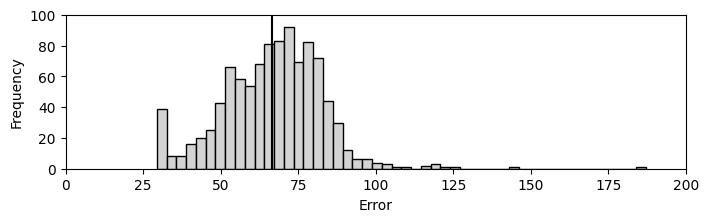

In [65]:
xscaled = np.array(rmse) 
xmean=np.mean(xscaled)
# Create a histogram

plt.figure(figsize=(8, 2))
plt.hist(xscaled, bins=50, color='lightgrey', edgecolor='black')  # You can change the number of bins
plt.plot([xmean, xmean],[0, 200],'k-')
#plt.yscale('log')
# Add titles and labels
#plt.title('Histogram of Error')
plt.xlabel('Error')
plt.ylabel('Frequency')
plt.xlim([0,200])
plt.ylim([0,100])

# Display the histogram
#plt.savefig('hist_error.pdf', format='pdf')
plt.savefig('hist_error.eps', format='eps', bbox_inches='tight')


plt.show()

In [66]:
curves.shape
print(xmean)

66.54996834623601


In [27]:
order = np.argsort(xscaled)[::-1]


In [28]:
xscaled2 = xscaled[order]

In [29]:
xscaled2

array([187.15291576, 144.55896726, 125.60195258, 121.72381294,
       119.61359092, 118.78774282, 118.58443527, 116.41817903,
       115.09841522, 111.07254324, 107.55806272, 104.9083215 ,
       102.83851076, 102.02686894, 101.74455229, 101.22653849,
       100.67901334,  98.83814573,  97.53430075,  97.22701938,
        96.83419858,  96.39754365,  96.07045737,  95.71249363,
        95.55418492,  94.52983148,  94.39370041,  94.17494014,
        93.99847639,  92.54834174,  92.05527418,  91.13355405,
        91.10991158,  91.00616723,  90.87943041,  90.77705257,
        90.5163387 ,  90.42918904,  89.84596121,  89.71321593,
        89.64208886,  89.5349517 ,  89.25353181,  89.14381005,
        88.79730161,  88.7772228 ,  88.7405983 ,  88.70617421,
        88.6795134 ,  88.46069925,  88.25092428,  88.14815442,
        88.11989522,  88.11362064,  87.94080667,  87.81943809,
        87.69668826,  87.53276649,  87.48189488,  87.31498173,
        87.24636294,  87.14804013,  87.09003354,  86.95

In [30]:
curves2 = curves[:,order]
curves2.shape

(5001, 1000)

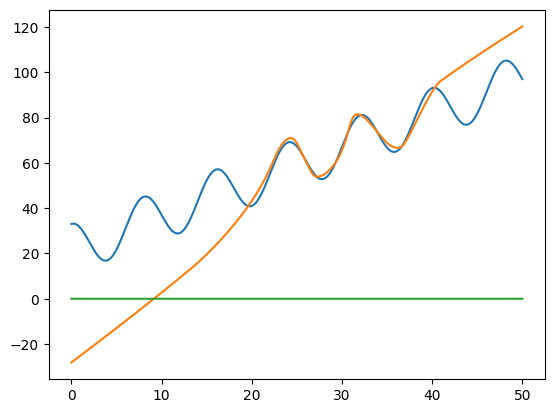

In [64]:
plt.plot(xorig,yorig)
plt.plot(xorig,curves2[:,0])
plt.plot(xorig,curves[:,0])

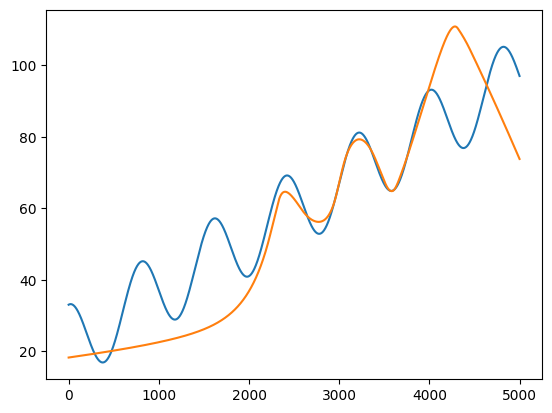

In [49]:
plt.plot(yorig)
plt.plot(curves2[:,900])

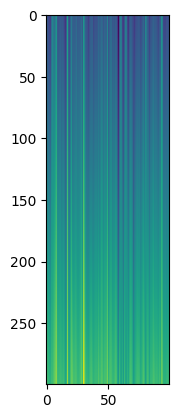

In [19]:
plt.imshow(curves2[2000:2300,:100])